In [1]:
import pandas as pd
import os
import numpy as np
#patht to the dataset file
path1 = "C:/Users/DeepLearning/Documents/Twitter-sentiment/training.1600000.processed.noemoticon.csv"
path2 = "C:/Users/DeepLearning/Documents/Twitter-sentiment/test.csv"
path3 = "C:/Users/DeepLearning/Documents/Twitter-sentiment/Test-android.csv"


# DATASET
DATASET_COLUMNS = ["Sentiment", "ids", "date", "flag", "Username", "text"]
#DATASET_COLUMNS = ["Sentiment", "text"]

DATASET_ENCODING = "latin-1"
TRAIN_SIZE = 0.8

#dataframe
Train = pd.read_csv(path1,dtype={"text": str }, encoding =DATASET_ENCODING , names=DATASET_COLUMNS, skiprows = 1)
Test = pd.read_csv(path2,dtype={"text": str }, encoding =DATASET_ENCODING, names=DATASET_COLUMNS, skiprows = 1 )


#Making a training dataset of 140 000 values instead of 1.6 million
#Train = Train.truncate(before="730 000", after="870 000")
#Train = Train.reset_index(drop=True)

Train = Train.reset_index()
Train.head(5)




,index,Sentiment,ids,date,flag,Username,text
0,0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
1,1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
2,2,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
3,3,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
4,4,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,NO_QUERY,joy_wolf,@Kwesidei not the whole crew


In [2]:
#Keeping only the columns wee need for sentiment analysis in Training dataset
#train = Train.drop(columns=['ids', 'date', 'flag', 'Username' ])
train = Train[['text', 'Sentiment']]
train = train.dropna()

train[['text']]=Train[['text']].astype(str)
train.head(5)

import pandas as pd
import re
import string
import csv
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer 
from nltk import word_tokenize
import matplotlib.pyplot as plt

train.text = train.text.astype(str)

train.index = np.arange(1, len(train)+1)
train.head(3)

#dataframes for preprocessed training and testing data
pretrain = train.copy()

import numpy
def textsentiment(x):
    if x == 4:
        return 1
    
    else:
        return 0
pretrain["Sentiment"] =  pretrain["Sentiment"].apply(lambda x:textsentiment(x))



#Remove stopwords
def stopword():
    stop=stopwords.words("english")
    pretrain["text"]=pretrain["text"].apply(lambda x:' '.join([word for word in str(x).split() if word not in (stop)]))
    

from bs4 import BeautifulSoup
# Install a conda package in the current Jupyter kernel

#remove special characters
def clean(text):
    """ Clean the text and return the cleaned text. """

    # make all letters lowercase
    text = text.lower()
    
    # remove @mentions
    text = re.sub('@[A-Za-z0-9]+', '', text)
    
    # remove URLs
    text = re.sub('https?://[A-Za-z0-9./]+', '', text)
    
    # remove HTML encoding
    text = BeautifulSoup(text, 'html.parser').get_text()
    
    # remove punctuation, numbers, hashtag symbols
    text = re.sub("[^a-zA-Z]", ' ', text)
    
    # remove extra whitespaces between words
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

stopword()
pretrain['text'] = pretrain['text'].apply(lambda x: clean(x))

#make a bag of words using gensm vectorize
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
#tokenizer to remove unwanted elements from out data like symbols and numbers
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(lowercase=True,stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
text_counts= cv.fit_transform(pretrain['text'])

C:\Anaconda\envs\AzureML\lib\site-packages\bs4\__init__.py:302: UserWarning: "b' ...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
C:\Anaconda\envs\AzureML\lib\site-packages\bs4\__init__.py:302: UserWarning: "b'.'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
C:\Anaconda\envs\AzureML\lib\site-packages\bs4\__init__.py:302: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
C:\Anaconda\envs\AzureML\lib\site-packages\bs4\__init__.py:302: UserWarning: "b' ....'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
C:\Anaconda\envs\AzureML\lib\site-packages\bs4\__init__.py:302: UserWar

In [3]:
# %%

from collections import Counter
import nltk
import pandas as pd
import re as regex
import numpy as np
import plotly
from plotly import graph_objs
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from time import time
import gensim

import random

seed = 666
random.seed(seed)

def test_classifier(X_train, y_train, X_test, y_test, classifier):
    log("")
    log("===============================================")
    classifier_name = str(type(classifier).__name__)
    log("Testing " + classifier_name)
    now = time()
    list_of_labels = sorted(list(set(y_train)))
    model = classifier.fit(X_train, y_train)
    log("Learing time {0}s".format(time() - now))
    now = time()
    predictions = model.predict(X_test)
    log("Predicting time {0}s".format(time() - now))

    precision = precision_score(y_test, predictions, average=None, pos_label=None, labels=list_of_labels)
    recall = recall_score(y_test, predictions, average=None, pos_label=None, labels=list_of_labels)
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions, average=None, pos_label=None, labels=list_of_labels)
    log("=================== Results ===================")
    log("            Negative     Positive              ")
    log("F1       " + str(f1))
    log("Precision" + str(precision))
    log("Recall   " + str(recall))
    log("Accuracy " + str(accuracy))
    log("===============================================")

    return precision, recall, accuracy, f1

def log(x):
    #can be used to write to log file
    print(x)
    

from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(text_counts, pretrain['Sentiment'],
                                                    train_size=0.7, stratify=pretrain['Sentiment'],
                                                    random_state=seed)
precision, recall, accuracy, f1 = test_classifier(X_train, y_train, X_test, y_test, BernoulliNB())

C:\Anaconda\envs\AzureML\lib\site-packages\gensim\utils.py:1197: UserWarning:

detected Windows; aliasing chunkize to chunkize_serial

C:\Anaconda\envs\AzureML\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning:

From version 0.21, test_size will always complement train_size unless both are specified.




Testing BernoulliNB
Learing time 0.4361288547515869s
Predicting time 0.10937738418579102s
=================== Results ===================
            Negative     Positive              
F1       [0.76390922 0.76634894]
Precision[0.76791842 0.76240964]
Recall   [0.75994167 0.77032917]
Accuracy 0.7651354166666666


In [4]:
#Import dependencies
import tensorflow as tf
import numpy as np
import keras
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from livelossplot.keras import PlotLossesCallback

import tensorflow as tf
import pandas as pd 
import numpy as np
from string import punctuation
from collections import Counter
from tqdm import tqdm

#Import dependencies
import tensorflow as tf
import numpy as np
import keras
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from livelossplot.keras import PlotLossesCallback

import tensorflow as tf
import pandas as pd 
import numpy as np
from string import punctuation
from collections import Counter
from tqdm import tqdm

#Import dependencies
import tensorflow as tf
import numpy as np
import keras
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from livelossplot.keras import PlotLossesCallback



from sklearn.utils import shuffle
DLpretrain = pretrain.copy()


DLpretrain = shuffle(DLpretrain)

from numpy import array
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.embeddings import Embedding



Xtrain = []
sentences = list(DLpretrain['text'])
for sen in sentences:
    Xtrain.append(sen)
    

    
ytrain = DLpretrain['Sentiment']


ytrain = np.array(list(map(lambda x: x, ytrain)))

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(Xtrain, ytrain, test_size=0.20, random_state=42)

from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train)

X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)

# Adding 1 because of reserved 0 index
vocab_size = len(tokenizer.word_index) + 1

maxlen = 100

X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)

from numpy import array
from numpy import asarray
from numpy import zeros

embeddings_dictionary = dict()
glove_file = open('C:/Users/DeepLearning/Documents/Twitter-sentiment/glove.6B.100d.txt', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = asarray(records[1:], dtype='float32')
    embeddings_dictionary [word] = vector_dimensions
glove_file.close()

embedding_matrix = zeros((vocab_size, 100))
for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector
        



Using TensorFlow backend.


In [5]:
from keras.layers import GlobalMaxPooling1D
from keras.layers import LSTM, Conv1D, Dense, Flatten, MaxPooling1D, Dropout
from sklearn.metrics import confusion_matrix, roc_curve,  roc_auc_score, classification_report



# create the model
top_words = 5000
model2 = Sequential()
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)
model2.add(embedding_layer)
model2.add(Conv1D(filters=64, kernel_size=5, padding='same', activation='relu'))
model2.add(Conv1D(filters=32, kernel_size=5, padding='same', activation='relu'))


model2.add(MaxPooling1D(pool_size=2))
model2.add(Dropout(0.7))
model2.add(LSTM(150))
model2.add(Dropout(0.7))
model2.add(Dense(1, activation='sigmoid'))
model2.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model2.summary())

history2 = model2.fit(X_train, y_train, batch_size=64, epochs=7, verbose=1, validation_split=0.1)


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 100, 100)          23895600  
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 100, 64)           32064     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 100, 32)           10272     
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 50, 32)            0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 50, 32)            0         
_________________________________________________________________
lstm_1 (LSTM)        

  12992/1151999 [..............................] - ETA: 11:01:42 - loss: 0.6931 - acc: 0.421 - ETA: 5:47:14 - loss: 0.6931 - acc: 0.476 - ETA: 3:59:17 - loss: 0.6928 - acc: 0.50 - ETA: 3:06:29 - loss: 0.6929 - acc: 0.50 - ETA: 2:34:48 - loss: 0.6938 - acc: 0.47 - ETA: 2:12:54 - loss: 0.6934 - acc: 0.48 - ETA: 1:57:15 - loss: 0.6936 - acc: 0.48 - ETA: 1:45:31 - loss: 0.6936 - acc: 0.48 - ETA: 1:36:26 - loss: 0.6939 - acc: 0.46 - ETA: 1:29:08 - loss: 0.6937 - acc: 0.47 - ETA: 1:23:09 - loss: 0.6938 - acc: 0.47 - ETA: 1:18:33 - loss: 0.6937 - acc: 0.47 - ETA: 1:14:19 - loss: 0.6935 - acc: 0.48 - ETA: 1:10:40 - loss: 0.6934 - acc: 0.49 - ETA: 1:07:31 - loss: 0.6934 - acc: 0.49 - ETA: 1:04:28 - loss: 0.6934 - acc: 0.49 - ETA: 1:02:03 - loss: 0.6933 - acc: 0.50 - ETA: 59:54 - loss: 0.6933 - acc: 0.5009 - ETA: 57:58 - loss: 0.6933 - acc: 0.50 - ETA: 56:14 - loss: 0.6932 - acc: 0.50 - ETA: 54:55 - loss: 0.6933 - acc: 0.49 - ETA: 53:29 - loss: 0.6933 - acc: 0.49 - ETA: 51:58 - loss: 0.6933 - ac

  26048/1151999 [..............................] - ETA: 26:30 - loss: 0.6935 - acc: 0.50 - ETA: 26:29 - loss: 0.6935 - acc: 0.50 - ETA: 26:28 - loss: 0.6935 - acc: 0.50 - ETA: 26:27 - loss: 0.6934 - acc: 0.50 - ETA: 26:26 - loss: 0.6934 - acc: 0.50 - ETA: 26:25 - loss: 0.6934 - acc: 0.50 - ETA: 26:24 - loss: 0.6934 - acc: 0.50 - ETA: 26:23 - loss: 0.6934 - acc: 0.50 - ETA: 26:22 - loss: 0.6934 - acc: 0.50 - ETA: 26:21 - loss: 0.6934 - acc: 0.50 - ETA: 26:20 - loss: 0.6934 - acc: 0.50 - ETA: 26:19 - loss: 0.6934 - acc: 0.50 - ETA: 26:18 - loss: 0.6933 - acc: 0.50 - ETA: 26:17 - loss: 0.6933 - acc: 0.50 - ETA: 26:16 - loss: 0.6931 - acc: 0.50 - ETA: 26:15 - loss: 0.6932 - acc: 0.50 - ETA: 26:14 - loss: 0.6930 - acc: 0.50 - ETA: 26:13 - loss: 0.6931 - acc: 0.50 - ETA: 26:14 - loss: 0.6936 - acc: 0.50 - ETA: 26:11 - loss: 0.6931 - acc: 0.50 - ETA: 26:12 - loss: 0.6928 - acc: 0.50 - ETA: 26:11 - loss: 0.6925 - acc: 0.50 - ETA: 26:11 - loss: 0.6926 - acc: 0.50 - ETA: 26:10 - loss: 0.6925 - a

  39104/1151999 [>.............................] - ETA: 24:28 - loss: 0.6931 - acc: 0.50 - ETA: 24:28 - loss: 0.6931 - acc: 0.50 - ETA: 24:27 - loss: 0.6931 - acc: 0.50 - ETA: 24:27 - loss: 0.6931 - acc: 0.50 - ETA: 24:27 - loss: 0.6931 - acc: 0.50 - ETA: 24:26 - loss: 0.6931 - acc: 0.50 - ETA: 24:25 - loss: 0.6931 - acc: 0.50 - ETA: 24:25 - loss: 0.6931 - acc: 0.50 - ETA: 24:25 - loss: 0.6931 - acc: 0.50 - ETA: 24:25 - loss: 0.6931 - acc: 0.50 - ETA: 24:25 - loss: 0.6931 - acc: 0.50 - ETA: 24:24 - loss: 0.6931 - acc: 0.50 - ETA: 24:24 - loss: 0.6931 - acc: 0.50 - ETA: 24:23 - loss: 0.6931 - acc: 0.50 - ETA: 24:23 - loss: 0.6931 - acc: 0.50 - ETA: 24:22 - loss: 0.6931 - acc: 0.50 - ETA: 24:23 - loss: 0.6931 - acc: 0.50 - ETA: 24:22 - loss: 0.6931 - acc: 0.50 - ETA: 24:22 - loss: 0.6931 - acc: 0.50 - ETA: 24:22 - loss: 0.6931 - acc: 0.50 - ETA: 24:21 - loss: 0.6931 - acc: 0.50 - ETA: 24:21 - loss: 0.6931 - acc: 0.50 - ETA: 24:21 - loss: 0.6931 - acc: 0.50 - ETA: 24:20 - loss: 0.6931 - a

  52160/1151999 [>.............................] - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:58 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - acc: 0.50 - ETA: 23:57 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - acc: 0.50 - ETA: 23:56 - loss: 0.6932 - a

  65216/1151999 [>.............................] - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:24 - loss: 0.6932 - acc: 0.50 - ETA: 23:24 - loss: 0.6933 - acc: 0.50 - ETA: 23:24 - loss: 0.6932 - acc: 0.50 - ETA: 23:25 - loss: 0.6932 - acc: 0.50 - ETA: 23:24 - loss: 0.6933 - acc: 0.50 - ETA: 23:24 - loss: 0.6932 - acc: 0.50 - ETA: 23:24 - loss: 0.6932 - acc: 0.50 - ETA: 23:24 - loss: 0.6932 - acc: 0.50 - ETA: 23:23 - loss: 0.6933 - acc: 0.50 - ETA: 23:23 - loss: 0.6933 - acc: 0.50 - ETA: 23:23 - loss: 0.6933 - acc: 0.50 - ETA: 23:23 - loss: 0.6933 - acc: 0.50 - ETA: 23:23 - loss: 0.6933 - acc: 0.50 - ETA: 23:22 - loss: 0.6933 - acc: 0.50 - ETA: 23:22 - loss: 0.6933 - acc: 0.50 - ETA: 23:22 - loss: 0.6933 - acc: 0.50 - ETA: 23:22 - loss: 0.6933 - acc: 0.50 - ETA: 23:22 - loss: 0.6933 - a

  78272/1151999 [=>............................] - ETA: 22:53 - loss: 0.6932 - acc: 0.50 - ETA: 22:53 - loss: 0.6932 - acc: 0.50 - ETA: 22:53 - loss: 0.6932 - acc: 0.50 - ETA: 22:53 - loss: 0.6932 - acc: 0.50 - ETA: 22:53 - loss: 0.6932 - acc: 0.50 - ETA: 22:53 - loss: 0.6932 - acc: 0.50 - ETA: 22:52 - loss: 0.6932 - acc: 0.50 - ETA: 22:52 - loss: 0.6932 - acc: 0.50 - ETA: 22:52 - loss: 0.6933 - acc: 0.50 - ETA: 22:52 - loss: 0.6932 - acc: 0.50 - ETA: 22:52 - loss: 0.6932 - acc: 0.50 - ETA: 22:52 - loss: 0.6933 - acc: 0.50 - ETA: 22:52 - loss: 0.6932 - acc: 0.50 - ETA: 22:52 - loss: 0.6933 - acc: 0.50 - ETA: 22:51 - loss: 0.6933 - acc: 0.50 - ETA: 22:51 - loss: 0.6933 - acc: 0.50 - ETA: 22:51 - loss: 0.6932 - acc: 0.50 - ETA: 22:51 - loss: 0.6932 - acc: 0.50 - ETA: 22:51 - loss: 0.6932 - acc: 0.50 - ETA: 22:51 - loss: 0.6932 - acc: 0.50 - ETA: 22:51 - loss: 0.6932 - acc: 0.50 - ETA: 22:50 - loss: 0.6932 - acc: 0.50 - ETA: 22:50 - loss: 0.6932 - acc: 0.50 - ETA: 22:50 - loss: 0.6932 - a

  91328/1151999 [=>............................] - ETA: 22:25 - loss: 0.6933 - acc: 0.50 - ETA: 22:25 - loss: 0.6933 - acc: 0.50 - ETA: 22:25 - loss: 0.6933 - acc: 0.50 - ETA: 22:25 - loss: 0.6933 - acc: 0.50 - ETA: 22:25 - loss: 0.6933 - acc: 0.50 - ETA: 22:25 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:24 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:23 - loss: 0.6933 - acc: 0.50 - ETA: 22:22 - loss: 0.6933 - acc: 0.50 - ETA: 22:22 - loss: 0.6933 - acc: 0.50 - ETA: 22:22 - loss: 0.6933 - acc: 0.50 - ETA: 22:22 - loss: 0.6933 - a

 104384/1151999 [=>............................] - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:04 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:03 - loss: 0.6933 - acc: 0.50 - ETA: 22:02 - loss: 0.6933 - acc: 0.50 - ETA: 22:02 - loss: 0.6933 - acc: 0.50 - ETA: 22:02 - loss: 0.6933 - acc: 0.50 - ETA: 22:02 - loss: 0.6933 - acc: 0.50 - ETA: 22:02 - loss: 0.6933 - acc: 0.50 - ETA: 22:02 - loss: 0.6933 - a

 117440/1151999 [==>...........................] - ETA: 21:43 - loss: 0.6933 - acc: 0.50 - ETA: 21:43 - loss: 0.6933 - acc: 0.50 - ETA: 21:43 - loss: 0.6933 - acc: 0.50 - ETA: 21:43 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:42 - loss: 0.6933 - acc: 0.50 - ETA: 21:41 - loss: 0.6933 - acc: 0.50 - ETA: 21:41 - loss: 0.6933 - acc: 0.50 - ETA: 21:41 - loss: 0.6933 - acc: 0.50 - ETA: 21:41 - loss: 0.6933 - acc: 0.50 - ETA: 21:41 - loss: 0.6933 - acc: 0.50 - ETA: 21:41 - loss: 0.6933 - a

 130496/1151999 [==>...........................] - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:22 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:21 - loss: 0.6933 - acc: 0.50 - ETA: 21:20 - loss: 0.6933 - acc: 0.50 - ETA: 21:20 - loss: 0.6933 - acc: 0.50 - ETA: 21:20 - loss: 0.6933 - a

 143552/1151999 [==>...........................] - ETA: 21:03 - loss: 0.6933 - acc: 0.50 - ETA: 21:03 - loss: 0.6933 - acc: 0.50 - ETA: 21:03 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:02 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:01 - loss: 0.6933 - acc: 0.50 - ETA: 21:00 - loss: 0.6933 - acc: 0.50 - ETA: 21:00 - loss: 0.6933 - acc: 0.50 - ETA: 21:00 - loss: 0.6933 - a

 156608/1151999 [===>..........................] - ETA: 20:44 - loss: 0.6933 - acc: 0.50 - ETA: 20:44 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:43 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:42 - loss: 0.6933 - acc: 0.50 - ETA: 20:41 - loss: 0.6933 - acc: 0.50 - ETA: 20:41 - loss: 0.6933 - a

 169664/1151999 [===>..........................] - ETA: 20:25 - loss: 0.6933 - acc: 0.50 - ETA: 20:25 - loss: 0.6933 - acc: 0.50 - ETA: 20:25 - loss: 0.6933 - acc: 0.50 - ETA: 20:25 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:24 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - acc: 0.50 - ETA: 20:23 - loss: 0.6933 - a

 182720/1151999 [===>..........................] - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:06 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:05 - loss: 0.6933 - acc: 0.50 - ETA: 20:04 - loss: 0.6933 - a

 195776/1151999 [====>.........................] - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:48 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:47 - loss: 0.6933 - acc: 0.50 - ETA: 19:46 - loss: 0.6933 - acc: 0.50 - ETA: 19:46 - loss: 0.6933 - acc: 0.50 - ETA: 19:46 - loss: 0.6933 - acc: 0.50 - ETA: 19:46 - loss: 0.6933 - a

 208832/1151999 [====>.........................] - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:31 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - acc: 0.50 - ETA: 19:30 - loss: 0.6933 - a

 221888/1151999 [====>.........................] - ETA: 19:15 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:14 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - acc: 0.50 - ETA: 19:13 - loss: 0.6933 - a

 234944/1151999 [=====>........................] - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:57 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:56 - loss: 0.6933 - acc: 0.50 - ETA: 18:55 - loss: 0.6933 - acc: 0.50 - ETA: 18:55 - loss: 0.6933 - a

 248000/1151999 [=====>........................] - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:40 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:39 - loss: 0.6933 - acc: 0.50 - ETA: 18:38 - loss: 0.6933 - acc: 0.50 - ETA: 18:38 - loss: 0.6933 - a

 261056/1151999 [=====>........................] - ETA: 18:24 - loss: 0.6933 - acc: 0.50 - ETA: 18:24 - loss: 0.6933 - acc: 0.50 - ETA: 18:24 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:23 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - acc: 0.50 - ETA: 18:22 - loss: 0.6933 - a

 274112/1151999 [======>.......................] - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:07 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:06 - loss: 0.6933 - acc: 0.50 - ETA: 18:05 - loss: 0.6933 - acc: 0.50 - ETA: 18:05 - loss: 0.6933 - acc: 0.50 - ETA: 18:05 - loss: 0.6933 - a

 287168/1151999 [======>.......................] - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:50 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:49 - loss: 0.6933 - acc: 0.50 - ETA: 17:48 - loss: 0.6933 - a

 300224/1151999 [======>.......................] - ETA: 17:34 - loss: 0.6933 - acc: 0.50 - ETA: 17:34 - loss: 0.6933 - acc: 0.50 - ETA: 17:34 - loss: 0.6933 - acc: 0.50 - ETA: 17:34 - loss: 0.6933 - acc: 0.50 - ETA: 17:34 - loss: 0.6933 - acc: 0.50 - ETA: 17:34 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:33 - loss: 0.6933 - acc: 0.50 - ETA: 17:32 - loss: 0.6933 - acc: 0.50 - ETA: 17:32 - loss: 0.6933 - acc: 0.50 - ETA: 17:32 - loss: 0.6933 - acc: 0.50 - ETA: 17:32 - loss: 0.6933 - acc: 0.50 - ETA: 17:32 - loss: 0.6933 - a

 313280/1151999 [=======>......................] - ETA: 17:18 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:17 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - acc: 0.50 - ETA: 17:16 - loss: 0.6933 - a

 326336/1151999 [=======>......................] - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:01 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 17:00 - loss: 0.6933 - acc: 0.50 - ETA: 16:59 - loss: 0.6933 - acc: 0.50 - ETA: 16:59 - loss: 0.6933 - acc: 0.50 - ETA: 16:59 - loss: 0.6933 - a

 339392/1151999 [=======>......................] - ETA: 16:45 - loss: 0.6933 - acc: 0.50 - ETA: 16:45 - loss: 0.6933 - acc: 0.50 - ETA: 16:45 - loss: 0.6933 - acc: 0.50 - ETA: 16:45 - loss: 0.6933 - acc: 0.50 - ETA: 16:45 - loss: 0.6933 - acc: 0.50 - ETA: 16:45 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:43 - loss: 0.6933 - acc: 0.50 - ETA: 16:43 - loss: 0.6933 - acc: 0.50 - ETA: 16:43 - loss: 0.6933 - acc: 0.50 - ETA: 16:43 - loss: 0.6933 - acc: 0.50 - ETA: 16:43 - loss: 0.6933 - a

 352448/1151999 [========>.....................] - ETA: 16:29 - loss: 0.6933 - acc: 0.50 - ETA: 16:29 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:28 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - acc: 0.50 - ETA: 16:27 - loss: 0.6933 - a

 365504/1151999 [========>.....................] - ETA: 16:13 - loss: 0.6933 - acc: 0.50 - ETA: 16:13 - loss: 0.6933 - acc: 0.50 - ETA: 16:13 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:12 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - acc: 0.50 - ETA: 16:11 - loss: 0.6933 - a

 378560/1151999 [========>.....................] - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:57 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:56 - loss: 0.6933 - acc: 0.50 - ETA: 15:55 - loss: 0.6933 - acc: 0.50 - ETA: 15:55 - loss: 0.6933 - acc: 0.50 - ETA: 15:55 - loss: 0.6933 - acc: 0.50 - ETA: 15:55 - loss: 0.6933 - a

 391616/1151999 [=========>....................] - ETA: 15:41 - loss: 0.6933 - acc: 0.50 - ETA: 15:41 - loss: 0.6933 - acc: 0.50 - ETA: 15:41 - loss: 0.6933 - acc: 0.50 - ETA: 15:41 - loss: 0.6933 - acc: 0.50 - ETA: 15:41 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:40 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - acc: 0.50 - ETA: 15:39 - loss: 0.6933 - a

 404672/1151999 [=========>....................] - ETA: 15:25 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:24 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - acc: 0.50 - ETA: 15:23 - loss: 0.6933 - a

 417728/1151999 [=========>....................] - ETA: 15:09 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:08 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - acc: 0.50 - ETA: 15:07 - loss: 0.6933 - a

 430784/1151999 [==========>...................] - ETA: 14:53 - loss: 0.6933 - acc: 0.50 - ETA: 14:53 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:52 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - acc: 0.50 - ETA: 14:51 - loss: 0.6933 - a

 443840/1151999 [==========>...................] - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:37 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:36 - loss: 0.6933 - acc: 0.50 - ETA: 14:35 - loss: 0.6933 - a

 456896/1151999 [==========>...................] - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:21 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - acc: 0.50 - ETA: 14:20 - loss: 0.6933 - a

 469952/1151999 [===========>..................] - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:05 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - acc: 0.50 - ETA: 14:04 - loss: 0.6933 - a

 483008/1151999 [===========>..................] - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:49 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - acc: 0.50 - ETA: 13:48 - loss: 0.6933 - a

 496064/1151999 [===========>..................] - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:33 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - acc: 0.50 - ETA: 13:32 - loss: 0.6933 - a

 509120/1151999 [============>.................] - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:17 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:16 - loss: 0.6933 - acc: 0.50 - ETA: 13:15 - loss: 0.6933 - acc: 0.50 - ETA: 13:15 - loss: 0.6933 - a

 522176/1151999 [============>.................] - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:01 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 13:00 - loss: 0.6932 - acc: 0.50 - ETA: 12:59 - loss: 0.6932 - acc: 0.50 - ETA: 12:59 - loss: 0.6932 - a

 535232/1151999 [============>.................] - ETA: 12:45 - loss: 0.6924 - acc: 0.50 - ETA: 12:45 - loss: 0.6924 - acc: 0.50 - ETA: 12:45 - loss: 0.6923 - acc: 0.50 - ETA: 12:45 - loss: 0.6923 - acc: 0.50 - ETA: 12:45 - loss: 0.6923 - acc: 0.50 - ETA: 12:45 - loss: 0.6923 - acc: 0.50 - ETA: 12:45 - loss: 0.6923 - acc: 0.50 - ETA: 12:44 - loss: 0.6923 - acc: 0.50 - ETA: 12:44 - loss: 0.6923 - acc: 0.50 - ETA: 12:44 - loss: 0.6923 - acc: 0.50 - ETA: 12:44 - loss: 0.6923 - acc: 0.50 - ETA: 12:44 - loss: 0.6923 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:44 - loss: 0.6922 - acc: 0.50 - ETA: 12:43 - loss: 0.6922 - acc: 0.50 - ETA: 12:43 - loss: 0.6922 - acc: 0.50 - ETA: 12:43 - loss: 0.6922 - acc: 0.50 - ETA: 12:43 - loss: 0.6921 - acc: 0.50 - ETA: 12:43 - loss: 0.6921 - a

 548288/1151999 [=============>................] - ETA: 12:29 - loss: 0.6905 - acc: 0.51 - ETA: 12:29 - loss: 0.6905 - acc: 0.51 - ETA: 12:29 - loss: 0.6905 - acc: 0.51 - ETA: 12:29 - loss: 0.6905 - acc: 0.51 - ETA: 12:29 - loss: 0.6905 - acc: 0.51 - ETA: 12:29 - loss: 0.6905 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6904 - acc: 0.51 - ETA: 12:28 - loss: 0.6903 - acc: 0.51 - ETA: 12:28 - loss: 0.6903 - acc: 0.51 - ETA: 12:28 - loss: 0.6903 - acc: 0.51 - ETA: 12:28 - loss: 0.6903 - acc: 0.51 - ETA: 12:27 - loss: 0.6903 - acc: 0.51 - ETA: 12:27 - loss: 0.6903 - acc: 0.51 - ETA: 12:27 - loss: 0.6903 - acc: 0.51 - ETA: 12:27 - loss: 0.6903 - acc: 0.51 - ETA: 12:27 - loss: 0.6903 - a

 561344/1151999 [=============>................] - ETA: 12:13 - loss: 0.6884 - acc: 0.51 - ETA: 12:13 - loss: 0.6883 - acc: 0.51 - ETA: 12:13 - loss: 0.6883 - acc: 0.51 - ETA: 12:13 - loss: 0.6883 - acc: 0.51 - ETA: 12:13 - loss: 0.6883 - acc: 0.51 - ETA: 12:12 - loss: 0.6883 - acc: 0.51 - ETA: 12:12 - loss: 0.6883 - acc: 0.51 - ETA: 12:12 - loss: 0.6883 - acc: 0.51 - ETA: 12:12 - loss: 0.6883 - acc: 0.51 - ETA: 12:12 - loss: 0.6882 - acc: 0.51 - ETA: 12:12 - loss: 0.6882 - acc: 0.51 - ETA: 12:12 - loss: 0.6882 - acc: 0.51 - ETA: 12:12 - loss: 0.6882 - acc: 0.51 - ETA: 12:12 - loss: 0.6882 - acc: 0.51 - ETA: 12:12 - loss: 0.6882 - acc: 0.51 - ETA: 12:12 - loss: 0.6881 - acc: 0.51 - ETA: 12:12 - loss: 0.6881 - acc: 0.51 - ETA: 12:12 - loss: 0.6881 - acc: 0.51 - ETA: 12:11 - loss: 0.6881 - acc: 0.51 - ETA: 12:11 - loss: 0.6881 - acc: 0.51 - ETA: 12:11 - loss: 0.6881 - acc: 0.51 - ETA: 12:11 - loss: 0.6881 - acc: 0.51 - ETA: 12:11 - loss: 0.6881 - acc: 0.51 - ETA: 12:11 - loss: 0.6881 - a

 574400/1151999 [=============>................] - ETA: 11:57 - loss: 0.6858 - acc: 0.51 - ETA: 11:57 - loss: 0.6858 - acc: 0.51 - ETA: 11:57 - loss: 0.6858 - acc: 0.51 - ETA: 11:57 - loss: 0.6858 - acc: 0.51 - ETA: 11:57 - loss: 0.6858 - acc: 0.51 - ETA: 11:56 - loss: 0.6858 - acc: 0.51 - ETA: 11:56 - loss: 0.6858 - acc: 0.51 - ETA: 11:56 - loss: 0.6858 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6857 - acc: 0.51 - ETA: 11:56 - loss: 0.6856 - acc: 0.51 - ETA: 11:56 - loss: 0.6856 - acc: 0.51 - ETA: 11:56 - loss: 0.6856 - acc: 0.51 - ETA: 11:55 - loss: 0.6856 - acc: 0.51 - ETA: 11:55 - loss: 0.6856 - acc: 0.51 - ETA: 11:55 - loss: 0.6856 - acc: 0.51 - ETA: 11:55 - loss: 0.6855 - acc: 0.51 - ETA: 11:55 - loss: 0.6855 - acc: 0.51 - ETA: 11:55 - loss: 0.6855 - a

 587456/1151999 [==============>...............] - ETA: 11:41 - loss: 0.6831 - acc: 0.52 - ETA: 11:41 - loss: 0.6831 - acc: 0.52 - ETA: 11:41 - loss: 0.6830 - acc: 0.52 - ETA: 11:41 - loss: 0.6830 - acc: 0.52 - ETA: 11:41 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6830 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:40 - loss: 0.6829 - acc: 0.52 - ETA: 11:39 - loss: 0.6828 - acc: 0.52 - ETA: 11:39 - loss: 0.6828 - acc: 0.52 - ETA: 11:39 - loss: 0.6828 - acc: 0.52 - ETA: 11:39 - loss: 0.6828 - acc: 0.52 - ETA: 11:39 - loss: 0.6828 - acc: 0.52 - ETA: 11:39 - loss: 0.6828 - a

 600512/1151999 [==============>...............] - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:25 - loss: 0.6806 - acc: 0.52 - ETA: 11:24 - loss: 0.6806 - acc: 0.52 - ETA: 11:24 - loss: 0.6806 - acc: 0.52 - ETA: 11:24 - loss: 0.6806 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6805 - acc: 0.52 - ETA: 11:24 - loss: 0.6804 - acc: 0.52 - ETA: 11:23 - loss: 0.6804 - acc: 0.52 - ETA: 11:23 - loss: 0.6804 - acc: 0.52 - ETA: 11:23 - loss: 0.6804 - acc: 0.52 - ETA: 11:23 - loss: 0.6804 - a

 613568/1151999 [==============>...............] - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6781 - acc: 0.53 - ETA: 11:09 - loss: 0.6780 - acc: 0.53 - ETA: 11:08 - loss: 0.6780 - acc: 0.53 - ETA: 11:08 - loss: 0.6780 - acc: 0.53 - ETA: 11:08 - loss: 0.6780 - acc: 0.53 - ETA: 11:08 - loss: 0.6780 - acc: 0.53 - ETA: 11:08 - loss: 0.6780 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:08 - loss: 0.6779 - acc: 0.53 - ETA: 11:07 - loss: 0.6779 - acc: 0.53 - ETA: 11:07 - loss: 0.6778 - acc: 0.53 - ETA: 11:07 - loss: 0.6778 - a

 626624/1151999 [===============>..............] - ETA: 10:53 - loss: 0.6757 - acc: 0.53 - ETA: 10:53 - loss: 0.6757 - acc: 0.53 - ETA: 10:53 - loss: 0.6757 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:53 - loss: 0.6756 - acc: 0.53 - ETA: 10:52 - loss: 0.6756 - acc: 0.53 - ETA: 10:52 - loss: 0.6756 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6755 - acc: 0.53 - ETA: 10:52 - loss: 0.6754 - acc: 0.53 - ETA: 10:52 - loss: 0.6754 - acc: 0.53 - ETA: 10:52 - loss: 0.6754 - acc: 0.53 - ETA: 10:51 - loss: 0.6754 - acc: 0.53 - ETA: 10:51 - loss: 0.6754 - a

 639680/1151999 [===============>..............] - ETA: 10:37 - loss: 0.6731 - acc: 0.53 - ETA: 10:37 - loss: 0.6731 - acc: 0.53 - ETA: 10:37 - loss: 0.6731 - acc: 0.53 - ETA: 10:37 - loss: 0.6731 - acc: 0.53 - ETA: 10:37 - loss: 0.6731 - acc: 0.53 - ETA: 10:37 - loss: 0.6731 - acc: 0.53 - ETA: 10:37 - loss: 0.6730 - acc: 0.53 - ETA: 10:37 - loss: 0.6730 - acc: 0.53 - ETA: 10:37 - loss: 0.6730 - acc: 0.53 - ETA: 10:37 - loss: 0.6730 - acc: 0.53 - ETA: 10:37 - loss: 0.6730 - acc: 0.53 - ETA: 10:36 - loss: 0.6730 - acc: 0.53 - ETA: 10:36 - loss: 0.6730 - acc: 0.53 - ETA: 10:36 - loss: 0.6730 - acc: 0.53 - ETA: 10:36 - loss: 0.6730 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:36 - loss: 0.6729 - acc: 0.53 - ETA: 10:35 - loss: 0.6728 - a

 652736/1151999 [===============>..............] - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6708 - acc: 0.54 - ETA: 10:21 - loss: 0.6707 - acc: 0.54 - ETA: 10:21 - loss: 0.6707 - acc: 0.54 - ETA: 10:21 - loss: 0.6707 - acc: 0.54 - ETA: 10:21 - loss: 0.6707 - acc: 0.54 - ETA: 10:20 - loss: 0.6707 - acc: 0.54 - ETA: 10:20 - loss: 0.6707 - acc: 0.54 - ETA: 10:20 - loss: 0.6707 - acc: 0.54 - ETA: 10:20 - loss: 0.6707 - acc: 0.54 - ETA: 10:20 - loss: 0.6707 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - acc: 0.54 - ETA: 10:20 - loss: 0.6706 - a

 665792/1151999 [================>.............] - ETA: 10:06 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6684 - acc: 0.54 - ETA: 10:05 - loss: 0.6683 - acc: 0.54 - ETA: 10:05 - loss: 0.6683 - acc: 0.54 - ETA: 10:05 - loss: 0.6683 - acc: 0.54 - ETA: 10:05 - loss: 0.6683 - acc: 0.54 - ETA: 10:05 - loss: 0.6683 - acc: 0.54 - ETA: 10:05 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6682 - acc: 0.54 - ETA: 10:04 - loss: 0.6681 - a

 678848/1151999 [================>.............] - ETA: 9:50 - loss: 0.6660 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6659 - acc: 0.549 - ETA: 9:49 - loss: 0.6658 - acc: 0.549 - ETA: 9:49 - loss: 0.6658 - acc: 0.549 - ETA: 9:49 - loss: 0.6658 - acc: 0.549 - ETA: 9:48 - loss: 0.6658 - acc: 0.549 - ETA: 9:48 - loss: 0.6658 - acc: 0.549 - ETA: 9:48 - loss: 0.6658 - acc: 0.549 - ETA: 9:48 - loss: 0.6658 - acc: 0.549 - ETA: 9:48 - loss: 0.6658 - acc: 0.549 - ETA: 9:48 - loss: 0.6658 - acc: 0.550 - ETA: 9:48 - loss: 0.6657 - acc: 0.550 - ETA: 9:48 - loss: 0.6657 - acc: 0.550 - ETA: 9:48 - loss: 0.6657 - acc: 0.550 - ETA: 9:48 - loss: 0.6657 - ac

 691904/1151999 [=================>............] - ETA: 9:34 - loss: 0.6637 - acc: 0.553 - ETA: 9:34 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6637 - acc: 0.553 - ETA: 9:33 - loss: 0.6636 - acc: 0.553 - ETA: 9:33 - loss: 0.6636 - acc: 0.553 - ETA: 9:33 - loss: 0.6636 - acc: 0.553 - ETA: 9:33 - loss: 0.6636 - acc: 0.553 - ETA: 9:33 - loss: 0.6636 - acc: 0.553 - ETA: 9:33 - loss: 0.6636 - acc: 0.553 - ETA: 9:32 - loss: 0.6636 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - acc: 0.553 - ETA: 9:32 - loss: 0.6635 - ac

 704960/1151999 [=================>............] - ETA: 9:18 - loss: 0.6613 - acc: 0.556 - ETA: 9:18 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6613 - acc: 0.556 - ETA: 9:17 - loss: 0.6612 - acc: 0.556 - ETA: 9:17 - loss: 0.6612 - acc: 0.556 - ETA: 9:17 - loss: 0.6612 - acc: 0.556 - ETA: 9:17 - loss: 0.6612 - acc: 0.556 - ETA: 9:17 - loss: 0.6612 - acc: 0.556 - ETA: 9:17 - loss: 0.6612 - acc: 0.556 - ETA: 9:16 - loss: 0.6612 - acc: 0.556 - ETA: 9:16 - loss: 0.6612 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - acc: 0.556 - ETA: 9:16 - loss: 0.6611 - ac

 718016/1151999 [=================>............] - ETA: 9:02 - loss: 0.6592 - acc: 0.559 - ETA: 9:02 - loss: 0.6591 - acc: 0.559 - ETA: 9:02 - loss: 0.6591 - acc: 0.559 - ETA: 9:02 - loss: 0.6591 - acc: 0.559 - ETA: 9:01 - loss: 0.6591 - acc: 0.559 - ETA: 9:01 - loss: 0.6591 - acc: 0.559 - ETA: 9:01 - loss: 0.6591 - acc: 0.559 - ETA: 9:01 - loss: 0.6591 - acc: 0.559 - ETA: 9:01 - loss: 0.6591 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:01 - loss: 0.6590 - acc: 0.559 - ETA: 9:00 - loss: 0.6590 - acc: 0.559 - ETA: 9:00 - loss: 0.6590 - acc: 0.559 - ETA: 9:00 - loss: 0.6589 - acc: 0.559 - ETA: 9:00 - loss: 0.6589 - acc: 0.559 - ETA: 9:00 - loss: 0.6589 - acc: 0.559 - ETA: 9:00 - loss: 0.6589 - acc: 0.559 - ETA: 9:00 - loss: 0.6589 - ac

 731072/1151999 [==================>...........] - ETA: 8:46 - loss: 0.6569 - acc: 0.562 - ETA: 8:46 - loss: 0.6569 - acc: 0.562 - ETA: 8:46 - loss: 0.6569 - acc: 0.562 - ETA: 8:46 - loss: 0.6569 - acc: 0.562 - ETA: 8:46 - loss: 0.6569 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6568 - acc: 0.562 - ETA: 8:45 - loss: 0.6567 - acc: 0.562 - ETA: 8:45 - loss: 0.6567 - acc: 0.562 - ETA: 8:44 - loss: 0.6567 - acc: 0.562 - ETA: 8:44 - loss: 0.6567 - acc: 0.563 - ETA: 8:44 - loss: 0.6567 - acc: 0.563 - ETA: 8:44 - loss: 0.6567 - acc: 0.563 - ETA: 8:44 - loss: 0.6567 - acc: 0.563 - ETA: 8:44 - loss: 0.6567 - ac

 744128/1151999 [==================>...........] - ETA: 8:30 - loss: 0.6548 - acc: 0.565 - ETA: 8:30 - loss: 0.6548 - acc: 0.565 - ETA: 8:30 - loss: 0.6548 - acc: 0.565 - ETA: 8:30 - loss: 0.6548 - acc: 0.565 - ETA: 8:30 - loss: 0.6548 - acc: 0.565 - ETA: 8:30 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6547 - acc: 0.565 - ETA: 8:29 - loss: 0.6546 - acc: 0.565 - ETA: 8:28 - loss: 0.6546 - acc: 0.565 - ETA: 8:28 - loss: 0.6546 - acc: 0.565 - ETA: 8:28 - loss: 0.6546 - acc: 0.565 - ETA: 8:28 - loss: 0.6546 - acc: 0.565 - ETA: 8:28 - loss: 0.6546 - ac

 757184/1151999 [==================>...........] - ETA: 8:14 - loss: 0.6528 - acc: 0.568 - ETA: 8:14 - loss: 0.6527 - acc: 0.568 - ETA: 8:14 - loss: 0.6527 - acc: 0.568 - ETA: 8:14 - loss: 0.6527 - acc: 0.568 - ETA: 8:14 - loss: 0.6527 - acc: 0.568 - ETA: 8:14 - loss: 0.6527 - acc: 0.568 - ETA: 8:14 - loss: 0.6527 - acc: 0.568 - ETA: 8:13 - loss: 0.6527 - acc: 0.568 - ETA: 8:13 - loss: 0.6527 - acc: 0.568 - ETA: 8:13 - loss: 0.6527 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6526 - acc: 0.568 - ETA: 8:13 - loss: 0.6525 - acc: 0.568 - ETA: 8:12 - loss: 0.6525 - acc: 0.568 - ETA: 8:12 - loss: 0.6525 - acc: 0.568 - ETA: 8:12 - loss: 0.6525 - acc: 0.568 - ETA: 8:12 - loss: 0.6525 - ac

 770240/1151999 [===================>..........] - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:58 - loss: 0.6507 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6506 - acc: 0.571 - ETA: 7:57 - loss: 0.6505 - acc: 0.571 - ETA: 7:57 - loss: 0.6505 - acc: 0.571 - ETA: 7:57 - loss: 0.6505 - acc: 0.571 - ETA: 7:57 - loss: 0.6505 - acc: 0.571 - ETA: 7:56 - loss: 0.6505 - acc: 0.571 - ETA: 7:56 - loss: 0.6505 - ac

 783296/1151999 [===================>..........] - ETA: 7:42 - loss: 0.6489 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:42 - loss: 0.6488 - acc: 0.574 - ETA: 7:41 - loss: 0.6488 - acc: 0.574 - ETA: 7:41 - loss: 0.6488 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:41 - loss: 0.6487 - acc: 0.574 - ETA: 7:40 - loss: 0.6487 - ac

 796352/1151999 [===================>..........] - ETA: 7:26 - loss: 0.6469 - acc: 0.576 - ETA: 7:26 - loss: 0.6469 - acc: 0.576 - ETA: 7:26 - loss: 0.6469 - acc: 0.576 - ETA: 7:26 - loss: 0.6469 - acc: 0.576 - ETA: 7:26 - loss: 0.6469 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:26 - loss: 0.6468 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.576 - ETA: 7:25 - loss: 0.6467 - acc: 0.577 - ETA: 7:25 - loss: 0.6467 - acc: 0.577 - ETA: 7:25 - loss: 0.6467 - acc: 0.577 - ETA: 7:25 - loss: 0.6467 - acc: 0.577 - ETA: 7:25 - loss: 0.6467 - ac

 809408/1151999 [====================>.........] - ETA: 7:11 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6451 - acc: 0.579 - ETA: 7:10 - loss: 0.6450 - acc: 0.579 - ETA: 7:10 - loss: 0.6450 - acc: 0.579 - ETA: 7:10 - loss: 0.6450 - acc: 0.579 - ETA: 7:10 - loss: 0.6450 - acc: 0.579 - ETA: 7:10 - loss: 0.6450 - acc: 0.579 - ETA: 7:10 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6450 - acc: 0.579 - ETA: 7:09 - loss: 0.6449 - acc: 0.579 - ETA: 7:09 - loss: 0.6449 - acc: 0.579 - ETA: 7:09 - loss: 0.6449 - acc: 0.579 - ETA: 7:09 - loss: 0.6449 - ac

 822464/1151999 [====================>.........] - ETA: 6:55 - loss: 0.6431 - acc: 0.582 - ETA: 6:55 - loss: 0.6431 - acc: 0.582 - ETA: 6:54 - loss: 0.6431 - acc: 0.582 - ETA: 6:54 - loss: 0.6431 - acc: 0.582 - ETA: 6:54 - loss: 0.6431 - acc: 0.582 - ETA: 6:54 - loss: 0.6431 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:54 - loss: 0.6430 - acc: 0.582 - ETA: 6:53 - loss: 0.6430 - acc: 0.582 - ETA: 6:53 - loss: 0.6430 - acc: 0.582 - ETA: 6:53 - loss: 0.6430 - acc: 0.582 - ETA: 6:53 - loss: 0.6430 - acc: 0.582 - ETA: 6:53 - loss: 0.6429 - acc: 0.582 - ETA: 6:53 - loss: 0.6429 - acc: 0.582 - ETA: 6:53 - loss: 0.6429 - acc: 0.582 - ETA: 6:53 - loss: 0.6429 - acc: 0.582 - ETA: 6:53 - loss: 0.6429 - ac

 835520/1151999 [====================>.........] - ETA: 6:39 - loss: 0.6412 - acc: 0.584 - ETA: 6:39 - loss: 0.6412 - acc: 0.584 - ETA: 6:39 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6412 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:38 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6411 - acc: 0.584 - ETA: 6:37 - loss: 0.6410 - ac

 848576/1151999 [=====================>........] - ETA: 6:23 - loss: 0.6394 - acc: 0.587 - ETA: 6:23 - loss: 0.6394 - acc: 0.587 - ETA: 6:23 - loss: 0.6394 - acc: 0.587 - ETA: 6:23 - loss: 0.6394 - acc: 0.587 - ETA: 6:23 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6394 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:22 - loss: 0.6393 - acc: 0.587 - ETA: 6:21 - loss: 0.6393 - acc: 0.587 - ETA: 6:21 - loss: 0.6393 - acc: 0.587 - ETA: 6:21 - loss: 0.6393 - acc: 0.587 - ETA: 6:21 - loss: 0.6393 - acc: 0.587 - ETA: 6:21 - loss: 0.6393 - acc: 0.587 - ETA: 6:21 - loss: 0.6393 - ac

 861632/1151999 [=====================>........] - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:07 - loss: 0.6378 - acc: 0.589 - ETA: 6:06 - loss: 0.6378 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:06 - loss: 0.6377 - acc: 0.589 - ETA: 6:05 - loss: 0.6376 - acc: 0.589 - ETA: 6:05 - loss: 0.6376 - acc: 0.589 - ETA: 6:05 - loss: 0.6376 - acc: 0.589 - ETA: 6:05 - loss: 0.6376 - ac

 874688/1151999 [=====================>........] - ETA: 5:51 - loss: 0.6362 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:51 - loss: 0.6361 - acc: 0.591 - ETA: 5:50 - loss: 0.6361 - acc: 0.591 - ETA: 5:50 - loss: 0.6361 - acc: 0.591 - ETA: 5:50 - loss: 0.6361 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6360 - acc: 0.591 - ETA: 5:50 - loss: 0.6359 - acc: 0.591 - ETA: 5:49 - loss: 0.6359 - ac

 887744/1151999 [======================>.......] - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6345 - acc: 0.593 - ETA: 5:35 - loss: 0.6344 - acc: 0.593 - ETA: 5:35 - loss: 0.6344 - acc: 0.593 - ETA: 5:35 - loss: 0.6344 - acc: 0.593 - ETA: 5:35 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6344 - acc: 0.593 - ETA: 5:34 - loss: 0.6343 - acc: 0.593 - ETA: 5:34 - loss: 0.6343 - acc: 0.593 - ETA: 5:34 - loss: 0.6343 - acc: 0.593 - ETA: 5:34 - loss: 0.6343 - acc: 0.593 - ETA: 5:34 - loss: 0.6343 - ac

 900800/1151999 [======================>.......] - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6327 - acc: 0.596 - ETA: 5:19 - loss: 0.6326 - acc: 0.596 - ETA: 5:19 - loss: 0.6326 - acc: 0.596 - ETA: 5:19 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - acc: 0.596 - ETA: 5:18 - loss: 0.6326 - ac

 913856/1151999 [======================>.......] - ETA: 5:04 - loss: 0.6311 - acc: 0.598 - ETA: 5:04 - loss: 0.6311 - acc: 0.598 - ETA: 5:03 - loss: 0.6311 - acc: 0.598 - ETA: 5:03 - loss: 0.6311 - acc: 0.598 - ETA: 5:03 - loss: 0.6311 - acc: 0.598 - ETA: 5:03 - loss: 0.6311 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:03 - loss: 0.6310 - acc: 0.598 - ETA: 5:02 - loss: 0.6310 - acc: 0.598 - ETA: 5:02 - loss: 0.6310 - acc: 0.598 - ETA: 5:02 - loss: 0.6310 - acc: 0.598 - ETA: 5:02 - loss: 0.6310 - acc: 0.598 - ETA: 5:02 - loss: 0.6310 - acc: 0.598 - ETA: 5:02 - loss: 0.6309 - acc: 0.598 - ETA: 5:02 - loss: 0.6309 - acc: 0.598 - ETA: 5:02 - loss: 0.6309 - acc: 0.598 - ETA: 5:02 - loss: 0.6309 - ac

 926912/1151999 [=======================>......] - ETA: 4:48 - loss: 0.6295 - acc: 0.600 - ETA: 4:48 - loss: 0.6295 - acc: 0.600 - ETA: 4:48 - loss: 0.6294 - acc: 0.600 - ETA: 4:48 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:47 - loss: 0.6294 - acc: 0.600 - ETA: 4:46 - loss: 0.6294 - acc: 0.600 - ETA: 4:46 - loss: 0.6293 - acc: 0.600 - ETA: 4:46 - loss: 0.6293 - acc: 0.600 - ETA: 4:46 - loss: 0.6293 - acc: 0.600 - ETA: 4:46 - loss: 0.6293 - acc: 0.600 - ETA: 4:46 - loss: 0.6293 - acc: 0.600 - ETA: 4:46 - loss: 0.6293 - ac

 939968/1151999 [=======================>......] - ETA: 4:32 - loss: 0.6279 - acc: 0.602 - ETA: 4:32 - loss: 0.6279 - acc: 0.602 - ETA: 4:32 - loss: 0.6279 - acc: 0.602 - ETA: 4:32 - loss: 0.6279 - acc: 0.602 - ETA: 4:32 - loss: 0.6279 - acc: 0.602 - ETA: 4:32 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:31 - loss: 0.6278 - acc: 0.602 - ETA: 4:30 - loss: 0.6278 - acc: 0.602 - ETA: 4:30 - loss: 0.6277 - acc: 0.602 - ETA: 4:30 - loss: 0.6277 - acc: 0.602 - ETA: 4:30 - loss: 0.6277 - acc: 0.602 - ETA: 4:30 - loss: 0.6277 - ac

 953024/1151999 [=======================>......] - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:16 - loss: 0.6264 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:15 - loss: 0.6263 - acc: 0.604 - ETA: 4:14 - loss: 0.6263 - acc: 0.604 - ETA: 4:14 - loss: 0.6263 - acc: 0.604 - ETA: 4:14 - loss: 0.6262 - ac

 966080/1151999 [========================>.....] - ETA: 4:00 - loss: 0.6250 - acc: 0.606 - ETA: 4:00 - loss: 0.6250 - acc: 0.606 - ETA: 4:00 - loss: 0.6250 - acc: 0.606 - ETA: 4:00 - loss: 0.6249 - acc: 0.606 - ETA: 4:00 - loss: 0.6250 - acc: 0.606 - ETA: 4:00 - loss: 0.6250 - acc: 0.606 - ETA: 4:00 - loss: 0.6249 - acc: 0.606 - ETA: 4:00 - loss: 0.6249 - acc: 0.606 - ETA: 4:00 - loss: 0.6249 - acc: 0.606 - ETA: 4:00 - loss: 0.6249 - acc: 0.606 - ETA: 4:00 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6249 - acc: 0.606 - ETA: 3:59 - loss: 0.6248 - acc: 0.606 - ETA: 3:59 - loss: 0.6248 - acc: 0.606 - ETA: 3:59 - loss: 0.6248 - acc: 0.606 - ETA: 3:59 - loss: 0.6248 - acc: 0.606 - ETA: 3:59 - loss: 0.6248 - acc: 0.606 - ETA: 3:59 - loss: 0.6248 - ac

 979136/1151999 [========================>.....] - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6235 - acc: 0.608 - ETA: 3:44 - loss: 0.6234 - acc: 0.608 - ETA: 3:44 - loss: 0.6234 - acc: 0.608 - ETA: 3:44 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6234 - acc: 0.608 - ETA: 3:43 - loss: 0.6233 - ac

 992192/1151999 [========================>.....] - ETA: 3:29 - loss: 0.6220 - acc: 0.610 - ETA: 3:29 - loss: 0.6220 - acc: 0.610 - ETA: 3:29 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6220 - acc: 0.610 - ETA: 3:28 - loss: 0.6219 - acc: 0.610 - ETA: 3:28 - loss: 0.6219 - acc: 0.610 - ETA: 3:28 - loss: 0.6219 - acc: 0.610 - ETA: 3:28 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - acc: 0.610 - ETA: 3:27 - loss: 0.6219 - ac

1005248/1151999 [=========================>....] - ETA: 3:13 - loss: 0.6206 - acc: 0.611 - ETA: 3:13 - loss: 0.6206 - acc: 0.611 - ETA: 3:13 - loss: 0.6206 - acc: 0.611 - ETA: 3:13 - loss: 0.6206 - acc: 0.611 - ETA: 3:13 - loss: 0.6206 - acc: 0.611 - ETA: 3:12 - loss: 0.6206 - acc: 0.611 - ETA: 3:12 - loss: 0.6206 - acc: 0.611 - ETA: 3:12 - loss: 0.6206 - acc: 0.611 - ETA: 3:12 - loss: 0.6206 - acc: 0.612 - ETA: 3:12 - loss: 0.6206 - acc: 0.612 - ETA: 3:12 - loss: 0.6206 - acc: 0.612 - ETA: 3:12 - loss: 0.6206 - acc: 0.612 - ETA: 3:12 - loss: 0.6206 - acc: 0.612 - ETA: 3:12 - loss: 0.6205 - acc: 0.612 - ETA: 3:12 - loss: 0.6205 - acc: 0.612 - ETA: 3:12 - loss: 0.6205 - acc: 0.612 - ETA: 3:12 - loss: 0.6205 - acc: 0.612 - ETA: 3:12 - loss: 0.6205 - acc: 0.612 - ETA: 3:11 - loss: 0.6205 - acc: 0.612 - ETA: 3:11 - loss: 0.6205 - acc: 0.612 - ETA: 3:11 - loss: 0.6205 - acc: 0.612 - ETA: 3:11 - loss: 0.6205 - acc: 0.612 - ETA: 3:11 - loss: 0.6205 - acc: 0.612 - ETA: 3:11 - loss: 0.6205 - ac

1018304/1151999 [=========================>....] - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:57 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6192 - acc: 0.613 - ETA: 2:56 - loss: 0.6191 - acc: 0.613 - ETA: 2:56 - loss: 0.6191 - acc: 0.613 - ETA: 2:56 - loss: 0.6191 - acc: 0.613 - ETA: 2:56 - loss: 0.6191 - acc: 0.613 - ETA: 2:56 - loss: 0.6191 - acc: 0.613 - ETA: 2:55 - loss: 0.6191 - acc: 0.613 - ETA: 2:55 - loss: 0.6191 - acc: 0.613 - ETA: 2:55 - loss: 0.6191 - acc: 0.613 - ETA: 2:55 - loss: 0.6191 - ac

1031360/1151999 [=========================>....] - ETA: 2:41 - loss: 0.6180 - acc: 0.615 - ETA: 2:41 - loss: 0.6180 - acc: 0.615 - ETA: 2:41 - loss: 0.6180 - acc: 0.615 - ETA: 2:41 - loss: 0.6180 - acc: 0.615 - ETA: 2:41 - loss: 0.6179 - acc: 0.615 - ETA: 2:41 - loss: 0.6179 - acc: 0.615 - ETA: 2:41 - loss: 0.6179 - acc: 0.615 - ETA: 2:41 - loss: 0.6179 - acc: 0.615 - ETA: 2:41 - loss: 0.6179 - acc: 0.615 - ETA: 2:41 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6179 - acc: 0.615 - ETA: 2:40 - loss: 0.6178 - acc: 0.615 - ETA: 2:40 - loss: 0.6178 - acc: 0.615 - ETA: 2:40 - loss: 0.6178 - acc: 0.615 - ETA: 2:40 - loss: 0.6178 - acc: 0.615 - ETA: 2:39 - loss: 0.6178 - ac

1044416/1151999 [==========================>...] - ETA: 2:25 - loss: 0.6166 - acc: 0.617 - ETA: 2:25 - loss: 0.6166 - acc: 0.617 - ETA: 2:25 - loss: 0.6166 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:25 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6165 - acc: 0.617 - ETA: 2:24 - loss: 0.6164 - ac

1057472/1151999 [==========================>...] - ETA: 2:10 - loss: 0.6154 - acc: 0.618 - ETA: 2:10 - loss: 0.6154 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:09 - loss: 0.6153 - acc: 0.618 - ETA: 2:08 - loss: 0.6153 - acc: 0.618 - ETA: 2:08 - loss: 0.6153 - acc: 0.618 - ETA: 2:08 - loss: 0.6153 - acc: 0.618 - ETA: 2:08 - loss: 0.6152 - acc: 0.618 - ETA: 2:08 - loss: 0.6152 - acc: 0.618 - ETA: 2:08 - loss: 0.6152 - acc: 0.618 - ETA: 2:08 - loss: 0.6152 - acc: 0.618 - ETA: 2:08 - loss: 0.6152 - acc: 0.618 - ETA: 2:08 - loss: 0.6152 - ac

1070528/1151999 [==========================>...] - ETA: 1:54 - loss: 0.6142 - acc: 0.620 - ETA: 1:54 - loss: 0.6142 - acc: 0.620 - ETA: 1:54 - loss: 0.6141 - acc: 0.620 - ETA: 1:54 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6141 - acc: 0.620 - ETA: 1:53 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - acc: 0.620 - ETA: 1:52 - loss: 0.6140 - ac

1083584/1151999 [===========================>..] - ETA: 1:38 - loss: 0.6130 - acc: 0.621 - ETA: 1:38 - loss: 0.6129 - acc: 0.621 - ETA: 1:38 - loss: 0.6129 - acc: 0.621 - ETA: 1:38 - loss: 0.6129 - acc: 0.621 - ETA: 1:38 - loss: 0.6129 - acc: 0.621 - ETA: 1:38 - loss: 0.6129 - acc: 0.621 - ETA: 1:38 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6129 - acc: 0.621 - ETA: 1:37 - loss: 0.6128 - acc: 0.621 - ETA: 1:37 - loss: 0.6128 - acc: 0.621 - ETA: 1:37 - loss: 0.6128 - acc: 0.621 - ETA: 1:37 - loss: 0.6128 - acc: 0.621 - ETA: 1:36 - loss: 0.6128 - acc: 0.621 - ETA: 1:36 - loss: 0.6128 - acc: 0.621 - ETA: 1:36 - loss: 0.6128 - acc: 0.621 - ETA: 1:36 - loss: 0.6128 - ac

1096640/1151999 [===========================>..] - ETA: 1:22 - loss: 0.6117 - acc: 0.623 - ETA: 1:22 - loss: 0.6117 - acc: 0.623 - ETA: 1:22 - loss: 0.6117 - acc: 0.623 - ETA: 1:22 - loss: 0.6117 - acc: 0.623 - ETA: 1:22 - loss: 0.6117 - acc: 0.623 - ETA: 1:22 - loss: 0.6116 - acc: 0.623 - ETA: 1:22 - loss: 0.6116 - acc: 0.623 - ETA: 1:22 - loss: 0.6116 - acc: 0.623 - ETA: 1:22 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6116 - acc: 0.623 - ETA: 1:21 - loss: 0.6115 - acc: 0.623 - ETA: 1:21 - loss: 0.6115 - acc: 0.623 - ETA: 1:21 - loss: 0.6115 - acc: 0.623 - ETA: 1:20 - loss: 0.6115 - acc: 0.623 - ETA: 1:20 - loss: 0.6115 - ac

1110080/1151999 [===========================>..] - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:06 - loss: 0.6104 - acc: 0.625 - ETA: 1:05 - loss: 0.6104 - acc: 0.625 - ETA: 1:05 - loss: 0.6104 - acc: 0.625 - ETA: 1:05 - loss: 0.6104 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - acc: 0.625 - ETA: 1:05 - loss: 0.6103 - ac

1123840/1151999 [============================>.] - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 50s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6092 - acc: 0.62 - ETA: 49s - loss: 0.6091 - acc: 0.62 - ETA: 49s - loss: 0.6091 - acc: 0.62 - ETA: 49s - loss: 0.6091 - acc: 0.62 - ETA: 49s - loss: 0.6091 - acc: 0.62 - ETA: 49s - loss: 0.6091 - acc: 0.62 - ETA: 49s - loss: 0.6091 - acc: 0.62 - ETA: 48s - loss: 0.6091 - acc: 0.62 - ETA: 48s - loss: 0.6091 - acc: 0.62 - ETA: 48s - loss: 0.6091 - acc: 0.62 - ETA: 48s - loss: 0.6091 - acc: 0.62 -

1137600/1151999 [============================>.] - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 33s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6080 - acc: 0.62 - ETA: 32s - loss: 0.6079 - acc: 0.62 - ETA: 32s - loss: 0.6079 - acc: 0.62 - ETA: 32s - loss: 0.6079 - acc: 0.62 - ETA: 32s - loss: 0.6079 - acc: 0.62 -

1151360/1151999 [============================>.] - ETA: 17s - loss: 0.6069 - acc: 0.62 - ETA: 17s - loss: 0.6069 - acc: 0.62 - ETA: 17s - loss: 0.6069 - acc: 0.62 - ETA: 17s - loss: 0.6069 - acc: 0.62 - ETA: 17s - loss: 0.6069 - acc: 0.62 - ETA: 16s - loss: 0.6069 - acc: 0.62 - ETA: 16s - loss: 0.6069 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 16s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 - ETA: 15s - loss: 0.6068 - acc: 0.62 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - ETA: 0s - loss: 0.6057 - acc: 0.631 - 1441s 1ms/step - loss: 0.6057 - acc: 0.6311 - val_loss: 0.5100 - val_acc: 0.7512
Epoch 2/7


  13056/1151999 [..............................] - ETA: 32:48 - loss: 0.5435 - acc: 0.71 - ETA: 28:07 - loss: 0.4659 - acc: 0.79 - ETA: 26:33 - loss: 0.5146 - acc: 0.73 - ETA: 25:46 - loss: 0.5096 - acc: 0.73 - ETA: 25:22 - loss: 0.5030 - acc: 0.73 - ETA: 25:02 - loss: 0.5004 - acc: 0.75 - ETA: 24:48 - loss: 0.5062 - acc: 0.75 - ETA: 24:38 - loss: 0.5156 - acc: 0.74 - ETA: 24:30 - loss: 0.5149 - acc: 0.73 - ETA: 24:23 - loss: 0.5134 - acc: 0.73 - ETA: 24:18 - loss: 0.5277 - acc: 0.73 - ETA: 24:13 - loss: 0.5252 - acc: 0.73 - ETA: 24:31 - loss: 0.5264 - acc: 0.73 - ETA: 24:26 - loss: 0.5266 - acc: 0.73 - ETA: 24:22 - loss: 0.5250 - acc: 0.73 - ETA: 24:18 - loss: 0.5273 - acc: 0.73 - ETA: 24:15 - loss: 0.5261 - acc: 0.73 - ETA: 24:13 - loss: 0.5217 - acc: 0.73 - ETA: 24:11 - loss: 0.5254 - acc: 0.73 - ETA: 24:08 - loss: 0.5250 - acc: 0.73 - ETA: 24:06 - loss: 0.5255 - acc: 0.73 - ETA: 24:04 - loss: 0.5255 - acc: 0.73 - ETA: 24:02 - loss: 0.5285 - acc: 0.73 - ETA: 24:01 - loss: 0.5274 - a

  26112/1151999 [..............................] - ETA: 22:59 - loss: 0.5130 - acc: 0.75 - ETA: 22:59 - loss: 0.5128 - acc: 0.75 - ETA: 23:01 - loss: 0.5124 - acc: 0.75 - ETA: 23:01 - loss: 0.5128 - acc: 0.75 - ETA: 23:02 - loss: 0.5128 - acc: 0.75 - ETA: 23:02 - loss: 0.5126 - acc: 0.75 - ETA: 23:02 - loss: 0.5127 - acc: 0.75 - ETA: 23:02 - loss: 0.5125 - acc: 0.75 - ETA: 23:00 - loss: 0.5126 - acc: 0.75 - ETA: 23:00 - loss: 0.5125 - acc: 0.75 - ETA: 23:00 - loss: 0.5125 - acc: 0.75 - ETA: 23:00 - loss: 0.5126 - acc: 0.75 - ETA: 23:00 - loss: 0.5124 - acc: 0.75 - ETA: 23:00 - loss: 0.5125 - acc: 0.75 - ETA: 22:59 - loss: 0.5129 - acc: 0.75 - ETA: 22:59 - loss: 0.5125 - acc: 0.75 - ETA: 22:59 - loss: 0.5131 - acc: 0.75 - ETA: 22:59 - loss: 0.5129 - acc: 0.75 - ETA: 22:59 - loss: 0.5128 - acc: 0.75 - ETA: 22:58 - loss: 0.5124 - acc: 0.75 - ETA: 22:58 - loss: 0.5128 - acc: 0.75 - ETA: 22:58 - loss: 0.5130 - acc: 0.75 - ETA: 22:58 - loss: 0.5131 - acc: 0.75 - ETA: 22:56 - loss: 0.5127 - a

  39168/1151999 [>.............................] - ETA: 22:38 - loss: 0.5146 - acc: 0.74 - ETA: 22:38 - loss: 0.5145 - acc: 0.74 - ETA: 22:38 - loss: 0.5145 - acc: 0.74 - ETA: 22:38 - loss: 0.5144 - acc: 0.74 - ETA: 22:37 - loss: 0.5142 - acc: 0.74 - ETA: 22:37 - loss: 0.5141 - acc: 0.74 - ETA: 22:37 - loss: 0.5139 - acc: 0.74 - ETA: 22:37 - loss: 0.5142 - acc: 0.74 - ETA: 22:37 - loss: 0.5143 - acc: 0.74 - ETA: 22:36 - loss: 0.5144 - acc: 0.74 - ETA: 22:37 - loss: 0.5145 - acc: 0.74 - ETA: 22:36 - loss: 0.5144 - acc: 0.74 - ETA: 22:36 - loss: 0.5142 - acc: 0.74 - ETA: 22:36 - loss: 0.5144 - acc: 0.74 - ETA: 22:35 - loss: 0.5143 - acc: 0.74 - ETA: 22:35 - loss: 0.5141 - acc: 0.74 - ETA: 22:35 - loss: 0.5142 - acc: 0.74 - ETA: 22:35 - loss: 0.5145 - acc: 0.74 - ETA: 22:34 - loss: 0.5146 - acc: 0.74 - ETA: 22:34 - loss: 0.5145 - acc: 0.74 - ETA: 22:34 - loss: 0.5146 - acc: 0.74 - ETA: 22:34 - loss: 0.5146 - acc: 0.74 - ETA: 22:34 - loss: 0.5145 - acc: 0.74 - ETA: 22:34 - loss: 0.5144 - a

  52224/1151999 [>.............................] - ETA: 22:19 - loss: 0.5147 - acc: 0.74 - ETA: 22:19 - loss: 0.5146 - acc: 0.74 - ETA: 22:19 - loss: 0.5148 - acc: 0.74 - ETA: 22:19 - loss: 0.5149 - acc: 0.74 - ETA: 22:19 - loss: 0.5150 - acc: 0.74 - ETA: 22:19 - loss: 0.5150 - acc: 0.74 - ETA: 22:19 - loss: 0.5150 - acc: 0.74 - ETA: 22:19 - loss: 0.5150 - acc: 0.74 - ETA: 22:19 - loss: 0.5150 - acc: 0.74 - ETA: 22:19 - loss: 0.5149 - acc: 0.74 - ETA: 22:18 - loss: 0.5148 - acc: 0.74 - ETA: 22:18 - loss: 0.5148 - acc: 0.74 - ETA: 22:18 - loss: 0.5148 - acc: 0.74 - ETA: 22:18 - loss: 0.5147 - acc: 0.74 - ETA: 22:18 - loss: 0.5146 - acc: 0.74 - ETA: 22:18 - loss: 0.5146 - acc: 0.74 - ETA: 22:18 - loss: 0.5145 - acc: 0.74 - ETA: 22:18 - loss: 0.5147 - acc: 0.74 - ETA: 22:18 - loss: 0.5146 - acc: 0.74 - ETA: 22:18 - loss: 0.5146 - acc: 0.74 - ETA: 22:18 - loss: 0.5146 - acc: 0.74 - ETA: 22:18 - loss: 0.5145 - acc: 0.74 - ETA: 22:18 - loss: 0.5144 - acc: 0.74 - ETA: 22:17 - loss: 0.5145 - a

  65280/1151999 [>.............................] - ETA: 22:05 - loss: 0.5124 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5122 - acc: 0.75 - ETA: 22:05 - loss: 0.5122 - acc: 0.75 - ETA: 22:05 - loss: 0.5122 - acc: 0.75 - ETA: 22:05 - loss: 0.5121 - acc: 0.75 - ETA: 22:05 - loss: 0.5122 - acc: 0.75 - ETA: 22:05 - loss: 0.5124 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5122 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5124 - acc: 0.75 - ETA: 22:05 - loss: 0.5124 - acc: 0.75 - ETA: 22:05 - loss: 0.5123 - acc: 0.75 - ETA: 22:05 - loss: 0.5122 - acc: 0.75 - ETA: 22:05 - loss: 0.5121 - acc: 0.75 - ETA: 22:04 - loss: 0.5120 - acc: 0.75 - ETA: 22:04 - loss: 0.5119 - acc: 0.75 - ETA: 22:04 - loss: 0.5119 - acc: 0.75 - ETA: 22:04 - loss: 0.5120 - acc: 0.75 - ETA: 22:04 - loss: 0.5120 - a

  78336/1151999 [=>............................] - ETA: 21:52 - loss: 0.5120 - acc: 0.75 - ETA: 21:52 - loss: 0.5119 - acc: 0.75 - ETA: 21:52 - loss: 0.5118 - acc: 0.75 - ETA: 21:52 - loss: 0.5118 - acc: 0.75 - ETA: 21:52 - loss: 0.5119 - acc: 0.75 - ETA: 21:52 - loss: 0.5118 - acc: 0.75 - ETA: 21:52 - loss: 0.5119 - acc: 0.75 - ETA: 21:52 - loss: 0.5120 - acc: 0.75 - ETA: 21:52 - loss: 0.5119 - acc: 0.75 - ETA: 21:51 - loss: 0.5119 - acc: 0.75 - ETA: 21:51 - loss: 0.5119 - acc: 0.75 - ETA: 21:51 - loss: 0.5120 - acc: 0.75 - ETA: 21:51 - loss: 0.5118 - acc: 0.75 - ETA: 21:51 - loss: 0.5118 - acc: 0.75 - ETA: 21:51 - loss: 0.5119 - acc: 0.75 - ETA: 21:51 - loss: 0.5118 - acc: 0.75 - ETA: 21:51 - loss: 0.5118 - acc: 0.75 - ETA: 21:51 - loss: 0.5117 - acc: 0.75 - ETA: 21:50 - loss: 0.5118 - acc: 0.75 - ETA: 21:50 - loss: 0.5118 - acc: 0.75 - ETA: 21:50 - loss: 0.5117 - acc: 0.75 - ETA: 21:50 - loss: 0.5116 - acc: 0.75 - ETA: 21:50 - loss: 0.5117 - acc: 0.75 - ETA: 21:50 - loss: 0.5117 - a

  91392/1151999 [=>............................] - ETA: 21:37 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5113 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5113 - acc: 0.75 - ETA: 21:36 - loss: 0.5113 - acc: 0.75 - ETA: 21:36 - loss: 0.5113 - acc: 0.75 - ETA: 21:36 - loss: 0.5113 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:36 - loss: 0.5112 - acc: 0.75 - ETA: 21:35 - loss: 0.5111 - acc: 0.75 - ETA: 21:35 - loss: 0.5111 - acc: 0.75 - ETA: 21:35 - loss: 0.5112 - acc: 0.75 - ETA: 21:35 - loss: 0.5112 - acc: 0.75 - ETA: 21:35 - loss: 0.5112 - acc: 0.75 - ETA: 21:35 - loss: 0.5112 - acc: 0.75 - ETA: 21:35 - loss: 0.5111 - acc: 0.75 - ETA: 21:35 - loss: 0.5111 - acc: 0.75 - ETA: 21:35 - loss: 0.5111 - acc: 0.75 - ETA: 21:35 - loss: 0.5110 - acc: 0.75 - ETA: 21:35 - loss: 0.5111 - a

 104448/1151999 [=>............................] - ETA: 21:20 - loss: 0.5111 - acc: 0.75 - ETA: 21:20 - loss: 0.5111 - acc: 0.75 - ETA: 21:20 - loss: 0.5111 - acc: 0.75 - ETA: 21:20 - loss: 0.5111 - acc: 0.75 - ETA: 21:20 - loss: 0.5110 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:20 - loss: 0.5109 - acc: 0.75 - ETA: 21:19 - loss: 0.5108 - acc: 0.75 - ETA: 21:19 - loss: 0.5107 - acc: 0.75 - ETA: 21:19 - loss: 0.5106 - acc: 0.75 - ETA: 21:19 - loss: 0.5106 - acc: 0.75 - ETA: 21:19 - loss: 0.5108 - acc: 0.75 - ETA: 21:19 - loss: 0.5108 - acc: 0.75 - ETA: 21:19 - loss: 0.5108 - acc: 0.75 - ETA: 21:19 - loss: 0.5108 - acc: 0.75 - ETA: 21:19 - loss: 0.5107 - acc: 0.75 - ETA: 21:19 - loss: 0.5106 - acc: 0.75 - ETA: 21:19 - loss: 0.5106 - a

 117504/1151999 [==>...........................] - ETA: 21:06 - loss: 0.5110 - acc: 0.75 - ETA: 21:05 - loss: 0.5111 - acc: 0.75 - ETA: 21:06 - loss: 0.5111 - acc: 0.75 - ETA: 21:06 - loss: 0.5112 - acc: 0.75 - ETA: 21:05 - loss: 0.5112 - acc: 0.75 - ETA: 21:05 - loss: 0.5112 - acc: 0.75 - ETA: 21:05 - loss: 0.5112 - acc: 0.75 - ETA: 21:05 - loss: 0.5111 - acc: 0.75 - ETA: 21:05 - loss: 0.5111 - acc: 0.75 - ETA: 21:05 - loss: 0.5111 - acc: 0.75 - ETA: 21:05 - loss: 0.5110 - acc: 0.75 - ETA: 21:05 - loss: 0.5110 - acc: 0.75 - ETA: 21:05 - loss: 0.5110 - acc: 0.75 - ETA: 21:05 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5111 - acc: 0.75 - ETA: 21:04 - loss: 0.5111 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - acc: 0.75 - ETA: 21:04 - loss: 0.5110 - a

 130560/1151999 [==>...........................] - ETA: 20:51 - loss: 0.5103 - acc: 0.75 - ETA: 20:50 - loss: 0.5103 - acc: 0.75 - ETA: 20:50 - loss: 0.5103 - acc: 0.75 - ETA: 20:50 - loss: 0.5104 - acc: 0.75 - ETA: 20:50 - loss: 0.5104 - acc: 0.75 - ETA: 20:50 - loss: 0.5104 - acc: 0.75 - ETA: 20:50 - loss: 0.5104 - acc: 0.75 - ETA: 20:50 - loss: 0.5103 - acc: 0.75 - ETA: 20:50 - loss: 0.5103 - acc: 0.75 - ETA: 20:50 - loss: 0.5103 - acc: 0.75 - ETA: 20:50 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - acc: 0.75 - ETA: 20:49 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - acc: 0.75 - ETA: 20:49 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5104 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - acc: 0.75 - ETA: 20:49 - loss: 0.5103 - a

 143616/1151999 [==>...........................] - ETA: 20:35 - loss: 0.5104 - acc: 0.75 - ETA: 20:35 - loss: 0.5105 - acc: 0.75 - ETA: 20:35 - loss: 0.5104 - acc: 0.75 - ETA: 20:35 - loss: 0.5104 - acc: 0.75 - ETA: 20:35 - loss: 0.5104 - acc: 0.75 - ETA: 20:35 - loss: 0.5104 - acc: 0.75 - ETA: 20:35 - loss: 0.5103 - acc: 0.75 - ETA: 20:35 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5103 - acc: 0.75 - ETA: 20:34 - loss: 0.5102 - acc: 0.75 - ETA: 20:34 - loss: 0.5102 - acc: 0.75 - ETA: 20:33 - loss: 0.5102 - acc: 0.75 - ETA: 20:33 - loss: 0.5102 - acc: 0.75 - ETA: 20:33 - loss: 0.5103 - acc: 0.75 - ETA: 20:33 - loss: 0.5103 - acc: 0.75 - ETA: 20:33 - loss: 0.5103 - acc: 0.75 - ETA: 20:33 - loss: 0.5103 - acc: 0.75 - ETA: 20:33 - loss: 0.5103 - a

 156672/1151999 [===>..........................] - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5100 - acc: 0.75 - ETA: 20:18 - loss: 0.5100 - acc: 0.75 - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5099 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5097 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:18 - loss: 0.5098 - acc: 0.75 - ETA: 20:17 - loss: 0.5098 - acc: 0.75 - ETA: 20:17 - loss: 0.5098 - acc: 0.75 - ETA: 20:17 - loss: 0.5098 - acc: 0.75 - ETA: 20:17 - loss: 0.5098 - acc: 0.75 - ETA: 20:17 - loss: 0.5098 - a

 169728/1151999 [===>..........................] - ETA: 20:02 - loss: 0.5103 - acc: 0.75 - ETA: 20:02 - loss: 0.5103 - acc: 0.75 - ETA: 20:02 - loss: 0.5103 - acc: 0.75 - ETA: 20:02 - loss: 0.5103 - acc: 0.75 - ETA: 20:02 - loss: 0.5103 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5104 - acc: 0.75 - ETA: 20:02 - loss: 0.5103 - acc: 0.75 - ETA: 20:01 - loss: 0.5103 - acc: 0.75 - ETA: 20:01 - loss: 0.5103 - acc: 0.75 - ETA: 20:01 - loss: 0.5103 - acc: 0.75 - ETA: 20:01 - loss: 0.5103 - acc: 0.75 - ETA: 20:01 - loss: 0.5102 - acc: 0.75 - ETA: 20:01 - loss: 0.5102 - acc: 0.75 - ETA: 20:01 - loss: 0.5102 - acc: 0.75 - ETA: 20:01 - loss: 0.5102 - acc: 0.75 - ETA: 20:01 - loss: 0.5101 - acc: 0.75 - ETA: 20:01 - loss: 0.5101 - a

 182784/1151999 [===>..........................] - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:47 - loss: 0.5100 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5100 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:46 - loss: 0.5101 - acc: 0.75 - ETA: 19:45 - loss: 0.5101 - acc: 0.75 - ETA: 19:45 - loss: 0.5102 - acc: 0.75 - ETA: 19:45 - loss: 0.5102 - acc: 0.75 - ETA: 19:45 - loss: 0.5102 - a

 195840/1151999 [====>.........................] - ETA: 19:31 - loss: 0.5099 - acc: 0.75 - ETA: 19:31 - loss: 0.5099 - acc: 0.75 - ETA: 19:31 - loss: 0.5098 - acc: 0.75 - ETA: 19:31 - loss: 0.5098 - acc: 0.75 - ETA: 19:31 - loss: 0.5098 - acc: 0.75 - ETA: 19:31 - loss: 0.5098 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5098 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:30 - loss: 0.5097 - acc: 0.75 - ETA: 19:29 - loss: 0.5097 - acc: 0.75 - ETA: 19:29 - loss: 0.5097 - acc: 0.75 - ETA: 19:29 - loss: 0.5097 - acc: 0.75 - ETA: 19:29 - loss: 0.5097 - acc: 0.75 - ETA: 19:29 - loss: 0.5097 - acc: 0.75 - ETA: 19:29 - loss: 0.5097 - a

 208896/1151999 [====>.........................] - ETA: 19:15 - loss: 0.5100 - acc: 0.75 - ETA: 19:15 - loss: 0.5100 - acc: 0.75 - ETA: 19:15 - loss: 0.5100 - acc: 0.75 - ETA: 19:15 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5101 - acc: 0.75 - ETA: 19:14 - loss: 0.5101 - acc: 0.75 - ETA: 19:14 - loss: 0.5101 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:14 - loss: 0.5100 - acc: 0.75 - ETA: 19:13 - loss: 0.5100 - acc: 0.75 - ETA: 19:13 - loss: 0.5101 - acc: 0.75 - ETA: 19:13 - loss: 0.5100 - acc: 0.75 - ETA: 19:13 - loss: 0.5100 - acc: 0.75 - ETA: 19:13 - loss: 0.5100 - acc: 0.75 - ETA: 19:13 - loss: 0.5100 - acc: 0.75 - ETA: 19:13 - loss: 0.5100 - a

 221952/1151999 [====>.........................] - ETA: 18:59 - loss: 0.5099 - acc: 0.75 - ETA: 18:59 - loss: 0.5099 - acc: 0.75 - ETA: 18:59 - loss: 0.5099 - acc: 0.75 - ETA: 18:59 - loss: 0.5099 - acc: 0.75 - ETA: 18:59 - loss: 0.5099 - acc: 0.75 - ETA: 18:59 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:58 - loss: 0.5099 - acc: 0.75 - ETA: 18:57 - loss: 0.5099 - acc: 0.75 - ETA: 18:57 - loss: 0.5099 - acc: 0.75 - ETA: 18:57 - loss: 0.5099 - acc: 0.75 - ETA: 18:57 - loss: 0.5099 - a

 235008/1151999 [=====>........................] - ETA: 18:43 - loss: 0.5093 - acc: 0.75 - ETA: 18:43 - loss: 0.5094 - acc: 0.75 - ETA: 18:43 - loss: 0.5094 - acc: 0.75 - ETA: 18:43 - loss: 0.5093 - acc: 0.75 - ETA: 18:43 - loss: 0.5093 - acc: 0.75 - ETA: 18:43 - loss: 0.5093 - acc: 0.75 - ETA: 18:43 - loss: 0.5093 - acc: 0.75 - ETA: 18:43 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:42 - loss: 0.5093 - acc: 0.75 - ETA: 18:41 - loss: 0.5093 - acc: 0.75 - ETA: 18:41 - loss: 0.5093 - a

 248064/1151999 [=====>........................] - ETA: 18:28 - loss: 0.5089 - acc: 0.75 - ETA: 18:28 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:27 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - acc: 0.75 - ETA: 18:26 - loss: 0.5089 - a

 261120/1151999 [=====>........................] - ETA: 18:12 - loss: 0.5084 - acc: 0.75 - ETA: 18:12 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:11 - loss: 0.5083 - acc: 0.75 - ETA: 18:11 - loss: 0.5084 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - acc: 0.75 - ETA: 18:10 - loss: 0.5083 - a

 274176/1151999 [======>.......................] - ETA: 17:56 - loss: 0.5081 - acc: 0.75 - ETA: 17:56 - loss: 0.5080 - acc: 0.75 - ETA: 17:56 - loss: 0.5081 - acc: 0.75 - ETA: 17:56 - loss: 0.5081 - acc: 0.75 - ETA: 17:56 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:55 - loss: 0.5081 - acc: 0.75 - ETA: 17:54 - loss: 0.5081 - acc: 0.75 - ETA: 17:54 - loss: 0.5081 - acc: 0.75 - ETA: 17:54 - loss: 0.5081 - acc: 0.75 - ETA: 17:54 - loss: 0.5081 - acc: 0.75 - ETA: 17:54 - loss: 0.5081 - acc: 0.75 - ETA: 17:54 - loss: 0.5081 - a

 287232/1151999 [======>.......................] - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:41 - loss: 0.5080 - acc: 0.75 - ETA: 17:41 - loss: 0.5080 - acc: 0.75 - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:41 - loss: 0.5080 - acc: 0.75 - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:41 - loss: 0.5081 - acc: 0.75 - ETA: 17:40 - loss: 0.5081 - acc: 0.75 - ETA: 17:40 - loss: 0.5081 - acc: 0.75 - ETA: 17:40 - loss: 0.5081 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:40 - loss: 0.5080 - acc: 0.75 - ETA: 17:39 - loss: 0.5080 - a

 300288/1151999 [======>.......................] - ETA: 17:26 - loss: 0.5081 - acc: 0.75 - ETA: 17:26 - loss: 0.5081 - acc: 0.75 - ETA: 17:26 - loss: 0.5081 - acc: 0.75 - ETA: 17:26 - loss: 0.5082 - acc: 0.75 - ETA: 17:26 - loss: 0.5082 - acc: 0.75 - ETA: 17:26 - loss: 0.5082 - acc: 0.75 - ETA: 17:26 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:25 - loss: 0.5082 - acc: 0.75 - ETA: 17:24 - loss: 0.5082 - acc: 0.75 - ETA: 17:24 - loss: 0.5082 - acc: 0.75 - ETA: 17:24 - loss: 0.5082 - acc: 0.75 - ETA: 17:24 - loss: 0.5082 - acc: 0.75 - ETA: 17:24 - loss: 0.5082 - acc: 0.75 - ETA: 17:24 - loss: 0.5082 - a

 313344/1151999 [=======>......................] - ETA: 17:11 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5079 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5079 - acc: 0.75 - ETA: 17:10 - loss: 0.5079 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:10 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - acc: 0.75 - ETA: 17:09 - loss: 0.5080 - a

 326400/1151999 [=======>......................] - ETA: 16:55 - loss: 0.5078 - acc: 0.75 - ETA: 16:55 - loss: 0.5078 - acc: 0.75 - ETA: 16:55 - loss: 0.5078 - acc: 0.75 - ETA: 16:55 - loss: 0.5078 - acc: 0.75 - ETA: 16:55 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:54 - loss: 0.5078 - acc: 0.75 - ETA: 16:53 - loss: 0.5078 - acc: 0.75 - ETA: 16:53 - loss: 0.5078 - acc: 0.75 - ETA: 16:53 - loss: 0.5078 - acc: 0.75 - ETA: 16:53 - loss: 0.5078 - acc: 0.75 - ETA: 16:53 - loss: 0.5078 - a

 339456/1151999 [=======>......................] - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5079 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:39 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:38 - loss: 0.5078 - acc: 0.75 - ETA: 16:37 - loss: 0.5078 - acc: 0.75 - ETA: 16:37 - loss: 0.5078 - a

 352512/1151999 [========>.....................] - ETA: 16:23 - loss: 0.5076 - acc: 0.75 - ETA: 16:23 - loss: 0.5076 - acc: 0.75 - ETA: 16:23 - loss: 0.5076 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:23 - loss: 0.5077 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5077 - acc: 0.75 - ETA: 16:22 - loss: 0.5077 - acc: 0.75 - ETA: 16:22 - loss: 0.5077 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5077 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:22 - loss: 0.5076 - acc: 0.75 - ETA: 16:21 - loss: 0.5076 - a

 365568/1151999 [========>.....................] - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:07 - loss: 0.5074 - acc: 0.75 - ETA: 16:06 - loss: 0.5074 - acc: 0.75 - ETA: 16:06 - loss: 0.5074 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5074 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - acc: 0.75 - ETA: 16:06 - loss: 0.5073 - a

 378624/1151999 [========>.....................] - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:51 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:50 - loss: 0.5069 - acc: 0.75 - ETA: 15:49 - loss: 0.5069 - acc: 0.75 - ETA: 15:49 - loss: 0.5069 - a

 391680/1151999 [=========>....................] - ETA: 15:35 - loss: 0.5067 - acc: 0.75 - ETA: 15:35 - loss: 0.5067 - acc: 0.75 - ETA: 15:35 - loss: 0.5067 - acc: 0.75 - ETA: 15:35 - loss: 0.5066 - acc: 0.75 - ETA: 15:35 - loss: 0.5066 - acc: 0.75 - ETA: 15:35 - loss: 0.5067 - acc: 0.75 - ETA: 15:35 - loss: 0.5066 - acc: 0.75 - ETA: 15:35 - loss: 0.5066 - acc: 0.75 - ETA: 15:35 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:34 - loss: 0.5066 - acc: 0.75 - ETA: 15:33 - loss: 0.5066 - acc: 0.75 - ETA: 15:33 - loss: 0.5066 - a

 404736/1151999 [=========>....................] - ETA: 15:20 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:19 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5063 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5063 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - acc: 0.75 - ETA: 15:18 - loss: 0.5064 - a

 417792/1151999 [=========>....................] - ETA: 15:04 - loss: 0.5062 - acc: 0.75 - ETA: 15:04 - loss: 0.5062 - acc: 0.75 - ETA: 15:04 - loss: 0.5062 - acc: 0.75 - ETA: 15:04 - loss: 0.5062 - acc: 0.75 - ETA: 15:04 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:03 - loss: 0.5062 - acc: 0.75 - ETA: 15:02 - loss: 0.5062 - acc: 0.75 - ETA: 15:02 - loss: 0.5062 - acc: 0.75 - ETA: 15:02 - loss: 0.5061 - acc: 0.75 - ETA: 15:02 - loss: 0.5061 - acc: 0.75 - ETA: 15:02 - loss: 0.5061 - a

 430848/1151999 [==========>...................] - ETA: 14:48 - loss: 0.5062 - acc: 0.75 - ETA: 14:48 - loss: 0.5062 - acc: 0.75 - ETA: 14:48 - loss: 0.5062 - acc: 0.75 - ETA: 14:48 - loss: 0.5062 - acc: 0.75 - ETA: 14:48 - loss: 0.5061 - acc: 0.75 - ETA: 14:48 - loss: 0.5061 - acc: 0.75 - ETA: 14:48 - loss: 0.5061 - acc: 0.75 - ETA: 14:48 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5062 - acc: 0.75 - ETA: 14:47 - loss: 0.5062 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:47 - loss: 0.5061 - acc: 0.75 - ETA: 14:46 - loss: 0.5061 - acc: 0.75 - ETA: 14:46 - loss: 0.5061 - acc: 0.75 - ETA: 14:46 - loss: 0.5061 - acc: 0.75 - ETA: 14:46 - loss: 0.5061 - a

 443904/1151999 [==========>...................] - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:32 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:31 - loss: 0.5058 - acc: 0.75 - ETA: 14:30 - loss: 0.5058 - acc: 0.75 - ETA: 14:30 - loss: 0.5058 - a

 456960/1151999 [==========>...................] - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:16 - loss: 0.5055 - acc: 0.75 - ETA: 14:16 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:15 - loss: 0.5056 - acc: 0.75 - ETA: 14:14 - loss: 0.5056 - a

 470016/1151999 [===========>..................] - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 14:00 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - acc: 0.75 - ETA: 13:59 - loss: 0.5056 - a

 483072/1151999 [===========>..................] - ETA: 13:45 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:44 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - acc: 0.75 - ETA: 13:43 - loss: 0.5053 - a

 496128/1151999 [===========>..................] - ETA: 13:29 - loss: 0.5050 - acc: 0.75 - ETA: 13:29 - loss: 0.5050 - acc: 0.75 - ETA: 13:29 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5050 - acc: 0.75 - ETA: 13:28 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - acc: 0.75 - ETA: 13:27 - loss: 0.5049 - a

 509184/1151999 [============>.................] - ETA: 13:13 - loss: 0.5049 - acc: 0.75 - ETA: 13:13 - loss: 0.5049 - acc: 0.75 - ETA: 13:13 - loss: 0.5049 - acc: 0.75 - ETA: 13:13 - loss: 0.5049 - acc: 0.75 - ETA: 13:13 - loss: 0.5050 - acc: 0.75 - ETA: 13:13 - loss: 0.5050 - acc: 0.75 - ETA: 13:12 - loss: 0.5050 - acc: 0.75 - ETA: 13:12 - loss: 0.5050 - acc: 0.75 - ETA: 13:12 - loss: 0.5050 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5050 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:12 - loss: 0.5049 - acc: 0.75 - ETA: 13:11 - loss: 0.5049 - acc: 0.75 - ETA: 13:11 - loss: 0.5049 - acc: 0.75 - ETA: 13:11 - loss: 0.5049 - acc: 0.75 - ETA: 13:11 - loss: 0.5049 - acc: 0.75 - ETA: 13:11 - loss: 0.5049 - a

 522240/1151999 [============>.................] - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5047 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:57 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:56 - loss: 0.5046 - acc: 0.75 - ETA: 12:55 - loss: 0.5046 - a

 535296/1151999 [============>.................] - ETA: 12:42 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:41 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - acc: 0.75 - ETA: 12:40 - loss: 0.5046 - a

 548352/1151999 [=============>................] - ETA: 12:26 - loss: 0.5045 - acc: 0.75 - ETA: 12:26 - loss: 0.5045 - acc: 0.75 - ETA: 12:26 - loss: 0.5045 - acc: 0.75 - ETA: 12:26 - loss: 0.5045 - acc: 0.75 - ETA: 12:26 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:25 - loss: 0.5045 - acc: 0.75 - ETA: 12:24 - loss: 0.5045 - acc: 0.75 - ETA: 12:24 - loss: 0.5044 - acc: 0.75 - ETA: 12:24 - loss: 0.5044 - acc: 0.75 - ETA: 12:24 - loss: 0.5044 - acc: 0.75 - ETA: 12:24 - loss: 0.5044 - acc: 0.75 - ETA: 12:24 - loss: 0.5044 - a

 561408/1151999 [=============>................] - ETA: 12:10 - loss: 0.5043 - acc: 0.75 - ETA: 12:10 - loss: 0.5043 - acc: 0.75 - ETA: 12:10 - loss: 0.5043 - acc: 0.75 - ETA: 12:10 - loss: 0.5043 - acc: 0.75 - ETA: 12:10 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:09 - loss: 0.5043 - acc: 0.75 - ETA: 12:08 - loss: 0.5043 - acc: 0.75 - ETA: 12:08 - loss: 0.5043 - acc: 0.75 - ETA: 12:08 - loss: 0.5043 - acc: 0.75 - ETA: 12:08 - loss: 0.5043 - acc: 0.75 - ETA: 12:08 - loss: 0.5043 - a

 574464/1151999 [=============>................] - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5042 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:54 - loss: 0.5041 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5041 - acc: 0.75 - ETA: 11:53 - loss: 0.5041 - acc: 0.75 - ETA: 11:53 - loss: 0.5041 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - acc: 0.75 - ETA: 11:53 - loss: 0.5042 - a

 587520/1151999 [==============>...............] - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:38 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - acc: 0.75 - ETA: 11:37 - loss: 0.5041 - a

 600576/1151999 [==============>...............] - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:22 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - acc: 0.75 - ETA: 11:21 - loss: 0.5040 - a

 613632/1151999 [==============>...............] - ETA: 11:07 - loss: 0.5039 - acc: 0.75 - ETA: 11:07 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:06 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - acc: 0.75 - ETA: 11:05 - loss: 0.5039 - a

 626688/1151999 [===============>..............] - ETA: 10:51 - loss: 0.5037 - acc: 0.75 - ETA: 10:51 - loss: 0.5037 - acc: 0.75 - ETA: 10:51 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:50 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - acc: 0.75 - ETA: 10:49 - loss: 0.5037 - a

 639744/1151999 [===============>..............] - ETA: 10:35 - loss: 0.5037 - acc: 0.75 - ETA: 10:35 - loss: 0.5037 - acc: 0.75 - ETA: 10:35 - loss: 0.5037 - acc: 0.75 - ETA: 10:35 - loss: 0.5037 - acc: 0.75 - ETA: 10:35 - loss: 0.5037 - acc: 0.75 - ETA: 10:35 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:34 - loss: 0.5037 - acc: 0.75 - ETA: 10:33 - loss: 0.5037 - acc: 0.75 - ETA: 10:33 - loss: 0.5037 - acc: 0.75 - ETA: 10:33 - loss: 0.5037 - acc: 0.75 - ETA: 10:33 - loss: 0.5037 - acc: 0.75 - ETA: 10:33 - loss: 0.5037 - a

 652800/1151999 [================>.............] - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:19 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:18 - loss: 0.5036 - acc: 0.75 - ETA: 10:17 - loss: 0.5036 - acc: 0.75 - ETA: 10:17 - loss: 0.5036 - acc: 0.75 - ETA: 10:17 - loss: 0.5036 - a

 665856/1151999 [================>.............] - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:03 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - acc: 0.75 - ETA: 10:02 - loss: 0.5035 - acc: 0.75 - ETA: 10:02 - loss: 0.5035 - acc: 0.75 - ETA: 10:02 - loss: 0.5036 - a

 678912/1151999 [================>.............] - ETA: 9:48 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:47 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - acc: 0.756 - ETA: 9:46 - loss: 0.5035 - ac

 691968/1151999 [=================>............] - ETA: 9:32 - loss: 0.5034 - acc: 0.756 - ETA: 9:32 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5034 - acc: 0.756 - ETA: 9:31 - loss: 0.5034 - acc: 0.756 - ETA: 9:31 - loss: 0.5034 - acc: 0.756 - ETA: 9:31 - loss: 0.5034 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:31 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - acc: 0.756 - ETA: 9:30 - loss: 0.5033 - ac

 705024/1151999 [=================>............] - ETA: 9:16 - loss: 0.5033 - acc: 0.756 - ETA: 9:16 - loss: 0.5033 - acc: 0.756 - ETA: 9:16 - loss: 0.5033 - acc: 0.756 - ETA: 9:16 - loss: 0.5033 - acc: 0.756 - ETA: 9:16 - loss: 0.5033 - acc: 0.756 - ETA: 9:16 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:15 - loss: 0.5033 - acc: 0.756 - ETA: 9:14 - loss: 0.5033 - acc: 0.756 - ETA: 9:14 - loss: 0.5033 - acc: 0.756 - ETA: 9:14 - loss: 0.5033 - acc: 0.756 - ETA: 9:14 - loss: 0.5033 - acc: 0.756 - ETA: 9:14 - loss: 0.5033 - acc: 0.756 - ETA: 9:14 - loss: 0.5033 - ac

 718080/1151999 [=================>............] - ETA: 9:00 - loss: 0.5032 - acc: 0.756 - ETA: 9:00 - loss: 0.5032 - acc: 0.756 - ETA: 9:00 - loss: 0.5031 - acc: 0.756 - ETA: 9:00 - loss: 0.5031 - acc: 0.756 - ETA: 9:00 - loss: 0.5032 - acc: 0.756 - ETA: 9:00 - loss: 0.5031 - acc: 0.756 - ETA: 9:00 - loss: 0.5031 - acc: 0.756 - ETA: 9:00 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:59 - loss: 0.5031 - acc: 0.756 - ETA: 8:58 - loss: 0.5031 - acc: 0.756 - ETA: 8:58 - loss: 0.5031 - acc: 0.756 - ETA: 8:58 - loss: 0.5031 - ac

 731136/1151999 [==================>...........] - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:44 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:43 - loss: 0.5029 - acc: 0.756 - ETA: 8:42 - loss: 0.5029 - ac

 744192/1151999 [==================>...........] - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:28 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - acc: 0.756 - ETA: 8:27 - loss: 0.5029 - ac

 757248/1151999 [==================>...........] - ETA: 8:13 - loss: 0.5036 - acc: 0.756 - ETA: 8:13 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:12 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - acc: 0.756 - ETA: 8:11 - loss: 0.5036 - ac

 770304/1151999 [===================>..........] - ETA: 7:57 - loss: 0.5038 - acc: 0.756 - ETA: 7:57 - loss: 0.5038 - acc: 0.756 - ETA: 7:57 - loss: 0.5038 - acc: 0.756 - ETA: 7:57 - loss: 0.5038 - acc: 0.756 - ETA: 7:57 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:56 - loss: 0.5038 - acc: 0.756 - ETA: 7:55 - loss: 0.5038 - acc: 0.756 - ETA: 7:55 - loss: 0.5038 - acc: 0.756 - ETA: 7:55 - loss: 0.5038 - acc: 0.756 - ETA: 7:55 - loss: 0.5038 - acc: 0.756 - ETA: 7:55 - loss: 0.5038 - acc: 0.756 - ETA: 7:55 - loss: 0.5038 - ac

 783360/1151999 [===================>..........] - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:41 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:40 - loss: 0.5038 - acc: 0.756 - ETA: 7:39 - loss: 0.5038 - acc: 0.756 - ETA: 7:39 - loss: 0.5038 - acc: 0.756 - ETA: 7:39 - loss: 0.5038 - ac

 796416/1151999 [===================>..........] - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:25 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:24 - loss: 0.5038 - acc: 0.756 - ETA: 7:23 - loss: 0.5038 - ac

 809472/1151999 [====================>.........] - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:09 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - acc: 0.756 - ETA: 7:08 - loss: 0.5038 - ac

 822528/1151999 [====================>.........] - ETA: 6:54 - loss: 0.5037 - acc: 0.756 - ETA: 6:54 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:53 - loss: 0.5037 - acc: 0.756 - ETA: 6:52 - loss: 0.5037 - acc: 0.756 - ETA: 6:52 - loss: 0.5036 - acc: 0.756 - ETA: 6:52 - loss: 0.5036 - acc: 0.756 - ETA: 6:52 - loss: 0.5036 - acc: 0.756 - ETA: 6:52 - loss: 0.5036 - acc: 0.756 - ETA: 6:52 - loss: 0.5036 - acc: 0.756 - ETA: 6:52 - loss: 0.5037 - acc: 0.756 - ETA: 6:52 - loss: 0.5036 - acc: 0.756 - ETA: 6:52 - loss: 0.5037 - acc: 0.756 - ETA: 6:52 - loss: 0.5037 - ac

 835584/1151999 [====================>.........] - ETA: 6:38 - loss: 0.5038 - acc: 0.756 - ETA: 6:38 - loss: 0.5037 - acc: 0.756 - ETA: 6:38 - loss: 0.5037 - acc: 0.756 - ETA: 6:38 - loss: 0.5037 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:37 - loss: 0.5038 - acc: 0.756 - ETA: 6:36 - loss: 0.5038 - acc: 0.756 - ETA: 6:36 - loss: 0.5038 - acc: 0.756 - ETA: 6:36 - loss: 0.5037 - acc: 0.756 - ETA: 6:36 - loss: 0.5038 - acc: 0.756 - ETA: 6:36 - loss: 0.5038 - acc: 0.756 - ETA: 6:36 - loss: 0.5038 - acc: 0.756 - ETA: 6:36 - loss: 0.5037 - ac

 848640/1151999 [=====================>........] - ETA: 6:22 - loss: 0.5037 - acc: 0.756 - ETA: 6:22 - loss: 0.5037 - acc: 0.756 - ETA: 6:22 - loss: 0.5037 - acc: 0.756 - ETA: 6:22 - loss: 0.5037 - acc: 0.756 - ETA: 6:22 - loss: 0.5037 - acc: 0.756 - ETA: 6:22 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:21 - loss: 0.5037 - acc: 0.756 - ETA: 6:20 - loss: 0.5037 - acc: 0.756 - ETA: 6:20 - loss: 0.5037 - acc: 0.756 - ETA: 6:20 - loss: 0.5037 - acc: 0.756 - ETA: 6:20 - loss: 0.5037 - acc: 0.756 - ETA: 6:20 - loss: 0.5037 - ac

 861696/1151999 [=====================>........] - ETA: 6:06 - loss: 0.5037 - acc: 0.756 - ETA: 6:06 - loss: 0.5037 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:06 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - acc: 0.756 - ETA: 6:05 - loss: 0.5036 - ac

 874752/1151999 [=====================>........] - ETA: 5:51 - loss: 0.5034 - acc: 0.756 - ETA: 5:51 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5035 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:50 - loss: 0.5034 - acc: 0.756 - ETA: 5:49 - loss: 0.5034 - acc: 0.756 - ETA: 5:49 - loss: 0.5034 - acc: 0.756 - ETA: 5:49 - loss: 0.5034 - acc: 0.756 - ETA: 5:49 - loss: 0.5034 - acc: 0.756 - ETA: 5:49 - loss: 0.5035 - acc: 0.756 - ETA: 5:49 - loss: 0.5035 - acc: 0.756 - ETA: 5:49 - loss: 0.5035 - acc: 0.756 - ETA: 5:49 - loss: 0.5035 - acc: 0.756 - ETA: 5:49 - loss: 0.5035 - ac

 887808/1151999 [======================>.......] - ETA: 5:35 - loss: 0.5034 - acc: 0.756 - ETA: 5:35 - loss: 0.5034 - acc: 0.756 - ETA: 5:35 - loss: 0.5034 - acc: 0.756 - ETA: 5:35 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:34 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - acc: 0.756 - ETA: 5:33 - loss: 0.5034 - ac

 900864/1151999 [======================>.......] - ETA: 5:19 - loss: 0.5033 - acc: 0.756 - ETA: 5:19 - loss: 0.5033 - acc: 0.756 - ETA: 5:19 - loss: 0.5033 - acc: 0.756 - ETA: 5:19 - loss: 0.5033 - acc: 0.756 - ETA: 5:19 - loss: 0.5034 - acc: 0.756 - ETA: 5:19 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5033 - acc: 0.756 - ETA: 5:18 - loss: 0.5033 - acc: 0.756 - ETA: 5:18 - loss: 0.5034 - acc: 0.756 - ETA: 5:18 - loss: 0.5033 - acc: 0.756 - ETA: 5:17 - loss: 0.5033 - acc: 0.756 - ETA: 5:17 - loss: 0.5034 - acc: 0.756 - ETA: 5:17 - loss: 0.5034 - acc: 0.756 - ETA: 5:17 - loss: 0.5033 - acc: 0.756 - ETA: 5:17 - loss: 0.5033 - ac

 913920/1151999 [======================>.......] - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:03 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:02 - loss: 0.5033 - acc: 0.756 - ETA: 5:01 - loss: 0.5033 - acc: 0.756 - ETA: 5:01 - loss: 0.5033 - acc: 0.756 - ETA: 5:01 - loss: 0.5033 - ac

 926976/1151999 [=======================>......] - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:47 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - acc: 0.756 - ETA: 4:46 - loss: 0.5032 - ac

 940032/1151999 [=======================>......] - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:31 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - acc: 0.756 - ETA: 4:30 - loss: 0.5030 - acc: 0.756 - ETA: 4:30 - loss: 0.5031 - ac

 953088/1151999 [=======================>......] - ETA: 4:16 - loss: 0.5029 - acc: 0.756 - ETA: 4:16 - loss: 0.5029 - acc: 0.756 - ETA: 4:16 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:15 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - acc: 0.756 - ETA: 4:14 - loss: 0.5029 - ac

 966144/1151999 [========================>.....] - ETA: 4:00 - loss: 0.5028 - acc: 0.756 - ETA: 4:00 - loss: 0.5028 - acc: 0.756 - ETA: 4:00 - loss: 0.5028 - acc: 0.756 - ETA: 4:00 - loss: 0.5028 - acc: 0.756 - ETA: 4:00 - loss: 0.5028 - acc: 0.756 - ETA: 4:00 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:59 - loss: 0.5028 - acc: 0.756 - ETA: 3:58 - loss: 0.5028 - acc: 0.756 - ETA: 3:58 - loss: 0.5028 - acc: 0.756 - ETA: 3:58 - loss: 0.5028 - acc: 0.756 - ETA: 3:58 - loss: 0.5028 - acc: 0.756 - ETA: 3:58 - loss: 0.5028 - acc: 0.756 - ETA: 3:58 - loss: 0.5028 - ac

 979200/1151999 [========================>.....] - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:44 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:43 - loss: 0.5027 - acc: 0.756 - ETA: 3:42 - loss: 0.5026 - acc: 0.756 - ETA: 3:42 - loss: 0.5026 - acc: 0.756 - ETA: 3:42 - loss: 0.5027 - ac

 992256/1151999 [========================>.....] - ETA: 3:28 - loss: 0.5024 - acc: 0.756 - ETA: 3:28 - loss: 0.5024 - acc: 0.756 - ETA: 3:28 - loss: 0.5024 - acc: 0.756 - ETA: 3:28 - loss: 0.5025 - acc: 0.756 - ETA: 3:28 - loss: 0.5025 - acc: 0.756 - ETA: 3:28 - loss: 0.5025 - acc: 0.756 - ETA: 3:28 - loss: 0.5025 - acc: 0.756 - ETA: 3:28 - loss: 0.5025 - acc: 0.756 - ETA: 3:28 - loss: 0.5025 - acc: 0.756 - ETA: 3:28 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.756 - ETA: 3:27 - loss: 0.5024 - acc: 0.756 - ETA: 3:27 - loss: 0.5025 - acc: 0.756 - ETA: 3:27 - loss: 0.5025 - acc: 0.756 - ETA: 3:27 - loss: 0.5025 - acc: 0.756 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:27 - loss: 0.5024 - acc: 0.757 - ETA: 3:26 - loss: 0.5024 - ac

1005312/1151999 [=========================>....] - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:12 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - acc: 0.757 - ETA: 3:11 - loss: 0.5024 - ac

1018368/1151999 [=========================>....] - ETA: 2:57 - loss: 0.5023 - acc: 0.757 - ETA: 2:57 - loss: 0.5023 - acc: 0.757 - ETA: 2:57 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:56 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - acc: 0.757 - ETA: 2:55 - loss: 0.5023 - ac

1031424/1151999 [=========================>....] - ETA: 2:41 - loss: 0.5021 - acc: 0.757 - ETA: 2:41 - loss: 0.5021 - acc: 0.757 - ETA: 2:41 - loss: 0.5021 - acc: 0.757 - ETA: 2:41 - loss: 0.5021 - acc: 0.757 - ETA: 2:41 - loss: 0.5021 - acc: 0.757 - ETA: 2:41 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:40 - loss: 0.5021 - acc: 0.757 - ETA: 2:39 - loss: 0.5021 - acc: 0.757 - ETA: 2:39 - loss: 0.5021 - acc: 0.757 - ETA: 2:39 - loss: 0.5021 - acc: 0.757 - ETA: 2:39 - loss: 0.5021 - acc: 0.757 - ETA: 2:39 - loss: 0.5021 - ac

1044480/1151999 [==========================>...] - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:25 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:24 - loss: 0.5021 - acc: 0.757 - ETA: 2:23 - loss: 0.5021 - acc: 0.757 - ETA: 2:23 - loss: 0.5021 - acc: 0.757 - ETA: 2:23 - loss: 0.5021 - ac

1057536/1151999 [==========================>...] - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:09 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - acc: 0.757 - ETA: 2:08 - loss: 0.5020 - ac

1070592/1151999 [==========================>...] - ETA: 1:54 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:53 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - acc: 0.757 - ETA: 1:52 - loss: 0.5020 - ac

1083648/1151999 [===========================>..] - ETA: 1:38 - loss: 0.5019 - acc: 0.757 - ETA: 1:38 - loss: 0.5019 - acc: 0.757 - ETA: 1:38 - loss: 0.5019 - acc: 0.757 - ETA: 1:38 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:37 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - acc: 0.757 - ETA: 1:36 - loss: 0.5019 - ac

1096704/1151999 [===========================>..] - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:22 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:21 - loss: 0.5018 - acc: 0.757 - ETA: 1:20 - loss: 0.5018 - acc: 0.757 - ETA: 1:20 - loss: 0.5018 - acc: 0.757 - ETA: 1:20 - loss: 0.5018 - acc: 0.757 - ETA: 1:20 - loss: 0.5018 - acc: 0.757 - ETA: 1:20 - loss: 0.5018 - ac

1110144/1151999 [===========================>..] - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:06 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:05 - loss: 0.5017 - acc: 0.757 - ETA: 1:04 - loss: 0.5017 - acc: 0.757 - ETA: 1:04 - loss: 0.5017 - ac

1123904/1151999 [============================>.] - ETA: 50s - loss: 0.5018 - acc: 0.75 - ETA: 50s - loss: 0.5018 - acc: 0.75 - ETA: 50s - loss: 0.5018 - acc: 0.75 - ETA: 50s - loss: 0.5018 - acc: 0.75 - ETA: 50s - loss: 0.5018 - acc: 0.75 - ETA: 50s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 49s - loss: 0.5018 - acc: 0.75 - ETA: 48s - loss: 0.5018 - acc: 0.75 - ETA: 48s - loss: 0.5018 - acc: 0.75 - ETA: 48s - loss: 0.5018 - acc: 0.75 - ETA: 48s - loss: 0.5018 - acc: 0.75 - ETA: 48s - loss: 0.5018 - acc: 0.75 - ETA: 48s - loss: 0.5018 - acc: 0.75 -

1137664/1151999 [============================>.] - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 33s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 32s - loss: 0.5019 - acc: 0.75 - ETA: 31s - loss: 0.5019 - acc: 0.75 -

1151424/1151999 [============================>.] - ETA: 17s - loss: 0.5019 - acc: 0.75 - ETA: 17s - loss: 0.5019 - acc: 0.75 - ETA: 17s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 16s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 - ETA: 15s - loss: 0.5019 - acc: 0.75 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - ETA: 0s - loss: 0.5018 - acc: 0.757 - 1438s 1ms/step - loss: 0.5018 - acc: 0.7574 - val_loss: 0.5101 - val_acc: 0.7642
Epoch 3/7


  13056/1151999 [..............................] - ETA: 32:48 - loss: 0.4915 - acc: 0.75 - ETA: 28:07 - loss: 0.4881 - acc: 0.75 - ETA: 26:33 - loss: 0.5069 - acc: 0.75 - ETA: 26:56 - loss: 0.4919 - acc: 0.75 - ETA: 27:10 - loss: 0.4795 - acc: 0.76 - ETA: 25:49 - loss: 0.4915 - acc: 0.75 - ETA: 25:29 - loss: 0.4932 - acc: 0.75 - ETA: 25:13 - loss: 0.4830 - acc: 0.76 - ETA: 25:32 - loss: 0.4797 - acc: 0.75 - ETA: 25:19 - loss: 0.4796 - acc: 0.75 - ETA: 25:09 - loss: 0.4750 - acc: 0.75 - ETA: 25:02 - loss: 0.4770 - acc: 0.75 - ETA: 24:33 - loss: 0.4763 - acc: 0.75 - ETA: 24:28 - loss: 0.4738 - acc: 0.76 - ETA: 24:23 - loss: 0.4768 - acc: 0.75 - ETA: 24:02 - loss: 0.4735 - acc: 0.76 - ETA: 24:00 - loss: 0.4797 - acc: 0.75 - ETA: 24:13 - loss: 0.4844 - acc: 0.75 - ETA: 24:11 - loss: 0.4882 - acc: 0.75 - ETA: 24:08 - loss: 0.4858 - acc: 0.75 - ETA: 23:53 - loss: 0.4841 - acc: 0.75 - ETA: 23:51 - loss: 0.4824 - acc: 0.76 - ETA: 23:50 - loss: 0.4792 - acc: 0.76 - ETA: 23:49 - loss: 0.4822 - a

  26112/1151999 [..............................] - ETA: 23:09 - loss: 0.4819 - acc: 0.77 - ETA: 23:11 - loss: 0.4819 - acc: 0.77 - ETA: 23:11 - loss: 0.4820 - acc: 0.77 - ETA: 23:11 - loss: 0.4823 - acc: 0.77 - ETA: 23:10 - loss: 0.4824 - acc: 0.77 - ETA: 23:10 - loss: 0.4826 - acc: 0.77 - ETA: 23:10 - loss: 0.4825 - acc: 0.77 - ETA: 23:09 - loss: 0.4825 - acc: 0.77 - ETA: 23:09 - loss: 0.4827 - acc: 0.77 - ETA: 23:09 - loss: 0.4828 - acc: 0.77 - ETA: 23:09 - loss: 0.4830 - acc: 0.77 - ETA: 23:09 - loss: 0.4827 - acc: 0.77 - ETA: 23:08 - loss: 0.4825 - acc: 0.77 - ETA: 23:07 - loss: 0.4827 - acc: 0.77 - ETA: 23:07 - loss: 0.4827 - acc: 0.77 - ETA: 23:07 - loss: 0.4831 - acc: 0.77 - ETA: 23:07 - loss: 0.4836 - acc: 0.77 - ETA: 23:06 - loss: 0.4832 - acc: 0.77 - ETA: 23:06 - loss: 0.4829 - acc: 0.77 - ETA: 23:06 - loss: 0.4830 - acc: 0.77 - ETA: 23:06 - loss: 0.4832 - acc: 0.77 - ETA: 23:05 - loss: 0.4832 - acc: 0.77 - ETA: 23:04 - loss: 0.4835 - acc: 0.77 - ETA: 23:04 - loss: 0.4832 - a

  39168/1151999 [>.............................] - ETA: 22:45 - loss: 0.4839 - acc: 0.77 - ETA: 22:45 - loss: 0.4840 - acc: 0.77 - ETA: 22:45 - loss: 0.4840 - acc: 0.77 - ETA: 22:44 - loss: 0.4841 - acc: 0.77 - ETA: 22:44 - loss: 0.4840 - acc: 0.77 - ETA: 22:44 - loss: 0.4838 - acc: 0.77 - ETA: 22:44 - loss: 0.4837 - acc: 0.77 - ETA: 22:44 - loss: 0.4836 - acc: 0.77 - ETA: 22:43 - loss: 0.4834 - acc: 0.77 - ETA: 22:43 - loss: 0.4834 - acc: 0.77 - ETA: 22:43 - loss: 0.4835 - acc: 0.77 - ETA: 22:43 - loss: 0.4835 - acc: 0.77 - ETA: 22:43 - loss: 0.4836 - acc: 0.77 - ETA: 22:43 - loss: 0.4837 - acc: 0.77 - ETA: 22:44 - loss: 0.4839 - acc: 0.77 - ETA: 22:44 - loss: 0.4836 - acc: 0.77 - ETA: 22:44 - loss: 0.4836 - acc: 0.77 - ETA: 22:44 - loss: 0.4835 - acc: 0.77 - ETA: 22:44 - loss: 0.4840 - acc: 0.77 - ETA: 22:44 - loss: 0.4838 - acc: 0.77 - ETA: 22:44 - loss: 0.4837 - acc: 0.77 - ETA: 22:44 - loss: 0.4837 - acc: 0.77 - ETA: 22:44 - loss: 0.4835 - acc: 0.77 - ETA: 22:43 - loss: 0.4834 - a

  52224/1151999 [>.............................] - ETA: 22:28 - loss: 0.4851 - acc: 0.76 - ETA: 22:28 - loss: 0.4850 - acc: 0.76 - ETA: 22:28 - loss: 0.4851 - acc: 0.76 - ETA: 22:28 - loss: 0.4852 - acc: 0.76 - ETA: 22:28 - loss: 0.4851 - acc: 0.76 - ETA: 22:28 - loss: 0.4850 - acc: 0.76 - ETA: 22:28 - loss: 0.4850 - acc: 0.76 - ETA: 22:28 - loss: 0.4852 - acc: 0.76 - ETA: 22:27 - loss: 0.4851 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:27 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4854 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4854 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4852 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4853 - acc: 0.76 - ETA: 22:28 - loss: 0.4852 - acc: 0.76 - ETA: 22:28 - loss: 0.4852 - acc: 0.76 - ETA: 22:28 - loss: 0.4852 - a

  65280/1151999 [>.............................] - ETA: 22:10 - loss: 0.4849 - acc: 0.76 - ETA: 22:10 - loss: 0.4848 - acc: 0.76 - ETA: 22:10 - loss: 0.4849 - acc: 0.76 - ETA: 22:10 - loss: 0.4849 - acc: 0.76 - ETA: 22:10 - loss: 0.4850 - acc: 0.76 - ETA: 22:09 - loss: 0.4851 - acc: 0.76 - ETA: 22:10 - loss: 0.4852 - acc: 0.76 - ETA: 22:09 - loss: 0.4853 - acc: 0.76 - ETA: 22:09 - loss: 0.4852 - acc: 0.76 - ETA: 22:09 - loss: 0.4852 - acc: 0.76 - ETA: 22:09 - loss: 0.4852 - acc: 0.76 - ETA: 22:09 - loss: 0.4853 - acc: 0.76 - ETA: 22:08 - loss: 0.4853 - acc: 0.76 - ETA: 22:08 - loss: 0.4853 - acc: 0.76 - ETA: 22:08 - loss: 0.4852 - acc: 0.76 - ETA: 22:08 - loss: 0.4852 - acc: 0.76 - ETA: 22:08 - loss: 0.4852 - acc: 0.76 - ETA: 22:08 - loss: 0.4852 - acc: 0.76 - ETA: 22:08 - loss: 0.4852 - acc: 0.76 - ETA: 22:07 - loss: 0.4854 - acc: 0.76 - ETA: 22:07 - loss: 0.4853 - acc: 0.76 - ETA: 22:07 - loss: 0.4852 - acc: 0.76 - ETA: 22:07 - loss: 0.4852 - acc: 0.76 - ETA: 22:07 - loss: 0.4853 - a

  78336/1151999 [=>............................] - ETA: 21:52 - loss: 0.4856 - acc: 0.76 - ETA: 21:52 - loss: 0.4855 - acc: 0.76 - ETA: 21:52 - loss: 0.4856 - acc: 0.76 - ETA: 21:52 - loss: 0.4855 - acc: 0.76 - ETA: 21:52 - loss: 0.4854 - acc: 0.76 - ETA: 21:52 - loss: 0.4854 - acc: 0.76 - ETA: 21:52 - loss: 0.4854 - acc: 0.76 - ETA: 21:52 - loss: 0.4854 - acc: 0.76 - ETA: 21:51 - loss: 0.4854 - acc: 0.76 - ETA: 21:51 - loss: 0.4854 - acc: 0.76 - ETA: 21:51 - loss: 0.4854 - acc: 0.76 - ETA: 21:51 - loss: 0.4855 - acc: 0.76 - ETA: 21:51 - loss: 0.4856 - acc: 0.76 - ETA: 21:51 - loss: 0.4856 - acc: 0.76 - ETA: 21:51 - loss: 0.4857 - acc: 0.76 - ETA: 21:51 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4858 - acc: 0.76 - ETA: 21:50 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4857 - acc: 0.76 - ETA: 21:50 - loss: 0.4856 - a

  91392/1151999 [=>............................] - ETA: 21:33 - loss: 0.4863 - acc: 0.76 - ETA: 21:33 - loss: 0.4862 - acc: 0.76 - ETA: 21:33 - loss: 0.4861 - acc: 0.76 - ETA: 21:33 - loss: 0.4862 - acc: 0.76 - ETA: 21:33 - loss: 0.4862 - acc: 0.76 - ETA: 21:33 - loss: 0.4863 - acc: 0.76 - ETA: 21:32 - loss: 0.4864 - acc: 0.76 - ETA: 21:32 - loss: 0.4863 - acc: 0.76 - ETA: 21:32 - loss: 0.4864 - acc: 0.76 - ETA: 21:32 - loss: 0.4864 - acc: 0.76 - ETA: 21:32 - loss: 0.4865 - acc: 0.76 - ETA: 21:32 - loss: 0.4865 - acc: 0.76 - ETA: 21:32 - loss: 0.4865 - acc: 0.76 - ETA: 21:32 - loss: 0.4865 - acc: 0.76 - ETA: 21:32 - loss: 0.4864 - acc: 0.76 - ETA: 21:32 - loss: 0.4865 - acc: 0.76 - ETA: 21:32 - loss: 0.4864 - acc: 0.76 - ETA: 21:32 - loss: 0.4864 - acc: 0.76 - ETA: 21:31 - loss: 0.4864 - acc: 0.76 - ETA: 21:31 - loss: 0.4863 - acc: 0.76 - ETA: 21:31 - loss: 0.4864 - acc: 0.76 - ETA: 21:31 - loss: 0.4864 - acc: 0.76 - ETA: 21:31 - loss: 0.4863 - acc: 0.76 - ETA: 21:31 - loss: 0.4864 - a

 104448/1151999 [=>............................] - ETA: 21:17 - loss: 0.4869 - acc: 0.76 - ETA: 21:17 - loss: 0.4869 - acc: 0.76 - ETA: 21:17 - loss: 0.4869 - acc: 0.76 - ETA: 21:17 - loss: 0.4869 - acc: 0.76 - ETA: 21:17 - loss: 0.4869 - acc: 0.76 - ETA: 21:17 - loss: 0.4868 - acc: 0.76 - ETA: 21:16 - loss: 0.4869 - acc: 0.76 - ETA: 21:16 - loss: 0.4869 - acc: 0.76 - ETA: 21:16 - loss: 0.4869 - acc: 0.76 - ETA: 21:16 - loss: 0.4870 - acc: 0.76 - ETA: 21:16 - loss: 0.4870 - acc: 0.76 - ETA: 21:16 - loss: 0.4870 - acc: 0.76 - ETA: 21:16 - loss: 0.4871 - acc: 0.76 - ETA: 21:16 - loss: 0.4870 - acc: 0.76 - ETA: 21:16 - loss: 0.4869 - acc: 0.76 - ETA: 21:16 - loss: 0.4869 - acc: 0.76 - ETA: 21:16 - loss: 0.4870 - acc: 0.76 - ETA: 21:16 - loss: 0.4871 - acc: 0.76 - ETA: 21:16 - loss: 0.4871 - acc: 0.76 - ETA: 21:15 - loss: 0.4871 - acc: 0.76 - ETA: 21:15 - loss: 0.4871 - acc: 0.76 - ETA: 21:15 - loss: 0.4873 - acc: 0.76 - ETA: 21:15 - loss: 0.4872 - acc: 0.76 - ETA: 21:15 - loss: 0.4872 - a

 117504/1151999 [==>...........................] - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:01 - loss: 0.4867 - acc: 0.76 - ETA: 21:00 - loss: 0.4867 - acc: 0.76 - ETA: 21:00 - loss: 0.4867 - acc: 0.76 - ETA: 21:00 - loss: 0.4867 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 21:00 - loss: 0.4868 - acc: 0.76 - ETA: 20:59 - loss: 0.4868 - acc: 0.76 - ETA: 20:59 - loss: 0.4867 - acc: 0.76 - ETA: 20:59 - loss: 0.4868 - acc: 0.76 - ETA: 20:59 - loss: 0.4867 - acc: 0.76 - ETA: 20:59 - loss: 0.4868 - acc: 0.76 - ETA: 20:59 - loss: 0.4868 - a

 130560/1151999 [==>...........................] - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:44 - loss: 0.4868 - acc: 0.76 - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4868 - acc: 0.76 - ETA: 20:44 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:44 - loss: 0.4868 - acc: 0.76 - ETA: 20:43 - loss: 0.4868 - acc: 0.76 - ETA: 20:43 - loss: 0.4868 - acc: 0.76 - ETA: 20:43 - loss: 0.4868 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4866 - acc: 0.76 - ETA: 20:43 - loss: 0.4866 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4867 - acc: 0.76 - ETA: 20:43 - loss: 0.4866 - a

 143616/1151999 [==>...........................] - ETA: 20:29 - loss: 0.4870 - acc: 0.76 - ETA: 20:29 - loss: 0.4870 - acc: 0.76 - ETA: 20:29 - loss: 0.4870 - acc: 0.76 - ETA: 20:29 - loss: 0.4870 - acc: 0.76 - ETA: 20:29 - loss: 0.4871 - acc: 0.76 - ETA: 20:29 - loss: 0.4870 - acc: 0.76 - ETA: 20:29 - loss: 0.4871 - acc: 0.76 - ETA: 20:29 - loss: 0.4871 - acc: 0.76 - ETA: 20:29 - loss: 0.4870 - acc: 0.76 - ETA: 20:28 - loss: 0.4871 - acc: 0.76 - ETA: 20:28 - loss: 0.4871 - acc: 0.76 - ETA: 20:28 - loss: 0.4872 - acc: 0.76 - ETA: 20:28 - loss: 0.4872 - acc: 0.76 - ETA: 20:28 - loss: 0.4872 - acc: 0.76 - ETA: 20:28 - loss: 0.4872 - acc: 0.76 - ETA: 20:28 - loss: 0.4871 - acc: 0.76 - ETA: 20:28 - loss: 0.4871 - acc: 0.76 - ETA: 20:28 - loss: 0.4872 - acc: 0.76 - ETA: 20:28 - loss: 0.4872 - acc: 0.76 - ETA: 20:28 - loss: 0.4873 - acc: 0.76 - ETA: 20:28 - loss: 0.4873 - acc: 0.76 - ETA: 20:28 - loss: 0.4873 - acc: 0.76 - ETA: 20:27 - loss: 0.4873 - acc: 0.76 - ETA: 20:27 - loss: 0.4873 - a

 156672/1151999 [===>..........................] - ETA: 20:14 - loss: 0.4875 - acc: 0.76 - ETA: 20:14 - loss: 0.4875 - acc: 0.76 - ETA: 20:14 - loss: 0.4875 - acc: 0.76 - ETA: 20:14 - loss: 0.4875 - acc: 0.76 - ETA: 20:14 - loss: 0.4875 - acc: 0.76 - ETA: 20:14 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4875 - acc: 0.76 - ETA: 20:13 - loss: 0.4875 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4876 - acc: 0.76 - ETA: 20:13 - loss: 0.4877 - acc: 0.76 - ETA: 20:13 - loss: 0.4877 - acc: 0.76 - ETA: 20:12 - loss: 0.4877 - acc: 0.76 - ETA: 20:12 - loss: 0.4876 - acc: 0.76 - ETA: 20:12 - loss: 0.4877 - acc: 0.76 - ETA: 20:12 - loss: 0.4877 - acc: 0.76 - ETA: 20:12 - loss: 0.4877 - acc: 0.76 - ETA: 20:12 - loss: 0.4877 - acc: 0.76 - ETA: 20:12 - loss: 0.4877 - a

 169728/1151999 [===>..........................] - ETA: 19:58 - loss: 0.4880 - acc: 0.76 - ETA: 19:58 - loss: 0.4880 - acc: 0.76 - ETA: 19:58 - loss: 0.4880 - acc: 0.76 - ETA: 19:58 - loss: 0.4879 - acc: 0.76 - ETA: 19:58 - loss: 0.4879 - acc: 0.76 - ETA: 19:58 - loss: 0.4879 - acc: 0.76 - ETA: 19:58 - loss: 0.4880 - acc: 0.76 - ETA: 19:58 - loss: 0.4880 - acc: 0.76 - ETA: 19:58 - loss: 0.4879 - acc: 0.76 - ETA: 19:58 - loss: 0.4879 - acc: 0.76 - ETA: 19:57 - loss: 0.4879 - acc: 0.76 - ETA: 19:57 - loss: 0.4878 - acc: 0.76 - ETA: 19:57 - loss: 0.4878 - acc: 0.76 - ETA: 19:57 - loss: 0.4878 - acc: 0.76 - ETA: 19:57 - loss: 0.4878 - acc: 0.76 - ETA: 19:57 - loss: 0.4879 - acc: 0.76 - ETA: 19:57 - loss: 0.4878 - acc: 0.76 - ETA: 19:57 - loss: 0.4878 - acc: 0.76 - ETA: 19:57 - loss: 0.4879 - acc: 0.76 - ETA: 19:57 - loss: 0.4879 - acc: 0.76 - ETA: 19:57 - loss: 0.4879 - acc: 0.76 - ETA: 19:56 - loss: 0.4879 - acc: 0.76 - ETA: 19:56 - loss: 0.4880 - acc: 0.76 - ETA: 19:56 - loss: 0.4880 - a

 182784/1151999 [===>..........................] - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:42 - loss: 0.4882 - acc: 0.76 - ETA: 19:41 - loss: 0.4882 - acc: 0.76 - ETA: 19:41 - loss: 0.4882 - acc: 0.76 - ETA: 19:41 - loss: 0.4882 - acc: 0.76 - ETA: 19:41 - loss: 0.4882 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4880 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4881 - acc: 0.76 - ETA: 19:41 - loss: 0.4880 - acc: 0.76 - ETA: 19:41 - loss: 0.4880 - a

 195840/1151999 [====>.........................] - ETA: 19:27 - loss: 0.4886 - acc: 0.76 - ETA: 19:26 - loss: 0.4886 - acc: 0.76 - ETA: 19:26 - loss: 0.4886 - acc: 0.76 - ETA: 19:26 - loss: 0.4886 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4885 - acc: 0.76 - ETA: 19:26 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4885 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - acc: 0.76 - ETA: 19:25 - loss: 0.4884 - a

 208896/1151999 [====>.........................] - ETA: 19:12 - loss: 0.4884 - acc: 0.76 - ETA: 19:12 - loss: 0.4884 - acc: 0.76 - ETA: 19:12 - loss: 0.4884 - acc: 0.76 - ETA: 19:12 - loss: 0.4884 - acc: 0.76 - ETA: 19:12 - loss: 0.4884 - acc: 0.76 - ETA: 19:12 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4885 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:11 - loss: 0.4884 - acc: 0.76 - ETA: 19:10 - loss: 0.4884 - acc: 0.76 - ETA: 19:10 - loss: 0.4884 - acc: 0.76 - ETA: 19:10 - loss: 0.4884 - acc: 0.76 - ETA: 19:10 - loss: 0.4884 - a

 221952/1151999 [====>.........................] - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4882 - acc: 0.76 - ETA: 18:57 - loss: 0.4881 - acc: 0.76 - ETA: 18:57 - loss: 0.4881 - acc: 0.76 - ETA: 18:56 - loss: 0.4881 - acc: 0.76 - ETA: 18:56 - loss: 0.4881 - acc: 0.76 - ETA: 18:56 - loss: 0.4881 - acc: 0.76 - ETA: 18:56 - loss: 0.4881 - acc: 0.76 - ETA: 18:56 - loss: 0.4881 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:56 - loss: 0.4880 - acc: 0.76 - ETA: 18:55 - loss: 0.4880 - a

 235008/1151999 [=====>........................] - ETA: 18:42 - loss: 0.4880 - acc: 0.76 - ETA: 18:42 - loss: 0.4880 - acc: 0.76 - ETA: 18:42 - loss: 0.4880 - acc: 0.76 - ETA: 18:42 - loss: 0.4880 - acc: 0.76 - ETA: 18:42 - loss: 0.4880 - acc: 0.76 - ETA: 18:42 - loss: 0.4881 - acc: 0.76 - ETA: 18:42 - loss: 0.4881 - acc: 0.76 - ETA: 18:42 - loss: 0.4881 - acc: 0.76 - ETA: 18:42 - loss: 0.4881 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4882 - acc: 0.76 - ETA: 18:41 - loss: 0.4883 - acc: 0.76 - ETA: 18:41 - loss: 0.4883 - acc: 0.76 - ETA: 18:41 - loss: 0.4883 - acc: 0.76 - ETA: 18:40 - loss: 0.4882 - acc: 0.76 - ETA: 18:40 - loss: 0.4882 - a

 248064/1151999 [=====>........................] - ETA: 18:27 - loss: 0.4882 - acc: 0.76 - ETA: 18:27 - loss: 0.4882 - acc: 0.76 - ETA: 18:27 - loss: 0.4882 - acc: 0.76 - ETA: 18:27 - loss: 0.4882 - acc: 0.76 - ETA: 18:27 - loss: 0.4882 - acc: 0.76 - ETA: 18:27 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4881 - acc: 0.76 - ETA: 18:26 - loss: 0.4881 - acc: 0.76 - ETA: 18:26 - loss: 0.4881 - acc: 0.76 - ETA: 18:26 - loss: 0.4882 - acc: 0.76 - ETA: 18:26 - loss: 0.4881 - acc: 0.76 - ETA: 18:25 - loss: 0.4881 - acc: 0.76 - ETA: 18:25 - loss: 0.4882 - acc: 0.76 - ETA: 18:25 - loss: 0.4881 - acc: 0.76 - ETA: 18:25 - loss: 0.4882 - acc: 0.76 - ETA: 18:25 - loss: 0.4882 - acc: 0.76 - ETA: 18:25 - loss: 0.4882 - acc: 0.76 - ETA: 18:25 - loss: 0.4882 - a

 261120/1151999 [=====>........................] - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4883 - acc: 0.76 - ETA: 18:11 - loss: 0.4883 - acc: 0.76 - ETA: 18:11 - loss: 0.4883 - acc: 0.76 - ETA: 18:11 - loss: 0.4883 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:11 - loss: 0.4882 - acc: 0.76 - ETA: 18:10 - loss: 0.4882 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4882 - acc: 0.76 - ETA: 18:10 - loss: 0.4882 - acc: 0.76 - ETA: 18:10 - loss: 0.4882 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - acc: 0.76 - ETA: 18:10 - loss: 0.4883 - a

 274176/1151999 [======>.......................] - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:56 - loss: 0.4880 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - acc: 0.76 - ETA: 17:55 - loss: 0.4879 - a

 287232/1151999 [======>.......................] - ETA: 17:41 - loss: 0.4879 - acc: 0.76 - ETA: 17:41 - loss: 0.4880 - acc: 0.76 - ETA: 17:41 - loss: 0.4880 - acc: 0.76 - ETA: 17:41 - loss: 0.4880 - acc: 0.76 - ETA: 17:41 - loss: 0.4879 - acc: 0.76 - ETA: 17:41 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4880 - acc: 0.76 - ETA: 17:40 - loss: 0.4879 - acc: 0.76 - ETA: 17:40 - loss: 0.4880 - acc: 0.76 - ETA: 17:39 - loss: 0.4880 - acc: 0.76 - ETA: 17:39 - loss: 0.4879 - acc: 0.76 - ETA: 17:39 - loss: 0.4879 - acc: 0.76 - ETA: 17:39 - loss: 0.4880 - acc: 0.76 - ETA: 17:39 - loss: 0.4880 - acc: 0.76 - ETA: 17:39 - loss: 0.4880 - a

 300288/1151999 [======>.......................] - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:25 - loss: 0.4883 - acc: 0.76 - ETA: 17:25 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4883 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4884 - acc: 0.76 - ETA: 17:24 - loss: 0.4883 - a

 313344/1151999 [=======>......................] - ETA: 17:10 - loss: 0.4883 - acc: 0.76 - ETA: 17:10 - loss: 0.4883 - acc: 0.76 - ETA: 17:09 - loss: 0.4883 - acc: 0.76 - ETA: 17:09 - loss: 0.4883 - acc: 0.76 - ETA: 17:09 - loss: 0.4883 - acc: 0.76 - ETA: 17:09 - loss: 0.4883 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:09 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - acc: 0.76 - ETA: 17:08 - loss: 0.4882 - a

 326400/1151999 [=======>......................] - ETA: 16:54 - loss: 0.4883 - acc: 0.76 - ETA: 16:54 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4884 - acc: 0.76 - ETA: 16:53 - loss: 0.4884 - acc: 0.76 - ETA: 16:53 - loss: 0.4884 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:53 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - acc: 0.76 - ETA: 16:52 - loss: 0.4883 - a

 339456/1151999 [=======>......................] - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4878 - acc: 0.76 - ETA: 16:38 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:37 - loss: 0.4879 - acc: 0.76 - ETA: 16:36 - loss: 0.4879 - acc: 0.76 - ETA: 16:36 - loss: 0.4879 - a

 352512/1151999 [========>.....................] - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4880 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4881 - acc: 0.76 - ETA: 16:22 - loss: 0.4880 - acc: 0.76 - ETA: 16:22 - loss: 0.4880 - acc: 0.76 - ETA: 16:21 - loss: 0.4880 - acc: 0.76 - ETA: 16:21 - loss: 0.4880 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - acc: 0.76 - ETA: 16:21 - loss: 0.4881 - a

 365568/1151999 [========>.....................] - ETA: 16:07 - loss: 0.4882 - acc: 0.76 - ETA: 16:07 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4882 - acc: 0.76 - ETA: 16:06 - loss: 0.4883 - acc: 0.76 - ETA: 16:06 - loss: 0.4883 - acc: 0.76 - ETA: 16:06 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4882 - acc: 0.76 - ETA: 16:05 - loss: 0.4882 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - acc: 0.76 - ETA: 16:05 - loss: 0.4883 - a

 378624/1151999 [========>.....................] - ETA: 15:51 - loss: 0.4882 - acc: 0.76 - ETA: 15:51 - loss: 0.4882 - acc: 0.76 - ETA: 15:51 - loss: 0.4882 - acc: 0.76 - ETA: 15:51 - loss: 0.4882 - acc: 0.76 - ETA: 15:51 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:50 - loss: 0.4882 - acc: 0.76 - ETA: 15:49 - loss: 0.4882 - acc: 0.76 - ETA: 15:49 - loss: 0.4882 - acc: 0.76 - ETA: 15:49 - loss: 0.4882 - acc: 0.76 - ETA: 15:49 - loss: 0.4882 - acc: 0.76 - ETA: 15:49 - loss: 0.4882 - acc: 0.76 - ETA: 15:49 - loss: 0.4882 - a

 391680/1151999 [=========>....................] - ETA: 15:35 - loss: 0.4883 - acc: 0.76 - ETA: 15:35 - loss: 0.4883 - acc: 0.76 - ETA: 15:35 - loss: 0.4883 - acc: 0.76 - ETA: 15:35 - loss: 0.4882 - acc: 0.76 - ETA: 15:35 - loss: 0.4882 - acc: 0.76 - ETA: 15:35 - loss: 0.4882 - acc: 0.76 - ETA: 15:35 - loss: 0.4882 - acc: 0.76 - ETA: 15:35 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - acc: 0.76 - ETA: 15:34 - loss: 0.4882 - a

 404736/1151999 [=========>....................] - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:19 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - acc: 0.76 - ETA: 15:18 - loss: 0.4884 - a

 417792/1151999 [=========>....................] - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:03 - loss: 0.4883 - acc: 0.76 - ETA: 15:03 - loss: 0.4883 - acc: 0.76 - ETA: 15:03 - loss: 0.4883 - acc: 0.76 - ETA: 15:03 - loss: 0.4883 - acc: 0.76 - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:03 - loss: 0.4884 - acc: 0.76 - ETA: 15:02 - loss: 0.4884 - acc: 0.76 - ETA: 15:02 - loss: 0.4884 - acc: 0.76 - ETA: 15:02 - loss: 0.4884 - acc: 0.76 - ETA: 15:02 - loss: 0.4884 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - acc: 0.76 - ETA: 15:02 - loss: 0.4883 - a

 430848/1151999 [==========>...................] - ETA: 14:48 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:47 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - acc: 0.76 - ETA: 14:46 - loss: 0.4883 - a

 443904/1151999 [==========>...................] - ETA: 14:32 - loss: 0.4885 - acc: 0.76 - ETA: 14:32 - loss: 0.4885 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4884 - acc: 0.76 - ETA: 14:31 - loss: 0.4885 - acc: 0.76 - ETA: 14:31 - loss: 0.4885 - acc: 0.76 - ETA: 14:31 - loss: 0.4885 - acc: 0.76 - ETA: 14:31 - loss: 0.4885 - acc: 0.76 - ETA: 14:31 - loss: 0.4885 - acc: 0.76 - ETA: 14:31 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - acc: 0.76 - ETA: 14:30 - loss: 0.4885 - a

 456960/1151999 [==========>...................] - ETA: 14:16 - loss: 0.4884 - acc: 0.76 - ETA: 14:16 - loss: 0.4884 - acc: 0.76 - ETA: 14:16 - loss: 0.4884 - acc: 0.76 - ETA: 14:16 - loss: 0.4884 - acc: 0.76 - ETA: 14:16 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:15 - loss: 0.4884 - acc: 0.76 - ETA: 14:14 - loss: 0.4884 - acc: 0.76 - ETA: 14:14 - loss: 0.4884 - acc: 0.76 - ETA: 14:14 - loss: 0.4884 - acc: 0.76 - ETA: 14:14 - loss: 0.4884 - acc: 0.76 - ETA: 14:14 - loss: 0.4884 - acc: 0.76 - ETA: 14:14 - loss: 0.4884 - a

 470016/1151999 [===========>..................] - ETA: 14:00 - loss: 0.4884 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 14:00 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:59 - loss: 0.4883 - acc: 0.76 - ETA: 13:58 - loss: 0.4883 - acc: 0.76 - ETA: 13:58 - loss: 0.4883 - acc: 0.76 - ETA: 13:58 - loss: 0.4883 - a

 483072/1151999 [===========>..................] - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4883 - acc: 0.76 - ETA: 13:44 - loss: 0.4882 - acc: 0.76 - ETA: 13:44 - loss: 0.4882 - acc: 0.76 - ETA: 13:44 - loss: 0.4882 - acc: 0.76 - ETA: 13:44 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:43 - loss: 0.4882 - acc: 0.76 - ETA: 13:42 - loss: 0.4882 - a

 496128/1151999 [===========>..................] - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4883 - acc: 0.76 - ETA: 13:28 - loss: 0.4882 - acc: 0.76 - ETA: 13:27 - loss: 0.4882 - acc: 0.76 - ETA: 13:27 - loss: 0.4882 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - acc: 0.76 - ETA: 13:27 - loss: 0.4883 - a

 509184/1151999 [============>.................] - ETA: 13:13 - loss: 0.4883 - acc: 0.76 - ETA: 13:13 - loss: 0.4883 - acc: 0.76 - ETA: 13:13 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:12 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - acc: 0.76 - ETA: 13:11 - loss: 0.4883 - a

 522240/1151999 [============>.................] - ETA: 12:57 - loss: 0.4884 - acc: 0.76 - ETA: 12:57 - loss: 0.4884 - acc: 0.76 - ETA: 12:57 - loss: 0.4884 - acc: 0.76 - ETA: 12:57 - loss: 0.4884 - acc: 0.76 - ETA: 12:57 - loss: 0.4883 - acc: 0.76 - ETA: 12:57 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4883 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:56 - loss: 0.4884 - acc: 0.76 - ETA: 12:55 - loss: 0.4884 - acc: 0.76 - ETA: 12:55 - loss: 0.4884 - acc: 0.76 - ETA: 12:55 - loss: 0.4884 - acc: 0.76 - ETA: 12:55 - loss: 0.4884 - acc: 0.76 - ETA: 12:55 - loss: 0.4884 - a

 535296/1151999 [============>.................] - ETA: 12:41 - loss: 0.4886 - acc: 0.76 - ETA: 12:41 - loss: 0.4886 - acc: 0.76 - ETA: 12:41 - loss: 0.4885 - acc: 0.76 - ETA: 12:41 - loss: 0.4885 - acc: 0.76 - ETA: 12:41 - loss: 0.4886 - acc: 0.76 - ETA: 12:41 - loss: 0.4886 - acc: 0.76 - ETA: 12:41 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4885 - acc: 0.76 - ETA: 12:40 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4885 - acc: 0.76 - ETA: 12:40 - loss: 0.4885 - acc: 0.76 - ETA: 12:40 - loss: 0.4885 - acc: 0.76 - ETA: 12:40 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4886 - acc: 0.76 - ETA: 12:40 - loss: 0.4885 - acc: 0.76 - ETA: 12:40 - loss: 0.4885 - acc: 0.76 - ETA: 12:39 - loss: 0.4885 - acc: 0.76 - ETA: 12:39 - loss: 0.4885 - acc: 0.76 - ETA: 12:39 - loss: 0.4885 - acc: 0.76 - ETA: 12:39 - loss: 0.4885 - acc: 0.76 - ETA: 12:39 - loss: 0.4885 - a

 548352/1151999 [=============>................] - ETA: 12:25 - loss: 0.4884 - acc: 0.76 - ETA: 12:25 - loss: 0.4884 - acc: 0.76 - ETA: 12:25 - loss: 0.4883 - acc: 0.76 - ETA: 12:25 - loss: 0.4883 - acc: 0.76 - ETA: 12:25 - loss: 0.4884 - acc: 0.76 - ETA: 12:25 - loss: 0.4883 - acc: 0.76 - ETA: 12:25 - loss: 0.4883 - acc: 0.76 - ETA: 12:25 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:24 - loss: 0.4883 - acc: 0.76 - ETA: 12:23 - loss: 0.4883 - acc: 0.76 - ETA: 12:23 - loss: 0.4883 - acc: 0.76 - ETA: 12:23 - loss: 0.4883 - acc: 0.76 - ETA: 12:23 - loss: 0.4883 - a

 561408/1151999 [=============>................] - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:09 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - acc: 0.76 - ETA: 12:08 - loss: 0.4883 - a

 574464/1151999 [=============>................] - ETA: 11:54 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4883 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4882 - acc: 0.76 - ETA: 11:53 - loss: 0.4883 - acc: 0.76 - ETA: 11:53 - loss: 0.4883 - acc: 0.76 - ETA: 11:53 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - acc: 0.76 - ETA: 11:52 - loss: 0.4882 - acc: 0.76 - ETA: 11:52 - loss: 0.4882 - acc: 0.76 - ETA: 11:52 - loss: 0.4883 - a

 587520/1151999 [==============>...............] - ETA: 11:38 - loss: 0.4883 - acc: 0.76 - ETA: 11:38 - loss: 0.4883 - acc: 0.76 - ETA: 11:38 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4884 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:37 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - acc: 0.76 - ETA: 11:36 - loss: 0.4883 - a

 600576/1151999 [==============>...............] - ETA: 11:22 - loss: 0.4883 - acc: 0.76 - ETA: 11:22 - loss: 0.4882 - acc: 0.76 - ETA: 11:22 - loss: 0.4883 - acc: 0.76 - ETA: 11:22 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:21 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - acc: 0.76 - ETA: 11:20 - loss: 0.4882 - a

 613632/1151999 [==============>...............] - ETA: 11:06 - loss: 0.4881 - acc: 0.76 - ETA: 11:06 - loss: 0.4881 - acc: 0.76 - ETA: 11:06 - loss: 0.4881 - acc: 0.76 - ETA: 11:06 - loss: 0.4881 - acc: 0.76 - ETA: 11:06 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:05 - loss: 0.4881 - acc: 0.76 - ETA: 11:04 - loss: 0.4881 - acc: 0.76 - ETA: 11:04 - loss: 0.4881 - acc: 0.76 - ETA: 11:04 - loss: 0.4881 - acc: 0.76 - ETA: 11:04 - loss: 0.4881 - acc: 0.76 - ETA: 11:04 - loss: 0.4881 - acc: 0.76 - ETA: 11:04 - loss: 0.4881 - a

 626688/1151999 [===============>..............] - ETA: 10:50 - loss: 0.4880 - acc: 0.76 - ETA: 10:50 - loss: 0.4880 - acc: 0.76 - ETA: 10:50 - loss: 0.4880 - acc: 0.76 - ETA: 10:50 - loss: 0.4880 - acc: 0.76 - ETA: 10:50 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:49 - loss: 0.4880 - acc: 0.76 - ETA: 10:48 - loss: 0.4880 - acc: 0.76 - ETA: 10:48 - loss: 0.4880 - acc: 0.76 - ETA: 10:48 - loss: 0.4880 - acc: 0.76 - ETA: 10:48 - loss: 0.4880 - acc: 0.76 - ETA: 10:48 - loss: 0.4880 - acc: 0.76 - ETA: 10:48 - loss: 0.4880 - a

 639744/1151999 [===============>..............] - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:34 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:33 - loss: 0.4880 - acc: 0.76 - ETA: 10:32 - loss: 0.4880 - acc: 0.76 - ETA: 10:32 - loss: 0.4880 - acc: 0.76 - ETA: 10:32 - loss: 0.4881 - acc: 0.76 - ETA: 10:32 - loss: 0.4881 - a

 652800/1151999 [================>.............] - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:18 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - acc: 0.76 - ETA: 10:17 - loss: 0.4881 - a

 665856/1151999 [================>.............] - ETA: 10:03 - loss: 0.4880 - acc: 0.76 - ETA: 10:03 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:02 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - acc: 0.76 - ETA: 10:01 - loss: 0.4880 - a

 678912/1151999 [================>.............] - ETA: 9:47 - loss: 0.4882 - acc: 0.765 - ETA: 9:47 - loss: 0.4882 - acc: 0.765 - ETA: 9:47 - loss: 0.4882 - acc: 0.765 - ETA: 9:47 - loss: 0.4882 - acc: 0.765 - ETA: 9:47 - loss: 0.4882 - acc: 0.765 - ETA: 9:47 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:46 - loss: 0.4882 - acc: 0.765 - ETA: 9:45 - loss: 0.4882 - acc: 0.765 - ETA: 9:45 - loss: 0.4882 - acc: 0.765 - ETA: 9:45 - loss: 0.4883 - acc: 0.765 - ETA: 9:45 - loss: 0.4882 - acc: 0.765 - ETA: 9:45 - loss: 0.4883 - acc: 0.765 - ETA: 9:45 - loss: 0.4883 - ac

 691968/1151999 [=================>............] - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:31 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:30 - loss: 0.4882 - acc: 0.765 - ETA: 9:29 - loss: 0.4882 - acc: 0.765 - ETA: 9:29 - loss: 0.4882 - acc: 0.765 - ETA: 9:29 - loss: 0.4882 - ac

 705024/1151999 [=================>............] - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:15 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:14 - loss: 0.4881 - acc: 0.765 - ETA: 9:13 - loss: 0.4881 - ac

 718080/1151999 [=================>............] - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:59 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - acc: 0.765 - ETA: 8:58 - loss: 0.4881 - ac

 731136/1151999 [==================>...........] - ETA: 8:44 - loss: 0.4880 - acc: 0.765 - ETA: 8:44 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:43 - loss: 0.4880 - acc: 0.765 - ETA: 8:42 - loss: 0.4880 - acc: 0.765 - ETA: 8:42 - loss: 0.4880 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - acc: 0.765 - ETA: 8:42 - loss: 0.4881 - ac

 744192/1151999 [==================>...........] - ETA: 8:28 - loss: 0.4880 - acc: 0.765 - ETA: 8:28 - loss: 0.4880 - acc: 0.765 - ETA: 8:28 - loss: 0.4880 - acc: 0.765 - ETA: 8:28 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:27 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - acc: 0.765 - ETA: 8:26 - loss: 0.4880 - ac

 757248/1151999 [==================>...........] - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:12 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4880 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4880 - acc: 0.765 - ETA: 8:11 - loss: 0.4880 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4880 - acc: 0.765 - ETA: 8:11 - loss: 0.4879 - acc: 0.765 - ETA: 8:11 - loss: 0.4880 - acc: 0.765 - ETA: 8:11 - loss: 0.4880 - acc: 0.765 - ETA: 8:10 - loss: 0.4880 - acc: 0.765 - ETA: 8:10 - loss: 0.4880 - acc: 0.765 - ETA: 8:10 - loss: 0.4880 - acc: 0.765 - ETA: 8:10 - loss: 0.4880 - ac

 770304/1151999 [===================>..........] - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:56 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:55 - loss: 0.4880 - acc: 0.765 - ETA: 7:54 - loss: 0.4880 - acc: 0.765 - ETA: 7:54 - loss: 0.4880 - ac

 783360/1151999 [===================>..........] - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:40 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - acc: 0.765 - ETA: 7:39 - loss: 0.4879 - ac

 796416/1151999 [===================>..........] - ETA: 7:25 - loss: 0.4878 - acc: 0.765 - ETA: 7:25 - loss: 0.4878 - acc: 0.765 - ETA: 7:25 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:24 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - acc: 0.765 - ETA: 7:23 - loss: 0.4878 - ac

 809472/1151999 [====================>.........] - ETA: 7:09 - loss: 0.4878 - acc: 0.765 - ETA: 7:09 - loss: 0.4878 - acc: 0.765 - ETA: 7:09 - loss: 0.4878 - acc: 0.765 - ETA: 7:09 - loss: 0.4878 - acc: 0.765 - ETA: 7:09 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4877 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:08 - loss: 0.4878 - acc: 0.765 - ETA: 7:07 - loss: 0.4878 - acc: 0.765 - ETA: 7:07 - loss: 0.4878 - acc: 0.765 - ETA: 7:07 - loss: 0.4878 - acc: 0.765 - ETA: 7:07 - loss: 0.4878 - acc: 0.765 - ETA: 7:07 - loss: 0.4878 - acc: 0.765 - ETA: 7:07 - loss: 0.4878 - ac

 822528/1151999 [====================>.........] - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:53 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:52 - loss: 0.4877 - acc: 0.765 - ETA: 6:51 - loss: 0.4877 - acc: 0.765 - ETA: 6:51 - loss: 0.4877 - acc: 0.765 - ETA: 6:51 - loss: 0.4877 - ac

 835584/1151999 [====================>.........] - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:37 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - acc: 0.765 - ETA: 6:36 - loss: 0.4877 - ac

 848640/1151999 [=====================>........] - ETA: 6:22 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:21 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - acc: 0.765 - ETA: 6:20 - loss: 0.4877 - ac

 861696/1151999 [=====================>........] - ETA: 6:06 - loss: 0.4876 - acc: 0.765 - ETA: 6:06 - loss: 0.4876 - acc: 0.765 - ETA: 6:06 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:05 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - acc: 0.765 - ETA: 6:04 - loss: 0.4876 - ac

 874752/1151999 [=====================>........] - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:50 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4875 - acc: 0.765 - ETA: 5:49 - loss: 0.4875 - acc: 0.765 - ETA: 5:49 - loss: 0.4875 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:49 - loss: 0.4876 - acc: 0.765 - ETA: 5:48 - loss: 0.4876 - acc: 0.765 - ETA: 5:48 - loss: 0.4876 - acc: 0.765 - ETA: 5:48 - loss: 0.4876 - acc: 0.765 - ETA: 5:48 - loss: 0.4876 - acc: 0.765 - ETA: 5:48 - loss: 0.4876 - ac

 887808/1151999 [======================>.......] - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:34 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4876 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4876 - acc: 0.766 - ETA: 5:32 - loss: 0.4876 - ac

 900864/1151999 [======================>.......] - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4876 - acc: 0.766 - ETA: 5:18 - loss: 0.4877 - acc: 0.766 - ETA: 5:18 - loss: 0.4877 - acc: 0.766 - ETA: 5:18 - loss: 0.4877 - acc: 0.766 - ETA: 5:18 - loss: 0.4877 - acc: 0.765 - ETA: 5:18 - loss: 0.4877 - acc: 0.766 - ETA: 5:18 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - acc: 0.766 - ETA: 5:17 - loss: 0.4877 - ac

 913920/1151999 [======================>.......] - ETA: 5:03 - loss: 0.4878 - acc: 0.765 - ETA: 5:03 - loss: 0.4878 - acc: 0.765 - ETA: 5:03 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:02 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - acc: 0.765 - ETA: 5:01 - loss: 0.4878 - ac

 926976/1151999 [=======================>......] - ETA: 4:47 - loss: 0.4878 - acc: 0.765 - ETA: 4:47 - loss: 0.4878 - acc: 0.765 - ETA: 4:47 - loss: 0.4878 - acc: 0.765 - ETA: 4:47 - loss: 0.4878 - acc: 0.765 - ETA: 4:47 - loss: 0.4879 - acc: 0.765 - ETA: 4:47 - loss: 0.4879 - acc: 0.765 - ETA: 4:46 - loss: 0.4879 - acc: 0.765 - ETA: 4:46 - loss: 0.4879 - acc: 0.765 - ETA: 4:46 - loss: 0.4879 - acc: 0.765 - ETA: 4:46 - loss: 0.4879 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:46 - loss: 0.4878 - acc: 0.765 - ETA: 4:45 - loss: 0.4878 - acc: 0.765 - ETA: 4:45 - loss: 0.4878 - acc: 0.765 - ETA: 4:45 - loss: 0.4878 - acc: 0.765 - ETA: 4:45 - loss: 0.4878 - acc: 0.765 - ETA: 4:45 - loss: 0.4878 - acc: 0.765 - ETA: 4:45 - loss: 0.4878 - ac

 940032/1151999 [=======================>......] - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:31 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:30 - loss: 0.4878 - acc: 0.765 - ETA: 4:29 - loss: 0.4878 - acc: 0.765 - ETA: 4:29 - loss: 0.4878 - acc: 0.765 - ETA: 4:29 - loss: 0.4878 - ac

 953088/1151999 [=======================>......] - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4879 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:15 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - acc: 0.765 - ETA: 4:14 - loss: 0.4878 - ac

 966144/1151999 [========================>.....] - ETA: 4:00 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4876 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4877 - acc: 0.766 - ETA: 3:59 - loss: 0.4876 - acc: 0.766 - ETA: 3:59 - loss: 0.4876 - acc: 0.766 - ETA: 3:59 - loss: 0.4876 - acc: 0.766 - ETA: 3:59 - loss: 0.4876 - acc: 0.766 - ETA: 3:59 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - acc: 0.766 - ETA: 3:58 - loss: 0.4876 - ac

 979200/1151999 [========================>.....] - ETA: 3:44 - loss: 0.4876 - acc: 0.766 - ETA: 3:44 - loss: 0.4876 - acc: 0.766 - ETA: 3:44 - loss: 0.4876 - acc: 0.766 - ETA: 3:44 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:43 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - acc: 0.765 - ETA: 3:42 - loss: 0.4876 - ac

 992256/1151999 [========================>.....] - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:28 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:27 - loss: 0.4878 - acc: 0.765 - ETA: 3:26 - loss: 0.4878 - acc: 0.765 - ETA: 3:26 - loss: 0.4878 - acc: 0.765 - ETA: 3:26 - loss: 0.4878 - acc: 0.765 - ETA: 3:26 - loss: 0.4878 - ac

1005312/1151999 [=========================>....] - ETA: 3:12 - loss: 0.4877 - acc: 0.766 - ETA: 3:12 - loss: 0.4877 - acc: 0.766 - ETA: 3:12 - loss: 0.4877 - acc: 0.766 - ETA: 3:12 - loss: 0.4877 - acc: 0.766 - ETA: 3:12 - loss: 0.4878 - acc: 0.766 - ETA: 3:12 - loss: 0.4878 - acc: 0.766 - ETA: 3:12 - loss: 0.4878 - acc: 0.766 - ETA: 3:12 - loss: 0.4878 - acc: 0.766 - ETA: 3:12 - loss: 0.4878 - acc: 0.766 - ETA: 3:12 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - acc: 0.766 - ETA: 3:11 - loss: 0.4878 - ac

1018368/1151999 [=========================>....] - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:56 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - acc: 0.766 - ETA: 2:55 - loss: 0.4878 - ac

1031424/1151999 [=========================>....] - ETA: 2:41 - loss: 0.4878 - acc: 0.766 - ETA: 2:41 - loss: 0.4878 - acc: 0.766 - ETA: 2:41 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:40 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - acc: 0.766 - ETA: 2:39 - loss: 0.4878 - ac

1044480/1151999 [==========================>...] - ETA: 2:25 - loss: 0.4878 - acc: 0.766 - ETA: 2:25 - loss: 0.4878 - acc: 0.766 - ETA: 2:25 - loss: 0.4878 - acc: 0.766 - ETA: 2:25 - loss: 0.4878 - acc: 0.766 - ETA: 2:25 - loss: 0.4878 - acc: 0.766 - ETA: 2:25 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:24 - loss: 0.4878 - acc: 0.766 - ETA: 2:23 - loss: 0.4878 - acc: 0.766 - ETA: 2:23 - loss: 0.4878 - acc: 0.766 - ETA: 2:23 - loss: 0.4878 - acc: 0.766 - ETA: 2:23 - loss: 0.4878 - acc: 0.766 - ETA: 2:23 - loss: 0.4878 - ac

1057536/1151999 [==========================>...] - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:09 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:08 - loss: 0.4878 - acc: 0.766 - ETA: 2:07 - loss: 0.4878 - acc: 0.766 - ETA: 2:07 - loss: 0.4878 - ac

1070592/1151999 [==========================>...] - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:53 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - acc: 0.766 - ETA: 1:52 - loss: 0.4878 - ac

1083648/1151999 [===========================>..] - ETA: 1:38 - loss: 0.4878 - acc: 0.766 - ETA: 1:38 - loss: 0.4878 - acc: 0.766 - ETA: 1:38 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:37 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - acc: 0.766 - ETA: 1:36 - loss: 0.4878 - ac

1096704/1151999 [===========================>..] - ETA: 1:22 - loss: 0.4877 - acc: 0.766 - ETA: 1:22 - loss: 0.4877 - acc: 0.766 - ETA: 1:22 - loss: 0.4877 - acc: 0.766 - ETA: 1:22 - loss: 0.4877 - acc: 0.766 - ETA: 1:22 - loss: 0.4877 - acc: 0.766 - ETA: 1:22 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:21 - loss: 0.4877 - acc: 0.766 - ETA: 1:20 - loss: 0.4877 - acc: 0.766 - ETA: 1:20 - loss: 0.4877 - acc: 0.766 - ETA: 1:20 - loss: 0.4877 - acc: 0.766 - ETA: 1:20 - loss: 0.4877 - acc: 0.766 - ETA: 1:20 - loss: 0.4877 - ac

1110144/1151999 [===========================>..] - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:06 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:05 - loss: 0.4876 - acc: 0.766 - ETA: 1:04 - loss: 0.4876 - acc: 0.766 - ETA: 1:04 - loss: 0.4876 - ac

1123904/1151999 [============================>.] - ETA: 50s - loss: 0.4877 - acc: 0.76 - ETA: 50s - loss: 0.4877 - acc: 0.76 - ETA: 50s - loss: 0.4877 - acc: 0.76 - ETA: 50s - loss: 0.4877 - acc: 0.76 - ETA: 50s - loss: 0.4877 - acc: 0.76 - ETA: 50s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4876 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4876 - acc: 0.76 - ETA: 49s - loss: 0.4876 - acc: 0.76 - ETA: 49s - loss: 0.4876 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 49s - loss: 0.4876 - acc: 0.76 - ETA: 49s - loss: 0.4876 - acc: 0.76 - ETA: 49s - loss: 0.4877 - acc: 0.76 - ETA: 48s - loss: 0.4877 - acc: 0.76 - ETA: 48s - loss: 0.4877 - acc: 0.76 - ETA: 48s - loss: 0.4877 - acc: 0.76 - ETA: 48s - loss: 0.4877 - acc: 0.76 - ETA: 48s - loss: 0.4877 - acc: 0.76 - ETA: 48s - loss: 0.4876 - acc: 0.76 -

1137664/1151999 [============================>.] - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 33s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 32s - loss: 0.4877 - acc: 0.76 - ETA: 31s - loss: 0.4877 - acc: 0.76 -

1151424/1151999 [============================>.] - ETA: 17s - loss: 0.4875 - acc: 0.76 - ETA: 17s - loss: 0.4875 - acc: 0.76 - ETA: 17s - loss: 0.4875 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4875 - acc: 0.76 - ETA: 16s - loss: 0.4875 - acc: 0.76 - ETA: 16s - loss: 0.4875 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 16s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 - ETA: 15s - loss: 0.4876 - acc: 0.76 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - ETA: 0s - loss: 0.4876 - acc: 0.766 - 1437s 1ms/step - loss: 0.4876 - acc: 0.7661 - val_loss: 0.4832 - val_acc: 0.7695
Epoch 4/7


  13056/1151999 [..............................] - ETA: 32:47 - loss: 0.4099 - acc: 0.82 - ETA: 28:06 - loss: 0.4761 - acc: 0.82 - ETA: 26:33 - loss: 0.4761 - acc: 0.82 - ETA: 25:46 - loss: 0.4736 - acc: 0.82 - ETA: 25:18 - loss: 0.4736 - acc: 0.81 - ETA: 25:46 - loss: 0.4672 - acc: 0.82 - ETA: 25:26 - loss: 0.4603 - acc: 0.81 - ETA: 25:10 - loss: 0.4594 - acc: 0.81 - ETA: 24:59 - loss: 0.4686 - acc: 0.80 - ETA: 25:17 - loss: 0.4659 - acc: 0.80 - ETA: 25:07 - loss: 0.4730 - acc: 0.79 - ETA: 25:00 - loss: 0.4704 - acc: 0.79 - ETA: 24:53 - loss: 0.4757 - acc: 0.79 - ETA: 24:46 - loss: 0.4784 - acc: 0.79 - ETA: 24:22 - loss: 0.4748 - acc: 0.79 - ETA: 24:18 - loss: 0.4665 - acc: 0.79 - ETA: 24:15 - loss: 0.4678 - acc: 0.79 - ETA: 24:28 - loss: 0.4753 - acc: 0.78 - ETA: 24:24 - loss: 0.4745 - acc: 0.78 - ETA: 24:35 - loss: 0.4813 - acc: 0.78 - ETA: 24:32 - loss: 0.4805 - acc: 0.78 - ETA: 24:16 - loss: 0.4811 - acc: 0.78 - ETA: 24:14 - loss: 0.4807 - acc: 0.78 - ETA: 24:11 - loss: 0.4797 - a

  26112/1151999 [..............................] - ETA: 23:02 - loss: 0.4785 - acc: 0.77 - ETA: 23:02 - loss: 0.4783 - acc: 0.77 - ETA: 23:02 - loss: 0.4789 - acc: 0.77 - ETA: 23:02 - loss: 0.4790 - acc: 0.77 - ETA: 23:02 - loss: 0.4792 - acc: 0.77 - ETA: 23:02 - loss: 0.4795 - acc: 0.77 - ETA: 23:02 - loss: 0.4795 - acc: 0.77 - ETA: 23:03 - loss: 0.4797 - acc: 0.77 - ETA: 23:03 - loss: 0.4795 - acc: 0.77 - ETA: 23:03 - loss: 0.4797 - acc: 0.77 - ETA: 23:04 - loss: 0.4802 - acc: 0.77 - ETA: 23:04 - loss: 0.4799 - acc: 0.77 - ETA: 23:04 - loss: 0.4802 - acc: 0.77 - ETA: 23:04 - loss: 0.4801 - acc: 0.77 - ETA: 23:03 - loss: 0.4803 - acc: 0.77 - ETA: 23:03 - loss: 0.4801 - acc: 0.77 - ETA: 23:03 - loss: 0.4802 - acc: 0.77 - ETA: 23:03 - loss: 0.4804 - acc: 0.77 - ETA: 23:03 - loss: 0.4807 - acc: 0.77 - ETA: 23:02 - loss: 0.4807 - acc: 0.77 - ETA: 23:01 - loss: 0.4806 - acc: 0.77 - ETA: 23:01 - loss: 0.4806 - acc: 0.77 - ETA: 23:01 - loss: 0.4804 - acc: 0.77 - ETA: 23:01 - loss: 0.4805 - a

  39168/1151999 [>.............................] - ETA: 22:45 - loss: 0.4781 - acc: 0.77 - ETA: 22:46 - loss: 0.4780 - acc: 0.77 - ETA: 22:45 - loss: 0.4780 - acc: 0.77 - ETA: 22:45 - loss: 0.4780 - acc: 0.77 - ETA: 22:45 - loss: 0.4778 - acc: 0.77 - ETA: 22:45 - loss: 0.4780 - acc: 0.77 - ETA: 22:45 - loss: 0.4779 - acc: 0.77 - ETA: 22:44 - loss: 0.4777 - acc: 0.77 - ETA: 22:44 - loss: 0.4777 - acc: 0.77 - ETA: 22:44 - loss: 0.4776 - acc: 0.77 - ETA: 22:44 - loss: 0.4776 - acc: 0.77 - ETA: 22:43 - loss: 0.4774 - acc: 0.77 - ETA: 22:43 - loss: 0.4774 - acc: 0.77 - ETA: 22:43 - loss: 0.4775 - acc: 0.77 - ETA: 22:42 - loss: 0.4777 - acc: 0.77 - ETA: 22:42 - loss: 0.4776 - acc: 0.77 - ETA: 22:42 - loss: 0.4775 - acc: 0.77 - ETA: 22:42 - loss: 0.4774 - acc: 0.77 - ETA: 22:42 - loss: 0.4775 - acc: 0.77 - ETA: 22:42 - loss: 0.4775 - acc: 0.77 - ETA: 22:42 - loss: 0.4774 - acc: 0.77 - ETA: 22:42 - loss: 0.4773 - acc: 0.77 - ETA: 22:42 - loss: 0.4772 - acc: 0.77 - ETA: 22:42 - loss: 0.4771 - a

  52224/1151999 [>.............................] - ETA: 22:26 - loss: 0.4776 - acc: 0.77 - ETA: 22:25 - loss: 0.4775 - acc: 0.77 - ETA: 22:25 - loss: 0.4775 - acc: 0.77 - ETA: 22:25 - loss: 0.4774 - acc: 0.77 - ETA: 22:25 - loss: 0.4776 - acc: 0.77 - ETA: 22:25 - loss: 0.4776 - acc: 0.77 - ETA: 22:25 - loss: 0.4774 - acc: 0.77 - ETA: 22:25 - loss: 0.4773 - acc: 0.77 - ETA: 22:25 - loss: 0.4773 - acc: 0.77 - ETA: 22:25 - loss: 0.4774 - acc: 0.77 - ETA: 22:25 - loss: 0.4773 - acc: 0.77 - ETA: 22:25 - loss: 0.4775 - acc: 0.77 - ETA: 22:25 - loss: 0.4776 - acc: 0.77 - ETA: 22:25 - loss: 0.4776 - acc: 0.77 - ETA: 22:25 - loss: 0.4778 - acc: 0.77 - ETA: 22:25 - loss: 0.4778 - acc: 0.77 - ETA: 22:26 - loss: 0.4779 - acc: 0.77 - ETA: 22:25 - loss: 0.4778 - acc: 0.77 - ETA: 22:25 - loss: 0.4780 - acc: 0.77 - ETA: 22:25 - loss: 0.4780 - acc: 0.77 - ETA: 22:25 - loss: 0.4778 - acc: 0.77 - ETA: 22:24 - loss: 0.4776 - acc: 0.77 - ETA: 22:24 - loss: 0.4776 - acc: 0.77 - ETA: 22:24 - loss: 0.4776 - a

  65280/1151999 [>.............................] - ETA: 22:09 - loss: 0.4768 - acc: 0.77 - ETA: 22:09 - loss: 0.4769 - acc: 0.77 - ETA: 22:09 - loss: 0.4768 - acc: 0.77 - ETA: 22:08 - loss: 0.4768 - acc: 0.77 - ETA: 22:09 - loss: 0.4771 - acc: 0.77 - ETA: 22:08 - loss: 0.4771 - acc: 0.77 - ETA: 22:08 - loss: 0.4771 - acc: 0.77 - ETA: 22:08 - loss: 0.4770 - acc: 0.77 - ETA: 22:08 - loss: 0.4770 - acc: 0.77 - ETA: 22:08 - loss: 0.4770 - acc: 0.77 - ETA: 22:08 - loss: 0.4771 - acc: 0.77 - ETA: 22:08 - loss: 0.4770 - acc: 0.77 - ETA: 22:08 - loss: 0.4770 - acc: 0.77 - ETA: 22:07 - loss: 0.4770 - acc: 0.77 - ETA: 22:08 - loss: 0.4769 - acc: 0.77 - ETA: 22:08 - loss: 0.4771 - acc: 0.77 - ETA: 22:08 - loss: 0.4772 - acc: 0.77 - ETA: 22:08 - loss: 0.4771 - acc: 0.77 - ETA: 22:07 - loss: 0.4771 - acc: 0.77 - ETA: 22:08 - loss: 0.4770 - acc: 0.77 - ETA: 22:08 - loss: 0.4769 - acc: 0.77 - ETA: 22:08 - loss: 0.4769 - acc: 0.77 - ETA: 22:08 - loss: 0.4768 - acc: 0.77 - ETA: 22:07 - loss: 0.4768 - a

  78336/1151999 [=>............................] - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:54 - loss: 0.4769 - acc: 0.77 - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:54 - loss: 0.4770 - acc: 0.77 - ETA: 21:54 - loss: 0.4769 - acc: 0.77 - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:54 - loss: 0.4768 - acc: 0.77 - ETA: 21:53 - loss: 0.4769 - acc: 0.77 - ETA: 21:53 - loss: 0.4769 - acc: 0.77 - ETA: 21:53 - loss: 0.4768 - acc: 0.77 - ETA: 21:53 - loss: 0.4768 - acc: 0.77 - ETA: 21:53 - loss: 0.4767 - acc: 0.77 - ETA: 21:53 - loss: 0.4767 - acc: 0.77 - ETA: 21:53 - loss: 0.4767 - acc: 0.77 - ETA: 21:53 - loss: 0.4766 - acc: 0.77 - ETA: 21:53 - loss: 0.4767 - acc: 0.77 - ETA: 21:53 - loss: 0.4767 - acc: 0.77 - ETA: 21:53 - loss: 0.4767 - acc: 0.77 - ETA: 21:53 - loss: 0.4766 - acc: 0.77 - ETA: 21:52 - loss: 0.4765 - acc: 0.77 - ETA: 21:52 - loss: 0.4766 - a

  91392/1151999 [=>............................] - ETA: 21:37 - loss: 0.4760 - acc: 0.77 - ETA: 21:37 - loss: 0.4761 - acc: 0.77 - ETA: 21:37 - loss: 0.4760 - acc: 0.77 - ETA: 21:37 - loss: 0.4759 - acc: 0.77 - ETA: 21:37 - loss: 0.4760 - acc: 0.77 - ETA: 21:37 - loss: 0.4759 - acc: 0.77 - ETA: 21:37 - loss: 0.4760 - acc: 0.77 - ETA: 21:36 - loss: 0.4760 - acc: 0.77 - ETA: 21:36 - loss: 0.4760 - acc: 0.77 - ETA: 21:36 - loss: 0.4759 - acc: 0.77 - ETA: 21:36 - loss: 0.4759 - acc: 0.77 - ETA: 21:36 - loss: 0.4759 - acc: 0.77 - ETA: 21:36 - loss: 0.4759 - acc: 0.77 - ETA: 21:36 - loss: 0.4759 - acc: 0.77 - ETA: 21:36 - loss: 0.4758 - acc: 0.77 - ETA: 21:35 - loss: 0.4758 - acc: 0.77 - ETA: 21:36 - loss: 0.4758 - acc: 0.77 - ETA: 21:36 - loss: 0.4758 - acc: 0.77 - ETA: 21:36 - loss: 0.4758 - acc: 0.77 - ETA: 21:35 - loss: 0.4758 - acc: 0.77 - ETA: 21:35 - loss: 0.4758 - acc: 0.77 - ETA: 21:35 - loss: 0.4758 - acc: 0.77 - ETA: 21:35 - loss: 0.4758 - acc: 0.77 - ETA: 21:35 - loss: 0.4758 - a

 104448/1151999 [=>............................] - ETA: 21:22 - loss: 0.4757 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:22 - loss: 0.4755 - acc: 0.77 - ETA: 21:22 - loss: 0.4755 - acc: 0.77 - ETA: 21:22 - loss: 0.4755 - acc: 0.77 - ETA: 21:22 - loss: 0.4755 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:22 - loss: 0.4755 - acc: 0.77 - ETA: 21:22 - loss: 0.4755 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:22 - loss: 0.4756 - acc: 0.77 - ETA: 21:21 - loss: 0.4756 - acc: 0.77 - ETA: 21:21 - loss: 0.4756 - acc: 0.77 - ETA: 21:21 - loss: 0.4756 - acc: 0.77 - ETA: 21:21 - loss: 0.4755 - acc: 0.77 - ETA: 21:21 - loss: 0.4755 - acc: 0.77 - ETA: 21:21 - loss: 0.4756 - acc: 0.77 - ETA: 21:21 - loss: 0.4756 - acc: 0.77 - ETA: 21:20 - loss: 0.4757 - acc: 0.77 - ETA: 21:20 - loss: 0.4756 - acc: 0.77 - ETA: 21:20 - loss: 0.4756 - a

 117504/1151999 [==>...........................] - ETA: 21:06 - loss: 0.4763 - acc: 0.77 - ETA: 21:06 - loss: 0.4763 - acc: 0.77 - ETA: 21:06 - loss: 0.4763 - acc: 0.77 - ETA: 21:05 - loss: 0.4763 - acc: 0.77 - ETA: 21:05 - loss: 0.4762 - acc: 0.77 - ETA: 21:05 - loss: 0.4762 - acc: 0.77 - ETA: 21:05 - loss: 0.4761 - acc: 0.77 - ETA: 21:05 - loss: 0.4762 - acc: 0.77 - ETA: 21:05 - loss: 0.4763 - acc: 0.77 - ETA: 21:05 - loss: 0.4763 - acc: 0.77 - ETA: 21:05 - loss: 0.4764 - acc: 0.77 - ETA: 21:05 - loss: 0.4763 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4763 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4763 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4765 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - acc: 0.77 - ETA: 21:04 - loss: 0.4764 - a

 130560/1151999 [==>...........................] - ETA: 20:49 - loss: 0.4766 - acc: 0.77 - ETA: 20:49 - loss: 0.4766 - acc: 0.77 - ETA: 20:49 - loss: 0.4766 - acc: 0.77 - ETA: 20:49 - loss: 0.4766 - acc: 0.77 - ETA: 20:49 - loss: 0.4766 - acc: 0.77 - ETA: 20:49 - loss: 0.4765 - acc: 0.77 - ETA: 20:48 - loss: 0.4765 - acc: 0.77 - ETA: 20:48 - loss: 0.4765 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4765 - acc: 0.77 - ETA: 20:48 - loss: 0.4765 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4763 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4764 - acc: 0.77 - ETA: 20:48 - loss: 0.4763 - acc: 0.77 - ETA: 20:48 - loss: 0.4762 - acc: 0.77 - ETA: 20:47 - loss: 0.4763 - acc: 0.77 - ETA: 20:47 - loss: 0.4763 - acc: 0.77 - ETA: 20:47 - loss: 0.4763 - acc: 0.77 - ETA: 20:47 - loss: 0.4763 - a

 143616/1151999 [==>...........................] - ETA: 20:33 - loss: 0.4763 - acc: 0.77 - ETA: 20:33 - loss: 0.4763 - acc: 0.77 - ETA: 20:33 - loss: 0.4763 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4764 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:31 - loss: 0.4765 - acc: 0.77 - ETA: 20:31 - loss: 0.4765 - acc: 0.77 - ETA: 20:31 - loss: 0.4766 - acc: 0.77 - ETA: 20:31 - loss: 0.4766 - acc: 0.77 - ETA: 20:31 - loss: 0.4766 - acc: 0.77 - ETA: 20:31 - loss: 0.4766 - a

 156672/1151999 [===>..........................] - ETA: 20:18 - loss: 0.4764 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:17 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4767 - a

 169728/1151999 [===>..........................] - ETA: 20:02 - loss: 0.4776 - acc: 0.77 - ETA: 20:02 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4775 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4776 - acc: 0.77 - ETA: 20:01 - loss: 0.4775 - acc: 0.77 - ETA: 20:01 - loss: 0.4775 - acc: 0.77 - ETA: 20:00 - loss: 0.4775 - acc: 0.77 - ETA: 20:00 - loss: 0.4776 - acc: 0.77 - ETA: 20:00 - loss: 0.4776 - acc: 0.77 - ETA: 20:00 - loss: 0.4776 - acc: 0.77 - ETA: 20:00 - loss: 0.4776 - acc: 0.77 - ETA: 20:00 - loss: 0.4775 - acc: 0.77 - ETA: 20:00 - loss: 0.4775 - acc: 0.77 - ETA: 20:00 - loss: 0.4775 - a

 182784/1151999 [===>..........................] - ETA: 19:45 - loss: 0.4773 - acc: 0.77 - ETA: 19:45 - loss: 0.4773 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4773 - acc: 0.77 - ETA: 19:45 - loss: 0.4772 - acc: 0.77 - ETA: 19:45 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4773 - acc: 0.77 - ETA: 19:43 - loss: 0.4773 - a

 195840/1151999 [====>.........................] - ETA: 19:30 - loss: 0.4772 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:29 - loss: 0.4773 - acc: 0.77 - ETA: 19:28 - loss: 0.4773 - acc: 0.77 - ETA: 19:28 - loss: 0.4773 - acc: 0.77 - ETA: 19:28 - loss: 0.4773 - acc: 0.77 - ETA: 19:28 - loss: 0.4773 - acc: 0.77 - ETA: 19:28 - loss: 0.4774 - acc: 0.77 - ETA: 19:28 - loss: 0.4774 - acc: 0.77 - ETA: 19:28 - loss: 0.4774 - acc: 0.77 - ETA: 19:28 - loss: 0.4773 - acc: 0.77 - ETA: 19:28 - loss: 0.4774 - a

 208896/1151999 [====>.........................] - ETA: 19:13 - loss: 0.4769 - acc: 0.77 - ETA: 19:13 - loss: 0.4769 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:13 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4769 - acc: 0.77 - ETA: 19:12 - loss: 0.4769 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:12 - loss: 0.4769 - acc: 0.77 - ETA: 19:12 - loss: 0.4769 - acc: 0.77 - ETA: 19:12 - loss: 0.4769 - acc: 0.77 - ETA: 19:12 - loss: 0.4769 - acc: 0.77 - ETA: 19:12 - loss: 0.4768 - acc: 0.77 - ETA: 19:11 - loss: 0.4768 - a

 221952/1151999 [====>.........................] - ETA: 18:57 - loss: 0.4777 - acc: 0.77 - ETA: 18:57 - loss: 0.4777 - acc: 0.77 - ETA: 18:57 - loss: 0.4777 - acc: 0.77 - ETA: 18:56 - loss: 0.4777 - acc: 0.77 - ETA: 18:56 - loss: 0.4777 - acc: 0.77 - ETA: 18:56 - loss: 0.4777 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:56 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4779 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - acc: 0.77 - ETA: 18:55 - loss: 0.4778 - a

 235008/1151999 [=====>........................] - ETA: 18:41 - loss: 0.4779 - acc: 0.77 - ETA: 18:41 - loss: 0.4779 - acc: 0.77 - ETA: 18:41 - loss: 0.4780 - acc: 0.77 - ETA: 18:41 - loss: 0.4779 - acc: 0.77 - ETA: 18:41 - loss: 0.4779 - acc: 0.77 - ETA: 18:41 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4778 - acc: 0.77 - ETA: 18:40 - loss: 0.4778 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:40 - loss: 0.4779 - acc: 0.77 - ETA: 18:39 - loss: 0.4779 - acc: 0.77 - ETA: 18:39 - loss: 0.4779 - acc: 0.77 - ETA: 18:39 - loss: 0.4779 - acc: 0.77 - ETA: 18:39 - loss: 0.4779 - acc: 0.77 - ETA: 18:39 - loss: 0.4779 - a

 248064/1151999 [=====>........................] - ETA: 18:25 - loss: 0.4782 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4781 - acc: 0.77 - ETA: 18:25 - loss: 0.4780 - acc: 0.77 - ETA: 18:25 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4779 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4779 - acc: 0.77 - ETA: 18:24 - loss: 0.4779 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4780 - acc: 0.77 - ETA: 18:24 - loss: 0.4779 - acc: 0.77 - ETA: 18:24 - loss: 0.4779 - acc: 0.77 - ETA: 18:23 - loss: 0.4779 - a

 261120/1151999 [=====>........................] - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4779 - acc: 0.77 - ETA: 18:09 - loss: 0.4779 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:09 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - acc: 0.77 - ETA: 18:08 - loss: 0.4780 - a

 274176/1151999 [======>.......................] - ETA: 17:54 - loss: 0.4779 - acc: 0.77 - ETA: 17:54 - loss: 0.4779 - acc: 0.77 - ETA: 17:54 - loss: 0.4779 - acc: 0.77 - ETA: 17:54 - loss: 0.4779 - acc: 0.77 - ETA: 17:54 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:53 - loss: 0.4779 - acc: 0.77 - ETA: 17:52 - loss: 0.4780 - acc: 0.77 - ETA: 17:52 - loss: 0.4780 - a

 287232/1151999 [======>.......................] - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4780 - acc: 0.77 - ETA: 17:38 - loss: 0.4781 - acc: 0.77 - ETA: 17:38 - loss: 0.4781 - acc: 0.77 - ETA: 17:38 - loss: 0.4781 - acc: 0.77 - ETA: 17:38 - loss: 0.4781 - acc: 0.77 - ETA: 17:38 - loss: 0.4781 - acc: 0.77 - ETA: 17:37 - loss: 0.4781 - acc: 0.77 - ETA: 17:37 - loss: 0.4781 - acc: 0.77 - ETA: 17:37 - loss: 0.4781 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - acc: 0.77 - ETA: 17:37 - loss: 0.4782 - a

 300288/1151999 [======>.......................] - ETA: 17:22 - loss: 0.4784 - acc: 0.77 - ETA: 17:22 - loss: 0.4784 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:22 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4784 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4784 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:21 - loss: 0.4783 - acc: 0.77 - ETA: 17:20 - loss: 0.4783 - acc: 0.77 - ETA: 17:20 - loss: 0.4783 - a

 313344/1151999 [=======>......................] - ETA: 17:06 - loss: 0.4783 - acc: 0.77 - ETA: 17:06 - loss: 0.4783 - acc: 0.77 - ETA: 17:06 - loss: 0.4783 - acc: 0.77 - ETA: 17:06 - loss: 0.4783 - acc: 0.77 - ETA: 17:06 - loss: 0.4783 - acc: 0.77 - ETA: 17:06 - loss: 0.4783 - acc: 0.77 - ETA: 17:06 - loss: 0.4784 - acc: 0.77 - ETA: 17:06 - loss: 0.4784 - acc: 0.77 - ETA: 17:06 - loss: 0.4784 - acc: 0.77 - ETA: 17:06 - loss: 0.4784 - acc: 0.77 - ETA: 17:06 - loss: 0.4784 - acc: 0.77 - ETA: 17:06 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4783 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - acc: 0.77 - ETA: 17:05 - loss: 0.4784 - a

 326400/1151999 [=======>......................] - ETA: 16:51 - loss: 0.4783 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4783 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4782 - acc: 0.77 - ETA: 16:50 - loss: 0.4783 - acc: 0.77 - ETA: 16:50 - loss: 0.4783 - acc: 0.77 - ETA: 16:50 - loss: 0.4783 - acc: 0.77 - ETA: 16:50 - loss: 0.4783 - acc: 0.77 - ETA: 16:50 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - acc: 0.77 - ETA: 16:49 - loss: 0.4783 - a

 339456/1151999 [=======>......................] - ETA: 16:35 - loss: 0.4785 - acc: 0.77 - ETA: 16:35 - loss: 0.4785 - acc: 0.77 - ETA: 16:35 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4785 - acc: 0.77 - ETA: 16:34 - loss: 0.4784 - acc: 0.77 - ETA: 16:34 - loss: 0.4784 - acc: 0.77 - ETA: 16:34 - loss: 0.4784 - acc: 0.77 - ETA: 16:34 - loss: 0.4784 - acc: 0.77 - ETA: 16:34 - loss: 0.4784 - acc: 0.77 - ETA: 16:34 - loss: 0.4784 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4785 - acc: 0.77 - ETA: 16:33 - loss: 0.4784 - a

 352512/1151999 [========>.....................] - ETA: 16:19 - loss: 0.4786 - acc: 0.77 - ETA: 16:19 - loss: 0.4785 - acc: 0.77 - ETA: 16:19 - loss: 0.4786 - acc: 0.77 - ETA: 16:19 - loss: 0.4786 - acc: 0.77 - ETA: 16:19 - loss: 0.4785 - acc: 0.77 - ETA: 16:19 - loss: 0.4785 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:18 - loss: 0.4785 - acc: 0.77 - ETA: 16:18 - loss: 0.4785 - acc: 0.77 - ETA: 16:18 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - acc: 0.77 - ETA: 16:17 - loss: 0.4786 - a

 365568/1151999 [========>.....................] - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:03 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:02 - loss: 0.4787 - acc: 0.77 - ETA: 16:01 - loss: 0.4787 - a

 378624/1151999 [========>.....................] - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4787 - acc: 0.77 - ETA: 15:47 - loss: 0.4786 - acc: 0.77 - ETA: 15:47 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - acc: 0.77 - ETA: 15:46 - loss: 0.4786 - a

 391680/1151999 [=========>....................] - ETA: 15:32 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:31 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4785 - a

 404736/1151999 [=========>....................] - ETA: 15:16 - loss: 0.4786 - acc: 0.77 - ETA: 15:16 - loss: 0.4786 - acc: 0.77 - ETA: 15:16 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4785 - acc: 0.77 - ETA: 15:15 - loss: 0.4785 - acc: 0.77 - ETA: 15:15 - loss: 0.4785 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:15 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - acc: 0.77 - ETA: 15:14 - loss: 0.4786 - a

 417792/1151999 [=========>....................] - ETA: 15:00 - loss: 0.4784 - acc: 0.77 - ETA: 15:00 - loss: 0.4784 - acc: 0.77 - ETA: 15:00 - loss: 0.4784 - acc: 0.77 - ETA: 15:00 - loss: 0.4784 - acc: 0.77 - ETA: 15:00 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4785 - acc: 0.77 - ETA: 14:59 - loss: 0.4785 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:59 - loss: 0.4784 - acc: 0.77 - ETA: 14:58 - loss: 0.4784 - acc: 0.77 - ETA: 14:58 - loss: 0.4784 - acc: 0.77 - ETA: 14:58 - loss: 0.4784 - acc: 0.77 - ETA: 14:58 - loss: 0.4784 - acc: 0.77 - ETA: 14:58 - loss: 0.4784 - acc: 0.77 - ETA: 14:58 - loss: 0.4784 - a

 430848/1151999 [==========>...................] - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:44 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:43 - loss: 0.4784 - acc: 0.77 - ETA: 14:42 - loss: 0.4783 - acc: 0.77 - ETA: 14:42 - loss: 0.4783 - acc: 0.77 - ETA: 14:42 - loss: 0.4783 - a

 443904/1151999 [==========>...................] - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4784 - acc: 0.77 - ETA: 14:28 - loss: 0.4783 - acc: 0.77 - ETA: 14:28 - loss: 0.4783 - acc: 0.77 - ETA: 14:27 - loss: 0.4783 - acc: 0.77 - ETA: 14:27 - loss: 0.4783 - acc: 0.77 - ETA: 14:27 - loss: 0.4783 - acc: 0.77 - ETA: 14:27 - loss: 0.4783 - acc: 0.77 - ETA: 14:27 - loss: 0.4783 - acc: 0.77 - ETA: 14:27 - loss: 0.4784 - acc: 0.77 - ETA: 14:27 - loss: 0.4784 - acc: 0.77 - ETA: 14:27 - loss: 0.4784 - acc: 0.77 - ETA: 14:27 - loss: 0.4784 - acc: 0.77 - ETA: 14:27 - loss: 0.4784 - acc: 0.77 - ETA: 14:27 - loss: 0.4784 - a

 456960/1151999 [==========>...................] - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:12 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4787 - acc: 0.77 - ETA: 14:11 - loss: 0.4787 - acc: 0.77 - ETA: 14:11 - loss: 0.4787 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - acc: 0.77 - ETA: 14:11 - loss: 0.4786 - a

 470016/1151999 [===========>..................] - ETA: 13:57 - loss: 0.4787 - acc: 0.77 - ETA: 13:57 - loss: 0.4788 - acc: 0.77 - ETA: 13:57 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:56 - loss: 0.4787 - acc: 0.77 - ETA: 13:56 - loss: 0.4787 - acc: 0.77 - ETA: 13:56 - loss: 0.4788 - acc: 0.77 - ETA: 13:55 - loss: 0.4788 - acc: 0.77 - ETA: 13:55 - loss: 0.4788 - acc: 0.77 - ETA: 13:55 - loss: 0.4787 - acc: 0.77 - ETA: 13:55 - loss: 0.4787 - acc: 0.77 - ETA: 13:55 - loss: 0.4787 - acc: 0.77 - ETA: 13:55 - loss: 0.4787 - acc: 0.77 - ETA: 13:55 - loss: 0.4787 - a

 483072/1151999 [===========>..................] - ETA: 13:41 - loss: 0.4791 - acc: 0.77 - ETA: 13:41 - loss: 0.4791 - acc: 0.77 - ETA: 13:41 - loss: 0.4791 - acc: 0.77 - ETA: 13:41 - loss: 0.4790 - acc: 0.77 - ETA: 13:41 - loss: 0.4790 - acc: 0.77 - ETA: 13:41 - loss: 0.4791 - acc: 0.77 - ETA: 13:41 - loss: 0.4791 - acc: 0.77 - ETA: 13:41 - loss: 0.4791 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4791 - acc: 0.77 - ETA: 13:40 - loss: 0.4791 - acc: 0.77 - ETA: 13:40 - loss: 0.4790 - acc: 0.77 - ETA: 13:40 - loss: 0.4791 - acc: 0.77 - ETA: 13:39 - loss: 0.4791 - acc: 0.77 - ETA: 13:39 - loss: 0.4790 - acc: 0.77 - ETA: 13:39 - loss: 0.4791 - a

 496128/1151999 [===========>..................] - ETA: 13:26 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4792 - acc: 0.77 - ETA: 13:25 - loss: 0.4791 - acc: 0.77 - ETA: 13:25 - loss: 0.4791 - acc: 0.77 - ETA: 13:25 - loss: 0.4791 - acc: 0.77 - ETA: 13:25 - loss: 0.4791 - acc: 0.77 - ETA: 13:25 - loss: 0.4791 - acc: 0.77 - ETA: 13:25 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - acc: 0.77 - ETA: 13:24 - loss: 0.4791 - a

 509184/1151999 [============>.................] - ETA: 13:10 - loss: 0.4793 - acc: 0.77 - ETA: 13:10 - loss: 0.4793 - acc: 0.77 - ETA: 13:10 - loss: 0.4793 - acc: 0.77 - ETA: 13:10 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:09 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - acc: 0.77 - ETA: 13:08 - loss: 0.4793 - a

 522240/1151999 [============>.................] - ETA: 12:54 - loss: 0.4793 - acc: 0.77 - ETA: 12:54 - loss: 0.4793 - acc: 0.77 - ETA: 12:54 - loss: 0.4793 - acc: 0.77 - ETA: 12:54 - loss: 0.4793 - acc: 0.77 - ETA: 12:54 - loss: 0.4793 - acc: 0.77 - ETA: 12:54 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:53 - loss: 0.4793 - acc: 0.77 - ETA: 12:52 - loss: 0.4793 - acc: 0.77 - ETA: 12:52 - loss: 0.4793 - acc: 0.77 - ETA: 12:52 - loss: 0.4793 - acc: 0.77 - ETA: 12:52 - loss: 0.4793 - acc: 0.77 - ETA: 12:52 - loss: 0.4793 - a

 535296/1151999 [============>.................] - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:38 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:37 - loss: 0.4795 - acc: 0.77 - ETA: 12:36 - loss: 0.4795 - acc: 0.77 - ETA: 12:36 - loss: 0.4795 - a

 548352/1151999 [=============>................] - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:22 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4797 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4797 - acc: 0.77 - ETA: 12:21 - loss: 0.4797 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - acc: 0.77 - ETA: 12:21 - loss: 0.4796 - a

 561408/1151999 [=============>................] - ETA: 12:07 - loss: 0.4795 - acc: 0.77 - ETA: 12:07 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4795 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4796 - acc: 0.77 - ETA: 12:06 - loss: 0.4795 - acc: 0.77 - ETA: 12:06 - loss: 0.4795 - acc: 0.77 - ETA: 12:05 - loss: 0.4796 - acc: 0.77 - ETA: 12:05 - loss: 0.4795 - acc: 0.77 - ETA: 12:05 - loss: 0.4795 - acc: 0.77 - ETA: 12:05 - loss: 0.4795 - acc: 0.77 - ETA: 12:05 - loss: 0.4796 - acc: 0.77 - ETA: 12:05 - loss: 0.4796 - acc: 0.77 - ETA: 12:05 - loss: 0.4796 - acc: 0.77 - ETA: 12:05 - loss: 0.4796 - acc: 0.77 - ETA: 12:05 - loss: 0.4796 - a

 574464/1151999 [=============>................] - ETA: 11:51 - loss: 0.4797 - acc: 0.77 - ETA: 11:51 - loss: 0.4797 - acc: 0.77 - ETA: 11:51 - loss: 0.4797 - acc: 0.77 - ETA: 11:51 - loss: 0.4797 - acc: 0.77 - ETA: 11:51 - loss: 0.4796 - acc: 0.77 - ETA: 11:51 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:50 - loss: 0.4796 - acc: 0.77 - ETA: 11:49 - loss: 0.4796 - acc: 0.77 - ETA: 11:49 - loss: 0.4796 - acc: 0.77 - ETA: 11:49 - loss: 0.4796 - acc: 0.77 - ETA: 11:49 - loss: 0.4796 - acc: 0.77 - ETA: 11:49 - loss: 0.4796 - a

 587520/1151999 [==============>...............] - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:35 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:34 - loss: 0.4796 - acc: 0.77 - ETA: 11:33 - loss: 0.4796 - acc: 0.77 - ETA: 11:33 - loss: 0.4796 - a

 600576/1151999 [==============>...............] - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:19 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4794 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - acc: 0.77 - ETA: 11:18 - loss: 0.4795 - a

 613632/1151999 [==============>...............] - ETA: 11:04 - loss: 0.4794 - acc: 0.77 - ETA: 11:04 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:03 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - acc: 0.77 - ETA: 11:02 - loss: 0.4794 - a

 626688/1151999 [===============>..............] - ETA: 10:48 - loss: 0.4793 - acc: 0.77 - ETA: 10:48 - loss: 0.4793 - acc: 0.77 - ETA: 10:48 - loss: 0.4793 - acc: 0.77 - ETA: 10:48 - loss: 0.4793 - acc: 0.77 - ETA: 10:48 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:47 - loss: 0.4793 - acc: 0.77 - ETA: 10:46 - loss: 0.4793 - acc: 0.77 - ETA: 10:46 - loss: 0.4793 - acc: 0.77 - ETA: 10:46 - loss: 0.4793 - acc: 0.77 - ETA: 10:46 - loss: 0.4793 - acc: 0.77 - ETA: 10:46 - loss: 0.4793 - acc: 0.77 - ETA: 10:46 - loss: 0.4793 - a

 639744/1151999 [===============>..............] - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:32 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:31 - loss: 0.4794 - acc: 0.77 - ETA: 10:30 - loss: 0.4794 - acc: 0.77 - ETA: 10:30 - loss: 0.4794 - acc: 0.77 - ETA: 10:30 - loss: 0.4794 - a

 652800/1151999 [================>.............] - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:16 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:15 - loss: 0.4795 - acc: 0.77 - ETA: 10:14 - loss: 0.4795 - a

 665856/1151999 [================>.............] - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 10:00 - loss: 0.4796 - acc: 0.77 - ETA: 9:59 - loss: 0.4796 - acc: 0.7715 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - acc: 0.771 - ETA: 9:59 - loss: 0.4796 - a

 678912/1151999 [================>.............] - ETA: 9:45 - loss: 0.4796 - acc: 0.771 - ETA: 9:45 - loss: 0.4796 - acc: 0.771 - ETA: 9:45 - loss: 0.4796 - acc: 0.771 - ETA: 9:45 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:44 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - acc: 0.771 - ETA: 9:43 - loss: 0.4796 - ac

 691968/1151999 [=================>............] - ETA: 9:29 - loss: 0.4818 - acc: 0.769 - ETA: 9:29 - loss: 0.4818 - acc: 0.769 - ETA: 9:29 - loss: 0.4818 - acc: 0.769 - ETA: 9:29 - loss: 0.4818 - acc: 0.769 - ETA: 9:29 - loss: 0.4818 - acc: 0.769 - ETA: 9:29 - loss: 0.4819 - acc: 0.769 - ETA: 9:29 - loss: 0.4819 - acc: 0.769 - ETA: 9:29 - loss: 0.4819 - acc: 0.769 - ETA: 9:28 - loss: 0.4819 - acc: 0.769 - ETA: 9:28 - loss: 0.4819 - acc: 0.769 - ETA: 9:28 - loss: 0.4820 - acc: 0.769 - ETA: 9:28 - loss: 0.4820 - acc: 0.769 - ETA: 9:28 - loss: 0.4820 - acc: 0.769 - ETA: 9:28 - loss: 0.4820 - acc: 0.769 - ETA: 9:28 - loss: 0.4820 - acc: 0.769 - ETA: 9:28 - loss: 0.4821 - acc: 0.769 - ETA: 9:28 - loss: 0.4821 - acc: 0.769 - ETA: 9:28 - loss: 0.4821 - acc: 0.769 - ETA: 9:28 - loss: 0.4821 - acc: 0.769 - ETA: 9:28 - loss: 0.4821 - acc: 0.769 - ETA: 9:27 - loss: 0.4822 - acc: 0.769 - ETA: 9:27 - loss: 0.4822 - acc: 0.769 - ETA: 9:27 - loss: 0.4822 - acc: 0.769 - ETA: 9:27 - loss: 0.4822 - ac

 705024/1151999 [=================>............] - ETA: 9:13 - loss: 0.4850 - acc: 0.766 - ETA: 9:13 - loss: 0.4850 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:13 - loss: 0.4851 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:12 - loss: 0.4852 - acc: 0.766 - ETA: 9:11 - loss: 0.4852 - ac

 718080/1151999 [=================>............] - ETA: 8:58 - loss: 0.4861 - acc: 0.766 - ETA: 8:58 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:57 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - acc: 0.766 - ETA: 8:56 - loss: 0.4861 - ac

 731136/1151999 [==================>...........] - ETA: 8:42 - loss: 0.4865 - acc: 0.766 - ETA: 8:42 - loss: 0.4865 - acc: 0.766 - ETA: 8:42 - loss: 0.4865 - acc: 0.766 - ETA: 8:42 - loss: 0.4866 - acc: 0.766 - ETA: 8:42 - loss: 0.4866 - acc: 0.766 - ETA: 8:42 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:41 - loss: 0.4866 - acc: 0.766 - ETA: 8:40 - loss: 0.4866 - acc: 0.766 - ETA: 8:40 - loss: 0.4866 - acc: 0.766 - ETA: 8:40 - loss: 0.4866 - acc: 0.766 - ETA: 8:40 - loss: 0.4866 - acc: 0.766 - ETA: 8:40 - loss: 0.4866 - ac

 744192/1151999 [==================>...........] - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:26 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:25 - loss: 0.4869 - acc: 0.766 - ETA: 8:24 - loss: 0.4869 - acc: 0.766 - ETA: 8:24 - loss: 0.4869 - ac

 757248/1151999 [==================>...........] - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:10 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - acc: 0.766 - ETA: 8:09 - loss: 0.4871 - ac

 770304/1151999 [===================>..........] - ETA: 7:55 - loss: 0.4872 - acc: 0.766 - ETA: 7:55 - loss: 0.4872 - acc: 0.766 - ETA: 7:55 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4873 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4873 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:54 - loss: 0.4872 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4873 - acc: 0.766 - ETA: 7:53 - loss: 0.4872 - ac

 783360/1151999 [===================>..........] - ETA: 7:39 - loss: 0.4873 - acc: 0.766 - ETA: 7:39 - loss: 0.4873 - acc: 0.766 - ETA: 7:39 - loss: 0.4873 - acc: 0.766 - ETA: 7:39 - loss: 0.4873 - acc: 0.766 - ETA: 7:39 - loss: 0.4872 - acc: 0.766 - ETA: 7:39 - loss: 0.4872 - acc: 0.766 - ETA: 7:39 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4873 - acc: 0.766 - ETA: 7:38 - loss: 0.4873 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4873 - acc: 0.766 - ETA: 7:38 - loss: 0.4872 - acc: 0.766 - ETA: 7:38 - loss: 0.4873 - acc: 0.766 - ETA: 7:38 - loss: 0.4873 - acc: 0.766 - ETA: 7:37 - loss: 0.4873 - acc: 0.766 - ETA: 7:37 - loss: 0.4873 - acc: 0.766 - ETA: 7:37 - loss: 0.4872 - acc: 0.766 - ETA: 7:37 - loss: 0.4872 - ac

 796416/1151999 [===================>..........] - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:23 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4874 - acc: 0.766 - ETA: 7:22 - loss: 0.4873 - acc: 0.766 - ETA: 7:22 - loss: 0.4873 - ac

 809472/1151999 [====================>.........] - ETA: 7:08 - loss: 0.4875 - acc: 0.766 - ETA: 7:08 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:07 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - acc: 0.766 - ETA: 7:06 - loss: 0.4875 - ac

 822528/1151999 [====================>.........] - ETA: 6:52 - loss: 0.4874 - acc: 0.766 - ETA: 6:52 - loss: 0.4874 - acc: 0.766 - ETA: 6:52 - loss: 0.4874 - acc: 0.766 - ETA: 6:52 - loss: 0.4874 - acc: 0.766 - ETA: 6:52 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:51 - loss: 0.4874 - acc: 0.766 - ETA: 6:50 - loss: 0.4874 - acc: 0.766 - ETA: 6:50 - loss: 0.4874 - acc: 0.766 - ETA: 6:50 - loss: 0.4874 - acc: 0.766 - ETA: 6:50 - loss: 0.4874 - acc: 0.766 - ETA: 6:50 - loss: 0.4874 - acc: 0.766 - ETA: 6:50 - loss: 0.4874 - ac

 835584/1151999 [====================>.........] - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:36 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:35 - loss: 0.4873 - acc: 0.766 - ETA: 6:34 - loss: 0.4873 - acc: 0.766 - ETA: 6:34 - loss: 0.4873 - acc: 0.766 - ETA: 6:34 - loss: 0.4873 - ac

 848640/1151999 [=====================>........] - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:20 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - acc: 0.766 - ETA: 6:19 - loss: 0.4873 - ac

 861696/1151999 [=====================>........] - ETA: 6:05 - loss: 0.4874 - acc: 0.766 - ETA: 6:05 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:04 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - acc: 0.766 - ETA: 6:03 - loss: 0.4874 - ac

 874752/1151999 [=====================>........] - ETA: 5:49 - loss: 0.4874 - acc: 0.766 - ETA: 5:49 - loss: 0.4874 - acc: 0.766 - ETA: 5:49 - loss: 0.4874 - acc: 0.766 - ETA: 5:49 - loss: 0.4874 - acc: 0.766 - ETA: 5:49 - loss: 0.4874 - acc: 0.766 - ETA: 5:49 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:48 - loss: 0.4874 - acc: 0.766 - ETA: 5:47 - loss: 0.4874 - acc: 0.766 - ETA: 5:47 - loss: 0.4874 - acc: 0.766 - ETA: 5:47 - loss: 0.4874 - acc: 0.766 - ETA: 5:47 - loss: 0.4874 - acc: 0.766 - ETA: 5:47 - loss: 0.4874 - acc: 0.766 - ETA: 5:47 - loss: 0.4874 - ac

 887808/1151999 [======================>.......] - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:33 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4875 - acc: 0.766 - ETA: 5:32 - loss: 0.4876 - acc: 0.766 - ETA: 5:32 - loss: 0.4876 - acc: 0.766 - ETA: 5:31 - loss: 0.4876 - ac

 900864/1151999 [======================>.......] - ETA: 5:18 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:17 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - acc: 0.766 - ETA: 5:16 - loss: 0.4875 - ac

 913920/1151999 [======================>.......] - ETA: 5:02 - loss: 0.4874 - acc: 0.766 - ETA: 5:02 - loss: 0.4874 - acc: 0.766 - ETA: 5:02 - loss: 0.4874 - acc: 0.766 - ETA: 5:02 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:01 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - acc: 0.766 - ETA: 5:00 - loss: 0.4874 - ac

 926976/1151999 [=======================>......] - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:46 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:45 - loss: 0.4873 - acc: 0.766 - ETA: 4:44 - loss: 0.4873 - acc: 0.766 - ETA: 4:44 - loss: 0.4874 - acc: 0.766 - ETA: 4:44 - loss: 0.4874 - ac

 940032/1151999 [=======================>......] - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:30 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - acc: 0.766 - ETA: 4:29 - loss: 0.4873 - ac

 953088/1151999 [=======================>......] - ETA: 4:15 - loss: 0.4873 - acc: 0.766 - ETA: 4:15 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:14 - loss: 0.4873 - acc: 0.766 - ETA: 4:13 - loss: 0.4874 - acc: 0.766 - ETA: 4:13 - loss: 0.4873 - acc: 0.766 - ETA: 4:13 - loss: 0.4874 - acc: 0.766 - ETA: 4:13 - loss: 0.4874 - acc: 0.766 - ETA: 4:13 - loss: 0.4874 - acc: 0.766 - ETA: 4:13 - loss: 0.4873 - acc: 0.766 - ETA: 4:13 - loss: 0.4873 - acc: 0.766 - ETA: 4:13 - loss: 0.4873 - acc: 0.766 - ETA: 4:13 - loss: 0.4873 - ac

 966144/1151999 [========================>.....] - ETA: 3:59 - loss: 0.4873 - acc: 0.766 - ETA: 3:59 - loss: 0.4873 - acc: 0.766 - ETA: 3:59 - loss: 0.4873 - acc: 0.766 - ETA: 3:59 - loss: 0.4873 - acc: 0.766 - ETA: 3:59 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:58 - loss: 0.4873 - acc: 0.766 - ETA: 3:57 - loss: 0.4873 - acc: 0.766 - ETA: 3:57 - loss: 0.4873 - acc: 0.766 - ETA: 3:57 - loss: 0.4873 - acc: 0.766 - ETA: 3:57 - loss: 0.4873 - acc: 0.766 - ETA: 3:57 - loss: 0.4873 - acc: 0.766 - ETA: 3:57 - loss: 0.4873 - ac

 979200/1151999 [========================>.....] - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:43 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:42 - loss: 0.4873 - acc: 0.766 - ETA: 3:41 - loss: 0.4873 - acc: 0.766 - ETA: 3:41 - loss: 0.4873 - ac

 992256/1151999 [========================>.....] - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:27 - loss: 0.4873 - acc: 0.766 - ETA: 3:26 - loss: 0.4873 - acc: 0.766 - ETA: 3:26 - loss: 0.4873 - acc: 0.766 - ETA: 3:26 - loss: 0.4873 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - acc: 0.766 - ETA: 3:26 - loss: 0.4872 - ac

1005312/1151999 [=========================>....] - ETA: 3:12 - loss: 0.4873 - acc: 0.766 - ETA: 3:12 - loss: 0.4873 - acc: 0.766 - ETA: 3:12 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:11 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - acc: 0.766 - ETA: 3:10 - loss: 0.4873 - ac

1018368/1151999 [=========================>....] - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:56 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:55 - loss: 0.4872 - acc: 0.766 - ETA: 2:54 - loss: 0.4872 - acc: 0.766 - ETA: 2:54 - loss: 0.4872 - acc: 0.766 - ETA: 2:54 - loss: 0.4872 - acc: 0.766 - ETA: 2:54 - loss: 0.4872 - ac

1031424/1151999 [=========================>....] - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:40 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - acc: 0.766 - ETA: 2:39 - loss: 0.4871 - ac

1044480/1151999 [==========================>...] - ETA: 2:25 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:24 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - acc: 0.766 - ETA: 2:23 - loss: 0.4871 - ac

1057536/1151999 [==========================>...] - ETA: 2:09 - loss: 0.4871 - acc: 0.766 - ETA: 2:09 - loss: 0.4871 - acc: 0.766 - ETA: 2:09 - loss: 0.4871 - acc: 0.766 - ETA: 2:09 - loss: 0.4871 - acc: 0.766 - ETA: 2:09 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:08 - loss: 0.4871 - acc: 0.766 - ETA: 2:07 - loss: 0.4871 - acc: 0.766 - ETA: 2:07 - loss: 0.4871 - acc: 0.766 - ETA: 2:07 - loss: 0.4871 - acc: 0.766 - ETA: 2:07 - loss: 0.4871 - acc: 0.766 - ETA: 2:07 - loss: 0.4871 - acc: 0.766 - ETA: 2:07 - loss: 0.4871 - ac

1070592/1151999 [==========================>...] - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:53 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:52 - loss: 0.4870 - acc: 0.766 - ETA: 1:51 - loss: 0.4870 - acc: 0.766 - ETA: 1:51 - loss: 0.4870 - ac

1083648/1151999 [===========================>..] - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:37 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - acc: 0.766 - ETA: 1:36 - loss: 0.4871 - ac

1096704/1151999 [===========================>..] - ETA: 1:22 - loss: 0.4869 - acc: 0.766 - ETA: 1:22 - loss: 0.4869 - acc: 0.766 - ETA: 1:22 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4870 - acc: 0.766 - ETA: 1:21 - loss: 0.4870 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:21 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - acc: 0.766 - ETA: 1:20 - loss: 0.4869 - ac

1110144/1151999 [===========================>..] - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:06 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:05 - loss: 0.4870 - acc: 0.766 - ETA: 1:04 - loss: 0.4870 - acc: 0.766 - ETA: 1:04 - loss: 0.4870 - acc: 0.766 - ETA: 1:04 - loss: 0.4870 - acc: 0.766 - ETA: 1:04 - loss: 0.4870 - ac

1123904/1151999 [============================>.] - ETA: 50s - loss: 0.4870 - acc: 0.76 - ETA: 50s - loss: 0.4870 - acc: 0.76 - ETA: 50s - loss: 0.4870 - acc: 0.76 - ETA: 50s - loss: 0.4870 - acc: 0.76 - ETA: 50s - loss: 0.4870 - acc: 0.76 - ETA: 49s - loss: 0.4870 - acc: 0.76 - ETA: 49s - loss: 0.4870 - acc: 0.76 - ETA: 49s - loss: 0.4870 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4870 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 49s - loss: 0.4869 - acc: 0.76 - ETA: 48s - loss: 0.4870 - acc: 0.76 - ETA: 48s - loss: 0.4870 - acc: 0.76 - ETA: 48s - loss: 0.4870 - acc: 0.76 - ETA: 48s - loss: 0.4869 - acc: 0.76 - ETA: 48s - loss: 0.4870 - acc: 0.76 - ETA: 48s - loss: 0.4870 - acc: 0.76 - ETA: 48s - loss: 0.4869 - acc: 0.76 -

1137664/1151999 [============================>.] - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 33s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 32s - loss: 0.4869 - acc: 0.76 - ETA: 31s - loss: 0.4869 - acc: 0.76 - ETA: 31s - loss: 0.4869 - acc: 0.76 -

1151424/1151999 [============================>.] - ETA: 17s - loss: 0.4869 - acc: 0.76 - ETA: 17s - loss: 0.4869 - acc: 0.76 - ETA: 17s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 16s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 - ETA: 15s - loss: 0.4869 - acc: 0.76 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - ETA: 0s - loss: 0.4870 - acc: 0.766 - 1434s 1ms/step - loss: 0.4870 - acc: 0.7667 - val_loss: 0.4848 - val_acc: 0.7695
Epoch 5/7


  13056/1151999 [..............................] - ETA: 37:25 - loss: 0.4678 - acc: 0.76 - ETA: 28:05 - loss: 0.4932 - acc: 0.74 - ETA: 26:32 - loss: 0.4782 - acc: 0.76 - ETA: 25:45 - loss: 0.4848 - acc: 0.73 - ETA: 24:25 - loss: 0.4699 - acc: 0.75 - ETA: 24:15 - loss: 0.4624 - acc: 0.76 - ETA: 24:08 - loss: 0.4696 - acc: 0.77 - ETA: 24:02 - loss: 0.4625 - acc: 0.77 - ETA: 23:27 - loss: 0.4710 - acc: 0.77 - ETA: 23:27 - loss: 0.4742 - acc: 0.77 - ETA: 23:26 - loss: 0.4707 - acc: 0.77 - ETA: 23:27 - loss: 0.4656 - acc: 0.77 - ETA: 23:26 - loss: 0.4675 - acc: 0.77 - ETA: 23:26 - loss: 0.4706 - acc: 0.77 - ETA: 23:44 - loss: 0.4698 - acc: 0.77 - ETA: 23:43 - loss: 0.4778 - acc: 0.77 - ETA: 23:42 - loss: 0.4803 - acc: 0.76 - ETA: 23:42 - loss: 0.4802 - acc: 0.77 - ETA: 23:41 - loss: 0.4786 - acc: 0.77 - ETA: 23:40 - loss: 0.4760 - acc: 0.77 - ETA: 23:53 - loss: 0.4759 - acc: 0.77 - ETA: 23:38 - loss: 0.4720 - acc: 0.77 - ETA: 24:02 - loss: 0.4698 - acc: 0.77 - ETA: 24:01 - loss: 0.4706 - a

  26112/1151999 [..............................] - ETA: 23:01 - loss: 0.4805 - acc: 0.77 - ETA: 23:01 - loss: 0.4807 - acc: 0.77 - ETA: 23:01 - loss: 0.4808 - acc: 0.77 - ETA: 23:01 - loss: 0.4803 - acc: 0.77 - ETA: 23:01 - loss: 0.4803 - acc: 0.77 - ETA: 22:59 - loss: 0.4803 - acc: 0.77 - ETA: 22:59 - loss: 0.4797 - acc: 0.77 - ETA: 22:59 - loss: 0.4794 - acc: 0.77 - ETA: 22:59 - loss: 0.4790 - acc: 0.77 - ETA: 22:59 - loss: 0.4794 - acc: 0.77 - ETA: 22:59 - loss: 0.4794 - acc: 0.77 - ETA: 22:59 - loss: 0.4792 - acc: 0.77 - ETA: 22:59 - loss: 0.4788 - acc: 0.77 - ETA: 22:59 - loss: 0.4786 - acc: 0.77 - ETA: 22:59 - loss: 0.4784 - acc: 0.77 - ETA: 22:59 - loss: 0.4791 - acc: 0.77 - ETA: 22:59 - loss: 0.4793 - acc: 0.77 - ETA: 22:59 - loss: 0.4794 - acc: 0.77 - ETA: 23:00 - loss: 0.4790 - acc: 0.77 - ETA: 23:00 - loss: 0.4794 - acc: 0.77 - ETA: 23:00 - loss: 0.4795 - acc: 0.77 - ETA: 23:01 - loss: 0.4791 - acc: 0.77 - ETA: 23:00 - loss: 0.4794 - acc: 0.77 - ETA: 23:00 - loss: 0.4796 - a

  39168/1151999 [>.............................] - ETA: 22:41 - loss: 0.4794 - acc: 0.77 - ETA: 22:41 - loss: 0.4794 - acc: 0.77 - ETA: 22:41 - loss: 0.4794 - acc: 0.77 - ETA: 22:40 - loss: 0.4794 - acc: 0.77 - ETA: 22:40 - loss: 0.4795 - acc: 0.77 - ETA: 22:40 - loss: 0.4797 - acc: 0.77 - ETA: 22:40 - loss: 0.4795 - acc: 0.77 - ETA: 22:39 - loss: 0.4796 - acc: 0.77 - ETA: 22:39 - loss: 0.4795 - acc: 0.77 - ETA: 22:39 - loss: 0.4796 - acc: 0.77 - ETA: 22:39 - loss: 0.4794 - acc: 0.77 - ETA: 22:39 - loss: 0.4794 - acc: 0.77 - ETA: 22:39 - loss: 0.4794 - acc: 0.77 - ETA: 22:38 - loss: 0.4792 - acc: 0.77 - ETA: 22:38 - loss: 0.4792 - acc: 0.77 - ETA: 22:38 - loss: 0.4792 - acc: 0.77 - ETA: 22:38 - loss: 0.4789 - acc: 0.77 - ETA: 22:38 - loss: 0.4788 - acc: 0.77 - ETA: 22:38 - loss: 0.4788 - acc: 0.77 - ETA: 22:38 - loss: 0.4788 - acc: 0.77 - ETA: 22:38 - loss: 0.4786 - acc: 0.77 - ETA: 22:38 - loss: 0.4784 - acc: 0.77 - ETA: 22:38 - loss: 0.4782 - acc: 0.77 - ETA: 22:39 - loss: 0.4783 - a

  52224/1151999 [>.............................] - ETA: 22:23 - loss: 0.4779 - acc: 0.77 - ETA: 22:23 - loss: 0.4778 - acc: 0.77 - ETA: 22:23 - loss: 0.4778 - acc: 0.77 - ETA: 22:23 - loss: 0.4778 - acc: 0.77 - ETA: 22:23 - loss: 0.4777 - acc: 0.77 - ETA: 22:23 - loss: 0.4778 - acc: 0.77 - ETA: 22:23 - loss: 0.4776 - acc: 0.77 - ETA: 22:22 - loss: 0.4777 - acc: 0.77 - ETA: 22:23 - loss: 0.4778 - acc: 0.77 - ETA: 22:22 - loss: 0.4777 - acc: 0.77 - ETA: 22:22 - loss: 0.4780 - acc: 0.77 - ETA: 22:23 - loss: 0.4780 - acc: 0.77 - ETA: 22:23 - loss: 0.4781 - acc: 0.77 - ETA: 22:23 - loss: 0.4781 - acc: 0.77 - ETA: 22:22 - loss: 0.4781 - acc: 0.77 - ETA: 22:22 - loss: 0.4782 - acc: 0.77 - ETA: 22:23 - loss: 0.4782 - acc: 0.77 - ETA: 22:23 - loss: 0.4783 - acc: 0.77 - ETA: 22:22 - loss: 0.4783 - acc: 0.77 - ETA: 22:22 - loss: 0.4783 - acc: 0.77 - ETA: 22:22 - loss: 0.4783 - acc: 0.77 - ETA: 22:22 - loss: 0.4784 - acc: 0.77 - ETA: 22:22 - loss: 0.4784 - acc: 0.77 - ETA: 22:22 - loss: 0.4787 - a

  65280/1151999 [>.............................] - ETA: 22:09 - loss: 0.4803 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4805 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:09 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4803 - acc: 0.77 - ETA: 22:09 - loss: 0.4802 - acc: 0.77 - ETA: 22:08 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4802 - acc: 0.77 - ETA: 22:09 - loss: 0.4803 - acc: 0.77 - ETA: 22:08 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4803 - acc: 0.77 - ETA: 22:08 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4804 - acc: 0.77 - ETA: 22:08 - loss: 0.4802 - acc: 0.77 - ETA: 22:08 - loss: 0.4801 - acc: 0.77 - ETA: 22:08 - loss: 0.4801 - a

  78336/1151999 [=>............................] - ETA: 21:53 - loss: 0.4782 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4782 - acc: 0.77 - ETA: 21:53 - loss: 0.4782 - acc: 0.77 - ETA: 21:53 - loss: 0.4782 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4782 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4780 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4782 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:52 - loss: 0.4780 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:53 - loss: 0.4781 - acc: 0.77 - ETA: 21:52 - loss: 0.4780 - acc: 0.77 - ETA: 21:53 - loss: 0.4780 - acc: 0.77 - ETA: 21:53 - loss: 0.4780 - acc: 0.77 - ETA: 21:53 - loss: 0.4780 - acc: 0.77 - ETA: 21:53 - loss: 0.4779 - acc: 0.77 - ETA: 21:52 - loss: 0.4779 - a

  91392/1151999 [=>............................] - ETA: 21:41 - loss: 0.4778 - acc: 0.77 - ETA: 21:40 - loss: 0.4778 - acc: 0.77 - ETA: 21:40 - loss: 0.4777 - acc: 0.77 - ETA: 21:40 - loss: 0.4778 - acc: 0.77 - ETA: 21:40 - loss: 0.4779 - acc: 0.77 - ETA: 21:40 - loss: 0.4779 - acc: 0.77 - ETA: 21:40 - loss: 0.4779 - acc: 0.77 - ETA: 21:40 - loss: 0.4778 - acc: 0.77 - ETA: 21:40 - loss: 0.4778 - acc: 0.77 - ETA: 21:40 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4780 - acc: 0.77 - ETA: 21:39 - loss: 0.4780 - acc: 0.77 - ETA: 21:39 - loss: 0.4780 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4779 - acc: 0.77 - ETA: 21:39 - loss: 0.4778 - acc: 0.77 - ETA: 21:39 - loss: 0.4778 - a

 104448/1151999 [=>............................] - ETA: 21:24 - loss: 0.4780 - acc: 0.77 - ETA: 21:24 - loss: 0.4779 - acc: 0.77 - ETA: 21:24 - loss: 0.4779 - acc: 0.77 - ETA: 21:24 - loss: 0.4780 - acc: 0.77 - ETA: 21:24 - loss: 0.4779 - acc: 0.77 - ETA: 21:23 - loss: 0.4779 - acc: 0.77 - ETA: 21:23 - loss: 0.4779 - acc: 0.77 - ETA: 21:23 - loss: 0.4779 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:23 - loss: 0.4778 - acc: 0.77 - ETA: 21:22 - loss: 0.4777 - acc: 0.77 - ETA: 21:22 - loss: 0.4777 - acc: 0.77 - ETA: 21:22 - loss: 0.4778 - acc: 0.77 - ETA: 21:22 - loss: 0.4777 - acc: 0.77 - ETA: 21:22 - loss: 0.4778 - acc: 0.77 - ETA: 21:22 - loss: 0.4778 - acc: 0.77 - ETA: 21:22 - loss: 0.4778 - acc: 0.77 - ETA: 21:22 - loss: 0.4778 - acc: 0.77 - ETA: 21:22 - loss: 0.4779 - a

 117504/1151999 [==>...........................] - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4771 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:06 - loss: 0.4770 - acc: 0.77 - ETA: 21:05 - loss: 0.4771 - acc: 0.77 - ETA: 21:05 - loss: 0.4771 - acc: 0.77 - ETA: 21:05 - loss: 0.4771 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - acc: 0.77 - ETA: 21:05 - loss: 0.4772 - a

 130560/1151999 [==>...........................] - ETA: 20:49 - loss: 0.4773 - acc: 0.77 - ETA: 20:49 - loss: 0.4773 - acc: 0.77 - ETA: 20:49 - loss: 0.4773 - acc: 0.77 - ETA: 20:49 - loss: 0.4773 - acc: 0.77 - ETA: 20:49 - loss: 0.4773 - acc: 0.77 - ETA: 20:49 - loss: 0.4772 - acc: 0.77 - ETA: 20:49 - loss: 0.4772 - acc: 0.77 - ETA: 20:49 - loss: 0.4772 - acc: 0.77 - ETA: 20:48 - loss: 0.4772 - acc: 0.77 - ETA: 20:48 - loss: 0.4772 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4774 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4774 - acc: 0.77 - ETA: 20:48 - loss: 0.4774 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4773 - acc: 0.77 - ETA: 20:48 - loss: 0.4772 - acc: 0.77 - ETA: 20:48 - loss: 0.4772 - a

 143616/1151999 [==>...........................] - ETA: 20:34 - loss: 0.4766 - acc: 0.77 - ETA: 20:34 - loss: 0.4766 - acc: 0.77 - ETA: 20:34 - loss: 0.4766 - acc: 0.77 - ETA: 20:34 - loss: 0.4766 - acc: 0.77 - ETA: 20:34 - loss: 0.4765 - acc: 0.77 - ETA: 20:34 - loss: 0.4765 - acc: 0.77 - ETA: 20:34 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4765 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4763 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:33 - loss: 0.4764 - acc: 0.77 - ETA: 20:32 - loss: 0.4764 - acc: 0.77 - ETA: 20:32 - loss: 0.4764 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4765 - acc: 0.77 - ETA: 20:32 - loss: 0.4764 - acc: 0.77 - ETA: 20:32 - loss: 0.4764 - acc: 0.77 - ETA: 20:32 - loss: 0.4764 - a

 156672/1151999 [===>..........................] - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:18 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4767 - acc: 0.77 - ETA: 20:17 - loss: 0.4767 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:17 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4766 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - acc: 0.77 - ETA: 20:16 - loss: 0.4765 - a

 169728/1151999 [===>..........................] - ETA: 20:01 - loss: 0.4769 - acc: 0.77 - ETA: 20:01 - loss: 0.4768 - acc: 0.77 - ETA: 20:01 - loss: 0.4769 - acc: 0.77 - ETA: 20:01 - loss: 0.4769 - acc: 0.77 - ETA: 20:01 - loss: 0.4769 - acc: 0.77 - ETA: 20:01 - loss: 0.4769 - acc: 0.77 - ETA: 20:01 - loss: 0.4769 - acc: 0.77 - ETA: 20:00 - loss: 0.4769 - acc: 0.77 - ETA: 20:00 - loss: 0.4769 - acc: 0.77 - ETA: 20:00 - loss: 0.4769 - acc: 0.77 - ETA: 20:00 - loss: 0.4770 - acc: 0.77 - ETA: 20:00 - loss: 0.4769 - acc: 0.77 - ETA: 20:00 - loss: 0.4769 - acc: 0.77 - ETA: 20:00 - loss: 0.4770 - acc: 0.77 - ETA: 20:00 - loss: 0.4770 - acc: 0.77 - ETA: 20:00 - loss: 0.4770 - acc: 0.77 - ETA: 20:00 - loss: 0.4770 - acc: 0.77 - ETA: 20:00 - loss: 0.4770 - acc: 0.77 - ETA: 19:59 - loss: 0.4771 - acc: 0.77 - ETA: 19:59 - loss: 0.4770 - acc: 0.77 - ETA: 19:59 - loss: 0.4770 - acc: 0.77 - ETA: 19:59 - loss: 0.4770 - acc: 0.77 - ETA: 19:59 - loss: 0.4770 - acc: 0.77 - ETA: 19:59 - loss: 0.4770 - a

 182784/1151999 [===>..........................] - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:45 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4774 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:44 - loss: 0.4775 - acc: 0.77 - ETA: 19:43 - loss: 0.4775 - acc: 0.77 - ETA: 19:43 - loss: 0.4775 - acc: 0.77 - ETA: 19:43 - loss: 0.4775 - acc: 0.77 - ETA: 19:43 - loss: 0.4775 - a

 195840/1151999 [====>.........................] - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:29 - loss: 0.4776 - acc: 0.77 - ETA: 19:28 - loss: 0.4776 - acc: 0.77 - ETA: 19:28 - loss: 0.4776 - acc: 0.77 - ETA: 19:28 - loss: 0.4777 - acc: 0.77 - ETA: 19:28 - loss: 0.4776 - acc: 0.77 - ETA: 19:28 - loss: 0.4776 - acc: 0.77 - ETA: 19:28 - loss: 0.4777 - acc: 0.77 - ETA: 19:28 - loss: 0.4777 - acc: 0.77 - ETA: 19:28 - loss: 0.4777 - acc: 0.77 - ETA: 19:28 - loss: 0.4778 - acc: 0.77 - ETA: 19:28 - loss: 0.4778 - acc: 0.77 - ETA: 19:28 - loss: 0.4778 - acc: 0.77 - ETA: 19:28 - loss: 0.4778 - acc: 0.77 - ETA: 19:27 - loss: 0.4778 - acc: 0.77 - ETA: 19:27 - loss: 0.4778 - acc: 0.77 - ETA: 19:27 - loss: 0.4778 - acc: 0.77 - ETA: 19:27 - loss: 0.4778 - a

 208896/1151999 [====>.........................] - ETA: 19:13 - loss: 0.4782 - acc: 0.77 - ETA: 19:13 - loss: 0.4782 - acc: 0.77 - ETA: 19:13 - loss: 0.4782 - acc: 0.77 - ETA: 19:13 - loss: 0.4782 - acc: 0.77 - ETA: 19:13 - loss: 0.4781 - acc: 0.77 - ETA: 19:13 - loss: 0.4781 - acc: 0.77 - ETA: 19:13 - loss: 0.4781 - acc: 0.77 - ETA: 19:13 - loss: 0.4781 - acc: 0.77 - ETA: 19:13 - loss: 0.4781 - acc: 0.77 - ETA: 19:13 - loss: 0.4781 - acc: 0.77 - ETA: 19:13 - loss: 0.4782 - acc: 0.77 - ETA: 19:13 - loss: 0.4782 - acc: 0.77 - ETA: 19:12 - loss: 0.4782 - acc: 0.77 - ETA: 19:12 - loss: 0.4782 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4782 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:12 - loss: 0.4781 - acc: 0.77 - ETA: 19:11 - loss: 0.4781 - a

 221952/1151999 [====>.........................] - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:57 - loss: 0.4783 - acc: 0.77 - ETA: 18:57 - loss: 0.4783 - acc: 0.77 - ETA: 18:57 - loss: 0.4783 - acc: 0.77 - ETA: 18:57 - loss: 0.4784 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4783 - acc: 0.77 - ETA: 18:56 - loss: 0.4784 - acc: 0.77 - ETA: 18:56 - loss: 0.4784 - acc: 0.77 - ETA: 18:56 - loss: 0.4784 - acc: 0.77 - ETA: 18:55 - loss: 0.4784 - acc: 0.77 - ETA: 18:55 - loss: 0.4784 - a

 235008/1151999 [=====>........................] - ETA: 18:42 - loss: 0.4782 - acc: 0.77 - ETA: 18:42 - loss: 0.4782 - acc: 0.77 - ETA: 18:42 - loss: 0.4783 - acc: 0.77 - ETA: 18:42 - loss: 0.4783 - acc: 0.77 - ETA: 18:42 - loss: 0.4783 - acc: 0.77 - ETA: 18:42 - loss: 0.4783 - acc: 0.77 - ETA: 18:42 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4783 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:41 - loss: 0.4784 - acc: 0.77 - ETA: 18:40 - loss: 0.4784 - acc: 0.77 - ETA: 18:40 - loss: 0.4783 - a

 248064/1151999 [=====>........................] - ETA: 18:27 - loss: 0.4788 - acc: 0.77 - ETA: 18:27 - loss: 0.4788 - acc: 0.77 - ETA: 18:27 - loss: 0.4788 - acc: 0.77 - ETA: 18:27 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:26 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - acc: 0.77 - ETA: 18:25 - loss: 0.4789 - acc: 0.77 - ETA: 18:25 - loss: 0.4788 - a

 261120/1151999 [=====>........................] - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:11 - loss: 0.4787 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4787 - acc: 0.77 - ETA: 18:10 - loss: 0.4787 - acc: 0.77 - ETA: 18:10 - loss: 0.4787 - acc: 0.77 - ETA: 18:10 - loss: 0.4787 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:10 - loss: 0.4787 - acc: 0.77 - ETA: 18:10 - loss: 0.4788 - acc: 0.77 - ETA: 18:09 - loss: 0.4788 - a

 274176/1151999 [======>.......................] - ETA: 17:55 - loss: 0.4790 - acc: 0.77 - ETA: 17:55 - loss: 0.4790 - acc: 0.77 - ETA: 17:55 - loss: 0.4790 - acc: 0.77 - ETA: 17:55 - loss: 0.4790 - acc: 0.77 - ETA: 17:55 - loss: 0.4789 - acc: 0.77 - ETA: 17:55 - loss: 0.4789 - acc: 0.77 - ETA: 17:55 - loss: 0.4789 - acc: 0.77 - ETA: 17:55 - loss: 0.4790 - acc: 0.77 - ETA: 17:55 - loss: 0.4789 - acc: 0.77 - ETA: 17:55 - loss: 0.4789 - acc: 0.77 - ETA: 17:55 - loss: 0.4789 - acc: 0.77 - ETA: 17:55 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - acc: 0.77 - ETA: 17:54 - loss: 0.4789 - acc: 0.77 - ETA: 17:54 - loss: 0.4789 - acc: 0.77 - ETA: 17:54 - loss: 0.4789 - acc: 0.77 - ETA: 17:54 - loss: 0.4789 - acc: 0.77 - ETA: 17:54 - loss: 0.4789 - acc: 0.77 - ETA: 17:54 - loss: 0.4790 - a

 287232/1151999 [======>.......................] - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:42 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:41 - loss: 0.4790 - acc: 0.77 - ETA: 17:40 - loss: 0.4790 - a

 300288/1151999 [======>.......................] - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:26 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4790 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:25 - loss: 0.4789 - acc: 0.77 - ETA: 17:24 - loss: 0.4789 - acc: 0.77 - ETA: 17:24 - loss: 0.4789 - acc: 0.77 - ETA: 17:24 - loss: 0.4789 - a

 313344/1151999 [=======>......................] - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:10 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4785 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:09 - loss: 0.4786 - acc: 0.77 - ETA: 17:08 - loss: 0.4786 - acc: 0.77 - ETA: 17:08 - loss: 0.4786 - acc: 0.77 - ETA: 17:08 - loss: 0.4786 - acc: 0.77 - ETA: 17:08 - loss: 0.4786 - a

 326400/1151999 [=======>......................] - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:54 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4784 - acc: 0.77 - ETA: 16:53 - loss: 0.4785 - acc: 0.77 - ETA: 16:53 - loss: 0.4784 - acc: 0.77 - ETA: 16:53 - loss: 0.4784 - acc: 0.77 - ETA: 16:53 - loss: 0.4784 - acc: 0.77 - ETA: 16:53 - loss: 0.4784 - acc: 0.77 - ETA: 16:52 - loss: 0.4784 - acc: 0.77 - ETA: 16:52 - loss: 0.4784 - acc: 0.77 - ETA: 16:52 - loss: 0.4784 - a

 339456/1151999 [=======>......................] - ETA: 16:38 - loss: 0.4784 - acc: 0.77 - ETA: 16:38 - loss: 0.4784 - acc: 0.77 - ETA: 16:38 - loss: 0.4784 - acc: 0.77 - ETA: 16:38 - loss: 0.4784 - acc: 0.77 - ETA: 16:38 - loss: 0.4785 - acc: 0.77 - ETA: 16:38 - loss: 0.4784 - acc: 0.77 - ETA: 16:38 - loss: 0.4785 - acc: 0.77 - ETA: 16:38 - loss: 0.4785 - acc: 0.77 - ETA: 16:38 - loss: 0.4785 - acc: 0.77 - ETA: 16:38 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - acc: 0.77 - ETA: 16:37 - loss: 0.4785 - a

 352512/1151999 [========>.....................] - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4786 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4786 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:22 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - acc: 0.77 - ETA: 16:21 - loss: 0.4785 - a

 365568/1151999 [========>.....................] - ETA: 16:07 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:06 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - acc: 0.77 - ETA: 16:05 - loss: 0.4780 - a

 378624/1151999 [========>.....................] - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:51 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4780 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:50 - loss: 0.4779 - acc: 0.77 - ETA: 15:49 - loss: 0.4780 - acc: 0.77 - ETA: 15:49 - loss: 0.4779 - acc: 0.77 - ETA: 15:49 - loss: 0.4780 - a

 391680/1151999 [=========>....................] - ETA: 15:35 - loss: 0.4781 - acc: 0.77 - ETA: 15:35 - loss: 0.4781 - acc: 0.77 - ETA: 15:35 - loss: 0.4781 - acc: 0.77 - ETA: 15:35 - loss: 0.4780 - acc: 0.77 - ETA: 15:35 - loss: 0.4781 - acc: 0.77 - ETA: 15:35 - loss: 0.4780 - acc: 0.77 - ETA: 15:35 - loss: 0.4780 - acc: 0.77 - ETA: 15:35 - loss: 0.4780 - acc: 0.77 - ETA: 15:35 - loss: 0.4780 - acc: 0.77 - ETA: 15:35 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4781 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:34 - loss: 0.4780 - acc: 0.77 - ETA: 15:33 - loss: 0.4780 - a

 404736/1151999 [=========>....................] - ETA: 15:20 - loss: 0.4779 - acc: 0.77 - ETA: 15:20 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:19 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - acc: 0.77 - ETA: 15:18 - loss: 0.4779 - a

 417792/1151999 [=========>....................] - ETA: 15:04 - loss: 0.4780 - acc: 0.77 - ETA: 15:04 - loss: 0.4780 - acc: 0.77 - ETA: 15:04 - loss: 0.4779 - acc: 0.77 - ETA: 15:04 - loss: 0.4780 - acc: 0.77 - ETA: 15:04 - loss: 0.4779 - acc: 0.77 - ETA: 15:04 - loss: 0.4779 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4779 - acc: 0.77 - ETA: 15:03 - loss: 0.4779 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4780 - acc: 0.77 - ETA: 15:03 - loss: 0.4781 - acc: 0.77 - ETA: 15:03 - loss: 0.4781 - acc: 0.77 - ETA: 15:02 - loss: 0.4781 - acc: 0.77 - ETA: 15:02 - loss: 0.4780 - acc: 0.77 - ETA: 15:02 - loss: 0.4780 - acc: 0.77 - ETA: 15:02 - loss: 0.4780 - acc: 0.77 - ETA: 15:02 - loss: 0.4781 - a

 430848/1151999 [==========>...................] - ETA: 14:48 - loss: 0.4783 - acc: 0.77 - ETA: 14:48 - loss: 0.4783 - acc: 0.77 - ETA: 14:48 - loss: 0.4783 - acc: 0.77 - ETA: 14:48 - loss: 0.4783 - acc: 0.77 - ETA: 14:48 - loss: 0.4783 - acc: 0.77 - ETA: 14:48 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:47 - loss: 0.4783 - acc: 0.77 - ETA: 14:46 - loss: 0.4783 - acc: 0.77 - ETA: 14:46 - loss: 0.4783 - acc: 0.77 - ETA: 14:46 - loss: 0.4783 - acc: 0.77 - ETA: 14:46 - loss: 0.4783 - acc: 0.77 - ETA: 14:46 - loss: 0.4783 - a

 443904/1151999 [==========>...................] - ETA: 14:32 - loss: 0.4782 - acc: 0.77 - ETA: 14:32 - loss: 0.4782 - acc: 0.77 - ETA: 14:32 - loss: 0.4781 - acc: 0.77 - ETA: 14:32 - loss: 0.4782 - acc: 0.77 - ETA: 14:32 - loss: 0.4781 - acc: 0.77 - ETA: 14:32 - loss: 0.4781 - acc: 0.77 - ETA: 14:32 - loss: 0.4781 - acc: 0.77 - ETA: 14:32 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:31 - loss: 0.4781 - acc: 0.77 - ETA: 14:30 - loss: 0.4781 - acc: 0.77 - ETA: 14:30 - loss: 0.4781 - a

 456960/1151999 [==========>...................] - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4783 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:16 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - acc: 0.77 - ETA: 14:15 - loss: 0.4782 - a

 470016/1151999 [===========>..................] - ETA: 14:01 - loss: 0.4783 - acc: 0.77 - ETA: 14:01 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 14:00 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - acc: 0.77 - ETA: 13:59 - loss: 0.4783 - a

 483072/1151999 [===========>..................] - ETA: 13:45 - loss: 0.4783 - acc: 0.77 - ETA: 13:45 - loss: 0.4783 - acc: 0.77 - ETA: 13:45 - loss: 0.4783 - acc: 0.77 - ETA: 13:45 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:44 - loss: 0.4783 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - acc: 0.77 - ETA: 13:43 - loss: 0.4782 - a

 496128/1151999 [===========>..................] - ETA: 13:29 - loss: 0.4782 - acc: 0.77 - ETA: 13:29 - loss: 0.4781 - acc: 0.77 - ETA: 13:29 - loss: 0.4782 - acc: 0.77 - ETA: 13:29 - loss: 0.4781 - acc: 0.77 - ETA: 13:29 - loss: 0.4782 - acc: 0.77 - ETA: 13:29 - loss: 0.4782 - acc: 0.77 - ETA: 13:29 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:28 - loss: 0.4782 - acc: 0.77 - ETA: 13:27 - loss: 0.4782 - acc: 0.77 - ETA: 13:27 - loss: 0.4782 - acc: 0.77 - ETA: 13:27 - loss: 0.4782 - acc: 0.77 - ETA: 13:27 - loss: 0.4781 - a

 509184/1151999 [============>.................] - ETA: 13:13 - loss: 0.4782 - acc: 0.77 - ETA: 13:13 - loss: 0.4782 - acc: 0.77 - ETA: 13:13 - loss: 0.4781 - acc: 0.77 - ETA: 13:13 - loss: 0.4781 - acc: 0.77 - ETA: 13:13 - loss: 0.4782 - acc: 0.77 - ETA: 13:13 - loss: 0.4781 - acc: 0.77 - ETA: 13:13 - loss: 0.4782 - acc: 0.77 - ETA: 13:13 - loss: 0.4782 - acc: 0.77 - ETA: 13:13 - loss: 0.4782 - acc: 0.77 - ETA: 13:12 - loss: 0.4782 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:12 - loss: 0.4781 - acc: 0.77 - ETA: 13:11 - loss: 0.4781 - acc: 0.77 - ETA: 13:11 - loss: 0.4781 - a

 522240/1151999 [============>.................] - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:57 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - acc: 0.77 - ETA: 12:56 - loss: 0.4782 - a

 535296/1151999 [============>.................] - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:41 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - acc: 0.77 - ETA: 12:40 - loss: 0.4781 - a

 548352/1151999 [=============>................] - ETA: 12:26 - loss: 0.4780 - acc: 0.77 - ETA: 12:26 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:25 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4781 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - acc: 0.77 - ETA: 12:24 - loss: 0.4780 - a

 561408/1151999 [=============>................] - ETA: 12:10 - loss: 0.4781 - acc: 0.77 - ETA: 12:10 - loss: 0.4781 - acc: 0.77 - ETA: 12:10 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4781 - acc: 0.77 - ETA: 12:09 - loss: 0.4781 - acc: 0.77 - ETA: 12:09 - loss: 0.4781 - acc: 0.77 - ETA: 12:09 - loss: 0.4781 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:09 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - acc: 0.77 - ETA: 12:08 - loss: 0.4782 - a

 574464/1151999 [=============>................] - ETA: 11:54 - loss: 0.4782 - acc: 0.77 - ETA: 11:54 - loss: 0.4782 - acc: 0.77 - ETA: 11:54 - loss: 0.4782 - acc: 0.77 - ETA: 11:54 - loss: 0.4782 - acc: 0.77 - ETA: 11:54 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:53 - loss: 0.4782 - acc: 0.77 - ETA: 11:52 - loss: 0.4782 - acc: 0.77 - ETA: 11:52 - loss: 0.4782 - acc: 0.77 - ETA: 11:52 - loss: 0.4782 - acc: 0.77 - ETA: 11:52 - loss: 0.4782 - acc: 0.77 - ETA: 11:52 - loss: 0.4782 - acc: 0.77 - ETA: 11:52 - loss: 0.4782 - a

 587520/1151999 [==============>...............] - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:38 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4782 - acc: 0.77 - ETA: 11:37 - loss: 0.4782 - acc: 0.77 - ETA: 11:37 - loss: 0.4782 - acc: 0.77 - ETA: 11:37 - loss: 0.4782 - acc: 0.77 - ETA: 11:37 - loss: 0.4782 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4782 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:37 - loss: 0.4781 - acc: 0.77 - ETA: 11:36 - loss: 0.4781 - acc: 0.77 - ETA: 11:36 - loss: 0.4781 - acc: 0.77 - ETA: 11:36 - loss: 0.4781 - a

 600576/1151999 [==============>...............] - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:22 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:21 - loss: 0.4782 - acc: 0.77 - ETA: 11:20 - loss: 0.4782 - a

 613632/1151999 [==============>...............] - ETA: 11:06 - loss: 0.4781 - acc: 0.77 - ETA: 11:06 - loss: 0.4781 - acc: 0.77 - ETA: 11:06 - loss: 0.4781 - acc: 0.77 - ETA: 11:06 - loss: 0.4781 - acc: 0.77 - ETA: 11:06 - loss: 0.4782 - acc: 0.77 - ETA: 11:06 - loss: 0.4782 - acc: 0.77 - ETA: 11:06 - loss: 0.4781 - acc: 0.77 - ETA: 11:06 - loss: 0.4781 - acc: 0.77 - ETA: 11:06 - loss: 0.4782 - acc: 0.77 - ETA: 11:06 - loss: 0.4782 - acc: 0.77 - ETA: 11:06 - loss: 0.4782 - acc: 0.77 - ETA: 11:06 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - acc: 0.77 - ETA: 11:05 - loss: 0.4782 - a

 626688/1151999 [===============>..............] - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:50 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - acc: 0.77 - ETA: 10:49 - loss: 0.4782 - a

 639744/1151999 [===============>..............] - ETA: 10:35 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:34 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - acc: 0.77 - ETA: 10:33 - loss: 0.4780 - a

 652800/1151999 [================>.............] - ETA: 10:19 - loss: 0.4778 - acc: 0.77 - ETA: 10:19 - loss: 0.4778 - acc: 0.77 - ETA: 10:19 - loss: 0.4778 - acc: 0.77 - ETA: 10:18 - loss: 0.4778 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4778 - acc: 0.77 - ETA: 10:18 - loss: 0.4778 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:18 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - acc: 0.77 - ETA: 10:17 - loss: 0.4779 - a

 665856/1151999 [================>.............] - ETA: 10:03 - loss: 0.4778 - acc: 0.77 - ETA: 10:03 - loss: 0.4778 - acc: 0.77 - ETA: 10:03 - loss: 0.4778 - acc: 0.77 - ETA: 10:03 - loss: 0.4779 - acc: 0.77 - ETA: 10:03 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:02 - loss: 0.4778 - acc: 0.77 - ETA: 10:01 - loss: 0.4778 - acc: 0.77 - ETA: 10:01 - loss: 0.4778 - acc: 0.77 - ETA: 10:01 - loss: 0.4778 - acc: 0.77 - ETA: 10:01 - loss: 0.4778 - acc: 0.77 - ETA: 10:01 - loss: 0.4778 - acc: 0.77 - ETA: 10:01 - loss: 0.4778 - a

 678912/1151999 [================>.............] - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:47 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:46 - loss: 0.4779 - acc: 0.773 - ETA: 9:45 - loss: 0.4779 - acc: 0.773 - ETA: 9:45 - loss: 0.4779 - acc: 0.773 - ETA: 9:45 - loss: 0.4779 - ac

 691968/1151999 [=================>............] - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:31 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:30 - loss: 0.4780 - acc: 0.773 - ETA: 9:29 - loss: 0.4780 - ac

 705024/1151999 [=================>............] - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4780 - acc: 0.773 - ETA: 9:15 - loss: 0.4780 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:15 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4779 - acc: 0.773 - ETA: 9:14 - loss: 0.4780 - acc: 0.773 - ETA: 9:14 - loss: 0.4780 - acc: 0.773 - ETA: 9:14 - loss: 0.4780 - acc: 0.773 - ETA: 9:14 - loss: 0.4780 - acc: 0.773 - ETA: 9:14 - loss: 0.4780 - ac

 718080/1151999 [=================>............] - ETA: 9:00 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:59 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - acc: 0.773 - ETA: 8:58 - loss: 0.4778 - ac

 731136/1151999 [==================>...........] - ETA: 8:44 - loss: 0.4779 - acc: 0.773 - ETA: 8:44 - loss: 0.4779 - acc: 0.773 - ETA: 8:44 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:43 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - acc: 0.773 - ETA: 8:42 - loss: 0.4779 - ac

 744192/1151999 [==================>...........] - ETA: 8:28 - loss: 0.4780 - acc: 0.773 - ETA: 8:28 - loss: 0.4780 - acc: 0.773 - ETA: 8:28 - loss: 0.4780 - acc: 0.773 - ETA: 8:28 - loss: 0.4780 - acc: 0.773 - ETA: 8:28 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:27 - loss: 0.4780 - acc: 0.773 - ETA: 8:26 - loss: 0.4780 - acc: 0.773 - ETA: 8:26 - loss: 0.4780 - acc: 0.773 - ETA: 8:26 - loss: 0.4780 - acc: 0.773 - ETA: 8:26 - loss: 0.4780 - acc: 0.773 - ETA: 8:26 - loss: 0.4780 - acc: 0.773 - ETA: 8:26 - loss: 0.4780 - ac

 757248/1151999 [==================>...........] - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:12 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:11 - loss: 0.4779 - acc: 0.773 - ETA: 8:10 - loss: 0.4779 - acc: 0.773 - ETA: 8:10 - loss: 0.4779 - acc: 0.773 - ETA: 8:10 - loss: 0.4779 - ac

 770304/1151999 [===================>..........] - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:56 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:55 - loss: 0.4778 - acc: 0.773 - ETA: 7:54 - loss: 0.4778 - ac

 783360/1151999 [===================>..........] - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:40 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - acc: 0.773 - ETA: 7:39 - loss: 0.4778 - ac

 796416/1151999 [===================>..........] - ETA: 7:25 - loss: 0.4778 - acc: 0.773 - ETA: 7:25 - loss: 0.4778 - acc: 0.773 - ETA: 7:25 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:24 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - acc: 0.773 - ETA: 7:23 - loss: 0.4778 - ac

 809472/1151999 [====================>.........] - ETA: 7:09 - loss: 0.4778 - acc: 0.773 - ETA: 7:09 - loss: 0.4778 - acc: 0.773 - ETA: 7:09 - loss: 0.4778 - acc: 0.773 - ETA: 7:09 - loss: 0.4778 - acc: 0.773 - ETA: 7:09 - loss: 0.4778 - acc: 0.773 - ETA: 7:09 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:08 - loss: 0.4778 - acc: 0.773 - ETA: 7:07 - loss: 0.4778 - acc: 0.773 - ETA: 7:07 - loss: 0.4778 - acc: 0.773 - ETA: 7:07 - loss: 0.4778 - acc: 0.773 - ETA: 7:07 - loss: 0.4778 - acc: 0.773 - ETA: 7:07 - loss: 0.4778 - ac

 822528/1151999 [====================>.........] - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:53 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:52 - loss: 0.4778 - acc: 0.773 - ETA: 6:51 - loss: 0.4778 - acc: 0.773 - ETA: 6:51 - loss: 0.4778 - acc: 0.773 - ETA: 6:51 - loss: 0.4778 - ac

 835584/1151999 [====================>.........] - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:37 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - acc: 0.773 - ETA: 6:36 - loss: 0.4777 - ac

 848640/1151999 [=====================>........] - ETA: 6:22 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:21 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - acc: 0.773 - ETA: 6:20 - loss: 0.4777 - ac

 861696/1151999 [=====================>........] - ETA: 6:06 - loss: 0.4776 - acc: 0.773 - ETA: 6:06 - loss: 0.4776 - acc: 0.773 - ETA: 6:06 - loss: 0.4776 - acc: 0.773 - ETA: 6:06 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:05 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - acc: 0.773 - ETA: 6:04 - loss: 0.4776 - ac

 874752/1151999 [=====================>........] - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:50 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:49 - loss: 0.4776 - acc: 0.773 - ETA: 5:48 - loss: 0.4776 - acc: 0.773 - ETA: 5:48 - loss: 0.4776 - acc: 0.773 - ETA: 5:48 - loss: 0.4776 - acc: 0.773 - ETA: 5:48 - loss: 0.4776 - ac

 887808/1151999 [======================>.......] - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:34 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:33 - loss: 0.4775 - acc: 0.773 - ETA: 5:32 - loss: 0.4775 - ac

 900864/1151999 [======================>.......] - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:18 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - acc: 0.773 - ETA: 5:17 - loss: 0.4775 - ac

 913920/1151999 [======================>.......] - ETA: 5:03 - loss: 0.4775 - acc: 0.773 - ETA: 5:03 - loss: 0.4775 - acc: 0.773 - ETA: 5:03 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:02 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - acc: 0.773 - ETA: 5:01 - loss: 0.4775 - ac

 926976/1151999 [=======================>......] - ETA: 4:47 - loss: 0.4775 - acc: 0.773 - ETA: 4:47 - loss: 0.4775 - acc: 0.773 - ETA: 4:47 - loss: 0.4775 - acc: 0.773 - ETA: 4:47 - loss: 0.4775 - acc: 0.773 - ETA: 4:47 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:46 - loss: 0.4775 - acc: 0.773 - ETA: 4:45 - loss: 0.4775 - acc: 0.773 - ETA: 4:45 - loss: 0.4775 - acc: 0.773 - ETA: 4:45 - loss: 0.4775 - acc: 0.773 - ETA: 4:45 - loss: 0.4775 - acc: 0.773 - ETA: 4:45 - loss: 0.4775 - acc: 0.773 - ETA: 4:45 - loss: 0.4775 - ac

 940032/1151999 [=======================>......] - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:31 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4775 - acc: 0.773 - ETA: 4:30 - loss: 0.4775 - acc: 0.773 - ETA: 4:30 - loss: 0.4775 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:30 - loss: 0.4776 - acc: 0.773 - ETA: 4:29 - loss: 0.4776 - acc: 0.773 - ETA: 4:29 - loss: 0.4775 - acc: 0.773 - ETA: 4:29 - loss: 0.4775 - ac

 953088/1151999 [=======================>......] - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:15 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - acc: 0.773 - ETA: 4:14 - loss: 0.4776 - ac

 966144/1151999 [========================>.....] - ETA: 4:00 - loss: 0.4776 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4775 - acc: 0.773 - ETA: 3:59 - loss: 0.4776 - acc: 0.773 - ETA: 3:59 - loss: 0.4776 - acc: 0.773 - ETA: 3:59 - loss: 0.4776 - acc: 0.773 - ETA: 3:58 - loss: 0.4776 - acc: 0.773 - ETA: 3:58 - loss: 0.4776 - acc: 0.773 - ETA: 3:58 - loss: 0.4776 - acc: 0.773 - ETA: 3:58 - loss: 0.4776 - acc: 0.773 - ETA: 3:58 - loss: 0.4776 - acc: 0.773 - ETA: 3:58 - loss: 0.4775 - acc: 0.773 - ETA: 3:58 - loss: 0.4775 - acc: 0.773 - ETA: 3:58 - loss: 0.4775 - acc: 0.773 - ETA: 3:58 - loss: 0.4775 - acc: 0.773 - ETA: 3:58 - loss: 0.4775 - ac

 979200/1151999 [========================>.....] - ETA: 3:44 - loss: 0.4775 - acc: 0.773 - ETA: 3:44 - loss: 0.4775 - acc: 0.773 - ETA: 3:44 - loss: 0.4775 - acc: 0.773 - ETA: 3:44 - loss: 0.4775 - acc: 0.773 - ETA: 3:44 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:43 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - acc: 0.773 - ETA: 3:42 - loss: 0.4775 - ac

 992256/1151999 [========================>.....] - ETA: 3:28 - loss: 0.4775 - acc: 0.773 - ETA: 3:28 - loss: 0.4776 - acc: 0.773 - ETA: 3:28 - loss: 0.4776 - acc: 0.773 - ETA: 3:28 - loss: 0.4776 - acc: 0.773 - ETA: 3:28 - loss: 0.4776 - acc: 0.773 - ETA: 3:28 - loss: 0.4776 - acc: 0.773 - ETA: 3:28 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:27 - loss: 0.4775 - acc: 0.773 - ETA: 3:27 - loss: 0.4776 - acc: 0.773 - ETA: 3:26 - loss: 0.4776 - acc: 0.773 - ETA: 3:26 - loss: 0.4776 - acc: 0.773 - ETA: 3:26 - loss: 0.4776 - acc: 0.773 - ETA: 3:26 - loss: 0.4776 - ac

1005312/1151999 [=========================>....] - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:12 - loss: 0.4776 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4776 - acc: 0.773 - ETA: 3:11 - loss: 0.4776 - acc: 0.773 - ETA: 3:11 - loss: 0.4776 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4776 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:11 - loss: 0.4775 - acc: 0.773 - ETA: 3:10 - loss: 0.4775 - ac

1018368/1151999 [=========================>....] - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:56 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - acc: 0.773 - ETA: 2:55 - loss: 0.4776 - ac

1031424/1151999 [=========================>....] - ETA: 2:41 - loss: 0.4777 - acc: 0.773 - ETA: 2:41 - loss: 0.4777 - acc: 0.773 - ETA: 2:41 - loss: 0.4777 - acc: 0.773 - ETA: 2:40 - loss: 0.4777 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:40 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - acc: 0.773 - ETA: 2:39 - loss: 0.4776 - ac

1044480/1151999 [==========================>...] - ETA: 2:25 - loss: 0.4776 - acc: 0.773 - ETA: 2:25 - loss: 0.4776 - acc: 0.773 - ETA: 2:25 - loss: 0.4776 - acc: 0.773 - ETA: 2:25 - loss: 0.4776 - acc: 0.773 - ETA: 2:25 - loss: 0.4776 - acc: 0.773 - ETA: 2:25 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:24 - loss: 0.4776 - acc: 0.773 - ETA: 2:23 - loss: 0.4776 - acc: 0.773 - ETA: 2:23 - loss: 0.4776 - acc: 0.773 - ETA: 2:23 - loss: 0.4776 - acc: 0.773 - ETA: 2:23 - loss: 0.4776 - acc: 0.773 - ETA: 2:23 - loss: 0.4776 - ac

1057536/1151999 [==========================>...] - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:09 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:08 - loss: 0.4776 - acc: 0.773 - ETA: 2:07 - loss: 0.4776 - acc: 0.773 - ETA: 2:07 - loss: 0.4776 - ac

1070592/1151999 [==========================>...] - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:53 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - acc: 0.773 - ETA: 1:52 - loss: 0.4776 - ac

1083648/1151999 [===========================>..] - ETA: 1:38 - loss: 0.4775 - acc: 0.773 - ETA: 1:38 - loss: 0.4775 - acc: 0.773 - ETA: 1:38 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:37 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - acc: 0.773 - ETA: 1:36 - loss: 0.4775 - ac

1096704/1151999 [===========================>..] - ETA: 1:22 - loss: 0.4775 - acc: 0.773 - ETA: 1:22 - loss: 0.4775 - acc: 0.773 - ETA: 1:22 - loss: 0.4775 - acc: 0.773 - ETA: 1:22 - loss: 0.4775 - acc: 0.773 - ETA: 1:22 - loss: 0.4775 - acc: 0.773 - ETA: 1:22 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:21 - loss: 0.4775 - acc: 0.773 - ETA: 1:20 - loss: 0.4775 - acc: 0.773 - ETA: 1:20 - loss: 0.4775 - acc: 0.773 - ETA: 1:20 - loss: 0.4775 - acc: 0.773 - ETA: 1:20 - loss: 0.4775 - acc: 0.773 - ETA: 1:20 - loss: 0.4775 - ac

1110144/1151999 [===========================>..] - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:06 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:05 - loss: 0.4775 - acc: 0.773 - ETA: 1:04 - loss: 0.4775 - acc: 0.773 - ETA: 1:04 - loss: 0.4775 - ac

1123904/1151999 [============================>.] - ETA: 50s - loss: 0.4775 - acc: 0.77 - ETA: 50s - loss: 0.4775 - acc: 0.77 - ETA: 50s - loss: 0.4775 - acc: 0.77 - ETA: 50s - loss: 0.4775 - acc: 0.77 - ETA: 50s - loss: 0.4775 - acc: 0.77 - ETA: 50s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 49s - loss: 0.4775 - acc: 0.77 - ETA: 48s - loss: 0.4775 - acc: 0.77 - ETA: 48s - loss: 0.4775 - acc: 0.77 - ETA: 48s - loss: 0.4775 - acc: 0.77 - ETA: 48s - loss: 0.4775 - acc: 0.77 - ETA: 48s - loss: 0.4775 - acc: 0.77 - ETA: 48s - loss: 0.4775 - acc: 0.77 -

1137664/1151999 [============================>.] - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 33s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 32s - loss: 0.4774 - acc: 0.77 - ETA: 31s - loss: 0.4774 - acc: 0.77 -

1151424/1151999 [============================>.] - ETA: 17s - loss: 0.4775 - acc: 0.77 - ETA: 17s - loss: 0.4775 - acc: 0.77 - ETA: 17s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 16s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 - ETA: 15s - loss: 0.4775 - acc: 0.77 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4775 - acc: 0.773 - ETA: 0s - loss: 0.4776 - acc: 0.773 - 1437s 1ms/step - loss: 0.4775 - acc: 0.7735 - val_loss: 0.4800 - val_acc: 0.7746
Epoch 6/7


  13056/1151999 [..............................] - ETA: 32:48 - loss: 0.4539 - acc: 0.78 - ETA: 28:07 - loss: 0.4364 - acc: 0.78 - ETA: 26:33 - loss: 0.4378 - acc: 0.78 - ETA: 25:46 - loss: 0.4351 - acc: 0.80 - ETA: 25:18 - loss: 0.4467 - acc: 0.79 - ETA: 24:59 - loss: 0.4572 - acc: 0.79 - ETA: 24:46 - loss: 0.4599 - acc: 0.78 - ETA: 24:35 - loss: 0.4476 - acc: 0.79 - ETA: 24:28 - loss: 0.4666 - acc: 0.78 - ETA: 24:21 - loss: 0.4682 - acc: 0.78 - ETA: 24:16 - loss: 0.4688 - acc: 0.78 - ETA: 23:50 - loss: 0.4600 - acc: 0.78 - ETA: 24:10 - loss: 0.4601 - acc: 0.78 - ETA: 24:07 - loss: 0.4598 - acc: 0.78 - ETA: 24:04 - loss: 0.4617 - acc: 0.77 - ETA: 24:01 - loss: 0.4590 - acc: 0.78 - ETA: 23:59 - loss: 0.4578 - acc: 0.78 - ETA: 24:13 - loss: 0.4534 - acc: 0.78 - ETA: 23:55 - loss: 0.4518 - acc: 0.78 - ETA: 23:54 - loss: 0.4572 - acc: 0.78 - ETA: 23:52 - loss: 0.4569 - acc: 0.78 - ETA: 23:51 - loss: 0.4610 - acc: 0.78 - ETA: 23:50 - loss: 0.4626 - acc: 0.78 - ETA: 23:48 - loss: 0.4652 - a

  26112/1151999 [..............................] - ETA: 22:55 - loss: 0.4649 - acc: 0.78 - ETA: 22:55 - loss: 0.4655 - acc: 0.78 - ETA: 22:55 - loss: 0.4655 - acc: 0.78 - ETA: 22:55 - loss: 0.4656 - acc: 0.78 - ETA: 22:55 - loss: 0.4661 - acc: 0.78 - ETA: 22:55 - loss: 0.4665 - acc: 0.78 - ETA: 22:54 - loss: 0.4666 - acc: 0.78 - ETA: 22:54 - loss: 0.4667 - acc: 0.78 - ETA: 22:54 - loss: 0.4664 - acc: 0.78 - ETA: 22:54 - loss: 0.4670 - acc: 0.78 - ETA: 22:54 - loss: 0.4666 - acc: 0.78 - ETA: 22:52 - loss: 0.4669 - acc: 0.78 - ETA: 22:52 - loss: 0.4674 - acc: 0.78 - ETA: 22:52 - loss: 0.4675 - acc: 0.78 - ETA: 22:52 - loss: 0.4681 - acc: 0.78 - ETA: 22:51 - loss: 0.4679 - acc: 0.78 - ETA: 22:51 - loss: 0.4681 - acc: 0.78 - ETA: 22:51 - loss: 0.4680 - acc: 0.78 - ETA: 22:51 - loss: 0.4685 - acc: 0.78 - ETA: 22:51 - loss: 0.4687 - acc: 0.78 - ETA: 22:51 - loss: 0.4690 - acc: 0.78 - ETA: 22:50 - loss: 0.4687 - acc: 0.78 - ETA: 22:50 - loss: 0.4692 - acc: 0.78 - ETA: 22:50 - loss: 0.4696 - a

  39168/1151999 [>.............................] - ETA: 22:37 - loss: 0.4717 - acc: 0.77 - ETA: 22:37 - loss: 0.4717 - acc: 0.77 - ETA: 22:37 - loss: 0.4718 - acc: 0.77 - ETA: 22:36 - loss: 0.4719 - acc: 0.77 - ETA: 22:36 - loss: 0.4719 - acc: 0.77 - ETA: 22:36 - loss: 0.4720 - acc: 0.77 - ETA: 22:36 - loss: 0.4718 - acc: 0.77 - ETA: 22:36 - loss: 0.4718 - acc: 0.77 - ETA: 22:36 - loss: 0.4721 - acc: 0.77 - ETA: 22:36 - loss: 0.4723 - acc: 0.77 - ETA: 22:36 - loss: 0.4721 - acc: 0.77 - ETA: 22:35 - loss: 0.4721 - acc: 0.77 - ETA: 22:35 - loss: 0.4723 - acc: 0.77 - ETA: 22:35 - loss: 0.4726 - acc: 0.77 - ETA: 22:35 - loss: 0.4730 - acc: 0.77 - ETA: 22:34 - loss: 0.4730 - acc: 0.77 - ETA: 22:34 - loss: 0.4731 - acc: 0.77 - ETA: 22:34 - loss: 0.4731 - acc: 0.77 - ETA: 22:34 - loss: 0.4734 - acc: 0.77 - ETA: 22:34 - loss: 0.4732 - acc: 0.77 - ETA: 22:34 - loss: 0.4730 - acc: 0.77 - ETA: 22:34 - loss: 0.4729 - acc: 0.77 - ETA: 22:34 - loss: 0.4730 - acc: 0.77 - ETA: 22:34 - loss: 0.4731 - a

  52224/1151999 [>.............................] - ETA: 22:21 - loss: 0.4725 - acc: 0.77 - ETA: 22:21 - loss: 0.4726 - acc: 0.77 - ETA: 22:21 - loss: 0.4726 - acc: 0.77 - ETA: 22:21 - loss: 0.4728 - acc: 0.77 - ETA: 22:21 - loss: 0.4728 - acc: 0.77 - ETA: 22:21 - loss: 0.4728 - acc: 0.77 - ETA: 22:21 - loss: 0.4728 - acc: 0.77 - ETA: 22:20 - loss: 0.4727 - acc: 0.77 - ETA: 22:20 - loss: 0.4728 - acc: 0.77 - ETA: 22:20 - loss: 0.4727 - acc: 0.77 - ETA: 22:20 - loss: 0.4728 - acc: 0.77 - ETA: 22:20 - loss: 0.4728 - acc: 0.77 - ETA: 22:20 - loss: 0.4729 - acc: 0.77 - ETA: 22:20 - loss: 0.4729 - acc: 0.77 - ETA: 22:20 - loss: 0.4727 - acc: 0.77 - ETA: 22:20 - loss: 0.4727 - acc: 0.77 - ETA: 22:19 - loss: 0.4727 - acc: 0.77 - ETA: 22:19 - loss: 0.4727 - acc: 0.77 - ETA: 22:19 - loss: 0.4725 - acc: 0.77 - ETA: 22:19 - loss: 0.4724 - acc: 0.77 - ETA: 22:19 - loss: 0.4724 - acc: 0.77 - ETA: 22:19 - loss: 0.4722 - acc: 0.77 - ETA: 22:19 - loss: 0.4725 - acc: 0.77 - ETA: 22:18 - loss: 0.4724 - a

  65280/1151999 [>.............................] - ETA: 22:03 - loss: 0.4738 - acc: 0.77 - ETA: 22:03 - loss: 0.4736 - acc: 0.77 - ETA: 22:03 - loss: 0.4736 - acc: 0.77 - ETA: 22:02 - loss: 0.4735 - acc: 0.77 - ETA: 22:02 - loss: 0.4736 - acc: 0.77 - ETA: 22:02 - loss: 0.4736 - acc: 0.77 - ETA: 22:02 - loss: 0.4734 - acc: 0.77 - ETA: 22:02 - loss: 0.4735 - acc: 0.77 - ETA: 22:02 - loss: 0.4734 - acc: 0.77 - ETA: 22:02 - loss: 0.4734 - acc: 0.77 - ETA: 22:02 - loss: 0.4734 - acc: 0.77 - ETA: 22:02 - loss: 0.4734 - acc: 0.77 - ETA: 22:01 - loss: 0.4734 - acc: 0.77 - ETA: 22:01 - loss: 0.4734 - acc: 0.77 - ETA: 22:01 - loss: 0.4733 - acc: 0.77 - ETA: 22:01 - loss: 0.4734 - acc: 0.77 - ETA: 22:01 - loss: 0.4734 - acc: 0.77 - ETA: 22:01 - loss: 0.4733 - acc: 0.77 - ETA: 22:01 - loss: 0.4732 - acc: 0.77 - ETA: 22:01 - loss: 0.4730 - acc: 0.77 - ETA: 22:01 - loss: 0.4729 - acc: 0.77 - ETA: 22:01 - loss: 0.4729 - acc: 0.77 - ETA: 22:00 - loss: 0.4730 - acc: 0.77 - ETA: 22:00 - loss: 0.4729 - a

  78336/1151999 [=>............................] - ETA: 21:47 - loss: 0.4720 - acc: 0.77 - ETA: 21:47 - loss: 0.4720 - acc: 0.77 - ETA: 21:47 - loss: 0.4720 - acc: 0.77 - ETA: 21:47 - loss: 0.4721 - acc: 0.77 - ETA: 21:47 - loss: 0.4721 - acc: 0.77 - ETA: 21:47 - loss: 0.4720 - acc: 0.77 - ETA: 21:47 - loss: 0.4719 - acc: 0.77 - ETA: 21:47 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4721 - acc: 0.77 - ETA: 21:46 - loss: 0.4721 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4719 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4719 - acc: 0.77 - ETA: 21:46 - loss: 0.4719 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4719 - acc: 0.77 - ETA: 21:46 - loss: 0.4719 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4719 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - acc: 0.77 - ETA: 21:46 - loss: 0.4720 - a

  91392/1151999 [=>............................] - ETA: 21:34 - loss: 0.4700 - acc: 0.77 - ETA: 21:34 - loss: 0.4701 - acc: 0.77 - ETA: 21:34 - loss: 0.4702 - acc: 0.77 - ETA: 21:33 - loss: 0.4702 - acc: 0.77 - ETA: 21:33 - loss: 0.4701 - acc: 0.77 - ETA: 21:33 - loss: 0.4701 - acc: 0.77 - ETA: 21:33 - loss: 0.4701 - acc: 0.77 - ETA: 21:33 - loss: 0.4701 - acc: 0.77 - ETA: 21:33 - loss: 0.4701 - acc: 0.77 - ETA: 21:33 - loss: 0.4703 - acc: 0.77 - ETA: 21:33 - loss: 0.4702 - acc: 0.77 - ETA: 21:33 - loss: 0.4701 - acc: 0.77 - ETA: 21:32 - loss: 0.4701 - acc: 0.77 - ETA: 21:32 - loss: 0.4701 - acc: 0.77 - ETA: 21:32 - loss: 0.4701 - acc: 0.77 - ETA: 21:32 - loss: 0.4700 - acc: 0.77 - ETA: 21:32 - loss: 0.4700 - acc: 0.77 - ETA: 21:32 - loss: 0.4699 - acc: 0.77 - ETA: 21:32 - loss: 0.4698 - acc: 0.77 - ETA: 21:32 - loss: 0.4699 - acc: 0.77 - ETA: 21:32 - loss: 0.4698 - acc: 0.77 - ETA: 21:32 - loss: 0.4698 - acc: 0.77 - ETA: 21:32 - loss: 0.4698 - acc: 0.77 - ETA: 21:32 - loss: 0.4698 - a

 104448/1151999 [=>............................] - ETA: 21:19 - loss: 0.4698 - acc: 0.77 - ETA: 21:19 - loss: 0.4698 - acc: 0.77 - ETA: 21:19 - loss: 0.4699 - acc: 0.77 - ETA: 21:19 - loss: 0.4699 - acc: 0.77 - ETA: 21:19 - loss: 0.4699 - acc: 0.77 - ETA: 21:19 - loss: 0.4699 - acc: 0.77 - ETA: 21:19 - loss: 0.4698 - acc: 0.77 - ETA: 21:19 - loss: 0.4698 - acc: 0.77 - ETA: 21:19 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4697 - acc: 0.77 - ETA: 21:18 - loss: 0.4697 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4699 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4698 - acc: 0.77 - ETA: 21:18 - loss: 0.4699 - acc: 0.77 - ETA: 21:18 - loss: 0.4700 - acc: 0.77 - ETA: 21:18 - loss: 0.4700 - acc: 0.77 - ETA: 21:18 - loss: 0.4699 - a

 117504/1151999 [==>...........................] - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4695 - acc: 0.77 - ETA: 21:07 - loss: 0.4695 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4695 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4696 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4697 - acc: 0.77 - ETA: 21:07 - loss: 0.4698 - acc: 0.77 - ETA: 21:07 - loss: 0.4698 - a

 130560/1151999 [==>...........................] - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:59 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4707 - acc: 0.77 - ETA: 20:58 - loss: 0.4707 - acc: 0.77 - ETA: 20:58 - loss: 0.4707 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4705 - acc: 0.77 - ETA: 20:58 - loss: 0.4705 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4707 - acc: 0.77 - ETA: 20:58 - loss: 0.4707 - acc: 0.77 - ETA: 20:58 - loss: 0.4707 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - acc: 0.77 - ETA: 20:58 - loss: 0.4706 - a

 143616/1151999 [==>...........................] - ETA: 20:46 - loss: 0.4708 - acc: 0.77 - ETA: 20:46 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4710 - acc: 0.77 - ETA: 20:45 - loss: 0.4710 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4710 - acc: 0.77 - ETA: 20:45 - loss: 0.4710 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:45 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4710 - acc: 0.77 - ETA: 20:44 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4710 - acc: 0.77 - ETA: 20:44 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4709 - acc: 0.77 - ETA: 20:44 - loss: 0.4708 - a

 156672/1151999 [===>..........................] - ETA: 20:32 - loss: 0.4712 - acc: 0.77 - ETA: 20:32 - loss: 0.4712 - acc: 0.77 - ETA: 20:32 - loss: 0.4712 - acc: 0.77 - ETA: 20:32 - loss: 0.4712 - acc: 0.77 - ETA: 20:32 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4712 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:31 - loss: 0.4713 - acc: 0.77 - ETA: 20:30 - loss: 0.4713 - acc: 0.77 - ETA: 20:30 - loss: 0.4713 - acc: 0.77 - ETA: 20:30 - loss: 0.4713 - acc: 0.77 - ETA: 20:30 - loss: 0.4712 - a

 169728/1151999 [===>..........................] - ETA: 20:18 - loss: 0.4717 - acc: 0.77 - ETA: 20:18 - loss: 0.4717 - acc: 0.77 - ETA: 20:18 - loss: 0.4717 - acc: 0.77 - ETA: 20:18 - loss: 0.4717 - acc: 0.77 - ETA: 20:18 - loss: 0.4717 - acc: 0.77 - ETA: 20:18 - loss: 0.4717 - acc: 0.77 - ETA: 20:17 - loss: 0.4717 - acc: 0.77 - ETA: 20:17 - loss: 0.4717 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4716 - acc: 0.77 - ETA: 20:17 - loss: 0.4717 - acc: 0.77 - ETA: 20:17 - loss: 0.4717 - acc: 0.77 - ETA: 20:17 - loss: 0.4718 - acc: 0.77 - ETA: 20:17 - loss: 0.4718 - acc: 0.77 - ETA: 20:17 - loss: 0.4717 - acc: 0.77 - ETA: 20:17 - loss: 0.4718 - acc: 0.77 - ETA: 20:17 - loss: 0.4717 - acc: 0.77 - ETA: 20:16 - loss: 0.4718 - acc: 0.77 - ETA: 20:16 - loss: 0.4718 - a

 182784/1151999 [===>..........................] - ETA: 20:05 - loss: 0.4717 - acc: 0.77 - ETA: 20:05 - loss: 0.4717 - acc: 0.77 - ETA: 20:05 - loss: 0.4717 - acc: 0.77 - ETA: 20:04 - loss: 0.4717 - acc: 0.77 - ETA: 20:04 - loss: 0.4717 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:04 - loss: 0.4717 - acc: 0.77 - ETA: 20:04 - loss: 0.4716 - acc: 0.77 - ETA: 20:03 - loss: 0.4716 - acc: 0.77 - ETA: 20:03 - loss: 0.4716 - acc: 0.77 - ETA: 20:03 - loss: 0.4717 - acc: 0.77 - ETA: 20:03 - loss: 0.4717 - acc: 0.77 - ETA: 20:03 - loss: 0.4717 - acc: 0.77 - ETA: 20:03 - loss: 0.4717 - a

 195840/1151999 [====>.........................] - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4716 - acc: 0.77 - ETA: 19:50 - loss: 0.4717 - acc: 0.77 - ETA: 19:50 - loss: 0.4717 - acc: 0.77 - ETA: 19:50 - loss: 0.4717 - acc: 0.77 - ETA: 19:49 - loss: 0.4717 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:49 - loss: 0.4718 - acc: 0.77 - ETA: 19:48 - loss: 0.4718 - acc: 0.77 - ETA: 19:48 - loss: 0.4718 - a

 208896/1151999 [====>.........................] - ETA: 19:36 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4718 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4718 - acc: 0.77 - ETA: 19:35 - loss: 0.4718 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:35 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - acc: 0.77 - ETA: 19:34 - loss: 0.4717 - a

 221952/1151999 [====>.........................] - ETA: 19:21 - loss: 0.4716 - acc: 0.77 - ETA: 19:21 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4716 - acc: 0.77 - ETA: 19:20 - loss: 0.4716 - acc: 0.77 - ETA: 19:20 - loss: 0.4716 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:20 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4716 - acc: 0.77 - ETA: 19:19 - loss: 0.4716 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4716 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - acc: 0.77 - ETA: 19:19 - loss: 0.4717 - a

 235008/1151999 [=====>........................] - ETA: 19:06 - loss: 0.4716 - acc: 0.77 - ETA: 19:06 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4716 - acc: 0.77 - ETA: 19:05 - loss: 0.4717 - acc: 0.77 - ETA: 19:05 - loss: 0.4717 - acc: 0.77 - ETA: 19:04 - loss: 0.4717 - acc: 0.77 - ETA: 19:04 - loss: 0.4717 - acc: 0.77 - ETA: 19:04 - loss: 0.4716 - acc: 0.77 - ETA: 19:04 - loss: 0.4716 - acc: 0.77 - ETA: 19:04 - loss: 0.4716 - acc: 0.77 - ETA: 19:04 - loss: 0.4716 - acc: 0.77 - ETA: 19:04 - loss: 0.4716 - acc: 0.77 - ETA: 19:04 - loss: 0.4716 - acc: 0.77 - ETA: 19:04 - loss: 0.4715 - a

 248064/1151999 [=====>........................] - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:50 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - acc: 0.77 - ETA: 18:49 - loss: 0.4714 - a

 261120/1151999 [=====>........................] - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:35 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4716 - acc: 0.77 - ETA: 18:34 - loss: 0.4716 - acc: 0.77 - ETA: 18:34 - loss: 0.4716 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:34 - loss: 0.4715 - acc: 0.77 - ETA: 18:33 - loss: 0.4715 - a

 274176/1151999 [======>.......................] - ETA: 18:20 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:19 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - acc: 0.77 - ETA: 18:18 - loss: 0.4713 - acc: 0.77 - ETA: 18:18 - loss: 0.4714 - a

 287232/1151999 [======>.......................] - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:04 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:03 - loss: 0.4717 - acc: 0.77 - ETA: 18:03 - loss: 0.4718 - acc: 0.77 - ETA: 18:02 - loss: 0.4717 - acc: 0.77 - ETA: 18:02 - loss: 0.4717 - acc: 0.77 - ETA: 18:02 - loss: 0.4717 - acc: 0.77 - ETA: 18:02 - loss: 0.4718 - a

 300288/1151999 [======>.......................] - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:48 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - acc: 0.77 - ETA: 17:47 - loss: 0.4717 - a

 313344/1151999 [=======>......................] - ETA: 17:33 - loss: 0.4718 - acc: 0.77 - ETA: 17:33 - loss: 0.4718 - acc: 0.77 - ETA: 17:33 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:32 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - acc: 0.77 - ETA: 17:31 - loss: 0.4718 - a

 326400/1151999 [=======>......................] - ETA: 17:17 - loss: 0.4717 - acc: 0.77 - ETA: 17:17 - loss: 0.4717 - acc: 0.77 - ETA: 17:17 - loss: 0.4716 - acc: 0.77 - ETA: 17:17 - loss: 0.4716 - acc: 0.77 - ETA: 17:17 - loss: 0.4716 - acc: 0.77 - ETA: 17:17 - loss: 0.4716 - acc: 0.77 - ETA: 17:17 - loss: 0.4716 - acc: 0.77 - ETA: 17:17 - loss: 0.4716 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:16 - loss: 0.4717 - acc: 0.77 - ETA: 17:15 - loss: 0.4717 - a

 339456/1151999 [=======>......................] - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:01 - loss: 0.4716 - acc: 0.77 - ETA: 17:00 - loss: 0.4716 - acc: 0.77 - ETA: 17:00 - loss: 0.4716 - acc: 0.77 - ETA: 17:00 - loss: 0.4716 - acc: 0.77 - ETA: 17:00 - loss: 0.4716 - acc: 0.77 - ETA: 17:00 - loss: 0.4716 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - acc: 0.77 - ETA: 17:00 - loss: 0.4717 - a

 352512/1151999 [========>.....................] - ETA: 16:46 - loss: 0.4715 - acc: 0.77 - ETA: 16:46 - loss: 0.4715 - acc: 0.77 - ETA: 16:46 - loss: 0.4715 - acc: 0.77 - ETA: 16:46 - loss: 0.4715 - acc: 0.77 - ETA: 16:46 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:45 - loss: 0.4715 - acc: 0.77 - ETA: 16:44 - loss: 0.4715 - acc: 0.77 - ETA: 16:44 - loss: 0.4715 - acc: 0.77 - ETA: 16:44 - loss: 0.4715 - acc: 0.77 - ETA: 16:44 - loss: 0.4715 - acc: 0.77 - ETA: 16:44 - loss: 0.4716 - acc: 0.77 - ETA: 16:44 - loss: 0.4716 - acc: 0.77 - ETA: 16:44 - loss: 0.4716 - a

 365568/1151999 [========>.....................] - ETA: 16:30 - loss: 0.4715 - acc: 0.77 - ETA: 16:30 - loss: 0.4715 - acc: 0.77 - ETA: 16:30 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4715 - acc: 0.77 - ETA: 16:29 - loss: 0.4716 - acc: 0.77 - ETA: 16:29 - loss: 0.4716 - acc: 0.77 - ETA: 16:29 - loss: 0.4716 - acc: 0.77 - ETA: 16:29 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4715 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - acc: 0.77 - ETA: 16:28 - loss: 0.4716 - a

 378624/1151999 [========>.....................] - ETA: 16:14 - loss: 0.4715 - acc: 0.77 - ETA: 16:14 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4714 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4714 - acc: 0.77 - ETA: 16:13 - loss: 0.4714 - acc: 0.77 - ETA: 16:13 - loss: 0.4714 - acc: 0.77 - ETA: 16:13 - loss: 0.4714 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:13 - loss: 0.4715 - acc: 0.77 - ETA: 16:12 - loss: 0.4714 - acc: 0.77 - ETA: 16:12 - loss: 0.4714 - acc: 0.77 - ETA: 16:12 - loss: 0.4715 - acc: 0.77 - ETA: 16:12 - loss: 0.4714 - acc: 0.77 - ETA: 16:12 - loss: 0.4715 - acc: 0.77 - ETA: 16:12 - loss: 0.4715 - acc: 0.77 - ETA: 16:12 - loss: 0.4715 - acc: 0.77 - ETA: 16:12 - loss: 0.4715 - a

 391680/1151999 [=========>....................] - ETA: 15:58 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4717 - acc: 0.77 - ETA: 15:57 - loss: 0.4716 - acc: 0.77 - ETA: 15:57 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4716 - acc: 0.77 - ETA: 15:56 - loss: 0.4717 - a

 404736/1151999 [=========>....................] - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:41 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4716 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - acc: 0.77 - ETA: 15:40 - loss: 0.4717 - a

 417792/1151999 [=========>....................] - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4717 - acc: 0.77 - ETA: 15:25 - loss: 0.4718 - acc: 0.77 - ETA: 15:25 - loss: 0.4718 - acc: 0.77 - ETA: 15:25 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:24 - loss: 0.4718 - acc: 0.77 - ETA: 15:23 - loss: 0.4718 - a

 430848/1151999 [==========>...................] - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:09 - loss: 0.4718 - acc: 0.77 - ETA: 15:08 - loss: 0.4718 - acc: 0.77 - ETA: 15:08 - loss: 0.4718 - acc: 0.77 - ETA: 15:08 - loss: 0.4718 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4718 - acc: 0.77 - ETA: 15:08 - loss: 0.4718 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:08 - loss: 0.4717 - acc: 0.77 - ETA: 15:07 - loss: 0.4717 - a

 443904/1151999 [==========>...................] - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:53 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4714 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4714 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4715 - acc: 0.77 - ETA: 14:52 - loss: 0.4714 - acc: 0.77 - ETA: 14:52 - loss: 0.4714 - acc: 0.77 - ETA: 14:51 - loss: 0.4714 - a

 456960/1151999 [==========>...................] - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:37 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:36 - loss: 0.4712 - acc: 0.77 - ETA: 14:35 - loss: 0.4712 - acc: 0.77 - ETA: 14:35 - loss: 0.4712 - acc: 0.77 - ETA: 14:35 - loss: 0.4712 - a

 470016/1151999 [===========>..................] - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:21 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:20 - loss: 0.4712 - acc: 0.77 - ETA: 14:20 - loss: 0.4713 - acc: 0.77 - ETA: 14:19 - loss: 0.4712 - acc: 0.77 - ETA: 14:19 - loss: 0.4712 - a

 483072/1151999 [===========>..................] - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:05 - loss: 0.4713 - acc: 0.77 - ETA: 14:04 - loss: 0.4713 - acc: 0.77 - ETA: 14:04 - loss: 0.4713 - acc: 0.77 - ETA: 14:04 - loss: 0.4713 - acc: 0.77 - ETA: 14:04 - loss: 0.4713 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:04 - loss: 0.4714 - acc: 0.77 - ETA: 14:03 - loss: 0.4714 - acc: 0.77 - ETA: 14:03 - loss: 0.4714 - acc: 0.77 - ETA: 14:03 - loss: 0.4714 - acc: 0.77 - ETA: 14:03 - loss: 0.4714 - a

 496128/1151999 [===========>..................] - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:49 - loss: 0.4711 - acc: 0.77 - ETA: 13:48 - loss: 0.4711 - acc: 0.77 - ETA: 13:48 - loss: 0.4712 - acc: 0.77 - ETA: 13:48 - loss: 0.4711 - acc: 0.77 - ETA: 13:48 - loss: 0.4711 - acc: 0.77 - ETA: 13:48 - loss: 0.4711 - acc: 0.77 - ETA: 13:48 - loss: 0.4711 - acc: 0.77 - ETA: 13:48 - loss: 0.4712 - acc: 0.77 - ETA: 13:48 - loss: 0.4712 - acc: 0.77 - ETA: 13:48 - loss: 0.4712 - acc: 0.77 - ETA: 13:48 - loss: 0.4712 - acc: 0.77 - ETA: 13:48 - loss: 0.4712 - acc: 0.77 - ETA: 13:48 - loss: 0.4711 - acc: 0.77 - ETA: 13:47 - loss: 0.4712 - acc: 0.77 - ETA: 13:47 - loss: 0.4711 - acc: 0.77 - ETA: 13:47 - loss: 0.4712 - a

 509184/1151999 [============>.................] - ETA: 13:33 - loss: 0.4713 - acc: 0.77 - ETA: 13:33 - loss: 0.4713 - acc: 0.77 - ETA: 13:32 - loss: 0.4713 - acc: 0.77 - ETA: 13:32 - loss: 0.4713 - acc: 0.77 - ETA: 13:32 - loss: 0.4713 - acc: 0.77 - ETA: 13:32 - loss: 0.4713 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4713 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:32 - loss: 0.4714 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - acc: 0.77 - ETA: 13:31 - loss: 0.4713 - a

 522240/1151999 [============>.................] - ETA: 13:16 - loss: 0.4715 - acc: 0.77 - ETA: 13:16 - loss: 0.4715 - acc: 0.77 - ETA: 13:16 - loss: 0.4715 - acc: 0.77 - ETA: 13:16 - loss: 0.4715 - acc: 0.77 - ETA: 13:16 - loss: 0.4715 - acc: 0.77 - ETA: 13:16 - loss: 0.4715 - acc: 0.77 - ETA: 13:16 - loss: 0.4716 - acc: 0.77 - ETA: 13:16 - loss: 0.4716 - acc: 0.77 - ETA: 13:16 - loss: 0.4716 - acc: 0.77 - ETA: 13:16 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:15 - loss: 0.4716 - acc: 0.77 - ETA: 13:14 - loss: 0.4716 - acc: 0.77 - ETA: 13:14 - loss: 0.4716 - a

 535296/1151999 [============>.................] - ETA: 13:00 - loss: 0.4718 - acc: 0.77 - ETA: 13:00 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:59 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - acc: 0.77 - ETA: 12:58 - loss: 0.4718 - a

 548352/1151999 [=============>................] - ETA: 12:43 - loss: 0.4720 - acc: 0.77 - ETA: 12:43 - loss: 0.4720 - acc: 0.77 - ETA: 12:43 - loss: 0.4720 - acc: 0.77 - ETA: 12:43 - loss: 0.4720 - acc: 0.77 - ETA: 12:43 - loss: 0.4720 - acc: 0.77 - ETA: 12:43 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4719 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:42 - loss: 0.4720 - acc: 0.77 - ETA: 12:41 - loss: 0.4720 - acc: 0.77 - ETA: 12:41 - loss: 0.4720 - acc: 0.77 - ETA: 12:41 - loss: 0.4720 - acc: 0.77 - ETA: 12:41 - loss: 0.4720 - acc: 0.77 - ETA: 12:41 - loss: 0.4720 - a

 561408/1151999 [=============>................] - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:26 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - acc: 0.77 - ETA: 12:25 - loss: 0.4719 - a

 574464/1151999 [=============>................] - ETA: 12:10 - loss: 0.4718 - acc: 0.77 - ETA: 12:10 - loss: 0.4718 - acc: 0.77 - ETA: 12:10 - loss: 0.4718 - acc: 0.77 - ETA: 12:10 - loss: 0.4718 - acc: 0.77 - ETA: 12:10 - loss: 0.4718 - acc: 0.77 - ETA: 12:10 - loss: 0.4718 - acc: 0.77 - ETA: 12:10 - loss: 0.4717 - acc: 0.77 - ETA: 12:10 - loss: 0.4717 - acc: 0.77 - ETA: 12:10 - loss: 0.4717 - acc: 0.77 - ETA: 12:09 - loss: 0.4717 - acc: 0.77 - ETA: 12:09 - loss: 0.4717 - acc: 0.77 - ETA: 12:09 - loss: 0.4717 - acc: 0.77 - ETA: 12:09 - loss: 0.4718 - acc: 0.77 - ETA: 12:09 - loss: 0.4718 - acc: 0.77 - ETA: 12:09 - loss: 0.4718 - acc: 0.77 - ETA: 12:09 - loss: 0.4718 - acc: 0.77 - ETA: 12:09 - loss: 0.4718 - acc: 0.77 - ETA: 12:09 - loss: 0.4718 - acc: 0.77 - ETA: 12:09 - loss: 0.4717 - acc: 0.77 - ETA: 12:09 - loss: 0.4717 - acc: 0.77 - ETA: 12:08 - loss: 0.4717 - acc: 0.77 - ETA: 12:08 - loss: 0.4717 - acc: 0.77 - ETA: 12:08 - loss: 0.4717 - acc: 0.77 - ETA: 12:08 - loss: 0.4717 - a

 587520/1151999 [==============>...............] - ETA: 11:53 - loss: 0.4719 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:53 - loss: 0.4719 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:53 - loss: 0.4719 - acc: 0.77 - ETA: 11:53 - loss: 0.4719 - acc: 0.77 - ETA: 11:53 - loss: 0.4719 - acc: 0.77 - ETA: 11:53 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - acc: 0.77 - ETA: 11:52 - loss: 0.4718 - a

 600576/1151999 [==============>...............] - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:37 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:36 - loss: 0.4719 - acc: 0.77 - ETA: 11:35 - loss: 0.4719 - acc: 0.77 - ETA: 11:35 - loss: 0.4719 - acc: 0.77 - ETA: 11:35 - loss: 0.4719 - acc: 0.77 - ETA: 11:35 - loss: 0.4719 - acc: 0.77 - ETA: 11:35 - loss: 0.4719 - a

 613632/1151999 [==============>...............] - ETA: 11:21 - loss: 0.4719 - acc: 0.77 - ETA: 11:21 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:20 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - acc: 0.77 - ETA: 11:19 - loss: 0.4719 - a

 626688/1151999 [===============>..............] - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:04 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:03 - loss: 0.4721 - acc: 0.77 - ETA: 11:02 - loss: 0.4721 - acc: 0.77 - ETA: 11:02 - loss: 0.4721 - acc: 0.77 - ETA: 11:02 - loss: 0.4721 - a

 639744/1151999 [===============>..............] - ETA: 10:48 - loss: 0.4720 - acc: 0.77 - ETA: 10:48 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:47 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - acc: 0.77 - ETA: 10:46 - loss: 0.4720 - a

 652800/1151999 [================>.............] - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:31 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4721 - acc: 0.77 - ETA: 10:30 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4721 - acc: 0.77 - ETA: 10:30 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4721 - acc: 0.77 - ETA: 10:30 - loss: 0.4721 - acc: 0.77 - ETA: 10:30 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4720 - acc: 0.77 - ETA: 10:30 - loss: 0.4721 - acc: 0.77 - ETA: 10:30 - loss: 0.4721 - acc: 0.77 - ETA: 10:29 - loss: 0.4721 - acc: 0.77 - ETA: 10:29 - loss: 0.4721 - a

 665856/1151999 [================>.............] - ETA: 10:15 - loss: 0.4719 - acc: 0.77 - ETA: 10:15 - loss: 0.4719 - acc: 0.77 - ETA: 10:15 - loss: 0.4719 - acc: 0.77 - ETA: 10:15 - loss: 0.4719 - acc: 0.77 - ETA: 10:15 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:14 - loss: 0.4719 - acc: 0.77 - ETA: 10:13 - loss: 0.4719 - acc: 0.77 - ETA: 10:13 - loss: 0.4719 - acc: 0.77 - ETA: 10:13 - loss: 0.4719 - acc: 0.77 - ETA: 10:13 - loss: 0.4719 - acc: 0.77 - ETA: 10:13 - loss: 0.4719 - acc: 0.77 - ETA: 10:13 - loss: 0.4719 - a

 678912/1151999 [================>.............] - ETA: 9:59 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:58 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - acc: 0.776 - ETA: 9:57 - loss: 0.4719 - ac

 691968/1151999 [=================>............] - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:42 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4720 - acc: 0.776 - ETA: 9:41 - loss: 0.4720 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:41 - loss: 0.4720 - acc: 0.776 - ETA: 9:41 - loss: 0.4719 - acc: 0.776 - ETA: 9:40 - loss: 0.4719 - acc: 0.776 - ETA: 9:40 - loss: 0.4720 - ac

 705024/1151999 [=================>............] - ETA: 9:26 - loss: 0.4719 - acc: 0.776 - ETA: 9:26 - loss: 0.4719 - acc: 0.776 - ETA: 9:26 - loss: 0.4718 - acc: 0.776 - ETA: 9:26 - loss: 0.4719 - acc: 0.776 - ETA: 9:26 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:25 - loss: 0.4719 - acc: 0.776 - ETA: 9:24 - loss: 0.4719 - acc: 0.776 - ETA: 9:24 - loss: 0.4719 - acc: 0.776 - ETA: 9:24 - loss: 0.4719 - acc: 0.776 - ETA: 9:24 - loss: 0.4719 - acc: 0.776 - ETA: 9:24 - loss: 0.4719 - acc: 0.776 - ETA: 9:24 - loss: 0.4719 - ac

 718080/1151999 [=================>............] - ETA: 9:10 - loss: 0.4719 - acc: 0.776 - ETA: 9:10 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4719 - acc: 0.776 - ETA: 9:09 - loss: 0.4720 - acc: 0.776 - ETA: 9:09 - loss: 0.4720 - acc: 0.776 - ETA: 9:09 - loss: 0.4720 - acc: 0.776 - ETA: 9:09 - loss: 0.4720 - acc: 0.776 - ETA: 9:09 - loss: 0.4720 - acc: 0.776 - ETA: 9:09 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - acc: 0.776 - ETA: 9:08 - loss: 0.4720 - ac

 731136/1151999 [==================>...........] - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:53 - loss: 0.4721 - acc: 0.776 - ETA: 8:53 - loss: 0.4721 - acc: 0.776 - ETA: 8:53 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - acc: 0.776 - ETA: 8:52 - loss: 0.4720 - ac

 744192/1151999 [==================>...........] - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:37 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:36 - loss: 0.4720 - acc: 0.776 - ETA: 8:35 - loss: 0.4720 - acc: 0.776 - ETA: 8:35 - loss: 0.4720 - ac

 757248/1151999 [==================>...........] - ETA: 8:21 - loss: 0.4720 - acc: 0.776 - ETA: 8:21 - loss: 0.4720 - acc: 0.776 - ETA: 8:21 - loss: 0.4720 - acc: 0.776 - ETA: 8:21 - loss: 0.4720 - acc: 0.776 - ETA: 8:21 - loss: 0.4720 - acc: 0.776 - ETA: 8:21 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:20 - loss: 0.4721 - acc: 0.776 - ETA: 8:20 - loss: 0.4720 - acc: 0.776 - ETA: 8:19 - loss: 0.4720 - acc: 0.776 - ETA: 8:19 - loss: 0.4721 - acc: 0.776 - ETA: 8:19 - loss: 0.4721 - acc: 0.776 - ETA: 8:19 - loss: 0.4721 - acc: 0.776 - ETA: 8:19 - loss: 0.4720 - ac

 770304/1151999 [===================>..........] - ETA: 8:05 - loss: 0.4720 - acc: 0.776 - ETA: 8:05 - loss: 0.4720 - acc: 0.776 - ETA: 8:05 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:04 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - acc: 0.776 - ETA: 8:03 - loss: 0.4720 - ac

 783360/1151999 [===================>..........] - ETA: 7:49 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4721 - acc: 0.776 - ETA: 7:48 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - acc: 0.776 - ETA: 7:47 - loss: 0.4720 - ac

 796416/1151999 [===================>..........] - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:32 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - acc: 0.776 - ETA: 7:31 - loss: 0.4720 - ac

 809472/1151999 [====================>.........] - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:16 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:15 - loss: 0.4721 - acc: 0.776 - ETA: 7:14 - loss: 0.4721 - ac

 822528/1151999 [====================>.........] - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 7:00 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:59 - loss: 0.4721 - acc: 0.776 - ETA: 6:58 - loss: 0.4721 - acc: 0.776 - ETA: 6:58 - loss: 0.4721 - acc: 0.776 - ETA: 6:58 - loss: 0.4721 - acc: 0.776 - ETA: 6:58 - loss: 0.4721 - ac

 835584/1151999 [====================>.........] - ETA: 6:44 - loss: 0.4722 - acc: 0.776 - ETA: 6:44 - loss: 0.4722 - acc: 0.776 - ETA: 6:44 - loss: 0.4722 - acc: 0.776 - ETA: 6:44 - loss: 0.4722 - acc: 0.776 - ETA: 6:44 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:43 - loss: 0.4722 - acc: 0.776 - ETA: 6:42 - loss: 0.4722 - acc: 0.776 - ETA: 6:42 - loss: 0.4722 - acc: 0.776 - ETA: 6:42 - loss: 0.4722 - acc: 0.776 - ETA: 6:42 - loss: 0.4722 - acc: 0.776 - ETA: 6:42 - loss: 0.4722 - acc: 0.776 - ETA: 6:42 - loss: 0.4722 - ac

 848640/1151999 [=====================>........] - ETA: 6:28 - loss: 0.4721 - acc: 0.776 - ETA: 6:28 - loss: 0.4721 - acc: 0.776 - ETA: 6:28 - loss: 0.4721 - acc: 0.776 - ETA: 6:28 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:27 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - acc: 0.776 - ETA: 6:26 - loss: 0.4721 - ac

 861696/1151999 [=====================>........] - ETA: 6:12 - loss: 0.4720 - acc: 0.776 - ETA: 6:12 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:11 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - acc: 0.776 - ETA: 6:10 - loss: 0.4720 - ac

 874752/1151999 [=====================>........] - ETA: 5:56 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:55 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - acc: 0.776 - ETA: 5:54 - loss: 0.4720 - ac

 887808/1151999 [======================>.......] - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:39 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - acc: 0.776 - ETA: 5:38 - loss: 0.4721 - ac

 900864/1151999 [======================>.......] - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:23 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - acc: 0.776 - ETA: 5:22 - loss: 0.4722 - ac

 913920/1151999 [======================>.......] - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:07 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:06 - loss: 0.4723 - acc: 0.776 - ETA: 5:05 - loss: 0.4723 - ac

 926976/1151999 [=======================>......] - ETA: 4:51 - loss: 0.4724 - acc: 0.776 - ETA: 4:51 - loss: 0.4724 - acc: 0.776 - ETA: 4:51 - loss: 0.4724 - acc: 0.776 - ETA: 4:51 - loss: 0.4724 - acc: 0.776 - ETA: 4:51 - loss: 0.4724 - acc: 0.776 - ETA: 4:51 - loss: 0.4724 - acc: 0.776 - ETA: 4:51 - loss: 0.4723 - acc: 0.776 - ETA: 4:51 - loss: 0.4723 - acc: 0.776 - ETA: 4:51 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4724 - acc: 0.776 - ETA: 4:50 - loss: 0.4724 - acc: 0.776 - ETA: 4:50 - loss: 0.4724 - acc: 0.776 - ETA: 4:50 - loss: 0.4724 - acc: 0.776 - ETA: 4:50 - loss: 0.4724 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:50 - loss: 0.4723 - acc: 0.776 - ETA: 4:49 - loss: 0.4723 - acc: 0.776 - ETA: 4:49 - loss: 0.4723 - ac

 940032/1151999 [=======================>......] - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:35 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:34 - loss: 0.4723 - acc: 0.776 - ETA: 4:33 - loss: 0.4723 - acc: 0.776 - ETA: 4:33 - loss: 0.4723 - ac

 953088/1151999 [=======================>......] - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:19 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:18 - loss: 0.4723 - acc: 0.776 - ETA: 4:17 - loss: 0.4723 - acc: 0.776 - ETA: 4:17 - loss: 0.4723 - acc: 0.776 - ETA: 4:17 - loss: 0.4723 - ac

 966144/1151999 [========================>.....] - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:03 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:02 - loss: 0.4723 - acc: 0.776 - ETA: 4:01 - loss: 0.4723 - acc: 0.776 - ETA: 4:01 - loss: 0.4723 - acc: 0.776 - ETA: 4:01 - loss: 0.4723 - acc: 0.776 - ETA: 4:01 - loss: 0.4723 - ac

 979200/1151999 [========================>.....] - ETA: 3:47 - loss: 0.4722 - acc: 0.776 - ETA: 3:47 - loss: 0.4721 - acc: 0.776 - ETA: 3:47 - loss: 0.4721 - acc: 0.776 - ETA: 3:47 - loss: 0.4721 - acc: 0.776 - ETA: 3:47 - loss: 0.4722 - acc: 0.776 - ETA: 3:47 - loss: 0.4722 - acc: 0.776 - ETA: 3:47 - loss: 0.4722 - acc: 0.776 - ETA: 3:46 - loss: 0.4722 - acc: 0.776 - ETA: 3:46 - loss: 0.4722 - acc: 0.776 - ETA: 3:46 - loss: 0.4722 - acc: 0.776 - ETA: 3:46 - loss: 0.4722 - acc: 0.776 - ETA: 3:46 - loss: 0.4722 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:46 - loss: 0.4721 - acc: 0.776 - ETA: 3:45 - loss: 0.4721 - acc: 0.776 - ETA: 3:45 - loss: 0.4721 - acc: 0.776 - ETA: 3:45 - loss: 0.4721 - acc: 0.776 - ETA: 3:45 - loss: 0.4721 - acc: 0.776 - ETA: 3:45 - loss: 0.4721 - ac

 992256/1151999 [========================>.....] - ETA: 3:31 - loss: 0.4721 - acc: 0.776 - ETA: 3:31 - loss: 0.4721 - acc: 0.776 - ETA: 3:31 - loss: 0.4721 - acc: 0.776 - ETA: 3:31 - loss: 0.4721 - acc: 0.776 - ETA: 3:31 - loss: 0.4721 - acc: 0.776 - ETA: 3:31 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:30 - loss: 0.4721 - acc: 0.776 - ETA: 3:29 - loss: 0.4721 - acc: 0.776 - ETA: 3:29 - loss: 0.4721 - acc: 0.776 - ETA: 3:29 - loss: 0.4721 - acc: 0.776 - ETA: 3:29 - loss: 0.4721 - acc: 0.776 - ETA: 3:29 - loss: 0.4721 - ac

1005312/1151999 [=========================>....] - ETA: 3:15 - loss: 0.4722 - acc: 0.776 - ETA: 3:15 - loss: 0.4722 - acc: 0.776 - ETA: 3:15 - loss: 0.4722 - acc: 0.776 - ETA: 3:15 - loss: 0.4722 - acc: 0.776 - ETA: 3:15 - loss: 0.4722 - acc: 0.776 - ETA: 3:15 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:14 - loss: 0.4722 - acc: 0.776 - ETA: 3:13 - loss: 0.4722 - acc: 0.776 - ETA: 3:13 - loss: 0.4722 - acc: 0.776 - ETA: 3:13 - loss: 0.4722 - acc: 0.776 - ETA: 3:13 - loss: 0.4722 - acc: 0.776 - ETA: 3:13 - loss: 0.4722 - ac

1018368/1151999 [=========================>....] - ETA: 2:59 - loss: 0.4722 - acc: 0.776 - ETA: 2:59 - loss: 0.4722 - acc: 0.776 - ETA: 2:59 - loss: 0.4722 - acc: 0.776 - ETA: 2:59 - loss: 0.4722 - acc: 0.776 - ETA: 2:59 - loss: 0.4722 - acc: 0.776 - ETA: 2:59 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:58 - loss: 0.4722 - acc: 0.776 - ETA: 2:57 - loss: 0.4722 - acc: 0.776 - ETA: 2:57 - loss: 0.4722 - acc: 0.776 - ETA: 2:57 - loss: 0.4722 - acc: 0.776 - ETA: 2:57 - loss: 0.4722 - acc: 0.776 - ETA: 2:57 - loss: 0.4722 - acc: 0.776 - ETA: 2:57 - loss: 0.4722 - ac

1031424/1151999 [=========================>....] - ETA: 2:43 - loss: 0.4723 - acc: 0.776 - ETA: 2:43 - loss: 0.4723 - acc: 0.776 - ETA: 2:43 - loss: 0.4723 - acc: 0.776 - ETA: 2:43 - loss: 0.4723 - acc: 0.776 - ETA: 2:43 - loss: 0.4723 - acc: 0.776 - ETA: 2:43 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:42 - loss: 0.4723 - acc: 0.776 - ETA: 2:41 - loss: 0.4723 - acc: 0.776 - ETA: 2:41 - loss: 0.4723 - acc: 0.776 - ETA: 2:41 - loss: 0.4723 - acc: 0.776 - ETA: 2:41 - loss: 0.4723 - acc: 0.776 - ETA: 2:41 - loss: 0.4723 - ac

1044480/1151999 [==========================>...] - ETA: 2:27 - loss: 0.4723 - acc: 0.776 - ETA: 2:27 - loss: 0.4723 - acc: 0.776 - ETA: 2:27 - loss: 0.4723 - acc: 0.776 - ETA: 2:27 - loss: 0.4723 - acc: 0.776 - ETA: 2:27 - loss: 0.4723 - acc: 0.776 - ETA: 2:27 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:26 - loss: 0.4723 - acc: 0.776 - ETA: 2:25 - loss: 0.4723 - acc: 0.776 - ETA: 2:25 - loss: 0.4723 - acc: 0.776 - ETA: 2:25 - loss: 0.4723 - acc: 0.776 - ETA: 2:25 - loss: 0.4723 - acc: 0.776 - ETA: 2:25 - loss: 0.4723 - ac

1057536/1151999 [==========================>...] - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:11 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:10 - loss: 0.4723 - acc: 0.776 - ETA: 2:09 - loss: 0.4723 - acc: 0.776 - ETA: 2:09 - loss: 0.4723 - acc: 0.776 - ETA: 2:09 - loss: 0.4723 - acc: 0.776 - ETA: 2:09 - loss: 0.4723 - acc: 0.776 - ETA: 2:09 - loss: 0.4723 - ac

1070592/1151999 [==========================>...] - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:55 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4724 - acc: 0.776 - ETA: 1:54 - loss: 0.4723 - acc: 0.776 - ETA: 1:54 - loss: 0.4723 - acc: 0.776 - ETA: 1:53 - loss: 0.4723 - acc: 0.776 - ETA: 1:53 - loss: 0.4723 - acc: 0.776 - ETA: 1:53 - loss: 0.4723 - acc: 0.776 - ETA: 1:53 - loss: 0.4723 - acc: 0.776 - ETA: 1:53 - loss: 0.4723 - ac

1083648/1151999 [===========================>..] - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:39 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:38 - loss: 0.4723 - acc: 0.776 - ETA: 1:37 - loss: 0.4723 - acc: 0.776 - ETA: 1:37 - loss: 0.4723 - acc: 0.776 - ETA: 1:37 - loss: 0.4723 - acc: 0.776 - ETA: 1:37 - loss: 0.4723 - ac

1096704/1151999 [===========================>..] - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:23 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:22 - loss: 0.4723 - acc: 0.776 - ETA: 1:21 - loss: 0.4723 - acc: 0.776 - ETA: 1:21 - loss: 0.4723 - acc: 0.776 - ETA: 1:21 - loss: 0.4723 - acc: 0.776 - ETA: 1:21 - loss: 0.4723 - ac

1110144/1151999 [===========================>..] - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:07 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4723 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4723 - acc: 0.776 - ETA: 1:06 - loss: 0.4724 - acc: 0.776 - ETA: 1:06 - loss: 0.4723 - acc: 0.776 - ETA: 1:05 - loss: 0.4723 - acc: 0.776 - ETA: 1:05 - loss: 0.4723 - acc: 0.776 - ETA: 1:05 - loss: 0.4723 - acc: 0.776 - ETA: 1:05 - loss: 0.4723 - ac

1123904/1151999 [============================>.] - ETA: 51s - loss: 0.4725 - acc: 0.77 - ETA: 51s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 50s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 - ETA: 49s - loss: 0.4725 - acc: 0.77 -

1137664/1151999 [============================>.] - ETA: 34s - loss: 0.4725 - acc: 0.77 - ETA: 34s - loss: 0.4725 - acc: 0.77 - ETA: 34s - loss: 0.4725 - acc: 0.77 - ETA: 34s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 33s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 - ETA: 32s - loss: 0.4725 - acc: 0.77 -

1151424/1151999 [============================>.] - ETA: 17s - loss: 0.4724 - acc: 0.77 - ETA: 17s - loss: 0.4724 - acc: 0.77 - ETA: 17s - loss: 0.4724 - acc: 0.77 - ETA: 17s - loss: 0.4724 - acc: 0.77 - ETA: 17s - loss: 0.4724 - acc: 0.77 - ETA: 17s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 16s - loss: 0.4724 - acc: 0.77 - ETA: 15s - loss: 0.4724 - acc: 0.77 - ETA: 15s - loss: 0.4724 - acc: 0.77 - ETA: 15s - loss: 0.4724 - acc: 0.77 - ETA: 15s - loss: 0.4724 - acc: 0.77 - ETA: 15s - loss: 0.4724 - acc: 0.77 - ETA: 15s - loss: 0.4724 - acc: 0.77 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - ETA: 0s - loss: 0.4724 - acc: 0.776 - 1455s 1ms/step - loss: 0.4724 - acc: 0.7761 - val_loss: 0.4807 - val_acc: 0.7681
Epoch 7/7


  13056/1151999 [..............................] - ETA: 32:48 - loss: 0.4855 - acc: 0.78 - ETA: 28:07 - loss: 0.4600 - acc: 0.76 - ETA: 26:33 - loss: 0.4552 - acc: 0.76 - ETA: 24:36 - loss: 0.4282 - acc: 0.79 - ETA: 24:22 - loss: 0.4768 - acc: 0.76 - ETA: 24:12 - loss: 0.4660 - acc: 0.76 - ETA: 24:05 - loss: 0.4664 - acc: 0.76 - ETA: 23:25 - loss: 0.4742 - acc: 0.76 - ETA: 23:56 - loss: 0.4671 - acc: 0.77 - ETA: 23:25 - loss: 0.4743 - acc: 0.76 - ETA: 23:25 - loss: 0.4834 - acc: 0.76 - ETA: 23:27 - loss: 0.4813 - acc: 0.76 - ETA: 23:27 - loss: 0.4835 - acc: 0.77 - ETA: 23:27 - loss: 0.4870 - acc: 0.77 - ETA: 23:26 - loss: 0.4848 - acc: 0.77 - ETA: 23:09 - loss: 0.4853 - acc: 0.76 - ETA: 23:10 - loss: 0.4791 - acc: 0.77 - ETA: 23:10 - loss: 0.4772 - acc: 0.77 - ETA: 23:11 - loss: 0.4766 - acc: 0.77 - ETA: 23:12 - loss: 0.4746 - acc: 0.77 - ETA: 23:12 - loss: 0.4696 - acc: 0.78 - ETA: 23:13 - loss: 0.4687 - acc: 0.78 - ETA: 23:13 - loss: 0.4730 - acc: 0.78 - ETA: 23:02 - loss: 0.4712 - a

  26112/1151999 [..............................] - ETA: 23:24 - loss: 0.4659 - acc: 0.78 - ETA: 23:23 - loss: 0.4659 - acc: 0.78 - ETA: 23:23 - loss: 0.4664 - acc: 0.78 - ETA: 23:23 - loss: 0.4664 - acc: 0.78 - ETA: 23:23 - loss: 0.4662 - acc: 0.78 - ETA: 23:23 - loss: 0.4655 - acc: 0.78 - ETA: 23:23 - loss: 0.4655 - acc: 0.78 - ETA: 23:21 - loss: 0.4653 - acc: 0.78 - ETA: 23:21 - loss: 0.4652 - acc: 0.78 - ETA: 23:21 - loss: 0.4655 - acc: 0.78 - ETA: 23:22 - loss: 0.4651 - acc: 0.78 - ETA: 23:22 - loss: 0.4651 - acc: 0.78 - ETA: 23:22 - loss: 0.4652 - acc: 0.78 - ETA: 23:22 - loss: 0.4654 - acc: 0.78 - ETA: 23:22 - loss: 0.4659 - acc: 0.78 - ETA: 23:22 - loss: 0.4660 - acc: 0.78 - ETA: 23:21 - loss: 0.4658 - acc: 0.78 - ETA: 23:21 - loss: 0.4669 - acc: 0.78 - ETA: 23:21 - loss: 0.4671 - acc: 0.78 - ETA: 23:21 - loss: 0.4674 - acc: 0.78 - ETA: 23:21 - loss: 0.4671 - acc: 0.78 - ETA: 23:21 - loss: 0.4667 - acc: 0.78 - ETA: 23:21 - loss: 0.4667 - acc: 0.78 - ETA: 23:21 - loss: 0.4670 - a

  39168/1151999 [>.............................] - ETA: 23:05 - loss: 0.4671 - acc: 0.78 - ETA: 23:05 - loss: 0.4671 - acc: 0.78 - ETA: 23:05 - loss: 0.4671 - acc: 0.78 - ETA: 23:05 - loss: 0.4671 - acc: 0.78 - ETA: 23:05 - loss: 0.4671 - acc: 0.78 - ETA: 23:06 - loss: 0.4672 - acc: 0.78 - ETA: 23:05 - loss: 0.4673 - acc: 0.78 - ETA: 23:05 - loss: 0.4673 - acc: 0.78 - ETA: 23:05 - loss: 0.4672 - acc: 0.78 - ETA: 23:06 - loss: 0.4671 - acc: 0.78 - ETA: 23:06 - loss: 0.4671 - acc: 0.78 - ETA: 23:05 - loss: 0.4669 - acc: 0.78 - ETA: 23:05 - loss: 0.4669 - acc: 0.78 - ETA: 23:08 - loss: 0.4667 - acc: 0.78 - ETA: 23:09 - loss: 0.4670 - acc: 0.78 - ETA: 23:09 - loss: 0.4670 - acc: 0.78 - ETA: 23:09 - loss: 0.4670 - acc: 0.78 - ETA: 23:09 - loss: 0.4668 - acc: 0.78 - ETA: 23:08 - loss: 0.4669 - acc: 0.78 - ETA: 23:08 - loss: 0.4670 - acc: 0.78 - ETA: 23:08 - loss: 0.4667 - acc: 0.78 - ETA: 23:08 - loss: 0.4666 - acc: 0.78 - ETA: 23:08 - loss: 0.4667 - acc: 0.78 - ETA: 23:08 - loss: 0.4667 - a

  52224/1151999 [>.............................] - ETA: 23:00 - loss: 0.4644 - acc: 0.78 - ETA: 23:00 - loss: 0.4645 - acc: 0.78 - ETA: 23:00 - loss: 0.4645 - acc: 0.78 - ETA: 23:00 - loss: 0.4646 - acc: 0.78 - ETA: 23:00 - loss: 0.4646 - acc: 0.78 - ETA: 23:00 - loss: 0.4647 - acc: 0.78 - ETA: 23:00 - loss: 0.4647 - acc: 0.78 - ETA: 22:59 - loss: 0.4647 - acc: 0.78 - ETA: 22:59 - loss: 0.4648 - acc: 0.78 - ETA: 22:59 - loss: 0.4648 - acc: 0.78 - ETA: 22:59 - loss: 0.4650 - acc: 0.78 - ETA: 22:59 - loss: 0.4651 - acc: 0.78 - ETA: 22:59 - loss: 0.4651 - acc: 0.78 - ETA: 22:59 - loss: 0.4652 - acc: 0.78 - ETA: 22:59 - loss: 0.4651 - acc: 0.78 - ETA: 22:59 - loss: 0.4649 - acc: 0.78 - ETA: 22:59 - loss: 0.4648 - acc: 0.78 - ETA: 22:59 - loss: 0.4647 - acc: 0.78 - ETA: 22:59 - loss: 0.4646 - acc: 0.78 - ETA: 22:59 - loss: 0.4646 - acc: 0.78 - ETA: 22:59 - loss: 0.4644 - acc: 0.78 - ETA: 22:59 - loss: 0.4644 - acc: 0.78 - ETA: 22:59 - loss: 0.4644 - acc: 0.78 - ETA: 22:59 - loss: 0.4645 - a

  65280/1151999 [>.............................] - ETA: 22:50 - loss: 0.4644 - acc: 0.78 - ETA: 22:50 - loss: 0.4643 - acc: 0.78 - ETA: 22:50 - loss: 0.4642 - acc: 0.78 - ETA: 22:50 - loss: 0.4640 - acc: 0.78 - ETA: 22:50 - loss: 0.4641 - acc: 0.78 - ETA: 22:50 - loss: 0.4642 - acc: 0.78 - ETA: 22:50 - loss: 0.4642 - acc: 0.78 - ETA: 22:50 - loss: 0.4640 - acc: 0.78 - ETA: 22:50 - loss: 0.4640 - acc: 0.78 - ETA: 22:50 - loss: 0.4640 - acc: 0.78 - ETA: 22:50 - loss: 0.4642 - acc: 0.78 - ETA: 22:50 - loss: 0.4642 - acc: 0.78 - ETA: 22:50 - loss: 0.4643 - acc: 0.78 - ETA: 22:50 - loss: 0.4643 - acc: 0.78 - ETA: 22:49 - loss: 0.4643 - acc: 0.78 - ETA: 22:49 - loss: 0.4642 - acc: 0.78 - ETA: 22:49 - loss: 0.4642 - acc: 0.78 - ETA: 22:49 - loss: 0.4642 - acc: 0.78 - ETA: 22:49 - loss: 0.4641 - acc: 0.78 - ETA: 22:49 - loss: 0.4640 - acc: 0.78 - ETA: 22:49 - loss: 0.4640 - acc: 0.78 - ETA: 22:49 - loss: 0.4640 - acc: 0.78 - ETA: 22:49 - loss: 0.4638 - acc: 0.78 - ETA: 22:49 - loss: 0.4638 - a

  78336/1151999 [=>............................] - ETA: 22:40 - loss: 0.4638 - acc: 0.78 - ETA: 22:40 - loss: 0.4638 - acc: 0.78 - ETA: 22:40 - loss: 0.4638 - acc: 0.78 - ETA: 22:40 - loss: 0.4638 - acc: 0.78 - ETA: 22:40 - loss: 0.4638 - acc: 0.78 - ETA: 22:40 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4638 - acc: 0.78 - ETA: 22:39 - loss: 0.4640 - acc: 0.78 - ETA: 22:39 - loss: 0.4641 - acc: 0.78 - ETA: 22:39 - loss: 0.4640 - acc: 0.78 - ETA: 22:39 - loss: 0.4641 - acc: 0.78 - ETA: 22:39 - loss: 0.4641 - acc: 0.78 - ETA: 22:39 - loss: 0.4640 - acc: 0.78 - ETA: 22:39 - loss: 0.4640 - acc: 0.78 - ETA: 22:39 - loss: 0.4640 - acc: 0.78 - ETA: 22:39 - loss: 0.4639 - acc: 0.78 - ETA: 22:38 - loss: 0.4640 - acc: 0.78 - ETA: 22:39 - loss: 0.4639 - a

  91392/1151999 [=>............................] - ETA: 22:25 - loss: 0.4637 - acc: 0.78 - ETA: 22:25 - loss: 0.4638 - acc: 0.78 - ETA: 22:25 - loss: 0.4638 - acc: 0.78 - ETA: 22:25 - loss: 0.4638 - acc: 0.78 - ETA: 22:25 - loss: 0.4637 - acc: 0.78 - ETA: 22:25 - loss: 0.4637 - acc: 0.78 - ETA: 22:25 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4638 - acc: 0.78 - ETA: 22:25 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4636 - acc: 0.78 - ETA: 22:25 - loss: 0.4636 - acc: 0.78 - ETA: 22:24 - loss: 0.4636 - acc: 0.78 - ETA: 22:24 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4638 - acc: 0.78 - ETA: 22:24 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4637 - acc: 0.78 - ETA: 22:24 - loss: 0.4636 - acc: 0.78 - ETA: 22:24 - loss: 0.4635 - acc: 0.78 - ETA: 22:24 - loss: 0.4635 - acc: 0.78 - ETA: 22:24 - loss: 0.4636 - acc: 0.78 - ETA: 22:24 - loss: 0.4636 - a

 104448/1151999 [=>............................] - ETA: 22:09 - loss: 0.4640 - acc: 0.78 - ETA: 22:10 - loss: 0.4640 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:10 - loss: 0.4638 - acc: 0.78 - ETA: 22:10 - loss: 0.4638 - acc: 0.78 - ETA: 22:10 - loss: 0.4637 - acc: 0.78 - ETA: 22:09 - loss: 0.4637 - acc: 0.78 - ETA: 22:09 - loss: 0.4637 - acc: 0.78 - ETA: 22:09 - loss: 0.4638 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:09 - loss: 0.4638 - acc: 0.78 - ETA: 22:09 - loss: 0.4638 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:09 - loss: 0.4638 - acc: 0.78 - ETA: 22:09 - loss: 0.4638 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:09 - loss: 0.4639 - acc: 0.78 - ETA: 22:08 - loss: 0.4639 - acc: 0.78 - ETA: 22:08 - loss: 0.4639 - acc: 0.78 - ETA: 22:08 - loss: 0.4640 - acc: 0.78 - ETA: 22:08 - loss: 0.4639 - a

 117504/1151999 [==>...........................] - ETA: 21:54 - loss: 0.4645 - acc: 0.78 - ETA: 21:54 - loss: 0.4645 - acc: 0.78 - ETA: 21:54 - loss: 0.4645 - acc: 0.78 - ETA: 21:54 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4644 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4643 - acc: 0.78 - ETA: 21:53 - loss: 0.4642 - acc: 0.78 - ETA: 21:53 - loss: 0.4642 - acc: 0.78 - ETA: 21:52 - loss: 0.4642 - acc: 0.78 - ETA: 21:52 - loss: 0.4642 - a

 130560/1151999 [==>...........................] - ETA: 21:38 - loss: 0.4637 - acc: 0.78 - ETA: 21:38 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4638 - acc: 0.78 - ETA: 21:37 - loss: 0.4639 - acc: 0.78 - ETA: 21:37 - loss: 0.4639 - acc: 0.78 - ETA: 21:37 - loss: 0.4639 - acc: 0.78 - ETA: 21:37 - loss: 0.4639 - acc: 0.78 - ETA: 21:37 - loss: 0.4639 - acc: 0.78 - ETA: 21:36 - loss: 0.4639 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - acc: 0.78 - ETA: 21:36 - loss: 0.4641 - acc: 0.78 - ETA: 21:36 - loss: 0.4640 - a

 143616/1151999 [==>...........................] - ETA: 21:22 - loss: 0.4647 - acc: 0.78 - ETA: 21:22 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4646 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4646 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4647 - acc: 0.78 - ETA: 21:21 - loss: 0.4648 - acc: 0.78 - ETA: 21:21 - loss: 0.4648 - acc: 0.78 - ETA: 21:21 - loss: 0.4648 - acc: 0.78 - ETA: 21:21 - loss: 0.4648 - acc: 0.78 - ETA: 21:21 - loss: 0.4648 - acc: 0.78 - ETA: 21:20 - loss: 0.4649 - acc: 0.78 - ETA: 21:20 - loss: 0.4649 - acc: 0.78 - ETA: 21:20 - loss: 0.4650 - acc: 0.78 - ETA: 21:20 - loss: 0.4650 - a

 156672/1151999 [===>..........................] - ETA: 21:05 - loss: 0.4652 - acc: 0.78 - ETA: 21:05 - loss: 0.4652 - acc: 0.78 - ETA: 21:05 - loss: 0.4652 - acc: 0.78 - ETA: 21:05 - loss: 0.4652 - acc: 0.78 - ETA: 21:05 - loss: 0.4652 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:04 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4651 - acc: 0.78 - ETA: 21:03 - loss: 0.4652 - acc: 0.78 - ETA: 21:03 - loss: 0.4652 - acc: 0.78 - ETA: 21:03 - loss: 0.4652 - a

 169728/1151999 [===>..........................] - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4653 - acc: 0.78 - ETA: 20:49 - loss: 0.4654 - acc: 0.78 - ETA: 20:49 - loss: 0.4654 - acc: 0.78 - ETA: 20:49 - loss: 0.4654 - acc: 0.78 - ETA: 20:49 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4653 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4653 - acc: 0.78 - ETA: 20:48 - loss: 0.4653 - acc: 0.78 - ETA: 20:48 - loss: 0.4653 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - acc: 0.78 - ETA: 20:48 - loss: 0.4654 - a

 182784/1151999 [===>..........................] - ETA: 20:34 - loss: 0.4656 - acc: 0.78 - ETA: 20:34 - loss: 0.4656 - acc: 0.78 - ETA: 20:34 - loss: 0.4656 - acc: 0.78 - ETA: 20:34 - loss: 0.4656 - acc: 0.78 - ETA: 20:34 - loss: 0.4656 - acc: 0.78 - ETA: 20:34 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:33 - loss: 0.4656 - acc: 0.78 - ETA: 20:32 - loss: 0.4657 - acc: 0.78 - ETA: 20:32 - loss: 0.4656 - acc: 0.78 - ETA: 20:32 - loss: 0.4656 - acc: 0.78 - ETA: 20:32 - loss: 0.4657 - a

 195840/1151999 [====>.........................] - ETA: 20:18 - loss: 0.4661 - acc: 0.78 - ETA: 20:18 - loss: 0.4662 - acc: 0.78 - ETA: 20:18 - loss: 0.4661 - acc: 0.78 - ETA: 20:18 - loss: 0.4662 - acc: 0.78 - ETA: 20:18 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4662 - acc: 0.78 - ETA: 20:17 - loss: 0.4661 - acc: 0.78 - ETA: 20:17 - loss: 0.4661 - acc: 0.78 - ETA: 20:17 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - acc: 0.78 - ETA: 20:16 - loss: 0.4661 - a

 208896/1151999 [====>.........................] - ETA: 20:01 - loss: 0.4664 - acc: 0.78 - ETA: 20:01 - loss: 0.4664 - acc: 0.78 - ETA: 20:01 - loss: 0.4664 - acc: 0.78 - ETA: 20:01 - loss: 0.4665 - acc: 0.78 - ETA: 20:01 - loss: 0.4664 - acc: 0.78 - ETA: 20:01 - loss: 0.4665 - acc: 0.78 - ETA: 20:01 - loss: 0.4665 - acc: 0.78 - ETA: 20:01 - loss: 0.4665 - acc: 0.78 - ETA: 20:01 - loss: 0.4665 - acc: 0.78 - ETA: 20:01 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4666 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4665 - acc: 0.78 - ETA: 20:00 - loss: 0.4664 - acc: 0.78 - ETA: 19:59 - loss: 0.4664 - acc: 0.78 - ETA: 19:59 - loss: 0.4664 - acc: 0.78 - ETA: 19:59 - loss: 0.4664 - a

 221952/1151999 [====>.........................] - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:43 - loss: 0.4667 - acc: 0.78 - ETA: 19:42 - loss: 0.4667 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:42 - loss: 0.4668 - acc: 0.78 - ETA: 19:41 - loss: 0.4667 - acc: 0.78 - ETA: 19:41 - loss: 0.4667 - acc: 0.78 - ETA: 19:41 - loss: 0.4667 - acc: 0.78 - ETA: 19:41 - loss: 0.4667 - acc: 0.78 - ETA: 19:41 - loss: 0.4667 - acc: 0.78 - ETA: 19:41 - loss: 0.4667 - a

 235008/1151999 [=====>........................] - ETA: 19:25 - loss: 0.4670 - acc: 0.78 - ETA: 19:25 - loss: 0.4670 - acc: 0.78 - ETA: 19:25 - loss: 0.4670 - acc: 0.78 - ETA: 19:25 - loss: 0.4670 - acc: 0.78 - ETA: 19:25 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4669 - acc: 0.78 - ETA: 19:24 - loss: 0.4669 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4669 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4670 - acc: 0.78 - ETA: 19:24 - loss: 0.4669 - acc: 0.78 - ETA: 19:23 - loss: 0.4669 - acc: 0.78 - ETA: 19:23 - loss: 0.4670 - acc: 0.78 - ETA: 19:23 - loss: 0.4669 - acc: 0.78 - ETA: 19:23 - loss: 0.4669 - acc: 0.78 - ETA: 19:23 - loss: 0.4669 - acc: 0.78 - ETA: 19:23 - loss: 0.4669 - acc: 0.78 - ETA: 19:23 - loss: 0.4669 - a

 248064/1151999 [=====>........................] - ETA: 19:06 - loss: 0.4668 - acc: 0.78 - ETA: 19:06 - loss: 0.4668 - acc: 0.78 - ETA: 19:06 - loss: 0.4667 - acc: 0.78 - ETA: 19:06 - loss: 0.4668 - acc: 0.78 - ETA: 19:06 - loss: 0.4668 - acc: 0.78 - ETA: 19:06 - loss: 0.4668 - acc: 0.78 - ETA: 19:06 - loss: 0.4667 - acc: 0.78 - ETA: 19:06 - loss: 0.4667 - acc: 0.78 - ETA: 19:06 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4668 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4667 - acc: 0.78 - ETA: 19:05 - loss: 0.4668 - acc: 0.78 - ETA: 19:05 - loss: 0.4668 - acc: 0.78 - ETA: 19:05 - loss: 0.4668 - acc: 0.78 - ETA: 19:04 - loss: 0.4668 - acc: 0.78 - ETA: 19:04 - loss: 0.4668 - a

 261120/1151999 [=====>........................] - ETA: 18:49 - loss: 0.4672 - acc: 0.77 - ETA: 18:49 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4672 - acc: 0.77 - ETA: 18:48 - loss: 0.4671 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - acc: 0.77 - ETA: 18:47 - loss: 0.4672 - a

 274176/1151999 [======>.......................] - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:31 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:30 - loss: 0.4675 - acc: 0.77 - ETA: 18:29 - loss: 0.4675 - a

 287232/1151999 [======>.......................] - ETA: 18:14 - loss: 0.4675 - acc: 0.77 - ETA: 18:14 - loss: 0.4675 - acc: 0.77 - ETA: 18:14 - loss: 0.4676 - acc: 0.77 - ETA: 18:14 - loss: 0.4675 - acc: 0.77 - ETA: 18:14 - loss: 0.4675 - acc: 0.77 - ETA: 18:14 - loss: 0.4675 - acc: 0.77 - ETA: 18:14 - loss: 0.4675 - acc: 0.77 - ETA: 18:13 - loss: 0.4675 - acc: 0.77 - ETA: 18:13 - loss: 0.4675 - acc: 0.77 - ETA: 18:13 - loss: 0.4675 - acc: 0.77 - ETA: 18:13 - loss: 0.4675 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:13 - loss: 0.4676 - acc: 0.77 - ETA: 18:12 - loss: 0.4676 - acc: 0.77 - ETA: 18:12 - loss: 0.4676 - acc: 0.77 - ETA: 18:12 - loss: 0.4676 - acc: 0.77 - ETA: 18:12 - loss: 0.4676 - acc: 0.77 - ETA: 18:12 - loss: 0.4676 - acc: 0.77 - ETA: 18:12 - loss: 0.4676 - a

 300288/1151999 [======>.......................] - ETA: 17:57 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:56 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4678 - acc: 0.77 - ETA: 17:55 - loss: 0.4677 - acc: 0.77 - ETA: 17:55 - loss: 0.4677 - acc: 0.77 - ETA: 17:55 - loss: 0.4677 - acc: 0.77 - ETA: 17:55 - loss: 0.4677 - a

 313344/1151999 [=======>......................] - ETA: 17:39 - loss: 0.4675 - acc: 0.77 - ETA: 17:39 - loss: 0.4675 - acc: 0.77 - ETA: 17:39 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:38 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - acc: 0.77 - ETA: 17:37 - loss: 0.4675 - a

 326400/1151999 [=======>......................] - ETA: 17:21 - loss: 0.4676 - acc: 0.77 - ETA: 17:21 - loss: 0.4676 - acc: 0.77 - ETA: 17:21 - loss: 0.4676 - acc: 0.77 - ETA: 17:21 - loss: 0.4677 - acc: 0.77 - ETA: 17:21 - loss: 0.4677 - acc: 0.77 - ETA: 17:21 - loss: 0.4677 - acc: 0.77 - ETA: 17:21 - loss: 0.4677 - acc: 0.77 - ETA: 17:21 - loss: 0.4677 - acc: 0.77 - ETA: 17:21 - loss: 0.4677 - acc: 0.77 - ETA: 17:21 - loss: 0.4676 - acc: 0.77 - ETA: 17:20 - loss: 0.4676 - acc: 0.77 - ETA: 17:20 - loss: 0.4676 - acc: 0.77 - ETA: 17:20 - loss: 0.4676 - acc: 0.77 - ETA: 17:20 - loss: 0.4676 - acc: 0.77 - ETA: 17:20 - loss: 0.4676 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:20 - loss: 0.4677 - acc: 0.77 - ETA: 17:19 - loss: 0.4677 - acc: 0.77 - ETA: 17:19 - loss: 0.4677 - a

 339456/1151999 [=======>......................] - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:04 - loss: 0.4675 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:03 - loss: 0.4675 - acc: 0.77 - ETA: 17:03 - loss: 0.4675 - acc: 0.77 - ETA: 17:03 - loss: 0.4675 - acc: 0.77 - ETA: 17:03 - loss: 0.4675 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:03 - loss: 0.4676 - acc: 0.77 - ETA: 17:02 - loss: 0.4675 - acc: 0.77 - ETA: 17:02 - loss: 0.4675 - acc: 0.77 - ETA: 17:02 - loss: 0.4675 - a

 352512/1151999 [========>.....................] - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:47 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:46 - loss: 0.4676 - acc: 0.77 - ETA: 16:45 - loss: 0.4676 - a

 365568/1151999 [========>.....................] - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:31 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:30 - loss: 0.4677 - acc: 0.77 - ETA: 16:29 - loss: 0.4677 - acc: 0.77 - ETA: 16:29 - loss: 0.4677 - a

 378624/1151999 [========>.....................] - ETA: 16:15 - loss: 0.4679 - acc: 0.77 - ETA: 16:15 - loss: 0.4679 - acc: 0.77 - ETA: 16:15 - loss: 0.4679 - acc: 0.77 - ETA: 16:15 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:14 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - acc: 0.77 - ETA: 16:13 - loss: 0.4679 - a

 391680/1151999 [=========>....................] - ETA: 15:58 - loss: 0.4679 - acc: 0.77 - ETA: 15:58 - loss: 0.4679 - acc: 0.77 - ETA: 15:58 - loss: 0.4679 - acc: 0.77 - ETA: 15:58 - loss: 0.4679 - acc: 0.77 - ETA: 15:57 - loss: 0.4679 - acc: 0.77 - ETA: 15:57 - loss: 0.4679 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4679 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:57 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - acc: 0.77 - ETA: 15:56 - loss: 0.4678 - a

 404736/1151999 [=========>....................] - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:41 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:40 - loss: 0.4676 - acc: 0.77 - ETA: 15:39 - loss: 0.4676 - acc: 0.77 - ETA: 15:39 - loss: 0.4676 - acc: 0.77 - ETA: 15:39 - loss: 0.4676 - acc: 0.77 - ETA: 15:39 - loss: 0.4676 - acc: 0.77 - ETA: 15:39 - loss: 0.4676 - a

 417792/1151999 [=========>....................] - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:24 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:23 - loss: 0.4676 - acc: 0.77 - ETA: 15:22 - loss: 0.4676 - acc: 0.77 - ETA: 15:22 - loss: 0.4676 - acc: 0.77 - ETA: 15:22 - loss: 0.4676 - acc: 0.77 - ETA: 15:22 - loss: 0.4676 - acc: 0.77 - ETA: 15:22 - loss: 0.4676 - a

 430848/1151999 [==========>...................] - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:07 - loss: 0.4679 - acc: 0.77 - ETA: 15:06 - loss: 0.4679 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:06 - loss: 0.4679 - acc: 0.77 - ETA: 15:06 - loss: 0.4679 - acc: 0.77 - ETA: 15:06 - loss: 0.4679 - acc: 0.77 - ETA: 15:06 - loss: 0.4679 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:06 - loss: 0.4680 - acc: 0.77 - ETA: 15:05 - loss: 0.4680 - acc: 0.77 - ETA: 15:05 - loss: 0.4680 - acc: 0.77 - ETA: 15:05 - loss: 0.4680 - acc: 0.77 - ETA: 15:05 - loss: 0.4680 - a

 443904/1151999 [==========>...................] - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:50 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - acc: 0.77 - ETA: 14:49 - loss: 0.4680 - a

 456960/1151999 [==========>...................] - ETA: 14:34 - loss: 0.4679 - acc: 0.77 - ETA: 14:34 - loss: 0.4679 - acc: 0.77 - ETA: 14:34 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:33 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - acc: 0.77 - ETA: 14:32 - loss: 0.4679 - a

 470016/1151999 [===========>..................] - ETA: 14:17 - loss: 0.4678 - acc: 0.77 - ETA: 14:17 - loss: 0.4678 - acc: 0.77 - ETA: 14:17 - loss: 0.4678 - acc: 0.77 - ETA: 14:17 - loss: 0.4679 - acc: 0.77 - ETA: 14:17 - loss: 0.4679 - acc: 0.77 - ETA: 14:17 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4678 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4678 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4679 - acc: 0.77 - ETA: 14:16 - loss: 0.4678 - acc: 0.77 - ETA: 14:16 - loss: 0.4678 - acc: 0.77 - ETA: 14:15 - loss: 0.4678 - acc: 0.77 - ETA: 14:15 - loss: 0.4678 - acc: 0.77 - ETA: 14:15 - loss: 0.4678 - acc: 0.77 - ETA: 14:15 - loss: 0.4678 - acc: 0.77 - ETA: 14:15 - loss: 0.4678 - acc: 0.77 - ETA: 14:15 - loss: 0.4678 - a

 483072/1151999 [===========>..................] - ETA: 14:01 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 14:00 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - acc: 0.77 - ETA: 13:59 - loss: 0.4676 - a

 496128/1151999 [===========>..................] - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4675 - acc: 0.77 - ETA: 13:44 - loss: 0.4676 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - acc: 0.77 - ETA: 13:43 - loss: 0.4675 - a

 509184/1151999 [============>.................] - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:28 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4675 - acc: 0.77 - ETA: 13:27 - loss: 0.4674 - acc: 0.77 - ETA: 13:26 - loss: 0.4674 - acc: 0.77 - ETA: 13:26 - loss: 0.4675 - acc: 0.77 - ETA: 13:26 - loss: 0.4675 - acc: 0.77 - ETA: 13:26 - loss: 0.4675 - acc: 0.77 - ETA: 13:26 - loss: 0.4675 - a

 522240/1151999 [============>.................] - ETA: 13:12 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:11 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - acc: 0.77 - ETA: 13:10 - loss: 0.4675 - a

 535296/1151999 [============>.................] - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:55 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:54 - loss: 0.4677 - acc: 0.77 - ETA: 12:53 - loss: 0.4677 - acc: 0.77 - ETA: 12:53 - loss: 0.4677 - acc: 0.77 - ETA: 12:53 - loss: 0.4676 - acc: 0.77 - ETA: 12:53 - loss: 0.4676 - a

 548352/1151999 [=============>................] - ETA: 12:39 - loss: 0.4676 - acc: 0.77 - ETA: 12:39 - loss: 0.4676 - acc: 0.77 - ETA: 12:39 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:38 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - acc: 0.77 - ETA: 12:37 - loss: 0.4675 - a

 561408/1151999 [=============>................] - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:22 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - acc: 0.77 - ETA: 12:21 - loss: 0.4677 - a

 574464/1151999 [=============>................] - ETA: 12:06 - loss: 0.4676 - acc: 0.77 - ETA: 12:06 - loss: 0.4677 - acc: 0.77 - ETA: 12:06 - loss: 0.4677 - acc: 0.77 - ETA: 12:06 - loss: 0.4677 - acc: 0.77 - ETA: 12:06 - loss: 0.4677 - acc: 0.77 - ETA: 12:06 - loss: 0.4677 - acc: 0.77 - ETA: 12:06 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4677 - acc: 0.77 - ETA: 12:05 - loss: 0.4676 - acc: 0.77 - ETA: 12:05 - loss: 0.4676 - acc: 0.77 - ETA: 12:04 - loss: 0.4677 - acc: 0.77 - ETA: 12:04 - loss: 0.4677 - acc: 0.77 - ETA: 12:04 - loss: 0.4677 - acc: 0.77 - ETA: 12:04 - loss: 0.4677 - a

 587520/1151999 [==============>...............] - ETA: 11:50 - loss: 0.4677 - acc: 0.77 - ETA: 11:50 - loss: 0.4677 - acc: 0.77 - ETA: 11:50 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:49 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - acc: 0.77 - ETA: 11:48 - loss: 0.4677 - a

 600576/1151999 [==============>...............] - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:33 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4677 - acc: 0.77 - ETA: 11:32 - loss: 0.4678 - acc: 0.77 - ETA: 11:32 - loss: 0.4678 - acc: 0.77 - ETA: 11:31 - loss: 0.4678 - a

 613632/1151999 [==============>...............] - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:17 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:16 - loss: 0.4676 - acc: 0.77 - ETA: 11:15 - loss: 0.4676 - acc: 0.77 - ETA: 11:15 - loss: 0.4676 - acc: 0.77 - ETA: 11:15 - loss: 0.4676 - acc: 0.77 - ETA: 11:15 - loss: 0.4676 - a

 626688/1151999 [===============>..............] - ETA: 11:01 - loss: 0.4677 - acc: 0.77 - ETA: 11:01 - loss: 0.4677 - acc: 0.77 - ETA: 11:01 - loss: 0.4677 - acc: 0.77 - ETA: 11:01 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 11:00 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - acc: 0.77 - ETA: 10:59 - loss: 0.4677 - a

 639744/1151999 [===============>..............] - ETA: 10:45 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:44 - loss: 0.4678 - acc: 0.77 - ETA: 10:43 - loss: 0.4678 - acc: 0.77 - ETA: 10:43 - loss: 0.4678 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - acc: 0.77 - ETA: 10:43 - loss: 0.4677 - a

 652800/1151999 [================>.............] - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:28 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - acc: 0.77 - ETA: 10:27 - loss: 0.4679 - a

 665856/1151999 [================>.............] - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4678 - acc: 0.77 - ETA: 10:12 - loss: 0.4679 - acc: 0.77 - ETA: 10:12 - loss: 0.4679 - acc: 0.77 - ETA: 10:12 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - acc: 0.77 - ETA: 10:11 - loss: 0.4679 - a

 678912/1151999 [================>.............] - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:56 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:55 - loss: 0.4678 - acc: 0.779 - ETA: 9:54 - loss: 0.4678 - ac

 691968/1151999 [=================>............] - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:40 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:39 - loss: 0.4678 - acc: 0.779 - ETA: 9:38 - loss: 0.4678 - acc: 0.779 - ETA: 9:38 - loss: 0.4678 - acc: 0.779 - ETA: 9:38 - loss: 0.4678 - ac

 705024/1151999 [=================>............] - ETA: 9:24 - loss: 0.4679 - acc: 0.779 - ETA: 9:24 - loss: 0.4679 - acc: 0.779 - ETA: 9:24 - loss: 0.4679 - acc: 0.779 - ETA: 9:24 - loss: 0.4679 - acc: 0.779 - ETA: 9:24 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:23 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - acc: 0.779 - ETA: 9:22 - loss: 0.4679 - ac

 718080/1151999 [=================>............] - ETA: 9:08 - loss: 0.4679 - acc: 0.779 - ETA: 9:08 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:07 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - acc: 0.779 - ETA: 9:06 - loss: 0.4679 - ac

 731136/1151999 [==================>...........] - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4678 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:51 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - acc: 0.779 - ETA: 8:50 - loss: 0.4679 - ac

 744192/1151999 [==================>...........] - ETA: 8:35 - loss: 0.4679 - acc: 0.779 - ETA: 8:35 - loss: 0.4679 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:35 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:34 - loss: 0.4680 - acc: 0.779 - ETA: 8:33 - loss: 0.4680 - acc: 0.779 - ETA: 8:33 - loss: 0.4680 - ac

 757248/1151999 [==================>...........] - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:19 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:18 - loss: 0.4680 - acc: 0.779 - ETA: 8:17 - loss: 0.4680 - acc: 0.779 - ETA: 8:17 - loss: 0.4680 - acc: 0.779 - ETA: 8:17 - loss: 0.4680 - ac

 770304/1151999 [===================>..........] - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:03 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:02 - loss: 0.4680 - acc: 0.779 - ETA: 8:01 - loss: 0.4680 - acc: 0.779 - ETA: 8:01 - loss: 0.4680 - ac

 783360/1151999 [===================>..........] - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:47 - loss: 0.4681 - acc: 0.779 - ETA: 7:46 - loss: 0.4681 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4681 - acc: 0.779 - ETA: 7:46 - loss: 0.4681 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:46 - loss: 0.4682 - acc: 0.779 - ETA: 7:45 - loss: 0.4682 - acc: 0.779 - ETA: 7:45 - loss: 0.4682 - acc: 0.779 - ETA: 7:45 - loss: 0.4682 - ac

 796416/1151999 [===================>..........] - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:31 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:30 - loss: 0.4680 - acc: 0.779 - ETA: 7:29 - loss: 0.4680 - acc: 0.779 - ETA: 7:29 - loss: 0.4680 - acc: 0.779 - ETA: 7:29 - loss: 0.4680 - ac

 809472/1151999 [====================>.........] - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:15 - loss: 0.4680 - acc: 0.779 - ETA: 7:14 - loss: 0.4680 - acc: 0.779 - ETA: 7:14 - loss: 0.4680 - acc: 0.779 - ETA: 7:14 - loss: 0.4680 - acc: 0.779 - ETA: 7:14 - loss: 0.4680 - acc: 0.779 - ETA: 7:14 - loss: 0.4680 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:14 - loss: 0.4681 - acc: 0.779 - ETA: 7:13 - loss: 0.4681 - acc: 0.779 - ETA: 7:13 - loss: 0.4681 - acc: 0.779 - ETA: 7:13 - loss: 0.4681 - acc: 0.779 - ETA: 7:13 - loss: 0.4681 - ac

 822528/1151999 [====================>.........] - ETA: 6:59 - loss: 0.4681 - acc: 0.779 - ETA: 6:59 - loss: 0.4681 - acc: 0.779 - ETA: 6:59 - loss: 0.4681 - acc: 0.779 - ETA: 6:59 - loss: 0.4681 - acc: 0.779 - ETA: 6:59 - loss: 0.4682 - acc: 0.779 - ETA: 6:59 - loss: 0.4682 - acc: 0.779 - ETA: 6:59 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:58 - loss: 0.4681 - acc: 0.779 - ETA: 6:57 - loss: 0.4681 - acc: 0.779 - ETA: 6:57 - loss: 0.4681 - acc: 0.779 - ETA: 6:57 - loss: 0.4681 - acc: 0.779 - ETA: 6:57 - loss: 0.4681 - acc: 0.779 - ETA: 6:57 - loss: 0.4681 - ac

 835584/1151999 [====================>.........] - ETA: 6:43 - loss: 0.4681 - acc: 0.779 - ETA: 6:43 - loss: 0.4681 - acc: 0.779 - ETA: 6:43 - loss: 0.4681 - acc: 0.779 - ETA: 6:43 - loss: 0.4681 - acc: 0.779 - ETA: 6:43 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:42 - loss: 0.4681 - acc: 0.779 - ETA: 6:41 - loss: 0.4681 - acc: 0.779 - ETA: 6:41 - loss: 0.4681 - acc: 0.779 - ETA: 6:41 - loss: 0.4681 - acc: 0.779 - ETA: 6:41 - loss: 0.4681 - acc: 0.779 - ETA: 6:41 - loss: 0.4681 - acc: 0.779 - ETA: 6:41 - loss: 0.4681 - ac

 848640/1151999 [=====================>........] - ETA: 6:27 - loss: 0.4680 - acc: 0.779 - ETA: 6:27 - loss: 0.4680 - acc: 0.779 - ETA: 6:27 - loss: 0.4680 - acc: 0.779 - ETA: 6:27 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:26 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - acc: 0.779 - ETA: 6:25 - loss: 0.4680 - ac

 861696/1151999 [=====================>........] - ETA: 6:11 - loss: 0.4680 - acc: 0.779 - ETA: 6:11 - loss: 0.4680 - acc: 0.779 - ETA: 6:11 - loss: 0.4680 - acc: 0.779 - ETA: 6:11 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:10 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - acc: 0.779 - ETA: 6:09 - loss: 0.4680 - ac

 874752/1151999 [=====================>........] - ETA: 5:55 - loss: 0.4681 - acc: 0.779 - ETA: 5:55 - loss: 0.4681 - acc: 0.779 - ETA: 5:55 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4682 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4682 - acc: 0.779 - ETA: 5:54 - loss: 0.4681 - acc: 0.779 - ETA: 5:54 - loss: 0.4682 - acc: 0.779 - ETA: 5:53 - loss: 0.4682 - acc: 0.779 - ETA: 5:53 - loss: 0.4681 - acc: 0.779 - ETA: 5:53 - loss: 0.4682 - acc: 0.779 - ETA: 5:53 - loss: 0.4682 - acc: 0.779 - ETA: 5:53 - loss: 0.4681 - acc: 0.779 - ETA: 5:53 - loss: 0.4681 - acc: 0.779 - ETA: 5:53 - loss: 0.4681 - acc: 0.779 - ETA: 5:53 - loss: 0.4681 - ac

 887808/1151999 [======================>.......] - ETA: 5:39 - loss: 0.4683 - acc: 0.779 - ETA: 5:39 - loss: 0.4683 - acc: 0.779 - ETA: 5:39 - loss: 0.4683 - acc: 0.779 - ETA: 5:39 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:38 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - acc: 0.779 - ETA: 5:37 - loss: 0.4683 - ac

 900864/1151999 [======================>.......] - ETA: 5:23 - loss: 0.4683 - acc: 0.779 - ETA: 5:23 - loss: 0.4683 - acc: 0.779 - ETA: 5:23 - loss: 0.4683 - acc: 0.779 - ETA: 5:23 - loss: 0.4683 - acc: 0.779 - ETA: 5:22 - loss: 0.4683 - acc: 0.779 - ETA: 5:22 - loss: 0.4683 - acc: 0.779 - ETA: 5:22 - loss: 0.4683 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:22 - loss: 0.4684 - acc: 0.779 - ETA: 5:21 - loss: 0.4683 - acc: 0.779 - ETA: 5:21 - loss: 0.4683 - acc: 0.779 - ETA: 5:21 - loss: 0.4684 - acc: 0.779 - ETA: 5:21 - loss: 0.4684 - acc: 0.779 - ETA: 5:21 - loss: 0.4684 - acc: 0.779 - ETA: 5:21 - loss: 0.4684 - acc: 0.779 - ETA: 5:21 - loss: 0.4684 - ac

 913920/1151999 [======================>.......] - ETA: 5:07 - loss: 0.4683 - acc: 0.779 - ETA: 5:07 - loss: 0.4683 - acc: 0.779 - ETA: 5:07 - loss: 0.4683 - acc: 0.779 - ETA: 5:07 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:06 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - acc: 0.779 - ETA: 5:05 - loss: 0.4683 - ac

 926976/1151999 [=======================>......] - ETA: 4:51 - loss: 0.4683 - acc: 0.779 - ETA: 4:51 - loss: 0.4683 - acc: 0.779 - ETA: 4:51 - loss: 0.4683 - acc: 0.779 - ETA: 4:51 - loss: 0.4683 - acc: 0.779 - ETA: 4:51 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:50 - loss: 0.4683 - acc: 0.779 - ETA: 4:49 - loss: 0.4683 - acc: 0.779 - ETA: 4:49 - loss: 0.4683 - acc: 0.779 - ETA: 4:49 - loss: 0.4683 - acc: 0.779 - ETA: 4:49 - loss: 0.4683 - acc: 0.779 - ETA: 4:49 - loss: 0.4683 - acc: 0.779 - ETA: 4:49 - loss: 0.4683 - ac

 940032/1151999 [=======================>......] - ETA: 4:35 - loss: 0.4684 - acc: 0.779 - ETA: 4:35 - loss: 0.4684 - acc: 0.779 - ETA: 4:35 - loss: 0.4684 - acc: 0.779 - ETA: 4:35 - loss: 0.4684 - acc: 0.779 - ETA: 4:35 - loss: 0.4684 - acc: 0.779 - ETA: 4:35 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:34 - loss: 0.4684 - acc: 0.779 - ETA: 4:33 - loss: 0.4684 - acc: 0.779 - ETA: 4:33 - loss: 0.4684 - acc: 0.779 - ETA: 4:33 - loss: 0.4684 - acc: 0.779 - ETA: 4:33 - loss: 0.4684 - acc: 0.779 - ETA: 4:33 - loss: 0.4684 - ac

 953088/1151999 [=======================>......] - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:19 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:18 - loss: 0.4685 - acc: 0.778 - ETA: 4:17 - loss: 0.4685 - acc: 0.778 - ETA: 4:17 - loss: 0.4685 - acc: 0.778 - ETA: 4:17 - loss: 0.4685 - acc: 0.778 - ETA: 4:17 - loss: 0.4685 - acc: 0.778 - ETA: 4:17 - loss: 0.4685 - ac

 966144/1151999 [========================>.....] - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:03 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4686 - acc: 0.778 - ETA: 4:02 - loss: 0.4685 - acc: 0.778 - ETA: 4:01 - loss: 0.4685 - acc: 0.778 - ETA: 4:01 - loss: 0.4685 - acc: 0.778 - ETA: 4:01 - loss: 0.4685 - acc: 0.778 - ETA: 4:01 - loss: 0.4685 - acc: 0.778 - ETA: 4:01 - loss: 0.4685 - ac

 979200/1151999 [========================>.....] - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:47 - loss: 0.4685 - acc: 0.778 - ETA: 3:46 - loss: 0.4685 - acc: 0.778 - ETA: 3:46 - loss: 0.4685 - acc: 0.778 - ETA: 3:46 - loss: 0.4685 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:46 - loss: 0.4686 - acc: 0.778 - ETA: 3:45 - loss: 0.4686 - acc: 0.778 - ETA: 3:45 - loss: 0.4686 - acc: 0.778 - ETA: 3:45 - loss: 0.4686 - acc: 0.778 - ETA: 3:45 - loss: 0.4686 - acc: 0.778 - ETA: 3:45 - loss: 0.4686 - ac

 992256/1151999 [========================>.....] - ETA: 3:31 - loss: 0.4685 - acc: 0.778 - ETA: 3:31 - loss: 0.4685 - acc: 0.778 - ETA: 3:31 - loss: 0.4685 - acc: 0.778 - ETA: 3:31 - loss: 0.4685 - acc: 0.778 - ETA: 3:31 - loss: 0.4685 - acc: 0.778 - ETA: 3:31 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:30 - loss: 0.4685 - acc: 0.778 - ETA: 3:29 - loss: 0.4685 - acc: 0.778 - ETA: 3:29 - loss: 0.4685 - acc: 0.778 - ETA: 3:29 - loss: 0.4685 - acc: 0.778 - ETA: 3:29 - loss: 0.4685 - acc: 0.778 - ETA: 3:29 - loss: 0.4685 - ac

1005312/1151999 [=========================>....] - ETA: 3:15 - loss: 0.4685 - acc: 0.778 - ETA: 3:15 - loss: 0.4685 - acc: 0.778 - ETA: 3:15 - loss: 0.4685 - acc: 0.778 - ETA: 3:15 - loss: 0.4685 - acc: 0.778 - ETA: 3:15 - loss: 0.4685 - acc: 0.778 - ETA: 3:15 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:14 - loss: 0.4685 - acc: 0.778 - ETA: 3:13 - loss: 0.4685 - acc: 0.778 - ETA: 3:13 - loss: 0.4685 - acc: 0.778 - ETA: 3:13 - loss: 0.4685 - acc: 0.778 - ETA: 3:13 - loss: 0.4685 - acc: 0.778 - ETA: 3:13 - loss: 0.4685 - ac

1018368/1151999 [=========================>....] - ETA: 2:59 - loss: 0.4686 - acc: 0.778 - ETA: 2:59 - loss: 0.4686 - acc: 0.778 - ETA: 2:59 - loss: 0.4686 - acc: 0.778 - ETA: 2:59 - loss: 0.4686 - acc: 0.778 - ETA: 2:59 - loss: 0.4686 - acc: 0.778 - ETA: 2:59 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:58 - loss: 0.4686 - acc: 0.778 - ETA: 2:57 - loss: 0.4686 - acc: 0.778 - ETA: 2:57 - loss: 0.4686 - acc: 0.778 - ETA: 2:57 - loss: 0.4686 - acc: 0.778 - ETA: 2:57 - loss: 0.4686 - acc: 0.778 - ETA: 2:57 - loss: 0.4686 - ac

1031424/1151999 [=========================>....] - ETA: 2:43 - loss: 0.4686 - acc: 0.778 - ETA: 2:43 - loss: 0.4686 - acc: 0.778 - ETA: 2:43 - loss: 0.4686 - acc: 0.778 - ETA: 2:43 - loss: 0.4686 - acc: 0.778 - ETA: 2:43 - loss: 0.4686 - acc: 0.778 - ETA: 2:43 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:42 - loss: 0.4686 - acc: 0.778 - ETA: 2:41 - loss: 0.4686 - acc: 0.778 - ETA: 2:41 - loss: 0.4686 - acc: 0.778 - ETA: 2:41 - loss: 0.4686 - acc: 0.778 - ETA: 2:41 - loss: 0.4686 - acc: 0.778 - ETA: 2:41 - loss: 0.4686 - ac

1044480/1151999 [==========================>...] - ETA: 2:27 - loss: 0.4686 - acc: 0.778 - ETA: 2:27 - loss: 0.4686 - acc: 0.778 - ETA: 2:27 - loss: 0.4686 - acc: 0.778 - ETA: 2:27 - loss: 0.4686 - acc: 0.778 - ETA: 2:27 - loss: 0.4686 - acc: 0.778 - ETA: 2:27 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4686 - acc: 0.778 - ETA: 2:26 - loss: 0.4687 - acc: 0.778 - ETA: 2:26 - loss: 0.4687 - acc: 0.778 - ETA: 2:26 - loss: 0.4687 - acc: 0.778 - ETA: 2:26 - loss: 0.4687 - acc: 0.778 - ETA: 2:26 - loss: 0.4687 - acc: 0.778 - ETA: 2:26 - loss: 0.4687 - acc: 0.778 - ETA: 2:25 - loss: 0.4687 - acc: 0.778 - ETA: 2:25 - loss: 0.4687 - acc: 0.778 - ETA: 2:25 - loss: 0.4687 - acc: 0.778 - ETA: 2:25 - loss: 0.4687 - acc: 0.778 - ETA: 2:25 - loss: 0.4687 - ac

1057536/1151999 [==========================>...] - ETA: 2:11 - loss: 0.4687 - acc: 0.778 - ETA: 2:11 - loss: 0.4687 - acc: 0.778 - ETA: 2:11 - loss: 0.4687 - acc: 0.778 - ETA: 2:11 - loss: 0.4687 - acc: 0.778 - ETA: 2:11 - loss: 0.4687 - acc: 0.778 - ETA: 2:11 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4688 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:10 - loss: 0.4687 - acc: 0.778 - ETA: 2:09 - loss: 0.4687 - acc: 0.778 - ETA: 2:09 - loss: 0.4687 - acc: 0.778 - ETA: 2:09 - loss: 0.4687 - acc: 0.778 - ETA: 2:09 - loss: 0.4687 - acc: 0.778 - ETA: 2:09 - loss: 0.4687 - ac

1070592/1151999 [==========================>...] - ETA: 1:55 - loss: 0.4687 - acc: 0.778 - ETA: 1:55 - loss: 0.4687 - acc: 0.778 - ETA: 1:55 - loss: 0.4687 - acc: 0.778 - ETA: 1:55 - loss: 0.4687 - acc: 0.778 - ETA: 1:55 - loss: 0.4687 - acc: 0.778 - ETA: 1:55 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:54 - loss: 0.4687 - acc: 0.778 - ETA: 1:53 - loss: 0.4687 - acc: 0.778 - ETA: 1:53 - loss: 0.4687 - acc: 0.778 - ETA: 1:53 - loss: 0.4688 - acc: 0.778 - ETA: 1:53 - loss: 0.4688 - acc: 0.778 - ETA: 1:53 - loss: 0.4688 - ac

1083648/1151999 [===========================>..] - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:39 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:38 - loss: 0.4688 - acc: 0.778 - ETA: 1:37 - loss: 0.4688 - acc: 0.778 - ETA: 1:37 - loss: 0.4688 - acc: 0.778 - ETA: 1:37 - loss: 0.4688 - acc: 0.778 - ETA: 1:37 - loss: 0.4688 - ac

1096704/1151999 [===========================>..] - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:23 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:22 - loss: 0.4689 - acc: 0.778 - ETA: 1:21 - loss: 0.4689 - acc: 0.778 - ETA: 1:21 - loss: 0.4689 - acc: 0.778 - ETA: 1:21 - loss: 0.4689 - acc: 0.778 - ETA: 1:21 - loss: 0.4689 - ac

1110144/1151999 [===========================>..] - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:07 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:06 - loss: 0.4689 - acc: 0.778 - ETA: 1:05 - loss: 0.4689 - acc: 0.778 - ETA: 1:05 - loss: 0.4689 - acc: 0.778 - ETA: 1:05 - loss: 0.4689 - acc: 0.778 - ETA: 1:05 - loss: 0.4689 - ac

1123904/1151999 [============================>.] - ETA: 51s - loss: 0.4688 - acc: 0.77 - ETA: 51s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 50s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 - ETA: 49s - loss: 0.4688 - acc: 0.77 -

1137664/1151999 [============================>.] - ETA: 34s - loss: 0.4688 - acc: 0.77 - ETA: 34s - loss: 0.4688 - acc: 0.77 - ETA: 34s - loss: 0.4688 - acc: 0.77 - ETA: 34s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 33s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4687 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 - ETA: 32s - loss: 0.4688 - acc: 0.77 -

1151424/1151999 [============================>.] - ETA: 17s - loss: 0.4687 - acc: 0.77 - ETA: 17s - loss: 0.4687 - acc: 0.77 - ETA: 17s - loss: 0.4687 - acc: 0.77 - ETA: 17s - loss: 0.4687 - acc: 0.77 - ETA: 17s - loss: 0.4687 - acc: 0.77 - ETA: 17s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 16s - loss: 0.4687 - acc: 0.77 - ETA: 15s - loss: 0.4687 - acc: 0.77 - ETA: 15s - loss: 0.4687 - acc: 0.77 - ETA: 15s - loss: 0.4687 - acc: 0.77 - ETA: 15s - loss: 0.4687 - acc: 0.77 - ETA: 15s - loss: 0.4687 - acc: 0.77 - ETA: 15s - loss: 0.4687 - acc: 0.77 -

1151999/1151999 [==============================] - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - ETA: 0s - loss: 0.4687 - acc: 0.778 - 1455s 1ms/step - loss: 0.4687 - acc: 0.7786 - val_loss: 0.4719 - val_acc: 0.7755


In [6]:
score2 = model2.evaluate(X_test, y_test, verbose=1)
print("Test Score:", score2[0])
print("Test Accuracy:", score2[1])

 70624/320000 [=====>........................] - ETA: 15:3 - ETA: 7:0 - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: 

141152/320000 [============>.................] - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - E

210208/320000 [==================>...........] - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - E

280928/320000 [=========================>....] - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - E

320000/320000 [==============================] - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 29 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 24 - ETA: 24 - ETA: 24 - ETA: 24 - ETA: 24 - E

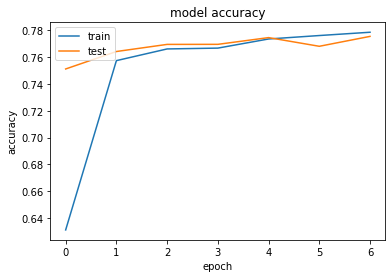

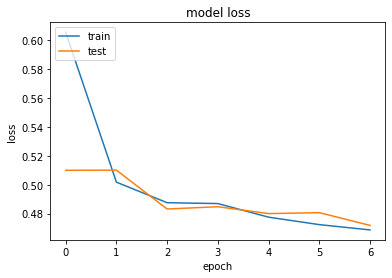

In [7]:


import matplotlib.pyplot as plt

plt.plot(history2.history['acc'])
plt.plot(history2.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

In [8]:

# create the model
top_words = 5000
model3 = Sequential()
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)
model3.add(embedding_layer)
model3.add(Conv1D(filters=64, kernel_size=5, padding='same', activation='relu'))
model3.add(Conv1D(filters=32, kernel_size=5, padding='same', activation='relu'))


model3.add(MaxPooling1D(pool_size=2))
model3.add(Dropout(0.7))
model3.add(LSTM(150))
model3.add(Dropout(0.7))
model3.add(Dense(1, activation='sigmoid'))
model3.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model3.summary())

history3 = model3.fit(X_train, y_train, batch_size=100, epochs=15, verbose=1, validation_split=0.1)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 100, 100)          23895600  
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 100, 64)           32064     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 100, 32)           10272     
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 50, 32)            0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 50, 32)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 150)               109800    
_________________________________________________________________
dropout_4 (Dropout)          (None, 150)               0         
__________

  20400/1151999 [..............................] - ETA: 5:24:14 - loss: 0.6931 - acc: 0.41 - ETA: 2:51:13 - loss: 0.6935 - acc: 0.43 - ETA: 1:59:13 - loss: 0.6935 - acc: 0.44 - ETA: 1:33:54 - loss: 0.6935 - acc: 0.45 - ETA: 1:18:07 - loss: 0.6935 - acc: 0.45 - ETA: 1:07:35 - loss: 0.6933 - acc: 0.48 - ETA: 1:00:30 - loss: 0.6933 - acc: 0.48 - ETA: 54:48 - loss: 0.6933 - acc: 0.4837 - ETA: 50:22 - loss: 0.6932 - acc: 0.48 - ETA: 46:50 - loss: 0.6932 - acc: 0.49 - ETA: 44:29 - loss: 0.6932 - acc: 0.48 - ETA: 42:16 - loss: 0.6934 - acc: 0.48 - ETA: 40:10 - loss: 0.6934 - acc: 0.48 - ETA: 38:34 - loss: 0.6934 - acc: 0.48 - ETA: 37:01 - loss: 0.6933 - acc: 0.49 - ETA: 35:49 - loss: 0.6932 - acc: 0.49 - ETA: 34:35 - loss: 0.6933 - acc: 0.49 - ETA: 33:40 - loss: 0.6932 - acc: 0.49 - ETA: 32:41 - loss: 0.6933 - acc: 0.49 - ETA: 31:56 - loss: 0.6931 - acc: 0.50 - ETA: 31:08 - loss: 0.6931 - acc: 0.50 - ETA: 30:23 - loss: 0.6931 - acc: 0.50 - ETA: 29:51 - loss: 0.6931 - acc: 0.50 - ETA: 29:13 - 

  40800/1151999 [>.............................] - ETA: 16:56 - loss: 0.6934 - acc: 0.50 - ETA: 16:56 - loss: 0.6934 - acc: 0.50 - ETA: 16:54 - loss: 0.6934 - acc: 0.50 - ETA: 16:54 - loss: 0.6934 - acc: 0.50 - ETA: 16:53 - loss: 0.6934 - acc: 0.50 - ETA: 16:53 - loss: 0.6934 - acc: 0.50 - ETA: 16:52 - loss: 0.6934 - acc: 0.50 - ETA: 16:51 - loss: 0.6934 - acc: 0.50 - ETA: 16:51 - loss: 0.6934 - acc: 0.50 - ETA: 16:50 - loss: 0.6934 - acc: 0.50 - ETA: 16:49 - loss: 0.6934 - acc: 0.50 - ETA: 16:49 - loss: 0.6934 - acc: 0.50 - ETA: 16:48 - loss: 0.6933 - acc: 0.50 - ETA: 16:47 - loss: 0.6934 - acc: 0.50 - ETA: 16:47 - loss: 0.6934 - acc: 0.50 - ETA: 16:46 - loss: 0.6933 - acc: 0.50 - ETA: 16:46 - loss: 0.6933 - acc: 0.50 - ETA: 16:46 - loss: 0.6934 - acc: 0.50 - ETA: 16:45 - loss: 0.6934 - acc: 0.50 - ETA: 16:44 - loss: 0.6934 - acc: 0.50 - ETA: 16:44 - loss: 0.6933 - acc: 0.50 - ETA: 16:43 - loss: 0.6934 - acc: 0.50 - ETA: 16:42 - loss: 0.6934 - acc: 0.50 - ETA: 16:42 - loss: 0.6934 - a

  61200/1151999 [>.............................] - ETA: 15:43 - loss: 0.6934 - acc: 0.50 - ETA: 15:43 - loss: 0.6934 - acc: 0.50 - ETA: 15:43 - loss: 0.6934 - acc: 0.50 - ETA: 15:43 - loss: 0.6934 - acc: 0.50 - ETA: 15:42 - loss: 0.6934 - acc: 0.50 - ETA: 15:43 - loss: 0.6934 - acc: 0.50 - ETA: 15:42 - loss: 0.6934 - acc: 0.50 - ETA: 15:42 - loss: 0.6934 - acc: 0.50 - ETA: 15:42 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:40 - loss: 0.6934 - acc: 0.50 - ETA: 15:41 - loss: 0.6934 - acc: 0.50 - ETA: 15:40 - loss: 0.6934 - acc: 0.50 - ETA: 15:40 - loss: 0.6934 - acc: 0.50 - ETA: 15:40 - loss: 0.6934 - acc: 0.50 - ETA: 15:40 - loss: 0.6934 - acc: 0.50 - ETA: 15:40 - loss: 0.6934 - acc: 0.50 - ETA: 15:39 - loss: 0.6934 - acc: 0.50 - ETA: 15:39 - loss: 0.6934 - a

  81600/1151999 [=>............................] - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:09 - loss: 0.6934 - acc: 0.50 - ETA: 15:08 - loss: 0.6934 - acc: 0.50 - ETA: 15:08 - loss: 0.6934 - acc: 0.50 - ETA: 15:08 - loss: 0.6934 - acc: 0.50 - ETA: 15:08 - loss: 0.6934 - acc: 0.50 - ETA: 15:08 - loss: 0.6934 - acc: 0.50 - ETA: 15:08 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - acc: 0.50 - ETA: 15:07 - loss: 0.6934 - a

 102000/1151999 [=>............................] - ETA: 14:46 - loss: 0.6932 - acc: 0.50 - ETA: 14:46 - loss: 0.6933 - acc: 0.50 - ETA: 14:46 - loss: 0.6932 - acc: 0.50 - ETA: 14:46 - loss: 0.6931 - acc: 0.50 - ETA: 14:46 - loss: 0.6931 - acc: 0.50 - ETA: 14:46 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:45 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6931 - acc: 0.50 - ETA: 14:44 - loss: 0.6930 - acc: 0.50 - ETA: 14:44 - loss: 0.6930 - acc: 0.50 - ETA: 14:44 - loss: 0.6930 - a

 122400/1151999 [==>...........................] - ETA: 14:25 - loss: 0.6829 - acc: 0.53 - ETA: 14:25 - loss: 0.6828 - acc: 0.53 - ETA: 14:25 - loss: 0.6827 - acc: 0.53 - ETA: 14:25 - loss: 0.6826 - acc: 0.53 - ETA: 14:25 - loss: 0.6825 - acc: 0.53 - ETA: 14:25 - loss: 0.6825 - acc: 0.53 - ETA: 14:24 - loss: 0.6825 - acc: 0.53 - ETA: 14:24 - loss: 0.6824 - acc: 0.53 - ETA: 14:24 - loss: 0.6823 - acc: 0.53 - ETA: 14:24 - loss: 0.6822 - acc: 0.53 - ETA: 14:24 - loss: 0.6821 - acc: 0.53 - ETA: 14:24 - loss: 0.6820 - acc: 0.53 - ETA: 14:24 - loss: 0.6819 - acc: 0.53 - ETA: 14:24 - loss: 0.6819 - acc: 0.53 - ETA: 14:24 - loss: 0.6818 - acc: 0.53 - ETA: 14:23 - loss: 0.6817 - acc: 0.53 - ETA: 14:23 - loss: 0.6816 - acc: 0.53 - ETA: 14:23 - loss: 0.6816 - acc: 0.53 - ETA: 14:23 - loss: 0.6815 - acc: 0.53 - ETA: 14:23 - loss: 0.6815 - acc: 0.53 - ETA: 14:23 - loss: 0.6815 - acc: 0.53 - ETA: 14:23 - loss: 0.6814 - acc: 0.53 - ETA: 14:23 - loss: 0.6812 - acc: 0.53 - ETA: 14:23 - loss: 0.6812 - a

 142800/1151999 [==>...........................] - ETA: 14:03 - loss: 0.6685 - acc: 0.55 - ETA: 14:03 - loss: 0.6684 - acc: 0.55 - ETA: 14:03 - loss: 0.6684 - acc: 0.55 - ETA: 14:03 - loss: 0.6683 - acc: 0.55 - ETA: 14:02 - loss: 0.6682 - acc: 0.55 - ETA: 14:02 - loss: 0.6681 - acc: 0.55 - ETA: 14:02 - loss: 0.6680 - acc: 0.55 - ETA: 14:02 - loss: 0.6680 - acc: 0.55 - ETA: 14:02 - loss: 0.6679 - acc: 0.55 - ETA: 14:02 - loss: 0.6678 - acc: 0.55 - ETA: 14:02 - loss: 0.6678 - acc: 0.55 - ETA: 14:02 - loss: 0.6677 - acc: 0.55 - ETA: 14:02 - loss: 0.6676 - acc: 0.55 - ETA: 14:01 - loss: 0.6675 - acc: 0.55 - ETA: 14:01 - loss: 0.6676 - acc: 0.55 - ETA: 14:01 - loss: 0.6676 - acc: 0.55 - ETA: 14:01 - loss: 0.6675 - acc: 0.55 - ETA: 14:01 - loss: 0.6674 - acc: 0.55 - ETA: 14:01 - loss: 0.6673 - acc: 0.55 - ETA: 14:01 - loss: 0.6673 - acc: 0.55 - ETA: 14:01 - loss: 0.6672 - acc: 0.55 - ETA: 14:01 - loss: 0.6672 - acc: 0.56 - ETA: 14:00 - loss: 0.6671 - acc: 0.56 - ETA: 14:00 - loss: 0.6671 - a

 163200/1151999 [===>..........................] - ETA: 13:43 - loss: 0.6566 - acc: 0.57 - ETA: 13:43 - loss: 0.6565 - acc: 0.57 - ETA: 13:43 - loss: 0.6565 - acc: 0.57 - ETA: 13:43 - loss: 0.6565 - acc: 0.57 - ETA: 13:43 - loss: 0.6564 - acc: 0.57 - ETA: 13:43 - loss: 0.6564 - acc: 0.57 - ETA: 13:43 - loss: 0.6563 - acc: 0.57 - ETA: 13:43 - loss: 0.6563 - acc: 0.57 - ETA: 13:43 - loss: 0.6562 - acc: 0.57 - ETA: 13:42 - loss: 0.6561 - acc: 0.57 - ETA: 13:42 - loss: 0.6560 - acc: 0.57 - ETA: 13:42 - loss: 0.6561 - acc: 0.57 - ETA: 13:42 - loss: 0.6560 - acc: 0.57 - ETA: 13:42 - loss: 0.6559 - acc: 0.57 - ETA: 13:42 - loss: 0.6559 - acc: 0.57 - ETA: 13:42 - loss: 0.6558 - acc: 0.57 - ETA: 13:42 - loss: 0.6557 - acc: 0.57 - ETA: 13:42 - loss: 0.6556 - acc: 0.57 - ETA: 13:42 - loss: 0.6556 - acc: 0.57 - ETA: 13:42 - loss: 0.6555 - acc: 0.57 - ETA: 13:42 - loss: 0.6554 - acc: 0.57 - ETA: 13:42 - loss: 0.6554 - acc: 0.57 - ETA: 13:41 - loss: 0.6553 - acc: 0.57 - ETA: 13:41 - loss: 0.6553 - a

 183600/1151999 [===>..........................] - ETA: 13:25 - loss: 0.6455 - acc: 0.59 - ETA: 13:25 - loss: 0.6454 - acc: 0.59 - ETA: 13:25 - loss: 0.6454 - acc: 0.59 - ETA: 13:24 - loss: 0.6454 - acc: 0.59 - ETA: 13:24 - loss: 0.6454 - acc: 0.59 - ETA: 13:24 - loss: 0.6453 - acc: 0.59 - ETA: 13:24 - loss: 0.6453 - acc: 0.59 - ETA: 13:24 - loss: 0.6452 - acc: 0.59 - ETA: 13:24 - loss: 0.6451 - acc: 0.59 - ETA: 13:24 - loss: 0.6451 - acc: 0.59 - ETA: 13:24 - loss: 0.6451 - acc: 0.59 - ETA: 13:24 - loss: 0.6450 - acc: 0.59 - ETA: 13:24 - loss: 0.6449 - acc: 0.59 - ETA: 13:23 - loss: 0.6449 - acc: 0.59 - ETA: 13:23 - loss: 0.6448 - acc: 0.59 - ETA: 13:23 - loss: 0.6448 - acc: 0.59 - ETA: 13:23 - loss: 0.6447 - acc: 0.59 - ETA: 13:23 - loss: 0.6446 - acc: 0.59 - ETA: 13:23 - loss: 0.6446 - acc: 0.59 - ETA: 13:23 - loss: 0.6446 - acc: 0.59 - ETA: 13:23 - loss: 0.6445 - acc: 0.59 - ETA: 13:23 - loss: 0.6445 - acc: 0.59 - ETA: 13:22 - loss: 0.6444 - acc: 0.59 - ETA: 13:22 - loss: 0.6443 - a

 204000/1151999 [====>.........................] - ETA: 13:06 - loss: 0.6367 - acc: 0.60 - ETA: 13:06 - loss: 0.6366 - acc: 0.60 - ETA: 13:06 - loss: 0.6366 - acc: 0.60 - ETA: 13:06 - loss: 0.6365 - acc: 0.60 - ETA: 13:06 - loss: 0.6364 - acc: 0.60 - ETA: 13:06 - loss: 0.6364 - acc: 0.60 - ETA: 13:06 - loss: 0.6364 - acc: 0.60 - ETA: 13:06 - loss: 0.6363 - acc: 0.60 - ETA: 13:06 - loss: 0.6363 - acc: 0.60 - ETA: 13:06 - loss: 0.6362 - acc: 0.60 - ETA: 13:06 - loss: 0.6362 - acc: 0.60 - ETA: 13:06 - loss: 0.6361 - acc: 0.60 - ETA: 13:05 - loss: 0.6360 - acc: 0.60 - ETA: 13:05 - loss: 0.6360 - acc: 0.60 - ETA: 13:05 - loss: 0.6360 - acc: 0.60 - ETA: 13:05 - loss: 0.6359 - acc: 0.60 - ETA: 13:05 - loss: 0.6359 - acc: 0.60 - ETA: 13:05 - loss: 0.6359 - acc: 0.60 - ETA: 13:05 - loss: 0.6358 - acc: 0.60 - ETA: 13:05 - loss: 0.6357 - acc: 0.60 - ETA: 13:05 - loss: 0.6357 - acc: 0.60 - ETA: 13:05 - loss: 0.6356 - acc: 0.60 - ETA: 13:04 - loss: 0.6356 - acc: 0.60 - ETA: 13:04 - loss: 0.6356 - a

 224400/1151999 [====>.........................] - ETA: 12:49 - loss: 0.6283 - acc: 0.61 - ETA: 12:49 - loss: 0.6282 - acc: 0.61 - ETA: 12:49 - loss: 0.6282 - acc: 0.61 - ETA: 12:49 - loss: 0.6281 - acc: 0.61 - ETA: 12:48 - loss: 0.6281 - acc: 0.61 - ETA: 12:48 - loss: 0.6281 - acc: 0.61 - ETA: 12:48 - loss: 0.6281 - acc: 0.61 - ETA: 12:48 - loss: 0.6280 - acc: 0.61 - ETA: 12:48 - loss: 0.6279 - acc: 0.61 - ETA: 12:48 - loss: 0.6278 - acc: 0.61 - ETA: 12:48 - loss: 0.6279 - acc: 0.61 - ETA: 12:48 - loss: 0.6278 - acc: 0.61 - ETA: 12:48 - loss: 0.6278 - acc: 0.61 - ETA: 12:48 - loss: 0.6277 - acc: 0.61 - ETA: 12:48 - loss: 0.6277 - acc: 0.61 - ETA: 12:48 - loss: 0.6277 - acc: 0.62 - ETA: 12:48 - loss: 0.6277 - acc: 0.62 - ETA: 12:48 - loss: 0.6276 - acc: 0.62 - ETA: 12:48 - loss: 0.6276 - acc: 0.62 - ETA: 12:47 - loss: 0.6275 - acc: 0.62 - ETA: 12:47 - loss: 0.6275 - acc: 0.62 - ETA: 12:47 - loss: 0.6274 - acc: 0.62 - ETA: 12:47 - loss: 0.6274 - acc: 0.62 - ETA: 12:47 - loss: 0.6273 - a

 244800/1151999 [=====>........................] - ETA: 12:31 - loss: 0.6211 - acc: 0.62 - ETA: 12:31 - loss: 0.6211 - acc: 0.62 - ETA: 12:31 - loss: 0.6211 - acc: 0.62 - ETA: 12:31 - loss: 0.6210 - acc: 0.62 - ETA: 12:31 - loss: 0.6210 - acc: 0.62 - ETA: 12:31 - loss: 0.6209 - acc: 0.62 - ETA: 12:31 - loss: 0.6209 - acc: 0.62 - ETA: 12:31 - loss: 0.6209 - acc: 0.62 - ETA: 12:31 - loss: 0.6209 - acc: 0.62 - ETA: 12:30 - loss: 0.6208 - acc: 0.62 - ETA: 12:30 - loss: 0.6208 - acc: 0.62 - ETA: 12:30 - loss: 0.6208 - acc: 0.62 - ETA: 12:30 - loss: 0.6207 - acc: 0.62 - ETA: 12:30 - loss: 0.6207 - acc: 0.62 - ETA: 12:30 - loss: 0.6207 - acc: 0.62 - ETA: 12:30 - loss: 0.6207 - acc: 0.62 - ETA: 12:30 - loss: 0.6206 - acc: 0.62 - ETA: 12:30 - loss: 0.6206 - acc: 0.62 - ETA: 12:30 - loss: 0.6205 - acc: 0.62 - ETA: 12:30 - loss: 0.6205 - acc: 0.62 - ETA: 12:30 - loss: 0.6205 - acc: 0.62 - ETA: 12:29 - loss: 0.6205 - acc: 0.62 - ETA: 12:29 - loss: 0.6204 - acc: 0.62 - ETA: 12:29 - loss: 0.6204 - a

 265200/1151999 [=====>........................] - ETA: 12:14 - loss: 0.6149 - acc: 0.63 - ETA: 12:14 - loss: 0.6149 - acc: 0.63 - ETA: 12:14 - loss: 0.6148 - acc: 0.63 - ETA: 12:13 - loss: 0.6148 - acc: 0.63 - ETA: 12:13 - loss: 0.6147 - acc: 0.63 - ETA: 12:13 - loss: 0.6147 - acc: 0.63 - ETA: 12:13 - loss: 0.6147 - acc: 0.63 - ETA: 12:13 - loss: 0.6147 - acc: 0.63 - ETA: 12:13 - loss: 0.6147 - acc: 0.63 - ETA: 12:13 - loss: 0.6146 - acc: 0.63 - ETA: 12:13 - loss: 0.6146 - acc: 0.63 - ETA: 12:13 - loss: 0.6146 - acc: 0.63 - ETA: 12:13 - loss: 0.6146 - acc: 0.63 - ETA: 12:12 - loss: 0.6145 - acc: 0.63 - ETA: 12:12 - loss: 0.6145 - acc: 0.63 - ETA: 12:12 - loss: 0.6145 - acc: 0.63 - ETA: 12:12 - loss: 0.6145 - acc: 0.63 - ETA: 12:12 - loss: 0.6144 - acc: 0.63 - ETA: 12:12 - loss: 0.6144 - acc: 0.63 - ETA: 12:12 - loss: 0.6144 - acc: 0.63 - ETA: 12:12 - loss: 0.6143 - acc: 0.63 - ETA: 12:12 - loss: 0.6143 - acc: 0.63 - ETA: 12:12 - loss: 0.6143 - acc: 0.63 - ETA: 12:12 - loss: 0.6142 - a

 285600/1151999 [======>.......................] - ETA: 11:56 - loss: 0.6098 - acc: 0.64 - ETA: 11:56 - loss: 0.6098 - acc: 0.64 - ETA: 11:56 - loss: 0.6098 - acc: 0.64 - ETA: 11:56 - loss: 0.6098 - acc: 0.64 - ETA: 11:56 - loss: 0.6098 - acc: 0.64 - ETA: 11:56 - loss: 0.6098 - acc: 0.64 - ETA: 11:56 - loss: 0.6097 - acc: 0.64 - ETA: 11:56 - loss: 0.6097 - acc: 0.64 - ETA: 11:56 - loss: 0.6097 - acc: 0.64 - ETA: 11:56 - loss: 0.6097 - acc: 0.64 - ETA: 11:55 - loss: 0.6097 - acc: 0.64 - ETA: 11:55 - loss: 0.6097 - acc: 0.64 - ETA: 11:55 - loss: 0.6097 - acc: 0.64 - ETA: 11:55 - loss: 0.6097 - acc: 0.64 - ETA: 11:55 - loss: 0.6096 - acc: 0.64 - ETA: 11:55 - loss: 0.6096 - acc: 0.64 - ETA: 11:55 - loss: 0.6096 - acc: 0.64 - ETA: 11:55 - loss: 0.6096 - acc: 0.64 - ETA: 11:55 - loss: 0.6095 - acc: 0.64 - ETA: 11:55 - loss: 0.6095 - acc: 0.64 - ETA: 11:55 - loss: 0.6095 - acc: 0.64 - ETA: 11:54 - loss: 0.6095 - acc: 0.64 - ETA: 11:54 - loss: 0.6095 - acc: 0.64 - ETA: 11:54 - loss: 0.6095 - a

 306000/1151999 [======>.......................] - ETA: 11:39 - loss: 0.6053 - acc: 0.64 - ETA: 11:39 - loss: 0.6053 - acc: 0.64 - ETA: 11:39 - loss: 0.6053 - acc: 0.64 - ETA: 11:39 - loss: 0.6053 - acc: 0.65 - ETA: 11:39 - loss: 0.6052 - acc: 0.65 - ETA: 11:38 - loss: 0.6052 - acc: 0.65 - ETA: 11:38 - loss: 0.6052 - acc: 0.65 - ETA: 11:38 - loss: 0.6051 - acc: 0.65 - ETA: 11:38 - loss: 0.6051 - acc: 0.65 - ETA: 11:38 - loss: 0.6051 - acc: 0.65 - ETA: 11:38 - loss: 0.6050 - acc: 0.65 - ETA: 11:38 - loss: 0.6050 - acc: 0.65 - ETA: 11:38 - loss: 0.6050 - acc: 0.65 - ETA: 11:38 - loss: 0.6050 - acc: 0.65 - ETA: 11:38 - loss: 0.6049 - acc: 0.65 - ETA: 11:38 - loss: 0.6049 - acc: 0.65 - ETA: 11:37 - loss: 0.6049 - acc: 0.65 - ETA: 11:37 - loss: 0.6049 - acc: 0.65 - ETA: 11:37 - loss: 0.6049 - acc: 0.65 - ETA: 11:37 - loss: 0.6048 - acc: 0.65 - ETA: 11:37 - loss: 0.6048 - acc: 0.65 - ETA: 11:37 - loss: 0.6048 - acc: 0.65 - ETA: 11:37 - loss: 0.6048 - acc: 0.65 - ETA: 11:37 - loss: 0.6048 - a

 326400/1151999 [=======>......................] - ETA: 11:21 - loss: 0.6006 - acc: 0.65 - ETA: 11:21 - loss: 0.6006 - acc: 0.65 - ETA: 11:21 - loss: 0.6006 - acc: 0.65 - ETA: 11:21 - loss: 0.6006 - acc: 0.65 - ETA: 11:21 - loss: 0.6006 - acc: 0.65 - ETA: 11:21 - loss: 0.6005 - acc: 0.65 - ETA: 11:21 - loss: 0.6005 - acc: 0.65 - ETA: 11:21 - loss: 0.6005 - acc: 0.65 - ETA: 11:21 - loss: 0.6005 - acc: 0.65 - ETA: 11:21 - loss: 0.6005 - acc: 0.65 - ETA: 11:21 - loss: 0.6004 - acc: 0.65 - ETA: 11:21 - loss: 0.6004 - acc: 0.65 - ETA: 11:20 - loss: 0.6004 - acc: 0.65 - ETA: 11:20 - loss: 0.6004 - acc: 0.65 - ETA: 11:20 - loss: 0.6003 - acc: 0.65 - ETA: 11:20 - loss: 0.6003 - acc: 0.65 - ETA: 11:20 - loss: 0.6003 - acc: 0.65 - ETA: 11:20 - loss: 0.6003 - acc: 0.65 - ETA: 11:20 - loss: 0.6003 - acc: 0.65 - ETA: 11:20 - loss: 0.6002 - acc: 0.65 - ETA: 11:20 - loss: 0.6002 - acc: 0.65 - ETA: 11:20 - loss: 0.6002 - acc: 0.65 - ETA: 11:20 - loss: 0.6002 - acc: 0.65 - ETA: 11:20 - loss: 0.6001 - a

 346800/1151999 [========>.....................] - ETA: 11:05 - loss: 0.5965 - acc: 0.66 - ETA: 11:04 - loss: 0.5965 - acc: 0.66 - ETA: 11:04 - loss: 0.5965 - acc: 0.66 - ETA: 11:04 - loss: 0.5964 - acc: 0.66 - ETA: 11:04 - loss: 0.5964 - acc: 0.66 - ETA: 11:04 - loss: 0.5964 - acc: 0.66 - ETA: 11:04 - loss: 0.5964 - acc: 0.66 - ETA: 11:04 - loss: 0.5964 - acc: 0.66 - ETA: 11:04 - loss: 0.5964 - acc: 0.66 - ETA: 11:04 - loss: 0.5963 - acc: 0.66 - ETA: 11:04 - loss: 0.5963 - acc: 0.66 - ETA: 11:04 - loss: 0.5963 - acc: 0.66 - ETA: 11:04 - loss: 0.5963 - acc: 0.66 - ETA: 11:03 - loss: 0.5963 - acc: 0.66 - ETA: 11:03 - loss: 0.5963 - acc: 0.66 - ETA: 11:03 - loss: 0.5962 - acc: 0.66 - ETA: 11:03 - loss: 0.5962 - acc: 0.66 - ETA: 11:03 - loss: 0.5962 - acc: 0.66 - ETA: 11:03 - loss: 0.5962 - acc: 0.66 - ETA: 11:03 - loss: 0.5962 - acc: 0.66 - ETA: 11:03 - loss: 0.5961 - acc: 0.66 - ETA: 11:03 - loss: 0.5961 - acc: 0.66 - ETA: 11:03 - loss: 0.5961 - acc: 0.66 - ETA: 11:03 - loss: 0.5961 - a

 367200/1151999 [========>.....................] - ETA: 10:48 - loss: 0.5927 - acc: 0.66 - ETA: 10:48 - loss: 0.5927 - acc: 0.66 - ETA: 10:48 - loss: 0.5926 - acc: 0.66 - ETA: 10:48 - loss: 0.5926 - acc: 0.66 - ETA: 10:47 - loss: 0.5926 - acc: 0.66 - ETA: 10:47 - loss: 0.5926 - acc: 0.66 - ETA: 10:47 - loss: 0.5926 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:47 - loss: 0.5925 - acc: 0.66 - ETA: 10:46 - loss: 0.5924 - acc: 0.66 - ETA: 10:46 - loss: 0.5924 - acc: 0.66 - ETA: 10:46 - loss: 0.5924 - acc: 0.66 - ETA: 10:46 - loss: 0.5923 - acc: 0.66 - ETA: 10:46 - loss: 0.5924 - acc: 0.66 - ETA: 10:46 - loss: 0.5923 - acc: 0.66 - ETA: 10:46 - loss: 0.5923 - acc: 0.66 - ETA: 10:46 - loss: 0.5923 - a

 387600/1151999 [=========>....................] - ETA: 10:31 - loss: 0.5892 - acc: 0.66 - ETA: 10:31 - loss: 0.5892 - acc: 0.66 - ETA: 10:31 - loss: 0.5891 - acc: 0.66 - ETA: 10:31 - loss: 0.5891 - acc: 0.66 - ETA: 10:31 - loss: 0.5891 - acc: 0.66 - ETA: 10:31 - loss: 0.5891 - acc: 0.66 - ETA: 10:31 - loss: 0.5891 - acc: 0.66 - ETA: 10:30 - loss: 0.5890 - acc: 0.66 - ETA: 10:30 - loss: 0.5890 - acc: 0.66 - ETA: 10:30 - loss: 0.5890 - acc: 0.66 - ETA: 10:30 - loss: 0.5889 - acc: 0.66 - ETA: 10:30 - loss: 0.5889 - acc: 0.66 - ETA: 10:30 - loss: 0.5889 - acc: 0.66 - ETA: 10:30 - loss: 0.5889 - acc: 0.66 - ETA: 10:30 - loss: 0.5889 - acc: 0.66 - ETA: 10:30 - loss: 0.5889 - acc: 0.66 - ETA: 10:30 - loss: 0.5888 - acc: 0.66 - ETA: 10:30 - loss: 0.5888 - acc: 0.66 - ETA: 10:30 - loss: 0.5888 - acc: 0.66 - ETA: 10:30 - loss: 0.5888 - acc: 0.66 - ETA: 10:29 - loss: 0.5888 - acc: 0.66 - ETA: 10:29 - loss: 0.5888 - acc: 0.66 - ETA: 10:29 - loss: 0.5887 - acc: 0.66 - ETA: 10:29 - loss: 0.5887 - a

 408000/1151999 [=========>....................] - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:14 - loss: 0.5861 - acc: 0.67 - ETA: 10:13 - loss: 0.5860 - acc: 0.67 - ETA: 10:13 - loss: 0.5860 - acc: 0.67 - ETA: 10:13 - loss: 0.5860 - acc: 0.67 - ETA: 10:13 - loss: 0.5860 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:13 - loss: 0.5859 - acc: 0.67 - ETA: 10:12 - loss: 0.5859 - acc: 0.67 - ETA: 10:12 - loss: 0.5859 - acc: 0.67 - ETA: 10:12 - loss: 0.5859 - a

 428400/1151999 [==========>...................] - ETA: 9:58 - loss: 0.5833 - acc: 0.676 - ETA: 9:58 - loss: 0.5833 - acc: 0.676 - ETA: 9:58 - loss: 0.5833 - acc: 0.676 - ETA: 9:57 - loss: 0.5833 - acc: 0.676 - ETA: 9:57 - loss: 0.5832 - acc: 0.676 - ETA: 9:57 - loss: 0.5832 - acc: 0.676 - ETA: 9:57 - loss: 0.5832 - acc: 0.676 - ETA: 9:57 - loss: 0.5832 - acc: 0.676 - ETA: 9:57 - loss: 0.5831 - acc: 0.676 - ETA: 9:57 - loss: 0.5831 - acc: 0.676 - ETA: 9:57 - loss: 0.5831 - acc: 0.676 - ETA: 9:57 - loss: 0.5831 - acc: 0.676 - ETA: 9:57 - loss: 0.5830 - acc: 0.676 - ETA: 9:57 - loss: 0.5830 - acc: 0.676 - ETA: 9:57 - loss: 0.5830 - acc: 0.676 - ETA: 9:56 - loss: 0.5830 - acc: 0.676 - ETA: 9:56 - loss: 0.5830 - acc: 0.676 - ETA: 9:56 - loss: 0.5830 - acc: 0.676 - ETA: 9:56 - loss: 0.5829 - acc: 0.676 - ETA: 9:56 - loss: 0.5829 - acc: 0.676 - ETA: 9:56 - loss: 0.5829 - acc: 0.676 - ETA: 9:56 - loss: 0.5829 - acc: 0.676 - ETA: 9:56 - loss: 0.5829 - acc: 0.676 - ETA: 9:56 - loss: 0.5828 - ac

 448800/1151999 [==========>...................] - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:41 - loss: 0.5806 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5805 - acc: 0.679 - ETA: 9:40 - loss: 0.5804 - acc: 0.679 - ETA: 9:40 - loss: 0.5804 - acc: 0.679 - ETA: 9:40 - loss: 0.5804 - acc: 0.679 - ETA: 9:40 - loss: 0.5804 - acc: 0.679 - ETA: 9:40 - loss: 0.5804 - acc: 0.679 - ETA: 9:39 - loss: 0.5804 - acc: 0.679 - ETA: 9:39 - loss: 0.5804 - acc: 0.679 - ETA: 9:39 - loss: 0.5804 - acc: 0.679 - ETA: 9:39 - loss: 0.5803 - ac

 469200/1151999 [===========>..................] - ETA: 9:24 - loss: 0.5779 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5778 - acc: 0.682 - ETA: 9:24 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5777 - acc: 0.682 - ETA: 9:23 - loss: 0.5776 - acc: 0.682 - ETA: 9:23 - loss: 0.5776 - acc: 0.682 - ETA: 9:23 - loss: 0.5776 - ac

 489600/1151999 [===========>..................] - ETA: 9:08 - loss: 0.5756 - acc: 0.685 - ETA: 9:08 - loss: 0.5756 - acc: 0.685 - ETA: 9:07 - loss: 0.5756 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5755 - acc: 0.685 - ETA: 9:07 - loss: 0.5754 - acc: 0.685 - ETA: 9:07 - loss: 0.5754 - acc: 0.685 - ETA: 9:07 - loss: 0.5754 - acc: 0.685 - ETA: 9:07 - loss: 0.5754 - acc: 0.685 - ETA: 9:07 - loss: 0.5754 - acc: 0.685 - ETA: 9:06 - loss: 0.5754 - acc: 0.685 - ETA: 9:06 - loss: 0.5754 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - acc: 0.685 - ETA: 9:06 - loss: 0.5753 - ac

 510000/1151999 [============>.................] - ETA: 8:51 - loss: 0.5734 - acc: 0.687 - ETA: 8:51 - loss: 0.5734 - acc: 0.687 - ETA: 8:51 - loss: 0.5734 - acc: 0.687 - ETA: 8:51 - loss: 0.5734 - acc: 0.687 - ETA: 8:51 - loss: 0.5734 - acc: 0.687 - ETA: 8:51 - loss: 0.5734 - acc: 0.687 - ETA: 8:51 - loss: 0.5733 - acc: 0.687 - ETA: 8:51 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5732 - acc: 0.687 - ETA: 8:50 - loss: 0.5732 - acc: 0.687 - ETA: 8:50 - loss: 0.5733 - acc: 0.687 - ETA: 8:50 - loss: 0.5732 - acc: 0.687 - ETA: 8:49 - loss: 0.5732 - acc: 0.687 - ETA: 8:49 - loss: 0.5732 - acc: 0.687 - ETA: 8:49 - loss: 0.5732 - acc: 0.687 - ETA: 8:49 - loss: 0.5732 - ac

 530400/1151999 [============>.................] - ETA: 8:35 - loss: 0.5716 - acc: 0.689 - ETA: 8:35 - loss: 0.5716 - acc: 0.689 - ETA: 8:34 - loss: 0.5716 - acc: 0.689 - ETA: 8:34 - loss: 0.5715 - acc: 0.689 - ETA: 8:34 - loss: 0.5715 - acc: 0.689 - ETA: 8:34 - loss: 0.5715 - acc: 0.689 - ETA: 8:34 - loss: 0.5715 - acc: 0.689 - ETA: 8:34 - loss: 0.5715 - acc: 0.689 - ETA: 8:34 - loss: 0.5715 - acc: 0.689 - ETA: 8:34 - loss: 0.5714 - acc: 0.689 - ETA: 8:34 - loss: 0.5714 - acc: 0.689 - ETA: 8:34 - loss: 0.5714 - acc: 0.689 - ETA: 8:34 - loss: 0.5714 - acc: 0.689 - ETA: 8:34 - loss: 0.5714 - acc: 0.689 - ETA: 8:34 - loss: 0.5714 - acc: 0.689 - ETA: 8:33 - loss: 0.5714 - acc: 0.689 - ETA: 8:33 - loss: 0.5714 - acc: 0.689 - ETA: 8:33 - loss: 0.5714 - acc: 0.689 - ETA: 8:33 - loss: 0.5713 - acc: 0.689 - ETA: 8:33 - loss: 0.5713 - acc: 0.689 - ETA: 8:33 - loss: 0.5713 - acc: 0.689 - ETA: 8:33 - loss: 0.5713 - acc: 0.689 - ETA: 8:33 - loss: 0.5713 - acc: 0.690 - ETA: 8:33 - loss: 0.5713 - ac

 550800/1151999 [=============>................] - ETA: 8:18 - loss: 0.5697 - acc: 0.691 - ETA: 8:18 - loss: 0.5697 - acc: 0.691 - ETA: 8:18 - loss: 0.5697 - acc: 0.691 - ETA: 8:18 - loss: 0.5697 - acc: 0.691 - ETA: 8:18 - loss: 0.5696 - acc: 0.691 - ETA: 8:18 - loss: 0.5696 - acc: 0.691 - ETA: 8:18 - loss: 0.5696 - acc: 0.691 - ETA: 8:18 - loss: 0.5696 - acc: 0.691 - ETA: 8:18 - loss: 0.5696 - acc: 0.691 - ETA: 8:17 - loss: 0.5696 - acc: 0.691 - ETA: 8:17 - loss: 0.5696 - acc: 0.691 - ETA: 8:17 - loss: 0.5696 - acc: 0.692 - ETA: 8:17 - loss: 0.5696 - acc: 0.692 - ETA: 8:17 - loss: 0.5696 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:17 - loss: 0.5695 - acc: 0.692 - ETA: 8:16 - loss: 0.5695 - acc: 0.692 - ETA: 8:16 - loss: 0.5695 - ac

 571200/1151999 [=============>................] - ETA: 8:02 - loss: 0.5678 - acc: 0.693 - ETA: 8:02 - loss: 0.5678 - acc: 0.693 - ETA: 8:02 - loss: 0.5678 - acc: 0.693 - ETA: 8:02 - loss: 0.5678 - acc: 0.693 - ETA: 8:02 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5677 - acc: 0.693 - ETA: 8:01 - loss: 0.5676 - acc: 0.693 - ETA: 8:01 - loss: 0.5676 - acc: 0.693 - ETA: 8:00 - loss: 0.5676 - acc: 0.693 - ETA: 8:00 - loss: 0.5676 - acc: 0.693 - ETA: 8:00 - loss: 0.5676 - acc: 0.693 - ETA: 8:00 - loss: 0.5676 - acc: 0.694 - ETA: 8:00 - loss: 0.5676 - acc: 0.694 - ETA: 8:00 - loss: 0.5676 - acc: 0.694 - ETA: 8:00 - loss: 0.5676 - ac

 591600/1151999 [==============>...............] - ETA: 7:46 - loss: 0.5663 - acc: 0.695 - ETA: 7:46 - loss: 0.5663 - acc: 0.695 - ETA: 7:46 - loss: 0.5663 - acc: 0.695 - ETA: 7:46 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:45 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - acc: 0.695 - ETA: 7:44 - loss: 0.5662 - ac

 612000/1151999 [==============>...............] - ETA: 7:30 - loss: 0.5648 - acc: 0.697 - ETA: 7:30 - loss: 0.5648 - acc: 0.697 - ETA: 7:30 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5649 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:29 - loss: 0.5648 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - acc: 0.697 - ETA: 7:28 - loss: 0.5647 - ac

 632400/1151999 [===============>..............] - ETA: 7:13 - loss: 0.5635 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:13 - loss: 0.5634 - acc: 0.698 - ETA: 7:12 - loss: 0.5634 - acc: 0.698 - ETA: 7:12 - loss: 0.5634 - acc: 0.698 - ETA: 7:12 - loss: 0.5633 - acc: 0.698 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - acc: 0.699 - ETA: 7:12 - loss: 0.5633 - ac

 652800/1151999 [================>.............] - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5620 - acc: 0.700 - ETA: 6:57 - loss: 0.5619 - acc: 0.700 - ETA: 6:57 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:56 - loss: 0.5619 - acc: 0.700 - ETA: 6:55 - loss: 0.5619 - acc: 0.700 - ETA: 6:55 - loss: 0.5619 - acc: 0.700 - ETA: 6:55 - loss: 0.5618 - ac

 673200/1151999 [================>.............] - ETA: 6:41 - loss: 0.5606 - acc: 0.702 - ETA: 6:41 - loss: 0.5606 - acc: 0.702 - ETA: 6:41 - loss: 0.5606 - acc: 0.702 - ETA: 6:41 - loss: 0.5606 - acc: 0.702 - ETA: 6:41 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5605 - acc: 0.702 - ETA: 6:40 - loss: 0.5606 - acc: 0.702 - ETA: 6:40 - loss: 0.5605 - acc: 0.702 - ETA: 6:40 - loss: 0.5605 - acc: 0.702 - ETA: 6:39 - loss: 0.5605 - acc: 0.702 - ETA: 6:39 - loss: 0.5605 - acc: 0.702 - ETA: 6:39 - loss: 0.5605 - acc: 0.702 - ETA: 6:39 - loss: 0.5605 - acc: 0.702 - ETA: 6:39 - loss: 0.5605 - acc: 0.702 - ETA: 6:39 - loss: 0.5605 - ac

 693600/1151999 [=================>............] - ETA: 6:25 - loss: 0.5594 - acc: 0.703 - ETA: 6:25 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:24 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - acc: 0.703 - ETA: 6:23 - loss: 0.5594 - ac

 714000/1151999 [=================>............] - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:08 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5583 - acc: 0.704 - ETA: 6:07 - loss: 0.5582 - acc: 0.704 - ETA: 6:07 - loss: 0.5582 - acc: 0.704 - ETA: 6:07 - loss: 0.5582 - acc: 0.704 - ETA: 6:07 - loss: 0.5582 - acc: 0.704 - ETA: 6:07 - loss: 0.5582 - acc: 0.704 - ETA: 6:07 - loss: 0.5582 - ac

 734400/1151999 [==================>...........] - ETA: 5:52 - loss: 0.5571 - acc: 0.705 - ETA: 5:52 - loss: 0.5571 - acc: 0.705 - ETA: 5:52 - loss: 0.5571 - acc: 0.705 - ETA: 5:52 - loss: 0.5571 - acc: 0.705 - ETA: 5:52 - loss: 0.5571 - acc: 0.705 - ETA: 5:52 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5571 - acc: 0.705 - ETA: 5:51 - loss: 0.5570 - acc: 0.705 - ETA: 5:51 - loss: 0.5570 - acc: 0.705 - ETA: 5:51 - loss: 0.5570 - acc: 0.705 - ETA: 5:51 - loss: 0.5570 - acc: 0.705 - ETA: 5:51 - loss: 0.5570 - acc: 0.705 - ETA: 5:51 - loss: 0.5570 - acc: 0.705 - ETA: 5:50 - loss: 0.5570 - acc: 0.705 - ETA: 5:50 - loss: 0.5570 - acc: 0.705 - ETA: 5:50 - loss: 0.5570 - acc: 0.705 - ETA: 5:50 - loss: 0.5570 - acc: 0.705 - ETA: 5:50 - loss: 0.5570 - acc: 0.705 - ETA: 5:50 - loss: 0.5570 - ac

 754800/1151999 [==================>...........] - ETA: 5:35 - loss: 0.5562 - acc: 0.706 - ETA: 5:35 - loss: 0.5562 - acc: 0.706 - ETA: 5:35 - loss: 0.5562 - acc: 0.706 - ETA: 5:35 - loss: 0.5562 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:35 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.706 - ETA: 5:34 - loss: 0.5561 - acc: 0.707 - ETA: 5:34 - loss: 0.5561 - acc: 0.707 - ETA: 5:34 - loss: 0.5561 - acc: 0.707 - ETA: 5:34 - loss: 0.5561 - ac

 775200/1151999 [===================>..........] - ETA: 5:19 - loss: 0.5552 - acc: 0.708 - ETA: 5:19 - loss: 0.5552 - acc: 0.708 - ETA: 5:19 - loss: 0.5552 - acc: 0.708 - ETA: 5:19 - loss: 0.5552 - acc: 0.708 - ETA: 5:19 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:18 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - acc: 0.708 - ETA: 5:17 - loss: 0.5552 - ac

 795600/1151999 [===================>..........] - ETA: 5:02 - loss: 0.5543 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:02 - loss: 0.5542 - acc: 0.709 - ETA: 5:01 - loss: 0.5542 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - acc: 0.709 - ETA: 5:01 - loss: 0.5541 - ac

 816000/1151999 [====================>.........] - ETA: 4:46 - loss: 0.5534 - acc: 0.709 - ETA: 4:46 - loss: 0.5534 - acc: 0.709 - ETA: 4:46 - loss: 0.5534 - acc: 0.710 - ETA: 4:46 - loss: 0.5534 - acc: 0.709 - ETA: 4:46 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5534 - acc: 0.710 - ETA: 4:45 - loss: 0.5533 - acc: 0.710 - ETA: 4:45 - loss: 0.5533 - acc: 0.710 - ETA: 4:44 - loss: 0.5533 - acc: 0.710 - ETA: 4:44 - loss: 0.5533 - acc: 0.710 - ETA: 4:44 - loss: 0.5533 - acc: 0.710 - ETA: 4:44 - loss: 0.5533 - acc: 0.710 - ETA: 4:44 - loss: 0.5533 - acc: 0.710 - ETA: 4:44 - loss: 0.5533 - ac

 836400/1151999 [====================>.........] - ETA: 4:30 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:29 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5526 - acc: 0.710 - ETA: 4:28 - loss: 0.5525 - ac

 856800/1151999 [=====================>........] - ETA: 4:13 - loss: 0.5520 - acc: 0.711 - ETA: 4:13 - loss: 0.5519 - acc: 0.711 - ETA: 4:13 - loss: 0.5519 - acc: 0.711 - ETA: 4:13 - loss: 0.5520 - acc: 0.711 - ETA: 4:13 - loss: 0.5520 - acc: 0.711 - ETA: 4:13 - loss: 0.5520 - acc: 0.711 - ETA: 4:13 - loss: 0.5520 - acc: 0.711 - ETA: 4:13 - loss: 0.5520 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5520 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:12 - loss: 0.5519 - acc: 0.711 - ETA: 4:11 - loss: 0.5519 - acc: 0.711 - ETA: 4:11 - loss: 0.5519 - acc: 0.711 - ETA: 4:11 - loss: 0.5519 - acc: 0.711 - ETA: 4:11 - loss: 0.5519 - ac

 877200/1151999 [=====================>........] - ETA: 3:57 - loss: 0.5511 - acc: 0.712 - ETA: 3:57 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:56 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5511 - acc: 0.712 - ETA: 3:55 - loss: 0.5510 - acc: 0.712 - ETA: 3:55 - loss: 0.5510 - acc: 0.712 - ETA: 3:55 - loss: 0.5510 - ac

 897600/1151999 [======================>.......] - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:40 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5503 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5504 - acc: 0.713 - ETA: 3:39 - loss: 0.5503 - acc: 0.713 - ETA: 3:38 - loss: 0.5504 - acc: 0.713 - ETA: 3:38 - loss: 0.5504 - ac

 918000/1151999 [======================>.......] - ETA: 3:24 - loss: 0.5496 - acc: 0.714 - ETA: 3:24 - loss: 0.5496 - acc: 0.714 - ETA: 3:24 - loss: 0.5496 - acc: 0.714 - ETA: 3:24 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:23 - loss: 0.5496 - acc: 0.714 - ETA: 3:22 - loss: 0.5496 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - acc: 0.714 - ETA: 3:22 - loss: 0.5495 - ac

 938400/1151999 [=======================>......] - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5488 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:07 - loss: 0.5487 - acc: 0.714 - ETA: 3:06 - loss: 0.5487 - acc: 0.714 - ETA: 3:06 - loss: 0.5487 - acc: 0.714 - ETA: 3:06 - loss: 0.5487 - acc: 0.714 - ETA: 3:06 - loss: 0.5487 - acc: 0.714 - ETA: 3:06 - loss: 0.5487 - acc: 0.714 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - acc: 0.715 - ETA: 3:06 - loss: 0.5487 - ac

 958800/1151999 [=======================>......] - ETA: 2:51 - loss: 0.5480 - acc: 0.715 - ETA: 2:51 - loss: 0.5480 - acc: 0.715 - ETA: 2:51 - loss: 0.5480 - acc: 0.715 - ETA: 2:51 - loss: 0.5480 - acc: 0.715 - ETA: 2:51 - loss: 0.5480 - acc: 0.715 - ETA: 2:51 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5479 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5480 - acc: 0.715 - ETA: 2:50 - loss: 0.5479 - acc: 0.715 - ETA: 2:49 - loss: 0.5479 - acc: 0.715 - ETA: 2:49 - loss: 0.5479 - acc: 0.715 - ETA: 2:49 - loss: 0.5479 - acc: 0.715 - ETA: 2:49 - loss: 0.5479 - acc: 0.715 - ETA: 2:49 - loss: 0.5479 - ac

 979200/1151999 [========================>.....] - ETA: 2:35 - loss: 0.5473 - acc: 0.716 - ETA: 2:35 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:34 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - acc: 0.716 - ETA: 2:33 - loss: 0.5473 - ac

 999600/1151999 [=========================>....] - ETA: 2:18 - loss: 0.5467 - acc: 0.716 - ETA: 2:18 - loss: 0.5467 - acc: 0.716 - ETA: 2:18 - loss: 0.5467 - acc: 0.716 - ETA: 2:18 - loss: 0.5466 - acc: 0.716 - ETA: 2:18 - loss: 0.5466 - acc: 0.716 - ETA: 2:18 - loss: 0.5466 - acc: 0.716 - ETA: 2:18 - loss: 0.5467 - acc: 0.716 - ETA: 2:18 - loss: 0.5466 - acc: 0.716 - ETA: 2:18 - loss: 0.5466 - acc: 0.716 - ETA: 2:17 - loss: 0.5466 - acc: 0.716 - ETA: 2:17 - loss: 0.5466 - acc: 0.716 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.716 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:17 - loss: 0.5466 - acc: 0.717 - ETA: 2:16 - loss: 0.5466 - acc: 0.717 - ETA: 2:16 - loss: 0.5466 - acc: 0.717 - ETA: 2:16 - loss: 0.5466 - ac

1020000/1151999 [=========================>....] - ETA: 2:02 - loss: 0.5459 - acc: 0.717 - ETA: 2:02 - loss: 0.5459 - acc: 0.717 - ETA: 2:02 - loss: 0.5459 - acc: 0.717 - ETA: 2:02 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5458 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:01 - loss: 0.5458 - acc: 0.717 - ETA: 2:01 - loss: 0.5459 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - acc: 0.717 - ETA: 2:00 - loss: 0.5458 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:45 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5452 - acc: 0.718 - ETA: 1:44 - loss: 0.5451 - acc: 0.718 - ETA: 1:44 - loss: 0.5451 - acc: 0.718 - ETA: 1:44 - loss: 0.5451 - acc: 0.718 - ETA: 1:44 - loss: 0.5451 - ac

1060800/1151999 [==========================>...] - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:29 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:28 - loss: 0.5444 - acc: 0.719 - ETA: 1:27 - loss: 0.5444 - acc: 0.719 - ETA: 1:27 - loss: 0.5444 - acc: 0.719 - ETA: 1:27 - loss: 0.5444 - acc: 0.719 - ETA: 1:27 - loss: 0.5444 - ac

1081400/1151999 [===========================>..] - ETA: 1:13 - loss: 0.5438 - acc: 0.719 - ETA: 1:13 - loss: 0.5438 - acc: 0.719 - ETA: 1:12 - loss: 0.5438 - acc: 0.719 - ETA: 1:12 - loss: 0.5438 - acc: 0.719 - ETA: 1:12 - loss: 0.5438 - acc: 0.719 - ETA: 1:12 - loss: 0.5438 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:12 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - acc: 0.719 - ETA: 1:11 - loss: 0.5437 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 56s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 55s - loss: 0.5430 - acc: 0.72 - ETA: 54s - loss: 0.5430 - acc: 0.72 - ETA: 54s - loss: 0.5430 - acc: 0.72 - ETA: 54s - loss: 0.5430 - acc: 0.72 - ETA: 54s - loss: 0.5430 - acc: 0.72 - ETA: 54s - loss: 0.5430 - acc: 0.72 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.5424 - acc: 0.72 - ETA: 39s - loss: 0.5424 - acc: 0.72 - ETA: 39s - loss: 0.5424 - acc: 0.72 - ETA: 39s - loss: 0.5423 - acc: 0.72 - ETA: 39s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 38s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 - ETA: 37s - loss: 0.5423 - acc: 0.72 -

1145900/1151999 [============================>.] - ETA: 22s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5417 - acc: 0.72 - ETA: 21s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 - ETA: 20s - loss: 0.5416 - acc: 0.72 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 4s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 3s - loss: 0.5410 - acc: 0.722 - ETA: 2s - loss: 0.5410 - acc: 0.722 - ETA: 2s - loss: 0.5410 - acc: 0.722 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4826 - acc: 0.78 - ETA: 18:06 - loss: 0.4471 - acc: 0.82 - ETA: 17:03 - loss: 0.4716 - acc: 0.79 - ETA: 16:32 - loss: 0.4749 - acc: 0.79 - ETA: 16:50 - loss: 0.4894 - acc: 0.77 - ETA: 16:31 - loss: 0.4754 - acc: 0.78 - ETA: 16:44 - loss: 0.4826 - acc: 0.77 - ETA: 16:30 - loss: 0.4825 - acc: 0.77 - ETA: 16:20 - loss: 0.4869 - acc: 0.76 - ETA: 16:12 - loss: 0.4809 - acc: 0.77 - ETA: 16:22 - loss: 0.4835 - acc: 0.77 - ETA: 16:30 - loss: 0.4879 - acc: 0.77 - ETA: 16:23 - loss: 0.4923 - acc: 0.77 - ETA: 16:17 - loss: 0.4935 - acc: 0.76 - ETA: 16:24 - loss: 0.4949 - acc: 0.76 - ETA: 16:18 - loss: 0.4952 - acc: 0.76 - ETA: 16:24 - loss: 0.4911 - acc: 0.77 - ETA: 16:19 - loss: 0.4946 - acc: 0.76 - ETA: 16:24 - loss: 0.4918 - acc: 0.77 - ETA: 16:20 - loss: 0.4909 - acc: 0.77 - ETA: 16:24 - loss: 0.4932 - acc: 0.77 - ETA: 16:20 - loss: 0.4904 - acc: 0.77 - ETA: 16:17 - loss: 0.4886 - acc: 0.77 - ETA: 16:14 - loss: 0.4859 - a

  40800/1151999 [>.............................] - ETA: 15:25 - loss: 0.5023 - acc: 0.75 - ETA: 15:25 - loss: 0.5026 - acc: 0.75 - ETA: 15:25 - loss: 0.5024 - acc: 0.75 - ETA: 15:24 - loss: 0.5023 - acc: 0.75 - ETA: 15:24 - loss: 0.5025 - acc: 0.75 - ETA: 15:24 - loss: 0.5023 - acc: 0.75 - ETA: 15:24 - loss: 0.5028 - acc: 0.75 - ETA: 15:24 - loss: 0.5030 - acc: 0.75 - ETA: 15:24 - loss: 0.5027 - acc: 0.75 - ETA: 15:24 - loss: 0.5027 - acc: 0.75 - ETA: 15:24 - loss: 0.5027 - acc: 0.75 - ETA: 15:24 - loss: 0.5023 - acc: 0.75 - ETA: 15:24 - loss: 0.5019 - acc: 0.75 - ETA: 15:23 - loss: 0.5017 - acc: 0.75 - ETA: 15:23 - loss: 0.5017 - acc: 0.75 - ETA: 15:23 - loss: 0.5015 - acc: 0.75 - ETA: 15:23 - loss: 0.5013 - acc: 0.75 - ETA: 15:22 - loss: 0.5012 - acc: 0.75 - ETA: 15:22 - loss: 0.5013 - acc: 0.75 - ETA: 15:22 - loss: 0.5009 - acc: 0.75 - ETA: 15:21 - loss: 0.5009 - acc: 0.75 - ETA: 15:21 - loss: 0.5009 - acc: 0.75 - ETA: 15:21 - loss: 0.5009 - acc: 0.75 - ETA: 15:21 - loss: 0.5008 - a

  61200/1151999 [>.............................] - ETA: 15:03 - loss: 0.5013 - acc: 0.75 - ETA: 15:02 - loss: 0.5013 - acc: 0.75 - ETA: 15:02 - loss: 0.5013 - acc: 0.75 - ETA: 15:02 - loss: 0.5014 - acc: 0.75 - ETA: 15:02 - loss: 0.5015 - acc: 0.75 - ETA: 15:02 - loss: 0.5014 - acc: 0.75 - ETA: 15:02 - loss: 0.5014 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5010 - acc: 0.75 - ETA: 15:01 - loss: 0.5010 - acc: 0.75 - ETA: 15:01 - loss: 0.5010 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:01 - loss: 0.5012 - acc: 0.75 - ETA: 15:01 - loss: 0.5011 - acc: 0.75 - ETA: 15:00 - loss: 0.5011 - acc: 0.75 - ETA: 15:00 - loss: 0.5010 - acc: 0.75 - ETA: 15:00 - loss: 0.5009 - acc: 0.75 - ETA: 15:00 - loss: 0.5011 - acc: 0.75 - ETA: 15:00 - loss: 0.5012 - a

  81600/1151999 [=>............................] - ETA: 14:46 - loss: 0.5009 - acc: 0.75 - ETA: 14:46 - loss: 0.5010 - acc: 0.75 - ETA: 14:46 - loss: 0.5009 - acc: 0.75 - ETA: 14:46 - loss: 0.5009 - acc: 0.75 - ETA: 14:46 - loss: 0.5009 - acc: 0.75 - ETA: 14:46 - loss: 0.5007 - acc: 0.75 - ETA: 14:46 - loss: 0.5008 - acc: 0.75 - ETA: 14:45 - loss: 0.5008 - acc: 0.75 - ETA: 14:46 - loss: 0.5006 - acc: 0.75 - ETA: 14:45 - loss: 0.5006 - acc: 0.75 - ETA: 14:45 - loss: 0.5007 - acc: 0.75 - ETA: 14:45 - loss: 0.5006 - acc: 0.75 - ETA: 14:45 - loss: 0.5005 - acc: 0.75 - ETA: 14:45 - loss: 0.5004 - acc: 0.75 - ETA: 14:45 - loss: 0.5004 - acc: 0.75 - ETA: 14:45 - loss: 0.5004 - acc: 0.75 - ETA: 14:45 - loss: 0.5003 - acc: 0.75 - ETA: 14:45 - loss: 0.5005 - acc: 0.75 - ETA: 14:45 - loss: 0.5006 - acc: 0.75 - ETA: 14:45 - loss: 0.5005 - acc: 0.75 - ETA: 14:45 - loss: 0.5005 - acc: 0.75 - ETA: 14:44 - loss: 0.5005 - acc: 0.75 - ETA: 14:44 - loss: 0.5006 - acc: 0.75 - ETA: 14:44 - loss: 0.5009 - a

 102000/1151999 [=>............................] - ETA: 14:28 - loss: 0.4992 - acc: 0.75 - ETA: 14:28 - loss: 0.4993 - acc: 0.75 - ETA: 14:28 - loss: 0.4992 - acc: 0.75 - ETA: 14:28 - loss: 0.4994 - acc: 0.75 - ETA: 14:28 - loss: 0.4994 - acc: 0.75 - ETA: 14:28 - loss: 0.4994 - acc: 0.75 - ETA: 14:28 - loss: 0.4994 - acc: 0.75 - ETA: 14:28 - loss: 0.4994 - acc: 0.75 - ETA: 14:28 - loss: 0.4994 - acc: 0.75 - ETA: 14:28 - loss: 0.4995 - acc: 0.75 - ETA: 14:28 - loss: 0.4995 - acc: 0.75 - ETA: 14:28 - loss: 0.4996 - acc: 0.75 - ETA: 14:28 - loss: 0.4995 - acc: 0.75 - ETA: 14:28 - loss: 0.4995 - acc: 0.75 - ETA: 14:28 - loss: 0.4995 - acc: 0.75 - ETA: 14:27 - loss: 0.4996 - acc: 0.75 - ETA: 14:27 - loss: 0.4997 - acc: 0.75 - ETA: 14:27 - loss: 0.4997 - acc: 0.75 - ETA: 14:27 - loss: 0.4997 - acc: 0.75 - ETA: 14:28 - loss: 0.4997 - acc: 0.75 - ETA: 14:27 - loss: 0.4997 - acc: 0.75 - ETA: 14:27 - loss: 0.4996 - acc: 0.75 - ETA: 14:28 - loss: 0.4997 - acc: 0.75 - ETA: 14:27 - loss: 0.4996 - a

 122400/1151999 [==>...........................] - ETA: 14:11 - loss: 0.4993 - acc: 0.75 - ETA: 14:11 - loss: 0.4993 - acc: 0.75 - ETA: 14:11 - loss: 0.4994 - acc: 0.75 - ETA: 14:11 - loss: 0.4994 - acc: 0.75 - ETA: 14:11 - loss: 0.4993 - acc: 0.75 - ETA: 14:11 - loss: 0.4993 - acc: 0.75 - ETA: 14:11 - loss: 0.4995 - acc: 0.75 - ETA: 14:11 - loss: 0.4995 - acc: 0.75 - ETA: 14:11 - loss: 0.4995 - acc: 0.75 - ETA: 14:11 - loss: 0.4995 - acc: 0.75 - ETA: 14:10 - loss: 0.4995 - acc: 0.75 - ETA: 14:10 - loss: 0.4995 - acc: 0.75 - ETA: 14:10 - loss: 0.4994 - acc: 0.75 - ETA: 14:10 - loss: 0.4994 - acc: 0.75 - ETA: 14:10 - loss: 0.4994 - acc: 0.75 - ETA: 14:10 - loss: 0.4995 - acc: 0.75 - ETA: 14:10 - loss: 0.4994 - acc: 0.75 - ETA: 14:10 - loss: 0.4994 - acc: 0.75 - ETA: 14:10 - loss: 0.4993 - acc: 0.75 - ETA: 14:10 - loss: 0.4993 - acc: 0.75 - ETA: 14:10 - loss: 0.4993 - acc: 0.75 - ETA: 14:10 - loss: 0.4992 - acc: 0.75 - ETA: 14:09 - loss: 0.4992 - acc: 0.75 - ETA: 14:09 - loss: 0.4992 - a

 142800/1151999 [==>...........................] - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5002 - acc: 0.75 - ETA: 13:54 - loss: 0.5003 - acc: 0.75 - ETA: 13:54 - loss: 0.5003 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5005 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:53 - loss: 0.5003 - acc: 0.75 - ETA: 13:53 - loss: 0.5004 - acc: 0.75 - ETA: 13:52 - loss: 0.5003 - acc: 0.75 - ETA: 13:52 - loss: 0.5004 - acc: 0.75 - ETA: 13:52 - loss: 0.5004 - acc: 0.75 - ETA: 13:52 - loss: 0.5004 - acc: 0.75 - ETA: 13:52 - loss: 0.5003 - a

 163200/1151999 [===>..........................] - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:36 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5005 - acc: 0.75 - ETA: 13:35 - loss: 0.5004 - acc: 0.75 - ETA: 13:35 - loss: 0.5004 - acc: 0.75 - ETA: 13:34 - loss: 0.5004 - acc: 0.75 - ETA: 13:34 - loss: 0.5004 - acc: 0.75 - ETA: 13:34 - loss: 0.5004 - acc: 0.75 - ETA: 13:34 - loss: 0.5004 - acc: 0.75 - ETA: 13:34 - loss: 0.5004 - acc: 0.75 - ETA: 13:34 - loss: 0.5003 - a

 183600/1151999 [===>..........................] - ETA: 13:19 - loss: 0.5005 - acc: 0.75 - ETA: 13:19 - loss: 0.5005 - acc: 0.75 - ETA: 13:19 - loss: 0.5005 - acc: 0.75 - ETA: 13:19 - loss: 0.5006 - acc: 0.75 - ETA: 13:18 - loss: 0.5005 - acc: 0.75 - ETA: 13:18 - loss: 0.5005 - acc: 0.75 - ETA: 13:18 - loss: 0.5005 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:18 - loss: 0.5004 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - acc: 0.75 - ETA: 13:17 - loss: 0.5004 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - acc: 0.75 - ETA: 13:17 - loss: 0.5002 - acc: 0.75 - ETA: 13:17 - loss: 0.5004 - acc: 0.75 - ETA: 13:17 - loss: 0.5003 - a

 204000/1151999 [====>.........................] - ETA: 13:02 - loss: 0.5002 - acc: 0.75 - ETA: 13:01 - loss: 0.5002 - acc: 0.75 - ETA: 13:01 - loss: 0.5003 - acc: 0.75 - ETA: 13:01 - loss: 0.5002 - acc: 0.75 - ETA: 13:01 - loss: 0.5003 - acc: 0.75 - ETA: 13:01 - loss: 0.5002 - acc: 0.75 - ETA: 13:01 - loss: 0.5002 - acc: 0.75 - ETA: 13:01 - loss: 0.5003 - acc: 0.75 - ETA: 13:01 - loss: 0.5003 - acc: 0.75 - ETA: 13:01 - loss: 0.5003 - acc: 0.75 - ETA: 13:01 - loss: 0.5004 - acc: 0.75 - ETA: 13:01 - loss: 0.5004 - acc: 0.75 - ETA: 13:01 - loss: 0.5004 - acc: 0.75 - ETA: 13:01 - loss: 0.5004 - acc: 0.75 - ETA: 13:01 - loss: 0.5004 - acc: 0.75 - ETA: 13:00 - loss: 0.5004 - acc: 0.75 - ETA: 13:00 - loss: 0.5003 - acc: 0.75 - ETA: 13:00 - loss: 0.5004 - acc: 0.75 - ETA: 13:00 - loss: 0.5004 - acc: 0.75 - ETA: 13:00 - loss: 0.5003 - acc: 0.75 - ETA: 13:00 - loss: 0.5004 - acc: 0.75 - ETA: 13:00 - loss: 0.5003 - acc: 0.75 - ETA: 13:00 - loss: 0.5003 - acc: 0.75 - ETA: 13:00 - loss: 0.5003 - a

 224400/1151999 [====>.........................] - ETA: 12:45 - loss: 0.5009 - acc: 0.75 - ETA: 12:45 - loss: 0.5008 - acc: 0.75 - ETA: 12:45 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5008 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5010 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:44 - loss: 0.5009 - acc: 0.75 - ETA: 12:43 - loss: 0.5009 - acc: 0.75 - ETA: 12:43 - loss: 0.5009 - acc: 0.75 - ETA: 12:43 - loss: 0.5010 - acc: 0.75 - ETA: 12:43 - loss: 0.5010 - acc: 0.75 - ETA: 12:43 - loss: 0.5010 - acc: 0.75 - ETA: 12:43 - loss: 0.5010 - acc: 0.75 - ETA: 12:43 - loss: 0.5009 - acc: 0.75 - ETA: 12:43 - loss: 0.5009 - a

 244800/1151999 [=====>........................] - ETA: 12:28 - loss: 0.5003 - acc: 0.75 - ETA: 12:28 - loss: 0.5003 - acc: 0.75 - ETA: 12:28 - loss: 0.5003 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:27 - loss: 0.5003 - acc: 0.75 - ETA: 12:27 - loss: 0.5003 - acc: 0.75 - ETA: 12:27 - loss: 0.5003 - acc: 0.75 - ETA: 12:27 - loss: 0.5004 - acc: 0.75 - ETA: 12:26 - loss: 0.5003 - acc: 0.75 - ETA: 12:26 - loss: 0.5004 - acc: 0.75 - ETA: 12:26 - loss: 0.5003 - acc: 0.75 - ETA: 12:26 - loss: 0.5004 - acc: 0.75 - ETA: 12:26 - loss: 0.5004 - acc: 0.75 - ETA: 12:26 - loss: 0.5003 - acc: 0.75 - ETA: 12:26 - loss: 0.5004 - acc: 0.75 - ETA: 12:26 - loss: 0.5003 - acc: 0.75 - ETA: 12:26 - loss: 0.5004 - acc: 0.75 - ETA: 12:26 - loss: 0.5004 - a

 265200/1151999 [=====>........................] - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:11 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5003 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5003 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:10 - loss: 0.5004 - acc: 0.75 - ETA: 12:09 - loss: 0.5003 - acc: 0.75 - ETA: 12:09 - loss: 0.5003 - acc: 0.75 - ETA: 12:09 - loss: 0.5003 - acc: 0.75 - ETA: 12:09 - loss: 0.5003 - a

 285600/1151999 [======>.......................] - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5002 - acc: 0.75 - ETA: 11:54 - loss: 0.5002 - acc: 0.75 - ETA: 11:54 - loss: 0.5002 - acc: 0.75 - ETA: 11:54 - loss: 0.5002 - acc: 0.75 - ETA: 11:54 - loss: 0.5002 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:54 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5002 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - acc: 0.75 - ETA: 11:53 - loss: 0.5003 - a

 306000/1151999 [======>.......................] - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:37 - loss: 0.5000 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5000 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - acc: 0.75 - ETA: 11:36 - loss: 0.5001 - a

 326400/1151999 [=======>......................] - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:21 - loss: 0.5000 - acc: 0.75 - ETA: 11:21 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.5000 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:20 - loss: 0.4999 - acc: 0.75 - ETA: 11:19 - loss: 0.4999 - acc: 0.75 - ETA: 11:19 - loss: 0.4999 - acc: 0.75 - ETA: 11:19 - loss: 0.4999 - a

 346800/1151999 [========>.....................] - ETA: 11:05 - loss: 0.4999 - acc: 0.75 - ETA: 11:05 - loss: 0.4999 - acc: 0.75 - ETA: 11:05 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:04 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - acc: 0.75 - ETA: 11:03 - loss: 0.4999 - a

 367200/1151999 [========>.....................] - ETA: 10:48 - loss: 0.5000 - acc: 0.75 - ETA: 10:48 - loss: 0.5000 - acc: 0.75 - ETA: 10:48 - loss: 0.5001 - acc: 0.75 - ETA: 10:48 - loss: 0.5001 - acc: 0.75 - ETA: 10:48 - loss: 0.5001 - acc: 0.75 - ETA: 10:48 - loss: 0.5001 - acc: 0.75 - ETA: 10:48 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5002 - acc: 0.75 - ETA: 10:47 - loss: 0.5001 - acc: 0.75 - ETA: 10:47 - loss: 0.5002 - acc: 0.75 - ETA: 10:47 - loss: 0.5002 - acc: 0.75 - ETA: 10:46 - loss: 0.5001 - acc: 0.75 - ETA: 10:46 - loss: 0.5001 - acc: 0.75 - ETA: 10:46 - loss: 0.5001 - acc: 0.75 - ETA: 10:46 - loss: 0.5001 - a

 387600/1151999 [=========>....................] - ETA: 10:32 - loss: 0.5001 - acc: 0.75 - ETA: 10:32 - loss: 0.5001 - acc: 0.75 - ETA: 10:32 - loss: 0.5001 - acc: 0.75 - ETA: 10:32 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:31 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - acc: 0.75 - ETA: 10:30 - loss: 0.5002 - acc: 0.75 - ETA: 10:30 - loss: 0.5001 - a

 408000/1151999 [=========>....................] - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:15 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:14 - loss: 0.4999 - acc: 0.75 - ETA: 10:13 - loss: 0.4999 - acc: 0.75 - ETA: 10:13 - loss: 0.4999 - a

 428400/1151999 [==========>...................] - ETA: 9:58 - loss: 0.4998 - acc: 0.758 - ETA: 9:58 - loss: 0.4998 - acc: 0.758 - ETA: 9:58 - loss: 0.4998 - acc: 0.758 - ETA: 9:58 - loss: 0.4998 - acc: 0.758 - ETA: 9:58 - loss: 0.4998 - acc: 0.758 - ETA: 9:58 - loss: 0.4998 - acc: 0.758 - ETA: 9:58 - loss: 0.4998 - acc: 0.759 - ETA: 9:58 - loss: 0.4997 - acc: 0.759 - ETA: 9:58 - loss: 0.4997 - acc: 0.759 - ETA: 9:58 - loss: 0.4997 - acc: 0.759 - ETA: 9:58 - loss: 0.4997 - acc: 0.759 - ETA: 9:58 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - acc: 0.759 - ETA: 9:57 - loss: 0.4997 - ac

 448800/1151999 [==========>...................] - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:42 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:41 - loss: 0.4998 - acc: 0.759 - ETA: 9:40 - loss: 0.4997 - acc: 0.759 - ETA: 9:40 - loss: 0.4997 - acc: 0.759 - ETA: 9:40 - loss: 0.4997 - acc: 0.759 - ETA: 9:40 - loss: 0.4998 - ac

 469200/1151999 [===========>..................] - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.758 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.758 - ETA: 9:25 - loss: 0.4997 - acc: 0.758 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.759 - ETA: 9:25 - loss: 0.4997 - acc: 0.758 - ETA: 9:24 - loss: 0.4997 - acc: 0.758 - ETA: 9:24 - loss: 0.4997 - acc: 0.758 - ETA: 9:24 - loss: 0.4997 - acc: 0.758 - ETA: 9:24 - loss: 0.4997 - acc: 0.758 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - acc: 0.759 - ETA: 9:24 - loss: 0.4997 - ac

 489600/1151999 [===========>..................] - ETA: 9:09 - loss: 0.4993 - acc: 0.759 - ETA: 9:09 - loss: 0.4993 - acc: 0.759 - ETA: 9:09 - loss: 0.4993 - acc: 0.759 - ETA: 9:09 - loss: 0.4994 - acc: 0.759 - ETA: 9:09 - loss: 0.4994 - acc: 0.759 - ETA: 9:08 - loss: 0.4994 - acc: 0.759 - ETA: 9:08 - loss: 0.4994 - acc: 0.759 - ETA: 9:08 - loss: 0.4994 - acc: 0.759 - ETA: 9:08 - loss: 0.4994 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:08 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - acc: 0.759 - ETA: 9:07 - loss: 0.4993 - ac

 510000/1151999 [============>.................] - ETA: 8:53 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:52 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - acc: 0.759 - ETA: 8:51 - loss: 0.4994 - ac

 530400/1151999 [============>.................] - ETA: 8:36 - loss: 0.4994 - acc: 0.759 - ETA: 8:36 - loss: 0.4993 - acc: 0.759 - ETA: 8:36 - loss: 0.4993 - acc: 0.759 - ETA: 8:36 - loss: 0.4994 - acc: 0.759 - ETA: 8:36 - loss: 0.4993 - acc: 0.759 - ETA: 8:36 - loss: 0.4994 - acc: 0.759 - ETA: 8:36 - loss: 0.4994 - acc: 0.759 - ETA: 8:36 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:35 - loss: 0.4994 - acc: 0.759 - ETA: 8:34 - loss: 0.4994 - acc: 0.759 - ETA: 8:34 - loss: 0.4994 - acc: 0.759 - ETA: 8:34 - loss: 0.4994 - ac

 550800/1151999 [=============>................] - ETA: 8:20 - loss: 0.4993 - acc: 0.759 - ETA: 8:19 - loss: 0.4993 - acc: 0.759 - ETA: 8:19 - loss: 0.4993 - acc: 0.759 - ETA: 8:19 - loss: 0.4993 - acc: 0.759 - ETA: 8:19 - loss: 0.4993 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:19 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4993 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - acc: 0.759 - ETA: 8:18 - loss: 0.4992 - ac

 571200/1151999 [=============>................] - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:03 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4992 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:02 - loss: 0.4991 - acc: 0.759 - ETA: 8:01 - loss: 0.4991 - acc: 0.759 - ETA: 8:01 - loss: 0.4991 - acc: 0.759 - ETA: 8:01 - loss: 0.4991 - acc: 0.759 - ETA: 8:01 - loss: 0.4991 - ac

 591600/1151999 [==============>...............] - ETA: 7:47 - loss: 0.4989 - acc: 0.759 - ETA: 7:47 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:46 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - acc: 0.759 - ETA: 7:45 - loss: 0.4988 - acc: 0.759 - ETA: 7:45 - loss: 0.4989 - ac

 612000/1151999 [==============>...............] - ETA: 7:30 - loss: 0.4988 - acc: 0.759 - ETA: 7:30 - loss: 0.4988 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:30 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4988 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4987 - acc: 0.759 - ETA: 7:29 - loss: 0.4988 - acc: 0.759 - ETA: 7:29 - loss: 0.4988 - acc: 0.759 - ETA: 7:29 - loss: 0.4988 - acc: 0.759 - ETA: 7:29 - loss: 0.4988 - acc: 0.759 - ETA: 7:28 - loss: 0.4988 - ac

 632400/1151999 [===============>..............] - ETA: 7:14 - loss: 0.4984 - acc: 0.759 - ETA: 7:14 - loss: 0.4984 - acc: 0.759 - ETA: 7:14 - loss: 0.4984 - acc: 0.759 - ETA: 7:14 - loss: 0.4984 - acc: 0.759 - ETA: 7:14 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:13 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - acc: 0.759 - ETA: 7:12 - loss: 0.4984 - ac

 652800/1151999 [================>.............] - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:57 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - acc: 0.759 - ETA: 6:56 - loss: 0.4982 - ac

 673200/1151999 [================>.............] - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:41 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:40 - loss: 0.4982 - acc: 0.759 - ETA: 6:39 - loss: 0.4982 - acc: 0.759 - ETA: 6:39 - loss: 0.4982 - acc: 0.759 - ETA: 6:39 - loss: 0.4982 - acc: 0.759 - ETA: 6:39 - loss: 0.4982 - ac

 693600/1151999 [=================>............] - ETA: 6:25 - loss: 0.4980 - acc: 0.759 - ETA: 6:25 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4979 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:24 - loss: 0.4980 - acc: 0.759 - ETA: 6:23 - loss: 0.4979 - acc: 0.759 - ETA: 6:23 - loss: 0.4979 - acc: 0.759 - ETA: 6:23 - loss: 0.4979 - acc: 0.759 - ETA: 6:23 - loss: 0.4979 - acc: 0.759 - ETA: 6:23 - loss: 0.4980 - acc: 0.759 - ETA: 6:23 - loss: 0.4980 - acc: 0.759 - ETA: 6:23 - loss: 0.4980 - acc: 0.759 - ETA: 6:23 - loss: 0.4980 - acc: 0.759 - ETA: 6:23 - loss: 0.4980 - acc: 0.759 - ETA: 6:23 - loss: 0.4979 - ac

 714000/1151999 [=================>............] - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:08 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:07 - loss: 0.4979 - acc: 0.759 - ETA: 6:06 - loss: 0.4979 - acc: 0.759 - ETA: 6:06 - loss: 0.4979 - ac

 734400/1151999 [==================>...........] - ETA: 5:52 - loss: 0.4977 - acc: 0.760 - ETA: 5:52 - loss: 0.4977 - acc: 0.760 - ETA: 5:52 - loss: 0.4977 - acc: 0.760 - ETA: 5:52 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:51 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - acc: 0.760 - ETA: 5:50 - loss: 0.4976 - ac

 754800/1151999 [==================>...........] - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.760 - ETA: 5:35 - loss: 0.4976 - acc: 0.759 - ETA: 5:35 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:34 - loss: 0.4977 - acc: 0.759 - ETA: 5:34 - loss: 0.4976 - acc: 0.759 - ETA: 5:33 - loss: 0.4976 - ac

 775200/1151999 [===================>..........] - ETA: 5:19 - loss: 0.4974 - acc: 0.760 - ETA: 5:19 - loss: 0.4974 - acc: 0.760 - ETA: 5:19 - loss: 0.4974 - acc: 0.760 - ETA: 5:19 - loss: 0.4974 - acc: 0.760 - ETA: 5:19 - loss: 0.4974 - acc: 0.760 - ETA: 5:19 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:18 - loss: 0.4974 - acc: 0.760 - ETA: 5:17 - loss: 0.4974 - acc: 0.760 - ETA: 5:17 - loss: 0.4974 - acc: 0.760 - ETA: 5:17 - loss: 0.4974 - acc: 0.760 - ETA: 5:17 - loss: 0.4974 - acc: 0.760 - ETA: 5:17 - loss: 0.4974 - acc: 0.760 - ETA: 5:17 - loss: 0.4974 - ac

 795600/1151999 [===================>..........] - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:02 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - acc: 0.760 - ETA: 5:01 - loss: 0.4972 - ac

 816000/1151999 [====================>.........] - ETA: 4:46 - loss: 0.4970 - acc: 0.760 - ETA: 4:46 - loss: 0.4970 - acc: 0.760 - ETA: 4:46 - loss: 0.4970 - acc: 0.760 - ETA: 4:46 - loss: 0.4971 - acc: 0.760 - ETA: 4:46 - loss: 0.4970 - acc: 0.760 - ETA: 4:46 - loss: 0.4971 - acc: 0.760 - ETA: 4:46 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4970 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4970 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:45 - loss: 0.4971 - acc: 0.760 - ETA: 4:44 - loss: 0.4971 - acc: 0.760 - ETA: 4:44 - loss: 0.4971 - acc: 0.760 - ETA: 4:44 - loss: 0.4971 - acc: 0.760 - ETA: 4:44 - loss: 0.4971 - ac

 836400/1151999 [====================>.........] - ETA: 4:30 - loss: 0.4970 - acc: 0.760 - ETA: 4:30 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:29 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - acc: 0.760 - ETA: 4:28 - loss: 0.4970 - ac

 856800/1151999 [=====================>........] - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:13 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4968 - acc: 0.760 - ETA: 4:12 - loss: 0.4968 - acc: 0.760 - ETA: 4:12 - loss: 0.4968 - acc: 0.760 - ETA: 4:12 - loss: 0.4968 - acc: 0.760 - ETA: 4:12 - loss: 0.4968 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:12 - loss: 0.4969 - acc: 0.760 - ETA: 4:11 - loss: 0.4969 - acc: 0.760 - ETA: 4:11 - loss: 0.4969 - ac

 877200/1151999 [=====================>........] - ETA: 3:57 - loss: 0.4967 - acc: 0.760 - ETA: 3:57 - loss: 0.4967 - acc: 0.760 - ETA: 3:57 - loss: 0.4967 - acc: 0.760 - ETA: 3:57 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:56 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - acc: 0.760 - ETA: 3:55 - loss: 0.4967 - ac

 897600/1151999 [======================>.......] - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:40 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - acc: 0.760 - ETA: 3:39 - loss: 0.4966 - ac

 918000/1151999 [======================>.......] - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:24 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:23 - loss: 0.4964 - acc: 0.760 - ETA: 3:22 - loss: 0.4964 - acc: 0.760 - ETA: 3:22 - loss: 0.4964 - acc: 0.760 - ETA: 3:22 - loss: 0.4964 - acc: 0.760 - ETA: 3:22 - loss: 0.4964 - ac

 938400/1151999 [=======================>......] - ETA: 3:08 - loss: 0.4964 - acc: 0.760 - ETA: 3:08 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:07 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - acc: 0.760 - ETA: 3:06 - loss: 0.4964 - ac

 958800/1151999 [=======================>......] - ETA: 2:51 - loss: 0.4963 - acc: 0.760 - ETA: 2:51 - loss: 0.4963 - acc: 0.760 - ETA: 2:51 - loss: 0.4963 - acc: 0.760 - ETA: 2:51 - loss: 0.4963 - acc: 0.760 - ETA: 2:51 - loss: 0.4963 - acc: 0.760 - ETA: 2:51 - loss: 0.4963 - acc: 0.760 - ETA: 2:51 - loss: 0.4962 - acc: 0.760 - ETA: 2:51 - loss: 0.4962 - acc: 0.760 - ETA: 2:51 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4962 - acc: 0.760 - ETA: 2:50 - loss: 0.4963 - acc: 0.760 - ETA: 2:50 - loss: 0.4963 - acc: 0.760 - ETA: 2:50 - loss: 0.4963 - acc: 0.760 - ETA: 2:50 - loss: 0.4963 - acc: 0.760 - ETA: 2:49 - loss: 0.4963 - acc: 0.760 - ETA: 2:49 - loss: 0.4963 - acc: 0.760 - ETA: 2:49 - loss: 0.4963 - ac

 979200/1151999 [========================>.....] - ETA: 2:35 - loss: 0.4963 - acc: 0.760 - ETA: 2:35 - loss: 0.4962 - acc: 0.760 - ETA: 2:35 - loss: 0.4962 - acc: 0.760 - ETA: 2:35 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:34 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - acc: 0.760 - ETA: 2:33 - loss: 0.4962 - ac

 999600/1151999 [=========================>....] - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:18 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:17 - loss: 0.4962 - acc: 0.760 - ETA: 2:16 - loss: 0.4961 - ac

1020000/1151999 [=========================>....] - ETA: 2:02 - loss: 0.4961 - acc: 0.760 - ETA: 2:02 - loss: 0.4961 - acc: 0.761 - ETA: 2:02 - loss: 0.4961 - acc: 0.760 - ETA: 2:02 - loss: 0.4961 - acc: 0.761 - ETA: 2:02 - loss: 0.4961 - acc: 0.761 - ETA: 2:02 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.760 - ETA: 2:01 - loss: 0.4961 - acc: 0.760 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.761 - ETA: 2:01 - loss: 0.4961 - acc: 0.760 - ETA: 2:00 - loss: 0.4961 - acc: 0.760 - ETA: 2:00 - loss: 0.4961 - acc: 0.760 - ETA: 2:00 - loss: 0.4961 - acc: 0.761 - ETA: 2:00 - loss: 0.4961 - acc: 0.761 - ETA: 2:00 - loss: 0.4961 - acc: 0.761 - ETA: 2:00 - loss: 0.4961 - ac

1040400/1151999 [==========================>...] - ETA: 1:46 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:45 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - acc: 0.761 - ETA: 1:44 - loss: 0.4961 - ac

1060800/1151999 [==========================>...] - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:29 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:28 - loss: 0.4960 - acc: 0.761 - ETA: 1:27 - loss: 0.4960 - acc: 0.761 - ETA: 1:27 - loss: 0.4960 - acc: 0.761 - ETA: 1:27 - loss: 0.4960 - ac

1081400/1151999 [===========================>..] - ETA: 1:13 - loss: 0.4960 - acc: 0.761 - ETA: 1:13 - loss: 0.4960 - acc: 0.761 - ETA: 1:13 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:12 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - acc: 0.761 - ETA: 1:11 - loss: 0.4960 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 56s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 55s - loss: 0.4958 - acc: 0.76 - ETA: 54s - loss: 0.4958 - acc: 0.76 - ETA: 54s - loss: 0.4958 - acc: 0.76 - ETA: 54s - loss: 0.4958 - acc: 0.76 - ETA: 54s - loss: 0.4958 - acc: 0.76 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4957 - acc: 0.76 - ETA: 39s - loss: 0.4957 - acc: 0.76 - ETA: 39s - loss: 0.4957 - acc: 0.76 - ETA: 39s - loss: 0.4957 - acc: 0.76 - ETA: 39s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 38s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 - ETA: 37s - loss: 0.4957 - acc: 0.76 -

1145900/1151999 [============================>.] - ETA: 22s - loss: 0.4956 - acc: 0.76 - ETA: 22s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 21s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 - ETA: 20s - loss: 0.4956 - acc: 0.76 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 4s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 3s - loss: 0.4955 - acc: 0.761 - ETA: 2s - loss: 0.4955 - acc: 0.761 - ETA: 2s - loss: 0.4955 - acc: 0.761 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.5926 - acc: 0.68 - ETA: 17:59 - loss: 0.5529 - acc: 0.71 - ETA: 17:03 - loss: 0.5465 - acc: 0.71 - ETA: 16:32 - loss: 0.5246 - acc: 0.73 - ETA: 16:14 - loss: 0.5276 - acc: 0.73 - ETA: 16:01 - loss: 0.5208 - acc: 0.73 - ETA: 16:18 - loss: 0.5029 - acc: 0.75 - ETA: 16:08 - loss: 0.5035 - acc: 0.75 - ETA: 16:00 - loss: 0.4946 - acc: 0.75 - ETA: 16:12 - loss: 0.4832 - acc: 0.76 - ETA: 16:05 - loss: 0.4874 - acc: 0.76 - ETA: 16:00 - loss: 0.4900 - acc: 0.76 - ETA: 15:55 - loss: 0.4857 - acc: 0.77 - ETA: 15:51 - loss: 0.4794 - acc: 0.77 - ETA: 15:47 - loss: 0.4784 - acc: 0.77 - ETA: 15:56 - loss: 0.4794 - acc: 0.77 - ETA: 15:53 - loss: 0.4754 - acc: 0.77 - ETA: 15:49 - loss: 0.4751 - acc: 0.77 - ETA: 15:47 - loss: 0.4755 - acc: 0.77 - ETA: 15:44 - loss: 0.4755 - acc: 0.77 - ETA: 15:59 - loss: 0.4791 - acc: 0.77 - ETA: 15:56 - loss: 0.4807 - acc: 0.77 - ETA: 15:53 - loss: 0.4838 - acc: 0.77 - ETA: 15:51 - loss: 0.4863 - a

  40800/1151999 [>.............................] - ETA: 14:59 - loss: 0.4841 - acc: 0.76 - ETA: 14:58 - loss: 0.4843 - acc: 0.76 - ETA: 14:58 - loss: 0.4842 - acc: 0.76 - ETA: 14:58 - loss: 0.4839 - acc: 0.76 - ETA: 14:58 - loss: 0.4844 - acc: 0.76 - ETA: 14:58 - loss: 0.4844 - acc: 0.76 - ETA: 14:58 - loss: 0.4842 - acc: 0.76 - ETA: 14:58 - loss: 0.4850 - acc: 0.76 - ETA: 14:58 - loss: 0.4847 - acc: 0.76 - ETA: 14:58 - loss: 0.4844 - acc: 0.76 - ETA: 14:58 - loss: 0.4849 - acc: 0.76 - ETA: 14:58 - loss: 0.4853 - acc: 0.76 - ETA: 14:58 - loss: 0.4854 - acc: 0.76 - ETA: 14:58 - loss: 0.4849 - acc: 0.76 - ETA: 14:57 - loss: 0.4849 - acc: 0.76 - ETA: 14:57 - loss: 0.4848 - acc: 0.76 - ETA: 14:57 - loss: 0.4845 - acc: 0.76 - ETA: 14:57 - loss: 0.4845 - acc: 0.76 - ETA: 14:57 - loss: 0.4843 - acc: 0.76 - ETA: 14:57 - loss: 0.4847 - acc: 0.76 - ETA: 14:57 - loss: 0.4843 - acc: 0.76 - ETA: 14:56 - loss: 0.4846 - acc: 0.76 - ETA: 14:56 - loss: 0.4845 - acc: 0.76 - ETA: 14:56 - loss: 0.4845 - a

  61200/1151999 [>.............................] - ETA: 14:47 - loss: 0.4835 - acc: 0.76 - ETA: 14:47 - loss: 0.4833 - acc: 0.77 - ETA: 14:46 - loss: 0.4832 - acc: 0.76 - ETA: 14:46 - loss: 0.4832 - acc: 0.76 - ETA: 14:46 - loss: 0.4831 - acc: 0.76 - ETA: 14:46 - loss: 0.4831 - acc: 0.77 - ETA: 14:46 - loss: 0.4831 - acc: 0.77 - ETA: 14:46 - loss: 0.4830 - acc: 0.77 - ETA: 14:46 - loss: 0.4833 - acc: 0.77 - ETA: 14:46 - loss: 0.4834 - acc: 0.76 - ETA: 14:46 - loss: 0.4836 - acc: 0.76 - ETA: 14:45 - loss: 0.4836 - acc: 0.76 - ETA: 14:46 - loss: 0.4836 - acc: 0.76 - ETA: 14:46 - loss: 0.4836 - acc: 0.76 - ETA: 14:45 - loss: 0.4835 - acc: 0.76 - ETA: 14:45 - loss: 0.4834 - acc: 0.77 - ETA: 14:46 - loss: 0.4834 - acc: 0.77 - ETA: 14:45 - loss: 0.4833 - acc: 0.77 - ETA: 14:45 - loss: 0.4836 - acc: 0.76 - ETA: 14:45 - loss: 0.4835 - acc: 0.76 - ETA: 14:45 - loss: 0.4834 - acc: 0.76 - ETA: 14:45 - loss: 0.4832 - acc: 0.77 - ETA: 14:45 - loss: 0.4832 - acc: 0.77 - ETA: 14:45 - loss: 0.4832 - a

  81600/1151999 [=>............................] - ETA: 14:28 - loss: 0.4860 - acc: 0.76 - ETA: 14:28 - loss: 0.4860 - acc: 0.76 - ETA: 14:28 - loss: 0.4859 - acc: 0.76 - ETA: 14:28 - loss: 0.4859 - acc: 0.76 - ETA: 14:28 - loss: 0.4858 - acc: 0.76 - ETA: 14:28 - loss: 0.4858 - acc: 0.76 - ETA: 14:28 - loss: 0.4858 - acc: 0.76 - ETA: 14:28 - loss: 0.4858 - acc: 0.76 - ETA: 14:28 - loss: 0.4858 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:28 - loss: 0.4859 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:27 - loss: 0.4858 - acc: 0.76 - ETA: 14:26 - loss: 0.4859 - acc: 0.76 - ETA: 14:26 - loss: 0.4861 - acc: 0.76 - ETA: 14:27 - loss: 0.4862 - acc: 0.76 - ETA: 14:26 - loss: 0.4862 - acc: 0.76 - ETA: 14:27 - loss: 0.4863 - acc: 0.76 - ETA: 14:27 - loss: 0.4864 - acc: 0.76 - ETA: 14:26 - loss: 0.4865 - a

 102000/1151999 [=>............................] - ETA: 14:12 - loss: 0.4853 - acc: 0.76 - ETA: 14:12 - loss: 0.4851 - acc: 0.76 - ETA: 14:12 - loss: 0.4852 - acc: 0.76 - ETA: 14:12 - loss: 0.4850 - acc: 0.76 - ETA: 14:12 - loss: 0.4851 - acc: 0.76 - ETA: 14:12 - loss: 0.4851 - acc: 0.76 - ETA: 14:12 - loss: 0.4852 - acc: 0.76 - ETA: 14:12 - loss: 0.4853 - acc: 0.76 - ETA: 14:11 - loss: 0.4853 - acc: 0.76 - ETA: 14:11 - loss: 0.4853 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4853 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4855 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:11 - loss: 0.4855 - acc: 0.76 - ETA: 14:11 - loss: 0.4854 - acc: 0.76 - ETA: 14:10 - loss: 0.4854 - acc: 0.76 - ETA: 14:10 - loss: 0.4854 - acc: 0.76 - ETA: 14:10 - loss: 0.4853 - a

 122400/1151999 [==>...........................] - ETA: 13:57 - loss: 0.4845 - acc: 0.76 - ETA: 13:57 - loss: 0.4846 - acc: 0.76 - ETA: 13:57 - loss: 0.4847 - acc: 0.76 - ETA: 13:57 - loss: 0.4847 - acc: 0.76 - ETA: 13:57 - loss: 0.4848 - acc: 0.76 - ETA: 13:57 - loss: 0.4847 - acc: 0.76 - ETA: 13:57 - loss: 0.4847 - acc: 0.76 - ETA: 13:56 - loss: 0.4847 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:56 - loss: 0.4849 - acc: 0.76 - ETA: 13:56 - loss: 0.4849 - acc: 0.76 - ETA: 13:56 - loss: 0.4850 - acc: 0.76 - ETA: 13:56 - loss: 0.4850 - acc: 0.76 - ETA: 13:56 - loss: 0.4849 - acc: 0.76 - ETA: 13:56 - loss: 0.4849 - acc: 0.76 - ETA: 13:56 - loss: 0.4849 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:55 - loss: 0.4847 - acc: 0.76 - ETA: 13:56 - loss: 0.4848 - acc: 0.76 - ETA: 13:55 - loss: 0.4848 - a

 142800/1151999 [==>...........................] - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:41 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4839 - acc: 0.76 - ETA: 13:40 - loss: 0.4839 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4838 - acc: 0.76 - ETA: 13:40 - loss: 0.4837 - acc: 0.76 - ETA: 13:40 - loss: 0.4837 - acc: 0.76 - ETA: 13:40 - loss: 0.4837 - acc: 0.76 - ETA: 13:40 - loss: 0.4837 - acc: 0.76 - ETA: 13:39 - loss: 0.4836 - acc: 0.76 - ETA: 13:39 - loss: 0.4836 - a

 163200/1151999 [===>..........................] - ETA: 13:25 - loss: 0.4834 - acc: 0.76 - ETA: 13:25 - loss: 0.4834 - acc: 0.76 - ETA: 13:25 - loss: 0.4834 - acc: 0.76 - ETA: 13:25 - loss: 0.4834 - acc: 0.76 - ETA: 13:25 - loss: 0.4834 - acc: 0.76 - ETA: 13:25 - loss: 0.4833 - acc: 0.76 - ETA: 13:25 - loss: 0.4833 - acc: 0.76 - ETA: 13:25 - loss: 0.4833 - acc: 0.76 - ETA: 13:25 - loss: 0.4834 - acc: 0.76 - ETA: 13:24 - loss: 0.4834 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4834 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:24 - loss: 0.4835 - acc: 0.76 - ETA: 13:23 - loss: 0.4835 - acc: 0.76 - ETA: 13:23 - loss: 0.4835 - acc: 0.76 - ETA: 13:23 - loss: 0.4835 - acc: 0.76 - ETA: 13:23 - loss: 0.4835 - a

 183600/1151999 [===>..........................] - ETA: 13:08 - loss: 0.4835 - acc: 0.76 - ETA: 13:08 - loss: 0.4835 - acc: 0.76 - ETA: 13:08 - loss: 0.4835 - acc: 0.76 - ETA: 13:08 - loss: 0.4835 - acc: 0.76 - ETA: 13:08 - loss: 0.4834 - acc: 0.76 - ETA: 13:08 - loss: 0.4834 - acc: 0.76 - ETA: 13:08 - loss: 0.4833 - acc: 0.76 - ETA: 13:08 - loss: 0.4833 - acc: 0.76 - ETA: 13:08 - loss: 0.4833 - acc: 0.76 - ETA: 13:07 - loss: 0.4833 - acc: 0.76 - ETA: 13:07 - loss: 0.4833 - acc: 0.76 - ETA: 13:07 - loss: 0.4833 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:07 - loss: 0.4833 - acc: 0.76 - ETA: 13:07 - loss: 0.4833 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:07 - loss: 0.4834 - acc: 0.76 - ETA: 13:06 - loss: 0.4834 - acc: 0.76 - ETA: 13:06 - loss: 0.4834 - acc: 0.76 - ETA: 13:06 - loss: 0.4834 - a

 204000/1151999 [====>.........................] - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4836 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:52 - loss: 0.4837 - acc: 0.76 - ETA: 12:51 - loss: 0.4837 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:51 - loss: 0.4838 - acc: 0.76 - ETA: 12:50 - loss: 0.4838 - acc: 0.76 - ETA: 12:50 - loss: 0.4838 - a

 224400/1151999 [====>.........................] - ETA: 12:36 - loss: 0.4842 - acc: 0.76 - ETA: 12:36 - loss: 0.4842 - acc: 0.76 - ETA: 12:35 - loss: 0.4842 - acc: 0.76 - ETA: 12:35 - loss: 0.4842 - acc: 0.76 - ETA: 12:35 - loss: 0.4842 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4842 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4841 - acc: 0.76 - ETA: 12:35 - loss: 0.4842 - acc: 0.76 - ETA: 12:34 - loss: 0.4842 - acc: 0.76 - ETA: 12:34 - loss: 0.4841 - acc: 0.76 - ETA: 12:34 - loss: 0.4842 - acc: 0.76 - ETA: 12:34 - loss: 0.4841 - acc: 0.76 - ETA: 12:34 - loss: 0.4842 - acc: 0.76 - ETA: 12:34 - loss: 0.4842 - acc: 0.76 - ETA: 12:34 - loss: 0.4842 - acc: 0.76 - ETA: 12:34 - loss: 0.4843 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4846 - acc: 0.76 - ETA: 12:20 - loss: 0.4846 - acc: 0.76 - ETA: 12:20 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4846 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:19 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - acc: 0.76 - ETA: 12:18 - loss: 0.4847 - a

 265200/1151999 [=====>........................] - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:04 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4840 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:03 - loss: 0.4841 - acc: 0.76 - ETA: 12:02 - loss: 0.4841 - acc: 0.76 - ETA: 12:02 - loss: 0.4840 - acc: 0.76 - ETA: 12:02 - loss: 0.4840 - acc: 0.76 - ETA: 12:02 - loss: 0.4841 - acc: 0.76 - ETA: 12:02 - loss: 0.4841 - acc: 0.76 - ETA: 12:02 - loss: 0.4840 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:47 - loss: 0.4840 - acc: 0.76 - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:47 - loss: 0.4839 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4840 - acc: 0.76 - ETA: 11:46 - loss: 0.4841 - acc: 0.76 - ETA: 11:46 - loss: 0.4841 - acc: 0.76 - ETA: 11:46 - loss: 0.4841 - acc: 0.76 - ETA: 11:46 - loss: 0.4841 - acc: 0.76 - ETA: 11:46 - loss: 0.4841 - acc: 0.76 - ETA: 11:45 - loss: 0.4841 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:31 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:30 - loss: 0.4843 - acc: 0.76 - ETA: 11:29 - loss: 0.4843 - acc: 0.76 - ETA: 11:29 - loss: 0.4844 - acc: 0.76 - ETA: 11:29 - loss: 0.4843 - acc: 0.76 - ETA: 11:29 - loss: 0.4844 - acc: 0.76 - ETA: 11:29 - loss: 0.4844 - a

 326400/1151999 [=======>......................] - ETA: 11:15 - loss: 0.4842 - acc: 0.76 - ETA: 11:15 - loss: 0.4842 - acc: 0.76 - ETA: 11:14 - loss: 0.4842 - acc: 0.76 - ETA: 11:14 - loss: 0.4842 - acc: 0.76 - ETA: 11:14 - loss: 0.4842 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4840 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:14 - loss: 0.4841 - acc: 0.76 - ETA: 11:13 - loss: 0.4841 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4840 - acc: 0.76 - ETA: 11:13 - loss: 0.4841 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:58 - loss: 0.4842 - acc: 0.76 - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:58 - loss: 0.4842 - acc: 0.76 - ETA: 10:58 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4842 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:57 - loss: 0.4841 - acc: 0.76 - ETA: 10:56 - loss: 0.4841 - acc: 0.76 - ETA: 10:56 - loss: 0.4841 - acc: 0.76 - ETA: 10:56 - loss: 0.4841 - a

 367200/1151999 [========>.....................] - ETA: 10:42 - loss: 0.4839 - acc: 0.76 - ETA: 10:42 - loss: 0.4839 - acc: 0.76 - ETA: 10:42 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4839 - acc: 0.76 - ETA: 10:41 - loss: 0.4840 - acc: 0.76 - ETA: 10:41 - loss: 0.4840 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - acc: 0.76 - ETA: 10:40 - loss: 0.4839 - a

 387600/1151999 [=========>....................] - ETA: 10:26 - loss: 0.4841 - acc: 0.76 - ETA: 10:26 - loss: 0.4841 - acc: 0.76 - ETA: 10:26 - loss: 0.4841 - acc: 0.76 - ETA: 10:26 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4840 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4842 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:25 - loss: 0.4841 - acc: 0.76 - ETA: 10:24 - loss: 0.4841 - acc: 0.76 - ETA: 10:24 - loss: 0.4842 - acc: 0.76 - ETA: 10:24 - loss: 0.4842 - acc: 0.76 - ETA: 10:24 - loss: 0.4842 - acc: 0.76 - ETA: 10:24 - loss: 0.4842 - acc: 0.76 - ETA: 10:24 - loss: 0.4842 - a

 408000/1151999 [=========>....................] - ETA: 10:10 - loss: 0.4840 - acc: 0.76 - ETA: 10:10 - loss: 0.4840 - acc: 0.76 - ETA: 10:10 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4841 - acc: 0.76 - ETA: 10:09 - loss: 0.4841 - acc: 0.76 - ETA: 10:09 - loss: 0.4841 - acc: 0.76 - ETA: 10:09 - loss: 0.4841 - acc: 0.76 - ETA: 10:09 - loss: 0.4841 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:09 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4841 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - acc: 0.76 - ETA: 10:08 - loss: 0.4840 - a

 428400/1151999 [==========>...................] - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:53 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4843 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - acc: 0.768 - ETA: 9:52 - loss: 0.4842 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4840 - acc: 0.768 - ETA: 9:37 - loss: 0.4840 - acc: 0.768 - ETA: 9:37 - loss: 0.4840 - acc: 0.768 - ETA: 9:37 - loss: 0.4840 - acc: 0.768 - ETA: 9:37 - loss: 0.4841 - acc: 0.768 - ETA: 9:36 - loss: 0.4841 - acc: 0.768 - ETA: 9:36 - loss: 0.4841 - acc: 0.768 - ETA: 9:36 - loss: 0.4841 - acc: 0.768 - ETA: 9:36 - loss: 0.4841 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:36 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - acc: 0.768 - ETA: 9:35 - loss: 0.4840 - ac

 469200/1151999 [===========>..................] - ETA: 9:21 - loss: 0.4839 - acc: 0.768 - ETA: 9:21 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:20 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - acc: 0.768 - ETA: 9:19 - loss: 0.4839 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:04 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4842 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4842 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - acc: 0.768 - ETA: 9:03 - loss: 0.4841 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4840 - acc: 0.768 - ETA: 8:48 - loss: 0.4840 - acc: 0.768 - ETA: 8:48 - loss: 0.4840 - acc: 0.768 - ETA: 8:48 - loss: 0.4840 - acc: 0.768 - ETA: 8:48 - loss: 0.4840 - acc: 0.768 - ETA: 8:48 - loss: 0.4839 - acc: 0.768 - ETA: 8:48 - loss: 0.4839 - acc: 0.768 - ETA: 8:48 - loss: 0.4839 - acc: 0.768 - ETA: 8:48 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:47 - loss: 0.4839 - acc: 0.768 - ETA: 8:46 - loss: 0.4839 - acc: 0.768 - ETA: 8:46 - loss: 0.4839 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4842 - acc: 0.768 - ETA: 8:32 - loss: 0.4841 - acc: 0.768 - ETA: 8:32 - loss: 0.4841 - acc: 0.768 - ETA: 8:32 - loss: 0.4841 - acc: 0.768 - ETA: 8:32 - loss: 0.4841 - acc: 0.768 - ETA: 8:32 - loss: 0.4841 - acc: 0.768 - ETA: 8:32 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4842 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:31 - loss: 0.4841 - acc: 0.768 - ETA: 8:30 - loss: 0.4841 - acc: 0.768 - ETA: 8:30 - loss: 0.4841 - acc: 0.768 - ETA: 8:30 - loss: 0.4841 - acc: 0.768 - ETA: 8:30 - loss: 0.4841 - ac

 550800/1151999 [=============>................] - ETA: 8:16 - loss: 0.4842 - acc: 0.768 - ETA: 8:16 - loss: 0.4842 - acc: 0.768 - ETA: 8:16 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:15 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - acc: 0.768 - ETA: 8:14 - loss: 0.4842 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:59 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - acc: 0.768 - ETA: 7:58 - loss: 0.4842 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4843 - acc: 0.768 - ETA: 7:43 - loss: 0.4843 - acc: 0.768 - ETA: 7:43 - loss: 0.4843 - acc: 0.768 - ETA: 7:43 - loss: 0.4843 - acc: 0.768 - ETA: 7:43 - loss: 0.4843 - acc: 0.768 - ETA: 7:43 - loss: 0.4842 - acc: 0.768 - ETA: 7:43 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:42 - loss: 0.4842 - acc: 0.768 - ETA: 7:42 - loss: 0.4842 - acc: 0.768 - ETA: 7:42 - loss: 0.4842 - acc: 0.768 - ETA: 7:42 - loss: 0.4842 - acc: 0.768 - ETA: 7:42 - loss: 0.4843 - acc: 0.768 - ETA: 7:41 - loss: 0.4843 - acc: 0.768 - ETA: 7:41 - loss: 0.4843 - acc: 0.768 - ETA: 7:41 - loss: 0.4843 - acc: 0.768 - ETA: 7:41 - loss: 0.4843 - acc: 0.768 - ETA: 7:41 - loss: 0.4843 - ac

 612000/1151999 [==============>...............] - ETA: 7:27 - loss: 0.4845 - acc: 0.767 - ETA: 7:27 - loss: 0.4845 - acc: 0.767 - ETA: 7:26 - loss: 0.4845 - acc: 0.767 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.767 - ETA: 7:26 - loss: 0.4845 - acc: 0.767 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:26 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - acc: 0.767 - ETA: 7:25 - loss: 0.4845 - acc: 0.767 - ETA: 7:25 - loss: 0.4845 - acc: 0.767 - ETA: 7:25 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - acc: 0.768 - ETA: 7:25 - loss: 0.4845 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:10 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - acc: 0.768 - ETA: 7:09 - loss: 0.4845 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:54 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:53 - loss: 0.4844 - acc: 0.768 - ETA: 6:52 - loss: 0.4844 - acc: 0.768 - ETA: 6:52 - loss: 0.4844 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4844 - acc: 0.767 - ETA: 6:38 - loss: 0.4844 - acc: 0.767 - ETA: 6:38 - loss: 0.4844 - acc: 0.767 - ETA: 6:38 - loss: 0.4844 - acc: 0.767 - ETA: 6:38 - loss: 0.4845 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:37 - loss: 0.4844 - acc: 0.767 - ETA: 6:36 - loss: 0.4844 - acc: 0.767 - ETA: 6:36 - loss: 0.4844 - acc: 0.767 - ETA: 6:36 - loss: 0.4844 - acc: 0.767 - ETA: 6:36 - loss: 0.4844 - acc: 0.767 - ETA: 6:36 - loss: 0.4844 - acc: 0.767 - ETA: 6:36 - loss: 0.4844 - ac

 693600/1151999 [=================>............] - ETA: 6:22 - loss: 0.4843 - acc: 0.768 - ETA: 6:22 - loss: 0.4843 - acc: 0.768 - ETA: 6:22 - loss: 0.4843 - acc: 0.768 - ETA: 6:21 - loss: 0.4843 - acc: 0.768 - ETA: 6:21 - loss: 0.4843 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:21 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - acc: 0.768 - ETA: 6:20 - loss: 0.4844 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:05 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - acc: 0.768 - ETA: 6:04 - loss: 0.4843 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:49 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4842 - acc: 0.768 - ETA: 5:48 - loss: 0.4841 - acc: 0.768 - ETA: 5:48 - loss: 0.4841 - acc: 0.768 - ETA: 5:48 - loss: 0.4841 - acc: 0.768 - ETA: 5:48 - loss: 0.4841 - acc: 0.768 - ETA: 5:48 - loss: 0.4841 - acc: 0.768 - ETA: 5:48 - loss: 0.4841 - acc: 0.768 - ETA: 5:47 - loss: 0.4842 - acc: 0.768 - ETA: 5:47 - loss: 0.4842 - acc: 0.768 - ETA: 5:47 - loss: 0.4842 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4842 - acc: 0.768 - ETA: 5:33 - loss: 0.4842 - acc: 0.768 - ETA: 5:33 - loss: 0.4842 - acc: 0.768 - ETA: 5:33 - loss: 0.4842 - acc: 0.768 - ETA: 5:33 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4843 - acc: 0.768 - ETA: 5:32 - loss: 0.4843 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:32 - loss: 0.4842 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - acc: 0.768 - ETA: 5:31 - loss: 0.4843 - ac

 775200/1151999 [===================>..........] - ETA: 5:17 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:16 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - acc: 0.768 - ETA: 5:15 - loss: 0.4842 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4841 - acc: 0.768 - ETA: 5:00 - loss: 0.4841 - acc: 0.768 - ETA: 5:00 - loss: 0.4842 - acc: 0.768 - ETA: 5:00 - loss: 0.4841 - acc: 0.768 - ETA: 5:00 - loss: 0.4841 - acc: 0.768 - ETA: 5:00 - loss: 0.4842 - acc: 0.768 - ETA: 5:00 - loss: 0.4842 - acc: 0.768 - ETA: 5:00 - loss: 0.4842 - acc: 0.768 - ETA: 5:00 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4842 - acc: 0.768 - ETA: 4:59 - loss: 0.4841 - acc: 0.768 - ETA: 4:59 - loss: 0.4841 - acc: 0.768 - ETA: 4:59 - loss: 0.4841 - acc: 0.768 - ETA: 4:58 - loss: 0.4841 - acc: 0.768 - ETA: 4:58 - loss: 0.4841 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4842 - acc: 0.768 - ETA: 4:44 - loss: 0.4842 - acc: 0.768 - ETA: 4:44 - loss: 0.4842 - acc: 0.768 - ETA: 4:44 - loss: 0.4842 - acc: 0.768 - ETA: 4:44 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:43 - loss: 0.4842 - acc: 0.768 - ETA: 4:42 - loss: 0.4842 - acc: 0.768 - ETA: 4:42 - loss: 0.4842 - acc: 0.768 - ETA: 4:42 - loss: 0.4842 - acc: 0.768 - ETA: 4:42 - loss: 0.4842 - acc: 0.768 - ETA: 4:42 - loss: 0.4842 - acc: 0.768 - ETA: 4:42 - loss: 0.4842 - ac

 836400/1151999 [====================>.........] - ETA: 4:28 - loss: 0.4843 - acc: 0.768 - ETA: 4:28 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:27 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - acc: 0.768 - ETA: 4:26 - loss: 0.4843 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:11 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - acc: 0.768 - ETA: 4:10 - loss: 0.4843 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:55 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4842 - acc: 0.768 - ETA: 3:54 - loss: 0.4843 - acc: 0.768 - ETA: 3:54 - loss: 0.4843 - acc: 0.768 - ETA: 3:54 - loss: 0.4843 - acc: 0.768 - ETA: 3:54 - loss: 0.4843 - acc: 0.768 - ETA: 3:54 - loss: 0.4843 - acc: 0.768 - ETA: 3:53 - loss: 0.4843 - acc: 0.768 - ETA: 3:53 - loss: 0.4843 - acc: 0.768 - ETA: 3:53 - loss: 0.4843 - acc: 0.768 - ETA: 3:53 - loss: 0.4843 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4843 - acc: 0.768 - ETA: 3:39 - loss: 0.4843 - acc: 0.768 - ETA: 3:39 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:38 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - acc: 0.768 - ETA: 3:37 - loss: 0.4843 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4844 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:22 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - acc: 0.768 - ETA: 3:21 - loss: 0.4843 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:06 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:05 - loss: 0.4843 - acc: 0.768 - ETA: 3:04 - loss: 0.4843 - acc: 0.768 - ETA: 3:04 - loss: 0.4843 - acc: 0.768 - ETA: 3:04 - loss: 0.4843 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4843 - acc: 0.768 - ETA: 2:50 - loss: 0.4843 - acc: 0.768 - ETA: 2:50 - loss: 0.4843 - acc: 0.768 - ETA: 2:50 - loss: 0.4843 - acc: 0.768 - ETA: 2:50 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:49 - loss: 0.4843 - acc: 0.768 - ETA: 2:48 - loss: 0.4843 - acc: 0.768 - ETA: 2:48 - loss: 0.4843 - acc: 0.768 - ETA: 2:48 - loss: 0.4843 - acc: 0.768 - ETA: 2:48 - loss: 0.4843 - acc: 0.768 - ETA: 2:48 - loss: 0.4843 - acc: 0.768 - ETA: 2:48 - loss: 0.4843 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4843 - acc: 0.768 - ETA: 2:34 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:33 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4843 - acc: 0.768 - ETA: 2:32 - loss: 0.4842 - acc: 0.768 - ETA: 2:32 - loss: 0.4842 - acc: 0.768 - ETA: 2:32 - loss: 0.4842 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4842 - acc: 0.768 - ETA: 2:17 - loss: 0.4842 - acc: 0.768 - ETA: 2:17 - loss: 0.4842 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4843 - acc: 0.768 - ETA: 2:17 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4843 - acc: 0.768 - ETA: 2:16 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4843 - acc: 0.768 - ETA: 2:16 - loss: 0.4843 - acc: 0.768 - ETA: 2:16 - loss: 0.4843 - acc: 0.768 - ETA: 2:16 - loss: 0.4842 - acc: 0.768 - ETA: 2:16 - loss: 0.4843 - acc: 0.768 - ETA: 2:16 - loss: 0.4843 - acc: 0.768 - ETA: 2:15 - loss: 0.4843 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4843 - acc: 0.768 - ETA: 2:01 - loss: 0.4842 - acc: 0.768 - ETA: 2:01 - loss: 0.4843 - acc: 0.768 - ETA: 2:01 - loss: 0.4843 - acc: 0.768 - ETA: 2:01 - loss: 0.4842 - acc: 0.768 - ETA: 2:01 - loss: 0.4842 - acc: 0.768 - ETA: 2:01 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4842 - acc: 0.768 - ETA: 2:00 - loss: 0.4842 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4843 - acc: 0.768 - ETA: 2:00 - loss: 0.4842 - acc: 0.768 - ETA: 2:00 - loss: 0.4842 - acc: 0.768 - ETA: 2:00 - loss: 0.4842 - acc: 0.768 - ETA: 1:59 - loss: 0.4842 - acc: 0.768 - ETA: 1:59 - loss: 0.4842 - acc: 0.768 - ETA: 1:59 - loss: 0.4842 - acc: 0.768 - ETA: 1:59 - loss: 0.4842 - acc: 0.768 - ETA: 1:59 - loss: 0.4842 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4841 - acc: 0.768 - ETA: 1:45 - loss: 0.4841 - acc: 0.768 - ETA: 1:45 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:44 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - acc: 0.768 - ETA: 1:43 - loss: 0.4841 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:28 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - acc: 0.768 - ETA: 1:27 - loss: 0.4840 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:12 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4839 - acc: 0.768 - ETA: 1:11 - loss: 0.4838 - acc: 0.768 - ETA: 1:10 - loss: 0.4838 - acc: 0.768 - ETA: 1:10 - loss: 0.4838 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4839 - acc: 0.76 - ETA: 56s - loss: 0.4839 - acc: 0.76 - ETA: 56s - loss: 0.4839 - acc: 0.76 - ETA: 56s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4840 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 55s - loss: 0.4839 - acc: 0.76 - ETA: 54s - loss: 0.4839 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 - ETA: 54s - loss: 0.4840 - acc: 0.76 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4839 - acc: 0.76 - ETA: 39s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 38s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4838 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 - ETA: 37s - loss: 0.4838 - acc: 0.76 - ETA: 37s - loss: 0.4839 - acc: 0.76 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 21s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 - ETA: 20s - loss: 0.4837 - acc: 0.76 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 4s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 3s - loss: 0.4836 - acc: 0.768 - ETA: 2s - loss: 0.4836 - acc: 0.768 - ETA: 2s - loss: 0.4836 - acc: 0.768 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4851 - acc: 0.73 - ETA: 17:59 - loss: 0.4736 - acc: 0.75 - ETA: 17:04 - loss: 0.5015 - acc: 0.73 - ETA: 16:33 - loss: 0.5083 - acc: 0.73 - ETA: 16:14 - loss: 0.4939 - acc: 0.74 - ETA: 16:01 - loss: 0.4779 - acc: 0.75 - ETA: 15:52 - loss: 0.4776 - acc: 0.76 - ETA: 15:46 - loss: 0.4678 - acc: 0.77 - ETA: 15:40 - loss: 0.4709 - acc: 0.77 - ETA: 15:36 - loss: 0.4724 - acc: 0.77 - ETA: 15:33 - loss: 0.4741 - acc: 0.77 - ETA: 15:30 - loss: 0.4714 - acc: 0.77 - ETA: 15:27 - loss: 0.4743 - acc: 0.77 - ETA: 15:25 - loss: 0.4798 - acc: 0.77 - ETA: 15:24 - loss: 0.4781 - acc: 0.77 - ETA: 15:22 - loss: 0.4808 - acc: 0.76 - ETA: 15:31 - loss: 0.4803 - acc: 0.76 - ETA: 15:40 - loss: 0.4843 - acc: 0.76 - ETA: 15:37 - loss: 0.4820 - acc: 0.76 - ETA: 15:44 - loss: 0.4810 - acc: 0.77 - ETA: 15:33 - loss: 0.4778 - acc: 0.77 - ETA: 15:32 - loss: 0.4785 - acc: 0.77 - ETA: 15:30 - loss: 0.4816 - acc: 0.77 - ETA: 15:29 - loss: 0.4808 - a

  40800/1151999 [>.............................] - ETA: 15:12 - loss: 0.4772 - acc: 0.77 - ETA: 15:12 - loss: 0.4771 - acc: 0.77 - ETA: 15:13 - loss: 0.4772 - acc: 0.77 - ETA: 15:13 - loss: 0.4771 - acc: 0.77 - ETA: 15:12 - loss: 0.4773 - acc: 0.77 - ETA: 15:13 - loss: 0.4772 - acc: 0.77 - ETA: 15:13 - loss: 0.4771 - acc: 0.77 - ETA: 15:13 - loss: 0.4770 - acc: 0.77 - ETA: 15:12 - loss: 0.4771 - acc: 0.77 - ETA: 15:12 - loss: 0.4771 - acc: 0.77 - ETA: 15:14 - loss: 0.4768 - acc: 0.77 - ETA: 15:14 - loss: 0.4772 - acc: 0.77 - ETA: 15:14 - loss: 0.4772 - acc: 0.77 - ETA: 15:16 - loss: 0.4772 - acc: 0.77 - ETA: 15:16 - loss: 0.4775 - acc: 0.77 - ETA: 15:15 - loss: 0.4780 - acc: 0.77 - ETA: 15:16 - loss: 0.4784 - acc: 0.77 - ETA: 15:15 - loss: 0.4779 - acc: 0.77 - ETA: 15:15 - loss: 0.4780 - acc: 0.77 - ETA: 15:15 - loss: 0.4778 - acc: 0.77 - ETA: 15:14 - loss: 0.4779 - acc: 0.77 - ETA: 15:14 - loss: 0.4777 - acc: 0.77 - ETA: 15:13 - loss: 0.4774 - acc: 0.77 - ETA: 15:13 - loss: 0.4772 - a

  61200/1151999 [>.............................] - ETA: 14:50 - loss: 0.4777 - acc: 0.77 - ETA: 14:50 - loss: 0.4776 - acc: 0.77 - ETA: 14:50 - loss: 0.4777 - acc: 0.77 - ETA: 14:50 - loss: 0.4776 - acc: 0.77 - ETA: 14:50 - loss: 0.4779 - acc: 0.77 - ETA: 14:50 - loss: 0.4779 - acc: 0.77 - ETA: 14:50 - loss: 0.4779 - acc: 0.77 - ETA: 14:50 - loss: 0.4778 - acc: 0.77 - ETA: 14:49 - loss: 0.4779 - acc: 0.77 - ETA: 14:49 - loss: 0.4780 - acc: 0.77 - ETA: 14:49 - loss: 0.4780 - acc: 0.77 - ETA: 14:49 - loss: 0.4781 - acc: 0.77 - ETA: 14:49 - loss: 0.4784 - acc: 0.77 - ETA: 14:49 - loss: 0.4781 - acc: 0.77 - ETA: 14:49 - loss: 0.4782 - acc: 0.77 - ETA: 14:49 - loss: 0.4785 - acc: 0.77 - ETA: 14:48 - loss: 0.4786 - acc: 0.77 - ETA: 14:48 - loss: 0.4787 - acc: 0.77 - ETA: 14:48 - loss: 0.4786 - acc: 0.77 - ETA: 14:48 - loss: 0.4785 - acc: 0.77 - ETA: 14:48 - loss: 0.4786 - acc: 0.77 - ETA: 14:48 - loss: 0.4784 - acc: 0.77 - ETA: 14:48 - loss: 0.4782 - acc: 0.77 - ETA: 14:48 - loss: 0.4782 - a

  81600/1151999 [=>............................] - ETA: 14:30 - loss: 0.4763 - acc: 0.77 - ETA: 14:30 - loss: 0.4762 - acc: 0.77 - ETA: 14:30 - loss: 0.4762 - acc: 0.77 - ETA: 14:30 - loss: 0.4763 - acc: 0.77 - ETA: 14:31 - loss: 0.4764 - acc: 0.77 - ETA: 14:31 - loss: 0.4765 - acc: 0.77 - ETA: 14:31 - loss: 0.4764 - acc: 0.77 - ETA: 14:31 - loss: 0.4763 - acc: 0.77 - ETA: 14:30 - loss: 0.4764 - acc: 0.77 - ETA: 14:30 - loss: 0.4765 - acc: 0.77 - ETA: 14:30 - loss: 0.4764 - acc: 0.77 - ETA: 14:30 - loss: 0.4764 - acc: 0.77 - ETA: 14:30 - loss: 0.4763 - acc: 0.77 - ETA: 14:30 - loss: 0.4762 - acc: 0.77 - ETA: 14:30 - loss: 0.4761 - acc: 0.77 - ETA: 14:30 - loss: 0.4761 - acc: 0.77 - ETA: 14:30 - loss: 0.4762 - acc: 0.77 - ETA: 14:29 - loss: 0.4761 - acc: 0.77 - ETA: 14:30 - loss: 0.4761 - acc: 0.77 - ETA: 14:29 - loss: 0.4761 - acc: 0.77 - ETA: 14:29 - loss: 0.4761 - acc: 0.77 - ETA: 14:29 - loss: 0.4761 - acc: 0.77 - ETA: 14:29 - loss: 0.4761 - acc: 0.77 - ETA: 14:29 - loss: 0.4760 - a

 102000/1151999 [=>............................] - ETA: 14:15 - loss: 0.4765 - acc: 0.77 - ETA: 14:15 - loss: 0.4766 - acc: 0.77 - ETA: 14:15 - loss: 0.4766 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4764 - acc: 0.77 - ETA: 14:14 - loss: 0.4764 - acc: 0.77 - ETA: 14:14 - loss: 0.4764 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4765 - acc: 0.77 - ETA: 14:14 - loss: 0.4766 - acc: 0.77 - ETA: 14:14 - loss: 0.4766 - acc: 0.77 - ETA: 14:14 - loss: 0.4766 - acc: 0.77 - ETA: 14:14 - loss: 0.4764 - acc: 0.77 - ETA: 14:13 - loss: 0.4765 - acc: 0.77 - ETA: 14:13 - loss: 0.4765 - acc: 0.77 - ETA: 14:13 - loss: 0.4765 - acc: 0.77 - ETA: 14:13 - loss: 0.4765 - acc: 0.77 - ETA: 14:13 - loss: 0.4764 - acc: 0.77 - ETA: 14:13 - loss: 0.4764 - acc: 0.77 - ETA: 14:13 - loss: 0.4763 - a

 122400/1151999 [==>...........................] - ETA: 13:58 - loss: 0.4777 - acc: 0.77 - ETA: 13:58 - loss: 0.4777 - acc: 0.77 - ETA: 13:58 - loss: 0.4778 - acc: 0.77 - ETA: 13:58 - loss: 0.4777 - acc: 0.77 - ETA: 13:58 - loss: 0.4778 - acc: 0.77 - ETA: 13:58 - loss: 0.4778 - acc: 0.77 - ETA: 13:58 - loss: 0.4779 - acc: 0.77 - ETA: 13:58 - loss: 0.4779 - acc: 0.77 - ETA: 13:57 - loss: 0.4779 - acc: 0.77 - ETA: 13:57 - loss: 0.4779 - acc: 0.77 - ETA: 13:57 - loss: 0.4779 - acc: 0.77 - ETA: 13:57 - loss: 0.4779 - acc: 0.77 - ETA: 13:57 - loss: 0.4779 - acc: 0.77 - ETA: 13:57 - loss: 0.4778 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4777 - acc: 0.77 - ETA: 13:57 - loss: 0.4776 - acc: 0.77 - ETA: 13:57 - loss: 0.4776 - a

 142800/1151999 [==>...........................] - ETA: 13:41 - loss: 0.4772 - acc: 0.77 - ETA: 13:41 - loss: 0.4771 - acc: 0.77 - ETA: 13:41 - loss: 0.4772 - acc: 0.77 - ETA: 13:41 - loss: 0.4772 - acc: 0.77 - ETA: 13:41 - loss: 0.4771 - acc: 0.77 - ETA: 13:41 - loss: 0.4771 - acc: 0.77 - ETA: 13:41 - loss: 0.4772 - acc: 0.77 - ETA: 13:41 - loss: 0.4771 - acc: 0.77 - ETA: 13:41 - loss: 0.4772 - acc: 0.77 - ETA: 13:41 - loss: 0.4771 - acc: 0.77 - ETA: 13:41 - loss: 0.4771 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4771 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - acc: 0.77 - ETA: 13:40 - loss: 0.4772 - a

 163200/1151999 [===>..........................] - ETA: 13:26 - loss: 0.4766 - acc: 0.77 - ETA: 13:26 - loss: 0.4766 - acc: 0.77 - ETA: 13:25 - loss: 0.4766 - acc: 0.77 - ETA: 13:25 - loss: 0.4766 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4767 - acc: 0.77 - ETA: 13:25 - loss: 0.4766 - acc: 0.77 - ETA: 13:25 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4767 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4765 - acc: 0.77 - ETA: 13:24 - loss: 0.4765 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - acc: 0.77 - ETA: 13:24 - loss: 0.4766 - a

 183600/1151999 [===>..........................] - ETA: 13:10 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4759 - acc: 0.77 - ETA: 13:09 - loss: 0.4758 - acc: 0.77 - ETA: 13:09 - loss: 0.4758 - acc: 0.77 - ETA: 13:09 - loss: 0.4758 - acc: 0.77 - ETA: 13:09 - loss: 0.4758 - acc: 0.77 - ETA: 13:09 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4759 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4759 - acc: 0.77 - ETA: 13:08 - loss: 0.4759 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4757 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - acc: 0.77 - ETA: 13:08 - loss: 0.4758 - a

 204000/1151999 [====>.........................] - ETA: 12:53 - loss: 0.4762 - acc: 0.77 - ETA: 12:53 - loss: 0.4762 - acc: 0.77 - ETA: 12:53 - loss: 0.4761 - acc: 0.77 - ETA: 12:53 - loss: 0.4762 - acc: 0.77 - ETA: 12:53 - loss: 0.4762 - acc: 0.77 - ETA: 12:52 - loss: 0.4762 - acc: 0.77 - ETA: 12:52 - loss: 0.4763 - acc: 0.77 - ETA: 12:52 - loss: 0.4762 - acc: 0.77 - ETA: 12:52 - loss: 0.4762 - acc: 0.77 - ETA: 12:52 - loss: 0.4762 - acc: 0.77 - ETA: 12:52 - loss: 0.4762 - acc: 0.77 - ETA: 12:52 - loss: 0.4761 - acc: 0.77 - ETA: 12:52 - loss: 0.4761 - acc: 0.77 - ETA: 12:52 - loss: 0.4761 - acc: 0.77 - ETA: 12:52 - loss: 0.4761 - acc: 0.77 - ETA: 12:52 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - acc: 0.77 - ETA: 12:51 - loss: 0.4761 - a

 224400/1151999 [====>.........................] - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:36 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4761 - acc: 0.77 - ETA: 12:35 - loss: 0.4761 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4759 - acc: 0.77 - ETA: 12:35 - loss: 0.4759 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4760 - acc: 0.77 - ETA: 12:35 - loss: 0.4759 - acc: 0.77 - ETA: 12:34 - loss: 0.4759 - acc: 0.77 - ETA: 12:34 - loss: 0.4759 - acc: 0.77 - ETA: 12:34 - loss: 0.4759 - acc: 0.77 - ETA: 12:34 - loss: 0.4758 - acc: 0.77 - ETA: 12:34 - loss: 0.4758 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4760 - acc: 0.77 - ETA: 12:19 - loss: 0.4759 - acc: 0.77 - ETA: 12:19 - loss: 0.4759 - acc: 0.77 - ETA: 12:19 - loss: 0.4759 - acc: 0.77 - ETA: 12:19 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:19 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4760 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4759 - acc: 0.77 - ETA: 12:18 - loss: 0.4760 - acc: 0.77 - ETA: 12:18 - loss: 0.4760 - a

 265200/1151999 [=====>........................] - ETA: 12:03 - loss: 0.4757 - acc: 0.77 - ETA: 12:03 - loss: 0.4758 - acc: 0.77 - ETA: 12:03 - loss: 0.4758 - acc: 0.77 - ETA: 12:03 - loss: 0.4757 - acc: 0.77 - ETA: 12:03 - loss: 0.4757 - acc: 0.77 - ETA: 12:03 - loss: 0.4757 - acc: 0.77 - ETA: 12:03 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4756 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4757 - acc: 0.77 - ETA: 12:02 - loss: 0.4756 - acc: 0.77 - ETA: 12:02 - loss: 0.4756 - acc: 0.77 - ETA: 12:01 - loss: 0.4756 - acc: 0.77 - ETA: 12:01 - loss: 0.4756 - acc: 0.77 - ETA: 12:01 - loss: 0.4756 - acc: 0.77 - ETA: 12:01 - loss: 0.4757 - acc: 0.77 - ETA: 12:01 - loss: 0.4757 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4757 - acc: 0.77 - ETA: 11:47 - loss: 0.4757 - acc: 0.77 - ETA: 11:47 - loss: 0.4757 - acc: 0.77 - ETA: 11:47 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4758 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4757 - acc: 0.77 - ETA: 11:46 - loss: 0.4756 - acc: 0.77 - ETA: 11:46 - loss: 0.4756 - acc: 0.77 - ETA: 11:46 - loss: 0.4756 - acc: 0.77 - ETA: 11:46 - loss: 0.4756 - acc: 0.77 - ETA: 11:46 - loss: 0.4756 - acc: 0.77 - ETA: 11:45 - loss: 0.4756 - acc: 0.77 - ETA: 11:45 - loss: 0.4756 - acc: 0.77 - ETA: 11:45 - loss: 0.4756 - acc: 0.77 - ETA: 11:45 - loss: 0.4756 - acc: 0.77 - ETA: 11:45 - loss: 0.4756 - acc: 0.77 - ETA: 11:45 - loss: 0.4755 - acc: 0.77 - ETA: 11:45 - loss: 0.4755 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4760 - acc: 0.77 - ETA: 11:31 - loss: 0.4759 - acc: 0.77 - ETA: 11:31 - loss: 0.4760 - acc: 0.77 - ETA: 11:31 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4759 - acc: 0.77 - ETA: 11:30 - loss: 0.4760 - acc: 0.77 - ETA: 11:30 - loss: 0.4760 - acc: 0.77 - ETA: 11:30 - loss: 0.4760 - acc: 0.77 - ETA: 11:30 - loss: 0.4760 - acc: 0.77 - ETA: 11:30 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4759 - acc: 0.77 - ETA: 11:29 - loss: 0.4759 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - acc: 0.77 - ETA: 11:29 - loss: 0.4760 - a

 326400/1151999 [=======>......................] - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:14 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4763 - acc: 0.77 - ETA: 11:13 - loss: 0.4763 - acc: 0.77 - ETA: 11:13 - loss: 0.4763 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - acc: 0.77 - ETA: 11:13 - loss: 0.4762 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4762 - acc: 0.77 - ETA: 10:58 - loss: 0.4762 - acc: 0.77 - ETA: 10:58 - loss: 0.4762 - acc: 0.77 - ETA: 10:58 - loss: 0.4762 - acc: 0.77 - ETA: 10:58 - loss: 0.4762 - acc: 0.77 - ETA: 10:58 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:57 - loss: 0.4762 - acc: 0.77 - ETA: 10:56 - loss: 0.4762 - acc: 0.77 - ETA: 10:56 - loss: 0.4762 - acc: 0.77 - ETA: 10:56 - loss: 0.4762 - acc: 0.77 - ETA: 10:56 - loss: 0.4761 - acc: 0.77 - ETA: 10:56 - loss: 0.4761 - a

 367200/1151999 [========>.....................] - ETA: 10:42 - loss: 0.4764 - acc: 0.77 - ETA: 10:42 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4764 - acc: 0.77 - ETA: 10:41 - loss: 0.4765 - acc: 0.77 - ETA: 10:41 - loss: 0.4765 - acc: 0.77 - ETA: 10:41 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - acc: 0.77 - ETA: 10:40 - loss: 0.4765 - a

 387600/1151999 [=========>....................] - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:25 - loss: 0.4768 - acc: 0.77 - ETA: 10:24 - loss: 0.4767 - acc: 0.77 - ETA: 10:24 - loss: 0.4768 - acc: 0.77 - ETA: 10:24 - loss: 0.4768 - acc: 0.77 - ETA: 10:24 - loss: 0.4768 - acc: 0.77 - ETA: 10:24 - loss: 0.4767 - acc: 0.77 - ETA: 10:24 - loss: 0.4768 - acc: 0.77 - ETA: 10:24 - loss: 0.4768 - acc: 0.77 - ETA: 10:24 - loss: 0.4767 - acc: 0.77 - ETA: 10:24 - loss: 0.4767 - acc: 0.77 - ETA: 10:24 - loss: 0.4768 - a

 408000/1151999 [=========>....................] - ETA: 10:09 - loss: 0.4772 - acc: 0.77 - ETA: 10:09 - loss: 0.4772 - acc: 0.77 - ETA: 10:09 - loss: 0.4772 - acc: 0.77 - ETA: 10:09 - loss: 0.4771 - acc: 0.77 - ETA: 10:09 - loss: 0.4771 - acc: 0.77 - ETA: 10:09 - loss: 0.4771 - acc: 0.77 - ETA: 10:09 - loss: 0.4772 - acc: 0.77 - ETA: 10:09 - loss: 0.4772 - acc: 0.77 - ETA: 10:09 - loss: 0.4772 - acc: 0.77 - ETA: 10:09 - loss: 0.4771 - acc: 0.77 - ETA: 10:09 - loss: 0.4771 - acc: 0.77 - ETA: 10:09 - loss: 0.4771 - acc: 0.77 - ETA: 10:08 - loss: 0.4771 - acc: 0.77 - ETA: 10:08 - loss: 0.4771 - acc: 0.77 - ETA: 10:08 - loss: 0.4771 - acc: 0.77 - ETA: 10:08 - loss: 0.4771 - acc: 0.77 - ETA: 10:08 - loss: 0.4771 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - acc: 0.77 - ETA: 10:08 - loss: 0.4772 - a

 428400/1151999 [==========>...................] - ETA: 9:53 - loss: 0.4770 - acc: 0.772 - ETA: 9:53 - loss: 0.4770 - acc: 0.772 - ETA: 9:53 - loss: 0.4770 - acc: 0.772 - ETA: 9:53 - loss: 0.4770 - acc: 0.772 - ETA: 9:53 - loss: 0.4770 - acc: 0.772 - ETA: 9:53 - loss: 0.4771 - acc: 0.772 - ETA: 9:53 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4770 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:52 - loss: 0.4771 - acc: 0.772 - ETA: 9:51 - loss: 0.4772 - acc: 0.772 - ETA: 9:51 - loss: 0.4772 - acc: 0.772 - ETA: 9:51 - loss: 0.4772 - acc: 0.772 - ETA: 9:51 - loss: 0.4771 - acc: 0.772 - ETA: 9:51 - loss: 0.4771 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4771 - acc: 0.772 - ETA: 9:37 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:36 - loss: 0.4771 - acc: 0.772 - ETA: 9:35 - loss: 0.4770 - acc: 0.772 - ETA: 9:35 - loss: 0.4770 - acc: 0.772 - ETA: 9:35 - loss: 0.4771 - acc: 0.772 - ETA: 9:35 - loss: 0.4770 - acc: 0.772 - ETA: 9:35 - loss: 0.4771 - acc: 0.772 - ETA: 9:35 - loss: 0.4770 - acc: 0.772 - ETA: 9:35 - loss: 0.4770 - acc: 0.772 - ETA: 9:35 - loss: 0.4771 - acc: 0.772 - ETA: 9:35 - loss: 0.4771 - acc: 0.772 - ETA: 9:35 - loss: 0.4771 - ac

 469200/1151999 [===========>..................] - ETA: 9:20 - loss: 0.4773 - acc: 0.772 - ETA: 9:20 - loss: 0.4773 - acc: 0.772 - ETA: 9:20 - loss: 0.4773 - acc: 0.772 - ETA: 9:20 - loss: 0.4772 - acc: 0.772 - ETA: 9:20 - loss: 0.4772 - acc: 0.772 - ETA: 9:20 - loss: 0.4772 - acc: 0.772 - ETA: 9:20 - loss: 0.4772 - acc: 0.772 - ETA: 9:20 - loss: 0.4772 - acc: 0.772 - ETA: 9:20 - loss: 0.4773 - acc: 0.772 - ETA: 9:20 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:19 - loss: 0.4773 - acc: 0.772 - ETA: 9:18 - loss: 0.4773 - acc: 0.772 - ETA: 9:18 - loss: 0.4773 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4773 - acc: 0.772 - ETA: 9:04 - loss: 0.4773 - acc: 0.772 - ETA: 9:04 - loss: 0.4773 - acc: 0.772 - ETA: 9:04 - loss: 0.4773 - acc: 0.772 - ETA: 9:04 - loss: 0.4773 - acc: 0.772 - ETA: 9:03 - loss: 0.4773 - acc: 0.772 - ETA: 9:03 - loss: 0.4773 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4773 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:03 - loss: 0.4774 - acc: 0.772 - ETA: 9:02 - loss: 0.4774 - acc: 0.772 - ETA: 9:02 - loss: 0.4774 - acc: 0.772 - ETA: 9:02 - loss: 0.4774 - acc: 0.772 - ETA: 9:02 - loss: 0.4773 - acc: 0.772 - ETA: 9:02 - loss: 0.4774 - acc: 0.772 - ETA: 9:02 - loss: 0.4774 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4771 - acc: 0.772 - ETA: 8:48 - loss: 0.4771 - acc: 0.772 - ETA: 8:48 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:47 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - acc: 0.772 - ETA: 8:46 - loss: 0.4771 - ac

 530400/1151999 [============>.................] - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4771 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4771 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:31 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - acc: 0.772 - ETA: 8:30 - loss: 0.4772 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4773 - acc: 0.772 - ETA: 8:15 - loss: 0.4773 - acc: 0.772 - ETA: 8:15 - loss: 0.4772 - acc: 0.772 - ETA: 8:15 - loss: 0.4772 - acc: 0.772 - ETA: 8:15 - loss: 0.4773 - acc: 0.772 - ETA: 8:15 - loss: 0.4773 - acc: 0.772 - ETA: 8:15 - loss: 0.4772 - acc: 0.772 - ETA: 8:15 - loss: 0.4772 - acc: 0.772 - ETA: 8:15 - loss: 0.4772 - acc: 0.772 - ETA: 8:15 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:14 - loss: 0.4773 - acc: 0.772 - ETA: 8:13 - loss: 0.4773 - acc: 0.772 - ETA: 8:13 - loss: 0.4773 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4775 - acc: 0.772 - ETA: 7:59 - loss: 0.4775 - acc: 0.772 - ETA: 7:59 - loss: 0.4775 - acc: 0.772 - ETA: 7:59 - loss: 0.4775 - acc: 0.772 - ETA: 7:59 - loss: 0.4775 - acc: 0.772 - ETA: 7:59 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:58 - loss: 0.4775 - acc: 0.772 - ETA: 7:57 - loss: 0.4775 - acc: 0.772 - ETA: 7:57 - loss: 0.4775 - acc: 0.772 - ETA: 7:57 - loss: 0.4775 - acc: 0.772 - ETA: 7:57 - loss: 0.4775 - acc: 0.772 - ETA: 7:57 - loss: 0.4775 - acc: 0.772 - ETA: 7:57 - loss: 0.4775 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4775 - acc: 0.772 - ETA: 7:43 - loss: 0.4775 - acc: 0.772 - ETA: 7:43 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:42 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - acc: 0.772 - ETA: 7:41 - loss: 0.4775 - ac

 612000/1151999 [==============>...............] - ETA: 7:26 - loss: 0.4775 - acc: 0.772 - ETA: 7:26 - loss: 0.4775 - acc: 0.772 - ETA: 7:26 - loss: 0.4775 - acc: 0.772 - ETA: 7:26 - loss: 0.4775 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:26 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - acc: 0.772 - ETA: 7:25 - loss: 0.4776 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:10 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:09 - loss: 0.4773 - acc: 0.772 - ETA: 7:08 - loss: 0.4773 - acc: 0.772 - ETA: 7:08 - loss: 0.4773 - acc: 0.772 - ETA: 7:08 - loss: 0.4773 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4772 - acc: 0.772 - ETA: 6:54 - loss: 0.4772 - acc: 0.772 - ETA: 6:54 - loss: 0.4772 - acc: 0.772 - ETA: 6:54 - loss: 0.4772 - acc: 0.772 - ETA: 6:54 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:53 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - acc: 0.772 - ETA: 6:52 - loss: 0.4772 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4772 - acc: 0.772 - ETA: 6:38 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:37 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - acc: 0.772 - ETA: 6:36 - loss: 0.4772 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4770 - acc: 0.772 - ETA: 6:21 - loss: 0.4770 - acc: 0.772 - ETA: 6:21 - loss: 0.4770 - acc: 0.772 - ETA: 6:21 - loss: 0.4770 - acc: 0.772 - ETA: 6:21 - loss: 0.4770 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:21 - loss: 0.4771 - acc: 0.772 - ETA: 6:20 - loss: 0.4771 - acc: 0.772 - ETA: 6:20 - loss: 0.4771 - acc: 0.772 - ETA: 6:20 - loss: 0.4771 - acc: 0.772 - ETA: 6:20 - loss: 0.4771 - acc: 0.772 - ETA: 6:20 - loss: 0.4771 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - acc: 0.772 - ETA: 6:20 - loss: 0.4770 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:05 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:04 - loss: 0.4770 - acc: 0.772 - ETA: 6:03 - loss: 0.4770 - acc: 0.772 - ETA: 6:03 - loss: 0.4770 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4769 - acc: 0.772 - ETA: 5:49 - loss: 0.4769 - acc: 0.772 - ETA: 5:49 - loss: 0.4769 - acc: 0.772 - ETA: 5:49 - loss: 0.4769 - acc: 0.772 - ETA: 5:49 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:48 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - acc: 0.772 - ETA: 5:47 - loss: 0.4769 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4768 - acc: 0.772 - ETA: 5:32 - loss: 0.4768 - acc: 0.772 - ETA: 5:32 - loss: 0.4768 - acc: 0.772 - ETA: 5:32 - loss: 0.4768 - acc: 0.772 - ETA: 5:32 - loss: 0.4768 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:32 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - acc: 0.772 - ETA: 5:31 - loss: 0.4769 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:16 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:15 - loss: 0.4767 - acc: 0.772 - ETA: 5:14 - loss: 0.4767 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4766 - acc: 0.772 - ETA: 5:00 - loss: 0.4766 - acc: 0.773 - ETA: 5:00 - loss: 0.4766 - acc: 0.772 - ETA: 5:00 - loss: 0.4766 - acc: 0.772 - ETA: 5:00 - loss: 0.4766 - acc: 0.772 - ETA: 5:00 - loss: 0.4766 - acc: 0.772 - ETA: 5:00 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.772 - ETA: 4:59 - loss: 0.4766 - acc: 0.773 - ETA: 4:59 - loss: 0.4766 - acc: 0.773 - ETA: 4:59 - loss: 0.4766 - acc: 0.773 - ETA: 4:59 - loss: 0.4766 - acc: 0.773 - ETA: 4:59 - loss: 0.4766 - acc: 0.773 - ETA: 4:58 - loss: 0.4766 - acc: 0.773 - ETA: 4:58 - loss: 0.4766 - acc: 0.773 - ETA: 4:58 - loss: 0.4766 - acc: 0.773 - ETA: 4:58 - loss: 0.4766 - acc: 0.773 - ETA: 4:58 - loss: 0.4766 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4767 - acc: 0.772 - ETA: 4:44 - loss: 0.4767 - acc: 0.772 - ETA: 4:44 - loss: 0.4767 - acc: 0.772 - ETA: 4:44 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:43 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - acc: 0.772 - ETA: 4:42 - loss: 0.4767 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4767 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4767 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:27 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - acc: 0.772 - ETA: 4:26 - loss: 0.4766 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:11 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:10 - loss: 0.4767 - acc: 0.772 - ETA: 4:09 - loss: 0.4767 - acc: 0.772 - ETA: 4:09 - loss: 0.4767 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4766 - acc: 0.773 - ETA: 3:55 - loss: 0.4765 - acc: 0.773 - ETA: 3:55 - loss: 0.4765 - acc: 0.773 - ETA: 3:55 - loss: 0.4765 - acc: 0.773 - ETA: 3:55 - loss: 0.4765 - acc: 0.773 - ETA: 3:55 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:54 - loss: 0.4765 - acc: 0.773 - ETA: 3:53 - loss: 0.4765 - acc: 0.773 - ETA: 3:53 - loss: 0.4765 - acc: 0.773 - ETA: 3:53 - loss: 0.4765 - acc: 0.773 - ETA: 3:53 - loss: 0.4765 - acc: 0.773 - ETA: 3:53 - loss: 0.4765 - acc: 0.773 - ETA: 3:53 - loss: 0.4766 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4764 - acc: 0.773 - ETA: 3:39 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:38 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - acc: 0.773 - ETA: 3:37 - loss: 0.4764 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:22 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - acc: 0.773 - ETA: 3:21 - loss: 0.4763 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:06 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:05 - loss: 0.4764 - acc: 0.773 - ETA: 3:04 - loss: 0.4764 - acc: 0.773 - ETA: 3:04 - loss: 0.4764 - acc: 0.773 - ETA: 3:04 - loss: 0.4764 - acc: 0.773 - ETA: 3:04 - loss: 0.4764 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4764 - acc: 0.773 - ETA: 2:50 - loss: 0.4764 - acc: 0.773 - ETA: 2:50 - loss: 0.4764 - acc: 0.773 - ETA: 2:50 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:49 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - acc: 0.773 - ETA: 2:48 - loss: 0.4764 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:33 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - acc: 0.773 - ETA: 2:32 - loss: 0.4765 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4765 - acc: 0.773 - ETA: 2:17 - loss: 0.4765 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:17 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:16 - loss: 0.4766 - acc: 0.773 - ETA: 2:15 - loss: 0.4766 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:01 - loss: 0.4766 - acc: 0.773 - ETA: 2:00 - loss: 0.4766 - acc: 0.773 - ETA: 2:00 - loss: 0.4766 - acc: 0.773 - ETA: 2:00 - loss: 0.4766 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 2:00 - loss: 0.4765 - acc: 0.773 - ETA: 1:59 - loss: 0.4765 - acc: 0.773 - ETA: 1:59 - loss: 0.4765 - acc: 0.773 - ETA: 1:59 - loss: 0.4765 - acc: 0.773 - ETA: 1:59 - loss: 0.4765 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4766 - acc: 0.772 - ETA: 1:45 - loss: 0.4766 - acc: 0.772 - ETA: 1:45 - loss: 0.4766 - acc: 0.772 - ETA: 1:45 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:44 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - acc: 0.772 - ETA: 1:43 - loss: 0.4766 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4765 - acc: 0.773 - ETA: 1:28 - loss: 0.4766 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - acc: 0.773 - ETA: 1:27 - loss: 0.4765 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:12 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:11 - loss: 0.4766 - acc: 0.773 - ETA: 1:10 - loss: 0.4766 - acc: 0.773 - ETA: 1:10 - loss: 0.4766 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4766 - acc: 0.77 - ETA: 56s - loss: 0.4766 - acc: 0.77 - ETA: 56s - loss: 0.4766 - acc: 0.77 - ETA: 56s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 55s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 - ETA: 54s - loss: 0.4766 - acc: 0.77 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4766 - acc: 0.77 - ETA: 39s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 38s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 - ETA: 37s - loss: 0.4766 - acc: 0.77 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 21s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 - ETA: 20s - loss: 0.4765 - acc: 0.77 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 4s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 3s - loss: 0.4764 - acc: 0.773 - ETA: 2s - loss: 0.4764 - acc: 0.773 - ETA: 2s - loss: 0.4764 - acc: 0.773 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4396 - acc: 0.80 - ETA: 17:59 - loss: 0.4279 - acc: 0.79 - ETA: 17:59 - loss: 0.4443 - acc: 0.79 - ETA: 16:29 - loss: 0.4215 - acc: 0.80 - ETA: 16:11 - loss: 0.4497 - acc: 0.79 - ETA: 15:59 - loss: 0.4483 - acc: 0.79 - ETA: 16:16 - loss: 0.4540 - acc: 0.78 - ETA: 16:06 - loss: 0.4516 - acc: 0.78 - ETA: 15:59 - loss: 0.4549 - acc: 0.78 - ETA: 15:54 - loss: 0.4552 - acc: 0.77 - ETA: 15:49 - loss: 0.4518 - acc: 0.77 - ETA: 15:45 - loss: 0.4550 - acc: 0.77 - ETA: 15:41 - loss: 0.4529 - acc: 0.78 - ETA: 15:51 - loss: 0.4570 - acc: 0.78 - ETA: 15:47 - loss: 0.4620 - acc: 0.77 - ETA: 15:44 - loss: 0.4576 - acc: 0.78 - ETA: 15:41 - loss: 0.4596 - acc: 0.78 - ETA: 15:49 - loss: 0.4612 - acc: 0.78 - ETA: 15:46 - loss: 0.4612 - acc: 0.78 - ETA: 15:43 - loss: 0.4599 - acc: 0.78 - ETA: 15:41 - loss: 0.4592 - acc: 0.78 - ETA: 15:47 - loss: 0.4567 - acc: 0.78 - ETA: 15:46 - loss: 0.4543 - acc: 0.78 - ETA: 15:51 - loss: 0.4537 - a

  40800/1151999 [>.............................] - ETA: 15:10 - loss: 0.4713 - acc: 0.77 - ETA: 15:09 - loss: 0.4710 - acc: 0.77 - ETA: 15:09 - loss: 0.4707 - acc: 0.77 - ETA: 15:09 - loss: 0.4708 - acc: 0.77 - ETA: 15:09 - loss: 0.4704 - acc: 0.77 - ETA: 15:09 - loss: 0.4704 - acc: 0.77 - ETA: 15:09 - loss: 0.4701 - acc: 0.77 - ETA: 15:08 - loss: 0.4699 - acc: 0.77 - ETA: 15:08 - loss: 0.4698 - acc: 0.77 - ETA: 15:08 - loss: 0.4695 - acc: 0.77 - ETA: 15:08 - loss: 0.4699 - acc: 0.77 - ETA: 15:08 - loss: 0.4698 - acc: 0.77 - ETA: 15:07 - loss: 0.4698 - acc: 0.77 - ETA: 15:07 - loss: 0.4696 - acc: 0.77 - ETA: 15:08 - loss: 0.4695 - acc: 0.77 - ETA: 15:08 - loss: 0.4696 - acc: 0.77 - ETA: 15:07 - loss: 0.4695 - acc: 0.77 - ETA: 15:07 - loss: 0.4695 - acc: 0.77 - ETA: 15:07 - loss: 0.4696 - acc: 0.77 - ETA: 15:06 - loss: 0.4697 - acc: 0.77 - ETA: 15:07 - loss: 0.4698 - acc: 0.77 - ETA: 15:06 - loss: 0.4698 - acc: 0.77 - ETA: 15:06 - loss: 0.4693 - acc: 0.77 - ETA: 15:06 - loss: 0.4692 - a

  61200/1151999 [>.............................] - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4709 - acc: 0.77 - ETA: 14:50 - loss: 0.4708 - acc: 0.77 - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4712 - acc: 0.77 - ETA: 14:50 - loss: 0.4713 - acc: 0.77 - ETA: 14:50 - loss: 0.4716 - acc: 0.77 - ETA: 14:49 - loss: 0.4713 - acc: 0.77 - ETA: 14:49 - loss: 0.4710 - acc: 0.77 - ETA: 14:50 - loss: 0.4710 - acc: 0.77 - ETA: 14:49 - loss: 0.4712 - acc: 0.77 - ETA: 14:49 - loss: 0.4710 - acc: 0.77 - ETA: 14:49 - loss: 0.4709 - acc: 0.77 - ETA: 14:49 - loss: 0.4710 - acc: 0.77 - ETA: 14:48 - loss: 0.4711 - acc: 0.77 - ETA: 14:48 - loss: 0.4710 - acc: 0.77 - ETA: 14:49 - loss: 0.4708 - acc: 0.77 - ETA: 14:48 - loss: 0.4709 - acc: 0.77 - ETA: 14:48 - loss: 0.4707 - acc: 0.77 - ETA: 14:48 - loss: 0.4708 - a

  81600/1151999 [=>............................] - ETA: 14:33 - loss: 0.4692 - acc: 0.77 - ETA: 14:33 - loss: 0.4693 - acc: 0.77 - ETA: 14:33 - loss: 0.4693 - acc: 0.77 - ETA: 14:33 - loss: 0.4694 - acc: 0.77 - ETA: 14:33 - loss: 0.4694 - acc: 0.77 - ETA: 14:33 - loss: 0.4693 - acc: 0.77 - ETA: 14:33 - loss: 0.4694 - acc: 0.77 - ETA: 14:33 - loss: 0.4694 - acc: 0.77 - ETA: 14:32 - loss: 0.4695 - acc: 0.77 - ETA: 14:33 - loss: 0.4696 - acc: 0.77 - ETA: 14:33 - loss: 0.4696 - acc: 0.77 - ETA: 14:32 - loss: 0.4696 - acc: 0.77 - ETA: 14:32 - loss: 0.4696 - acc: 0.77 - ETA: 14:32 - loss: 0.4698 - acc: 0.77 - ETA: 14:32 - loss: 0.4698 - acc: 0.77 - ETA: 14:32 - loss: 0.4699 - acc: 0.77 - ETA: 14:32 - loss: 0.4698 - acc: 0.77 - ETA: 14:32 - loss: 0.4698 - acc: 0.77 - ETA: 14:32 - loss: 0.4698 - acc: 0.77 - ETA: 14:32 - loss: 0.4699 - acc: 0.77 - ETA: 14:31 - loss: 0.4698 - acc: 0.77 - ETA: 14:31 - loss: 0.4699 - acc: 0.77 - ETA: 14:31 - loss: 0.4698 - acc: 0.77 - ETA: 14:31 - loss: 0.4699 - a

 102000/1151999 [=>............................] - ETA: 14:16 - loss: 0.4690 - acc: 0.77 - ETA: 14:16 - loss: 0.4691 - acc: 0.77 - ETA: 14:16 - loss: 0.4691 - acc: 0.77 - ETA: 14:16 - loss: 0.4691 - acc: 0.77 - ETA: 14:16 - loss: 0.4691 - acc: 0.77 - ETA: 14:16 - loss: 0.4690 - acc: 0.77 - ETA: 14:16 - loss: 0.4690 - acc: 0.77 - ETA: 14:15 - loss: 0.4689 - acc: 0.77 - ETA: 14:15 - loss: 0.4690 - acc: 0.77 - ETA: 14:15 - loss: 0.4689 - acc: 0.77 - ETA: 14:15 - loss: 0.4688 - acc: 0.77 - ETA: 14:15 - loss: 0.4688 - acc: 0.77 - ETA: 14:15 - loss: 0.4687 - acc: 0.77 - ETA: 14:15 - loss: 0.4687 - acc: 0.77 - ETA: 14:15 - loss: 0.4687 - acc: 0.77 - ETA: 14:15 - loss: 0.4686 - acc: 0.77 - ETA: 14:15 - loss: 0.4686 - acc: 0.77 - ETA: 14:15 - loss: 0.4687 - acc: 0.77 - ETA: 14:15 - loss: 0.4686 - acc: 0.77 - ETA: 14:15 - loss: 0.4686 - acc: 0.77 - ETA: 14:15 - loss: 0.4686 - acc: 0.77 - ETA: 14:15 - loss: 0.4685 - acc: 0.77 - ETA: 14:15 - loss: 0.4685 - acc: 0.77 - ETA: 14:15 - loss: 0.4685 - a

 122400/1151999 [==>...........................] - ETA: 13:59 - loss: 0.4692 - acc: 0.77 - ETA: 13:59 - loss: 0.4692 - acc: 0.77 - ETA: 13:59 - loss: 0.4691 - acc: 0.77 - ETA: 13:59 - loss: 0.4692 - acc: 0.77 - ETA: 13:59 - loss: 0.4692 - acc: 0.77 - ETA: 13:58 - loss: 0.4691 - acc: 0.77 - ETA: 13:58 - loss: 0.4691 - acc: 0.77 - ETA: 13:58 - loss: 0.4691 - acc: 0.77 - ETA: 13:58 - loss: 0.4690 - acc: 0.77 - ETA: 13:58 - loss: 0.4690 - acc: 0.77 - ETA: 13:58 - loss: 0.4691 - acc: 0.77 - ETA: 13:58 - loss: 0.4690 - acc: 0.77 - ETA: 13:58 - loss: 0.4691 - acc: 0.77 - ETA: 13:58 - loss: 0.4690 - acc: 0.77 - ETA: 13:58 - loss: 0.4691 - acc: 0.77 - ETA: 13:57 - loss: 0.4690 - acc: 0.77 - ETA: 13:57 - loss: 0.4689 - acc: 0.77 - ETA: 13:57 - loss: 0.4690 - acc: 0.77 - ETA: 13:57 - loss: 0.4690 - acc: 0.77 - ETA: 13:57 - loss: 0.4690 - acc: 0.77 - ETA: 13:57 - loss: 0.4691 - acc: 0.77 - ETA: 13:57 - loss: 0.4690 - acc: 0.77 - ETA: 13:57 - loss: 0.4689 - acc: 0.77 - ETA: 13:57 - loss: 0.4690 - a

 142800/1151999 [==>...........................] - ETA: 13:42 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4697 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4698 - acc: 0.77 - ETA: 13:41 - loss: 0.4697 - acc: 0.77 - ETA: 13:41 - loss: 0.4697 - acc: 0.77 - ETA: 13:41 - loss: 0.4697 - acc: 0.77 - ETA: 13:40 - loss: 0.4696 - acc: 0.77 - ETA: 13:40 - loss: 0.4697 - acc: 0.77 - ETA: 13:40 - loss: 0.4696 - acc: 0.77 - ETA: 13:40 - loss: 0.4696 - acc: 0.77 - ETA: 13:40 - loss: 0.4696 - acc: 0.77 - ETA: 13:40 - loss: 0.4696 - acc: 0.77 - ETA: 13:40 - loss: 0.4695 - acc: 0.77 - ETA: 13:40 - loss: 0.4695 - acc: 0.77 - ETA: 13:40 - loss: 0.4695 - acc: 0.77 - ETA: 13:40 - loss: 0.4694 - acc: 0.77 - ETA: 13:40 - loss: 0.4694 - acc: 0.77 - ETA: 13:39 - loss: 0.4695 - a

 163200/1151999 [===>..........................] - ETA: 13:25 - loss: 0.4695 - acc: 0.77 - ETA: 13:25 - loss: 0.4695 - acc: 0.77 - ETA: 13:25 - loss: 0.4695 - acc: 0.77 - ETA: 13:25 - loss: 0.4695 - acc: 0.77 - ETA: 13:25 - loss: 0.4694 - acc: 0.77 - ETA: 13:25 - loss: 0.4694 - acc: 0.77 - ETA: 13:25 - loss: 0.4694 - acc: 0.77 - ETA: 13:25 - loss: 0.4694 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4694 - acc: 0.77 - ETA: 13:24 - loss: 0.4694 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4694 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:23 - loss: 0.4695 - acc: 0.77 - ETA: 13:24 - loss: 0.4695 - acc: 0.77 - ETA: 13:23 - loss: 0.4695 - a

 183600/1151999 [===>..........................] - ETA: 13:09 - loss: 0.4693 - acc: 0.77 - ETA: 13:08 - loss: 0.4693 - acc: 0.77 - ETA: 13:08 - loss: 0.4693 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:08 - loss: 0.4693 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:08 - loss: 0.4693 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:08 - loss: 0.4691 - acc: 0.77 - ETA: 13:08 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4692 - acc: 0.77 - ETA: 13:07 - loss: 0.4691 - acc: 0.77 - ETA: 13:07 - loss: 0.4691 - acc: 0.77 - ETA: 13:06 - loss: 0.4691 - a

 204000/1151999 [====>.........................] - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:51 - loss: 0.4692 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4692 - acc: 0.77 - ETA: 12:50 - loss: 0.4693 - acc: 0.77 - ETA: 12:50 - loss: 0.4692 - acc: 0.77 - ETA: 12:49 - loss: 0.4692 - acc: 0.77 - ETA: 12:49 - loss: 0.4692 - acc: 0.77 - ETA: 12:49 - loss: 0.4692 - a

 224400/1151999 [====>.........................] - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:34 - loss: 0.4692 - acc: 0.77 - ETA: 12:33 - loss: 0.4692 - acc: 0.77 - ETA: 12:33 - loss: 0.4692 - acc: 0.77 - ETA: 12:33 - loss: 0.4692 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4692 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4693 - acc: 0.77 - ETA: 12:33 - loss: 0.4694 - acc: 0.77 - ETA: 12:33 - loss: 0.4694 - a

 244800/1151999 [=====>........................] - ETA: 12:18 - loss: 0.4697 - acc: 0.77 - ETA: 12:18 - loss: 0.4697 - acc: 0.77 - ETA: 12:18 - loss: 0.4696 - acc: 0.77 - ETA: 12:18 - loss: 0.4696 - acc: 0.77 - ETA: 12:18 - loss: 0.4696 - acc: 0.77 - ETA: 12:18 - loss: 0.4696 - acc: 0.77 - ETA: 12:18 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4697 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:17 - loss: 0.4696 - acc: 0.77 - ETA: 12:16 - loss: 0.4696 - acc: 0.77 - ETA: 12:16 - loss: 0.4696 - acc: 0.77 - ETA: 12:16 - loss: 0.4696 - a

 265200/1151999 [=====>........................] - ETA: 12:03 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:02 - loss: 0.4697 - acc: 0.77 - ETA: 12:01 - loss: 0.4697 - acc: 0.77 - ETA: 12:01 - loss: 0.4697 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4695 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4696 - acc: 0.77 - ETA: 12:01 - loss: 0.4695 - a

 285600/1151999 [======>.......................] - ETA: 11:46 - loss: 0.4697 - acc: 0.77 - ETA: 11:46 - loss: 0.4697 - acc: 0.77 - ETA: 11:46 - loss: 0.4697 - acc: 0.77 - ETA: 11:46 - loss: 0.4697 - acc: 0.77 - ETA: 11:46 - loss: 0.4697 - acc: 0.77 - ETA: 11:46 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4696 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4698 - acc: 0.77 - ETA: 11:45 - loss: 0.4697 - acc: 0.77 - ETA: 11:45 - loss: 0.4698 - acc: 0.77 - ETA: 11:44 - loss: 0.4698 - acc: 0.77 - ETA: 11:44 - loss: 0.4697 - acc: 0.77 - ETA: 11:44 - loss: 0.4697 - acc: 0.77 - ETA: 11:44 - loss: 0.4698 - a

 306000/1151999 [======>.......................] - ETA: 11:30 - loss: 0.4703 - acc: 0.77 - ETA: 11:30 - loss: 0.4703 - acc: 0.77 - ETA: 11:30 - loss: 0.4703 - acc: 0.77 - ETA: 11:30 - loss: 0.4703 - acc: 0.77 - ETA: 11:30 - loss: 0.4703 - acc: 0.77 - ETA: 11:30 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:29 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - acc: 0.77 - ETA: 11:28 - loss: 0.4704 - a

 326400/1151999 [=======>......................] - ETA: 11:13 - loss: 0.4706 - acc: 0.77 - ETA: 11:13 - loss: 0.4706 - acc: 0.77 - ETA: 11:13 - loss: 0.4706 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4705 - acc: 0.77 - ETA: 11:13 - loss: 0.4706 - acc: 0.77 - ETA: 11:12 - loss: 0.4706 - acc: 0.77 - ETA: 11:12 - loss: 0.4706 - acc: 0.77 - ETA: 11:12 - loss: 0.4706 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - acc: 0.77 - ETA: 11:12 - loss: 0.4705 - a

 346800/1151999 [========>.....................] - ETA: 10:57 - loss: 0.4706 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:57 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4707 - acc: 0.77 - ETA: 10:56 - loss: 0.4708 - acc: 0.77 - ETA: 10:55 - loss: 0.4707 - acc: 0.77 - ETA: 10:55 - loss: 0.4708 - acc: 0.77 - ETA: 10:55 - loss: 0.4708 - acc: 0.77 - ETA: 10:55 - loss: 0.4707 - a

 367200/1151999 [========>.....................] - ETA: 10:41 - loss: 0.4706 - acc: 0.77 - ETA: 10:41 - loss: 0.4705 - acc: 0.77 - ETA: 10:41 - loss: 0.4705 - acc: 0.77 - ETA: 10:41 - loss: 0.4706 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:40 - loss: 0.4705 - acc: 0.77 - ETA: 10:39 - loss: 0.4705 - acc: 0.77 - ETA: 10:39 - loss: 0.4705 - acc: 0.77 - ETA: 10:39 - loss: 0.4705 - acc: 0.77 - ETA: 10:39 - loss: 0.4705 - acc: 0.77 - ETA: 10:39 - loss: 0.4705 - acc: 0.77 - ETA: 10:39 - loss: 0.4706 - acc: 0.77 - ETA: 10:39 - loss: 0.4706 - acc: 0.77 - ETA: 10:39 - loss: 0.4706 - a

 387600/1151999 [=========>....................] - ETA: 10:25 - loss: 0.4704 - acc: 0.77 - ETA: 10:25 - loss: 0.4704 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:24 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - acc: 0.77 - ETA: 10:23 - loss: 0.4705 - a

 408000/1151999 [=========>....................] - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:08 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4707 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4707 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4707 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - acc: 0.77 - ETA: 10:07 - loss: 0.4706 - a

 428400/1151999 [==========>...................] - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:52 - loss: 0.4707 - acc: 0.777 - ETA: 9:51 - loss: 0.4707 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4708 - acc: 0.777 - ETA: 9:51 - loss: 0.4707 - acc: 0.777 - ETA: 9:51 - loss: 0.4707 - acc: 0.777 - ETA: 9:50 - loss: 0.4707 - acc: 0.777 - ETA: 9:50 - loss: 0.4708 - acc: 0.777 - ETA: 9:50 - loss: 0.4708 - acc: 0.777 - ETA: 9:50 - loss: 0.4708 - acc: 0.777 - ETA: 9:50 - loss: 0.4708 - ac

 448800/1151999 [==========>...................] - ETA: 9:36 - loss: 0.4707 - acc: 0.777 - ETA: 9:36 - loss: 0.4707 - acc: 0.777 - ETA: 9:36 - loss: 0.4707 - acc: 0.777 - ETA: 9:35 - loss: 0.4707 - acc: 0.777 - ETA: 9:35 - loss: 0.4707 - acc: 0.777 - ETA: 9:35 - loss: 0.4707 - acc: 0.777 - ETA: 9:35 - loss: 0.4707 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:35 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4708 - acc: 0.777 - ETA: 9:34 - loss: 0.4709 - acc: 0.777 - ETA: 9:34 - loss: 0.4709 - ac

 469200/1151999 [===========>..................] - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:19 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - acc: 0.777 - ETA: 9:18 - loss: 0.4708 - ac

 489600/1151999 [===========>..................] - ETA: 9:03 - loss: 0.4709 - acc: 0.777 - ETA: 9:03 - loss: 0.4709 - acc: 0.777 - ETA: 9:03 - loss: 0.4708 - acc: 0.777 - ETA: 9:03 - loss: 0.4708 - acc: 0.777 - ETA: 9:03 - loss: 0.4708 - acc: 0.777 - ETA: 9:03 - loss: 0.4708 - acc: 0.777 - ETA: 9:03 - loss: 0.4708 - acc: 0.777 - ETA: 9:03 - loss: 0.4708 - acc: 0.777 - ETA: 9:02 - loss: 0.4708 - acc: 0.777 - ETA: 9:02 - loss: 0.4708 - acc: 0.777 - ETA: 9:02 - loss: 0.4708 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4708 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:02 - loss: 0.4709 - acc: 0.777 - ETA: 9:01 - loss: 0.4709 - acc: 0.777 - ETA: 9:01 - loss: 0.4709 - acc: 0.777 - ETA: 9:01 - loss: 0.4709 - acc: 0.777 - ETA: 9:01 - loss: 0.4709 - ac

 510000/1151999 [============>.................] - ETA: 8:47 - loss: 0.4708 - acc: 0.777 - ETA: 8:47 - loss: 0.4708 - acc: 0.777 - ETA: 8:47 - loss: 0.4708 - acc: 0.777 - ETA: 8:47 - loss: 0.4708 - acc: 0.777 - ETA: 8:47 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4707 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:46 - loss: 0.4708 - acc: 0.777 - ETA: 8:45 - loss: 0.4708 - acc: 0.777 - ETA: 8:45 - loss: 0.4707 - acc: 0.777 - ETA: 8:45 - loss: 0.4707 - acc: 0.777 - ETA: 8:45 - loss: 0.4707 - acc: 0.777 - ETA: 8:45 - loss: 0.4707 - acc: 0.777 - ETA: 8:45 - loss: 0.4707 - acc: 0.777 - ETA: 8:45 - loss: 0.4707 - ac

 530400/1151999 [============>.................] - ETA: 8:31 - loss: 0.4707 - acc: 0.777 - ETA: 8:31 - loss: 0.4706 - acc: 0.777 - ETA: 8:30 - loss: 0.4706 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:30 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - acc: 0.777 - ETA: 8:29 - loss: 0.4707 - ac

 550800/1151999 [=============>................] - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:14 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4707 - acc: 0.777 - ETA: 8:13 - loss: 0.4708 - acc: 0.777 - ETA: 8:13 - loss: 0.4707 - ac

 571200/1151999 [=============>................] - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:58 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:57 - loss: 0.4706 - acc: 0.777 - ETA: 7:56 - loss: 0.4706 - acc: 0.777 - ETA: 7:56 - loss: 0.4706 - ac

 591600/1151999 [==============>...............] - ETA: 7:42 - loss: 0.4708 - acc: 0.777 - ETA: 7:42 - loss: 0.4708 - acc: 0.777 - ETA: 7:42 - loss: 0.4708 - acc: 0.777 - ETA: 7:42 - loss: 0.4708 - acc: 0.777 - ETA: 7:42 - loss: 0.4709 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4708 - acc: 0.777 - ETA: 7:41 - loss: 0.4709 - acc: 0.777 - ETA: 7:41 - loss: 0.4709 - acc: 0.777 - ETA: 7:41 - loss: 0.4709 - acc: 0.777 - ETA: 7:40 - loss: 0.4709 - acc: 0.777 - ETA: 7:40 - loss: 0.4709 - acc: 0.777 - ETA: 7:40 - loss: 0.4709 - acc: 0.777 - ETA: 7:40 - loss: 0.4709 - acc: 0.777 - ETA: 7:40 - loss: 0.4709 - acc: 0.777 - ETA: 7:40 - loss: 0.4709 - ac

 612000/1151999 [==============>...............] - ETA: 7:26 - loss: 0.4709 - acc: 0.777 - ETA: 7:26 - loss: 0.4709 - acc: 0.777 - ETA: 7:26 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:25 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - acc: 0.777 - ETA: 7:24 - loss: 0.4709 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:09 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - acc: 0.777 - ETA: 7:08 - loss: 0.4709 - ac

 652800/1151999 [================>.............] - ETA: 6:53 - loss: 0.4709 - acc: 0.777 - ETA: 6:53 - loss: 0.4709 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:53 - loss: 0.4710 - acc: 0.777 - ETA: 6:52 - loss: 0.4710 - acc: 0.777 - ETA: 6:52 - loss: 0.4710 - acc: 0.777 - ETA: 6:52 - loss: 0.4710 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:52 - loss: 0.4709 - acc: 0.777 - ETA: 6:51 - loss: 0.4709 - ac

 673200/1151999 [================>.............] - ETA: 6:37 - loss: 0.4710 - acc: 0.777 - ETA: 6:37 - loss: 0.4710 - acc: 0.777 - ETA: 6:37 - loss: 0.4709 - acc: 0.777 - ETA: 6:37 - loss: 0.4709 - acc: 0.777 - ETA: 6:37 - loss: 0.4709 - acc: 0.777 - ETA: 6:37 - loss: 0.4709 - acc: 0.777 - ETA: 6:37 - loss: 0.4709 - acc: 0.777 - ETA: 6:37 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:36 - loss: 0.4709 - acc: 0.777 - ETA: 6:35 - loss: 0.4709 - acc: 0.777 - ETA: 6:35 - loss: 0.4709 - acc: 0.777 - ETA: 6:35 - loss: 0.4709 - acc: 0.777 - ETA: 6:35 - loss: 0.4709 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4707 - acc: 0.777 - ETA: 6:21 - loss: 0.4707 - acc: 0.777 - ETA: 6:21 - loss: 0.4707 - acc: 0.777 - ETA: 6:21 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4707 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4707 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:20 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - acc: 0.777 - ETA: 6:19 - loss: 0.4708 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4708 - acc: 0.777 - ETA: 6:05 - loss: 0.4708 - acc: 0.777 - ETA: 6:05 - loss: 0.4708 - acc: 0.777 - ETA: 6:04 - loss: 0.4708 - acc: 0.777 - ETA: 6:04 - loss: 0.4708 - acc: 0.777 - ETA: 6:04 - loss: 0.4708 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:04 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - acc: 0.777 - ETA: 6:03 - loss: 0.4707 - ac

 734400/1151999 [==================>...........] - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:48 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - acc: 0.777 - ETA: 5:47 - loss: 0.4708 - ac

 754800/1151999 [==================>...........] - ETA: 5:32 - loss: 0.4708 - acc: 0.777 - ETA: 5:32 - loss: 0.4709 - acc: 0.777 - ETA: 5:32 - loss: 0.4709 - acc: 0.777 - ETA: 5:32 - loss: 0.4709 - acc: 0.777 - ETA: 5:32 - loss: 0.4708 - acc: 0.777 - ETA: 5:32 - loss: 0.4708 - acc: 0.777 - ETA: 5:32 - loss: 0.4709 - acc: 0.777 - ETA: 5:32 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4708 - acc: 0.777 - ETA: 5:31 - loss: 0.4708 - acc: 0.777 - ETA: 5:31 - loss: 0.4708 - acc: 0.777 - ETA: 5:31 - loss: 0.4708 - acc: 0.777 - ETA: 5:31 - loss: 0.4708 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:31 - loss: 0.4709 - acc: 0.777 - ETA: 5:30 - loss: 0.4708 - acc: 0.777 - ETA: 5:30 - loss: 0.4709 - acc: 0.777 - ETA: 5:30 - loss: 0.4709 - acc: 0.777 - ETA: 5:30 - loss: 0.4709 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4709 - acc: 0.777 - ETA: 5:16 - loss: 0.4709 - acc: 0.777 - ETA: 5:16 - loss: 0.4709 - acc: 0.777 - ETA: 5:16 - loss: 0.4709 - acc: 0.777 - ETA: 5:16 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:15 - loss: 0.4709 - acc: 0.777 - ETA: 5:14 - loss: 0.4709 - acc: 0.777 - ETA: 5:14 - loss: 0.4710 - acc: 0.777 - ETA: 5:14 - loss: 0.4709 - acc: 0.777 - ETA: 5:14 - loss: 0.4709 - acc: 0.777 - ETA: 5:14 - loss: 0.4709 - acc: 0.777 - ETA: 5:14 - loss: 0.4709 - acc: 0.777 - ETA: 5:14 - loss: 0.4709 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4710 - acc: 0.777 - ETA: 5:00 - loss: 0.4710 - acc: 0.777 - ETA: 5:00 - loss: 0.4710 - acc: 0.777 - ETA: 5:00 - loss: 0.4710 - acc: 0.777 - ETA: 5:00 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4709 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:59 - loss: 0.4710 - acc: 0.777 - ETA: 4:58 - loss: 0.4710 - acc: 0.777 - ETA: 4:58 - loss: 0.4710 - acc: 0.777 - ETA: 4:58 - loss: 0.4710 - acc: 0.777 - ETA: 4:58 - loss: 0.4710 - acc: 0.777 - ETA: 4:58 - loss: 0.4710 - acc: 0.777 - ETA: 4:58 - loss: 0.4710 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4709 - acc: 0.777 - ETA: 4:44 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4709 - acc: 0.777 - ETA: 4:43 - loss: 0.4708 - acc: 0.777 - ETA: 4:43 - loss: 0.4708 - acc: 0.777 - ETA: 4:43 - loss: 0.4708 - acc: 0.777 - ETA: 4:43 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4709 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - acc: 0.777 - ETA: 4:42 - loss: 0.4708 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:27 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.777 - ETA: 4:26 - loss: 0.4709 - acc: 0.776 - ETA: 4:26 - loss: 0.4709 - acc: 0.776 - ETA: 4:25 - loss: 0.4709 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:11 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:10 - loss: 0.4709 - acc: 0.776 - ETA: 4:09 - loss: 0.4709 - acc: 0.776 - ETA: 4:09 - loss: 0.4709 - acc: 0.776 - ETA: 4:09 - loss: 0.4709 - acc: 0.776 - ETA: 4:09 - loss: 0.4709 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4708 - acc: 0.776 - ETA: 3:55 - loss: 0.4708 - acc: 0.776 - ETA: 3:55 - loss: 0.4708 - acc: 0.776 - ETA: 3:55 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:54 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - acc: 0.776 - ETA: 3:53 - loss: 0.4708 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:38 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - acc: 0.776 - ETA: 3:37 - loss: 0.4708 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4708 - acc: 0.776 - ETA: 3:22 - loss: 0.4708 - acc: 0.776 - ETA: 3:22 - loss: 0.4708 - acc: 0.776 - ETA: 3:22 - loss: 0.4708 - acc: 0.776 - ETA: 3:22 - loss: 0.4708 - acc: 0.776 - ETA: 3:22 - loss: 0.4708 - acc: 0.776 - ETA: 3:22 - loss: 0.4708 - acc: 0.777 - ETA: 3:22 - loss: 0.4708 - acc: 0.777 - ETA: 3:22 - loss: 0.4708 - acc: 0.777 - ETA: 3:22 - loss: 0.4708 - acc: 0.777 - ETA: 3:21 - loss: 0.4708 - acc: 0.777 - ETA: 3:21 - loss: 0.4707 - acc: 0.777 - ETA: 3:21 - loss: 0.4707 - acc: 0.777 - ETA: 3:21 - loss: 0.4707 - acc: 0.777 - ETA: 3:21 - loss: 0.4707 - acc: 0.777 - ETA: 3:21 - loss: 0.4707 - acc: 0.777 - ETA: 3:21 - loss: 0.4708 - acc: 0.777 - ETA: 3:21 - loss: 0.4708 - acc: 0.777 - ETA: 3:21 - loss: 0.4708 - acc: 0.776 - ETA: 3:21 - loss: 0.4708 - acc: 0.776 - ETA: 3:21 - loss: 0.4708 - acc: 0.776 - ETA: 3:21 - loss: 0.4707 - acc: 0.777 - ETA: 3:20 - loss: 0.4708 - acc: 0.777 - ETA: 3:20 - loss: 0.4707 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4708 - acc: 0.777 - ETA: 3:06 - loss: 0.4708 - acc: 0.777 - ETA: 3:06 - loss: 0.4707 - acc: 0.777 - ETA: 3:06 - loss: 0.4707 - acc: 0.777 - ETA: 3:06 - loss: 0.4707 - acc: 0.777 - ETA: 3:06 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4708 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:05 - loss: 0.4708 - acc: 0.777 - ETA: 3:05 - loss: 0.4708 - acc: 0.777 - ETA: 3:05 - loss: 0.4707 - acc: 0.777 - ETA: 3:04 - loss: 0.4708 - acc: 0.777 - ETA: 3:04 - loss: 0.4708 - acc: 0.777 - ETA: 3:04 - loss: 0.4708 - acc: 0.777 - ETA: 3:04 - loss: 0.4708 - acc: 0.777 - ETA: 3:04 - loss: 0.4708 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4708 - acc: 0.776 - ETA: 2:50 - loss: 0.4709 - acc: 0.776 - ETA: 2:50 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:49 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - acc: 0.776 - ETA: 2:48 - loss: 0.4709 - ac

 979200/1151999 [========================>.....] - ETA: 2:33 - loss: 0.4709 - acc: 0.776 - ETA: 2:33 - loss: 0.4709 - acc: 0.776 - ETA: 2:33 - loss: 0.4709 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4709 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:33 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - acc: 0.776 - ETA: 2:32 - loss: 0.4708 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4707 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:17 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4707 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4707 - acc: 0.777 - ETA: 2:16 - loss: 0.4707 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.776 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:16 - loss: 0.4708 - acc: 0.777 - ETA: 2:15 - loss: 0.4708 - acc: 0.777 - ETA: 2:15 - loss: 0.4708 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4708 - acc: 0.776 - ETA: 2:01 - loss: 0.4708 - acc: 0.776 - ETA: 2:01 - loss: 0.4708 - acc: 0.776 - ETA: 2:01 - loss: 0.4708 - acc: 0.776 - ETA: 2:01 - loss: 0.4708 - acc: 0.776 - ETA: 2:01 - loss: 0.4708 - acc: 0.776 - ETA: 2:00 - loss: 0.4708 - acc: 0.776 - ETA: 2:00 - loss: 0.4708 - acc: 0.776 - ETA: 2:00 - loss: 0.4708 - acc: 0.776 - ETA: 2:00 - loss: 0.4708 - acc: 0.776 - ETA: 2:00 - loss: 0.4708 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 2:00 - loss: 0.4709 - acc: 0.776 - ETA: 1:59 - loss: 0.4709 - acc: 0.776 - ETA: 1:59 - loss: 0.4709 - acc: 0.776 - ETA: 1:59 - loss: 0.4709 - acc: 0.776 - ETA: 1:59 - loss: 0.4709 - acc: 0.776 - ETA: 1:59 - loss: 0.4709 - acc: 0.776 - ETA: 1:59 - loss: 0.4709 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4709 - acc: 0.776 - ETA: 1:45 - loss: 0.4709 - acc: 0.776 - ETA: 1:45 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:44 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - acc: 0.776 - ETA: 1:43 - loss: 0.4709 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4709 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:28 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - acc: 0.776 - ETA: 1:27 - loss: 0.4710 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:12 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:11 - loss: 0.4709 - acc: 0.776 - ETA: 1:10 - loss: 0.4709 - acc: 0.776 - ETA: 1:10 - loss: 0.4709 - acc: 0.776 - ETA: 1:10 - loss: 0.4709 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4709 - acc: 0.77 - ETA: 56s - loss: 0.4708 - acc: 0.77 - ETA: 56s - loss: 0.4709 - acc: 0.77 - ETA: 55s - loss: 0.4709 - acc: 0.77 - ETA: 55s - loss: 0.4709 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 55s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4708 - acc: 0.77 - ETA: 54s - loss: 0.4709 - acc: 0.77 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 38s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 - ETA: 37s - loss: 0.4708 - acc: 0.77 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 21s - loss: 0.4709 - acc: 0.77 - ETA: 20s - loss: 0.4709 - acc: 0.77 - ETA: 20s - loss: 0.4709 - acc: 0.77 - ETA: 20s - loss: 0.4709 - acc: 0.77 - ETA: 20s - loss: 0.4709 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 - ETA: 20s - loss: 0.4710 - acc: 0.77 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 4s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 3s - loss: 0.4711 - acc: 0.776 - ETA: 2s - loss: 0.4711 - acc: 0.776 - ETA: 2s - loss: 0.4711 - acc: 0.776 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4565 - acc: 0.79 - ETA: 16:29 - loss: 0.4552 - acc: 0.81 - ETA: 16:59 - loss: 0.4517 - acc: 0.81 - ETA: 16:32 - loss: 0.4633 - acc: 0.80 - ETA: 16:14 - loss: 0.4781 - acc: 0.80 - ETA: 16:01 - loss: 0.4745 - acc: 0.80 - ETA: 15:52 - loss: 0.4664 - acc: 0.80 - ETA: 15:45 - loss: 0.4678 - acc: 0.80 - ETA: 15:40 - loss: 0.4593 - acc: 0.80 - ETA: 15:36 - loss: 0.4491 - acc: 0.81 - ETA: 15:33 - loss: 0.4473 - acc: 0.81 - ETA: 15:30 - loss: 0.4495 - acc: 0.81 - ETA: 15:27 - loss: 0.4609 - acc: 0.80 - ETA: 15:25 - loss: 0.4623 - acc: 0.80 - ETA: 15:23 - loss: 0.4557 - acc: 0.80 - ETA: 15:33 - loss: 0.4592 - acc: 0.80 - ETA: 15:31 - loss: 0.4624 - acc: 0.79 - ETA: 15:30 - loss: 0.4658 - acc: 0.79 - ETA: 15:28 - loss: 0.4666 - acc: 0.79 - ETA: 15:26 - loss: 0.4662 - acc: 0.79 - ETA: 15:25 - loss: 0.4637 - acc: 0.79 - ETA: 15:24 - loss: 0.4625 - acc: 0.79 - ETA: 15:15 - loss: 0.4632 - acc: 0.79 - ETA: 15:14 - loss: 0.4642 - a

  40800/1151999 [>.............................] - ETA: 15:00 - loss: 0.4660 - acc: 0.78 - ETA: 15:00 - loss: 0.4661 - acc: 0.78 - ETA: 15:00 - loss: 0.4665 - acc: 0.78 - ETA: 15:00 - loss: 0.4667 - acc: 0.78 - ETA: 15:00 - loss: 0.4669 - acc: 0.78 - ETA: 15:00 - loss: 0.4664 - acc: 0.78 - ETA: 14:59 - loss: 0.4663 - acc: 0.78 - ETA: 14:59 - loss: 0.4660 - acc: 0.78 - ETA: 14:59 - loss: 0.4655 - acc: 0.78 - ETA: 14:59 - loss: 0.4658 - acc: 0.78 - ETA: 14:59 - loss: 0.4651 - acc: 0.78 - ETA: 14:59 - loss: 0.4646 - acc: 0.78 - ETA: 14:58 - loss: 0.4647 - acc: 0.78 - ETA: 14:58 - loss: 0.4643 - acc: 0.78 - ETA: 14:58 - loss: 0.4646 - acc: 0.78 - ETA: 14:58 - loss: 0.4646 - acc: 0.78 - ETA: 14:58 - loss: 0.4650 - acc: 0.78 - ETA: 14:58 - loss: 0.4648 - acc: 0.78 - ETA: 14:58 - loss: 0.4643 - acc: 0.78 - ETA: 14:58 - loss: 0.4644 - acc: 0.78 - ETA: 14:58 - loss: 0.4644 - acc: 0.78 - ETA: 14:58 - loss: 0.4646 - acc: 0.78 - ETA: 14:58 - loss: 0.4649 - acc: 0.78 - ETA: 14:58 - loss: 0.4647 - a

  61200/1151999 [>.............................] - ETA: 14:44 - loss: 0.4640 - acc: 0.78 - ETA: 14:44 - loss: 0.4640 - acc: 0.78 - ETA: 14:44 - loss: 0.4639 - acc: 0.78 - ETA: 14:44 - loss: 0.4640 - acc: 0.78 - ETA: 14:44 - loss: 0.4641 - acc: 0.78 - ETA: 14:44 - loss: 0.4641 - acc: 0.78 - ETA: 14:44 - loss: 0.4642 - acc: 0.78 - ETA: 14:44 - loss: 0.4643 - acc: 0.78 - ETA: 14:44 - loss: 0.4643 - acc: 0.78 - ETA: 14:44 - loss: 0.4642 - acc: 0.78 - ETA: 14:44 - loss: 0.4641 - acc: 0.78 - ETA: 14:44 - loss: 0.4643 - acc: 0.78 - ETA: 14:44 - loss: 0.4644 - acc: 0.78 - ETA: 14:43 - loss: 0.4643 - acc: 0.78 - ETA: 14:43 - loss: 0.4643 - acc: 0.78 - ETA: 14:43 - loss: 0.4640 - acc: 0.78 - ETA: 14:43 - loss: 0.4641 - acc: 0.78 - ETA: 14:43 - loss: 0.4640 - acc: 0.78 - ETA: 14:43 - loss: 0.4641 - acc: 0.78 - ETA: 14:43 - loss: 0.4641 - acc: 0.78 - ETA: 14:43 - loss: 0.4641 - acc: 0.78 - ETA: 14:43 - loss: 0.4640 - acc: 0.78 - ETA: 14:42 - loss: 0.4640 - acc: 0.78 - ETA: 14:43 - loss: 0.4643 - a

  81600/1151999 [=>............................] - ETA: 14:27 - loss: 0.4640 - acc: 0.78 - ETA: 14:27 - loss: 0.4640 - acc: 0.78 - ETA: 14:27 - loss: 0.4637 - acc: 0.78 - ETA: 14:27 - loss: 0.4639 - acc: 0.78 - ETA: 14:27 - loss: 0.4640 - acc: 0.78 - ETA: 14:27 - loss: 0.4642 - acc: 0.78 - ETA: 14:27 - loss: 0.4643 - acc: 0.78 - ETA: 14:27 - loss: 0.4643 - acc: 0.78 - ETA: 14:27 - loss: 0.4642 - acc: 0.78 - ETA: 14:27 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4642 - acc: 0.78 - ETA: 14:26 - loss: 0.4643 - acc: 0.78 - ETA: 14:26 - loss: 0.4643 - acc: 0.78 - ETA: 14:26 - loss: 0.4644 - acc: 0.78 - ETA: 14:26 - loss: 0.4645 - acc: 0.78 - ETA: 14:25 - loss: 0.4644 - acc: 0.78 - ETA: 14:25 - loss: 0.4645 - a

 102000/1151999 [=>............................] - ETA: 14:09 - loss: 0.4658 - acc: 0.78 - ETA: 14:09 - loss: 0.4658 - acc: 0.78 - ETA: 14:09 - loss: 0.4657 - acc: 0.78 - ETA: 14:09 - loss: 0.4657 - acc: 0.78 - ETA: 14:09 - loss: 0.4657 - acc: 0.78 - ETA: 14:08 - loss: 0.4656 - acc: 0.78 - ETA: 14:08 - loss: 0.4656 - acc: 0.78 - ETA: 14:08 - loss: 0.4655 - acc: 0.78 - ETA: 14:08 - loss: 0.4655 - acc: 0.78 - ETA: 14:08 - loss: 0.4654 - acc: 0.78 - ETA: 14:08 - loss: 0.4654 - acc: 0.78 - ETA: 14:08 - loss: 0.4654 - acc: 0.78 - ETA: 14:08 - loss: 0.4655 - acc: 0.78 - ETA: 14:08 - loss: 0.4655 - acc: 0.78 - ETA: 14:08 - loss: 0.4656 - acc: 0.78 - ETA: 14:08 - loss: 0.4656 - acc: 0.78 - ETA: 14:07 - loss: 0.4658 - acc: 0.78 - ETA: 14:07 - loss: 0.4657 - acc: 0.78 - ETA: 14:07 - loss: 0.4657 - acc: 0.78 - ETA: 14:07 - loss: 0.4656 - acc: 0.78 - ETA: 14:07 - loss: 0.4656 - acc: 0.78 - ETA: 14:07 - loss: 0.4656 - acc: 0.78 - ETA: 14:07 - loss: 0.4656 - acc: 0.78 - ETA: 14:07 - loss: 0.4657 - a

 122400/1151999 [==>...........................] - ETA: 13:54 - loss: 0.4665 - acc: 0.78 - ETA: 13:54 - loss: 0.4665 - acc: 0.78 - ETA: 13:54 - loss: 0.4665 - acc: 0.78 - ETA: 13:54 - loss: 0.4665 - acc: 0.78 - ETA: 13:54 - loss: 0.4665 - acc: 0.78 - ETA: 13:53 - loss: 0.4665 - acc: 0.78 - ETA: 13:53 - loss: 0.4664 - acc: 0.78 - ETA: 13:53 - loss: 0.4664 - acc: 0.78 - ETA: 13:53 - loss: 0.4664 - acc: 0.78 - ETA: 13:53 - loss: 0.4663 - acc: 0.78 - ETA: 13:53 - loss: 0.4663 - acc: 0.78 - ETA: 13:53 - loss: 0.4662 - acc: 0.78 - ETA: 13:53 - loss: 0.4662 - acc: 0.78 - ETA: 13:53 - loss: 0.4662 - acc: 0.78 - ETA: 13:53 - loss: 0.4661 - acc: 0.78 - ETA: 13:53 - loss: 0.4661 - acc: 0.78 - ETA: 13:53 - loss: 0.4660 - acc: 0.78 - ETA: 13:53 - loss: 0.4660 - acc: 0.78 - ETA: 13:53 - loss: 0.4660 - acc: 0.78 - ETA: 13:53 - loss: 0.4661 - acc: 0.78 - ETA: 13:53 - loss: 0.4660 - acc: 0.78 - ETA: 13:53 - loss: 0.4659 - acc: 0.78 - ETA: 13:53 - loss: 0.4658 - acc: 0.78 - ETA: 13:52 - loss: 0.4658 - a

 142800/1151999 [==>...........................] - ETA: 13:39 - loss: 0.4659 - acc: 0.78 - ETA: 13:39 - loss: 0.4659 - acc: 0.78 - ETA: 13:39 - loss: 0.4659 - acc: 0.78 - ETA: 13:39 - loss: 0.4660 - acc: 0.78 - ETA: 13:39 - loss: 0.4659 - acc: 0.78 - ETA: 13:39 - loss: 0.4659 - acc: 0.78 - ETA: 13:39 - loss: 0.4659 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4659 - acc: 0.78 - ETA: 13:38 - loss: 0.4659 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4659 - acc: 0.78 - ETA: 13:38 - loss: 0.4659 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - acc: 0.78 - ETA: 13:38 - loss: 0.4658 - a

 163200/1151999 [===>..........................] - ETA: 13:23 - loss: 0.4657 - acc: 0.77 - ETA: 13:23 - loss: 0.4657 - acc: 0.78 - ETA: 13:23 - loss: 0.4657 - acc: 0.78 - ETA: 13:23 - loss: 0.4656 - acc: 0.78 - ETA: 13:23 - loss: 0.4656 - acc: 0.78 - ETA: 13:23 - loss: 0.4656 - acc: 0.78 - ETA: 13:23 - loss: 0.4656 - acc: 0.78 - ETA: 13:23 - loss: 0.4656 - acc: 0.78 - ETA: 13:23 - loss: 0.4656 - acc: 0.78 - ETA: 13:23 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4656 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4655 - acc: 0.78 - ETA: 13:22 - loss: 0.4656 - acc: 0.78 - ETA: 13:22 - loss: 0.4656 - acc: 0.78 - ETA: 13:22 - loss: 0.4656 - acc: 0.78 - ETA: 13:21 - loss: 0.4656 - acc: 0.78 - ETA: 13:21 - loss: 0.4655 - acc: 0.78 - ETA: 13:21 - loss: 0.4656 - a

 183600/1151999 [===>..........................] - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:07 - loss: 0.4660 - acc: 0.77 - ETA: 13:06 - loss: 0.4660 - acc: 0.77 - ETA: 13:06 - loss: 0.4660 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - acc: 0.77 - ETA: 13:06 - loss: 0.4659 - a

 204000/1151999 [====>.........................] - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:51 - loss: 0.4662 - acc: 0.77 - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:51 - loss: 0.4662 - acc: 0.77 - ETA: 12:51 - loss: 0.4662 - acc: 0.77 - ETA: 12:51 - loss: 0.4661 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4663 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:50 - loss: 0.4662 - acc: 0.77 - ETA: 12:49 - loss: 0.4662 - acc: 0.77 - ETA: 12:49 - loss: 0.4662 - a

 224400/1151999 [====>.........................] - ETA: 12:35 - loss: 0.4664 - acc: 0.77 - ETA: 12:35 - loss: 0.4664 - acc: 0.77 - ETA: 12:35 - loss: 0.4664 - acc: 0.77 - ETA: 12:35 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4664 - acc: 0.77 - ETA: 12:34 - loss: 0.4664 - acc: 0.77 - ETA: 12:34 - loss: 0.4664 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:34 - loss: 0.4663 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - acc: 0.77 - ETA: 12:33 - loss: 0.4664 - a

 244800/1151999 [=====>........................] - ETA: 12:19 - loss: 0.4666 - acc: 0.77 - ETA: 12:19 - loss: 0.4666 - acc: 0.77 - ETA: 12:19 - loss: 0.4666 - acc: 0.77 - ETA: 12:18 - loss: 0.4666 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4666 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4666 - acc: 0.77 - ETA: 12:18 - loss: 0.4666 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:18 - loss: 0.4667 - acc: 0.77 - ETA: 12:17 - loss: 0.4667 - acc: 0.77 - ETA: 12:17 - loss: 0.4667 - acc: 0.77 - ETA: 12:17 - loss: 0.4667 - acc: 0.77 - ETA: 12:17 - loss: 0.4667 - acc: 0.77 - ETA: 12:17 - loss: 0.4666 - acc: 0.77 - ETA: 12:17 - loss: 0.4666 - acc: 0.77 - ETA: 12:17 - loss: 0.4666 - acc: 0.77 - ETA: 12:17 - loss: 0.4666 - a

 265200/1151999 [=====>........................] - ETA: 12:03 - loss: 0.4665 - acc: 0.77 - ETA: 12:03 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4664 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4666 - acc: 0.77 - ETA: 12:02 - loss: 0.4666 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:02 - loss: 0.4666 - acc: 0.77 - ETA: 12:02 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4665 - acc: 0.77 - ETA: 12:01 - loss: 0.4666 - acc: 0.77 - ETA: 12:01 - loss: 0.4666 - acc: 0.77 - ETA: 12:01 - loss: 0.4666 - acc: 0.77 - ETA: 12:01 - loss: 0.4666 - a

 285600/1151999 [======>.......................] - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:46 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4664 - acc: 0.77 - ETA: 11:45 - loss: 0.4663 - acc: 0.77 - ETA: 11:45 - loss: 0.4663 - acc: 0.77 - ETA: 11:45 - loss: 0.4663 - a

 306000/1151999 [======>.......................] - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:30 - loss: 0.4665 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4665 - acc: 0.77 - ETA: 11:29 - loss: 0.4665 - acc: 0.77 - ETA: 11:29 - loss: 0.4665 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4665 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:29 - loss: 0.4666 - acc: 0.77 - ETA: 11:28 - loss: 0.4666 - acc: 0.77 - ETA: 11:28 - loss: 0.4666 - a

 326400/1151999 [=======>......................] - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:14 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:13 - loss: 0.4664 - acc: 0.77 - ETA: 11:12 - loss: 0.4664 - acc: 0.77 - ETA: 11:12 - loss: 0.4665 - acc: 0.77 - ETA: 11:12 - loss: 0.4665 - acc: 0.77 - ETA: 11:12 - loss: 0.4665 - acc: 0.77 - ETA: 11:12 - loss: 0.4665 - a

 346800/1151999 [========>.....................] - ETA: 10:57 - loss: 0.4665 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:57 - loss: 0.4665 - acc: 0.77 - ETA: 10:57 - loss: 0.4665 - acc: 0.77 - ETA: 10:57 - loss: 0.4665 - acc: 0.77 - ETA: 10:57 - loss: 0.4665 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:57 - loss: 0.4666 - acc: 0.77 - ETA: 10:56 - loss: 0.4666 - acc: 0.77 - ETA: 10:56 - loss: 0.4666 - acc: 0.77 - ETA: 10:56 - loss: 0.4666 - acc: 0.77 - ETA: 10:56 - loss: 0.4666 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - acc: 0.77 - ETA: 10:56 - loss: 0.4665 - a

 367200/1151999 [========>.....................] - ETA: 10:41 - loss: 0.4660 - acc: 0.77 - ETA: 10:41 - loss: 0.4660 - acc: 0.77 - ETA: 10:41 - loss: 0.4660 - acc: 0.77 - ETA: 10:41 - loss: 0.4660 - acc: 0.77 - ETA: 10:41 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:40 - loss: 0.4660 - acc: 0.77 - ETA: 10:39 - loss: 0.4660 - acc: 0.77 - ETA: 10:39 - loss: 0.4660 - acc: 0.77 - ETA: 10:39 - loss: 0.4660 - acc: 0.77 - ETA: 10:39 - loss: 0.4660 - acc: 0.77 - ETA: 10:39 - loss: 0.4660 - acc: 0.77 - ETA: 10:39 - loss: 0.4660 - a

 387600/1151999 [=========>....................] - ETA: 10:25 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:24 - loss: 0.4662 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - acc: 0.77 - ETA: 10:23 - loss: 0.4663 - a

 408000/1151999 [=========>....................] - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:08 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:07 - loss: 0.4664 - acc: 0.77 - ETA: 10:06 - loss: 0.4664 - acc: 0.77 - ETA: 10:06 - loss: 0.4664 - a

 428400/1151999 [==========>...................] - ETA: 9:52 - loss: 0.4664 - acc: 0.779 - ETA: 9:52 - loss: 0.4665 - acc: 0.779 - ETA: 9:52 - loss: 0.4665 - acc: 0.779 - ETA: 9:52 - loss: 0.4665 - acc: 0.779 - ETA: 9:52 - loss: 0.4665 - acc: 0.779 - ETA: 9:52 - loss: 0.4665 - acc: 0.779 - ETA: 9:52 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:51 - loss: 0.4665 - acc: 0.779 - ETA: 9:50 - loss: 0.4665 - acc: 0.779 - ETA: 9:50 - loss: 0.4665 - acc: 0.779 - ETA: 9:50 - loss: 0.4665 - acc: 0.779 - ETA: 9:50 - loss: 0.4665 - acc: 0.779 - ETA: 9:50 - loss: 0.4666 - ac

 448800/1151999 [==========>...................] - ETA: 9:36 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4664 - acc: 0.779 - ETA: 9:35 - loss: 0.4664 - acc: 0.779 - ETA: 9:35 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4664 - acc: 0.779 - ETA: 9:35 - loss: 0.4664 - acc: 0.779 - ETA: 9:35 - loss: 0.4664 - acc: 0.779 - ETA: 9:35 - loss: 0.4663 - acc: 0.779 - ETA: 9:35 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - acc: 0.779 - ETA: 9:34 - loss: 0.4664 - ac

 469200/1151999 [===========>..................] - ETA: 9:19 - loss: 0.4663 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:19 - loss: 0.4663 - acc: 0.780 - ETA: 9:19 - loss: 0.4663 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:19 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:18 - loss: 0.4662 - acc: 0.780 - ETA: 9:17 - loss: 0.4662 - acc: 0.780 - ETA: 9:17 - loss: 0.4662 - ac

 489600/1151999 [===========>..................] - ETA: 9:03 - loss: 0.4663 - acc: 0.780 - ETA: 9:03 - loss: 0.4663 - acc: 0.780 - ETA: 9:03 - loss: 0.4663 - acc: 0.780 - ETA: 9:03 - loss: 0.4663 - acc: 0.780 - ETA: 9:03 - loss: 0.4663 - acc: 0.780 - ETA: 9:03 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:02 - loss: 0.4663 - acc: 0.780 - ETA: 9:01 - loss: 0.4663 - acc: 0.780 - ETA: 9:01 - loss: 0.4663 - acc: 0.780 - ETA: 9:01 - loss: 0.4663 - acc: 0.780 - ETA: 9:01 - loss: 0.4663 - acc: 0.780 - ETA: 9:01 - loss: 0.4663 - acc: 0.780 - ETA: 9:01 - loss: 0.4663 - ac

 510000/1151999 [============>.................] - ETA: 8:47 - loss: 0.4664 - acc: 0.780 - ETA: 8:47 - loss: 0.4664 - acc: 0.780 - ETA: 8:47 - loss: 0.4664 - acc: 0.780 - ETA: 8:47 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:46 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - acc: 0.780 - ETA: 8:45 - loss: 0.4664 - ac

 530400/1151999 [============>.................] - ETA: 8:31 - loss: 0.4666 - acc: 0.779 - ETA: 8:31 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:30 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - acc: 0.779 - ETA: 8:29 - loss: 0.4666 - ac

 550800/1151999 [=============>................] - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:14 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4669 - acc: 0.779 - ETA: 8:13 - loss: 0.4669 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - acc: 0.779 - ETA: 8:13 - loss: 0.4668 - ac

 571200/1151999 [=============>................] - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:58 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4667 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:57 - loss: 0.4668 - acc: 0.779 - ETA: 7:56 - loss: 0.4668 - ac

 591600/1151999 [==============>...............] - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:42 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:41 - loss: 0.4668 - acc: 0.779 - ETA: 7:40 - loss: 0.4668 - acc: 0.779 - ETA: 7:40 - loss: 0.4668 - acc: 0.779 - ETA: 7:40 - loss: 0.4668 - acc: 0.779 - ETA: 7:40 - loss: 0.4668 - ac

 612000/1151999 [==============>...............] - ETA: 7:26 - loss: 0.4669 - acc: 0.779 - ETA: 7:26 - loss: 0.4669 - acc: 0.779 - ETA: 7:26 - loss: 0.4669 - acc: 0.779 - ETA: 7:25 - loss: 0.4669 - acc: 0.779 - ETA: 7:25 - loss: 0.4669 - acc: 0.779 - ETA: 7:25 - loss: 0.4669 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:25 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - acc: 0.779 - ETA: 7:24 - loss: 0.4668 - ac

 632400/1151999 [===============>..............] - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:09 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4669 - acc: 0.779 - ETA: 7:08 - loss: 0.4669 - acc: 0.779 - ETA: 7:08 - loss: 0.4669 - acc: 0.779 - ETA: 7:08 - loss: 0.4669 - acc: 0.779 - ETA: 7:08 - loss: 0.4669 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - acc: 0.779 - ETA: 7:08 - loss: 0.4670 - ac

 652800/1151999 [================>.............] - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:53 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4670 - acc: 0.779 - ETA: 6:52 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4670 - acc: 0.779 - ETA: 6:52 - loss: 0.4670 - acc: 0.779 - ETA: 6:52 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4670 - acc: 0.779 - ETA: 6:52 - loss: 0.4669 - acc: 0.779 - ETA: 6:52 - loss: 0.4670 - acc: 0.779 - ETA: 6:52 - loss: 0.4670 - acc: 0.779 - ETA: 6:51 - loss: 0.4670 - acc: 0.779 - ETA: 6:51 - loss: 0.4670 - ac

 673200/1151999 [================>.............] - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:37 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:36 - loss: 0.4671 - acc: 0.779 - ETA: 6:35 - loss: 0.4671 - acc: 0.779 - ETA: 6:35 - loss: 0.4671 - acc: 0.779 - ETA: 6:35 - loss: 0.4671 - acc: 0.779 - ETA: 6:35 - loss: 0.4671 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4671 - acc: 0.779 - ETA: 6:21 - loss: 0.4671 - acc: 0.779 - ETA: 6:21 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:20 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - acc: 0.779 - ETA: 6:19 - loss: 0.4671 - ac

 714000/1151999 [=================>............] - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:04 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - acc: 0.779 - ETA: 6:03 - loss: 0.4672 - ac

 734400/1151999 [==================>...........] - ETA: 5:48 - loss: 0.4673 - acc: 0.779 - ETA: 5:48 - loss: 0.4673 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:48 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:47 - loss: 0.4672 - acc: 0.779 - ETA: 5:46 - loss: 0.4672 - acc: 0.779 - ETA: 5:46 - loss: 0.4672 - acc: 0.779 - ETA: 5:46 - loss: 0.4672 - ac

 754800/1151999 [==================>...........] - ETA: 5:32 - loss: 0.4671 - acc: 0.779 - ETA: 5:32 - loss: 0.4671 - acc: 0.779 - ETA: 5:32 - loss: 0.4671 - acc: 0.779 - ETA: 5:32 - loss: 0.4671 - acc: 0.779 - ETA: 5:32 - loss: 0.4671 - acc: 0.779 - ETA: 5:32 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:31 - loss: 0.4671 - acc: 0.779 - ETA: 5:30 - loss: 0.4671 - acc: 0.779 - ETA: 5:30 - loss: 0.4671 - acc: 0.779 - ETA: 5:30 - loss: 0.4671 - acc: 0.779 - ETA: 5:30 - loss: 0.4671 - acc: 0.779 - ETA: 5:30 - loss: 0.4671 - acc: 0.779 - ETA: 5:30 - loss: 0.4671 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4674 - acc: 0.779 - ETA: 5:16 - loss: 0.4674 - acc: 0.779 - ETA: 5:16 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4673 - acc: 0.779 - ETA: 5:15 - loss: 0.4673 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:15 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - acc: 0.779 - ETA: 5:14 - loss: 0.4674 - ac

 795600/1151999 [===================>..........] - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:59 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - acc: 0.779 - ETA: 4:58 - loss: 0.4675 - ac

 816000/1151999 [====================>.........] - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:43 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:42 - loss: 0.4674 - acc: 0.779 - ETA: 4:41 - loss: 0.4674 - acc: 0.779 - ETA: 4:41 - loss: 0.4674 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4673 - acc: 0.779 - ETA: 4:27 - loss: 0.4673 - acc: 0.779 - ETA: 4:27 - loss: 0.4673 - acc: 0.779 - ETA: 4:27 - loss: 0.4673 - acc: 0.779 - ETA: 4:27 - loss: 0.4673 - acc: 0.779 - ETA: 4:27 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4672 - acc: 0.779 - ETA: 4:26 - loss: 0.4672 - acc: 0.779 - ETA: 4:26 - loss: 0.4672 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:26 - loss: 0.4673 - acc: 0.779 - ETA: 4:25 - loss: 0.4672 - acc: 0.779 - ETA: 4:25 - loss: 0.4672 - acc: 0.779 - ETA: 4:25 - loss: 0.4672 - acc: 0.779 - ETA: 4:25 - loss: 0.4672 - acc: 0.779 - ETA: 4:25 - loss: 0.4672 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4672 - acc: 0.779 - ETA: 4:11 - loss: 0.4672 - acc: 0.779 - ETA: 4:11 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4673 - acc: 0.779 - ETA: 4:10 - loss: 0.4673 - acc: 0.779 - ETA: 4:10 - loss: 0.4673 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:10 - loss: 0.4672 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - acc: 0.779 - ETA: 4:09 - loss: 0.4673 - ac

 877200/1151999 [=====================>........] - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:54 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - acc: 0.779 - ETA: 3:53 - loss: 0.4672 - ac

 897600/1151999 [======================>.......] - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:38 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:37 - loss: 0.4673 - acc: 0.779 - ETA: 3:36 - loss: 0.4673 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4675 - acc: 0.779 - ETA: 3:22 - loss: 0.4675 - acc: 0.779 - ETA: 3:22 - loss: 0.4675 - acc: 0.779 - ETA: 3:22 - loss: 0.4674 - acc: 0.779 - ETA: 3:22 - loss: 0.4674 - acc: 0.779 - ETA: 3:22 - loss: 0.4674 - acc: 0.779 - ETA: 3:22 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:21 - loss: 0.4674 - acc: 0.779 - ETA: 3:20 - loss: 0.4674 - acc: 0.779 - ETA: 3:20 - loss: 0.4674 - acc: 0.779 - ETA: 3:20 - loss: 0.4674 - acc: 0.779 - ETA: 3:20 - loss: 0.4674 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4674 - acc: 0.779 - ETA: 3:06 - loss: 0.4674 - acc: 0.779 - ETA: 3:06 - loss: 0.4674 - acc: 0.779 - ETA: 3:06 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:05 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - acc: 0.779 - ETA: 3:04 - loss: 0.4674 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:49 - loss: 0.4674 - acc: 0.779 - ETA: 2:48 - loss: 0.4674 - acc: 0.779 - ETA: 2:48 - loss: 0.4674 - acc: 0.779 - ETA: 2:48 - loss: 0.4675 - acc: 0.779 - ETA: 2:48 - loss: 0.4674 - acc: 0.779 - ETA: 2:48 - loss: 0.4675 - acc: 0.779 - ETA: 2:48 - loss: 0.4674 - acc: 0.779 - ETA: 2:48 - loss: 0.4675 - acc: 0.779 - ETA: 2:48 - loss: 0.4675 - acc: 0.779 - ETA: 2:48 - loss: 0.4675 - acc: 0.779 - ETA: 2:48 - loss: 0.4674 - acc: 0.779 - ETA: 2:48 - loss: 0.4674 - ac

 979200/1151999 [========================>.....] - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4674 - acc: 0.779 - ETA: 2:33 - loss: 0.4675 - acc: 0.779 - ETA: 2:32 - loss: 0.4675 - acc: 0.779 - ETA: 2:32 - loss: 0.4675 - acc: 0.779 - ETA: 2:32 - loss: 0.4675 - acc: 0.779 - ETA: 2:32 - loss: 0.4675 - acc: 0.779 - ETA: 2:32 - loss: 0.4675 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:32 - loss: 0.4674 - acc: 0.779 - ETA: 2:31 - loss: 0.4674 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4675 - acc: 0.779 - ETA: 2:17 - loss: 0.4675 - acc: 0.779 - ETA: 2:17 - loss: 0.4675 - acc: 0.779 - ETA: 2:17 - loss: 0.4675 - acc: 0.779 - ETA: 2:17 - loss: 0.4675 - acc: 0.779 - ETA: 2:17 - loss: 0.4675 - acc: 0.779 - ETA: 2:17 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4675 - acc: 0.779 - ETA: 2:16 - loss: 0.4675 - acc: 0.779 - ETA: 2:16 - loss: 0.4675 - acc: 0.779 - ETA: 2:16 - loss: 0.4675 - acc: 0.779 - ETA: 2:16 - loss: 0.4675 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:16 - loss: 0.4676 - acc: 0.779 - ETA: 2:15 - loss: 0.4676 - acc: 0.779 - ETA: 2:15 - loss: 0.4676 - acc: 0.779 - ETA: 2:15 - loss: 0.4676 - acc: 0.779 - ETA: 2:15 - loss: 0.4676 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4675 - acc: 0.779 - ETA: 2:01 - loss: 0.4675 - acc: 0.779 - ETA: 2:01 - loss: 0.4676 - acc: 0.779 - ETA: 2:01 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 2:00 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - acc: 0.779 - ETA: 1:59 - loss: 0.4676 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:44 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - acc: 0.779 - ETA: 1:43 - loss: 0.4676 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:28 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:27 - loss: 0.4674 - acc: 0.779 - ETA: 1:26 - loss: 0.4674 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:12 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:11 - loss: 0.4674 - acc: 0.779 - ETA: 1:10 - loss: 0.4674 - acc: 0.779 - ETA: 1:10 - loss: 0.4674 - acc: 0.779 - ETA: 1:10 - loss: 0.4674 - acc: 0.779 - ETA: 1:10 - loss: 0.4674 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4674 - acc: 0.77 - ETA: 56s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 55s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 - ETA: 54s - loss: 0.4674 - acc: 0.77 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 38s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 - ETA: 37s - loss: 0.4675 - acc: 0.77 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 21s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4675 - acc: 0.77 - ETA: 20s - loss: 0.4674 - acc: 0.77 - ETA: 20s - loss: 0.4674 - acc: 0.77 - ETA: 19s - loss: 0.4674 - acc: 0.77 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 4s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 3s - loss: 0.4674 - acc: 0.779 - ETA: 2s - loss: 0.4674 - acc: 0.779 - ETA: 2s - loss: 0.4674 - acc: 0.779 -

  20400/1151999 [..............................] - ETA: 23:59 - loss: 0.4153 - acc: 0.83 - ETA: 17:59 - loss: 0.4457 - acc: 0.78 - ETA: 18:59 - loss: 0.4392 - acc: 0.78 - ETA: 18:44 - loss: 0.4587 - acc: 0.78 - ETA: 17:59 - loss: 0.4593 - acc: 0.79 - ETA: 17:29 - loss: 0.4528 - acc: 0.79 - ETA: 17:07 - loss: 0.4582 - acc: 0.78 - ETA: 16:51 - loss: 0.4599 - acc: 0.78 - ETA: 16:59 - loss: 0.4742 - acc: 0.77 - ETA: 16:47 - loss: 0.4847 - acc: 0.76 - ETA: 16:38 - loss: 0.4734 - acc: 0.77 - ETA: 16:30 - loss: 0.4739 - acc: 0.77 - ETA: 16:22 - loss: 0.4742 - acc: 0.77 - ETA: 16:16 - loss: 0.4712 - acc: 0.77 - ETA: 16:11 - loss: 0.4779 - acc: 0.77 - ETA: 16:06 - loss: 0.4771 - acc: 0.77 - ETA: 16:02 - loss: 0.4761 - acc: 0.78 - ETA: 15:59 - loss: 0.4739 - acc: 0.78 - ETA: 15:56 - loss: 0.4703 - acc: 0.78 - ETA: 15:53 - loss: 0.4719 - acc: 0.78 - ETA: 15:50 - loss: 0.4686 - acc: 0.78 - ETA: 15:48 - loss: 0.4679 - acc: 0.78 - ETA: 15:46 - loss: 0.4659 - acc: 0.78 - ETA: 15:53 - loss: 0.4655 - a

  40800/1151999 [>.............................] - ETA: 15:06 - loss: 0.4531 - acc: 0.78 - ETA: 15:06 - loss: 0.4527 - acc: 0.78 - ETA: 15:06 - loss: 0.4523 - acc: 0.78 - ETA: 15:06 - loss: 0.4522 - acc: 0.78 - ETA: 15:06 - loss: 0.4526 - acc: 0.78 - ETA: 15:05 - loss: 0.4529 - acc: 0.78 - ETA: 15:05 - loss: 0.4530 - acc: 0.78 - ETA: 15:05 - loss: 0.4535 - acc: 0.78 - ETA: 15:05 - loss: 0.4536 - acc: 0.78 - ETA: 15:05 - loss: 0.4533 - acc: 0.78 - ETA: 15:05 - loss: 0.4535 - acc: 0.78 - ETA: 15:04 - loss: 0.4536 - acc: 0.78 - ETA: 15:04 - loss: 0.4536 - acc: 0.78 - ETA: 15:04 - loss: 0.4536 - acc: 0.78 - ETA: 15:04 - loss: 0.4536 - acc: 0.78 - ETA: 15:05 - loss: 0.4535 - acc: 0.78 - ETA: 15:04 - loss: 0.4537 - acc: 0.78 - ETA: 15:03 - loss: 0.4538 - acc: 0.78 - ETA: 15:03 - loss: 0.4541 - acc: 0.78 - ETA: 15:04 - loss: 0.4540 - acc: 0.78 - ETA: 15:04 - loss: 0.4543 - acc: 0.78 - ETA: 15:04 - loss: 0.4545 - acc: 0.78 - ETA: 15:04 - loss: 0.4546 - acc: 0.78 - ETA: 15:04 - loss: 0.4545 - a

  61200/1151999 [>.............................] - ETA: 14:50 - loss: 0.4593 - acc: 0.78 - ETA: 14:50 - loss: 0.4594 - acc: 0.78 - ETA: 14:50 - loss: 0.4595 - acc: 0.78 - ETA: 14:50 - loss: 0.4596 - acc: 0.78 - ETA: 14:50 - loss: 0.4596 - acc: 0.78 - ETA: 14:50 - loss: 0.4595 - acc: 0.78 - ETA: 14:50 - loss: 0.4596 - acc: 0.78 - ETA: 14:50 - loss: 0.4596 - acc: 0.78 - ETA: 14:49 - loss: 0.4596 - acc: 0.78 - ETA: 14:49 - loss: 0.4596 - acc: 0.78 - ETA: 14:49 - loss: 0.4594 - acc: 0.78 - ETA: 14:49 - loss: 0.4595 - acc: 0.78 - ETA: 14:49 - loss: 0.4594 - acc: 0.78 - ETA: 14:49 - loss: 0.4593 - acc: 0.78 - ETA: 14:49 - loss: 0.4594 - acc: 0.78 - ETA: 14:48 - loss: 0.4594 - acc: 0.78 - ETA: 14:48 - loss: 0.4595 - acc: 0.78 - ETA: 14:48 - loss: 0.4595 - acc: 0.78 - ETA: 14:48 - loss: 0.4594 - acc: 0.78 - ETA: 14:48 - loss: 0.4595 - acc: 0.78 - ETA: 14:48 - loss: 0.4595 - acc: 0.78 - ETA: 14:47 - loss: 0.4596 - acc: 0.78 - ETA: 14:47 - loss: 0.4596 - acc: 0.78 - ETA: 14:47 - loss: 0.4598 - a

  81600/1151999 [=>............................] - ETA: 14:32 - loss: 0.4610 - acc: 0.78 - ETA: 14:32 - loss: 0.4609 - acc: 0.78 - ETA: 14:32 - loss: 0.4608 - acc: 0.78 - ETA: 14:31 - loss: 0.4607 - acc: 0.78 - ETA: 14:31 - loss: 0.4606 - acc: 0.78 - ETA: 14:31 - loss: 0.4608 - acc: 0.78 - ETA: 14:31 - loss: 0.4608 - acc: 0.78 - ETA: 14:31 - loss: 0.4608 - acc: 0.78 - ETA: 14:31 - loss: 0.4607 - acc: 0.78 - ETA: 14:31 - loss: 0.4607 - acc: 0.78 - ETA: 14:31 - loss: 0.4606 - acc: 0.78 - ETA: 14:31 - loss: 0.4606 - acc: 0.78 - ETA: 14:31 - loss: 0.4606 - acc: 0.78 - ETA: 14:31 - loss: 0.4605 - acc: 0.78 - ETA: 14:30 - loss: 0.4603 - acc: 0.78 - ETA: 14:30 - loss: 0.4604 - acc: 0.78 - ETA: 14:30 - loss: 0.4604 - acc: 0.78 - ETA: 14:30 - loss: 0.4603 - acc: 0.78 - ETA: 14:30 - loss: 0.4605 - acc: 0.78 - ETA: 14:30 - loss: 0.4605 - acc: 0.78 - ETA: 14:30 - loss: 0.4607 - acc: 0.78 - ETA: 14:30 - loss: 0.4607 - acc: 0.78 - ETA: 14:30 - loss: 0.4607 - acc: 0.78 - ETA: 14:30 - loss: 0.4607 - a

 102000/1151999 [=>............................] - ETA: 14:13 - loss: 0.4611 - acc: 0.78 - ETA: 14:13 - loss: 0.4611 - acc: 0.78 - ETA: 14:13 - loss: 0.4611 - acc: 0.78 - ETA: 14:13 - loss: 0.4611 - acc: 0.78 - ETA: 14:13 - loss: 0.4611 - acc: 0.78 - ETA: 14:13 - loss: 0.4610 - acc: 0.78 - ETA: 14:13 - loss: 0.4611 - acc: 0.78 - ETA: 14:13 - loss: 0.4612 - acc: 0.78 - ETA: 14:12 - loss: 0.4612 - acc: 0.78 - ETA: 14:12 - loss: 0.4612 - acc: 0.78 - ETA: 14:12 - loss: 0.4610 - acc: 0.78 - ETA: 14:12 - loss: 0.4611 - acc: 0.78 - ETA: 14:12 - loss: 0.4611 - acc: 0.78 - ETA: 14:12 - loss: 0.4610 - acc: 0.78 - ETA: 14:12 - loss: 0.4609 - acc: 0.78 - ETA: 14:12 - loss: 0.4609 - acc: 0.78 - ETA: 14:12 - loss: 0.4609 - acc: 0.78 - ETA: 14:12 - loss: 0.4609 - acc: 0.78 - ETA: 14:12 - loss: 0.4608 - acc: 0.78 - ETA: 14:12 - loss: 0.4609 - acc: 0.78 - ETA: 14:11 - loss: 0.4609 - acc: 0.78 - ETA: 14:11 - loss: 0.4608 - acc: 0.78 - ETA: 14:11 - loss: 0.4607 - acc: 0.78 - ETA: 14:11 - loss: 0.4608 - a

 122400/1151999 [==>...........................] - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:58 - loss: 0.4622 - acc: 0.78 - ETA: 13:57 - loss: 0.4622 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4623 - acc: 0.78 - ETA: 13:57 - loss: 0.4622 - acc: 0.78 - ETA: 13:57 - loss: 0.4622 - acc: 0.78 - ETA: 13:57 - loss: 0.4621 - acc: 0.78 - ETA: 13:57 - loss: 0.4620 - acc: 0.78 - ETA: 13:56 - loss: 0.4620 - acc: 0.78 - ETA: 13:56 - loss: 0.4619 - acc: 0.78 - ETA: 13:56 - loss: 0.4620 - acc: 0.78 - ETA: 13:56 - loss: 0.4619 - acc: 0.78 - ETA: 13:56 - loss: 0.4618 - a

 142800/1151999 [==>...........................] - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:43 - loss: 0.4619 - acc: 0.78 - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:43 - loss: 0.4620 - acc: 0.78 - ETA: 13:42 - loss: 0.4620 - acc: 0.78 - ETA: 13:42 - loss: 0.4620 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4618 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - acc: 0.78 - ETA: 13:42 - loss: 0.4619 - a

 163200/1151999 [===>..........................] - ETA: 13:26 - loss: 0.4622 - acc: 0.78 - ETA: 13:26 - loss: 0.4622 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:26 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4622 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:25 - loss: 0.4623 - acc: 0.78 - ETA: 13:24 - loss: 0.4622 - acc: 0.78 - ETA: 13:24 - loss: 0.4622 - a

 183600/1151999 [===>..........................] - ETA: 13:10 - loss: 0.4620 - acc: 0.78 - ETA: 13:10 - loss: 0.4620 - acc: 0.78 - ETA: 13:09 - loss: 0.4619 - acc: 0.78 - ETA: 13:09 - loss: 0.4619 - acc: 0.78 - ETA: 13:09 - loss: 0.4619 - acc: 0.78 - ETA: 13:09 - loss: 0.4619 - acc: 0.78 - ETA: 13:09 - loss: 0.4620 - acc: 0.78 - ETA: 13:09 - loss: 0.4620 - acc: 0.78 - ETA: 13:09 - loss: 0.4621 - acc: 0.78 - ETA: 13:09 - loss: 0.4621 - acc: 0.78 - ETA: 13:09 - loss: 0.4621 - acc: 0.78 - ETA: 13:09 - loss: 0.4622 - acc: 0.78 - ETA: 13:09 - loss: 0.4622 - acc: 0.78 - ETA: 13:09 - loss: 0.4621 - acc: 0.78 - ETA: 13:09 - loss: 0.4621 - acc: 0.78 - ETA: 13:08 - loss: 0.4621 - acc: 0.78 - ETA: 13:08 - loss: 0.4620 - acc: 0.78 - ETA: 13:08 - loss: 0.4620 - acc: 0.78 - ETA: 13:08 - loss: 0.4620 - acc: 0.78 - ETA: 13:08 - loss: 0.4620 - acc: 0.78 - ETA: 13:08 - loss: 0.4620 - acc: 0.78 - ETA: 13:08 - loss: 0.4619 - acc: 0.78 - ETA: 13:08 - loss: 0.4619 - acc: 0.78 - ETA: 13:08 - loss: 0.4619 - a

 204000/1151999 [====>.........................] - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:53 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:52 - loss: 0.4624 - acc: 0.78 - ETA: 12:51 - loss: 0.4624 - a

 224400/1151999 [====>.........................] - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4621 - acc: 0.78 - ETA: 12:37 - loss: 0.4621 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4621 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:37 - loss: 0.4620 - acc: 0.78 - ETA: 12:36 - loss: 0.4620 - acc: 0.78 - ETA: 12:36 - loss: 0.4620 - acc: 0.78 - ETA: 12:36 - loss: 0.4621 - acc: 0.78 - ETA: 12:36 - loss: 0.4621 - acc: 0.78 - ETA: 12:36 - loss: 0.4621 - acc: 0.78 - ETA: 12:36 - loss: 0.4622 - acc: 0.78 - ETA: 12:36 - loss: 0.4622 - acc: 0.78 - ETA: 12:36 - loss: 0.4622 - acc: 0.78 - ETA: 12:36 - loss: 0.4622 - acc: 0.78 - ETA: 12:36 - loss: 0.4622 - acc: 0.78 - ETA: 12:36 - loss: 0.4623 - acc: 0.78 - ETA: 12:35 - loss: 0.4623 - acc: 0.78 - ETA: 12:35 - loss: 0.4623 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:20 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4622 - acc: 0.78 - ETA: 12:19 - loss: 0.4622 - acc: 0.78 - ETA: 12:19 - loss: 0.4622 - acc: 0.78 - ETA: 12:19 - loss: 0.4622 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:19 - loss: 0.4623 - acc: 0.78 - ETA: 12:18 - loss: 0.4623 - acc: 0.78 - ETA: 12:18 - loss: 0.4623 - a

 265200/1151999 [=====>........................] - ETA: 12:04 - loss: 0.4620 - acc: 0.78 - ETA: 12:04 - loss: 0.4620 - acc: 0.78 - ETA: 12:04 - loss: 0.4620 - acc: 0.78 - ETA: 12:04 - loss: 0.4620 - acc: 0.78 - ETA: 12:04 - loss: 0.4620 - acc: 0.78 - ETA: 12:03 - loss: 0.4620 - acc: 0.78 - ETA: 12:03 - loss: 0.4620 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4620 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4620 - acc: 0.78 - ETA: 12:02 - loss: 0.4620 - acc: 0.78 - ETA: 12:02 - loss: 0.4620 - acc: 0.78 - ETA: 12:02 - loss: 0.4619 - acc: 0.78 - ETA: 12:02 - loss: 0.4619 - acc: 0.78 - ETA: 12:02 - loss: 0.4619 - acc: 0.78 - ETA: 12:02 - loss: 0.4619 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4621 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4621 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4620 - acc: 0.78 - ETA: 11:47 - loss: 0.4621 - acc: 0.78 - ETA: 11:47 - loss: 0.4621 - acc: 0.78 - ETA: 11:46 - loss: 0.4621 - acc: 0.78 - ETA: 11:46 - loss: 0.4621 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - acc: 0.78 - ETA: 11:46 - loss: 0.4620 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:31 - loss: 0.4623 - acc: 0.78 - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:31 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4622 - acc: 0.78 - ETA: 11:30 - loss: 0.4623 - acc: 0.78 - ETA: 11:30 - loss: 0.4623 - acc: 0.78 - ETA: 11:30 - loss: 0.4623 - acc: 0.78 - ETA: 11:29 - loss: 0.4623 - acc: 0.78 - ETA: 11:29 - loss: 0.4623 - acc: 0.78 - ETA: 11:29 - loss: 0.4623 - acc: 0.78 - ETA: 11:29 - loss: 0.4623 - acc: 0.78 - ETA: 11:29 - loss: 0.4623 - a

 326400/1151999 [=======>......................] - ETA: 11:15 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:14 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4625 - acc: 0.78 - ETA: 11:13 - loss: 0.4626 - acc: 0.78 - ETA: 11:13 - loss: 0.4626 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4628 - acc: 0.78 - ETA: 10:58 - loss: 0.4628 - acc: 0.78 - ETA: 10:58 - loss: 0.4628 - acc: 0.78 - ETA: 10:58 - loss: 0.4628 - acc: 0.78 - ETA: 10:58 - loss: 0.4628 - acc: 0.78 - ETA: 10:58 - loss: 0.4628 - acc: 0.78 - ETA: 10:58 - loss: 0.4629 - acc: 0.78 - ETA: 10:58 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:57 - loss: 0.4629 - acc: 0.78 - ETA: 10:56 - loss: 0.4630 - acc: 0.78 - ETA: 10:56 - loss: 0.4630 - acc: 0.78 - ETA: 10:56 - loss: 0.4630 - acc: 0.78 - ETA: 10:56 - loss: 0.4630 - a

 367200/1151999 [========>.....................] - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:41 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4633 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - acc: 0.78 - ETA: 10:40 - loss: 0.4632 - a

 387600/1151999 [=========>....................] - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:25 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:24 - loss: 0.4632 - acc: 0.78 - ETA: 10:23 - loss: 0.4631 - acc: 0.78 - ETA: 10:23 - loss: 0.4632 - a

 408000/1151999 [=========>....................] - ETA: 10:09 - loss: 0.4631 - acc: 0.78 - ETA: 10:09 - loss: 0.4631 - acc: 0.78 - ETA: 10:09 - loss: 0.4631 - acc: 0.78 - ETA: 10:09 - loss: 0.4631 - acc: 0.78 - ETA: 10:09 - loss: 0.4631 - acc: 0.78 - ETA: 10:09 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4632 - acc: 0.78 - ETA: 10:08 - loss: 0.4632 - acc: 0.78 - ETA: 10:08 - loss: 0.4632 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4631 - acc: 0.78 - ETA: 10:08 - loss: 0.4632 - acc: 0.78 - ETA: 10:08 - loss: 0.4632 - acc: 0.78 - ETA: 10:07 - loss: 0.4632 - acc: 0.78 - ETA: 10:07 - loss: 0.4632 - acc: 0.78 - ETA: 10:07 - loss: 0.4632 - acc: 0.78 - ETA: 10:07 - loss: 0.4632 - acc: 0.78 - ETA: 10:07 - loss: 0.4632 - acc: 0.78 - ETA: 10:07 - loss: 0.4632 - a

 428400/1151999 [==========>...................] - ETA: 9:53 - loss: 0.4630 - acc: 0.781 - ETA: 9:53 - loss: 0.4630 - acc: 0.781 - ETA: 9:53 - loss: 0.4630 - acc: 0.781 - ETA: 9:53 - loss: 0.4630 - acc: 0.781 - ETA: 9:53 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4630 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:52 - loss: 0.4629 - acc: 0.781 - ETA: 9:51 - loss: 0.4629 - acc: 0.781 - ETA: 9:51 - loss: 0.4629 - acc: 0.781 - ETA: 9:51 - loss: 0.4629 - acc: 0.781 - ETA: 9:51 - loss: 0.4629 - acc: 0.781 - ETA: 9:51 - loss: 0.4629 - acc: 0.781 - ETA: 9:51 - loss: 0.4629 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4630 - acc: 0.781 - ETA: 9:37 - loss: 0.4630 - acc: 0.781 - ETA: 9:37 - loss: 0.4630 - acc: 0.781 - ETA: 9:37 - loss: 0.4630 - acc: 0.781 - ETA: 9:37 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:36 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - acc: 0.781 - ETA: 9:35 - loss: 0.4630 - ac

 469200/1151999 [===========>..................] - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:20 - loss: 0.4631 - acc: 0.781 - ETA: 9:19 - loss: 0.4631 - acc: 0.781 - ETA: 9:19 - loss: 0.4631 - acc: 0.781 - ETA: 9:19 - loss: 0.4631 - acc: 0.781 - ETA: 9:19 - loss: 0.4631 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - acc: 0.781 - ETA: 9:19 - loss: 0.4631 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - acc: 0.781 - ETA: 9:19 - loss: 0.4630 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4630 - acc: 0.781 - ETA: 9:04 - loss: 0.4629 - acc: 0.781 - ETA: 9:04 - loss: 0.4629 - acc: 0.781 - ETA: 9:04 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4630 - acc: 0.781 - ETA: 9:03 - loss: 0.4630 - acc: 0.781 - ETA: 9:03 - loss: 0.4630 - acc: 0.781 - ETA: 9:03 - loss: 0.4630 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:03 - loss: 0.4629 - acc: 0.781 - ETA: 9:02 - loss: 0.4629 - acc: 0.781 - ETA: 9:02 - loss: 0.4629 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:48 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4630 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4629 - acc: 0.781 - ETA: 8:47 - loss: 0.4630 - acc: 0.781 - ETA: 8:46 - loss: 0.4629 - acc: 0.781 - ETA: 8:46 - loss: 0.4630 - acc: 0.781 - ETA: 8:46 - loss: 0.4630 - acc: 0.781 - ETA: 8:46 - loss: 0.4629 - acc: 0.781 - ETA: 8:46 - loss: 0.4629 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:31 - loss: 0.4631 - acc: 0.781 - ETA: 8:30 - loss: 0.4631 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - acc: 0.781 - ETA: 8:30 - loss: 0.4631 - acc: 0.781 - ETA: 8:30 - loss: 0.4631 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - acc: 0.781 - ETA: 8:30 - loss: 0.4632 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:15 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:14 - loss: 0.4630 - acc: 0.781 - ETA: 8:13 - loss: 0.4630 - acc: 0.781 - ETA: 8:13 - loss: 0.4630 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4631 - acc: 0.781 - ETA: 7:59 - loss: 0.4631 - acc: 0.781 - ETA: 7:59 - loss: 0.4631 - acc: 0.781 - ETA: 7:59 - loss: 0.4631 - acc: 0.781 - ETA: 7:59 - loss: 0.4631 - acc: 0.781 - ETA: 7:59 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:58 - loss: 0.4631 - acc: 0.781 - ETA: 7:57 - loss: 0.4631 - acc: 0.781 - ETA: 7:57 - loss: 0.4631 - acc: 0.781 - ETA: 7:57 - loss: 0.4630 - acc: 0.781 - ETA: 7:57 - loss: 0.4631 - acc: 0.781 - ETA: 7:57 - loss: 0.4631 - acc: 0.781 - ETA: 7:57 - loss: 0.4631 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4632 - acc: 0.781 - ETA: 7:43 - loss: 0.4632 - acc: 0.781 - ETA: 7:43 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:42 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - acc: 0.781 - ETA: 7:41 - loss: 0.4632 - ac

 612000/1151999 [==============>...............] - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:26 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4634 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - acc: 0.781 - ETA: 7:25 - loss: 0.4633 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:10 - loss: 0.4636 - acc: 0.781 - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:10 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4636 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4636 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:09 - loss: 0.4636 - acc: 0.781 - ETA: 7:09 - loss: 0.4636 - acc: 0.781 - ETA: 7:09 - loss: 0.4635 - acc: 0.781 - ETA: 7:08 - loss: 0.4636 - acc: 0.781 - ETA: 7:08 - loss: 0.4635 - acc: 0.781 - ETA: 7:08 - loss: 0.4635 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4637 - acc: 0.781 - ETA: 6:54 - loss: 0.4637 - acc: 0.781 - ETA: 6:54 - loss: 0.4637 - acc: 0.781 - ETA: 6:54 - loss: 0.4637 - acc: 0.781 - ETA: 6:54 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:53 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - acc: 0.781 - ETA: 6:52 - loss: 0.4637 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4638 - acc: 0.781 - ETA: 6:37 - loss: 0.4639 - acc: 0.781 - ETA: 6:37 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - acc: 0.781 - ETA: 6:36 - loss: 0.4639 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:21 - loss: 0.4639 - acc: 0.780 - ETA: 6:20 - loss: 0.4639 - acc: 0.780 - ETA: 6:20 - loss: 0.4639 - acc: 0.780 - ETA: 6:20 - loss: 0.4639 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:20 - loss: 0.4640 - acc: 0.780 - ETA: 6:19 - loss: 0.4640 - acc: 0.780 - ETA: 6:19 - loss: 0.4640 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4640 - acc: 0.780 - ETA: 6:05 - loss: 0.4640 - acc: 0.780 - ETA: 6:05 - loss: 0.4640 - acc: 0.780 - ETA: 6:05 - loss: 0.4640 - acc: 0.780 - ETA: 6:05 - loss: 0.4639 - acc: 0.780 - ETA: 6:05 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:04 - loss: 0.4640 - acc: 0.780 - ETA: 6:03 - loss: 0.4640 - acc: 0.780 - ETA: 6:03 - loss: 0.4640 - acc: 0.780 - ETA: 6:03 - loss: 0.4640 - acc: 0.780 - ETA: 6:03 - loss: 0.4640 - acc: 0.780 - ETA: 6:03 - loss: 0.4640 - acc: 0.780 - ETA: 6:03 - loss: 0.4640 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4642 - acc: 0.780 - ETA: 5:49 - loss: 0.4642 - acc: 0.780 - ETA: 5:49 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4641 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:48 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - acc: 0.780 - ETA: 5:47 - loss: 0.4642 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:32 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - acc: 0.780 - ETA: 5:31 - loss: 0.4643 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:16 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:15 - loss: 0.4643 - acc: 0.780 - ETA: 5:14 - loss: 0.4642 - acc: 0.780 - ETA: 5:14 - loss: 0.4642 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 5:00 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:59 - loss: 0.4643 - acc: 0.780 - ETA: 4:58 - loss: 0.4643 - acc: 0.780 - ETA: 4:58 - loss: 0.4643 - acc: 0.780 - ETA: 4:58 - loss: 0.4643 - acc: 0.780 - ETA: 4:58 - loss: 0.4643 - acc: 0.780 - ETA: 4:58 - loss: 0.4643 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4643 - acc: 0.780 - ETA: 4:44 - loss: 0.4643 - acc: 0.780 - ETA: 4:44 - loss: 0.4643 - acc: 0.780 - ETA: 4:44 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:43 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - acc: 0.780 - ETA: 4:42 - loss: 0.4643 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4641 - acc: 0.780 - ETA: 4:27 - loss: 0.4641 - acc: 0.780 - ETA: 4:27 - loss: 0.4641 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:27 - loss: 0.4641 - acc: 0.780 - ETA: 4:27 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - acc: 0.780 - ETA: 4:26 - loss: 0.4642 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:11 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4641 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4641 - acc: 0.780 - ETA: 4:10 - loss: 0.4641 - acc: 0.780 - ETA: 4:10 - loss: 0.4641 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4642 - acc: 0.780 - ETA: 4:10 - loss: 0.4641 - acc: 0.780 - ETA: 4:10 - loss: 0.4641 - acc: 0.780 - ETA: 4:09 - loss: 0.4641 - acc: 0.780 - ETA: 4:09 - loss: 0.4641 - acc: 0.780 - ETA: 4:09 - loss: 0.4641 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4643 - acc: 0.780 - ETA: 3:55 - loss: 0.4643 - acc: 0.780 - ETA: 3:55 - loss: 0.4643 - acc: 0.780 - ETA: 3:55 - loss: 0.4643 - acc: 0.780 - ETA: 3:55 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:54 - loss: 0.4643 - acc: 0.780 - ETA: 3:53 - loss: 0.4643 - acc: 0.780 - ETA: 3:53 - loss: 0.4643 - acc: 0.780 - ETA: 3:53 - loss: 0.4643 - acc: 0.780 - ETA: 3:53 - loss: 0.4643 - acc: 0.780 - ETA: 3:53 - loss: 0.4643 - acc: 0.780 - ETA: 3:53 - loss: 0.4643 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4643 - acc: 0.780 - ETA: 3:39 - loss: 0.4643 - acc: 0.780 - ETA: 3:38 - loss: 0.4643 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:38 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - acc: 0.780 - ETA: 3:37 - loss: 0.4642 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:22 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - acc: 0.780 - ETA: 3:21 - loss: 0.4643 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:06 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:05 - loss: 0.4643 - acc: 0.780 - ETA: 3:04 - loss: 0.4643 - acc: 0.780 - ETA: 3:04 - loss: 0.4643 - acc: 0.780 - ETA: 3:04 - loss: 0.4643 - acc: 0.780 - ETA: 3:04 - loss: 0.4643 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4644 - acc: 0.780 - ETA: 2:50 - loss: 0.4644 - acc: 0.780 - ETA: 2:50 - loss: 0.4644 - acc: 0.780 - ETA: 2:50 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:49 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - acc: 0.780 - ETA: 2:48 - loss: 0.4644 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:33 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - acc: 0.780 - ETA: 2:32 - loss: 0.4644 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4645 - acc: 0.780 - ETA: 2:17 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:16 - loss: 0.4644 - acc: 0.780 - ETA: 2:15 - loss: 0.4644 - acc: 0.780 - ETA: 2:15 - loss: 0.4644 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4644 - acc: 0.780 - ETA: 2:01 - loss: 0.4644 - acc: 0.780 - ETA: 2:01 - loss: 0.4644 - acc: 0.780 - ETA: 2:01 - loss: 0.4644 - acc: 0.780 - ETA: 2:01 - loss: 0.4644 - acc: 0.780 - ETA: 2:01 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 2:00 - loss: 0.4644 - acc: 0.780 - ETA: 1:59 - loss: 0.4645 - acc: 0.780 - ETA: 1:59 - loss: 0.4644 - acc: 0.780 - ETA: 1:59 - loss: 0.4644 - acc: 0.780 - ETA: 1:59 - loss: 0.4644 - acc: 0.780 - ETA: 1:59 - loss: 0.4644 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4645 - acc: 0.780 - ETA: 1:45 - loss: 0.4645 - acc: 0.780 - ETA: 1:45 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:44 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4646 - acc: 0.780 - ETA: 1:43 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4645 - acc: 0.780 - ETA: 1:43 - loss: 0.4646 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:28 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - acc: 0.780 - ETA: 1:27 - loss: 0.4645 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:12 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4645 - acc: 0.780 - ETA: 1:11 - loss: 0.4644 - acc: 0.780 - ETA: 1:11 - loss: 0.4644 - acc: 0.780 - ETA: 1:11 - loss: 0.4644 - acc: 0.780 - ETA: 1:11 - loss: 0.4644 - acc: 0.780 - ETA: 1:11 - loss: 0.4644 - acc: 0.780 - ETA: 1:10 - loss: 0.4644 - acc: 0.780 - ETA: 1:10 - loss: 0.4644 - acc: 0.780 - ETA: 1:10 - loss: 0.4644 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4646 - acc: 0.78 - ETA: 56s - loss: 0.4646 - acc: 0.78 - ETA: 56s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4647 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 55s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 - ETA: 54s - loss: 0.4646 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4645 - acc: 0.78 - ETA: 39s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 38s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 - ETA: 37s - loss: 0.4645 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4645 - acc: 0.78 - ETA: 21s - loss: 0.4645 - acc: 0.78 - ETA: 21s - loss: 0.4645 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 21s - loss: 0.4645 - acc: 0.78 - ETA: 21s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 - ETA: 20s - loss: 0.4646 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 4s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 3s - loss: 0.4647 - acc: 0.780 - ETA: 2s - loss: 0.4647 - acc: 0.780 - ETA: 2s - loss: 0.4647 - acc: 0.780 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4869 - acc: 0.75 - ETA: 19:29 - loss: 0.4823 - acc: 0.77 - ETA: 17:59 - loss: 0.4816 - acc: 0.78 - ETA: 17:59 - loss: 0.4421 - acc: 0.81 - ETA: 17:23 - loss: 0.4614 - acc: 0.79 - ETA: 16:59 - loss: 0.4543 - acc: 0.79 - ETA: 16:42 - loss: 0.4554 - acc: 0.79 - ETA: 16:29 - loss: 0.4528 - acc: 0.79 - ETA: 15:59 - loss: 0.4470 - acc: 0.79 - ETA: 15:53 - loss: 0.4430 - acc: 0.79 - ETA: 15:48 - loss: 0.4449 - acc: 0.79 - ETA: 15:45 - loss: 0.4431 - acc: 0.79 - ETA: 15:41 - loss: 0.4537 - acc: 0.78 - ETA: 15:38 - loss: 0.4473 - acc: 0.79 - ETA: 15:35 - loss: 0.4536 - acc: 0.78 - ETA: 15:33 - loss: 0.4536 - acc: 0.78 - ETA: 15:31 - loss: 0.4542 - acc: 0.78 - ETA: 15:29 - loss: 0.4539 - acc: 0.78 - ETA: 15:27 - loss: 0.4555 - acc: 0.78 - ETA: 15:26 - loss: 0.4499 - acc: 0.78 - ETA: 15:24 - loss: 0.4493 - acc: 0.78 - ETA: 15:23 - loss: 0.4523 - acc: 0.78 - ETA: 15:22 - loss: 0.4519 - acc: 0.78 - ETA: 15:21 - loss: 0.4506 - a

  40800/1151999 [>.............................] - ETA: 14:58 - loss: 0.4653 - acc: 0.77 - ETA: 14:59 - loss: 0.4656 - acc: 0.77 - ETA: 14:59 - loss: 0.4656 - acc: 0.77 - ETA: 14:59 - loss: 0.4655 - acc: 0.77 - ETA: 14:59 - loss: 0.4653 - acc: 0.77 - ETA: 14:59 - loss: 0.4650 - acc: 0.77 - ETA: 14:59 - loss: 0.4652 - acc: 0.77 - ETA: 14:59 - loss: 0.4652 - acc: 0.77 - ETA: 14:59 - loss: 0.4650 - acc: 0.77 - ETA: 14:59 - loss: 0.4650 - acc: 0.77 - ETA: 14:58 - loss: 0.4651 - acc: 0.77 - ETA: 14:59 - loss: 0.4648 - acc: 0.77 - ETA: 14:59 - loss: 0.4647 - acc: 0.77 - ETA: 14:58 - loss: 0.4650 - acc: 0.77 - ETA: 14:58 - loss: 0.4654 - acc: 0.77 - ETA: 14:58 - loss: 0.4655 - acc: 0.77 - ETA: 14:58 - loss: 0.4659 - acc: 0.77 - ETA: 14:58 - loss: 0.4663 - acc: 0.77 - ETA: 14:58 - loss: 0.4661 - acc: 0.77 - ETA: 14:58 - loss: 0.4658 - acc: 0.77 - ETA: 14:58 - loss: 0.4661 - acc: 0.77 - ETA: 14:58 - loss: 0.4663 - acc: 0.77 - ETA: 14:58 - loss: 0.4661 - acc: 0.77 - ETA: 14:58 - loss: 0.4665 - a

  61200/1151999 [>.............................] - ETA: 14:45 - loss: 0.4646 - acc: 0.77 - ETA: 14:45 - loss: 0.4645 - acc: 0.77 - ETA: 14:45 - loss: 0.4646 - acc: 0.77 - ETA: 14:45 - loss: 0.4646 - acc: 0.77 - ETA: 14:45 - loss: 0.4645 - acc: 0.77 - ETA: 14:44 - loss: 0.4646 - acc: 0.77 - ETA: 14:44 - loss: 0.4646 - acc: 0.77 - ETA: 14:44 - loss: 0.4647 - acc: 0.77 - ETA: 14:44 - loss: 0.4648 - acc: 0.77 - ETA: 14:44 - loss: 0.4648 - acc: 0.77 - ETA: 14:44 - loss: 0.4647 - acc: 0.77 - ETA: 14:44 - loss: 0.4647 - acc: 0.77 - ETA: 14:44 - loss: 0.4644 - acc: 0.77 - ETA: 14:44 - loss: 0.4647 - acc: 0.77 - ETA: 14:44 - loss: 0.4647 - acc: 0.77 - ETA: 14:44 - loss: 0.4646 - acc: 0.77 - ETA: 14:44 - loss: 0.4646 - acc: 0.77 - ETA: 14:43 - loss: 0.4645 - acc: 0.77 - ETA: 14:43 - loss: 0.4644 - acc: 0.77 - ETA: 14:43 - loss: 0.4645 - acc: 0.77 - ETA: 14:43 - loss: 0.4649 - acc: 0.77 - ETA: 14:43 - loss: 0.4646 - acc: 0.77 - ETA: 14:43 - loss: 0.4645 - acc: 0.77 - ETA: 14:43 - loss: 0.4643 - a

  81600/1151999 [=>............................] - ETA: 14:27 - loss: 0.4623 - acc: 0.78 - ETA: 14:27 - loss: 0.4624 - acc: 0.78 - ETA: 14:27 - loss: 0.4624 - acc: 0.78 - ETA: 14:26 - loss: 0.4623 - acc: 0.78 - ETA: 14:26 - loss: 0.4622 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4621 - acc: 0.78 - ETA: 14:26 - loss: 0.4619 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4619 - acc: 0.78 - ETA: 14:25 - loss: 0.4618 - acc: 0.78 - ETA: 14:25 - loss: 0.4619 - acc: 0.78 - ETA: 14:25 - loss: 0.4617 - acc: 0.78 - ETA: 14:25 - loss: 0.4617 - acc: 0.78 - ETA: 14:25 - loss: 0.4617 - acc: 0.78 - ETA: 14:25 - loss: 0.4617 - acc: 0.78 - ETA: 14:25 - loss: 0.4619 - acc: 0.78 - ETA: 14:25 - loss: 0.4618 - acc: 0.78 - ETA: 14:25 - loss: 0.4619 - acc: 0.78 - ETA: 14:25 - loss: 0.4618 - acc: 0.78 - ETA: 14:24 - loss: 0.4618 - a

 102000/1151999 [=>............................] - ETA: 14:10 - loss: 0.4616 - acc: 0.78 - ETA: 14:10 - loss: 0.4615 - acc: 0.78 - ETA: 14:10 - loss: 0.4614 - acc: 0.78 - ETA: 14:10 - loss: 0.4614 - acc: 0.78 - ETA: 14:10 - loss: 0.4614 - acc: 0.78 - ETA: 14:10 - loss: 0.4614 - acc: 0.78 - ETA: 14:10 - loss: 0.4613 - acc: 0.78 - ETA: 14:09 - loss: 0.4613 - acc: 0.78 - ETA: 14:09 - loss: 0.4611 - acc: 0.78 - ETA: 14:09 - loss: 0.4611 - acc: 0.78 - ETA: 14:09 - loss: 0.4612 - acc: 0.78 - ETA: 14:09 - loss: 0.4611 - acc: 0.78 - ETA: 14:09 - loss: 0.4611 - acc: 0.78 - ETA: 14:09 - loss: 0.4611 - acc: 0.78 - ETA: 14:09 - loss: 0.4610 - acc: 0.78 - ETA: 14:09 - loss: 0.4608 - acc: 0.78 - ETA: 14:09 - loss: 0.4608 - acc: 0.78 - ETA: 14:09 - loss: 0.4609 - acc: 0.78 - ETA: 14:09 - loss: 0.4610 - acc: 0.78 - ETA: 14:09 - loss: 0.4609 - acc: 0.78 - ETA: 14:09 - loss: 0.4610 - acc: 0.78 - ETA: 14:09 - loss: 0.4609 - acc: 0.78 - ETA: 14:09 - loss: 0.4609 - acc: 0.78 - ETA: 14:09 - loss: 0.4608 - a

 122400/1151999 [==>...........................] - ETA: 13:56 - loss: 0.4610 - acc: 0.78 - ETA: 13:56 - loss: 0.4609 - acc: 0.78 - ETA: 13:56 - loss: 0.4609 - acc: 0.78 - ETA: 13:56 - loss: 0.4608 - acc: 0.78 - ETA: 13:56 - loss: 0.4608 - acc: 0.78 - ETA: 13:56 - loss: 0.4608 - acc: 0.78 - ETA: 13:56 - loss: 0.4608 - acc: 0.78 - ETA: 13:56 - loss: 0.4607 - acc: 0.78 - ETA: 13:56 - loss: 0.4607 - acc: 0.78 - ETA: 13:56 - loss: 0.4607 - acc: 0.78 - ETA: 13:56 - loss: 0.4607 - acc: 0.78 - ETA: 13:56 - loss: 0.4607 - acc: 0.78 - ETA: 13:56 - loss: 0.4608 - acc: 0.78 - ETA: 13:56 - loss: 0.4608 - acc: 0.78 - ETA: 13:55 - loss: 0.4608 - acc: 0.78 - ETA: 13:55 - loss: 0.4607 - acc: 0.78 - ETA: 13:55 - loss: 0.4607 - acc: 0.78 - ETA: 13:55 - loss: 0.4608 - acc: 0.78 - ETA: 13:55 - loss: 0.4608 - acc: 0.78 - ETA: 13:55 - loss: 0.4609 - acc: 0.78 - ETA: 13:55 - loss: 0.4608 - acc: 0.78 - ETA: 13:55 - loss: 0.4609 - acc: 0.78 - ETA: 13:55 - loss: 0.4610 - acc: 0.78 - ETA: 13:55 - loss: 0.4609 - a

 142800/1151999 [==>...........................] - ETA: 13:40 - loss: 0.4617 - acc: 0.78 - ETA: 13:40 - loss: 0.4617 - acc: 0.78 - ETA: 13:40 - loss: 0.4617 - acc: 0.78 - ETA: 13:40 - loss: 0.4618 - acc: 0.78 - ETA: 13:40 - loss: 0.4617 - acc: 0.78 - ETA: 13:40 - loss: 0.4618 - acc: 0.78 - ETA: 13:40 - loss: 0.4618 - acc: 0.78 - ETA: 13:40 - loss: 0.4618 - acc: 0.78 - ETA: 13:40 - loss: 0.4619 - acc: 0.78 - ETA: 13:40 - loss: 0.4619 - acc: 0.78 - ETA: 13:40 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4619 - acc: 0.78 - ETA: 13:40 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4618 - acc: 0.78 - ETA: 13:39 - loss: 0.4618 - acc: 0.78 - ETA: 13:39 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4618 - acc: 0.78 - ETA: 13:39 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4619 - acc: 0.78 - ETA: 13:39 - loss: 0.4620 - acc: 0.78 - ETA: 13:38 - loss: 0.4619 - acc: 0.78 - ETA: 13:38 - loss: 0.4620 - a

 163200/1151999 [===>..........................] - ETA: 13:25 - loss: 0.4607 - acc: 0.78 - ETA: 13:25 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4609 - acc: 0.78 - ETA: 13:24 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4610 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4609 - acc: 0.78 - ETA: 13:23 - loss: 0.4610 - a

 183600/1151999 [===>..........................] - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:08 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4612 - acc: 0.78 - ETA: 13:07 - loss: 0.4611 - acc: 0.78 - ETA: 13:07 - loss: 0.4611 - acc: 0.78 - ETA: 13:07 - loss: 0.4611 - acc: 0.78 - ETA: 13:07 - loss: 0.4611 - acc: 0.78 - ETA: 13:07 - loss: 0.4610 - acc: 0.78 - ETA: 13:07 - loss: 0.4610 - acc: 0.78 - ETA: 13:06 - loss: 0.4611 - acc: 0.78 - ETA: 13:06 - loss: 0.4611 - acc: 0.78 - ETA: 13:06 - loss: 0.4611 - acc: 0.78 - ETA: 13:06 - loss: 0.4611 - acc: 0.78 - ETA: 13:06 - loss: 0.4612 - a

 204000/1151999 [====>.........................] - ETA: 12:51 - loss: 0.4613 - acc: 0.78 - ETA: 12:51 - loss: 0.4612 - acc: 0.78 - ETA: 12:51 - loss: 0.4612 - acc: 0.78 - ETA: 12:51 - loss: 0.4613 - acc: 0.78 - ETA: 12:51 - loss: 0.4613 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:51 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - acc: 0.78 - ETA: 12:50 - loss: 0.4614 - a

 224400/1151999 [====>.........................] - ETA: 12:35 - loss: 0.4609 - acc: 0.78 - ETA: 12:35 - loss: 0.4609 - acc: 0.78 - ETA: 12:35 - loss: 0.4609 - acc: 0.78 - ETA: 12:35 - loss: 0.4609 - acc: 0.78 - ETA: 12:35 - loss: 0.4609 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:35 - loss: 0.4609 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:35 - loss: 0.4608 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4608 - acc: 0.78 - ETA: 12:34 - loss: 0.4608 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - acc: 0.78 - ETA: 12:34 - loss: 0.4607 - a

 244800/1151999 [=====>........................] - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4618 - acc: 0.78 - ETA: 12:19 - loss: 0.4619 - acc: 0.78 - ETA: 12:18 - loss: 0.4619 - acc: 0.78 - ETA: 12:18 - loss: 0.4619 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - acc: 0.78 - ETA: 12:18 - loss: 0.4618 - a

 265200/1151999 [=====>........................] - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4619 - acc: 0.78 - ETA: 12:03 - loss: 0.4618 - acc: 0.78 - ETA: 12:03 - loss: 0.4618 - acc: 0.78 - ETA: 12:03 - loss: 0.4618 - acc: 0.78 - ETA: 12:03 - loss: 0.4618 - acc: 0.78 - ETA: 12:03 - loss: 0.4618 - acc: 0.78 - ETA: 12:02 - loss: 0.4617 - acc: 0.78 - ETA: 12:02 - loss: 0.4617 - acc: 0.78 - ETA: 12:02 - loss: 0.4617 - acc: 0.78 - ETA: 12:02 - loss: 0.4617 - acc: 0.78 - ETA: 12:02 - loss: 0.4617 - acc: 0.78 - ETA: 12:02 - loss: 0.4617 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - acc: 0.78 - ETA: 12:02 - loss: 0.4618 - acc: 0.78 - ETA: 12:01 - loss: 0.4619 - acc: 0.78 - ETA: 12:01 - loss: 0.4619 - acc: 0.78 - ETA: 12:01 - loss: 0.4619 - acc: 0.78 - ETA: 12:01 - loss: 0.4619 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:47 - loss: 0.4616 - acc: 0.78 - ETA: 11:46 - loss: 0.4616 - acc: 0.78 - ETA: 11:46 - loss: 0.4616 - acc: 0.78 - ETA: 11:46 - loss: 0.4616 - acc: 0.78 - ETA: 11:46 - loss: 0.4616 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:46 - loss: 0.4617 - acc: 0.78 - ETA: 11:45 - loss: 0.4617 - acc: 0.78 - ETA: 11:45 - loss: 0.4617 - acc: 0.78 - ETA: 11:45 - loss: 0.4617 - acc: 0.78 - ETA: 11:45 - loss: 0.4617 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4616 - acc: 0.78 - ETA: 11:31 - loss: 0.4617 - acc: 0.78 - ETA: 11:31 - loss: 0.4617 - acc: 0.78 - ETA: 11:31 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:30 - loss: 0.4616 - acc: 0.78 - ETA: 11:29 - loss: 0.4616 - acc: 0.78 - ETA: 11:29 - loss: 0.4616 - acc: 0.78 - ETA: 11:29 - loss: 0.4616 - acc: 0.78 - ETA: 11:29 - loss: 0.4616 - acc: 0.78 - ETA: 11:29 - loss: 0.4615 - acc: 0.78 - ETA: 11:29 - loss: 0.4615 - acc: 0.78 - ETA: 11:29 - loss: 0.4615 - acc: 0.78 - ETA: 11:29 - loss: 0.4615 - a

 326400/1151999 [=======>......................] - ETA: 11:15 - loss: 0.4615 - acc: 0.78 - ETA: 11:15 - loss: 0.4615 - acc: 0.78 - ETA: 11:14 - loss: 0.4615 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4615 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4613 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4614 - acc: 0.78 - ETA: 11:14 - loss: 0.4613 - acc: 0.78 - ETA: 11:14 - loss: 0.4613 - acc: 0.78 - ETA: 11:14 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - acc: 0.78 - ETA: 11:13 - loss: 0.4613 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:58 - loss: 0.4613 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4614 - acc: 0.78 - ETA: 10:57 - loss: 0.4615 - acc: 0.78 - ETA: 10:57 - loss: 0.4615 - acc: 0.78 - ETA: 10:56 - loss: 0.4614 - a

 367200/1151999 [========>.....................] - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:42 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:41 - loss: 0.4613 - acc: 0.78 - ETA: 10:40 - loss: 0.4613 - acc: 0.78 - ETA: 10:40 - loss: 0.4613 - acc: 0.78 - ETA: 10:40 - loss: 0.4613 - acc: 0.78 - ETA: 10:40 - loss: 0.4613 - a

 387600/1151999 [=========>....................] - ETA: 10:26 - loss: 0.4611 - acc: 0.78 - ETA: 10:26 - loss: 0.4611 - acc: 0.78 - ETA: 10:26 - loss: 0.4611 - acc: 0.78 - ETA: 10:26 - loss: 0.4611 - acc: 0.78 - ETA: 10:25 - loss: 0.4611 - acc: 0.78 - ETA: 10:25 - loss: 0.4611 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4611 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4611 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:25 - loss: 0.4612 - acc: 0.78 - ETA: 10:24 - loss: 0.4611 - acc: 0.78 - ETA: 10:24 - loss: 0.4611 - acc: 0.78 - ETA: 10:24 - loss: 0.4611 - acc: 0.78 - ETA: 10:24 - loss: 0.4611 - acc: 0.78 - ETA: 10:24 - loss: 0.4611 - acc: 0.78 - ETA: 10:24 - loss: 0.4612 - acc: 0.78 - ETA: 10:24 - loss: 0.4611 - a

 408000/1151999 [=========>....................] - ETA: 10:10 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:09 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - acc: 0.78 - ETA: 10:08 - loss: 0.4610 - a

 428400/1151999 [==========>...................] - ETA: 9:53 - loss: 0.4610 - acc: 0.782 - ETA: 9:53 - loss: 0.4610 - acc: 0.782 - ETA: 9:53 - loss: 0.4610 - acc: 0.782 - ETA: 9:53 - loss: 0.4610 - acc: 0.782 - ETA: 9:53 - loss: 0.4611 - acc: 0.782 - ETA: 9:53 - loss: 0.4610 - acc: 0.782 - ETA: 9:53 - loss: 0.4611 - acc: 0.782 - ETA: 9:53 - loss: 0.4611 - acc: 0.782 - ETA: 9:53 - loss: 0.4611 - acc: 0.782 - ETA: 9:53 - loss: 0.4611 - acc: 0.782 - ETA: 9:52 - loss: 0.4611 - acc: 0.782 - ETA: 9:52 - loss: 0.4611 - acc: 0.782 - ETA: 9:52 - loss: 0.4611 - acc: 0.782 - ETA: 9:52 - loss: 0.4611 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:52 - loss: 0.4610 - acc: 0.782 - ETA: 9:51 - loss: 0.4610 - acc: 0.782 - ETA: 9:51 - loss: 0.4610 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4611 - acc: 0.782 - ETA: 9:37 - loss: 0.4611 - acc: 0.782 - ETA: 9:37 - loss: 0.4611 - acc: 0.782 - ETA: 9:37 - loss: 0.4611 - acc: 0.782 - ETA: 9:37 - loss: 0.4611 - acc: 0.782 - ETA: 9:37 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4610 - acc: 0.782 - ETA: 9:36 - loss: 0.4610 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4610 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:36 - loss: 0.4611 - acc: 0.782 - ETA: 9:35 - loss: 0.4611 - acc: 0.782 - ETA: 9:35 - loss: 0.4611 - acc: 0.782 - ETA: 9:35 - loss: 0.4611 - acc: 0.782 - ETA: 9:35 - loss: 0.4611 - acc: 0.782 - ETA: 9:35 - loss: 0.4611 - acc: 0.782 - ETA: 9:35 - loss: 0.4611 - ac

 469200/1151999 [===========>..................] - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:20 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4609 - acc: 0.782 - ETA: 9:19 - loss: 0.4610 - acc: 0.782 - ETA: 9:19 - loss: 0.4610 - acc: 0.782 - ETA: 9:19 - loss: 0.4610 - acc: 0.782 - ETA: 9:19 - loss: 0.4610 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4612 - acc: 0.782 - ETA: 9:04 - loss: 0.4611 - acc: 0.782 - ETA: 9:04 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4611 - acc: 0.782 - ETA: 9:03 - loss: 0.4612 - acc: 0.782 - ETA: 9:02 - loss: 0.4612 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4613 - acc: 0.782 - ETA: 8:48 - loss: 0.4613 - acc: 0.782 - ETA: 8:48 - loss: 0.4613 - acc: 0.782 - ETA: 8:48 - loss: 0.4613 - acc: 0.782 - ETA: 8:48 - loss: 0.4613 - acc: 0.782 - ETA: 8:48 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:47 - loss: 0.4613 - acc: 0.782 - ETA: 8:46 - loss: 0.4613 - acc: 0.782 - ETA: 8:46 - loss: 0.4613 - acc: 0.782 - ETA: 8:46 - loss: 0.4613 - acc: 0.782 - ETA: 8:46 - loss: 0.4613 - acc: 0.782 - ETA: 8:46 - loss: 0.4613 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4614 - acc: 0.781 - ETA: 8:32 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.781 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:31 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - acc: 0.782 - ETA: 8:30 - loss: 0.4614 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4613 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:15 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - acc: 0.782 - ETA: 8:14 - loss: 0.4614 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4616 - acc: 0.781 - ETA: 7:59 - loss: 0.4616 - acc: 0.781 - ETA: 7:59 - loss: 0.4615 - acc: 0.781 - ETA: 7:59 - loss: 0.4616 - acc: 0.781 - ETA: 7:59 - loss: 0.4616 - acc: 0.781 - ETA: 7:59 - loss: 0.4616 - acc: 0.781 - ETA: 7:59 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4615 - acc: 0.781 - ETA: 7:58 - loss: 0.4615 - acc: 0.781 - ETA: 7:58 - loss: 0.4615 - acc: 0.781 - ETA: 7:58 - loss: 0.4615 - acc: 0.781 - ETA: 7:58 - loss: 0.4615 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:58 - loss: 0.4616 - acc: 0.781 - ETA: 7:57 - loss: 0.4616 - acc: 0.781 - ETA: 7:57 - loss: 0.4615 - acc: 0.781 - ETA: 7:57 - loss: 0.4615 - acc: 0.781 - ETA: 7:57 - loss: 0.4615 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4617 - acc: 0.781 - ETA: 7:43 - loss: 0.4617 - acc: 0.781 - ETA: 7:43 - loss: 0.4617 - acc: 0.781 - ETA: 7:43 - loss: 0.4617 - acc: 0.781 - ETA: 7:42 - loss: 0.4617 - acc: 0.781 - ETA: 7:42 - loss: 0.4617 - acc: 0.781 - ETA: 7:42 - loss: 0.4617 - acc: 0.781 - ETA: 7:42 - loss: 0.4617 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:42 - loss: 0.4616 - acc: 0.781 - ETA: 7:41 - loss: 0.4616 - acc: 0.781 - ETA: 7:41 - loss: 0.4616 - acc: 0.781 - ETA: 7:41 - loss: 0.4616 - acc: 0.781 - ETA: 7:41 - loss: 0.4617 - acc: 0.781 - ETA: 7:41 - loss: 0.4616 - acc: 0.781 - ETA: 7:41 - loss: 0.4617 - acc: 0.781 - ETA: 7:41 - loss: 0.4617 - ac

 612000/1151999 [==============>...............] - ETA: 7:27 - loss: 0.4616 - acc: 0.781 - ETA: 7:27 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4616 - acc: 0.781 - ETA: 7:26 - loss: 0.4617 - acc: 0.781 - ETA: 7:26 - loss: 0.4617 - acc: 0.781 - ETA: 7:26 - loss: 0.4617 - acc: 0.781 - ETA: 7:26 - loss: 0.4617 - acc: 0.781 - ETA: 7:26 - loss: 0.4617 - acc: 0.781 - ETA: 7:26 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4616 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - acc: 0.781 - ETA: 7:25 - loss: 0.4617 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:10 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - acc: 0.781 - ETA: 7:09 - loss: 0.4617 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:54 - loss: 0.4615 - acc: 0.781 - ETA: 6:53 - loss: 0.4615 - acc: 0.781 - ETA: 6:53 - loss: 0.4615 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:53 - loss: 0.4616 - acc: 0.781 - ETA: 6:52 - loss: 0.4616 - acc: 0.781 - ETA: 6:52 - loss: 0.4616 - acc: 0.781 - ETA: 6:52 - loss: 0.4616 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4618 - acc: 0.781 - ETA: 6:38 - loss: 0.4618 - acc: 0.781 - ETA: 6:38 - loss: 0.4618 - acc: 0.781 - ETA: 6:38 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:37 - loss: 0.4618 - acc: 0.781 - ETA: 6:36 - loss: 0.4618 - acc: 0.781 - ETA: 6:36 - loss: 0.4618 - acc: 0.781 - ETA: 6:36 - loss: 0.4617 - acc: 0.781 - ETA: 6:36 - loss: 0.4618 - acc: 0.781 - ETA: 6:36 - loss: 0.4617 - acc: 0.781 - ETA: 6:36 - loss: 0.4618 - acc: 0.781 - ETA: 6:36 - loss: 0.4617 - acc: 0.781 - ETA: 6:36 - loss: 0.4617 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:21 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - acc: 0.781 - ETA: 6:20 - loss: 0.4617 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:05 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:04 - loss: 0.4618 - acc: 0.781 - ETA: 6:03 - loss: 0.4618 - acc: 0.781 - ETA: 6:03 - loss: 0.4618 - acc: 0.781 - ETA: 6:03 - loss: 0.4618 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4617 - acc: 0.781 - ETA: 5:49 - loss: 0.4617 - acc: 0.781 - ETA: 5:49 - loss: 0.4617 - acc: 0.781 - ETA: 5:49 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4618 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4618 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:48 - loss: 0.4617 - acc: 0.781 - ETA: 5:47 - loss: 0.4617 - acc: 0.781 - ETA: 5:47 - loss: 0.4617 - acc: 0.781 - ETA: 5:47 - loss: 0.4617 - acc: 0.781 - ETA: 5:47 - loss: 0.4618 - acc: 0.781 - ETA: 5:47 - loss: 0.4618 - acc: 0.781 - ETA: 5:47 - loss: 0.4618 - acc: 0.781 - ETA: 5:47 - loss: 0.4618 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4618 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4618 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:32 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - acc: 0.781 - ETA: 5:31 - loss: 0.4619 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:16 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - acc: 0.781 - ETA: 5:15 - loss: 0.4620 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4620 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 5:00 - loss: 0.4619 - acc: 0.781 - ETA: 4:59 - loss: 0.4619 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:59 - loss: 0.4619 - acc: 0.781 - ETA: 4:59 - loss: 0.4619 - acc: 0.781 - ETA: 4:59 - loss: 0.4619 - acc: 0.781 - ETA: 4:59 - loss: 0.4619 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:59 - loss: 0.4620 - acc: 0.781 - ETA: 4:58 - loss: 0.4620 - acc: 0.781 - ETA: 4:58 - loss: 0.4620 - acc: 0.781 - ETA: 4:58 - loss: 0.4620 - acc: 0.781 - ETA: 4:58 - loss: 0.4620 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4620 - acc: 0.781 - ETA: 4:44 - loss: 0.4620 - acc: 0.781 - ETA: 4:44 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:43 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - acc: 0.781 - ETA: 4:42 - loss: 0.4620 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4620 - acc: 0.781 - ETA: 4:27 - loss: 0.4621 - acc: 0.781 - ETA: 4:27 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4621 - acc: 0.781 - ETA: 4:26 - loss: 0.4620 - acc: 0.781 - ETA: 4:26 - loss: 0.4620 - acc: 0.781 - ETA: 4:26 - loss: 0.4620 - acc: 0.781 - ETA: 4:26 - loss: 0.4620 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:11 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4619 - acc: 0.781 - ETA: 4:10 - loss: 0.4620 - acc: 0.781 - ETA: 4:10 - loss: 0.4620 - acc: 0.781 - ETA: 4:10 - loss: 0.4620 - acc: 0.781 - ETA: 4:10 - loss: 0.4620 - acc: 0.781 - ETA: 4:10 - loss: 0.4620 - acc: 0.781 - ETA: 4:10 - loss: 0.4620 - acc: 0.781 - ETA: 4:09 - loss: 0.4620 - acc: 0.781 - ETA: 4:09 - loss: 0.4620 - acc: 0.781 - ETA: 4:09 - loss: 0.4620 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4621 - acc: 0.781 - ETA: 3:55 - loss: 0.4621 - acc: 0.781 - ETA: 3:55 - loss: 0.4621 - acc: 0.781 - ETA: 3:55 - loss: 0.4621 - acc: 0.781 - ETA: 3:55 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:54 - loss: 0.4621 - acc: 0.781 - ETA: 3:53 - loss: 0.4621 - acc: 0.781 - ETA: 3:53 - loss: 0.4621 - acc: 0.781 - ETA: 3:53 - loss: 0.4621 - acc: 0.781 - ETA: 3:53 - loss: 0.4621 - acc: 0.781 - ETA: 3:53 - loss: 0.4621 - acc: 0.781 - ETA: 3:53 - loss: 0.4621 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4621 - acc: 0.781 - ETA: 3:39 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:38 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - acc: 0.781 - ETA: 3:37 - loss: 0.4621 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:22 - loss: 0.4621 - acc: 0.781 - ETA: 3:21 - loss: 0.4621 - acc: 0.781 - ETA: 3:21 - loss: 0.4621 - acc: 0.781 - ETA: 3:21 - loss: 0.4621 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - acc: 0.781 - ETA: 3:21 - loss: 0.4622 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4623 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:06 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4623 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:05 - loss: 0.4622 - acc: 0.781 - ETA: 3:04 - loss: 0.4622 - acc: 0.781 - ETA: 3:04 - loss: 0.4622 - acc: 0.781 - ETA: 3:04 - loss: 0.4622 - acc: 0.781 - ETA: 3:04 - loss: 0.4622 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4623 - acc: 0.781 - ETA: 2:50 - loss: 0.4623 - acc: 0.781 - ETA: 2:50 - loss: 0.4623 - acc: 0.781 - ETA: 2:50 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4623 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:49 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - acc: 0.781 - ETA: 2:48 - loss: 0.4624 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:33 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - acc: 0.781 - ETA: 2:32 - loss: 0.4625 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:17 - loss: 0.4625 - acc: 0.781 - ETA: 2:16 - loss: 0.4625 - acc: 0.781 - ETA: 2:16 - loss: 0.4625 - acc: 0.781 - ETA: 2:16 - loss: 0.4625 - acc: 0.781 - ETA: 2:16 - loss: 0.4625 - acc: 0.781 - ETA: 2:16 - loss: 0.4625 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:16 - loss: 0.4624 - acc: 0.781 - ETA: 2:15 - loss: 0.4624 - acc: 0.781 - ETA: 2:15 - loss: 0.4624 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4625 - acc: 0.781 - ETA: 2:01 - loss: 0.4625 - acc: 0.781 - ETA: 2:01 - loss: 0.4625 - acc: 0.781 - ETA: 2:01 - loss: 0.4625 - acc: 0.781 - ETA: 2:01 - loss: 0.4625 - acc: 0.781 - ETA: 2:01 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 2:00 - loss: 0.4625 - acc: 0.781 - ETA: 1:59 - loss: 0.4625 - acc: 0.781 - ETA: 1:59 - loss: 0.4625 - acc: 0.781 - ETA: 1:59 - loss: 0.4625 - acc: 0.781 - ETA: 1:59 - loss: 0.4625 - acc: 0.781 - ETA: 1:59 - loss: 0.4625 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4626 - acc: 0.781 - ETA: 1:45 - loss: 0.4626 - acc: 0.781 - ETA: 1:45 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:44 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - acc: 0.781 - ETA: 1:43 - loss: 0.4626 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:28 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - acc: 0.781 - ETA: 1:27 - loss: 0.4626 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:12 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:11 - loss: 0.4626 - acc: 0.781 - ETA: 1:10 - loss: 0.4626 - acc: 0.781 - ETA: 1:10 - loss: 0.4626 - acc: 0.781 - ETA: 1:10 - loss: 0.4626 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4626 - acc: 0.78 - ETA: 56s - loss: 0.4626 - acc: 0.78 - ETA: 56s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 55s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 - ETA: 54s - loss: 0.4626 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 38s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 - ETA: 37s - loss: 0.4625 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 21s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 - ETA: 20s - loss: 0.4625 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 4s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 3s - loss: 0.4625 - acc: 0.781 - ETA: 2s - loss: 0.4625 - acc: 0.781 - ETA: 2s - loss: 0.4625 - acc: 0.781 -

  20400/1151999 [..............................] - ETA: 21:12 - loss: 0.3965 - acc: 0.84 - ETA: 19:36 - loss: 0.4574 - acc: 0.81 - ETA: 17:04 - loss: 0.4639 - acc: 0.81 - ETA: 16:32 - loss: 0.4451 - acc: 0.80 - ETA: 16:14 - loss: 0.4359 - acc: 0.81 - ETA: 16:31 - loss: 0.4401 - acc: 0.81 - ETA: 16:18 - loss: 0.4295 - acc: 0.81 - ETA: 16:08 - loss: 0.4323 - acc: 0.80 - ETA: 16:00 - loss: 0.4272 - acc: 0.81 - ETA: 15:54 - loss: 0.4393 - acc: 0.80 - ETA: 15:49 - loss: 0.4355 - acc: 0.80 - ETA: 15:45 - loss: 0.4355 - acc: 0.80 - ETA: 15:41 - loss: 0.4406 - acc: 0.80 - ETA: 15:39 - loss: 0.4373 - acc: 0.80 - ETA: 15:36 - loss: 0.4432 - acc: 0.80 - ETA: 15:34 - loss: 0.4481 - acc: 0.80 - ETA: 15:32 - loss: 0.4480 - acc: 0.80 - ETA: 15:30 - loss: 0.4489 - acc: 0.80 - ETA: 15:28 - loss: 0.4500 - acc: 0.79 - ETA: 15:35 - loss: 0.4565 - acc: 0.79 - ETA: 15:25 - loss: 0.4547 - acc: 0.79 - ETA: 15:24 - loss: 0.4545 - acc: 0.79 - ETA: 15:22 - loss: 0.4559 - acc: 0.79 - ETA: 15:21 - loss: 0.4572 - a

  40800/1151999 [>.............................] - ETA: 15:01 - loss: 0.4578 - acc: 0.78 - ETA: 15:01 - loss: 0.4584 - acc: 0.78 - ETA: 15:01 - loss: 0.4588 - acc: 0.78 - ETA: 15:02 - loss: 0.4585 - acc: 0.78 - ETA: 15:01 - loss: 0.4585 - acc: 0.78 - ETA: 15:01 - loss: 0.4584 - acc: 0.78 - ETA: 15:01 - loss: 0.4585 - acc: 0.78 - ETA: 15:00 - loss: 0.4588 - acc: 0.78 - ETA: 15:01 - loss: 0.4590 - acc: 0.78 - ETA: 15:00 - loss: 0.4588 - acc: 0.78 - ETA: 15:00 - loss: 0.4585 - acc: 0.78 - ETA: 15:00 - loss: 0.4581 - acc: 0.78 - ETA: 15:00 - loss: 0.4581 - acc: 0.78 - ETA: 15:00 - loss: 0.4583 - acc: 0.78 - ETA: 15:01 - loss: 0.4579 - acc: 0.78 - ETA: 15:00 - loss: 0.4579 - acc: 0.78 - ETA: 15:00 - loss: 0.4580 - acc: 0.78 - ETA: 15:00 - loss: 0.4582 - acc: 0.78 - ETA: 15:00 - loss: 0.4585 - acc: 0.78 - ETA: 15:00 - loss: 0.4586 - acc: 0.78 - ETA: 15:00 - loss: 0.4583 - acc: 0.78 - ETA: 15:00 - loss: 0.4585 - acc: 0.78 - ETA: 15:00 - loss: 0.4583 - acc: 0.78 - ETA: 15:00 - loss: 0.4585 - a

  61200/1151999 [>.............................] - ETA: 14:40 - loss: 0.4608 - acc: 0.78 - ETA: 14:40 - loss: 0.4609 - acc: 0.78 - ETA: 14:40 - loss: 0.4608 - acc: 0.78 - ETA: 14:40 - loss: 0.4608 - acc: 0.78 - ETA: 14:40 - loss: 0.4608 - acc: 0.78 - ETA: 14:40 - loss: 0.4609 - acc: 0.78 - ETA: 14:40 - loss: 0.4610 - acc: 0.78 - ETA: 14:40 - loss: 0.4609 - acc: 0.78 - ETA: 14:40 - loss: 0.4610 - acc: 0.78 - ETA: 14:40 - loss: 0.4610 - acc: 0.78 - ETA: 14:40 - loss: 0.4608 - acc: 0.78 - ETA: 14:40 - loss: 0.4607 - acc: 0.78 - ETA: 14:40 - loss: 0.4607 - acc: 0.78 - ETA: 14:40 - loss: 0.4606 - acc: 0.78 - ETA: 14:40 - loss: 0.4605 - acc: 0.78 - ETA: 14:40 - loss: 0.4604 - acc: 0.78 - ETA: 14:40 - loss: 0.4604 - acc: 0.78 - ETA: 14:39 - loss: 0.4604 - acc: 0.78 - ETA: 14:39 - loss: 0.4605 - acc: 0.78 - ETA: 14:39 - loss: 0.4604 - acc: 0.78 - ETA: 14:39 - loss: 0.4603 - acc: 0.78 - ETA: 14:39 - loss: 0.4601 - acc: 0.78 - ETA: 14:39 - loss: 0.4602 - acc: 0.78 - ETA: 14:38 - loss: 0.4601 - a

  81600/1151999 [=>............................] - ETA: 14:26 - loss: 0.4618 - acc: 0.78 - ETA: 14:27 - loss: 0.4618 - acc: 0.78 - ETA: 14:27 - loss: 0.4618 - acc: 0.78 - ETA: 14:27 - loss: 0.4619 - acc: 0.78 - ETA: 14:26 - loss: 0.4619 - acc: 0.78 - ETA: 14:26 - loss: 0.4618 - acc: 0.78 - ETA: 14:26 - loss: 0.4618 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4619 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:26 - loss: 0.4619 - acc: 0.78 - ETA: 14:26 - loss: 0.4618 - acc: 0.78 - ETA: 14:26 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4619 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4621 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4620 - acc: 0.78 - ETA: 14:25 - loss: 0.4621 - a

 102000/1151999 [=>............................] - ETA: 14:12 - loss: 0.4621 - acc: 0.78 - ETA: 14:12 - loss: 0.4621 - acc: 0.78 - ETA: 14:12 - loss: 0.4621 - acc: 0.78 - ETA: 14:12 - loss: 0.4621 - acc: 0.78 - ETA: 14:12 - loss: 0.4620 - acc: 0.78 - ETA: 14:12 - loss: 0.4620 - acc: 0.78 - ETA: 14:12 - loss: 0.4619 - acc: 0.78 - ETA: 14:12 - loss: 0.4621 - acc: 0.78 - ETA: 14:12 - loss: 0.4622 - acc: 0.78 - ETA: 14:11 - loss: 0.4621 - acc: 0.78 - ETA: 14:11 - loss: 0.4621 - acc: 0.78 - ETA: 14:11 - loss: 0.4622 - acc: 0.78 - ETA: 14:11 - loss: 0.4622 - acc: 0.78 - ETA: 14:11 - loss: 0.4622 - acc: 0.78 - ETA: 14:11 - loss: 0.4622 - acc: 0.78 - ETA: 14:11 - loss: 0.4622 - acc: 0.78 - ETA: 14:11 - loss: 0.4621 - acc: 0.78 - ETA: 14:11 - loss: 0.4621 - acc: 0.78 - ETA: 14:11 - loss: 0.4622 - acc: 0.78 - ETA: 14:10 - loss: 0.4622 - acc: 0.78 - ETA: 14:10 - loss: 0.4622 - acc: 0.78 - ETA: 14:10 - loss: 0.4621 - acc: 0.78 - ETA: 14:10 - loss: 0.4621 - acc: 0.78 - ETA: 14:10 - loss: 0.4621 - a

 122400/1151999 [==>...........................] - ETA: 13:56 - loss: 0.4616 - acc: 0.78 - ETA: 13:56 - loss: 0.4616 - acc: 0.78 - ETA: 13:56 - loss: 0.4616 - acc: 0.78 - ETA: 13:56 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4616 - acc: 0.78 - ETA: 13:55 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4615 - acc: 0.78 - ETA: 13:55 - loss: 0.4614 - acc: 0.78 - ETA: 13:55 - loss: 0.4614 - acc: 0.78 - ETA: 13:55 - loss: 0.4614 - acc: 0.78 - ETA: 13:55 - loss: 0.4613 - acc: 0.78 - ETA: 13:55 - loss: 0.4613 - acc: 0.78 - ETA: 13:54 - loss: 0.4614 - acc: 0.78 - ETA: 13:54 - loss: 0.4613 - acc: 0.78 - ETA: 13:54 - loss: 0.4613 - acc: 0.78 - ETA: 13:54 - loss: 0.4612 - acc: 0.78 - ETA: 13:54 - loss: 0.4612 - acc: 0.78 - ETA: 13:54 - loss: 0.4612 - acc: 0.78 - ETA: 13:54 - loss: 0.4611 - acc: 0.78 - ETA: 13:54 - loss: 0.4611 - a

 142800/1151999 [==>...........................] - ETA: 13:40 - loss: 0.4603 - acc: 0.78 - ETA: 13:40 - loss: 0.4603 - acc: 0.78 - ETA: 13:39 - loss: 0.4603 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4603 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4602 - acc: 0.78 - ETA: 13:39 - loss: 0.4601 - acc: 0.78 - ETA: 13:39 - loss: 0.4601 - acc: 0.78 - ETA: 13:39 - loss: 0.4601 - acc: 0.78 - ETA: 13:39 - loss: 0.4601 - acc: 0.78 - ETA: 13:38 - loss: 0.4601 - acc: 0.78 - ETA: 13:38 - loss: 0.4602 - acc: 0.78 - ETA: 13:38 - loss: 0.4602 - acc: 0.78 - ETA: 13:38 - loss: 0.4602 - acc: 0.78 - ETA: 13:38 - loss: 0.4603 - acc: 0.78 - ETA: 13:38 - loss: 0.4603 - acc: 0.78 - ETA: 13:38 - loss: 0.4603 - a

 163200/1151999 [===>..........................] - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4607 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:24 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - acc: 0.78 - ETA: 13:23 - loss: 0.4608 - a

 183600/1151999 [===>..........................] - ETA: 13:08 - loss: 0.4606 - acc: 0.78 - ETA: 13:08 - loss: 0.4606 - acc: 0.78 - ETA: 13:08 - loss: 0.4606 - acc: 0.78 - ETA: 13:08 - loss: 0.4606 - acc: 0.78 - ETA: 13:07 - loss: 0.4606 - acc: 0.78 - ETA: 13:07 - loss: 0.4607 - acc: 0.78 - ETA: 13:07 - loss: 0.4607 - acc: 0.78 - ETA: 13:07 - loss: 0.4607 - acc: 0.78 - ETA: 13:07 - loss: 0.4607 - acc: 0.78 - ETA: 13:07 - loss: 0.4607 - acc: 0.78 - ETA: 13:07 - loss: 0.4607 - acc: 0.78 - ETA: 13:07 - loss: 0.4606 - acc: 0.78 - ETA: 13:07 - loss: 0.4606 - acc: 0.78 - ETA: 13:07 - loss: 0.4606 - acc: 0.78 - ETA: 13:07 - loss: 0.4606 - acc: 0.78 - ETA: 13:07 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - acc: 0.78 - ETA: 13:06 - loss: 0.4606 - a

 204000/1151999 [====>.........................] - ETA: 12:51 - loss: 0.4602 - acc: 0.78 - ETA: 12:51 - loss: 0.4602 - acc: 0.78 - ETA: 12:51 - loss: 0.4602 - acc: 0.78 - ETA: 12:51 - loss: 0.4601 - acc: 0.78 - ETA: 12:51 - loss: 0.4601 - acc: 0.78 - ETA: 12:51 - loss: 0.4601 - acc: 0.78 - ETA: 12:51 - loss: 0.4601 - acc: 0.78 - ETA: 12:51 - loss: 0.4601 - acc: 0.78 - ETA: 12:51 - loss: 0.4601 - acc: 0.78 - ETA: 12:51 - loss: 0.4602 - acc: 0.78 - ETA: 12:50 - loss: 0.4601 - acc: 0.78 - ETA: 12:50 - loss: 0.4601 - acc: 0.78 - ETA: 12:50 - loss: 0.4601 - acc: 0.78 - ETA: 12:50 - loss: 0.4600 - acc: 0.78 - ETA: 12:50 - loss: 0.4600 - acc: 0.78 - ETA: 12:50 - loss: 0.4600 - acc: 0.78 - ETA: 12:50 - loss: 0.4600 - acc: 0.78 - ETA: 12:50 - loss: 0.4601 - acc: 0.78 - ETA: 12:50 - loss: 0.4601 - acc: 0.78 - ETA: 12:50 - loss: 0.4601 - acc: 0.78 - ETA: 12:50 - loss: 0.4600 - acc: 0.78 - ETA: 12:49 - loss: 0.4600 - acc: 0.78 - ETA: 12:49 - loss: 0.4600 - acc: 0.78 - ETA: 12:49 - loss: 0.4600 - a

 224400/1151999 [====>.........................] - ETA: 12:35 - loss: 0.4597 - acc: 0.78 - ETA: 12:35 - loss: 0.4598 - acc: 0.78 - ETA: 12:35 - loss: 0.4598 - acc: 0.78 - ETA: 12:35 - loss: 0.4597 - acc: 0.78 - ETA: 12:35 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4597 - acc: 0.78 - ETA: 12:34 - loss: 0.4597 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:34 - loss: 0.4598 - acc: 0.78 - ETA: 12:33 - loss: 0.4598 - acc: 0.78 - ETA: 12:33 - loss: 0.4598 - acc: 0.78 - ETA: 12:33 - loss: 0.4598 - acc: 0.78 - ETA: 12:33 - loss: 0.4598 - acc: 0.78 - ETA: 12:33 - loss: 0.4599 - acc: 0.78 - ETA: 12:33 - loss: 0.4599 - a

 244800/1151999 [=====>........................] - ETA: 12:18 - loss: 0.4599 - acc: 0.78 - ETA: 12:18 - loss: 0.4599 - acc: 0.78 - ETA: 12:18 - loss: 0.4599 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:18 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4600 - acc: 0.78 - ETA: 12:17 - loss: 0.4601 - acc: 0.78 - ETA: 12:17 - loss: 0.4601 - acc: 0.78 - ETA: 12:17 - loss: 0.4601 - a

 265200/1151999 [=====>........................] - ETA: 12:02 - loss: 0.4606 - acc: 0.78 - ETA: 12:02 - loss: 0.4606 - acc: 0.78 - ETA: 12:02 - loss: 0.4606 - acc: 0.78 - ETA: 12:02 - loss: 0.4606 - acc: 0.78 - ETA: 12:02 - loss: 0.4607 - acc: 0.78 - ETA: 12:02 - loss: 0.4606 - acc: 0.78 - ETA: 12:02 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4607 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4606 - acc: 0.78 - ETA: 12:01 - loss: 0.4607 - acc: 0.78 - ETA: 12:01 - loss: 0.4607 - acc: 0.78 - ETA: 12:01 - loss: 0.4607 - acc: 0.78 - ETA: 12:01 - loss: 0.4607 - acc: 0.78 - ETA: 12:01 - loss: 0.4607 - acc: 0.78 - ETA: 12:00 - loss: 0.4607 - acc: 0.78 - ETA: 12:00 - loss: 0.4607 - acc: 0.78 - ETA: 12:00 - loss: 0.4607 - a

 285600/1151999 [======>.......................] - ETA: 11:46 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4608 - acc: 0.78 - ETA: 11:45 - loss: 0.4608 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4608 - acc: 0.78 - ETA: 11:45 - loss: 0.4609 - acc: 0.78 - ETA: 11:45 - loss: 0.4608 - acc: 0.78 - ETA: 11:45 - loss: 0.4608 - acc: 0.78 - ETA: 11:44 - loss: 0.4608 - acc: 0.78 - ETA: 11:44 - loss: 0.4608 - acc: 0.78 - ETA: 11:44 - loss: 0.4608 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - acc: 0.78 - ETA: 11:44 - loss: 0.4609 - a

 306000/1151999 [======>.......................] - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4609 - acc: 0.78 - ETA: 11:29 - loss: 0.4609 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:29 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:28 - loss: 0.4608 - acc: 0.78 - ETA: 11:27 - loss: 0.4608 - acc: 0.78 - ETA: 11:27 - loss: 0.4608 - a

 326400/1151999 [=======>......................] - ETA: 11:14 - loss: 0.4607 - acc: 0.78 - ETA: 11:13 - loss: 0.4607 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:13 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4608 - acc: 0.78 - ETA: 11:12 - loss: 0.4607 - acc: 0.78 - ETA: 11:12 - loss: 0.4607 - acc: 0.78 - ETA: 11:12 - loss: 0.4607 - acc: 0.78 - ETA: 11:12 - loss: 0.4607 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4606 - acc: 0.78 - ETA: 10:58 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4608 - acc: 0.78 - ETA: 10:57 - loss: 0.4608 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:57 - loss: 0.4607 - acc: 0.78 - ETA: 10:56 - loss: 0.4607 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - acc: 0.78 - ETA: 10:56 - loss: 0.4608 - a

 367200/1151999 [========>.....................] - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:41 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:40 - loss: 0.4606 - acc: 0.78 - ETA: 10:39 - loss: 0.4606 - a

 387600/1151999 [=========>....................] - ETA: 10:25 - loss: 0.4607 - acc: 0.78 - ETA: 10:25 - loss: 0.4607 - acc: 0.78 - ETA: 10:25 - loss: 0.4607 - acc: 0.78 - ETA: 10:25 - loss: 0.4607 - acc: 0.78 - ETA: 10:25 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:24 - loss: 0.4607 - acc: 0.78 - ETA: 10:23 - loss: 0.4607 - acc: 0.78 - ETA: 10:23 - loss: 0.4607 - acc: 0.78 - ETA: 10:23 - loss: 0.4607 - acc: 0.78 - ETA: 10:23 - loss: 0.4607 - acc: 0.78 - ETA: 10:23 - loss: 0.4606 - acc: 0.78 - ETA: 10:23 - loss: 0.4606 - acc: 0.78 - ETA: 10:23 - loss: 0.4606 - acc: 0.78 - ETA: 10:23 - loss: 0.4606 - a

 408000/1151999 [=========>....................] - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:08 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4606 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - acc: 0.78 - ETA: 10:07 - loss: 0.4605 - a

 428400/1151999 [==========>...................] - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:52 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4603 - acc: 0.783 - ETA: 9:51 - loss: 0.4603 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4604 - acc: 0.783 - ETA: 9:51 - loss: 0.4603 - acc: 0.783 - ETA: 9:50 - loss: 0.4604 - acc: 0.783 - ETA: 9:50 - loss: 0.4603 - acc: 0.783 - ETA: 9:50 - loss: 0.4603 - acc: 0.783 - ETA: 9:50 - loss: 0.4603 - ac

 448800/1151999 [==========>...................] - ETA: 9:36 - loss: 0.4602 - acc: 0.783 - ETA: 9:36 - loss: 0.4602 - acc: 0.783 - ETA: 9:36 - loss: 0.4602 - acc: 0.783 - ETA: 9:36 - loss: 0.4602 - acc: 0.783 - ETA: 9:36 - loss: 0.4602 - acc: 0.783 - ETA: 9:36 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:35 - loss: 0.4602 - acc: 0.783 - ETA: 9:34 - loss: 0.4602 - acc: 0.783 - ETA: 9:34 - loss: 0.4602 - acc: 0.783 - ETA: 9:34 - loss: 0.4602 - acc: 0.783 - ETA: 9:34 - loss: 0.4602 - acc: 0.783 - ETA: 9:34 - loss: 0.4603 - ac

 469200/1151999 [===========>..................] - ETA: 9:20 - loss: 0.4601 - acc: 0.783 - ETA: 9:20 - loss: 0.4601 - acc: 0.783 - ETA: 9:20 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:19 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - acc: 0.783 - ETA: 9:18 - loss: 0.4601 - ac

 489600/1151999 [===========>..................] - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:03 - loss: 0.4599 - acc: 0.783 - ETA: 9:02 - loss: 0.4599 - acc: 0.783 - ETA: 9:02 - loss: 0.4599 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - acc: 0.783 - ETA: 9:02 - loss: 0.4598 - ac

 510000/1151999 [============>.................] - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:47 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:46 - loss: 0.4601 - acc: 0.783 - ETA: 8:45 - loss: 0.4601 - acc: 0.783 - ETA: 8:45 - loss: 0.4601 - acc: 0.783 - ETA: 8:45 - loss: 0.4601 - acc: 0.783 - ETA: 8:45 - loss: 0.4601 - ac

 530400/1151999 [============>.................] - ETA: 8:31 - loss: 0.4598 - acc: 0.783 - ETA: 8:31 - loss: 0.4598 - acc: 0.783 - ETA: 8:31 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:30 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - acc: 0.783 - ETA: 8:29 - loss: 0.4598 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4598 - acc: 0.783 - ETA: 8:14 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4598 - acc: 0.783 - ETA: 8:13 - loss: 0.4598 - acc: 0.783 - ETA: 8:13 - loss: 0.4598 - acc: 0.783 - ETA: 8:13 - loss: 0.4598 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - acc: 0.783 - ETA: 8:13 - loss: 0.4597 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4598 - acc: 0.783 - ETA: 7:59 - loss: 0.4598 - acc: 0.783 - ETA: 7:59 - loss: 0.4598 - acc: 0.783 - ETA: 7:59 - loss: 0.4599 - acc: 0.783 - ETA: 7:59 - loss: 0.4599 - acc: 0.783 - ETA: 7:59 - loss: 0.4598 - acc: 0.783 - ETA: 7:59 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:58 - loss: 0.4598 - acc: 0.783 - ETA: 7:57 - loss: 0.4598 - acc: 0.783 - ETA: 7:57 - loss: 0.4598 - acc: 0.783 - ETA: 7:57 - loss: 0.4598 - acc: 0.783 - ETA: 7:57 - loss: 0.4598 - acc: 0.783 - ETA: 7:57 - loss: 0.4598 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4598 - acc: 0.783 - ETA: 7:43 - loss: 0.4598 - acc: 0.783 - ETA: 7:43 - loss: 0.4598 - acc: 0.783 - ETA: 7:43 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:42 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - acc: 0.783 - ETA: 7:41 - loss: 0.4598 - ac

 612000/1151999 [==============>...............] - ETA: 7:27 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:26 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4598 - acc: 0.783 - ETA: 7:25 - loss: 0.4597 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:10 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:09 - loss: 0.4598 - acc: 0.783 - ETA: 7:08 - loss: 0.4598 - acc: 0.783 - ETA: 7:08 - loss: 0.4598 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4597 - acc: 0.783 - ETA: 6:54 - loss: 0.4597 - acc: 0.783 - ETA: 6:54 - loss: 0.4597 - acc: 0.783 - ETA: 6:54 - loss: 0.4597 - acc: 0.783 - ETA: 6:54 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:53 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4597 - acc: 0.783 - ETA: 6:52 - loss: 0.4596 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:37 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - acc: 0.783 - ETA: 6:36 - loss: 0.4597 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:21 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4597 - acc: 0.783 - ETA: 6:20 - loss: 0.4597 - acc: 0.783 - ETA: 6:20 - loss: 0.4597 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - acc: 0.783 - ETA: 6:20 - loss: 0.4596 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:05 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:04 - loss: 0.4597 - acc: 0.783 - ETA: 6:03 - loss: 0.4597 - acc: 0.783 - ETA: 6:03 - loss: 0.4597 - acc: 0.783 - ETA: 6:03 - loss: 0.4597 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4600 - acc: 0.783 - ETA: 5:49 - loss: 0.4600 - acc: 0.783 - ETA: 5:49 - loss: 0.4600 - acc: 0.783 - ETA: 5:49 - loss: 0.4600 - acc: 0.783 - ETA: 5:49 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:48 - loss: 0.4600 - acc: 0.783 - ETA: 5:47 - loss: 0.4600 - acc: 0.783 - ETA: 5:47 - loss: 0.4600 - acc: 0.783 - ETA: 5:47 - loss: 0.4600 - acc: 0.783 - ETA: 5:47 - loss: 0.4600 - acc: 0.783 - ETA: 5:47 - loss: 0.4600 - acc: 0.783 - ETA: 5:47 - loss: 0.4600 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4602 - acc: 0.783 - ETA: 5:32 - loss: 0.4601 - acc: 0.783 - ETA: 5:32 - loss: 0.4601 - acc: 0.783 - ETA: 5:32 - loss: 0.4601 - acc: 0.783 - ETA: 5:32 - loss: 0.4601 - acc: 0.783 - ETA: 5:32 - loss: 0.4601 - acc: 0.783 - ETA: 5:32 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4602 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4601 - acc: 0.783 - ETA: 5:31 - loss: 0.4602 - acc: 0.783 - ETA: 5:31 - loss: 0.4602 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:16 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:15 - loss: 0.4602 - acc: 0.783 - ETA: 5:14 - loss: 0.4602 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4603 - acc: 0.783 - ETA: 5:00 - loss: 0.4603 - acc: 0.783 - ETA: 5:00 - loss: 0.4603 - acc: 0.783 - ETA: 5:00 - loss: 0.4603 - acc: 0.783 - ETA: 5:00 - loss: 0.4603 - acc: 0.783 - ETA: 5:00 - loss: 0.4603 - acc: 0.783 - ETA: 5:00 - loss: 0.4602 - acc: 0.783 - ETA: 4:59 - loss: 0.4602 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:59 - loss: 0.4603 - acc: 0.783 - ETA: 4:58 - loss: 0.4603 - acc: 0.783 - ETA: 4:58 - loss: 0.4603 - acc: 0.783 - ETA: 4:58 - loss: 0.4603 - acc: 0.783 - ETA: 4:58 - loss: 0.4603 - acc: 0.783 - ETA: 4:58 - loss: 0.4603 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4603 - acc: 0.783 - ETA: 4:44 - loss: 0.4603 - acc: 0.783 - ETA: 4:44 - loss: 0.4603 - acc: 0.783 - ETA: 4:44 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:43 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - acc: 0.783 - ETA: 4:42 - loss: 0.4603 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:27 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - acc: 0.783 - ETA: 4:26 - loss: 0.4603 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:11 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:10 - loss: 0.4602 - acc: 0.783 - ETA: 4:09 - loss: 0.4602 - acc: 0.783 - ETA: 4:09 - loss: 0.4602 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4603 - acc: 0.783 - ETA: 3:55 - loss: 0.4603 - acc: 0.783 - ETA: 3:55 - loss: 0.4603 - acc: 0.783 - ETA: 3:55 - loss: 0.4603 - acc: 0.783 - ETA: 3:55 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:54 - loss: 0.4603 - acc: 0.783 - ETA: 3:53 - loss: 0.4603 - acc: 0.783 - ETA: 3:53 - loss: 0.4603 - acc: 0.783 - ETA: 3:53 - loss: 0.4604 - acc: 0.783 - ETA: 3:53 - loss: 0.4604 - acc: 0.783 - ETA: 3:53 - loss: 0.4604 - acc: 0.783 - ETA: 3:53 - loss: 0.4604 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4602 - acc: 0.783 - ETA: 3:39 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4603 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:38 - loss: 0.4603 - acc: 0.783 - ETA: 3:38 - loss: 0.4603 - acc: 0.783 - ETA: 3:38 - loss: 0.4603 - acc: 0.783 - ETA: 3:38 - loss: 0.4602 - acc: 0.783 - ETA: 3:37 - loss: 0.4602 - acc: 0.783 - ETA: 3:37 - loss: 0.4602 - acc: 0.783 - ETA: 3:37 - loss: 0.4602 - acc: 0.783 - ETA: 3:37 - loss: 0.4603 - acc: 0.783 - ETA: 3:37 - loss: 0.4603 - acc: 0.783 - ETA: 3:37 - loss: 0.4603 - acc: 0.783 - ETA: 3:37 - loss: 0.4603 - acc: 0.783 - ETA: 3:37 - loss: 0.4603 - acc: 0.783 - ETA: 3:37 - loss: 0.4603 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:22 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - acc: 0.783 - ETA: 3:21 - loss: 0.4602 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:06 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:05 - loss: 0.4603 - acc: 0.783 - ETA: 3:04 - loss: 0.4603 - acc: 0.783 - ETA: 3:04 - loss: 0.4603 - acc: 0.783 - ETA: 3:04 - loss: 0.4603 - acc: 0.783 - ETA: 3:04 - loss: 0.4603 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4604 - acc: 0.783 - ETA: 2:50 - loss: 0.4604 - acc: 0.783 - ETA: 2:50 - loss: 0.4604 - acc: 0.783 - ETA: 2:50 - loss: 0.4604 - acc: 0.783 - ETA: 2:50 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:49 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - acc: 0.783 - ETA: 2:48 - loss: 0.4604 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4605 - acc: 0.783 - ETA: 2:33 - loss: 0.4605 - acc: 0.783 - ETA: 2:33 - loss: 0.4605 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4605 - acc: 0.783 - ETA: 2:33 - loss: 0.4604 - acc: 0.783 - ETA: 2:33 - loss: 0.4605 - acc: 0.783 - ETA: 2:32 - loss: 0.4605 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - acc: 0.783 - ETA: 2:32 - loss: 0.4604 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4603 - acc: 0.783 - ETA: 2:17 - loss: 0.4604 - acc: 0.783 - ETA: 2:17 - loss: 0.4603 - acc: 0.783 - ETA: 2:17 - loss: 0.4604 - acc: 0.783 - ETA: 2:17 - loss: 0.4604 - acc: 0.783 - ETA: 2:17 - loss: 0.4603 - acc: 0.783 - ETA: 2:17 - loss: 0.4604 - acc: 0.783 - ETA: 2:17 - loss: 0.4604 - acc: 0.783 - ETA: 2:17 - loss: 0.4603 - acc: 0.783 - ETA: 2:17 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4604 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4604 - acc: 0.783 - ETA: 2:16 - loss: 0.4604 - acc: 0.783 - ETA: 2:16 - loss: 0.4603 - acc: 0.783 - ETA: 2:16 - loss: 0.4604 - acc: 0.783 - ETA: 2:16 - loss: 0.4604 - acc: 0.783 - ETA: 2:15 - loss: 0.4603 - acc: 0.783 - ETA: 2:15 - loss: 0.4603 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4603 - acc: 0.783 - ETA: 2:01 - loss: 0.4603 - acc: 0.783 - ETA: 2:01 - loss: 0.4603 - acc: 0.783 - ETA: 2:01 - loss: 0.4603 - acc: 0.783 - ETA: 2:01 - loss: 0.4603 - acc: 0.783 - ETA: 2:01 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 2:00 - loss: 0.4603 - acc: 0.783 - ETA: 1:59 - loss: 0.4603 - acc: 0.783 - ETA: 1:59 - loss: 0.4603 - acc: 0.783 - ETA: 1:59 - loss: 0.4603 - acc: 0.783 - ETA: 1:59 - loss: 0.4603 - acc: 0.783 - ETA: 1:59 - loss: 0.4603 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4602 - acc: 0.783 - ETA: 1:45 - loss: 0.4602 - acc: 0.783 - ETA: 1:45 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:44 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - acc: 0.783 - ETA: 1:43 - loss: 0.4602 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:28 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - acc: 0.783 - ETA: 1:27 - loss: 0.4603 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:12 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:11 - loss: 0.4602 - acc: 0.783 - ETA: 1:10 - loss: 0.4601 - acc: 0.783 - ETA: 1:10 - loss: 0.4601 - acc: 0.783 - ETA: 1:10 - loss: 0.4602 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4602 - acc: 0.78 - ETA: 56s - loss: 0.4602 - acc: 0.78 - ETA: 56s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4603 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4603 - acc: 0.78 - ETA: 55s - loss: 0.4603 - acc: 0.78 - ETA: 55s - loss: 0.4603 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4602 - acc: 0.78 - ETA: 55s - loss: 0.4603 - acc: 0.78 - ETA: 54s - loss: 0.4603 - acc: 0.78 - ETA: 54s - loss: 0.4603 - acc: 0.78 - ETA: 54s - loss: 0.4602 - acc: 0.78 - ETA: 54s - loss: 0.4602 - acc: 0.78 - ETA: 54s - loss: 0.4603 - acc: 0.78 - ETA: 54s - loss: 0.4603 - acc: 0.78 - ETA: 54s - loss: 0.4603 - acc: 0.78 - ETA: 54s - loss: 0.4602 - acc: 0.78 - ETA: 54s - loss: 0.4603 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4602 - acc: 0.78 - ETA: 39s - loss: 0.4602 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4602 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 38s - loss: 0.4603 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 - ETA: 37s - loss: 0.4602 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 21s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 - ETA: 20s - loss: 0.4601 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 4s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4601 - acc: 0.783 - ETA: 3s - loss: 0.4602 - acc: 0.783 - ETA: 3s - loss: 0.4602 - acc: 0.783 - ETA: 3s - loss: 0.4602 - acc: 0.783 - ETA: 3s - loss: 0.4602 - acc: 0.783 - ETA: 3s - loss: 0.4602 - acc: 0.783 - ETA: 2s - loss: 0.4602 - acc: 0.783 - ETA: 2s - loss: 0.4602 - acc: 0.783 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4809 - acc: 0.80 - ETA: 17:59 - loss: 0.4711 - acc: 0.80 - ETA: 16:59 - loss: 0.4665 - acc: 0.80 - ETA: 16:29 - loss: 0.4439 - acc: 0.81 - ETA: 16:14 - loss: 0.4459 - acc: 0.81 - ETA: 16:01 - loss: 0.4557 - acc: 0.81 - ETA: 15:52 - loss: 0.4475 - acc: 0.81 - ETA: 15:46 - loss: 0.4396 - acc: 0.82 - ETA: 15:40 - loss: 0.4452 - acc: 0.81 - ETA: 15:36 - loss: 0.4408 - acc: 0.81 - ETA: 15:49 - loss: 0.4408 - acc: 0.81 - ETA: 15:45 - loss: 0.4408 - acc: 0.80 - ETA: 15:41 - loss: 0.4383 - acc: 0.80 - ETA: 15:38 - loss: 0.4387 - acc: 0.80 - ETA: 15:35 - loss: 0.4421 - acc: 0.80 - ETA: 15:22 - loss: 0.4457 - acc: 0.80 - ETA: 15:31 - loss: 0.4535 - acc: 0.80 - ETA: 15:30 - loss: 0.4493 - acc: 0.80 - ETA: 15:28 - loss: 0.4475 - acc: 0.80 - ETA: 15:35 - loss: 0.4489 - acc: 0.80 - ETA: 15:42 - loss: 0.4452 - acc: 0.80 - ETA: 15:40 - loss: 0.4458 - acc: 0.80 - ETA: 15:38 - loss: 0.4476 - acc: 0.80 - ETA: 15:36 - loss: 0.4533 - a

  40800/1151999 [>.............................] - ETA: 14:59 - loss: 0.4503 - acc: 0.78 - ETA: 14:58 - loss: 0.4503 - acc: 0.78 - ETA: 14:58 - loss: 0.4500 - acc: 0.78 - ETA: 14:59 - loss: 0.4499 - acc: 0.78 - ETA: 14:59 - loss: 0.4498 - acc: 0.78 - ETA: 15:00 - loss: 0.4499 - acc: 0.78 - ETA: 14:59 - loss: 0.4496 - acc: 0.78 - ETA: 14:59 - loss: 0.4495 - acc: 0.78 - ETA: 14:59 - loss: 0.4493 - acc: 0.78 - ETA: 14:59 - loss: 0.4494 - acc: 0.78 - ETA: 14:59 - loss: 0.4496 - acc: 0.78 - ETA: 14:59 - loss: 0.4497 - acc: 0.78 - ETA: 14:59 - loss: 0.4496 - acc: 0.78 - ETA: 14:59 - loss: 0.4498 - acc: 0.78 - ETA: 14:59 - loss: 0.4498 - acc: 0.78 - ETA: 14:59 - loss: 0.4502 - acc: 0.78 - ETA: 14:59 - loss: 0.4505 - acc: 0.78 - ETA: 14:58 - loss: 0.4502 - acc: 0.78 - ETA: 14:58 - loss: 0.4501 - acc: 0.78 - ETA: 14:58 - loss: 0.4508 - acc: 0.78 - ETA: 14:57 - loss: 0.4502 - acc: 0.78 - ETA: 14:57 - loss: 0.4504 - acc: 0.78 - ETA: 14:57 - loss: 0.4506 - acc: 0.78 - ETA: 14:57 - loss: 0.4504 - a

  61200/1151999 [>.............................] - ETA: 14:42 - loss: 0.4504 - acc: 0.78 - ETA: 14:42 - loss: 0.4502 - acc: 0.78 - ETA: 14:43 - loss: 0.4502 - acc: 0.78 - ETA: 14:42 - loss: 0.4500 - acc: 0.78 - ETA: 14:42 - loss: 0.4502 - acc: 0.78 - ETA: 14:42 - loss: 0.4504 - acc: 0.78 - ETA: 14:42 - loss: 0.4505 - acc: 0.78 - ETA: 14:42 - loss: 0.4505 - acc: 0.78 - ETA: 14:41 - loss: 0.4504 - acc: 0.78 - ETA: 14:41 - loss: 0.4506 - acc: 0.78 - ETA: 14:41 - loss: 0.4506 - acc: 0.78 - ETA: 14:41 - loss: 0.4506 - acc: 0.78 - ETA: 14:41 - loss: 0.4507 - acc: 0.78 - ETA: 14:41 - loss: 0.4505 - acc: 0.78 - ETA: 14:41 - loss: 0.4505 - acc: 0.78 - ETA: 14:41 - loss: 0.4505 - acc: 0.78 - ETA: 14:41 - loss: 0.4508 - acc: 0.78 - ETA: 14:41 - loss: 0.4509 - acc: 0.78 - ETA: 14:40 - loss: 0.4507 - acc: 0.78 - ETA: 14:40 - loss: 0.4507 - acc: 0.78 - ETA: 14:40 - loss: 0.4506 - acc: 0.78 - ETA: 14:40 - loss: 0.4504 - acc: 0.78 - ETA: 14:40 - loss: 0.4506 - acc: 0.78 - ETA: 14:40 - loss: 0.4507 - a

  81600/1151999 [=>............................] - ETA: 14:28 - loss: 0.4527 - acc: 0.78 - ETA: 14:28 - loss: 0.4528 - acc: 0.78 - ETA: 14:28 - loss: 0.4528 - acc: 0.78 - ETA: 14:28 - loss: 0.4526 - acc: 0.78 - ETA: 14:27 - loss: 0.4527 - acc: 0.78 - ETA: 14:27 - loss: 0.4528 - acc: 0.78 - ETA: 14:27 - loss: 0.4526 - acc: 0.78 - ETA: 14:27 - loss: 0.4527 - acc: 0.78 - ETA: 14:27 - loss: 0.4527 - acc: 0.78 - ETA: 14:27 - loss: 0.4529 - acc: 0.78 - ETA: 14:27 - loss: 0.4530 - acc: 0.78 - ETA: 14:27 - loss: 0.4529 - acc: 0.78 - ETA: 14:27 - loss: 0.4529 - acc: 0.78 - ETA: 14:27 - loss: 0.4529 - acc: 0.78 - ETA: 14:26 - loss: 0.4529 - acc: 0.78 - ETA: 14:26 - loss: 0.4530 - acc: 0.78 - ETA: 14:26 - loss: 0.4529 - acc: 0.78 - ETA: 14:26 - loss: 0.4530 - acc: 0.78 - ETA: 14:26 - loss: 0.4531 - acc: 0.78 - ETA: 14:26 - loss: 0.4530 - acc: 0.78 - ETA: 14:26 - loss: 0.4531 - acc: 0.78 - ETA: 14:26 - loss: 0.4530 - acc: 0.78 - ETA: 14:25 - loss: 0.4530 - acc: 0.78 - ETA: 14:25 - loss: 0.4530 - a

 102000/1151999 [=>............................] - ETA: 14:10 - loss: 0.4534 - acc: 0.78 - ETA: 14:10 - loss: 0.4535 - acc: 0.78 - ETA: 14:10 - loss: 0.4535 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4538 - acc: 0.78 - ETA: 14:10 - loss: 0.4538 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4538 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - acc: 0.78 - ETA: 14:10 - loss: 0.4536 - acc: 0.78 - ETA: 14:09 - loss: 0.4536 - acc: 0.78 - ETA: 14:10 - loss: 0.4537 - a

 122400/1151999 [==>...........................] - ETA: 13:56 - loss: 0.4537 - acc: 0.78 - ETA: 13:56 - loss: 0.4537 - acc: 0.78 - ETA: 13:56 - loss: 0.4536 - acc: 0.78 - ETA: 13:56 - loss: 0.4536 - acc: 0.78 - ETA: 13:56 - loss: 0.4535 - acc: 0.78 - ETA: 13:55 - loss: 0.4535 - acc: 0.78 - ETA: 13:55 - loss: 0.4536 - acc: 0.78 - ETA: 13:55 - loss: 0.4536 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4538 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4536 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4537 - acc: 0.78 - ETA: 13:55 - loss: 0.4538 - acc: 0.78 - ETA: 13:55 - loss: 0.4538 - acc: 0.78 - ETA: 13:54 - loss: 0.4537 - acc: 0.78 - ETA: 13:54 - loss: 0.4537 - acc: 0.78 - ETA: 13:54 - loss: 0.4537 - acc: 0.78 - ETA: 13:54 - loss: 0.4536 - acc: 0.78 - ETA: 13:54 - loss: 0.4537 - a

 142800/1151999 [==>...........................] - ETA: 13:40 - loss: 0.4546 - acc: 0.78 - ETA: 13:39 - loss: 0.4546 - acc: 0.78 - ETA: 13:40 - loss: 0.4546 - acc: 0.78 - ETA: 13:39 - loss: 0.4545 - acc: 0.78 - ETA: 13:39 - loss: 0.4545 - acc: 0.78 - ETA: 13:39 - loss: 0.4546 - acc: 0.78 - ETA: 13:39 - loss: 0.4546 - acc: 0.78 - ETA: 13:39 - loss: 0.4546 - acc: 0.78 - ETA: 13:39 - loss: 0.4546 - acc: 0.78 - ETA: 13:39 - loss: 0.4547 - acc: 0.78 - ETA: 13:39 - loss: 0.4548 - acc: 0.78 - ETA: 13:39 - loss: 0.4548 - acc: 0.78 - ETA: 13:39 - loss: 0.4548 - acc: 0.78 - ETA: 13:39 - loss: 0.4548 - acc: 0.78 - ETA: 13:38 - loss: 0.4549 - acc: 0.78 - ETA: 13:38 - loss: 0.4550 - acc: 0.78 - ETA: 13:38 - loss: 0.4549 - acc: 0.78 - ETA: 13:38 - loss: 0.4548 - acc: 0.78 - ETA: 13:38 - loss: 0.4549 - acc: 0.78 - ETA: 13:38 - loss: 0.4549 - acc: 0.78 - ETA: 13:38 - loss: 0.4549 - acc: 0.78 - ETA: 13:38 - loss: 0.4549 - acc: 0.78 - ETA: 13:38 - loss: 0.4550 - acc: 0.78 - ETA: 13:38 - loss: 0.4550 - a

 163200/1151999 [===>..........................] - ETA: 13:23 - loss: 0.4548 - acc: 0.78 - ETA: 13:23 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4548 - acc: 0.78 - ETA: 13:22 - loss: 0.4549 - acc: 0.78 - ETA: 13:22 - loss: 0.4549 - acc: 0.78 - ETA: 13:21 - loss: 0.4549 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - acc: 0.78 - ETA: 13:21 - loss: 0.4548 - a

 183600/1151999 [===>..........................] - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4548 - acc: 0.78 - ETA: 13:07 - loss: 0.4547 - acc: 0.78 - ETA: 13:07 - loss: 0.4547 - acc: 0.78 - ETA: 13:07 - loss: 0.4547 - acc: 0.78 - ETA: 13:07 - loss: 0.4547 - acc: 0.78 - ETA: 13:07 - loss: 0.4547 - acc: 0.78 - ETA: 13:06 - loss: 0.4547 - acc: 0.78 - ETA: 13:06 - loss: 0.4547 - acc: 0.78 - ETA: 13:06 - loss: 0.4547 - acc: 0.78 - ETA: 13:06 - loss: 0.4546 - acc: 0.78 - ETA: 13:06 - loss: 0.4546 - acc: 0.78 - ETA: 13:06 - loss: 0.4547 - acc: 0.78 - ETA: 13:06 - loss: 0.4547 - acc: 0.78 - ETA: 13:06 - loss: 0.4548 - acc: 0.78 - ETA: 13:06 - loss: 0.4548 - acc: 0.78 - ETA: 13:06 - loss: 0.4547 - acc: 0.78 - ETA: 13:05 - loss: 0.4547 - acc: 0.78 - ETA: 13:05 - loss: 0.4547 - a

 204000/1151999 [====>.........................] - ETA: 12:53 - loss: 0.4548 - acc: 0.78 - ETA: 12:53 - loss: 0.4548 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4548 - acc: 0.78 - ETA: 12:53 - loss: 0.4548 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:53 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4549 - acc: 0.78 - ETA: 12:52 - loss: 0.4548 - acc: 0.78 - ETA: 12:52 - loss: 0.4548 - acc: 0.78 - ETA: 12:52 - loss: 0.4548 - acc: 0.78 - ETA: 12:52 - loss: 0.4548 - acc: 0.78 - ETA: 12:52 - loss: 0.4548 - a

 224400/1151999 [====>.........................] - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:38 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4553 - acc: 0.78 - ETA: 12:37 - loss: 0.4553 - acc: 0.78 - ETA: 12:37 - loss: 0.4553 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - acc: 0.78 - ETA: 12:37 - loss: 0.4552 - a

 244800/1151999 [=====>........................] - ETA: 12:23 - loss: 0.4554 - acc: 0.78 - ETA: 12:23 - loss: 0.4554 - acc: 0.78 - ETA: 12:23 - loss: 0.4554 - acc: 0.78 - ETA: 12:23 - loss: 0.4554 - acc: 0.78 - ETA: 12:23 - loss: 0.4554 - acc: 0.78 - ETA: 12:23 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:22 - loss: 0.4554 - acc: 0.78 - ETA: 12:22 - loss: 0.4555 - acc: 0.78 - ETA: 12:21 - loss: 0.4555 - a

 265200/1151999 [=====>........................] - ETA: 12:07 - loss: 0.4553 - acc: 0.78 - ETA: 12:07 - loss: 0.4553 - acc: 0.78 - ETA: 12:07 - loss: 0.4553 - acc: 0.78 - ETA: 12:07 - loss: 0.4553 - acc: 0.78 - ETA: 12:07 - loss: 0.4553 - acc: 0.78 - ETA: 12:06 - loss: 0.4553 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:06 - loss: 0.4554 - acc: 0.78 - ETA: 12:05 - loss: 0.4554 - acc: 0.78 - ETA: 12:05 - loss: 0.4554 - acc: 0.78 - ETA: 12:05 - loss: 0.4554 - acc: 0.78 - ETA: 12:05 - loss: 0.4554 - acc: 0.78 - ETA: 12:05 - loss: 0.4554 - acc: 0.78 - ETA: 12:05 - loss: 0.4555 - acc: 0.78 - ETA: 12:05 - loss: 0.4555 - a

 285600/1151999 [======>.......................] - ETA: 11:50 - loss: 0.4556 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4556 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:50 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4556 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - acc: 0.78 - ETA: 11:49 - loss: 0.4555 - a

 306000/1151999 [======>.......................] - ETA: 11:35 - loss: 0.4558 - acc: 0.78 - ETA: 11:35 - loss: 0.4557 - acc: 0.78 - ETA: 11:34 - loss: 0.4557 - acc: 0.78 - ETA: 11:34 - loss: 0.4557 - acc: 0.78 - ETA: 11:34 - loss: 0.4557 - acc: 0.78 - ETA: 11:34 - loss: 0.4557 - acc: 0.78 - ETA: 11:34 - loss: 0.4557 - acc: 0.78 - ETA: 11:34 - loss: 0.4558 - acc: 0.78 - ETA: 11:34 - loss: 0.4558 - acc: 0.78 - ETA: 11:34 - loss: 0.4558 - acc: 0.78 - ETA: 11:34 - loss: 0.4559 - acc: 0.78 - ETA: 11:34 - loss: 0.4559 - acc: 0.78 - ETA: 11:34 - loss: 0.4559 - acc: 0.78 - ETA: 11:34 - loss: 0.4559 - acc: 0.78 - ETA: 11:34 - loss: 0.4559 - acc: 0.78 - ETA: 11:34 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - acc: 0.78 - ETA: 11:33 - loss: 0.4559 - a

 326400/1151999 [=======>......................] - ETA: 11:19 - loss: 0.4559 - acc: 0.78 - ETA: 11:19 - loss: 0.4559 - acc: 0.78 - ETA: 11:19 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:18 - loss: 0.4559 - acc: 0.78 - ETA: 11:17 - loss: 0.4559 - acc: 0.78 - ETA: 11:17 - loss: 0.4559 - acc: 0.78 - ETA: 11:17 - loss: 0.4559 - acc: 0.78 - ETA: 11:17 - loss: 0.4560 - acc: 0.78 - ETA: 11:17 - loss: 0.4560 - acc: 0.78 - ETA: 11:17 - loss: 0.4560 - acc: 0.78 - ETA: 11:17 - loss: 0.4560 - acc: 0.78 - ETA: 11:17 - loss: 0.4560 - acc: 0.78 - ETA: 11:17 - loss: 0.4560 - a

 346800/1151999 [========>.....................] - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:02 - loss: 0.4562 - acc: 0.78 - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:02 - loss: 0.4563 - acc: 0.78 - ETA: 11:01 - loss: 0.4563 - acc: 0.78 - ETA: 11:01 - loss: 0.4563 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4563 - acc: 0.78 - ETA: 11:01 - loss: 0.4563 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:01 - loss: 0.4562 - acc: 0.78 - ETA: 11:00 - loss: 0.4562 - acc: 0.78 - ETA: 11:00 - loss: 0.4563 - acc: 0.78 - ETA: 11:00 - loss: 0.4563 - acc: 0.78 - ETA: 11:00 - loss: 0.4563 - a

 367200/1151999 [========>.....................] - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:46 - loss: 0.4562 - acc: 0.78 - ETA: 10:45 - loss: 0.4562 - acc: 0.78 - ETA: 10:45 - loss: 0.4562 - acc: 0.78 - ETA: 10:45 - loss: 0.4562 - acc: 0.78 - ETA: 10:45 - loss: 0.4562 - acc: 0.78 - ETA: 10:45 - loss: 0.4562 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4561 - acc: 0.78 - ETA: 10:45 - loss: 0.4562 - acc: 0.78 - ETA: 10:44 - loss: 0.4561 - acc: 0.78 - ETA: 10:44 - loss: 0.4562 - acc: 0.78 - ETA: 10:44 - loss: 0.4561 - a

 387600/1151999 [=========>....................] - ETA: 10:30 - loss: 0.4563 - acc: 0.78 - ETA: 10:30 - loss: 0.4563 - acc: 0.78 - ETA: 10:30 - loss: 0.4563 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:30 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4562 - acc: 0.78 - ETA: 10:29 - loss: 0.4563 - acc: 0.78 - ETA: 10:29 - loss: 0.4563 - acc: 0.78 - ETA: 10:29 - loss: 0.4563 - acc: 0.78 - ETA: 10:29 - loss: 0.4563 - acc: 0.78 - ETA: 10:29 - loss: 0.4563 - acc: 0.78 - ETA: 10:29 - loss: 0.4563 - a

 408000/1151999 [=========>....................] - ETA: 10:14 - loss: 0.4566 - acc: 0.78 - ETA: 10:14 - loss: 0.4565 - acc: 0.78 - ETA: 10:14 - loss: 0.4565 - acc: 0.78 - ETA: 10:14 - loss: 0.4565 - acc: 0.78 - ETA: 10:14 - loss: 0.4565 - acc: 0.78 - ETA: 10:14 - loss: 0.4566 - acc: 0.78 - ETA: 10:14 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4565 - acc: 0.78 - ETA: 10:13 - loss: 0.4565 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:13 - loss: 0.4565 - acc: 0.78 - ETA: 10:13 - loss: 0.4565 - acc: 0.78 - ETA: 10:13 - loss: 0.4566 - acc: 0.78 - ETA: 10:12 - loss: 0.4566 - acc: 0.78 - ETA: 10:12 - loss: 0.4566 - acc: 0.78 - ETA: 10:12 - loss: 0.4566 - acc: 0.78 - ETA: 10:12 - loss: 0.4566 - acc: 0.78 - ETA: 10:12 - loss: 0.4566 - a

 428400/1151999 [==========>...................] - ETA: 9:58 - loss: 0.4564 - acc: 0.785 - ETA: 9:58 - loss: 0.4564 - acc: 0.785 - ETA: 9:58 - loss: 0.4564 - acc: 0.785 - ETA: 9:58 - loss: 0.4564 - acc: 0.785 - ETA: 9:58 - loss: 0.4565 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4565 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:57 - loss: 0.4564 - acc: 0.785 - ETA: 9:56 - loss: 0.4564 - acc: 0.785 - ETA: 9:56 - loss: 0.4564 - acc: 0.785 - ETA: 9:56 - loss: 0.4564 - acc: 0.785 - ETA: 9:56 - loss: 0.4564 - acc: 0.785 - ETA: 9:56 - loss: 0.4564 - acc: 0.785 - ETA: 9:56 - loss: 0.4565 - ac

 448800/1151999 [==========>...................] - ETA: 9:42 - loss: 0.4564 - acc: 0.785 - ETA: 9:42 - loss: 0.4564 - acc: 0.785 - ETA: 9:42 - loss: 0.4564 - acc: 0.785 - ETA: 9:42 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:41 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4564 - acc: 0.785 - ETA: 9:40 - loss: 0.4565 - ac

 469200/1151999 [===========>..................] - ETA: 9:26 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:25 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - acc: 0.785 - ETA: 9:24 - loss: 0.4567 - ac

 489600/1151999 [===========>..................] - ETA: 9:09 - loss: 0.4567 - acc: 0.785 - ETA: 9:09 - loss: 0.4567 - acc: 0.785 - ETA: 9:09 - loss: 0.4567 - acc: 0.785 - ETA: 9:09 - loss: 0.4567 - acc: 0.785 - ETA: 9:09 - loss: 0.4567 - acc: 0.785 - ETA: 9:09 - loss: 0.4567 - acc: 0.785 - ETA: 9:09 - loss: 0.4568 - acc: 0.785 - ETA: 9:09 - loss: 0.4568 - acc: 0.785 - ETA: 9:09 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4567 - acc: 0.785 - ETA: 9:08 - loss: 0.4567 - acc: 0.785 - ETA: 9:08 - loss: 0.4568 - acc: 0.785 - ETA: 9:08 - loss: 0.4567 - acc: 0.785 - ETA: 9:08 - loss: 0.4567 - acc: 0.785 - ETA: 9:08 - loss: 0.4567 - acc: 0.785 - ETA: 9:08 - loss: 0.4567 - acc: 0.785 - ETA: 9:07 - loss: 0.4568 - acc: 0.785 - ETA: 9:07 - loss: 0.4568 - acc: 0.785 - ETA: 9:07 - loss: 0.4568 - ac

 510000/1151999 [============>.................] - ETA: 8:53 - loss: 0.4567 - acc: 0.785 - ETA: 8:53 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:52 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - acc: 0.785 - ETA: 8:51 - loss: 0.4567 - ac

 530400/1151999 [============>.................] - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:36 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - acc: 0.785 - ETA: 8:35 - loss: 0.4571 - ac

 550800/1151999 [=============>................] - ETA: 8:20 - loss: 0.4571 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4571 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:20 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:19 - loss: 0.4570 - acc: 0.785 - ETA: 8:18 - loss: 0.4570 - ac

 571200/1151999 [=============>................] - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:04 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4569 - acc: 0.785 - ETA: 8:03 - loss: 0.4570 - acc: 0.785 - ETA: 8:02 - loss: 0.4570 - acc: 0.785 - ETA: 8:02 - loss: 0.4569 - acc: 0.785 - ETA: 8:02 - loss: 0.4569 - acc: 0.785 - ETA: 8:02 - loss: 0.4569 - ac

 591600/1151999 [==============>...............] - ETA: 7:48 - loss: 0.4570 - acc: 0.785 - ETA: 7:48 - loss: 0.4570 - acc: 0.785 - ETA: 7:48 - loss: 0.4569 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4569 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4569 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:47 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - acc: 0.785 - ETA: 7:46 - loss: 0.4570 - ac

 612000/1151999 [==============>...............] - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:31 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:30 - loss: 0.4572 - acc: 0.785 - ETA: 7:29 - loss: 0.4572 - acc: 0.785 - ETA: 7:29 - loss: 0.4572 - ac

 632400/1151999 [===============>..............] - ETA: 7:15 - loss: 0.4572 - acc: 0.785 - ETA: 7:15 - loss: 0.4572 - acc: 0.785 - ETA: 7:15 - loss: 0.4572 - acc: 0.785 - ETA: 7:15 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:14 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - acc: 0.785 - ETA: 7:13 - loss: 0.4572 - ac

 652800/1151999 [================>.............] - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:58 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:57 - loss: 0.4574 - acc: 0.785 - ETA: 6:56 - loss: 0.4574 - acc: 0.785 - ETA: 6:56 - loss: 0.4574 - acc: 0.785 - ETA: 6:56 - loss: 0.4574 - ac

 673200/1151999 [================>.............] - ETA: 6:42 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:41 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - acc: 0.785 - ETA: 6:40 - loss: 0.4575 - ac

 693600/1151999 [=================>............] - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:25 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:24 - loss: 0.4573 - acc: 0.785 - ETA: 6:24 - loss: 0.4573 - acc: 0.785 - ETA: 6:24 - loss: 0.4573 - acc: 0.785 - ETA: 6:24 - loss: 0.4573 - acc: 0.785 - ETA: 6:24 - loss: 0.4574 - acc: 0.785 - ETA: 6:23 - loss: 0.4574 - acc: 0.785 - ETA: 6:23 - loss: 0.4574 - acc: 0.785 - ETA: 6:23 - loss: 0.4574 - acc: 0.785 - ETA: 6:23 - loss: 0.4574 - acc: 0.785 - ETA: 6:23 - loss: 0.4574 - ac

 714000/1151999 [=================>............] - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:08 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - acc: 0.785 - ETA: 6:07 - loss: 0.4575 - ac

 734400/1151999 [==================>...........] - ETA: 5:52 - loss: 0.4575 - acc: 0.785 - ETA: 5:52 - loss: 0.4575 - acc: 0.785 - ETA: 5:52 - loss: 0.4575 - acc: 0.785 - ETA: 5:52 - loss: 0.4575 - acc: 0.785 - ETA: 5:52 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.784 - ETA: 5:51 - loss: 0.4575 - acc: 0.785 - ETA: 5:51 - loss: 0.4575 - acc: 0.784 - ETA: 5:51 - loss: 0.4575 - acc: 0.784 - ETA: 5:51 - loss: 0.4575 - acc: 0.784 - ETA: 5:50 - loss: 0.4575 - acc: 0.784 - ETA: 5:50 - loss: 0.4575 - acc: 0.784 - ETA: 5:50 - loss: 0.4575 - acc: 0.784 - ETA: 5:50 - loss: 0.4575 - acc: 0.784 - ETA: 5:50 - loss: 0.4575 - acc: 0.784 - ETA: 5:50 - loss: 0.4575 - acc: 0.785 - ETA: 5:50 - loss: 0.4575 - ac

 754800/1151999 [==================>...........] - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:35 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - acc: 0.784 - ETA: 5:34 - loss: 0.4575 - ac

 775200/1151999 [===================>..........] - ETA: 5:19 - loss: 0.4575 - acc: 0.784 - ETA: 5:19 - loss: 0.4575 - acc: 0.784 - ETA: 5:19 - loss: 0.4575 - acc: 0.784 - ETA: 5:19 - loss: 0.4575 - acc: 0.784 - ETA: 5:19 - loss: 0.4575 - acc: 0.784 - ETA: 5:19 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:18 - loss: 0.4575 - acc: 0.784 - ETA: 5:17 - loss: 0.4575 - acc: 0.784 - ETA: 5:17 - loss: 0.4575 - acc: 0.784 - ETA: 5:17 - loss: 0.4575 - acc: 0.784 - ETA: 5:17 - loss: 0.4575 - acc: 0.784 - ETA: 5:17 - loss: 0.4575 - acc: 0.784 - ETA: 5:17 - loss: 0.4575 - ac

 795600/1151999 [===================>..........] - ETA: 5:03 - loss: 0.4575 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4575 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4575 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4575 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:02 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - acc: 0.784 - ETA: 5:01 - loss: 0.4576 - ac

 816000/1151999 [====================>.........] - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:46 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:45 - loss: 0.4577 - acc: 0.784 - ETA: 4:44 - loss: 0.4577 - acc: 0.784 - ETA: 4:44 - loss: 0.4577 - acc: 0.784 - ETA: 4:44 - loss: 0.4577 - ac

 836400/1151999 [====================>.........] - ETA: 4:30 - loss: 0.4577 - acc: 0.784 - ETA: 4:30 - loss: 0.4577 - acc: 0.784 - ETA: 4:30 - loss: 0.4577 - acc: 0.784 - ETA: 4:30 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:29 - loss: 0.4577 - acc: 0.784 - ETA: 4:28 - loss: 0.4576 - acc: 0.784 - ETA: 4:28 - loss: 0.4577 - acc: 0.784 - ETA: 4:28 - loss: 0.4577 - acc: 0.784 - ETA: 4:28 - loss: 0.4576 - acc: 0.784 - ETA: 4:28 - loss: 0.4576 - acc: 0.784 - ETA: 4:28 - loss: 0.4577 - acc: 0.784 - ETA: 4:28 - loss: 0.4577 - ac

 856800/1151999 [=====================>........] - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:13 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - acc: 0.784 - ETA: 4:12 - loss: 0.4577 - ac

 877200/1151999 [=====================>........] - ETA: 3:57 - loss: 0.4578 - acc: 0.784 - ETA: 3:57 - loss: 0.4578 - acc: 0.784 - ETA: 3:57 - loss: 0.4578 - acc: 0.784 - ETA: 3:57 - loss: 0.4578 - acc: 0.784 - ETA: 3:57 - loss: 0.4578 - acc: 0.784 - ETA: 3:57 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:56 - loss: 0.4578 - acc: 0.784 - ETA: 3:55 - loss: 0.4578 - acc: 0.784 - ETA: 3:55 - loss: 0.4578 - acc: 0.784 - ETA: 3:55 - loss: 0.4578 - acc: 0.784 - ETA: 3:55 - loss: 0.4578 - acc: 0.784 - ETA: 3:55 - loss: 0.4578 - ac

 897600/1151999 [======================>.......] - ETA: 3:40 - loss: 0.4579 - acc: 0.784 - ETA: 3:40 - loss: 0.4579 - acc: 0.784 - ETA: 3:40 - loss: 0.4579 - acc: 0.784 - ETA: 3:40 - loss: 0.4579 - acc: 0.784 - ETA: 3:40 - loss: 0.4579 - acc: 0.784 - ETA: 3:40 - loss: 0.4579 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:40 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - acc: 0.784 - ETA: 3:39 - loss: 0.4579 - acc: 0.784 - ETA: 3:39 - loss: 0.4578 - ac

 918000/1151999 [======================>.......] - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:24 - loss: 0.4579 - acc: 0.784 - ETA: 3:23 - loss: 0.4579 - acc: 0.784 - ETA: 3:23 - loss: 0.4579 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4579 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:23 - loss: 0.4580 - acc: 0.784 - ETA: 3:22 - loss: 0.4580 - acc: 0.784 - ETA: 3:22 - loss: 0.4580 - acc: 0.784 - ETA: 3:22 - loss: 0.4580 - acc: 0.784 - ETA: 3:22 - loss: 0.4580 - ac

 938400/1151999 [=======================>......] - ETA: 3:08 - loss: 0.4579 - acc: 0.784 - ETA: 3:08 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4579 - acc: 0.784 - ETA: 3:07 - loss: 0.4580 - acc: 0.784 - ETA: 3:07 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4579 - acc: 0.784 - ETA: 3:06 - loss: 0.4579 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - acc: 0.784 - ETA: 3:06 - loss: 0.4580 - ac

 958800/1151999 [=======================>......] - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:51 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4578 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4578 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:50 - loss: 0.4579 - acc: 0.784 - ETA: 2:49 - loss: 0.4579 - acc: 0.784 - ETA: 2:49 - loss: 0.4579 - ac

 979200/1151999 [========================>.....] - ETA: 2:35 - loss: 0.4578 - acc: 0.784 - ETA: 2:35 - loss: 0.4578 - acc: 0.784 - ETA: 2:35 - loss: 0.4578 - acc: 0.784 - ETA: 2:35 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:34 - loss: 0.4578 - acc: 0.784 - ETA: 2:33 - loss: 0.4579 - acc: 0.784 - ETA: 2:33 - loss: 0.4579 - acc: 0.784 - ETA: 2:33 - loss: 0.4578 - acc: 0.784 - ETA: 2:33 - loss: 0.4578 - acc: 0.784 - ETA: 2:33 - loss: 0.4578 - acc: 0.784 - ETA: 2:33 - loss: 0.4578 - acc: 0.784 - ETA: 2:33 - loss: 0.4578 - acc: 0.784 - ETA: 2:33 - loss: 0.4578 - ac

 999600/1151999 [=========================>....] - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:18 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:17 - loss: 0.4579 - acc: 0.784 - ETA: 2:16 - loss: 0.4579 - ac

1020000/1151999 [=========================>....] - ETA: 2:02 - loss: 0.4579 - acc: 0.784 - ETA: 2:02 - loss: 0.4579 - acc: 0.784 - ETA: 2:02 - loss: 0.4579 - acc: 0.784 - ETA: 2:02 - loss: 0.4579 - acc: 0.784 - ETA: 2:02 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:01 - loss: 0.4579 - acc: 0.784 - ETA: 2:00 - loss: 0.4579 - acc: 0.784 - ETA: 2:00 - loss: 0.4579 - acc: 0.784 - ETA: 2:00 - loss: 0.4579 - acc: 0.784 - ETA: 2:00 - loss: 0.4579 - acc: 0.784 - ETA: 2:00 - loss: 0.4579 - acc: 0.784 - ETA: 2:00 - loss: 0.4579 - ac

1040400/1151999 [==========================>...] - ETA: 1:46 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:45 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - acc: 0.784 - ETA: 1:44 - loss: 0.4580 - ac

1060800/1151999 [==========================>...] - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:29 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:28 - loss: 0.4581 - acc: 0.784 - ETA: 1:27 - loss: 0.4581 - acc: 0.784 - ETA: 1:27 - loss: 0.4581 - acc: 0.784 - ETA: 1:27 - loss: 0.4581 - ac

1081400/1151999 [===========================>..] - ETA: 1:13 - loss: 0.4582 - acc: 0.784 - ETA: 1:13 - loss: 0.4582 - acc: 0.784 - ETA: 1:13 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:12 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - acc: 0.784 - ETA: 1:11 - loss: 0.4582 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 56s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 55s - loss: 0.4584 - acc: 0.78 - ETA: 54s - loss: 0.4584 - acc: 0.78 - ETA: 54s - loss: 0.4584 - acc: 0.78 - ETA: 54s - loss: 0.4584 - acc: 0.78 - ETA: 54s - loss: 0.4584 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4584 - acc: 0.78 - ETA: 39s - loss: 0.4584 - acc: 0.78 - ETA: 39s - loss: 0.4584 - acc: 0.78 - ETA: 39s - loss: 0.4584 - acc: 0.78 - ETA: 39s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 38s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 - ETA: 37s - loss: 0.4584 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 22s - loss: 0.4585 - acc: 0.78 - ETA: 22s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 21s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 - ETA: 20s - loss: 0.4585 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4586 - acc: 0.784 - ETA: 4s - loss: 0.4585 - acc: 0.784 - ETA: 4s - loss: 0.4585 - acc: 0.784 - ETA: 4s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4586 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 3s - loss: 0.4585 - acc: 0.784 - ETA: 2s - loss: 0.4585 - acc: 0.784 - ETA: 2s - loss: 0.4585 - acc: 0.784 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.4432 - acc: 0.82 - ETA: 17:59 - loss: 0.4799 - acc: 0.77 - ETA: 16:59 - loss: 0.4338 - acc: 0.81 - ETA: 16:29 - loss: 0.4514 - acc: 0.79 - ETA: 16:11 - loss: 0.4580 - acc: 0.78 - ETA: 15:59 - loss: 0.4627 - acc: 0.77 - ETA: 15:50 - loss: 0.4772 - acc: 0.77 - ETA: 15:44 - loss: 0.4881 - acc: 0.76 - ETA: 15:39 - loss: 0.4772 - acc: 0.77 - ETA: 15:17 - loss: 0.4706 - acc: 0.77 - ETA: 15:16 - loss: 0.4647 - acc: 0.77 - ETA: 15:15 - loss: 0.4658 - acc: 0.77 - ETA: 15:27 - loss: 0.4625 - acc: 0.77 - ETA: 15:25 - loss: 0.4609 - acc: 0.77 - ETA: 15:23 - loss: 0.4621 - acc: 0.77 - ETA: 15:22 - loss: 0.4533 - acc: 0.78 - ETA: 15:20 - loss: 0.4548 - acc: 0.78 - ETA: 15:19 - loss: 0.4518 - acc: 0.78 - ETA: 15:18 - loss: 0.4547 - acc: 0.77 - ETA: 15:17 - loss: 0.4513 - acc: 0.77 - ETA: 15:24 - loss: 0.4512 - acc: 0.78 - ETA: 15:23 - loss: 0.4526 - acc: 0.77 - ETA: 15:32 - loss: 0.4517 - acc: 0.77 - ETA: 15:30 - loss: 0.4470 - a

  40800/1151999 [>.............................] - ETA: 15:12 - loss: 0.4513 - acc: 0.78 - ETA: 15:12 - loss: 0.4512 - acc: 0.78 - ETA: 15:11 - loss: 0.4511 - acc: 0.78 - ETA: 15:11 - loss: 0.4514 - acc: 0.78 - ETA: 15:12 - loss: 0.4513 - acc: 0.78 - ETA: 15:12 - loss: 0.4510 - acc: 0.78 - ETA: 15:11 - loss: 0.4506 - acc: 0.78 - ETA: 15:11 - loss: 0.4505 - acc: 0.78 - ETA: 15:11 - loss: 0.4504 - acc: 0.78 - ETA: 15:11 - loss: 0.4503 - acc: 0.78 - ETA: 15:11 - loss: 0.4502 - acc: 0.78 - ETA: 15:10 - loss: 0.4503 - acc: 0.78 - ETA: 15:10 - loss: 0.4501 - acc: 0.78 - ETA: 15:10 - loss: 0.4501 - acc: 0.78 - ETA: 15:10 - loss: 0.4499 - acc: 0.78 - ETA: 15:10 - loss: 0.4498 - acc: 0.78 - ETA: 15:09 - loss: 0.4504 - acc: 0.78 - ETA: 15:09 - loss: 0.4506 - acc: 0.78 - ETA: 15:08 - loss: 0.4506 - acc: 0.78 - ETA: 15:09 - loss: 0.4505 - acc: 0.78 - ETA: 15:08 - loss: 0.4506 - acc: 0.78 - ETA: 15:08 - loss: 0.4505 - acc: 0.78 - ETA: 15:08 - loss: 0.4504 - acc: 0.78 - ETA: 15:08 - loss: 0.4506 - a

  61200/1151999 [>.............................] - ETA: 14:50 - loss: 0.4496 - acc: 0.78 - ETA: 14:50 - loss: 0.4496 - acc: 0.78 - ETA: 14:50 - loss: 0.4495 - acc: 0.78 - ETA: 14:50 - loss: 0.4496 - acc: 0.78 - ETA: 14:50 - loss: 0.4496 - acc: 0.78 - ETA: 14:50 - loss: 0.4493 - acc: 0.78 - ETA: 14:49 - loss: 0.4494 - acc: 0.78 - ETA: 14:49 - loss: 0.4494 - acc: 0.78 - ETA: 14:49 - loss: 0.4496 - acc: 0.78 - ETA: 14:50 - loss: 0.4495 - acc: 0.78 - ETA: 14:50 - loss: 0.4496 - acc: 0.78 - ETA: 14:50 - loss: 0.4494 - acc: 0.78 - ETA: 14:50 - loss: 0.4494 - acc: 0.78 - ETA: 14:49 - loss: 0.4495 - acc: 0.78 - ETA: 14:49 - loss: 0.4495 - acc: 0.78 - ETA: 14:49 - loss: 0.4495 - acc: 0.78 - ETA: 14:49 - loss: 0.4496 - acc: 0.78 - ETA: 14:49 - loss: 0.4497 - acc: 0.78 - ETA: 14:49 - loss: 0.4496 - acc: 0.78 - ETA: 14:49 - loss: 0.4493 - acc: 0.78 - ETA: 14:49 - loss: 0.4494 - acc: 0.78 - ETA: 14:49 - loss: 0.4493 - acc: 0.78 - ETA: 14:49 - loss: 0.4496 - acc: 0.78 - ETA: 14:49 - loss: 0.4495 - a

  81600/1151999 [=>............................] - ETA: 14:31 - loss: 0.4484 - acc: 0.79 - ETA: 14:31 - loss: 0.4485 - acc: 0.79 - ETA: 14:31 - loss: 0.4485 - acc: 0.79 - ETA: 14:31 - loss: 0.4486 - acc: 0.79 - ETA: 14:31 - loss: 0.4484 - acc: 0.79 - ETA: 14:31 - loss: 0.4484 - acc: 0.79 - ETA: 14:31 - loss: 0.4484 - acc: 0.79 - ETA: 14:31 - loss: 0.4484 - acc: 0.79 - ETA: 14:31 - loss: 0.4485 - acc: 0.79 - ETA: 14:31 - loss: 0.4485 - acc: 0.79 - ETA: 14:31 - loss: 0.4486 - acc: 0.79 - ETA: 14:30 - loss: 0.4486 - acc: 0.79 - ETA: 14:30 - loss: 0.4485 - acc: 0.79 - ETA: 14:30 - loss: 0.4484 - acc: 0.79 - ETA: 14:30 - loss: 0.4484 - acc: 0.79 - ETA: 14:30 - loss: 0.4483 - acc: 0.79 - ETA: 14:30 - loss: 0.4483 - acc: 0.79 - ETA: 14:30 - loss: 0.4481 - acc: 0.79 - ETA: 14:30 - loss: 0.4482 - acc: 0.79 - ETA: 14:30 - loss: 0.4482 - acc: 0.79 - ETA: 14:30 - loss: 0.4483 - acc: 0.79 - ETA: 14:30 - loss: 0.4483 - acc: 0.79 - ETA: 14:29 - loss: 0.4485 - acc: 0.79 - ETA: 14:29 - loss: 0.4484 - a

 102000/1151999 [=>............................] - ETA: 14:14 - loss: 0.4498 - acc: 0.78 - ETA: 14:14 - loss: 0.4497 - acc: 0.78 - ETA: 14:14 - loss: 0.4497 - acc: 0.78 - ETA: 14:14 - loss: 0.4497 - acc: 0.78 - ETA: 14:13 - loss: 0.4496 - acc: 0.78 - ETA: 14:14 - loss: 0.4497 - acc: 0.78 - ETA: 14:13 - loss: 0.4498 - acc: 0.78 - ETA: 14:13 - loss: 0.4497 - acc: 0.78 - ETA: 14:13 - loss: 0.4497 - acc: 0.78 - ETA: 14:13 - loss: 0.4498 - acc: 0.78 - ETA: 14:13 - loss: 0.4499 - acc: 0.78 - ETA: 14:13 - loss: 0.4499 - acc: 0.78 - ETA: 14:13 - loss: 0.4500 - acc: 0.78 - ETA: 14:13 - loss: 0.4500 - acc: 0.78 - ETA: 14:12 - loss: 0.4500 - acc: 0.78 - ETA: 14:13 - loss: 0.4499 - acc: 0.78 - ETA: 14:12 - loss: 0.4498 - acc: 0.78 - ETA: 14:12 - loss: 0.4499 - acc: 0.78 - ETA: 14:12 - loss: 0.4499 - acc: 0.78 - ETA: 14:12 - loss: 0.4499 - acc: 0.78 - ETA: 14:12 - loss: 0.4499 - acc: 0.78 - ETA: 14:12 - loss: 0.4499 - acc: 0.78 - ETA: 14:12 - loss: 0.4500 - acc: 0.78 - ETA: 14:12 - loss: 0.4501 - a

 122400/1151999 [==>...........................] - ETA: 13:59 - loss: 0.4496 - acc: 0.79 - ETA: 13:59 - loss: 0.4497 - acc: 0.79 - ETA: 13:59 - loss: 0.4497 - acc: 0.79 - ETA: 13:59 - loss: 0.4497 - acc: 0.79 - ETA: 13:59 - loss: 0.4497 - acc: 0.79 - ETA: 13:59 - loss: 0.4496 - acc: 0.79 - ETA: 13:58 - loss: 0.4497 - acc: 0.79 - ETA: 13:59 - loss: 0.4497 - acc: 0.79 - ETA: 13:58 - loss: 0.4497 - acc: 0.79 - ETA: 13:58 - loss: 0.4496 - acc: 0.79 - ETA: 13:58 - loss: 0.4496 - acc: 0.79 - ETA: 13:58 - loss: 0.4496 - acc: 0.79 - ETA: 13:58 - loss: 0.4496 - acc: 0.79 - ETA: 13:58 - loss: 0.4496 - acc: 0.79 - ETA: 13:58 - loss: 0.4495 - acc: 0.79 - ETA: 13:58 - loss: 0.4495 - acc: 0.79 - ETA: 13:58 - loss: 0.4495 - acc: 0.79 - ETA: 13:57 - loss: 0.4495 - acc: 0.79 - ETA: 13:57 - loss: 0.4495 - acc: 0.79 - ETA: 13:57 - loss: 0.4494 - acc: 0.79 - ETA: 13:57 - loss: 0.4495 - acc: 0.79 - ETA: 13:57 - loss: 0.4495 - acc: 0.79 - ETA: 13:57 - loss: 0.4494 - acc: 0.79 - ETA: 13:57 - loss: 0.4495 - a

 142800/1151999 [==>...........................] - ETA: 13:43 - loss: 0.4496 - acc: 0.78 - ETA: 13:42 - loss: 0.4497 - acc: 0.78 - ETA: 13:42 - loss: 0.4497 - acc: 0.78 - ETA: 13:42 - loss: 0.4497 - acc: 0.78 - ETA: 13:42 - loss: 0.4497 - acc: 0.78 - ETA: 13:42 - loss: 0.4498 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:42 - loss: 0.4499 - acc: 0.78 - ETA: 13:41 - loss: 0.4500 - acc: 0.78 - ETA: 13:42 - loss: 0.4500 - acc: 0.78 - ETA: 13:41 - loss: 0.4499 - acc: 0.78 - ETA: 13:41 - loss: 0.4498 - acc: 0.78 - ETA: 13:41 - loss: 0.4500 - acc: 0.78 - ETA: 13:41 - loss: 0.4500 - acc: 0.78 - ETA: 13:41 - loss: 0.4500 - acc: 0.78 - ETA: 13:41 - loss: 0.4500 - acc: 0.78 - ETA: 13:41 - loss: 0.4500 - acc: 0.78 - ETA: 13:41 - loss: 0.4501 - acc: 0.78 - ETA: 13:41 - loss: 0.4502 - a

 163200/1151999 [===>..........................] - ETA: 13:26 - loss: 0.4505 - acc: 0.78 - ETA: 13:26 - loss: 0.4505 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4507 - acc: 0.78 - ETA: 13:25 - loss: 0.4507 - acc: 0.78 - ETA: 13:25 - loss: 0.4507 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:25 - loss: 0.4507 - acc: 0.78 - ETA: 13:25 - loss: 0.4507 - acc: 0.78 - ETA: 13:25 - loss: 0.4506 - acc: 0.78 - ETA: 13:24 - loss: 0.4506 - acc: 0.78 - ETA: 13:24 - loss: 0.4507 - acc: 0.78 - ETA: 13:24 - loss: 0.4507 - acc: 0.78 - ETA: 13:24 - loss: 0.4507 - acc: 0.78 - ETA: 13:24 - loss: 0.4506 - acc: 0.78 - ETA: 13:24 - loss: 0.4506 - acc: 0.78 - ETA: 13:24 - loss: 0.4507 - acc: 0.78 - ETA: 13:24 - loss: 0.4506 - a

 183600/1151999 [===>..........................] - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:10 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4518 - acc: 0.78 - ETA: 13:09 - loss: 0.4518 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4516 - acc: 0.78 - ETA: 13:09 - loss: 0.4517 - acc: 0.78 - ETA: 13:09 - loss: 0.4516 - acc: 0.78 - ETA: 13:08 - loss: 0.4516 - acc: 0.78 - ETA: 13:08 - loss: 0.4516 - acc: 0.78 - ETA: 13:08 - loss: 0.4516 - acc: 0.78 - ETA: 13:08 - loss: 0.4517 - acc: 0.78 - ETA: 13:08 - loss: 0.4517 - a

 204000/1151999 [====>.........................] - ETA: 12:53 - loss: 0.4518 - acc: 0.78 - ETA: 12:53 - loss: 0.4519 - acc: 0.78 - ETA: 12:53 - loss: 0.4519 - acc: 0.78 - ETA: 12:53 - loss: 0.4519 - acc: 0.78 - ETA: 12:53 - loss: 0.4519 - acc: 0.78 - ETA: 12:53 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4520 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4518 - acc: 0.78 - ETA: 12:52 - loss: 0.4518 - acc: 0.78 - ETA: 12:52 - loss: 0.4518 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4518 - acc: 0.78 - ETA: 12:51 - loss: 0.4518 - a

 224400/1151999 [====>.........................] - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:36 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4524 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - acc: 0.78 - ETA: 12:35 - loss: 0.4525 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4530 - acc: 0.78 - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4531 - acc: 0.78 - ETA: 12:20 - loss: 0.4532 - acc: 0.78 - ETA: 12:20 - loss: 0.4532 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4532 - acc: 0.78 - ETA: 12:19 - loss: 0.4532 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:19 - loss: 0.4531 - acc: 0.78 - ETA: 12:18 - loss: 0.4531 - acc: 0.78 - ETA: 12:18 - loss: 0.4531 - a

 265200/1151999 [=====>........................] - ETA: 12:04 - loss: 0.4536 - acc: 0.78 - ETA: 12:04 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4537 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:03 - loss: 0.4536 - acc: 0.78 - ETA: 12:02 - loss: 0.4536 - acc: 0.78 - ETA: 12:02 - loss: 0.4536 - acc: 0.78 - ETA: 12:02 - loss: 0.4536 - acc: 0.78 - ETA: 12:02 - loss: 0.4536 - acc: 0.78 - ETA: 12:02 - loss: 0.4536 - acc: 0.78 - ETA: 12:02 - loss: 0.4535 - acc: 0.78 - ETA: 12:02 - loss: 0.4535 - acc: 0.78 - ETA: 12:02 - loss: 0.4535 - acc: 0.78 - ETA: 12:02 - loss: 0.4535 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:47 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:46 - loss: 0.4536 - acc: 0.78 - ETA: 11:45 - loss: 0.4536 - acc: 0.78 - ETA: 11:45 - loss: 0.4536 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4537 - acc: 0.78 - ETA: 11:31 - loss: 0.4536 - acc: 0.78 - ETA: 11:31 - loss: 0.4536 - acc: 0.78 - ETA: 11:31 - loss: 0.4536 - acc: 0.78 - ETA: 11:31 - loss: 0.4536 - acc: 0.78 - ETA: 11:31 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:30 - loss: 0.4536 - acc: 0.78 - ETA: 11:29 - loss: 0.4535 - acc: 0.78 - ETA: 11:29 - loss: 0.4536 - acc: 0.78 - ETA: 11:29 - loss: 0.4535 - acc: 0.78 - ETA: 11:29 - loss: 0.4535 - acc: 0.78 - ETA: 11:29 - loss: 0.4536 - a

 326400/1151999 [=======>......................] - ETA: 11:15 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:14 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4537 - acc: 0.78 - ETA: 11:13 - loss: 0.4538 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4539 - acc: 0.78 - ETA: 10:58 - loss: 0.4540 - acc: 0.78 - ETA: 10:58 - loss: 0.4540 - acc: 0.78 - ETA: 10:58 - loss: 0.4540 - acc: 0.78 - ETA: 10:58 - loss: 0.4540 - acc: 0.78 - ETA: 10:58 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - acc: 0.78 - ETA: 10:57 - loss: 0.4540 - a

 367200/1151999 [========>.....................] - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:42 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4540 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4540 - acc: 0.78 - ETA: 10:41 - loss: 0.4540 - acc: 0.78 - ETA: 10:41 - loss: 0.4540 - acc: 0.78 - ETA: 10:41 - loss: 0.4540 - acc: 0.78 - ETA: 10:41 - loss: 0.4540 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:41 - loss: 0.4541 - acc: 0.78 - ETA: 10:40 - loss: 0.4541 - a

 387600/1151999 [=========>....................] - ETA: 10:26 - loss: 0.4543 - acc: 0.78 - ETA: 10:26 - loss: 0.4543 - acc: 0.78 - ETA: 10:26 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:25 - loss: 0.4543 - acc: 0.78 - ETA: 10:24 - loss: 0.4543 - acc: 0.78 - ETA: 10:24 - loss: 0.4543 - acc: 0.78 - ETA: 10:24 - loss: 0.4543 - acc: 0.78 - ETA: 10:24 - loss: 0.4544 - acc: 0.78 - ETA: 10:24 - loss: 0.4543 - acc: 0.78 - ETA: 10:24 - loss: 0.4543 - acc: 0.78 - ETA: 10:24 - loss: 0.4543 - a

 408000/1151999 [=========>....................] - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:09 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4543 - acc: 0.78 - ETA: 10:08 - loss: 0.4544 - a

 428400/1151999 [==========>...................] - ETA: 9:53 - loss: 0.4547 - acc: 0.786 - ETA: 9:53 - loss: 0.4546 - acc: 0.786 - ETA: 9:53 - loss: 0.4546 - acc: 0.786 - ETA: 9:53 - loss: 0.4546 - acc: 0.786 - ETA: 9:53 - loss: 0.4546 - acc: 0.786 - ETA: 9:53 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:52 - loss: 0.4546 - acc: 0.786 - ETA: 9:51 - loss: 0.4546 - acc: 0.786 - ETA: 9:51 - loss: 0.4546 - acc: 0.786 - ETA: 9:51 - loss: 0.4546 - acc: 0.786 - ETA: 9:51 - loss: 0.4546 - acc: 0.786 - ETA: 9:51 - loss: 0.4546 - acc: 0.786 - ETA: 9:51 - loss: 0.4546 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4550 - acc: 0.786 - ETA: 9:36 - loss: 0.4550 - acc: 0.786 - ETA: 9:36 - loss: 0.4550 - acc: 0.786 - ETA: 9:36 - loss: 0.4550 - acc: 0.786 - ETA: 9:36 - loss: 0.4550 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:36 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4548 - acc: 0.786 - ETA: 9:35 - loss: 0.4548 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - acc: 0.786 - ETA: 9:35 - loss: 0.4548 - acc: 0.786 - ETA: 9:35 - loss: 0.4549 - ac

 469200/1151999 [===========>..................] - ETA: 9:20 - loss: 0.4553 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:20 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:19 - loss: 0.4552 - acc: 0.786 - ETA: 9:18 - loss: 0.4553 - acc: 0.786 - ETA: 9:18 - loss: 0.4553 - acc: 0.786 - ETA: 9:18 - loss: 0.4553 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4556 - acc: 0.786 - ETA: 9:04 - loss: 0.4556 - acc: 0.786 - ETA: 9:04 - loss: 0.4556 - acc: 0.786 - ETA: 9:04 - loss: 0.4556 - acc: 0.786 - ETA: 9:04 - loss: 0.4556 - acc: 0.786 - ETA: 9:04 - loss: 0.4557 - acc: 0.786 - ETA: 9:04 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:03 - loss: 0.4557 - acc: 0.786 - ETA: 9:02 - loss: 0.4557 - acc: 0.786 - ETA: 9:02 - loss: 0.4557 - acc: 0.786 - ETA: 9:02 - loss: 0.4557 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4560 - acc: 0.785 - ETA: 8:48 - loss: 0.4560 - acc: 0.785 - ETA: 8:48 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:47 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - acc: 0.785 - ETA: 8:46 - loss: 0.4560 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4561 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4561 - acc: 0.785 - ETA: 8:31 - loss: 0.4561 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4561 - acc: 0.785 - ETA: 8:31 - loss: 0.4561 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:31 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - acc: 0.785 - ETA: 8:30 - loss: 0.4562 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:15 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - acc: 0.785 - ETA: 8:14 - loss: 0.4561 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:59 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:58 - loss: 0.4560 - acc: 0.785 - ETA: 7:57 - loss: 0.4559 - acc: 0.785 - ETA: 7:57 - loss: 0.4559 - acc: 0.785 - ETA: 7:57 - loss: 0.4559 - acc: 0.785 - ETA: 7:57 - loss: 0.4559 - acc: 0.785 - ETA: 7:57 - loss: 0.4559 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4560 - acc: 0.785 - ETA: 7:43 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4560 - acc: 0.785 - ETA: 7:42 - loss: 0.4560 - acc: 0.785 - ETA: 7:42 - loss: 0.4560 - acc: 0.785 - ETA: 7:42 - loss: 0.4560 - acc: 0.785 - ETA: 7:42 - loss: 0.4560 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:42 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - acc: 0.785 - ETA: 7:41 - loss: 0.4561 - ac

 612000/1151999 [==============>...............] - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:26 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - acc: 0.785 - ETA: 7:25 - loss: 0.4562 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4563 - acc: 0.785 - ETA: 7:10 - loss: 0.4563 - acc: 0.785 - ETA: 7:10 - loss: 0.4563 - acc: 0.785 - ETA: 7:10 - loss: 0.4563 - acc: 0.785 - ETA: 7:10 - loss: 0.4562 - acc: 0.785 - ETA: 7:10 - loss: 0.4562 - acc: 0.785 - ETA: 7:10 - loss: 0.4562 - acc: 0.785 - ETA: 7:10 - loss: 0.4563 - acc: 0.785 - ETA: 7:10 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4562 - acc: 0.785 - ETA: 7:09 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4563 - acc: 0.785 - ETA: 7:09 - loss: 0.4562 - acc: 0.785 - ETA: 7:09 - loss: 0.4562 - acc: 0.785 - ETA: 7:09 - loss: 0.4562 - acc: 0.785 - ETA: 7:09 - loss: 0.4562 - acc: 0.785 - ETA: 7:09 - loss: 0.4562 - acc: 0.785 - ETA: 7:08 - loss: 0.4562 - acc: 0.785 - ETA: 7:08 - loss: 0.4562 - acc: 0.785 - ETA: 7:08 - loss: 0.4562 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4561 - acc: 0.785 - ETA: 6:54 - loss: 0.4561 - acc: 0.785 - ETA: 6:54 - loss: 0.4561 - acc: 0.785 - ETA: 6:54 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:53 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - acc: 0.785 - ETA: 6:52 - loss: 0.4561 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4564 - acc: 0.785 - ETA: 6:37 - loss: 0.4564 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:37 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4564 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4564 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4563 - acc: 0.785 - ETA: 6:36 - loss: 0.4564 - acc: 0.785 - ETA: 6:36 - loss: 0.4564 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4563 - acc: 0.785 - ETA: 6:21 - loss: 0.4562 - acc: 0.785 - ETA: 6:21 - loss: 0.4562 - acc: 0.785 - ETA: 6:21 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - acc: 0.785 - ETA: 6:20 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4562 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - acc: 0.785 - ETA: 6:20 - loss: 0.4563 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:05 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:04 - loss: 0.4561 - acc: 0.785 - ETA: 6:03 - loss: 0.4561 - acc: 0.785 - ETA: 6:03 - loss: 0.4561 - acc: 0.785 - ETA: 6:03 - loss: 0.4561 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4563 - acc: 0.785 - ETA: 5:49 - loss: 0.4563 - acc: 0.785 - ETA: 5:49 - loss: 0.4563 - acc: 0.785 - ETA: 5:49 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:48 - loss: 0.4563 - acc: 0.785 - ETA: 5:47 - loss: 0.4563 - acc: 0.785 - ETA: 5:47 - loss: 0.4562 - acc: 0.785 - ETA: 5:47 - loss: 0.4563 - acc: 0.785 - ETA: 5:47 - loss: 0.4563 - acc: 0.785 - ETA: 5:47 - loss: 0.4563 - acc: 0.785 - ETA: 5:47 - loss: 0.4563 - acc: 0.785 - ETA: 5:47 - loss: 0.4562 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:32 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - acc: 0.785 - ETA: 5:31 - loss: 0.4564 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4565 - acc: 0.785 - ETA: 5:16 - loss: 0.4566 - acc: 0.785 - ETA: 5:16 - loss: 0.4565 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:15 - loss: 0.4566 - acc: 0.785 - ETA: 5:14 - loss: 0.4566 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 5:00 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:59 - loss: 0.4566 - acc: 0.785 - ETA: 4:58 - loss: 0.4566 - acc: 0.785 - ETA: 4:58 - loss: 0.4566 - acc: 0.785 - ETA: 4:58 - loss: 0.4566 - acc: 0.785 - ETA: 4:58 - loss: 0.4567 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4566 - acc: 0.785 - ETA: 4:44 - loss: 0.4566 - acc: 0.785 - ETA: 4:44 - loss: 0.4566 - acc: 0.785 - ETA: 4:44 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:43 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - acc: 0.785 - ETA: 4:42 - loss: 0.4566 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4568 - acc: 0.785 - ETA: 4:27 - loss: 0.4567 - acc: 0.785 - ETA: 4:27 - loss: 0.4567 - acc: 0.785 - ETA: 4:27 - loss: 0.4567 - acc: 0.785 - ETA: 4:27 - loss: 0.4567 - acc: 0.785 - ETA: 4:27 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - acc: 0.785 - ETA: 4:26 - loss: 0.4567 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:11 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:10 - loss: 0.4567 - acc: 0.785 - ETA: 4:09 - loss: 0.4567 - acc: 0.785 - ETA: 4:09 - loss: 0.4567 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4566 - acc: 0.785 - ETA: 3:55 - loss: 0.4566 - acc: 0.785 - ETA: 3:55 - loss: 0.4566 - acc: 0.785 - ETA: 3:55 - loss: 0.4566 - acc: 0.785 - ETA: 3:55 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:54 - loss: 0.4566 - acc: 0.785 - ETA: 3:53 - loss: 0.4566 - acc: 0.785 - ETA: 3:53 - loss: 0.4566 - acc: 0.785 - ETA: 3:53 - loss: 0.4566 - acc: 0.785 - ETA: 3:53 - loss: 0.4566 - acc: 0.785 - ETA: 3:53 - loss: 0.4566 - acc: 0.785 - ETA: 3:53 - loss: 0.4566 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4568 - acc: 0.785 - ETA: 3:39 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:38 - loss: 0.4568 - acc: 0.785 - ETA: 3:37 - loss: 0.4567 - acc: 0.785 - ETA: 3:37 - loss: 0.4568 - acc: 0.785 - ETA: 3:37 - loss: 0.4568 - acc: 0.785 - ETA: 3:37 - loss: 0.4568 - acc: 0.785 - ETA: 3:37 - loss: 0.4568 - acc: 0.785 - ETA: 3:37 - loss: 0.4567 - acc: 0.785 - ETA: 3:37 - loss: 0.4567 - acc: 0.785 - ETA: 3:37 - loss: 0.4567 - acc: 0.785 - ETA: 3:37 - loss: 0.4567 - acc: 0.785 - ETA: 3:37 - loss: 0.4567 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:22 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:21 - loss: 0.4568 - acc: 0.785 - ETA: 3:20 - loss: 0.4568 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:06 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:05 - loss: 0.4568 - acc: 0.785 - ETA: 3:04 - loss: 0.4568 - acc: 0.785 - ETA: 3:04 - loss: 0.4568 - acc: 0.785 - ETA: 3:04 - loss: 0.4568 - acc: 0.785 - ETA: 3:04 - loss: 0.4568 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4568 - acc: 0.785 - ETA: 2:50 - loss: 0.4568 - acc: 0.785 - ETA: 2:50 - loss: 0.4568 - acc: 0.785 - ETA: 2:50 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:49 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - acc: 0.785 - ETA: 2:48 - loss: 0.4568 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:33 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - acc: 0.785 - ETA: 2:32 - loss: 0.4569 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:17 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:16 - loss: 0.4570 - acc: 0.785 - ETA: 2:15 - loss: 0.4570 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:01 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 2:00 - loss: 0.4570 - acc: 0.785 - ETA: 1:59 - loss: 0.4570 - acc: 0.785 - ETA: 1:59 - loss: 0.4570 - acc: 0.785 - ETA: 1:59 - loss: 0.4570 - acc: 0.785 - ETA: 1:59 - loss: 0.4570 - acc: 0.785 - ETA: 1:59 - loss: 0.4570 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4571 - acc: 0.784 - ETA: 1:45 - loss: 0.4571 - acc: 0.784 - ETA: 1:45 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:44 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - acc: 0.784 - ETA: 1:43 - loss: 0.4571 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:28 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - acc: 0.784 - ETA: 1:27 - loss: 0.4571 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4572 - acc: 0.784 - ETA: 1:12 - loss: 0.4572 - acc: 0.784 - ETA: 1:12 - loss: 0.4571 - acc: 0.784 - ETA: 1:12 - loss: 0.4571 - acc: 0.784 - ETA: 1:12 - loss: 0.4571 - acc: 0.784 - ETA: 1:12 - loss: 0.4571 - acc: 0.784 - ETA: 1:12 - loss: 0.4572 - acc: 0.784 - ETA: 1:12 - loss: 0.4572 - acc: 0.784 - ETA: 1:12 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:11 - loss: 0.4572 - acc: 0.784 - ETA: 1:10 - loss: 0.4572 - acc: 0.784 - ETA: 1:10 - loss: 0.4572 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4573 - acc: 0.78 - ETA: 56s - loss: 0.4573 - acc: 0.78 - ETA: 56s - loss: 0.4573 - acc: 0.78 - ETA: 56s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 55s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 - ETA: 54s - loss: 0.4573 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4571 - acc: 0.78 - ETA: 39s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4572 - acc: 0.78 - ETA: 38s - loss: 0.4572 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 38s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4572 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4572 - acc: 0.78 - ETA: 37s - loss: 0.4572 - acc: 0.78 - ETA: 37s - loss: 0.4572 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 - ETA: 37s - loss: 0.4571 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 21s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 - ETA: 20s - loss: 0.4571 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 4s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 3s - loss: 0.4571 - acc: 0.784 - ETA: 2s - loss: 0.4571 - acc: 0.784 - ETA: 2s - loss: 0.4571 - acc: 0.784 -

  20400/1151999 [..............................] - ETA: 20:57 - loss: 0.4793 - acc: 0.77 - ETA: 17:58 - loss: 0.4911 - acc: 0.77 - ETA: 16:58 - loss: 0.4564 - acc: 0.79 - ETA: 16:29 - loss: 0.4871 - acc: 0.77 - ETA: 16:11 - loss: 0.4931 - acc: 0.76 - ETA: 15:59 - loss: 0.4847 - acc: 0.77 - ETA: 15:50 - loss: 0.4831 - acc: 0.76 - ETA: 15:48 - loss: 0.4707 - acc: 0.77 - ETA: 15:39 - loss: 0.4693 - acc: 0.78 - ETA: 15:17 - loss: 0.4736 - acc: 0.78 - ETA: 15:15 - loss: 0.4681 - acc: 0.78 - ETA: 15:14 - loss: 0.4686 - acc: 0.78 - ETA: 15:13 - loss: 0.4669 - acc: 0.78 - ETA: 15:24 - loss: 0.4604 - acc: 0.79 - ETA: 15:23 - loss: 0.4603 - acc: 0.78 - ETA: 15:10 - loss: 0.4622 - acc: 0.78 - ETA: 15:09 - loss: 0.4631 - acc: 0.78 - ETA: 15:08 - loss: 0.4658 - acc: 0.78 - ETA: 15:17 - loss: 0.4642 - acc: 0.78 - ETA: 15:34 - loss: 0.4640 - acc: 0.78 - ETA: 15:25 - loss: 0.4609 - acc: 0.78 - ETA: 15:23 - loss: 0.4620 - acc: 0.78 - ETA: 15:30 - loss: 0.4617 - acc: 0.78 - ETA: 15:29 - loss: 0.4588 - a

  40800/1151999 [>.............................] - ETA: 15:13 - loss: 0.4496 - acc: 0.78 - ETA: 15:12 - loss: 0.4498 - acc: 0.78 - ETA: 15:12 - loss: 0.4495 - acc: 0.78 - ETA: 15:12 - loss: 0.4500 - acc: 0.78 - ETA: 15:12 - loss: 0.4499 - acc: 0.78 - ETA: 15:12 - loss: 0.4501 - acc: 0.78 - ETA: 15:11 - loss: 0.4501 - acc: 0.78 - ETA: 15:11 - loss: 0.4498 - acc: 0.78 - ETA: 15:11 - loss: 0.4496 - acc: 0.78 - ETA: 15:11 - loss: 0.4498 - acc: 0.78 - ETA: 15:11 - loss: 0.4495 - acc: 0.78 - ETA: 15:10 - loss: 0.4496 - acc: 0.78 - ETA: 15:10 - loss: 0.4497 - acc: 0.78 - ETA: 15:10 - loss: 0.4496 - acc: 0.78 - ETA: 15:10 - loss: 0.4495 - acc: 0.78 - ETA: 15:10 - loss: 0.4492 - acc: 0.78 - ETA: 15:10 - loss: 0.4496 - acc: 0.78 - ETA: 15:10 - loss: 0.4494 - acc: 0.78 - ETA: 15:11 - loss: 0.4491 - acc: 0.78 - ETA: 15:10 - loss: 0.4491 - acc: 0.78 - ETA: 15:10 - loss: 0.4493 - acc: 0.78 - ETA: 15:11 - loss: 0.4491 - acc: 0.78 - ETA: 15:10 - loss: 0.4491 - acc: 0.78 - ETA: 15:10 - loss: 0.4491 - a

  61200/1151999 [>.............................] - ETA: 14:50 - loss: 0.4521 - acc: 0.78 - ETA: 14:50 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4517 - acc: 0.78 - ETA: 14:49 - loss: 0.4518 - acc: 0.78 - ETA: 14:49 - loss: 0.4521 - acc: 0.78 - ETA: 14:49 - loss: 0.4520 - acc: 0.78 - ETA: 14:49 - loss: 0.4521 - acc: 0.78 - ETA: 14:49 - loss: 0.4521 - acc: 0.78 - ETA: 14:48 - loss: 0.4520 - acc: 0.78 - ETA: 14:49 - loss: 0.4520 - acc: 0.78 - ETA: 14:48 - loss: 0.4521 - acc: 0.78 - ETA: 14:48 - loss: 0.4519 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4520 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4520 - acc: 0.78 - ETA: 14:48 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4521 - acc: 0.78 - ETA: 14:48 - loss: 0.4520 - acc: 0.78 - ETA: 14:49 - loss: 0.4520 - acc: 0.78 - ETA: 14:49 - loss: 0.4520 - acc: 0.78 - ETA: 14:48 - loss: 0.4520 - acc: 0.78 - ETA: 14:48 - loss: 0.4519 - a

  81600/1151999 [=>............................] - ETA: 14:31 - loss: 0.4518 - acc: 0.78 - ETA: 14:31 - loss: 0.4520 - acc: 0.78 - ETA: 14:31 - loss: 0.4520 - acc: 0.78 - ETA: 14:31 - loss: 0.4520 - acc: 0.78 - ETA: 14:31 - loss: 0.4519 - acc: 0.78 - ETA: 14:31 - loss: 0.4519 - acc: 0.78 - ETA: 14:31 - loss: 0.4519 - acc: 0.78 - ETA: 14:31 - loss: 0.4520 - acc: 0.78 - ETA: 14:31 - loss: 0.4520 - acc: 0.78 - ETA: 14:31 - loss: 0.4521 - acc: 0.78 - ETA: 14:31 - loss: 0.4520 - acc: 0.78 - ETA: 14:31 - loss: 0.4519 - acc: 0.78 - ETA: 14:31 - loss: 0.4519 - acc: 0.78 - ETA: 14:30 - loss: 0.4518 - acc: 0.78 - ETA: 14:30 - loss: 0.4519 - acc: 0.78 - ETA: 14:30 - loss: 0.4519 - acc: 0.78 - ETA: 14:30 - loss: 0.4518 - acc: 0.78 - ETA: 14:30 - loss: 0.4518 - acc: 0.78 - ETA: 14:30 - loss: 0.4519 - acc: 0.78 - ETA: 14:30 - loss: 0.4520 - acc: 0.78 - ETA: 14:30 - loss: 0.4520 - acc: 0.78 - ETA: 14:30 - loss: 0.4518 - acc: 0.78 - ETA: 14:30 - loss: 0.4519 - acc: 0.78 - ETA: 14:30 - loss: 0.4519 - a

 102000/1151999 [=>............................] - ETA: 14:14 - loss: 0.4536 - acc: 0.78 - ETA: 14:14 - loss: 0.4535 - acc: 0.78 - ETA: 14:14 - loss: 0.4536 - acc: 0.78 - ETA: 14:14 - loss: 0.4536 - acc: 0.78 - ETA: 14:14 - loss: 0.4535 - acc: 0.78 - ETA: 14:14 - loss: 0.4534 - acc: 0.78 - ETA: 14:14 - loss: 0.4533 - acc: 0.78 - ETA: 14:14 - loss: 0.4535 - acc: 0.78 - ETA: 14:14 - loss: 0.4534 - acc: 0.78 - ETA: 14:14 - loss: 0.4535 - acc: 0.78 - ETA: 14:14 - loss: 0.4536 - acc: 0.78 - ETA: 14:14 - loss: 0.4535 - acc: 0.78 - ETA: 14:14 - loss: 0.4533 - acc: 0.78 - ETA: 14:14 - loss: 0.4533 - acc: 0.78 - ETA: 14:14 - loss: 0.4533 - acc: 0.78 - ETA: 14:13 - loss: 0.4533 - acc: 0.78 - ETA: 14:13 - loss: 0.4532 - acc: 0.78 - ETA: 14:13 - loss: 0.4533 - acc: 0.78 - ETA: 14:13 - loss: 0.4532 - acc: 0.78 - ETA: 14:13 - loss: 0.4532 - acc: 0.78 - ETA: 14:13 - loss: 0.4533 - acc: 0.78 - ETA: 14:13 - loss: 0.4532 - acc: 0.78 - ETA: 14:13 - loss: 0.4533 - acc: 0.78 - ETA: 14:13 - loss: 0.4534 - a

 122400/1151999 [==>...........................] - ETA: 13:58 - loss: 0.4527 - acc: 0.78 - ETA: 13:58 - loss: 0.4527 - acc: 0.78 - ETA: 13:58 - loss: 0.4527 - acc: 0.78 - ETA: 13:58 - loss: 0.4527 - acc: 0.78 - ETA: 13:57 - loss: 0.4526 - acc: 0.78 - ETA: 13:58 - loss: 0.4526 - acc: 0.78 - ETA: 13:57 - loss: 0.4525 - acc: 0.78 - ETA: 13:57 - loss: 0.4524 - acc: 0.78 - ETA: 13:57 - loss: 0.4524 - acc: 0.78 - ETA: 13:57 - loss: 0.4524 - acc: 0.78 - ETA: 13:57 - loss: 0.4524 - acc: 0.78 - ETA: 13:57 - loss: 0.4524 - acc: 0.78 - ETA: 13:57 - loss: 0.4523 - acc: 0.78 - ETA: 13:57 - loss: 0.4524 - acc: 0.78 - ETA: 13:57 - loss: 0.4525 - acc: 0.78 - ETA: 13:57 - loss: 0.4526 - acc: 0.78 - ETA: 13:57 - loss: 0.4526 - acc: 0.78 - ETA: 13:56 - loss: 0.4527 - acc: 0.78 - ETA: 13:56 - loss: 0.4528 - acc: 0.78 - ETA: 13:56 - loss: 0.4528 - acc: 0.78 - ETA: 13:56 - loss: 0.4528 - acc: 0.78 - ETA: 13:56 - loss: 0.4527 - acc: 0.78 - ETA: 13:56 - loss: 0.4527 - acc: 0.78 - ETA: 13:56 - loss: 0.4529 - a

 142800/1151999 [==>...........................] - ETA: 13:42 - loss: 0.4527 - acc: 0.78 - ETA: 13:42 - loss: 0.4526 - acc: 0.78 - ETA: 13:42 - loss: 0.4527 - acc: 0.78 - ETA: 13:42 - loss: 0.4527 - acc: 0.78 - ETA: 13:42 - loss: 0.4526 - acc: 0.78 - ETA: 13:42 - loss: 0.4526 - acc: 0.78 - ETA: 13:42 - loss: 0.4527 - acc: 0.78 - ETA: 13:41 - loss: 0.4526 - acc: 0.78 - ETA: 13:41 - loss: 0.4526 - acc: 0.78 - ETA: 13:41 - loss: 0.4527 - acc: 0.78 - ETA: 13:41 - loss: 0.4527 - acc: 0.78 - ETA: 13:41 - loss: 0.4526 - acc: 0.78 - ETA: 13:41 - loss: 0.4526 - acc: 0.78 - ETA: 13:41 - loss: 0.4526 - acc: 0.78 - ETA: 13:41 - loss: 0.4526 - acc: 0.78 - ETA: 13:41 - loss: 0.4527 - acc: 0.78 - ETA: 13:41 - loss: 0.4527 - acc: 0.78 - ETA: 13:40 - loss: 0.4526 - acc: 0.78 - ETA: 13:40 - loss: 0.4526 - acc: 0.78 - ETA: 13:40 - loss: 0.4526 - acc: 0.78 - ETA: 13:40 - loss: 0.4526 - acc: 0.78 - ETA: 13:40 - loss: 0.4526 - acc: 0.78 - ETA: 13:40 - loss: 0.4527 - acc: 0.78 - ETA: 13:40 - loss: 0.4527 - a

 163200/1151999 [===>..........................] - ETA: 13:25 - loss: 0.4536 - acc: 0.78 - ETA: 13:25 - loss: 0.4535 - acc: 0.78 - ETA: 13:25 - loss: 0.4535 - acc: 0.78 - ETA: 13:25 - loss: 0.4536 - acc: 0.78 - ETA: 13:25 - loss: 0.4536 - acc: 0.78 - ETA: 13:24 - loss: 0.4536 - acc: 0.78 - ETA: 13:25 - loss: 0.4536 - acc: 0.78 - ETA: 13:24 - loss: 0.4537 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4537 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4539 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4539 - acc: 0.78 - ETA: 13:24 - loss: 0.4539 - acc: 0.78 - ETA: 13:24 - loss: 0.4539 - acc: 0.78 - ETA: 13:24 - loss: 0.4539 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4538 - acc: 0.78 - ETA: 13:24 - loss: 0.4539 - acc: 0.78 - ETA: 13:23 - loss: 0.4539 - acc: 0.78 - ETA: 13:23 - loss: 0.4539 - a

 183600/1151999 [===>..........................] - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:08 - loss: 0.4536 - acc: 0.78 - ETA: 13:08 - loss: 0.4537 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4537 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4537 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:07 - loss: 0.4536 - acc: 0.78 - ETA: 13:06 - loss: 0.4536 - acc: 0.78 - ETA: 13:06 - loss: 0.4535 - a

 204000/1151999 [====>.........................] - ETA: 12:52 - loss: 0.4532 - acc: 0.78 - ETA: 12:52 - loss: 0.4532 - acc: 0.78 - ETA: 12:52 - loss: 0.4531 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4532 - acc: 0.78 - ETA: 12:51 - loss: 0.4533 - acc: 0.78 - ETA: 12:51 - loss: 0.4533 - acc: 0.78 - ETA: 12:51 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - acc: 0.78 - ETA: 12:50 - loss: 0.4533 - a

 224400/1151999 [====>.........................] - ETA: 12:35 - loss: 0.4526 - acc: 0.78 - ETA: 12:34 - loss: 0.4526 - acc: 0.78 - ETA: 12:34 - loss: 0.4526 - acc: 0.78 - ETA: 12:34 - loss: 0.4527 - acc: 0.78 - ETA: 12:34 - loss: 0.4528 - acc: 0.78 - ETA: 12:34 - loss: 0.4528 - acc: 0.78 - ETA: 12:34 - loss: 0.4528 - acc: 0.78 - ETA: 12:34 - loss: 0.4529 - acc: 0.78 - ETA: 12:34 - loss: 0.4529 - acc: 0.78 - ETA: 12:34 - loss: 0.4529 - acc: 0.78 - ETA: 12:34 - loss: 0.4529 - acc: 0.78 - ETA: 12:34 - loss: 0.4529 - acc: 0.78 - ETA: 12:34 - loss: 0.4529 - acc: 0.78 - ETA: 12:33 - loss: 0.4529 - acc: 0.78 - ETA: 12:33 - loss: 0.4529 - acc: 0.78 - ETA: 12:33 - loss: 0.4529 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - acc: 0.78 - ETA: 12:33 - loss: 0.4530 - a

 244800/1151999 [=====>........................] - ETA: 12:18 - loss: 0.4528 - acc: 0.78 - ETA: 12:18 - loss: 0.4528 - acc: 0.78 - ETA: 12:18 - loss: 0.4528 - acc: 0.78 - ETA: 12:18 - loss: 0.4527 - acc: 0.78 - ETA: 12:18 - loss: 0.4527 - acc: 0.78 - ETA: 12:18 - loss: 0.4528 - acc: 0.78 - ETA: 12:18 - loss: 0.4527 - acc: 0.78 - ETA: 12:18 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:17 - loss: 0.4527 - acc: 0.78 - ETA: 12:16 - loss: 0.4528 - acc: 0.78 - ETA: 12:16 - loss: 0.4528 - acc: 0.78 - ETA: 12:16 - loss: 0.4528 - acc: 0.78 - ETA: 12:16 - loss: 0.4528 - a

 265200/1151999 [=====>........................] - ETA: 12:02 - loss: 0.4526 - acc: 0.78 - ETA: 12:02 - loss: 0.4526 - acc: 0.78 - ETA: 12:02 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:01 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4527 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - acc: 0.78 - ETA: 12:00 - loss: 0.4526 - a

 285600/1151999 [======>.......................] - ETA: 11:45 - loss: 0.4527 - acc: 0.78 - ETA: 11:45 - loss: 0.4527 - acc: 0.78 - ETA: 11:45 - loss: 0.4528 - acc: 0.78 - ETA: 11:45 - loss: 0.4528 - acc: 0.78 - ETA: 11:45 - loss: 0.4528 - acc: 0.78 - ETA: 11:45 - loss: 0.4528 - acc: 0.78 - ETA: 11:45 - loss: 0.4528 - acc: 0.78 - ETA: 11:45 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:44 - loss: 0.4528 - acc: 0.78 - ETA: 11:43 - loss: 0.4528 - acc: 0.78 - ETA: 11:43 - loss: 0.4529 - a

 306000/1151999 [======>.......................] - ETA: 11:29 - loss: 0.4531 - acc: 0.78 - ETA: 11:29 - loss: 0.4531 - acc: 0.78 - ETA: 11:29 - loss: 0.4531 - acc: 0.78 - ETA: 11:29 - loss: 0.4531 - acc: 0.78 - ETA: 11:29 - loss: 0.4531 - acc: 0.78 - ETA: 11:28 - loss: 0.4531 - acc: 0.78 - ETA: 11:28 - loss: 0.4531 - acc: 0.78 - ETA: 11:28 - loss: 0.4531 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:28 - loss: 0.4532 - acc: 0.78 - ETA: 11:27 - loss: 0.4532 - acc: 0.78 - ETA: 11:27 - loss: 0.4532 - acc: 0.78 - ETA: 11:27 - loss: 0.4532 - acc: 0.78 - ETA: 11:27 - loss: 0.4532 - acc: 0.78 - ETA: 11:27 - loss: 0.4531 - acc: 0.78 - ETA: 11:27 - loss: 0.4531 - acc: 0.78 - ETA: 11:27 - loss: 0.4532 - a

 326400/1151999 [=======>......................] - ETA: 11:13 - loss: 0.4528 - acc: 0.78 - ETA: 11:13 - loss: 0.4528 - acc: 0.78 - ETA: 11:13 - loss: 0.4528 - acc: 0.78 - ETA: 11:13 - loss: 0.4528 - acc: 0.78 - ETA: 11:13 - loss: 0.4528 - acc: 0.78 - ETA: 11:13 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:12 - loss: 0.4528 - acc: 0.78 - ETA: 11:11 - loss: 0.4528 - acc: 0.78 - ETA: 11:11 - loss: 0.4528 - acc: 0.78 - ETA: 11:11 - loss: 0.4528 - acc: 0.78 - ETA: 11:11 - loss: 0.4528 - acc: 0.78 - ETA: 11:11 - loss: 0.4528 - acc: 0.78 - ETA: 11:11 - loss: 0.4528 - a

 346800/1151999 [========>.....................] - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:57 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4530 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4529 - acc: 0.78 - ETA: 10:56 - loss: 0.4530 - acc: 0.78 - ETA: 10:56 - loss: 0.4530 - acc: 0.78 - ETA: 10:56 - loss: 0.4530 - acc: 0.78 - ETA: 10:56 - loss: 0.4530 - acc: 0.78 - ETA: 10:55 - loss: 0.4529 - acc: 0.78 - ETA: 10:55 - loss: 0.4529 - a

 367200/1151999 [========>.....................] - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:41 - loss: 0.4532 - acc: 0.78 - ETA: 10:41 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4532 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4531 - acc: 0.78 - ETA: 10:40 - loss: 0.4532 - acc: 0.78 - ETA: 10:40 - loss: 0.4532 - acc: 0.78 - ETA: 10:40 - loss: 0.4532 - acc: 0.78 - ETA: 10:40 - loss: 0.4532 - acc: 0.78 - ETA: 10:39 - loss: 0.4532 - acc: 0.78 - ETA: 10:39 - loss: 0.4532 - acc: 0.78 - ETA: 10:39 - loss: 0.4532 - acc: 0.78 - ETA: 10:39 - loss: 0.4532 - a

 387600/1151999 [=========>....................] - ETA: 10:25 - loss: 0.4533 - acc: 0.78 - ETA: 10:25 - loss: 0.4533 - acc: 0.78 - ETA: 10:25 - loss: 0.4533 - acc: 0.78 - ETA: 10:25 - loss: 0.4533 - acc: 0.78 - ETA: 10:25 - loss: 0.4532 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4532 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4532 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4533 - acc: 0.78 - ETA: 10:24 - loss: 0.4532 - acc: 0.78 - ETA: 10:23 - loss: 0.4532 - acc: 0.78 - ETA: 10:23 - loss: 0.4533 - acc: 0.78 - ETA: 10:23 - loss: 0.4532 - acc: 0.78 - ETA: 10:23 - loss: 0.4533 - acc: 0.78 - ETA: 10:23 - loss: 0.4533 - acc: 0.78 - ETA: 10:23 - loss: 0.4532 - acc: 0.78 - ETA: 10:23 - loss: 0.4532 - a

 408000/1151999 [=========>....................] - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4539 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4538 - acc: 0.78 - ETA: 10:08 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - acc: 0.78 - ETA: 10:07 - loss: 0.4539 - a

 428400/1151999 [==========>...................] - ETA: 9:52 - loss: 0.4538 - acc: 0.786 - ETA: 9:52 - loss: 0.4538 - acc: 0.786 - ETA: 9:52 - loss: 0.4538 - acc: 0.786 - ETA: 9:52 - loss: 0.4538 - acc: 0.786 - ETA: 9:52 - loss: 0.4538 - acc: 0.786 - ETA: 9:52 - loss: 0.4539 - acc: 0.786 - ETA: 9:52 - loss: 0.4539 - acc: 0.786 - ETA: 9:52 - loss: 0.4539 - acc: 0.786 - ETA: 9:52 - loss: 0.4539 - acc: 0.786 - ETA: 9:52 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:51 - loss: 0.4539 - acc: 0.786 - ETA: 9:50 - loss: 0.4539 - acc: 0.786 - ETA: 9:50 - loss: 0.4539 - ac

 448800/1151999 [==========>...................] - ETA: 9:36 - loss: 0.4537 - acc: 0.786 - ETA: 9:36 - loss: 0.4537 - acc: 0.786 - ETA: 9:36 - loss: 0.4537 - acc: 0.786 - ETA: 9:36 - loss: 0.4537 - acc: 0.786 - ETA: 9:36 - loss: 0.4537 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4537 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4537 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:35 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - acc: 0.786 - ETA: 9:34 - loss: 0.4538 - ac

 469200/1151999 [===========>..................] - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:19 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4540 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4541 - acc: 0.786 - ETA: 9:18 - loss: 0.4540 - ac

 489600/1151999 [===========>..................] - ETA: 9:03 - loss: 0.4541 - acc: 0.786 - ETA: 9:03 - loss: 0.4541 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:03 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - acc: 0.786 - ETA: 9:02 - loss: 0.4542 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:47 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4543 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - acc: 0.786 - ETA: 8:46 - loss: 0.4544 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:31 - loss: 0.4543 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4544 - acc: 0.786 - ETA: 8:30 - loss: 0.4543 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:15 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4544 - acc: 0.785 - ETA: 8:14 - loss: 0.4545 - acc: 0.785 - ETA: 8:13 - loss: 0.4545 - acc: 0.785 - ETA: 8:13 - loss: 0.4545 - acc: 0.785 - ETA: 8:13 - loss: 0.4545 - acc: 0.785 - ETA: 8:13 - loss: 0.4545 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4544 - acc: 0.785 - ETA: 7:59 - loss: 0.4543 - acc: 0.785 - ETA: 7:59 - loss: 0.4543 - acc: 0.785 - ETA: 7:58 - loss: 0.4543 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4543 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4543 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:58 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - acc: 0.785 - ETA: 7:57 - loss: 0.4544 - ac

 591600/1151999 [==============>...............] - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4543 - acc: 0.786 - ETA: 7:42 - loss: 0.4543 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:42 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - acc: 0.786 - ETA: 7:41 - loss: 0.4544 - ac

 612000/1151999 [==============>...............] - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:26 - loss: 0.4544 - acc: 0.785 - ETA: 7:25 - loss: 0.4544 - acc: 0.785 - ETA: 7:25 - loss: 0.4544 - acc: 0.785 - ETA: 7:25 - loss: 0.4544 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:25 - loss: 0.4545 - acc: 0.785 - ETA: 7:24 - loss: 0.4545 - acc: 0.785 - ETA: 7:24 - loss: 0.4545 - acc: 0.785 - ETA: 7:24 - loss: 0.4544 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:10 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:09 - loss: 0.4545 - acc: 0.785 - ETA: 7:08 - loss: 0.4545 - acc: 0.785 - ETA: 7:08 - loss: 0.4545 - acc: 0.785 - ETA: 7:08 - loss: 0.4545 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4549 - acc: 0.785 - ETA: 6:54 - loss: 0.4549 - acc: 0.785 - ETA: 6:54 - loss: 0.4549 - acc: 0.785 - ETA: 6:54 - loss: 0.4549 - acc: 0.785 - ETA: 6:54 - loss: 0.4549 - acc: 0.785 - ETA: 6:54 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:53 - loss: 0.4549 - acc: 0.785 - ETA: 6:52 - loss: 0.4549 - acc: 0.785 - ETA: 6:52 - loss: 0.4549 - acc: 0.785 - ETA: 6:52 - loss: 0.4549 - acc: 0.785 - ETA: 6:52 - loss: 0.4549 - acc: 0.785 - ETA: 6:52 - loss: 0.4549 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4550 - acc: 0.785 - ETA: 6:38 - loss: 0.4550 - acc: 0.785 - ETA: 6:38 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:37 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - acc: 0.785 - ETA: 6:36 - loss: 0.4550 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:21 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - acc: 0.785 - ETA: 6:20 - loss: 0.4551 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:05 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:04 - loss: 0.4551 - acc: 0.785 - ETA: 6:03 - loss: 0.4551 - acc: 0.785 - ETA: 6:03 - loss: 0.4551 - acc: 0.785 - ETA: 6:03 - loss: 0.4551 - acc: 0.785 - ETA: 6:03 - loss: 0.4551 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4550 - acc: 0.785 - ETA: 5:49 - loss: 0.4550 - acc: 0.785 - ETA: 5:49 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:48 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - acc: 0.785 - ETA: 5:47 - loss: 0.4550 - ac

 754800/1151999 [==================>...........] - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:32 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - acc: 0.785 - ETA: 5:31 - loss: 0.4551 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:16 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:15 - loss: 0.4553 - acc: 0.785 - ETA: 5:14 - loss: 0.4553 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4553 - acc: 0.785 - ETA: 5:00 - loss: 0.4553 - acc: 0.785 - ETA: 5:00 - loss: 0.4553 - acc: 0.785 - ETA: 5:00 - loss: 0.4553 - acc: 0.785 - ETA: 5:00 - loss: 0.4553 - acc: 0.785 - ETA: 5:00 - loss: 0.4554 - acc: 0.785 - ETA: 5:00 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:59 - loss: 0.4554 - acc: 0.785 - ETA: 4:58 - loss: 0.4554 - acc: 0.785 - ETA: 4:58 - loss: 0.4554 - acc: 0.785 - ETA: 4:58 - loss: 0.4554 - acc: 0.785 - ETA: 4:58 - loss: 0.4554 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4554 - acc: 0.785 - ETA: 4:44 - loss: 0.4554 - acc: 0.785 - ETA: 4:44 - loss: 0.4554 - acc: 0.785 - ETA: 4:44 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:43 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - acc: 0.785 - ETA: 4:42 - loss: 0.4554 - ac

 836400/1151999 [====================>.........] - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:27 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - acc: 0.785 - ETA: 4:26 - loss: 0.4554 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:11 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:10 - loss: 0.4555 - acc: 0.785 - ETA: 4:09 - loss: 0.4555 - acc: 0.785 - ETA: 4:09 - loss: 0.4555 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:55 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:54 - loss: 0.4555 - acc: 0.785 - ETA: 3:53 - loss: 0.4555 - acc: 0.785 - ETA: 3:53 - loss: 0.4555 - acc: 0.785 - ETA: 3:53 - loss: 0.4555 - acc: 0.785 - ETA: 3:53 - loss: 0.4555 - acc: 0.785 - ETA: 3:53 - loss: 0.4555 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4556 - acc: 0.785 - ETA: 3:39 - loss: 0.4556 - acc: 0.785 - ETA: 3:39 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4556 - acc: 0.785 - ETA: 3:38 - loss: 0.4555 - acc: 0.785 - ETA: 3:38 - loss: 0.4555 - acc: 0.785 - ETA: 3:38 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4555 - acc: 0.785 - ETA: 3:37 - loss: 0.4556 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4556 - acc: 0.785 - ETA: 3:22 - loss: 0.4556 - acc: 0.785 - ETA: 3:22 - loss: 0.4556 - acc: 0.785 - ETA: 3:22 - loss: 0.4556 - acc: 0.785 - ETA: 3:22 - loss: 0.4555 - acc: 0.785 - ETA: 3:22 - loss: 0.4556 - acc: 0.785 - ETA: 3:22 - loss: 0.4556 - acc: 0.785 - ETA: 3:22 - loss: 0.4555 - acc: 0.785 - ETA: 3:22 - loss: 0.4555 - acc: 0.785 - ETA: 3:22 - loss: 0.4555 - acc: 0.785 - ETA: 3:22 - loss: 0.4555 - acc: 0.785 - ETA: 3:22 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - acc: 0.785 - ETA: 3:21 - loss: 0.4555 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:06 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:05 - loss: 0.4556 - acc: 0.785 - ETA: 3:04 - loss: 0.4556 - acc: 0.785 - ETA: 3:04 - loss: 0.4556 - acc: 0.785 - ETA: 3:04 - loss: 0.4556 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4554 - acc: 0.785 - ETA: 2:50 - loss: 0.4554 - acc: 0.785 - ETA: 2:50 - loss: 0.4555 - acc: 0.785 - ETA: 2:50 - loss: 0.4555 - acc: 0.785 - ETA: 2:50 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:49 - loss: 0.4555 - acc: 0.785 - ETA: 2:48 - loss: 0.4555 - acc: 0.785 - ETA: 2:48 - loss: 0.4555 - acc: 0.785 - ETA: 2:48 - loss: 0.4555 - acc: 0.785 - ETA: 2:48 - loss: 0.4555 - acc: 0.785 - ETA: 2:48 - loss: 0.4555 - acc: 0.785 - ETA: 2:48 - loss: 0.4555 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4554 - acc: 0.785 - ETA: 2:34 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:33 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - acc: 0.785 - ETA: 2:32 - loss: 0.4554 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4553 - acc: 0.785 - ETA: 2:17 - loss: 0.4553 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4553 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:17 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:16 - loss: 0.4554 - acc: 0.785 - ETA: 2:15 - loss: 0.4554 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4554 - acc: 0.785 - ETA: 2:01 - loss: 0.4554 - acc: 0.785 - ETA: 2:01 - loss: 0.4554 - acc: 0.785 - ETA: 2:01 - loss: 0.4554 - acc: 0.785 - ETA: 2:01 - loss: 0.4554 - acc: 0.785 - ETA: 2:01 - loss: 0.4554 - acc: 0.786 - ETA: 2:01 - loss: 0.4553 - acc: 0.786 - ETA: 2:01 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 2:00 - loss: 0.4553 - acc: 0.786 - ETA: 1:59 - loss: 0.4553 - acc: 0.786 - ETA: 1:59 - loss: 0.4553 - acc: 0.786 - ETA: 1:59 - loss: 0.4553 - acc: 0.786 - ETA: 1:59 - loss: 0.4553 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4554 - acc: 0.785 - ETA: 1:45 - loss: 0.4554 - acc: 0.785 - ETA: 1:45 - loss: 0.4555 - acc: 0.785 - ETA: 1:45 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:44 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - acc: 0.785 - ETA: 1:43 - loss: 0.4555 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:28 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - acc: 0.785 - ETA: 1:27 - loss: 0.4555 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:12 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:11 - loss: 0.4556 - acc: 0.785 - ETA: 1:10 - loss: 0.4556 - acc: 0.785 - ETA: 1:10 - loss: 0.4556 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4556 - acc: 0.78 - ETA: 56s - loss: 0.4556 - acc: 0.78 - ETA: 56s - loss: 0.4556 - acc: 0.78 - ETA: 56s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 55s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 - ETA: 54s - loss: 0.4556 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4557 - acc: 0.78 - ETA: 39s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 38s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 - ETA: 37s - loss: 0.4557 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 21s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 - ETA: 20s - loss: 0.4557 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 4s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 3s - loss: 0.4557 - acc: 0.785 - ETA: 2s - loss: 0.4557 - acc: 0.785 - ETA: 2s - loss: 0.4557 - acc: 0.785 -

  20400/1151999 [..............................] - ETA: 21:12 - loss: 0.3559 - acc: 0.87 - ETA: 18:06 - loss: 0.4176 - acc: 0.84 - ETA: 17:03 - loss: 0.4397 - acc: 0.81 - ETA: 16:32 - loss: 0.4484 - acc: 0.80 - ETA: 16:14 - loss: 0.4443 - acc: 0.80 - ETA: 16:31 - loss: 0.4362 - acc: 0.80 - ETA: 16:18 - loss: 0.4433 - acc: 0.79 - ETA: 16:08 - loss: 0.4439 - acc: 0.79 - ETA: 16:00 - loss: 0.4485 - acc: 0.79 - ETA: 15:54 - loss: 0.4491 - acc: 0.79 - ETA: 15:49 - loss: 0.4494 - acc: 0.79 - ETA: 15:45 - loss: 0.4517 - acc: 0.78 - ETA: 15:41 - loss: 0.4464 - acc: 0.78 - ETA: 15:39 - loss: 0.4544 - acc: 0.78 - ETA: 15:24 - loss: 0.4544 - acc: 0.78 - ETA: 15:34 - loss: 0.4550 - acc: 0.78 - ETA: 15:31 - loss: 0.4526 - acc: 0.78 - ETA: 15:30 - loss: 0.4570 - acc: 0.77 - ETA: 15:28 - loss: 0.4555 - acc: 0.78 - ETA: 15:26 - loss: 0.4513 - acc: 0.78 - ETA: 15:25 - loss: 0.4492 - acc: 0.78 - ETA: 15:23 - loss: 0.4513 - acc: 0.78 - ETA: 15:22 - loss: 0.4526 - acc: 0.78 - ETA: 15:21 - loss: 0.4492 - a

  40800/1151999 [>.............................] - ETA: 15:02 - loss: 0.4524 - acc: 0.79 - ETA: 15:02 - loss: 0.4529 - acc: 0.79 - ETA: 15:02 - loss: 0.4530 - acc: 0.79 - ETA: 15:01 - loss: 0.4529 - acc: 0.79 - ETA: 15:01 - loss: 0.4532 - acc: 0.79 - ETA: 15:01 - loss: 0.4538 - acc: 0.79 - ETA: 15:01 - loss: 0.4534 - acc: 0.79 - ETA: 15:02 - loss: 0.4537 - acc: 0.79 - ETA: 15:01 - loss: 0.4535 - acc: 0.79 - ETA: 15:01 - loss: 0.4532 - acc: 0.79 - ETA: 15:01 - loss: 0.4528 - acc: 0.79 - ETA: 15:01 - loss: 0.4526 - acc: 0.79 - ETA: 15:01 - loss: 0.4527 - acc: 0.79 - ETA: 15:01 - loss: 0.4528 - acc: 0.79 - ETA: 15:01 - loss: 0.4525 - acc: 0.79 - ETA: 15:00 - loss: 0.4525 - acc: 0.79 - ETA: 15:00 - loss: 0.4524 - acc: 0.79 - ETA: 15:00 - loss: 0.4524 - acc: 0.79 - ETA: 15:00 - loss: 0.4526 - acc: 0.79 - ETA: 15:00 - loss: 0.4533 - acc: 0.79 - ETA: 15:00 - loss: 0.4536 - acc: 0.78 - ETA: 14:59 - loss: 0.4535 - acc: 0.78 - ETA: 14:59 - loss: 0.4531 - acc: 0.79 - ETA: 14:59 - loss: 0.4527 - a

  61200/1151999 [>.............................] - ETA: 14:49 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4518 - acc: 0.78 - ETA: 14:49 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4519 - acc: 0.78 - ETA: 14:49 - loss: 0.4520 - acc: 0.78 - ETA: 14:49 - loss: 0.4518 - acc: 0.78 - ETA: 14:49 - loss: 0.4516 - acc: 0.78 - ETA: 14:49 - loss: 0.4515 - acc: 0.78 - ETA: 14:49 - loss: 0.4516 - acc: 0.78 - ETA: 14:49 - loss: 0.4516 - acc: 0.78 - ETA: 14:49 - loss: 0.4515 - acc: 0.78 - ETA: 14:49 - loss: 0.4516 - acc: 0.78 - ETA: 14:49 - loss: 0.4517 - acc: 0.78 - ETA: 14:48 - loss: 0.4517 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4519 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:48 - loss: 0.4518 - acc: 0.78 - ETA: 14:47 - loss: 0.4519 - a

  81600/1151999 [=>............................] - ETA: 14:32 - loss: 0.4520 - acc: 0.78 - ETA: 14:32 - loss: 0.4520 - acc: 0.78 - ETA: 14:32 - loss: 0.4520 - acc: 0.78 - ETA: 14:32 - loss: 0.4520 - acc: 0.78 - ETA: 14:32 - loss: 0.4520 - acc: 0.78 - ETA: 14:32 - loss: 0.4519 - acc: 0.78 - ETA: 14:32 - loss: 0.4517 - acc: 0.78 - ETA: 14:32 - loss: 0.4516 - acc: 0.78 - ETA: 14:32 - loss: 0.4517 - acc: 0.78 - ETA: 14:32 - loss: 0.4517 - acc: 0.78 - ETA: 14:32 - loss: 0.4519 - acc: 0.78 - ETA: 14:31 - loss: 0.4518 - acc: 0.78 - ETA: 14:32 - loss: 0.4518 - acc: 0.78 - ETA: 14:31 - loss: 0.4516 - acc: 0.78 - ETA: 14:31 - loss: 0.4516 - acc: 0.78 - ETA: 14:31 - loss: 0.4516 - acc: 0.78 - ETA: 14:31 - loss: 0.4515 - acc: 0.78 - ETA: 14:31 - loss: 0.4516 - acc: 0.78 - ETA: 14:31 - loss: 0.4516 - acc: 0.78 - ETA: 14:31 - loss: 0.4515 - acc: 0.78 - ETA: 14:30 - loss: 0.4513 - acc: 0.78 - ETA: 14:31 - loss: 0.4514 - acc: 0.78 - ETA: 14:31 - loss: 0.4515 - acc: 0.78 - ETA: 14:31 - loss: 0.4515 - a

 102000/1151999 [=>............................] - ETA: 14:16 - loss: 0.4510 - acc: 0.78 - ETA: 14:16 - loss: 0.4509 - acc: 0.78 - ETA: 14:16 - loss: 0.4509 - acc: 0.78 - ETA: 14:16 - loss: 0.4511 - acc: 0.78 - ETA: 14:16 - loss: 0.4510 - acc: 0.78 - ETA: 14:16 - loss: 0.4511 - acc: 0.78 - ETA: 14:16 - loss: 0.4513 - acc: 0.78 - ETA: 14:16 - loss: 0.4512 - acc: 0.78 - ETA: 14:15 - loss: 0.4513 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:15 - loss: 0.4514 - acc: 0.78 - ETA: 14:14 - loss: 0.4514 - acc: 0.78 - ETA: 14:14 - loss: 0.4513 - acc: 0.78 - ETA: 14:14 - loss: 0.4513 - acc: 0.78 - ETA: 14:14 - loss: 0.4513 - acc: 0.78 - ETA: 14:14 - loss: 0.4513 - acc: 0.78 - ETA: 14:14 - loss: 0.4512 - acc: 0.78 - ETA: 14:14 - loss: 0.4511 - acc: 0.78 - ETA: 14:14 - loss: 0.4511 - a

 122400/1151999 [==>...........................] - ETA: 13:59 - loss: 0.4511 - acc: 0.78 - ETA: 13:59 - loss: 0.4511 - acc: 0.78 - ETA: 13:59 - loss: 0.4511 - acc: 0.78 - ETA: 13:59 - loss: 0.4510 - acc: 0.78 - ETA: 13:59 - loss: 0.4510 - acc: 0.78 - ETA: 13:59 - loss: 0.4509 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4509 - acc: 0.78 - ETA: 13:58 - loss: 0.4509 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4509 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4511 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4511 - acc: 0.78 - ETA: 13:58 - loss: 0.4511 - acc: 0.78 - ETA: 13:58 - loss: 0.4511 - acc: 0.78 - ETA: 13:58 - loss: 0.4511 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4510 - acc: 0.78 - ETA: 13:58 - loss: 0.4511 - acc: 0.78 - ETA: 13:57 - loss: 0.4512 - a

 142800/1151999 [==>...........................] - ETA: 13:42 - loss: 0.4522 - acc: 0.78 - ETA: 13:42 - loss: 0.4522 - acc: 0.78 - ETA: 13:42 - loss: 0.4521 - acc: 0.78 - ETA: 13:42 - loss: 0.4522 - acc: 0.78 - ETA: 13:42 - loss: 0.4522 - acc: 0.78 - ETA: 13:41 - loss: 0.4522 - acc: 0.78 - ETA: 13:41 - loss: 0.4522 - acc: 0.78 - ETA: 13:41 - loss: 0.4521 - acc: 0.78 - ETA: 13:41 - loss: 0.4521 - acc: 0.78 - ETA: 13:41 - loss: 0.4521 - acc: 0.78 - ETA: 13:41 - loss: 0.4520 - acc: 0.78 - ETA: 13:41 - loss: 0.4520 - acc: 0.78 - ETA: 13:41 - loss: 0.4520 - acc: 0.78 - ETA: 13:41 - loss: 0.4520 - acc: 0.78 - ETA: 13:41 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4521 - acc: 0.78 - ETA: 13:41 - loss: 0.4521 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - acc: 0.78 - ETA: 13:40 - loss: 0.4520 - a

 163200/1151999 [===>..........................] - ETA: 13:25 - loss: 0.4518 - acc: 0.78 - ETA: 13:25 - loss: 0.4518 - acc: 0.78 - ETA: 13:25 - loss: 0.4518 - acc: 0.78 - ETA: 13:25 - loss: 0.4519 - acc: 0.78 - ETA: 13:25 - loss: 0.4518 - acc: 0.78 - ETA: 13:25 - loss: 0.4518 - acc: 0.78 - ETA: 13:25 - loss: 0.4519 - acc: 0.78 - ETA: 13:24 - loss: 0.4519 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4520 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:24 - loss: 0.4521 - acc: 0.78 - ETA: 13:23 - loss: 0.4520 - a

 183600/1151999 [===>..........................] - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4518 - acc: 0.78 - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4518 - acc: 0.78 - ETA: 13:08 - loss: 0.4519 - acc: 0.78 - ETA: 13:08 - loss: 0.4518 - acc: 0.78 - ETA: 13:08 - loss: 0.4518 - acc: 0.78 - ETA: 13:07 - loss: 0.4518 - acc: 0.78 - ETA: 13:07 - loss: 0.4519 - acc: 0.78 - ETA: 13:07 - loss: 0.4518 - acc: 0.78 - ETA: 13:07 - loss: 0.4518 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4517 - acc: 0.78 - ETA: 13:07 - loss: 0.4518 - acc: 0.78 - ETA: 13:06 - loss: 0.4519 - a

 204000/1151999 [====>.........................] - ETA: 12:52 - loss: 0.4520 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4519 - acc: 0.78 - ETA: 12:52 - loss: 0.4520 - acc: 0.78 - ETA: 12:52 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4520 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:51 - loss: 0.4519 - acc: 0.78 - ETA: 12:50 - loss: 0.4519 - acc: 0.78 - ETA: 12:50 - loss: 0.4519 - acc: 0.78 - ETA: 12:50 - loss: 0.4519 - a

 224400/1151999 [====>.........................] - ETA: 12:36 - loss: 0.4520 - acc: 0.78 - ETA: 12:36 - loss: 0.4520 - acc: 0.78 - ETA: 12:35 - loss: 0.4520 - acc: 0.78 - ETA: 12:35 - loss: 0.4520 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4518 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:35 - loss: 0.4519 - acc: 0.78 - ETA: 12:34 - loss: 0.4519 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - acc: 0.78 - ETA: 12:34 - loss: 0.4518 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4515 - acc: 0.78 - ETA: 12:20 - loss: 0.4515 - acc: 0.78 - ETA: 12:20 - loss: 0.4515 - acc: 0.78 - ETA: 12:20 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:19 - loss: 0.4515 - acc: 0.78 - ETA: 12:18 - loss: 0.4514 - acc: 0.78 - ETA: 12:18 - loss: 0.4514 - acc: 0.78 - ETA: 12:18 - loss: 0.4514 - acc: 0.78 - ETA: 12:18 - loss: 0.4515 - acc: 0.78 - ETA: 12:18 - loss: 0.4515 - acc: 0.78 - ETA: 12:18 - loss: 0.4515 - acc: 0.78 - ETA: 12:18 - loss: 0.4514 - acc: 0.78 - ETA: 12:18 - loss: 0.4514 - a

 265200/1151999 [=====>........................] - ETA: 12:03 - loss: 0.4510 - acc: 0.78 - ETA: 12:03 - loss: 0.4510 - acc: 0.78 - ETA: 12:03 - loss: 0.4510 - acc: 0.78 - ETA: 12:03 - loss: 0.4510 - acc: 0.78 - ETA: 12:03 - loss: 0.4510 - acc: 0.78 - ETA: 12:03 - loss: 0.4511 - acc: 0.78 - ETA: 12:03 - loss: 0.4511 - acc: 0.78 - ETA: 12:03 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4512 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:02 - loss: 0.4511 - acc: 0.78 - ETA: 12:01 - loss: 0.4511 - acc: 0.78 - ETA: 12:01 - loss: 0.4511 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4516 - acc: 0.78 - ETA: 11:47 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4516 - acc: 0.78 - ETA: 11:46 - loss: 0.4516 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:46 - loss: 0.4515 - acc: 0.78 - ETA: 11:45 - loss: 0.4515 - acc: 0.78 - ETA: 11:45 - loss: 0.4515 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4517 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4517 - acc: 0.78 - ETA: 11:30 - loss: 0.4517 - acc: 0.78 - ETA: 11:30 - loss: 0.4517 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:30 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4516 - acc: 0.78 - ETA: 11:29 - loss: 0.4517 - acc: 0.78 - ETA: 11:29 - loss: 0.4517 - acc: 0.78 - ETA: 11:29 - loss: 0.4517 - acc: 0.78 - ETA: 11:29 - loss: 0.4517 - a

 326400/1151999 [=======>......................] - ETA: 11:16 - loss: 0.4518 - acc: 0.78 - ETA: 11:15 - loss: 0.4518 - acc: 0.78 - ETA: 11:15 - loss: 0.4518 - acc: 0.78 - ETA: 11:15 - loss: 0.4518 - acc: 0.78 - ETA: 11:15 - loss: 0.4518 - acc: 0.78 - ETA: 11:15 - loss: 0.4518 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:15 - loss: 0.4520 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:15 - loss: 0.4519 - acc: 0.78 - ETA: 11:14 - loss: 0.4519 - acc: 0.78 - ETA: 11:14 - loss: 0.4519 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - acc: 0.78 - ETA: 11:14 - loss: 0.4520 - a

 346800/1151999 [========>.....................] - ETA: 10:59 - loss: 0.4522 - acc: 0.78 - ETA: 10:59 - loss: 0.4523 - acc: 0.78 - ETA: 10:59 - loss: 0.4523 - acc: 0.78 - ETA: 10:59 - loss: 0.4522 - acc: 0.78 - ETA: 10:59 - loss: 0.4522 - acc: 0.78 - ETA: 10:59 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4522 - acc: 0.78 - ETA: 10:58 - loss: 0.4521 - acc: 0.78 - ETA: 10:58 - loss: 0.4521 - acc: 0.78 - ETA: 10:58 - loss: 0.4521 - acc: 0.78 - ETA: 10:58 - loss: 0.4521 - acc: 0.78 - ETA: 10:57 - loss: 0.4521 - acc: 0.78 - ETA: 10:57 - loss: 0.4521 - acc: 0.78 - ETA: 10:57 - loss: 0.4521 - acc: 0.78 - ETA: 10:57 - loss: 0.4521 - acc: 0.78 - ETA: 10:57 - loss: 0.4521 - acc: 0.78 - ETA: 10:57 - loss: 0.4521 - a

 367200/1151999 [========>.....................] - ETA: 10:43 - loss: 0.4524 - acc: 0.78 - ETA: 10:43 - loss: 0.4524 - acc: 0.78 - ETA: 10:43 - loss: 0.4524 - acc: 0.78 - ETA: 10:43 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4523 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:42 - loss: 0.4524 - acc: 0.78 - ETA: 10:41 - loss: 0.4524 - acc: 0.78 - ETA: 10:41 - loss: 0.4524 - acc: 0.78 - ETA: 10:41 - loss: 0.4524 - acc: 0.78 - ETA: 10:41 - loss: 0.4524 - acc: 0.78 - ETA: 10:41 - loss: 0.4524 - acc: 0.78 - ETA: 10:41 - loss: 0.4524 - a

 387600/1151999 [=========>....................] - ETA: 10:27 - loss: 0.4525 - acc: 0.78 - ETA: 10:26 - loss: 0.4525 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4525 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4526 - acc: 0.78 - ETA: 10:26 - loss: 0.4525 - acc: 0.78 - ETA: 10:26 - loss: 0.4525 - acc: 0.78 - ETA: 10:26 - loss: 0.4525 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - acc: 0.78 - ETA: 10:25 - loss: 0.4525 - acc: 0.78 - ETA: 10:25 - loss: 0.4525 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - acc: 0.78 - ETA: 10:25 - loss: 0.4525 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - acc: 0.78 - ETA: 10:25 - loss: 0.4526 - a

 408000/1151999 [=========>....................] - ETA: 10:10 - loss: 0.4528 - acc: 0.78 - ETA: 10:10 - loss: 0.4527 - acc: 0.78 - ETA: 10:10 - loss: 0.4527 - acc: 0.78 - ETA: 10:10 - loss: 0.4527 - acc: 0.78 - ETA: 10:10 - loss: 0.4528 - acc: 0.78 - ETA: 10:10 - loss: 0.4528 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:09 - loss: 0.4527 - acc: 0.78 - ETA: 10:08 - loss: 0.4527 - acc: 0.78 - ETA: 10:08 - loss: 0.4527 - acc: 0.78 - ETA: 10:08 - loss: 0.4527 - acc: 0.78 - ETA: 10:08 - loss: 0.4527 - acc: 0.78 - ETA: 10:08 - loss: 0.4527 - acc: 0.78 - ETA: 10:08 - loss: 0.4526 - a

 428400/1151999 [==========>...................] - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:53 - loss: 0.4525 - acc: 0.788 - ETA: 9:53 - loss: 0.4525 - acc: 0.788 - ETA: 9:53 - loss: 0.4525 - acc: 0.788 - ETA: 9:53 - loss: 0.4525 - acc: 0.788 - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:53 - loss: 0.4525 - acc: 0.788 - ETA: 9:53 - loss: 0.4526 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - acc: 0.788 - ETA: 9:52 - loss: 0.4525 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:37 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:36 - loss: 0.4524 - acc: 0.788 - ETA: 9:35 - loss: 0.4524 - acc: 0.788 - ETA: 9:35 - loss: 0.4524 - acc: 0.788 - ETA: 9:35 - loss: 0.4523 - acc: 0.788 - ETA: 9:35 - loss: 0.4524 - ac

 469200/1151999 [===========>..................] - ETA: 9:21 - loss: 0.4525 - acc: 0.788 - ETA: 9:21 - loss: 0.4525 - acc: 0.788 - ETA: 9:21 - loss: 0.4525 - acc: 0.788 - ETA: 9:21 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:20 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - acc: 0.788 - ETA: 9:19 - loss: 0.4526 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:04 - loss: 0.4529 - acc: 0.788 - ETA: 9:03 - loss: 0.4529 - acc: 0.788 - ETA: 9:03 - loss: 0.4529 - acc: 0.788 - ETA: 9:03 - loss: 0.4529 - acc: 0.788 - ETA: 9:03 - loss: 0.4529 - acc: 0.788 - ETA: 9:03 - loss: 0.4529 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:03 - loss: 0.4530 - acc: 0.788 - ETA: 9:02 - loss: 0.4530 - acc: 0.788 - ETA: 9:02 - loss: 0.4530 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:48 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4534 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:47 - loss: 0.4533 - acc: 0.787 - ETA: 8:46 - loss: 0.4533 - acc: 0.787 - ETA: 8:46 - loss: 0.4533 - acc: 0.787 - ETA: 8:46 - loss: 0.4533 - acc: 0.787 - ETA: 8:46 - loss: 0.4533 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4535 - acc: 0.787 - ETA: 8:32 - loss: 0.4535 - acc: 0.787 - ETA: 8:32 - loss: 0.4535 - acc: 0.787 - ETA: 8:32 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:31 - loss: 0.4535 - acc: 0.787 - ETA: 8:30 - loss: 0.4535 - acc: 0.787 - ETA: 8:30 - loss: 0.4534 - acc: 0.787 - ETA: 8:30 - loss: 0.4534 - acc: 0.787 - ETA: 8:30 - loss: 0.4535 - acc: 0.787 - ETA: 8:30 - loss: 0.4535 - acc: 0.787 - ETA: 8:30 - loss: 0.4535 - acc: 0.787 - ETA: 8:30 - loss: 0.4534 - ac

 550800/1151999 [=============>................] - ETA: 8:16 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:15 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - acc: 0.787 - ETA: 8:14 - loss: 0.4534 - acc: 0.787 - ETA: 8:14 - loss: 0.4533 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:59 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - acc: 0.788 - ETA: 7:58 - loss: 0.4532 - acc: 0.788 - ETA: 7:58 - loss: 0.4532 - acc: 0.788 - ETA: 7:58 - loss: 0.4532 - acc: 0.788 - ETA: 7:58 - loss: 0.4533 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:43 - loss: 0.4532 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:42 - loss: 0.4533 - acc: 0.788 - ETA: 7:41 - loss: 0.4533 - acc: 0.788 - ETA: 7:41 - loss: 0.4533 - acc: 0.788 - ETA: 7:41 - loss: 0.4533 - acc: 0.788 - ETA: 7:41 - loss: 0.4533 - acc: 0.788 - ETA: 7:41 - loss: 0.4533 - ac

 612000/1151999 [==============>...............] - ETA: 7:27 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:26 - loss: 0.4531 - acc: 0.788 - ETA: 7:25 - loss: 0.4531 - acc: 0.788 - ETA: 7:25 - loss: 0.4531 - acc: 0.788 - ETA: 7:25 - loss: 0.4531 - acc: 0.788 - ETA: 7:25 - loss: 0.4531 - acc: 0.788 - ETA: 7:25 - loss: 0.4531 - acc: 0.788 - ETA: 7:25 - loss: 0.4530 - acc: 0.788 - ETA: 7:25 - loss: 0.4530 - acc: 0.788 - ETA: 7:25 - loss: 0.4530 - acc: 0.788 - ETA: 7:25 - loss: 0.4530 - acc: 0.788 - ETA: 7:25 - loss: 0.4530 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4529 - acc: 0.788 - ETA: 7:10 - loss: 0.4529 - acc: 0.788 - ETA: 7:10 - loss: 0.4529 - acc: 0.788 - ETA: 7:10 - loss: 0.4529 - acc: 0.788 - ETA: 7:10 - loss: 0.4529 - acc: 0.788 - ETA: 7:10 - loss: 0.4528 - acc: 0.788 - ETA: 7:10 - loss: 0.4528 - acc: 0.788 - ETA: 7:10 - loss: 0.4528 - acc: 0.788 - ETA: 7:10 - loss: 0.4528 - acc: 0.788 - ETA: 7:10 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4529 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4529 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:09 - loss: 0.4528 - acc: 0.788 - ETA: 7:08 - loss: 0.4528 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4529 - acc: 0.788 - ETA: 6:54 - loss: 0.4529 - acc: 0.788 - ETA: 6:54 - loss: 0.4529 - acc: 0.788 - ETA: 6:54 - loss: 0.4529 - acc: 0.788 - ETA: 6:54 - loss: 0.4530 - acc: 0.788 - ETA: 6:54 - loss: 0.4529 - acc: 0.788 - ETA: 6:54 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4530 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4530 - acc: 0.788 - ETA: 6:53 - loss: 0.4529 - acc: 0.788 - ETA: 6:53 - loss: 0.4530 - acc: 0.788 - ETA: 6:53 - loss: 0.4530 - acc: 0.788 - ETA: 6:53 - loss: 0.4530 - acc: 0.788 - ETA: 6:52 - loss: 0.4530 - acc: 0.788 - ETA: 6:52 - loss: 0.4530 - acc: 0.788 - ETA: 6:52 - loss: 0.4530 - acc: 0.788 - ETA: 6:52 - loss: 0.4530 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4529 - acc: 0.788 - ETA: 6:38 - loss: 0.4530 - acc: 0.788 - ETA: 6:38 - loss: 0.4530 - acc: 0.788 - ETA: 6:38 - loss: 0.4530 - acc: 0.788 - ETA: 6:38 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:37 - loss: 0.4530 - acc: 0.788 - ETA: 6:36 - loss: 0.4530 - acc: 0.788 - ETA: 6:36 - loss: 0.4530 - acc: 0.788 - ETA: 6:36 - loss: 0.4530 - acc: 0.788 - ETA: 6:36 - loss: 0.4530 - acc: 0.788 - ETA: 6:36 - loss: 0.4530 - acc: 0.788 - ETA: 6:36 - loss: 0.4530 - ac

 693600/1151999 [=================>............] - ETA: 6:22 - loss: 0.4531 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:21 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - acc: 0.788 - ETA: 6:20 - loss: 0.4530 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.788 - ETA: 6:05 - loss: 0.4531 - acc: 0.787 - ETA: 6:05 - loss: 0.4531 - acc: 0.787 - ETA: 6:05 - loss: 0.4531 - acc: 0.787 - ETA: 6:05 - loss: 0.4531 - acc: 0.787 - ETA: 6:04 - loss: 0.4531 - acc: 0.787 - ETA: 6:04 - loss: 0.4531 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - acc: 0.787 - ETA: 6:04 - loss: 0.4532 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:49 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:48 - loss: 0.4533 - acc: 0.787 - ETA: 5:47 - loss: 0.4533 - acc: 0.787 - ETA: 5:47 - loss: 0.4533 - acc: 0.787 - ETA: 5:47 - loss: 0.4533 - acc: 0.787 - ETA: 5:47 - loss: 0.4533 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4532 - acc: 0.787 - ETA: 5:33 - loss: 0.4532 - acc: 0.787 - ETA: 5:33 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:32 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - acc: 0.787 - ETA: 5:31 - loss: 0.4532 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:16 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - acc: 0.787 - ETA: 5:15 - loss: 0.4532 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 5:00 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:59 - loss: 0.4535 - acc: 0.787 - ETA: 4:58 - loss: 0.4535 - acc: 0.787 - ETA: 4:58 - loss: 0.4535 - acc: 0.787 - ETA: 4:58 - loss: 0.4535 - acc: 0.787 - ETA: 4:58 - loss: 0.4535 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4537 - acc: 0.787 - ETA: 4:44 - loss: 0.4537 - acc: 0.787 - ETA: 4:44 - loss: 0.4537 - acc: 0.787 - ETA: 4:44 - loss: 0.4537 - acc: 0.787 - ETA: 4:44 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:43 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - acc: 0.787 - ETA: 4:42 - loss: 0.4537 - ac

 836400/1151999 [====================>.........] - ETA: 4:28 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:27 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - acc: 0.787 - ETA: 4:26 - loss: 0.4538 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:11 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:10 - loss: 0.4538 - acc: 0.787 - ETA: 4:09 - loss: 0.4538 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:55 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:54 - loss: 0.4540 - acc: 0.787 - ETA: 3:53 - loss: 0.4540 - acc: 0.787 - ETA: 3:53 - loss: 0.4540 - acc: 0.787 - ETA: 3:53 - loss: 0.4540 - acc: 0.787 - ETA: 3:53 - loss: 0.4540 - acc: 0.787 - ETA: 3:53 - loss: 0.4540 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4540 - acc: 0.787 - ETA: 3:39 - loss: 0.4540 - acc: 0.787 - ETA: 3:39 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:38 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - acc: 0.787 - ETA: 3:37 - loss: 0.4540 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:22 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4540 - acc: 0.787 - ETA: 3:21 - loss: 0.4541 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:06 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4541 - acc: 0.787 - ETA: 3:05 - loss: 0.4542 - acc: 0.787 - ETA: 3:04 - loss: 0.4542 - acc: 0.787 - ETA: 3:04 - loss: 0.4542 - acc: 0.787 - ETA: 3:04 - loss: 0.4542 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4542 - acc: 0.787 - ETA: 2:50 - loss: 0.4542 - acc: 0.787 - ETA: 2:50 - loss: 0.4542 - acc: 0.787 - ETA: 2:50 - loss: 0.4542 - acc: 0.787 - ETA: 2:50 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:49 - loss: 0.4542 - acc: 0.787 - ETA: 2:48 - loss: 0.4542 - acc: 0.787 - ETA: 2:48 - loss: 0.4542 - acc: 0.787 - ETA: 2:48 - loss: 0.4542 - acc: 0.787 - ETA: 2:48 - loss: 0.4542 - acc: 0.787 - ETA: 2:48 - loss: 0.4542 - acc: 0.787 - ETA: 2:48 - loss: 0.4542 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4544 - acc: 0.786 - ETA: 2:34 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:33 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - acc: 0.786 - ETA: 2:32 - loss: 0.4544 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4543 - acc: 0.786 - ETA: 2:17 - loss: 0.4543 - acc: 0.786 - ETA: 2:17 - loss: 0.4543 - acc: 0.786 - ETA: 2:17 - loss: 0.4543 - acc: 0.786 - ETA: 2:17 - loss: 0.4544 - acc: 0.786 - ETA: 2:17 - loss: 0.4544 - acc: 0.786 - ETA: 2:17 - loss: 0.4544 - acc: 0.786 - ETA: 2:17 - loss: 0.4544 - acc: 0.786 - ETA: 2:17 - loss: 0.4544 - acc: 0.786 - ETA: 2:17 - loss: 0.4544 - acc: 0.786 - ETA: 2:17 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:16 - loss: 0.4543 - acc: 0.786 - ETA: 2:15 - loss: 0.4544 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:01 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4544 - acc: 0.786 - ETA: 2:00 - loss: 0.4544 - acc: 0.786 - ETA: 2:00 - loss: 0.4544 - acc: 0.786 - ETA: 2:00 - loss: 0.4544 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 2:00 - loss: 0.4545 - acc: 0.786 - ETA: 1:59 - loss: 0.4545 - acc: 0.786 - ETA: 1:59 - loss: 0.4545 - acc: 0.786 - ETA: 1:59 - loss: 0.4545 - acc: 0.786 - ETA: 1:59 - loss: 0.4545 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4545 - acc: 0.786 - ETA: 1:45 - loss: 0.4545 - acc: 0.786 - ETA: 1:45 - loss: 0.4545 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:44 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - acc: 0.786 - ETA: 1:43 - loss: 0.4544 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:28 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - acc: 0.786 - ETA: 1:27 - loss: 0.4545 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:12 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:11 - loss: 0.4547 - acc: 0.786 - ETA: 1:10 - loss: 0.4547 - acc: 0.786 - ETA: 1:10 - loss: 0.4547 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4547 - acc: 0.78 - ETA: 56s - loss: 0.4547 - acc: 0.78 - ETA: 56s - loss: 0.4547 - acc: 0.78 - ETA: 56s - loss: 0.4546 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 55s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4546 - acc: 0.78 - ETA: 54s - loss: 0.4546 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 - ETA: 54s - loss: 0.4547 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4547 - acc: 0.78 - ETA: 39s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 38s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 - ETA: 37s - loss: 0.4547 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 21s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 - ETA: 20s - loss: 0.4547 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 4s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 3s - loss: 0.4547 - acc: 0.786 - ETA: 2s - loss: 0.4547 - acc: 0.786 - ETA: 2s - loss: 0.4547 - acc: 0.786 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.3823 - acc: 0.82 - ETA: 17:59 - loss: 0.4599 - acc: 0.77 - ETA: 16:59 - loss: 0.4377 - acc: 0.78 - ETA: 16:29 - loss: 0.4386 - acc: 0.77 - ETA: 16:11 - loss: 0.4334 - acc: 0.78 - ETA: 15:59 - loss: 0.4414 - acc: 0.77 - ETA: 15:50 - loss: 0.4362 - acc: 0.78 - ETA: 15:44 - loss: 0.4317 - acc: 0.78 - ETA: 15:39 - loss: 0.4295 - acc: 0.78 - ETA: 15:54 - loss: 0.4320 - acc: 0.78 - ETA: 15:49 - loss: 0.4357 - acc: 0.78 - ETA: 15:45 - loss: 0.4388 - acc: 0.78 - ETA: 15:41 - loss: 0.4443 - acc: 0.78 - ETA: 15:38 - loss: 0.4434 - acc: 0.78 - ETA: 15:35 - loss: 0.4466 - acc: 0.78 - ETA: 15:33 - loss: 0.4472 - acc: 0.78 - ETA: 15:31 - loss: 0.4468 - acc: 0.78 - ETA: 15:29 - loss: 0.4438 - acc: 0.78 - ETA: 15:27 - loss: 0.4406 - acc: 0.78 - ETA: 15:26 - loss: 0.4399 - acc: 0.78 - ETA: 15:24 - loss: 0.4362 - acc: 0.78 - ETA: 15:25 - loss: 0.4375 - acc: 0.79 - ETA: 15:22 - loss: 0.4351 - acc: 0.79 - ETA: 15:21 - loss: 0.4392 - a

  40800/1151999 [>.............................] - ETA: 15:02 - loss: 0.4491 - acc: 0.79 - ETA: 15:02 - loss: 0.4491 - acc: 0.79 - ETA: 15:02 - loss: 0.4489 - acc: 0.79 - ETA: 15:02 - loss: 0.4490 - acc: 0.79 - ETA: 15:02 - loss: 0.4489 - acc: 0.79 - ETA: 15:02 - loss: 0.4488 - acc: 0.79 - ETA: 15:02 - loss: 0.4489 - acc: 0.79 - ETA: 15:02 - loss: 0.4488 - acc: 0.79 - ETA: 15:02 - loss: 0.4489 - acc: 0.79 - ETA: 15:01 - loss: 0.4492 - acc: 0.79 - ETA: 15:01 - loss: 0.4489 - acc: 0.79 - ETA: 15:01 - loss: 0.4485 - acc: 0.79 - ETA: 15:01 - loss: 0.4486 - acc: 0.79 - ETA: 15:01 - loss: 0.4485 - acc: 0.79 - ETA: 15:01 - loss: 0.4483 - acc: 0.79 - ETA: 15:00 - loss: 0.4483 - acc: 0.79 - ETA: 15:00 - loss: 0.4483 - acc: 0.79 - ETA: 15:00 - loss: 0.4483 - acc: 0.79 - ETA: 15:00 - loss: 0.4486 - acc: 0.79 - ETA: 15:00 - loss: 0.4486 - acc: 0.79 - ETA: 15:00 - loss: 0.4483 - acc: 0.79 - ETA: 15:00 - loss: 0.4486 - acc: 0.79 - ETA: 15:00 - loss: 0.4486 - acc: 0.79 - ETA: 15:00 - loss: 0.4485 - a

  61200/1151999 [>.............................] - ETA: 14:46 - loss: 0.4534 - acc: 0.78 - ETA: 14:46 - loss: 0.4533 - acc: 0.78 - ETA: 14:46 - loss: 0.4535 - acc: 0.78 - ETA: 14:46 - loss: 0.4535 - acc: 0.78 - ETA: 14:45 - loss: 0.4536 - acc: 0.78 - ETA: 14:45 - loss: 0.4536 - acc: 0.78 - ETA: 14:46 - loss: 0.4536 - acc: 0.78 - ETA: 14:45 - loss: 0.4536 - acc: 0.78 - ETA: 14:45 - loss: 0.4534 - acc: 0.78 - ETA: 14:45 - loss: 0.4535 - acc: 0.78 - ETA: 14:45 - loss: 0.4535 - acc: 0.78 - ETA: 14:45 - loss: 0.4534 - acc: 0.78 - ETA: 14:45 - loss: 0.4534 - acc: 0.78 - ETA: 14:45 - loss: 0.4533 - acc: 0.78 - ETA: 14:45 - loss: 0.4532 - acc: 0.78 - ETA: 14:44 - loss: 0.4532 - acc: 0.78 - ETA: 14:44 - loss: 0.4531 - acc: 0.78 - ETA: 14:44 - loss: 0.4530 - acc: 0.78 - ETA: 14:44 - loss: 0.4531 - acc: 0.78 - ETA: 14:44 - loss: 0.4532 - acc: 0.78 - ETA: 14:44 - loss: 0.4531 - acc: 0.78 - ETA: 14:44 - loss: 0.4529 - acc: 0.78 - ETA: 14:44 - loss: 0.4531 - acc: 0.78 - ETA: 14:44 - loss: 0.4531 - a

  81600/1151999 [=>............................] - ETA: 14:33 - loss: 0.4527 - acc: 0.78 - ETA: 14:33 - loss: 0.4526 - acc: 0.78 - ETA: 14:33 - loss: 0.4526 - acc: 0.78 - ETA: 14:33 - loss: 0.4525 - acc: 0.78 - ETA: 14:33 - loss: 0.4525 - acc: 0.78 - ETA: 14:33 - loss: 0.4525 - acc: 0.78 - ETA: 14:33 - loss: 0.4525 - acc: 0.78 - ETA: 14:33 - loss: 0.4523 - acc: 0.78 - ETA: 14:32 - loss: 0.4524 - acc: 0.78 - ETA: 14:32 - loss: 0.4523 - acc: 0.78 - ETA: 14:32 - loss: 0.4523 - acc: 0.78 - ETA: 14:32 - loss: 0.4524 - acc: 0.78 - ETA: 14:32 - loss: 0.4524 - acc: 0.78 - ETA: 14:32 - loss: 0.4524 - acc: 0.78 - ETA: 14:31 - loss: 0.4523 - acc: 0.78 - ETA: 14:31 - loss: 0.4523 - acc: 0.78 - ETA: 14:31 - loss: 0.4522 - acc: 0.78 - ETA: 14:31 - loss: 0.4523 - acc: 0.78 - ETA: 14:31 - loss: 0.4522 - acc: 0.78 - ETA: 14:31 - loss: 0.4522 - acc: 0.78 - ETA: 14:31 - loss: 0.4524 - acc: 0.78 - ETA: 14:31 - loss: 0.4526 - acc: 0.78 - ETA: 14:31 - loss: 0.4526 - acc: 0.78 - ETA: 14:31 - loss: 0.4526 - a

 102000/1151999 [=>............................] - ETA: 14:15 - loss: 0.4509 - acc: 0.78 - ETA: 14:15 - loss: 0.4508 - acc: 0.78 - ETA: 14:15 - loss: 0.4508 - acc: 0.78 - ETA: 14:15 - loss: 0.4507 - acc: 0.78 - ETA: 14:15 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4505 - acc: 0.78 - ETA: 14:14 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4505 - acc: 0.78 - ETA: 14:14 - loss: 0.4506 - acc: 0.78 - ETA: 14:14 - loss: 0.4507 - acc: 0.78 - ETA: 14:14 - loss: 0.4507 - acc: 0.78 - ETA: 14:13 - loss: 0.4507 - acc: 0.78 - ETA: 14:13 - loss: 0.4508 - acc: 0.78 - ETA: 14:13 - loss: 0.4509 - acc: 0.78 - ETA: 14:13 - loss: 0.4508 - acc: 0.78 - ETA: 14:13 - loss: 0.4509 - acc: 0.78 - ETA: 14:13 - loss: 0.4510 - acc: 0.78 - ETA: 14:13 - loss: 0.4509 - acc: 0.78 - ETA: 14:13 - loss: 0.4510 - acc: 0.78 - ETA: 14:13 - loss: 0.4511 - a

 122400/1151999 [==>...........................] - ETA: 13:58 - loss: 0.4504 - acc: 0.78 - ETA: 13:58 - loss: 0.4504 - acc: 0.78 - ETA: 13:58 - loss: 0.4503 - acc: 0.78 - ETA: 13:58 - loss: 0.4503 - acc: 0.78 - ETA: 13:58 - loss: 0.4503 - acc: 0.78 - ETA: 13:58 - loss: 0.4502 - acc: 0.78 - ETA: 13:58 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4503 - acc: 0.78 - ETA: 13:57 - loss: 0.4504 - acc: 0.78 - ETA: 13:56 - loss: 0.4504 - acc: 0.78 - ETA: 13:56 - loss: 0.4504 - acc: 0.78 - ETA: 13:56 - loss: 0.4504 - acc: 0.78 - ETA: 13:56 - loss: 0.4504 - acc: 0.78 - ETA: 13:56 - loss: 0.4505 - acc: 0.78 - ETA: 13:56 - loss: 0.4504 - acc: 0.78 - ETA: 13:56 - loss: 0.4503 - acc: 0.78 - ETA: 13:56 - loss: 0.4503 - a

 142800/1151999 [==>...........................] - ETA: 13:42 - loss: 0.4504 - acc: 0.78 - ETA: 13:42 - loss: 0.4504 - acc: 0.78 - ETA: 13:42 - loss: 0.4504 - acc: 0.78 - ETA: 13:42 - loss: 0.4504 - acc: 0.78 - ETA: 13:42 - loss: 0.4504 - acc: 0.78 - ETA: 13:42 - loss: 0.4505 - acc: 0.78 - ETA: 13:42 - loss: 0.4505 - acc: 0.78 - ETA: 13:42 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4505 - acc: 0.78 - ETA: 13:41 - loss: 0.4506 - acc: 0.78 - ETA: 13:41 - loss: 0.4506 - acc: 0.78 - ETA: 13:41 - loss: 0.4506 - acc: 0.78 - ETA: 13:41 - loss: 0.4506 - acc: 0.78 - ETA: 13:41 - loss: 0.4507 - acc: 0.78 - ETA: 13:41 - loss: 0.4507 - acc: 0.78 - ETA: 13:41 - loss: 0.4507 - acc: 0.78 - ETA: 13:41 - loss: 0.4507 - acc: 0.78 - ETA: 13:41 - loss: 0.4507 - acc: 0.78 - ETA: 13:41 - loss: 0.4507 - a

 163200/1151999 [===>..........................] - ETA: 13:26 - loss: 0.4502 - acc: 0.78 - ETA: 13:26 - loss: 0.4502 - acc: 0.78 - ETA: 13:26 - loss: 0.4502 - acc: 0.78 - ETA: 13:26 - loss: 0.4503 - acc: 0.78 - ETA: 13:26 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4502 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4503 - acc: 0.78 - ETA: 13:25 - loss: 0.4504 - acc: 0.78 - ETA: 13:25 - loss: 0.4504 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4504 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - acc: 0.78 - ETA: 13:24 - loss: 0.4503 - a

 183600/1151999 [===>..........................] - ETA: 13:09 - loss: 0.4502 - acc: 0.78 - ETA: 13:09 - loss: 0.4503 - acc: 0.78 - ETA: 13:09 - loss: 0.4502 - acc: 0.78 - ETA: 13:09 - loss: 0.4502 - acc: 0.78 - ETA: 13:09 - loss: 0.4502 - acc: 0.78 - ETA: 13:09 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:08 - loss: 0.4502 - acc: 0.78 - ETA: 13:08 - loss: 0.4502 - acc: 0.78 - ETA: 13:08 - loss: 0.4502 - acc: 0.78 - ETA: 13:08 - loss: 0.4503 - acc: 0.78 - ETA: 13:07 - loss: 0.4503 - acc: 0.78 - ETA: 13:07 - loss: 0.4502 - acc: 0.78 - ETA: 13:07 - loss: 0.4502 - acc: 0.78 - ETA: 13:07 - loss: 0.4502 - acc: 0.78 - ETA: 13:07 - loss: 0.4503 - acc: 0.78 - ETA: 13:07 - loss: 0.4502 - a

 204000/1151999 [====>.........................] - ETA: 12:53 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4504 - acc: 0.78 - ETA: 12:52 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4505 - acc: 0.78 - ETA: 12:52 - loss: 0.4506 - acc: 0.78 - ETA: 12:52 - loss: 0.4506 - acc: 0.78 - ETA: 12:52 - loss: 0.4507 - acc: 0.78 - ETA: 12:52 - loss: 0.4507 - acc: 0.78 - ETA: 12:52 - loss: 0.4507 - acc: 0.78 - ETA: 12:52 - loss: 0.4506 - acc: 0.78 - ETA: 12:51 - loss: 0.4506 - acc: 0.78 - ETA: 12:51 - loss: 0.4506 - acc: 0.78 - ETA: 12:51 - loss: 0.4506 - acc: 0.78 - ETA: 12:51 - loss: 0.4506 - acc: 0.78 - ETA: 12:51 - loss: 0.4505 - acc: 0.78 - ETA: 12:51 - loss: 0.4505 - acc: 0.78 - ETA: 12:51 - loss: 0.4505 - acc: 0.78 - ETA: 12:51 - loss: 0.4505 - acc: 0.78 - ETA: 12:51 - loss: 0.4505 - acc: 0.78 - ETA: 12:51 - loss: 0.4505 - a

 224400/1151999 [====>.........................] - ETA: 12:37 - loss: 0.4502 - acc: 0.78 - ETA: 12:37 - loss: 0.4502 - acc: 0.78 - ETA: 12:37 - loss: 0.4502 - acc: 0.78 - ETA: 12:37 - loss: 0.4502 - acc: 0.78 - ETA: 12:37 - loss: 0.4502 - acc: 0.78 - ETA: 12:37 - loss: 0.4502 - acc: 0.78 - ETA: 12:37 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4502 - acc: 0.78 - ETA: 12:36 - loss: 0.4502 - acc: 0.78 - ETA: 12:36 - loss: 0.4502 - acc: 0.78 - ETA: 12:36 - loss: 0.4502 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:36 - loss: 0.4503 - acc: 0.78 - ETA: 12:35 - loss: 0.4502 - acc: 0.78 - ETA: 12:35 - loss: 0.4502 - acc: 0.78 - ETA: 12:35 - loss: 0.4502 - acc: 0.78 - ETA: 12:35 - loss: 0.4502 - acc: 0.78 - ETA: 12:35 - loss: 0.4502 - acc: 0.78 - ETA: 12:35 - loss: 0.4502 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4504 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:20 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - acc: 0.78 - ETA: 12:19 - loss: 0.4506 - acc: 0.78 - ETA: 12:19 - loss: 0.4506 - acc: 0.78 - ETA: 12:19 - loss: 0.4506 - acc: 0.78 - ETA: 12:19 - loss: 0.4506 - acc: 0.78 - ETA: 12:19 - loss: 0.4505 - a

 265200/1151999 [=====>........................] - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:04 - loss: 0.4502 - acc: 0.78 - ETA: 12:03 - loss: 0.4502 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:03 - loss: 0.4501 - acc: 0.78 - ETA: 12:02 - loss: 0.4501 - acc: 0.78 - ETA: 12:02 - loss: 0.4501 - acc: 0.78 - ETA: 12:02 - loss: 0.4502 - acc: 0.78 - ETA: 12:02 - loss: 0.4502 - acc: 0.78 - ETA: 12:02 - loss: 0.4502 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4507 - acc: 0.78 - ETA: 11:47 - loss: 0.4506 - acc: 0.78 - ETA: 11:47 - loss: 0.4507 - acc: 0.78 - ETA: 11:47 - loss: 0.4506 - acc: 0.78 - ETA: 11:47 - loss: 0.4507 - acc: 0.78 - ETA: 11:47 - loss: 0.4506 - acc: 0.78 - ETA: 11:47 - loss: 0.4506 - acc: 0.78 - ETA: 11:47 - loss: 0.4506 - acc: 0.78 - ETA: 11:47 - loss: 0.4507 - acc: 0.78 - ETA: 11:47 - loss: 0.4507 - acc: 0.78 - ETA: 11:47 - loss: 0.4507 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:46 - loss: 0.4508 - acc: 0.78 - ETA: 11:45 - loss: 0.4508 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4507 - acc: 0.78 - ETA: 11:31 - loss: 0.4506 - acc: 0.78 - ETA: 11:31 - loss: 0.4506 - acc: 0.78 - ETA: 11:31 - loss: 0.4507 - acc: 0.78 - ETA: 11:31 - loss: 0.4507 - acc: 0.78 - ETA: 11:30 - loss: 0.4507 - acc: 0.78 - ETA: 11:30 - loss: 0.4507 - acc: 0.78 - ETA: 11:30 - loss: 0.4507 - acc: 0.78 - ETA: 11:30 - loss: 0.4507 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:30 - loss: 0.4508 - acc: 0.78 - ETA: 11:29 - loss: 0.4508 - acc: 0.78 - ETA: 11:29 - loss: 0.4508 - acc: 0.78 - ETA: 11:29 - loss: 0.4508 - acc: 0.78 - ETA: 11:29 - loss: 0.4508 - acc: 0.78 - ETA: 11:29 - loss: 0.4508 - acc: 0.78 - ETA: 11:29 - loss: 0.4508 - a

 326400/1151999 [=======>......................] - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:14 - loss: 0.4509 - acc: 0.78 - ETA: 11:13 - loss: 0.4509 - acc: 0.78 - ETA: 11:13 - loss: 0.4509 - acc: 0.78 - ETA: 11:13 - loss: 0.4509 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - acc: 0.78 - ETA: 11:13 - loss: 0.4510 - a

 346800/1151999 [========>.....................] - ETA: 10:58 - loss: 0.4512 - acc: 0.78 - ETA: 10:58 - loss: 0.4512 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:58 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4512 - acc: 0.78 - ETA: 10:57 - loss: 0.4512 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - acc: 0.78 - ETA: 10:57 - loss: 0.4511 - a

 367200/1151999 [========>.....................] - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4511 - acc: 0.78 - ETA: 10:42 - loss: 0.4511 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:42 - loss: 0.4510 - acc: 0.78 - ETA: 10:41 - loss: 0.4511 - acc: 0.78 - ETA: 10:41 - loss: 0.4511 - acc: 0.78 - ETA: 10:41 - loss: 0.4510 - acc: 0.78 - ETA: 10:41 - loss: 0.4510 - acc: 0.78 - ETA: 10:41 - loss: 0.4510 - acc: 0.78 - ETA: 10:41 - loss: 0.4510 - acc: 0.78 - ETA: 10:41 - loss: 0.4510 - acc: 0.78 - ETA: 10:41 - loss: 0.4511 - acc: 0.78 - ETA: 10:41 - loss: 0.4511 - acc: 0.78 - ETA: 10:41 - loss: 0.4511 - acc: 0.78 - ETA: 10:41 - loss: 0.4511 - a

 387600/1151999 [=========>....................] - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:26 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:25 - loss: 0.4511 - acc: 0.78 - ETA: 10:24 - loss: 0.4511 - acc: 0.78 - ETA: 10:24 - loss: 0.4511 - a

 408000/1151999 [=========>....................] - ETA: 10:10 - loss: 0.4513 - acc: 0.78 - ETA: 10:10 - loss: 0.4513 - acc: 0.78 - ETA: 10:10 - loss: 0.4514 - acc: 0.78 - ETA: 10:10 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4513 - acc: 0.78 - ETA: 10:09 - loss: 0.4513 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:09 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - acc: 0.78 - ETA: 10:08 - loss: 0.4514 - a

 428400/1151999 [==========>...................] - ETA: 9:54 - loss: 0.4515 - acc: 0.788 - ETA: 9:54 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4515 - acc: 0.788 - ETA: 9:53 - loss: 0.4516 - acc: 0.788 - ETA: 9:53 - loss: 0.4516 - acc: 0.788 - ETA: 9:53 - loss: 0.4516 - acc: 0.788 - ETA: 9:53 - loss: 0.4516 - acc: 0.788 - ETA: 9:53 - loss: 0.4516 - acc: 0.788 - ETA: 9:53 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4516 - acc: 0.788 - ETA: 9:52 - loss: 0.4515 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4516 - acc: 0.788 - ETA: 9:37 - loss: 0.4516 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:37 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4516 - acc: 0.788 - ETA: 9:36 - loss: 0.4516 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4517 - acc: 0.788 - ETA: 9:36 - loss: 0.4516 - acc: 0.788 - ETA: 9:36 - loss: 0.4516 - acc: 0.788 - ETA: 9:35 - loss: 0.4516 - acc: 0.788 - ETA: 9:35 - loss: 0.4516 - ac

 469200/1151999 [===========>..................] - ETA: 9:21 - loss: 0.4516 - acc: 0.788 - ETA: 9:21 - loss: 0.4516 - acc: 0.788 - ETA: 9:21 - loss: 0.4516 - acc: 0.788 - ETA: 9:21 - loss: 0.4516 - acc: 0.788 - ETA: 9:21 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:20 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - acc: 0.788 - ETA: 9:19 - loss: 0.4516 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4517 - acc: 0.788 - ETA: 9:04 - loss: 0.4518 - acc: 0.788 - ETA: 9:04 - loss: 0.4518 - acc: 0.788 - ETA: 9:04 - loss: 0.4518 - acc: 0.788 - ETA: 9:04 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - acc: 0.788 - ETA: 9:03 - loss: 0.4518 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4518 - acc: 0.788 - ETA: 8:48 - loss: 0.4518 - acc: 0.788 - ETA: 8:48 - loss: 0.4518 - acc: 0.788 - ETA: 8:48 - loss: 0.4517 - acc: 0.788 - ETA: 8:48 - loss: 0.4517 - acc: 0.788 - ETA: 8:48 - loss: 0.4517 - acc: 0.788 - ETA: 8:48 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4518 - acc: 0.788 - ETA: 8:47 - loss: 0.4517 - acc: 0.788 - ETA: 8:47 - loss: 0.4518 - acc: 0.788 - ETA: 8:47 - loss: 0.4518 - acc: 0.788 - ETA: 8:46 - loss: 0.4518 - acc: 0.788 - ETA: 8:46 - loss: 0.4518 - acc: 0.788 - ETA: 8:46 - loss: 0.4518 - acc: 0.788 - ETA: 8:46 - loss: 0.4518 - acc: 0.788 - ETA: 8:46 - loss: 0.4518 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4519 - acc: 0.788 - ETA: 8:32 - loss: 0.4519 - acc: 0.788 - ETA: 8:32 - loss: 0.4519 - acc: 0.788 - ETA: 8:32 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:31 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - acc: 0.788 - ETA: 8:30 - loss: 0.4519 - ac

 550800/1151999 [=============>................] - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4519 - acc: 0.788 - ETA: 8:15 - loss: 0.4519 - acc: 0.788 - ETA: 8:15 - loss: 0.4519 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:15 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4518 - acc: 0.788 - ETA: 8:14 - loss: 0.4519 - acc: 0.788 - ETA: 8:14 - loss: 0.4519 - ac

 571200/1151999 [=============>................] - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:59 - loss: 0.4519 - acc: 0.787 - ETA: 7:59 - loss: 0.4519 - acc: 0.787 - ETA: 7:59 - loss: 0.4519 - acc: 0.787 - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:59 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.788 - ETA: 7:58 - loss: 0.4519 - acc: 0.787 - ETA: 7:58 - loss: 0.4519 - acc: 0.787 - ETA: 7:58 - loss: 0.4519 - acc: 0.787 - ETA: 7:58 - loss: 0.4519 - acc: 0.787 - ETA: 7:58 - loss: 0.4519 - acc: 0.787 - ETA: 7:57 - loss: 0.4519 - acc: 0.787 - ETA: 7:57 - loss: 0.4519 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4520 - acc: 0.787 - ETA: 7:43 - loss: 0.4520 - acc: 0.787 - ETA: 7:43 - loss: 0.4519 - acc: 0.787 - ETA: 7:43 - loss: 0.4519 - acc: 0.787 - ETA: 7:43 - loss: 0.4519 - acc: 0.787 - ETA: 7:43 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4520 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:42 - loss: 0.4519 - acc: 0.787 - ETA: 7:41 - loss: 0.4519 - acc: 0.787 - ETA: 7:41 - loss: 0.4519 - acc: 0.787 - ETA: 7:41 - loss: 0.4520 - acc: 0.787 - ETA: 7:41 - loss: 0.4520 - acc: 0.787 - ETA: 7:41 - loss: 0.4520 - ac

 612000/1151999 [==============>...............] - ETA: 7:27 - loss: 0.4520 - acc: 0.787 - ETA: 7:27 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:26 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - acc: 0.787 - ETA: 7:25 - loss: 0.4520 - ac

 632400/1151999 [===============>..............] - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:10 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - acc: 0.787 - ETA: 7:09 - loss: 0.4521 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:54 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:53 - loss: 0.4520 - acc: 0.787 - ETA: 6:52 - loss: 0.4520 - acc: 0.787 - ETA: 6:52 - loss: 0.4520 - acc: 0.787 - ETA: 6:52 - loss: 0.4520 - acc: 0.787 - ETA: 6:52 - loss: 0.4520 - acc: 0.787 - ETA: 6:52 - loss: 0.4520 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4521 - acc: 0.787 - ETA: 6:38 - loss: 0.4521 - acc: 0.787 - ETA: 6:38 - loss: 0.4521 - acc: 0.787 - ETA: 6:38 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:37 - loss: 0.4521 - acc: 0.787 - ETA: 6:36 - loss: 0.4521 - acc: 0.787 - ETA: 6:36 - loss: 0.4521 - acc: 0.787 - ETA: 6:36 - loss: 0.4521 - acc: 0.787 - ETA: 6:36 - loss: 0.4521 - acc: 0.787 - ETA: 6:36 - loss: 0.4521 - acc: 0.787 - ETA: 6:36 - loss: 0.4520 - acc: 0.787 - ETA: 6:36 - loss: 0.4520 - acc: 0.787 - ETA: 6:36 - loss: 0.4520 - ac

 693600/1151999 [=================>............] - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:21 - loss: 0.4522 - acc: 0.787 - ETA: 6:20 - loss: 0.4522 - acc: 0.787 - ETA: 6:20 - loss: 0.4522 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - acc: 0.787 - ETA: 6:20 - loss: 0.4523 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:05 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4524 - acc: 0.787 - ETA: 6:04 - loss: 0.4523 - acc: 0.787 - ETA: 6:04 - loss: 0.4523 - acc: 0.787 - ETA: 6:04 - loss: 0.4523 - acc: 0.787 - ETA: 6:03 - loss: 0.4523 - acc: 0.787 - ETA: 6:03 - loss: 0.4523 - acc: 0.787 - ETA: 6:03 - loss: 0.4523 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4525 - acc: 0.787 - ETA: 5:49 - loss: 0.4525 - acc: 0.787 - ETA: 5:49 - loss: 0.4525 - acc: 0.787 - ETA: 5:49 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4524 - acc: 0.787 - ETA: 5:48 - loss: 0.4524 - acc: 0.787 - ETA: 5:48 - loss: 0.4524 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4524 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4525 - acc: 0.787 - ETA: 5:48 - loss: 0.4524 - acc: 0.787 - ETA: 5:47 - loss: 0.4524 - acc: 0.787 - ETA: 5:47 - loss: 0.4524 - acc: 0.787 - ETA: 5:47 - loss: 0.4524 - acc: 0.787 - ETA: 5:47 - loss: 0.4524 - acc: 0.787 - ETA: 5:47 - loss: 0.4525 - acc: 0.787 - ETA: 5:47 - loss: 0.4525 - acc: 0.787 - ETA: 5:47 - loss: 0.4525 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:32 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - acc: 0.787 - ETA: 5:31 - loss: 0.4525 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4524 - acc: 0.787 - ETA: 5:16 - loss: 0.4524 - acc: 0.787 - ETA: 5:16 - loss: 0.4524 - acc: 0.787 - ETA: 5:16 - loss: 0.4524 - acc: 0.787 - ETA: 5:16 - loss: 0.4524 - acc: 0.787 - ETA: 5:16 - loss: 0.4525 - acc: 0.787 - ETA: 5:16 - loss: 0.4525 - acc: 0.787 - ETA: 5:16 - loss: 0.4525 - acc: 0.787 - ETA: 5:16 - loss: 0.4525 - acc: 0.787 - ETA: 5:16 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:15 - loss: 0.4525 - acc: 0.787 - ETA: 5:14 - loss: 0.4525 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 5:00 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:59 - loss: 0.4524 - acc: 0.787 - ETA: 4:58 - loss: 0.4524 - acc: 0.787 - ETA: 4:58 - loss: 0.4524 - acc: 0.787 - ETA: 4:58 - loss: 0.4524 - acc: 0.787 - ETA: 4:58 - loss: 0.4524 - acc: 0.787 - ETA: 4:58 - loss: 0.4524 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4526 - acc: 0.787 - ETA: 4:44 - loss: 0.4526 - acc: 0.787 - ETA: 4:44 - loss: 0.4526 - acc: 0.787 - ETA: 4:44 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:43 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - acc: 0.787 - ETA: 4:42 - loss: 0.4526 - ac

 836400/1151999 [====================>.........] - ETA: 4:28 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4525 - acc: 0.787 - ETA: 4:27 - loss: 0.4526 - acc: 0.787 - ETA: 4:27 - loss: 0.4526 - acc: 0.787 - ETA: 4:27 - loss: 0.4526 - acc: 0.787 - ETA: 4:26 - loss: 0.4526 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4525 - acc: 0.787 - ETA: 4:26 - loss: 0.4526 - acc: 0.787 - ETA: 4:26 - loss: 0.4526 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:11 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:10 - loss: 0.4526 - acc: 0.787 - ETA: 4:09 - loss: 0.4526 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:55 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:54 - loss: 0.4527 - acc: 0.787 - ETA: 3:53 - loss: 0.4527 - acc: 0.787 - ETA: 3:53 - loss: 0.4527 - acc: 0.787 - ETA: 3:53 - loss: 0.4527 - acc: 0.787 - ETA: 3:53 - loss: 0.4527 - acc: 0.787 - ETA: 3:53 - loss: 0.4527 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4528 - acc: 0.787 - ETA: 3:39 - loss: 0.4528 - acc: 0.787 - ETA: 3:39 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:38 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - acc: 0.787 - ETA: 3:37 - loss: 0.4528 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4530 - acc: 0.787 - ETA: 3:22 - loss: 0.4530 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:22 - loss: 0.4529 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - acc: 0.787 - ETA: 3:21 - loss: 0.4530 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:06 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:05 - loss: 0.4530 - acc: 0.787 - ETA: 3:04 - loss: 0.4530 - acc: 0.787 - ETA: 3:04 - loss: 0.4530 - acc: 0.787 - ETA: 3:04 - loss: 0.4530 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4530 - acc: 0.787 - ETA: 2:50 - loss: 0.4530 - acc: 0.787 - ETA: 2:50 - loss: 0.4530 - acc: 0.787 - ETA: 2:50 - loss: 0.4530 - acc: 0.787 - ETA: 2:50 - loss: 0.4530 - acc: 0.787 - ETA: 2:50 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:49 - loss: 0.4531 - acc: 0.787 - ETA: 2:49 - loss: 0.4531 - acc: 0.787 - ETA: 2:49 - loss: 0.4531 - acc: 0.787 - ETA: 2:49 - loss: 0.4530 - acc: 0.787 - ETA: 2:48 - loss: 0.4530 - acc: 0.787 - ETA: 2:48 - loss: 0.4531 - acc: 0.787 - ETA: 2:48 - loss: 0.4530 - acc: 0.787 - ETA: 2:48 - loss: 0.4530 - acc: 0.787 - ETA: 2:48 - loss: 0.4531 - acc: 0.787 - ETA: 2:48 - loss: 0.4531 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4530 - acc: 0.787 - ETA: 2:34 - loss: 0.4530 - acc: 0.787 - ETA: 2:34 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:33 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - acc: 0.787 - ETA: 2:32 - loss: 0.4530 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:17 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - acc: 0.787 - ETA: 2:16 - loss: 0.4530 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4530 - acc: 0.787 - ETA: 2:01 - loss: 0.4530 - acc: 0.787 - ETA: 2:01 - loss: 0.4531 - acc: 0.787 - ETA: 2:01 - loss: 0.4531 - acc: 0.787 - ETA: 2:01 - loss: 0.4530 - acc: 0.787 - ETA: 2:01 - loss: 0.4531 - acc: 0.787 - ETA: 2:01 - loss: 0.4531 - acc: 0.787 - ETA: 2:01 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 2:00 - loss: 0.4531 - acc: 0.787 - ETA: 1:59 - loss: 0.4531 - acc: 0.787 - ETA: 1:59 - loss: 0.4531 - acc: 0.787 - ETA: 1:59 - loss: 0.4531 - acc: 0.787 - ETA: 1:59 - loss: 0.4531 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4531 - acc: 0.787 - ETA: 1:45 - loss: 0.4531 - acc: 0.787 - ETA: 1:45 - loss: 0.4531 - acc: 0.787 - ETA: 1:45 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:44 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - acc: 0.787 - ETA: 1:43 - loss: 0.4531 - ac

1060800/1151999 [==========================>...] - ETA: 1:29 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:28 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - acc: 0.787 - ETA: 1:27 - loss: 0.4530 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:12 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:11 - loss: 0.4530 - acc: 0.787 - ETA: 1:10 - loss: 0.4530 - acc: 0.787 - ETA: 1:10 - loss: 0.4530 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4531 - acc: 0.78 - ETA: 56s - loss: 0.4531 - acc: 0.78 - ETA: 56s - loss: 0.4531 - acc: 0.78 - ETA: 56s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 55s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 - ETA: 54s - loss: 0.4531 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4531 - acc: 0.78 - ETA: 39s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4531 - acc: 0.78 - ETA: 38s - loss: 0.4532 - acc: 0.78 - ETA: 38s - loss: 0.4532 - acc: 0.78 - ETA: 38s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 - ETA: 37s - loss: 0.4532 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 21s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 - ETA: 20s - loss: 0.4533 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 4s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 3s - loss: 0.4533 - acc: 0.787 - ETA: 2s - loss: 0.4533 - acc: 0.787 - ETA: 2s - loss: 0.4533 - acc: 0.787 -

  20400/1151999 [..............................] - ETA: 20:59 - loss: 0.3719 - acc: 0.85 - ETA: 17:59 - loss: 0.3850 - acc: 0.84 - ETA: 16:59 - loss: 0.3971 - acc: 0.83 - ETA: 16:33 - loss: 0.4149 - acc: 0.81 - ETA: 16:14 - loss: 0.4089 - acc: 0.82 - ETA: 16:31 - loss: 0.4049 - acc: 0.82 - ETA: 15:52 - loss: 0.4066 - acc: 0.82 - ETA: 15:46 - loss: 0.4131 - acc: 0.81 - ETA: 15:40 - loss: 0.4133 - acc: 0.81 - ETA: 15:54 - loss: 0.4182 - acc: 0.81 - ETA: 15:49 - loss: 0.4273 - acc: 0.80 - ETA: 15:30 - loss: 0.4385 - acc: 0.79 - ETA: 15:41 - loss: 0.4353 - acc: 0.80 - ETA: 15:38 - loss: 0.4315 - acc: 0.80 - ETA: 15:47 - loss: 0.4395 - acc: 0.79 - ETA: 15:45 - loss: 0.4325 - acc: 0.80 - ETA: 15:42 - loss: 0.4303 - acc: 0.80 - ETA: 15:40 - loss: 0.4340 - acc: 0.80 - ETA: 15:37 - loss: 0.4366 - acc: 0.79 - ETA: 15:35 - loss: 0.4336 - acc: 0.79 - ETA: 15:33 - loss: 0.4293 - acc: 0.80 - ETA: 15:32 - loss: 0.4311 - acc: 0.79 - ETA: 15:30 - loss: 0.4350 - acc: 0.79 - ETA: 15:29 - loss: 0.4372 - a

  40800/1151999 [>.............................] - ETA: 15:03 - loss: 0.4431 - acc: 0.79 - ETA: 15:02 - loss: 0.4431 - acc: 0.79 - ETA: 15:02 - loss: 0.4430 - acc: 0.79 - ETA: 15:02 - loss: 0.4429 - acc: 0.79 - ETA: 15:01 - loss: 0.4426 - acc: 0.79 - ETA: 15:01 - loss: 0.4425 - acc: 0.79 - ETA: 15:01 - loss: 0.4422 - acc: 0.79 - ETA: 15:01 - loss: 0.4421 - acc: 0.79 - ETA: 15:01 - loss: 0.4424 - acc: 0.79 - ETA: 15:00 - loss: 0.4427 - acc: 0.79 - ETA: 15:01 - loss: 0.4427 - acc: 0.79 - ETA: 15:00 - loss: 0.4425 - acc: 0.79 - ETA: 14:59 - loss: 0.4425 - acc: 0.79 - ETA: 14:59 - loss: 0.4422 - acc: 0.79 - ETA: 14:59 - loss: 0.4426 - acc: 0.79 - ETA: 14:59 - loss: 0.4426 - acc: 0.79 - ETA: 14:59 - loss: 0.4427 - acc: 0.79 - ETA: 14:59 - loss: 0.4430 - acc: 0.79 - ETA: 14:59 - loss: 0.4432 - acc: 0.79 - ETA: 14:58 - loss: 0.4428 - acc: 0.79 - ETA: 14:58 - loss: 0.4427 - acc: 0.79 - ETA: 14:58 - loss: 0.4426 - acc: 0.79 - ETA: 14:58 - loss: 0.4429 - acc: 0.79 - ETA: 14:58 - loss: 0.4428 - a

  61200/1151999 [>.............................] - ETA: 14:45 - loss: 0.4488 - acc: 0.79 - ETA: 14:45 - loss: 0.4489 - acc: 0.79 - ETA: 14:45 - loss: 0.4490 - acc: 0.79 - ETA: 14:44 - loss: 0.4488 - acc: 0.79 - ETA: 14:45 - loss: 0.4490 - acc: 0.79 - ETA: 14:44 - loss: 0.4490 - acc: 0.79 - ETA: 14:44 - loss: 0.4491 - acc: 0.79 - ETA: 14:44 - loss: 0.4493 - acc: 0.79 - ETA: 14:44 - loss: 0.4492 - acc: 0.79 - ETA: 14:44 - loss: 0.4493 - acc: 0.79 - ETA: 14:44 - loss: 0.4493 - acc: 0.79 - ETA: 14:44 - loss: 0.4490 - acc: 0.79 - ETA: 14:44 - loss: 0.4490 - acc: 0.79 - ETA: 14:44 - loss: 0.4489 - acc: 0.79 - ETA: 14:44 - loss: 0.4489 - acc: 0.79 - ETA: 14:43 - loss: 0.4488 - acc: 0.79 - ETA: 14:43 - loss: 0.4489 - acc: 0.79 - ETA: 14:44 - loss: 0.4490 - acc: 0.79 - ETA: 14:44 - loss: 0.4489 - acc: 0.79 - ETA: 14:44 - loss: 0.4489 - acc: 0.79 - ETA: 14:44 - loss: 0.4488 - acc: 0.79 - ETA: 14:44 - loss: 0.4487 - acc: 0.79 - ETA: 14:44 - loss: 0.4486 - acc: 0.79 - ETA: 14:44 - loss: 0.4485 - a

  81600/1151999 [=>............................] - ETA: 14:31 - loss: 0.4467 - acc: 0.79 - ETA: 14:31 - loss: 0.4466 - acc: 0.79 - ETA: 14:31 - loss: 0.4464 - acc: 0.79 - ETA: 14:31 - loss: 0.4464 - acc: 0.79 - ETA: 14:31 - loss: 0.4463 - acc: 0.79 - ETA: 14:31 - loss: 0.4464 - acc: 0.79 - ETA: 14:31 - loss: 0.4464 - acc: 0.79 - ETA: 14:31 - loss: 0.4465 - acc: 0.79 - ETA: 14:31 - loss: 0.4464 - acc: 0.79 - ETA: 14:31 - loss: 0.4464 - acc: 0.79 - ETA: 14:31 - loss: 0.4465 - acc: 0.79 - ETA: 14:30 - loss: 0.4465 - acc: 0.79 - ETA: 14:30 - loss: 0.4465 - acc: 0.79 - ETA: 14:30 - loss: 0.4464 - acc: 0.79 - ETA: 14:30 - loss: 0.4464 - acc: 0.79 - ETA: 14:30 - loss: 0.4464 - acc: 0.79 - ETA: 14:30 - loss: 0.4464 - acc: 0.79 - ETA: 14:30 - loss: 0.4464 - acc: 0.79 - ETA: 14:29 - loss: 0.4463 - acc: 0.79 - ETA: 14:29 - loss: 0.4465 - acc: 0.79 - ETA: 14:29 - loss: 0.4465 - acc: 0.79 - ETA: 14:29 - loss: 0.4466 - acc: 0.79 - ETA: 14:29 - loss: 0.4465 - acc: 0.79 - ETA: 14:29 - loss: 0.4465 - a

 102000/1151999 [=>............................] - ETA: 14:16 - loss: 0.4469 - acc: 0.79 - ETA: 14:16 - loss: 0.4470 - acc: 0.79 - ETA: 14:16 - loss: 0.4470 - acc: 0.79 - ETA: 14:16 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4469 - acc: 0.79 - ETA: 14:15 - loss: 0.4471 - acc: 0.79 - ETA: 14:15 - loss: 0.4469 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4469 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4471 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4471 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:14 - loss: 0.4470 - acc: 0.79 - ETA: 14:15 - loss: 0.4470 - acc: 0.79 - ETA: 14:14 - loss: 0.4471 - acc: 0.79 - ETA: 14:14 - loss: 0.4471 - acc: 0.79 - ETA: 14:14 - loss: 0.4471 - acc: 0.79 - ETA: 14:14 - loss: 0.4471 - acc: 0.79 - ETA: 14:14 - loss: 0.4471 - acc: 0.79 - ETA: 14:14 - loss: 0.4470 - a

 122400/1151999 [==>...........................] - ETA: 14:00 - loss: 0.4465 - acc: 0.79 - ETA: 14:00 - loss: 0.4466 - acc: 0.79 - ETA: 14:00 - loss: 0.4464 - acc: 0.79 - ETA: 14:00 - loss: 0.4465 - acc: 0.79 - ETA: 14:00 - loss: 0.4465 - acc: 0.79 - ETA: 14:00 - loss: 0.4465 - acc: 0.79 - ETA: 14:00 - loss: 0.4465 - acc: 0.79 - ETA: 13:59 - loss: 0.4465 - acc: 0.79 - ETA: 13:59 - loss: 0.4464 - acc: 0.79 - ETA: 13:59 - loss: 0.4464 - acc: 0.79 - ETA: 13:59 - loss: 0.4464 - acc: 0.79 - ETA: 13:59 - loss: 0.4463 - acc: 0.79 - ETA: 13:59 - loss: 0.4463 - acc: 0.79 - ETA: 13:59 - loss: 0.4464 - acc: 0.79 - ETA: 13:59 - loss: 0.4464 - acc: 0.79 - ETA: 13:59 - loss: 0.4464 - acc: 0.79 - ETA: 13:58 - loss: 0.4465 - acc: 0.79 - ETA: 13:58 - loss: 0.4465 - acc: 0.79 - ETA: 13:58 - loss: 0.4465 - acc: 0.79 - ETA: 13:58 - loss: 0.4465 - acc: 0.79 - ETA: 13:58 - loss: 0.4465 - acc: 0.79 - ETA: 13:58 - loss: 0.4464 - acc: 0.79 - ETA: 13:58 - loss: 0.4464 - acc: 0.79 - ETA: 13:58 - loss: 0.4464 - a

 142800/1151999 [==>...........................] - ETA: 13:43 - loss: 0.4475 - acc: 0.79 - ETA: 13:43 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4476 - acc: 0.79 - ETA: 13:42 - loss: 0.4476 - acc: 0.79 - ETA: 13:42 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4475 - acc: 0.79 - ETA: 13:42 - loss: 0.4474 - acc: 0.79 - ETA: 13:42 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4473 - acc: 0.79 - ETA: 13:41 - loss: 0.4473 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - acc: 0.79 - ETA: 13:41 - loss: 0.4474 - a

 163200/1151999 [===>..........................] - ETA: 13:26 - loss: 0.4480 - acc: 0.79 - ETA: 13:26 - loss: 0.4481 - acc: 0.79 - ETA: 13:26 - loss: 0.4481 - acc: 0.79 - ETA: 13:26 - loss: 0.4482 - acc: 0.79 - ETA: 13:26 - loss: 0.4481 - acc: 0.79 - ETA: 13:25 - loss: 0.4482 - acc: 0.79 - ETA: 13:25 - loss: 0.4482 - acc: 0.79 - ETA: 13:25 - loss: 0.4482 - acc: 0.79 - ETA: 13:25 - loss: 0.4482 - acc: 0.79 - ETA: 13:25 - loss: 0.4483 - acc: 0.79 - ETA: 13:25 - loss: 0.4482 - acc: 0.79 - ETA: 13:25 - loss: 0.4483 - acc: 0.79 - ETA: 13:25 - loss: 0.4483 - acc: 0.79 - ETA: 13:25 - loss: 0.4483 - acc: 0.79 - ETA: 13:25 - loss: 0.4483 - acc: 0.79 - ETA: 13:25 - loss: 0.4483 - acc: 0.79 - ETA: 13:25 - loss: 0.4484 - acc: 0.79 - ETA: 13:25 - loss: 0.4484 - acc: 0.79 - ETA: 13:24 - loss: 0.4484 - acc: 0.79 - ETA: 13:24 - loss: 0.4484 - acc: 0.79 - ETA: 13:24 - loss: 0.4483 - acc: 0.79 - ETA: 13:24 - loss: 0.4484 - acc: 0.79 - ETA: 13:24 - loss: 0.4484 - acc: 0.79 - ETA: 13:24 - loss: 0.4484 - a

 183600/1151999 [===>..........................] - ETA: 13:09 - loss: 0.4487 - acc: 0.78 - ETA: 13:09 - loss: 0.4487 - acc: 0.78 - ETA: 13:09 - loss: 0.4488 - acc: 0.78 - ETA: 13:09 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4487 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4489 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:08 - loss: 0.4488 - acc: 0.78 - ETA: 13:07 - loss: 0.4488 - acc: 0.78 - ETA: 13:07 - loss: 0.4488 - acc: 0.78 - ETA: 13:07 - loss: 0.4488 - acc: 0.78 - ETA: 13:07 - loss: 0.4488 - a

 204000/1151999 [====>.........................] - ETA: 12:52 - loss: 0.4487 - acc: 0.79 - ETA: 12:52 - loss: 0.4487 - acc: 0.79 - ETA: 12:52 - loss: 0.4487 - acc: 0.78 - ETA: 12:52 - loss: 0.4487 - acc: 0.78 - ETA: 12:52 - loss: 0.4487 - acc: 0.78 - ETA: 12:52 - loss: 0.4487 - acc: 0.78 - ETA: 12:51 - loss: 0.4488 - acc: 0.78 - ETA: 12:51 - loss: 0.4488 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:51 - loss: 0.4490 - acc: 0.78 - ETA: 12:51 - loss: 0.4490 - acc: 0.78 - ETA: 12:51 - loss: 0.4489 - acc: 0.78 - ETA: 12:50 - loss: 0.4490 - acc: 0.78 - ETA: 12:50 - loss: 0.4490 - acc: 0.78 - ETA: 12:50 - loss: 0.4489 - acc: 0.78 - ETA: 12:50 - loss: 0.4489 - acc: 0.78 - ETA: 12:50 - loss: 0.4490 - a

 224400/1151999 [====>.........................] - ETA: 12:35 - loss: 0.4491 - acc: 0.78 - ETA: 12:35 - loss: 0.4491 - acc: 0.78 - ETA: 12:35 - loss: 0.4491 - acc: 0.78 - ETA: 12:35 - loss: 0.4491 - acc: 0.78 - ETA: 12:35 - loss: 0.4490 - acc: 0.78 - ETA: 12:35 - loss: 0.4490 - acc: 0.78 - ETA: 12:35 - loss: 0.4490 - acc: 0.78 - ETA: 12:35 - loss: 0.4490 - acc: 0.78 - ETA: 12:35 - loss: 0.4490 - acc: 0.79 - ETA: 12:35 - loss: 0.4490 - acc: 0.78 - ETA: 12:35 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4489 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.79 - ETA: 12:34 - loss: 0.4490 - acc: 0.78 - ETA: 12:34 - loss: 0.4490 - acc: 0.78 - ETA: 12:34 - loss: 0.4491 - acc: 0.78 - ETA: 12:34 - loss: 0.4491 - acc: 0.78 - ETA: 12:34 - loss: 0.4491 - acc: 0.78 - ETA: 12:34 - loss: 0.4491 - a

 244800/1151999 [=====>........................] - ETA: 12:20 - loss: 0.4496 - acc: 0.78 - ETA: 12:20 - loss: 0.4496 - acc: 0.78 - ETA: 12:20 - loss: 0.4496 - acc: 0.78 - ETA: 12:20 - loss: 0.4496 - acc: 0.78 - ETA: 12:20 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4496 - acc: 0.78 - ETA: 12:19 - loss: 0.4497 - acc: 0.78 - ETA: 12:19 - loss: 0.4497 - acc: 0.78 - ETA: 12:19 - loss: 0.4497 - acc: 0.78 - ETA: 12:19 - loss: 0.4498 - acc: 0.78 - ETA: 12:19 - loss: 0.4497 - acc: 0.78 - ETA: 12:19 - loss: 0.4498 - acc: 0.78 - ETA: 12:19 - loss: 0.4497 - acc: 0.78 - ETA: 12:18 - loss: 0.4498 - acc: 0.78 - ETA: 12:18 - loss: 0.4497 - acc: 0.78 - ETA: 12:18 - loss: 0.4497 - acc: 0.78 - ETA: 12:18 - loss: 0.4497 - acc: 0.78 - ETA: 12:18 - loss: 0.4497 - acc: 0.78 - ETA: 12:18 - loss: 0.4497 - a

 265200/1151999 [=====>........................] - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4496 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:03 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4495 - acc: 0.78 - ETA: 12:02 - loss: 0.4496 - acc: 0.78 - ETA: 12:02 - loss: 0.4496 - acc: 0.78 - ETA: 12:02 - loss: 0.4496 - a

 285600/1151999 [======>.......................] - ETA: 11:47 - loss: 0.4500 - acc: 0.78 - ETA: 11:47 - loss: 0.4500 - acc: 0.78 - ETA: 11:47 - loss: 0.4500 - acc: 0.78 - ETA: 11:47 - loss: 0.4500 - acc: 0.78 - ETA: 11:47 - loss: 0.4500 - acc: 0.78 - ETA: 11:47 - loss: 0.4500 - acc: 0.78 - ETA: 11:47 - loss: 0.4499 - acc: 0.78 - ETA: 11:47 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4500 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4500 - acc: 0.78 - ETA: 11:46 - loss: 0.4500 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:46 - loss: 0.4499 - acc: 0.78 - ETA: 11:45 - loss: 0.4499 - acc: 0.78 - ETA: 11:45 - loss: 0.4499 - a

 306000/1151999 [======>.......................] - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:31 - loss: 0.4499 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4500 - acc: 0.78 - ETA: 11:30 - loss: 0.4501 - acc: 0.78 - ETA: 11:30 - loss: 0.4501 - acc: 0.78 - ETA: 11:29 - loss: 0.4501 - acc: 0.78 - ETA: 11:29 - loss: 0.4501 - acc: 0.78 - ETA: 11:29 - loss: 0.4501 - acc: 0.78 - ETA: 11:29 - loss: 0.4501 - a

 326400/1151999 [=======>......................] - ETA: 11:15 - loss: 0.4501 - acc: 0.78 - ETA: 11:15 - loss: 0.4501 - acc: 0.78 - ETA: 11:15 - loss: 0.4501 - acc: 0.78 - ETA: 11:15 - loss: 0.4500 - acc: 0.78 - ETA: 11:15 - loss: 0.4500 - acc: 0.78 - ETA: 11:15 - loss: 0.4500 - acc: 0.78 - ETA: 11:15 - loss: 0.4500 - acc: 0.78 - ETA: 11:15 - loss: 0.4500 - acc: 0.78 - ETA: 11:15 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4499 - acc: 0.78 - ETA: 11:14 - loss: 0.4499 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:14 - loss: 0.4500 - acc: 0.78 - ETA: 11:13 - loss: 0.4500 - acc: 0.78 - ETA: 11:13 - loss: 0.4500 - a

 346800/1151999 [========>.....................] - ETA: 10:59 - loss: 0.4500 - acc: 0.78 - ETA: 10:59 - loss: 0.4501 - acc: 0.78 - ETA: 10:59 - loss: 0.4501 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4501 - acc: 0.78 - ETA: 10:58 - loss: 0.4501 - acc: 0.78 - ETA: 10:58 - loss: 0.4501 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:58 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4499 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - acc: 0.78 - ETA: 10:57 - loss: 0.4500 - a

 367200/1151999 [========>.....................] - ETA: 10:42 - loss: 0.4503 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4503 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:42 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4501 - acc: 0.78 - ETA: 10:41 - loss: 0.4501 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:41 - loss: 0.4502 - acc: 0.78 - ETA: 10:40 - loss: 0.4502 - acc: 0.78 - ETA: 10:40 - loss: 0.4502 - a

 387600/1151999 [=========>....................] - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4504 - acc: 0.78 - ETA: 10:26 - loss: 0.4505 - acc: 0.78 - ETA: 10:25 - loss: 0.4505 - acc: 0.78 - ETA: 10:25 - loss: 0.4505 - acc: 0.78 - ETA: 10:25 - loss: 0.4505 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:25 - loss: 0.4504 - acc: 0.78 - ETA: 10:24 - loss: 0.4504 - acc: 0.78 - ETA: 10:24 - loss: 0.4504 - a

 408000/1151999 [=========>....................] - ETA: 10:10 - loss: 0.4502 - acc: 0.78 - ETA: 10:10 - loss: 0.4502 - acc: 0.78 - ETA: 10:10 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4503 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:09 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - acc: 0.78 - ETA: 10:08 - loss: 0.4502 - a

 428400/1151999 [==========>...................] - ETA: 9:54 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:53 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4504 - acc: 0.789 - ETA: 9:52 - loss: 0.4503 - acc: 0.789 - ETA: 9:52 - loss: 0.4503 - acc: 0.789 - ETA: 9:52 - loss: 0.4503 - acc: 0.789 - ETA: 9:52 - loss: 0.4503 - acc: 0.789 - ETA: 9:52 - loss: 0.4503 - ac

 448800/1151999 [==========>...................] - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:37 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - acc: 0.789 - ETA: 9:36 - loss: 0.4501 - ac

 469200/1151999 [===========>..................] - ETA: 9:21 - loss: 0.4503 - acc: 0.789 - ETA: 9:21 - loss: 0.4503 - acc: 0.789 - ETA: 9:21 - loss: 0.4503 - acc: 0.789 - ETA: 9:21 - loss: 0.4503 - acc: 0.789 - ETA: 9:21 - loss: 0.4503 - acc: 0.789 - ETA: 9:21 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4503 - acc: 0.789 - ETA: 9:20 - loss: 0.4502 - acc: 0.789 - ETA: 9:20 - loss: 0.4502 - acc: 0.789 - ETA: 9:20 - loss: 0.4502 - acc: 0.789 - ETA: 9:20 - loss: 0.4502 - acc: 0.789 - ETA: 9:20 - loss: 0.4502 - acc: 0.789 - ETA: 9:20 - loss: 0.4502 - acc: 0.789 - ETA: 9:19 - loss: 0.4502 - acc: 0.789 - ETA: 9:19 - loss: 0.4502 - acc: 0.789 - ETA: 9:19 - loss: 0.4502 - acc: 0.789 - ETA: 9:19 - loss: 0.4502 - acc: 0.789 - ETA: 9:19 - loss: 0.4502 - acc: 0.789 - ETA: 9:19 - loss: 0.4502 - ac

 489600/1151999 [===========>..................] - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:04 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - acc: 0.789 - ETA: 9:03 - loss: 0.4503 - ac

 510000/1151999 [============>.................] - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4504 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:48 - loss: 0.4503 - acc: 0.789 - ETA: 8:47 - loss: 0.4503 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4503 - acc: 0.789 - ETA: 8:47 - loss: 0.4503 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4503 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:47 - loss: 0.4504 - acc: 0.789 - ETA: 8:46 - loss: 0.4504 - acc: 0.789 - ETA: 8:46 - loss: 0.4504 - acc: 0.789 - ETA: 8:46 - loss: 0.4504 - ac

 530400/1151999 [============>.................] - ETA: 8:32 - loss: 0.4501 - acc: 0.789 - ETA: 8:32 - loss: 0.4501 - acc: 0.789 - ETA: 8:32 - loss: 0.4501 - acc: 0.789 - ETA: 8:32 - loss: 0.4502 - acc: 0.789 - ETA: 8:32 - loss: 0.4502 - acc: 0.789 - ETA: 8:32 - loss: 0.4502 - acc: 0.789 - ETA: 8:32 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:31 - loss: 0.4501 - acc: 0.789 - ETA: 8:30 - loss: 0.4501 - acc: 0.789 - ETA: 8:30 - loss: 0.4501 - acc: 0.789 - ETA: 8:30 - loss: 0.4501 - acc: 0.789 - ETA: 8:30 - loss: 0.4501 - ac

 550800/1151999 [=============>................] - ETA: 8:16 - loss: 0.4501 - acc: 0.789 - ETA: 8:16 - loss: 0.4501 - acc: 0.789 - ETA: 8:16 - loss: 0.4501 - acc: 0.789 - ETA: 8:16 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:15 - loss: 0.4500 - acc: 0.789 - ETA: 8:15 - loss: 0.4500 - acc: 0.789 - ETA: 8:15 - loss: 0.4500 - acc: 0.789 - ETA: 8:15 - loss: 0.4500 - acc: 0.789 - ETA: 8:15 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - acc: 0.789 - ETA: 8:14 - loss: 0.4501 - ac

 571200/1151999 [=============>................] - ETA: 8:00 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4501 - acc: 0.789 - ETA: 7:59 - loss: 0.4502 - acc: 0.789 - ETA: 7:59 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4502 - acc: 0.789 - ETA: 7:58 - loss: 0.4501 - acc: 0.789 - ETA: 7:58 - loss: 0.4501 - ac

 591600/1151999 [==============>...............] - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:43 - loss: 0.4502 - acc: 0.789 - ETA: 7:42 - loss: 0.4502 - acc: 0.789 - ETA: 7:42 - loss: 0.4502 - acc: 0.789 - ETA: 7:42 - loss: 0.4502 - acc: 0.789 - ETA: 7:42 - loss: 0.4502 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:42 - loss: 0.4503 - acc: 0.789 - ETA: 7:41 - loss: 0.4503 - acc: 0.789 - ETA: 7:41 - loss: 0.4503 - ac

 612000/1151999 [==============>...............] - ETA: 7:27 - loss: 0.4503 - acc: 0.789 - ETA: 7:27 - loss: 0.4503 - acc: 0.789 - ETA: 7:27 - loss: 0.4503 - acc: 0.789 - ETA: 7:27 - loss: 0.4502 - acc: 0.789 - ETA: 7:27 - loss: 0.4502 - acc: 0.789 - ETA: 7:27 - loss: 0.4502 - acc: 0.789 - ETA: 7:26 - loss: 0.4502 - acc: 0.789 - ETA: 7:26 - loss: 0.4502 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4502 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:26 - loss: 0.4503 - acc: 0.789 - ETA: 7:25 - loss: 0.4503 - acc: 0.789 - ETA: 7:25 - loss: 0.4503 - acc: 0.789 - ETA: 7:25 - loss: 0.4503 - acc: 0.789 - ETA: 7:25 - loss: 0.4503 - acc: 0.789 - ETA: 7:25 - loss: 0.4503 - acc: 0.789 - ETA: 7:25 - loss: 0.4503 - ac

 632400/1151999 [===============>..............] - ETA: 7:11 - loss: 0.4503 - acc: 0.789 - ETA: 7:11 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4504 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4503 - acc: 0.789 - ETA: 7:10 - loss: 0.4504 - acc: 0.789 - ETA: 7:10 - loss: 0.4504 - acc: 0.789 - ETA: 7:10 - loss: 0.4504 - acc: 0.789 - ETA: 7:10 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4503 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - acc: 0.789 - ETA: 7:09 - loss: 0.4504 - ac

 652800/1151999 [================>.............] - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:54 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4505 - acc: 0.789 - ETA: 6:53 - loss: 0.4504 - acc: 0.789 - ETA: 6:53 - loss: 0.4504 - acc: 0.789 - ETA: 6:53 - loss: 0.4504 - acc: 0.789 - ETA: 6:53 - loss: 0.4504 - acc: 0.789 - ETA: 6:53 - loss: 0.4504 - acc: 0.789 - ETA: 6:53 - loss: 0.4504 - acc: 0.789 - ETA: 6:52 - loss: 0.4504 - acc: 0.789 - ETA: 6:52 - loss: 0.4504 - ac

 673200/1151999 [================>.............] - ETA: 6:38 - loss: 0.4507 - acc: 0.788 - ETA: 6:38 - loss: 0.4507 - acc: 0.788 - ETA: 6:38 - loss: 0.4507 - acc: 0.788 - ETA: 6:38 - loss: 0.4507 - acc: 0.789 - ETA: 6:38 - loss: 0.4507 - acc: 0.789 - ETA: 6:38 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.788 - ETA: 6:37 - loss: 0.4507 - acc: 0.788 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:37 - loss: 0.4507 - acc: 0.789 - ETA: 6:36 - loss: 0.4507 - acc: 0.789 - ETA: 6:36 - loss: 0.4507 - acc: 0.789 - ETA: 6:36 - loss: 0.4507 - acc: 0.788 - ETA: 6:36 - loss: 0.4507 - acc: 0.788 - ETA: 6:36 - loss: 0.4508 - ac

 693600/1151999 [=================>............] - ETA: 6:22 - loss: 0.4508 - acc: 0.788 - ETA: 6:22 - loss: 0.4508 - acc: 0.788 - ETA: 6:22 - loss: 0.4508 - acc: 0.788 - ETA: 6:21 - loss: 0.4508 - acc: 0.788 - ETA: 6:21 - loss: 0.4508 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:21 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - acc: 0.788 - ETA: 6:20 - loss: 0.4509 - ac

 714000/1151999 [=================>............] - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:05 - loss: 0.4510 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - acc: 0.788 - ETA: 6:04 - loss: 0.4511 - ac

 734400/1151999 [==================>...........] - ETA: 5:49 - loss: 0.4513 - acc: 0.788 - ETA: 5:49 - loss: 0.4513 - acc: 0.788 - ETA: 5:49 - loss: 0.4513 - acc: 0.788 - ETA: 5:49 - loss: 0.4514 - acc: 0.788 - ETA: 5:49 - loss: 0.4514 - acc: 0.788 - ETA: 5:49 - loss: 0.4514 - acc: 0.788 - ETA: 5:49 - loss: 0.4514 - acc: 0.788 - ETA: 5:49 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4514 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4514 - acc: 0.788 - ETA: 5:48 - loss: 0.4514 - acc: 0.788 - ETA: 5:48 - loss: 0.4514 - acc: 0.788 - ETA: 5:48 - loss: 0.4514 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:48 - loss: 0.4513 - acc: 0.788 - ETA: 5:47 - loss: 0.4513 - acc: 0.788 - ETA: 5:47 - loss: 0.4513 - acc: 0.788 - ETA: 5:47 - loss: 0.4514 - acc: 0.788 - ETA: 5:47 - loss: 0.4513 - ac

 754800/1151999 [==================>...........] - ETA: 5:33 - loss: 0.4514 - acc: 0.788 - ETA: 5:33 - loss: 0.4515 - acc: 0.788 - ETA: 5:33 - loss: 0.4515 - acc: 0.788 - ETA: 5:33 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:32 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - acc: 0.788 - ETA: 5:31 - loss: 0.4515 - ac

 775200/1151999 [===================>..........] - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4514 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:16 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - acc: 0.788 - ETA: 5:15 - loss: 0.4515 - ac

 795600/1151999 [===================>..........] - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 5:00 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:59 - loss: 0.4515 - acc: 0.788 - ETA: 4:58 - loss: 0.4515 - acc: 0.788 - ETA: 4:58 - loss: 0.4515 - acc: 0.788 - ETA: 4:58 - loss: 0.4515 - ac

 816000/1151999 [====================>.........] - ETA: 4:44 - loss: 0.4516 - acc: 0.788 - ETA: 4:44 - loss: 0.4516 - acc: 0.788 - ETA: 4:44 - loss: 0.4516 - acc: 0.788 - ETA: 4:44 - loss: 0.4516 - acc: 0.788 - ETA: 4:44 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:43 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - acc: 0.788 - ETA: 4:42 - loss: 0.4516 - ac

 836400/1151999 [====================>.........] - ETA: 4:28 - loss: 0.4516 - acc: 0.788 - ETA: 4:28 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:27 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - acc: 0.788 - ETA: 4:26 - loss: 0.4516 - ac

 856800/1151999 [=====================>........] - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:11 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:10 - loss: 0.4516 - acc: 0.788 - ETA: 4:09 - loss: 0.4516 - ac

 877200/1151999 [=====================>........] - ETA: 3:55 - loss: 0.4516 - acc: 0.788 - ETA: 3:55 - loss: 0.4516 - acc: 0.788 - ETA: 3:55 - loss: 0.4516 - acc: 0.788 - ETA: 3:55 - loss: 0.4516 - acc: 0.788 - ETA: 3:55 - loss: 0.4516 - acc: 0.788 - ETA: 3:55 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:54 - loss: 0.4516 - acc: 0.788 - ETA: 3:53 - loss: 0.4516 - acc: 0.788 - ETA: 3:53 - loss: 0.4516 - acc: 0.788 - ETA: 3:53 - loss: 0.4516 - acc: 0.788 - ETA: 3:53 - loss: 0.4516 - acc: 0.788 - ETA: 3:53 - loss: 0.4516 - ac

 897600/1151999 [======================>.......] - ETA: 3:39 - loss: 0.4517 - acc: 0.788 - ETA: 3:39 - loss: 0.4517 - acc: 0.788 - ETA: 3:39 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:38 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - acc: 0.788 - ETA: 3:37 - loss: 0.4517 - ac

 918000/1151999 [======================>.......] - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:22 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - acc: 0.788 - ETA: 3:21 - loss: 0.4517 - acc: 0.788 - ETA: 3:21 - loss: 0.4517 - acc: 0.788 - ETA: 3:21 - loss: 0.4518 - ac

 938400/1151999 [=======================>......] - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:06 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:05 - loss: 0.4517 - acc: 0.788 - ETA: 3:04 - loss: 0.4517 - acc: 0.788 - ETA: 3:04 - loss: 0.4517 - acc: 0.788 - ETA: 3:04 - loss: 0.4517 - ac

 958800/1151999 [=======================>......] - ETA: 2:50 - loss: 0.4518 - acc: 0.788 - ETA: 2:50 - loss: 0.4518 - acc: 0.788 - ETA: 2:50 - loss: 0.4518 - acc: 0.788 - ETA: 2:50 - loss: 0.4518 - acc: 0.788 - ETA: 2:50 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:49 - loss: 0.4518 - acc: 0.788 - ETA: 2:48 - loss: 0.4518 - acc: 0.788 - ETA: 2:48 - loss: 0.4518 - acc: 0.788 - ETA: 2:48 - loss: 0.4518 - acc: 0.788 - ETA: 2:48 - loss: 0.4518 - acc: 0.788 - ETA: 2:48 - loss: 0.4518 - acc: 0.788 - ETA: 2:48 - loss: 0.4518 - ac

 979200/1151999 [========================>.....] - ETA: 2:34 - loss: 0.4519 - acc: 0.788 - ETA: 2:34 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:33 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - acc: 0.788 - ETA: 2:32 - loss: 0.4519 - ac

 999600/1151999 [=========================>....] - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:17 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4520 - acc: 0.788 - ETA: 2:16 - loss: 0.4520 - acc: 0.788 - ETA: 2:16 - loss: 0.4520 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - acc: 0.788 - ETA: 2:16 - loss: 0.4519 - ac

1020000/1151999 [=========================>....] - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:01 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 2:00 - loss: 0.4521 - acc: 0.788 - ETA: 1:59 - loss: 0.4521 - acc: 0.788 - ETA: 1:59 - loss: 0.4521 - acc: 0.788 - ETA: 1:59 - loss: 0.4521 - acc: 0.788 - ETA: 1:59 - loss: 0.4521 - ac

1040400/1151999 [==========================>...] - ETA: 1:45 - loss: 0.4522 - acc: 0.788 - ETA: 1:45 - loss: 0.4522 - acc: 0.788 - ETA: 1:45 - loss: 0.4522 - acc: 0.788 - ETA: 1:45 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:44 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - acc: 0.788 - ETA: 1:43 - loss: 0.4522 - ac

1060800/1151999 [==========================>...] - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:28 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - acc: 0.788 - ETA: 1:27 - loss: 0.4522 - ac

1081400/1151999 [===========================>..] - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:12 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:11 - loss: 0.4522 - acc: 0.788 - ETA: 1:10 - loss: 0.4522 - acc: 0.788 - ETA: 1:10 - loss: 0.4522 - ac

1102900/1151999 [===========================>..] - ETA: 56s - loss: 0.4523 - acc: 0.78 - ETA: 56s - loss: 0.4523 - acc: 0.78 - ETA: 56s - loss: 0.4523 - acc: 0.78 - ETA: 56s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 55s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 - ETA: 54s - loss: 0.4523 - acc: 0.78 -

1124400/1151999 [============================>.] - ETA: 39s - loss: 0.4522 - acc: 0.78 - ETA: 39s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 38s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4522 - acc: 0.78 - ETA: 37s - loss: 0.4523 - acc: 0.78 - ETA: 37s - loss: 0.4523 - acc: 0.78 - ETA: 37s - loss: 0.4523 - acc: 0.78 -

1145900/1151999 [============================>.] - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 21s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 - ETA: 20s - loss: 0.4523 - acc: 0.78 -

1151999/1151999 [==============================] - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 4s - loss: 0.4522 - acc: 0.788 - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 4s - loss: 0.4522 - acc: 0.788 - ETA: 4s - loss: 0.4522 - acc: 0.788 - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 4s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4522 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4522 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 3s - loss: 0.4523 - acc: 0.788 - ETA: 2s - loss: 0.4523 - acc: 0.788 - ETA: 2s - loss: 0.4523 - acc: 0.788 -

In [9]:
score3 = model3.evaluate(X_test, y_test, verbose=1)
print("Test Score:", score3[0])
print("Test Accuracy:", score3[1])

 67744/320000 [=====>........................] - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 4: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - ETA: 4: - E

134016/320000 [===========>..................] - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 3: - E

204320/320000 [==================>...........] - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 2: - E

274048/320000 [========================>.....] - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - E

320000/320000 [==============================] - ETA: 38 - ETA: 38 - ETA: 38 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 37 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 36 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 35 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 34 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 33 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 32 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 31 - E

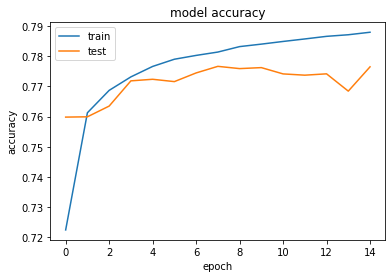

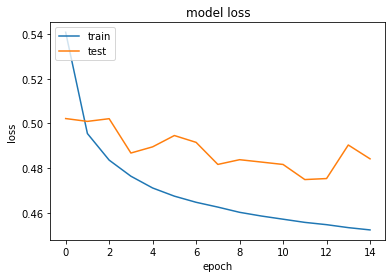

In [10]:


import matplotlib.pyplot as plt

plt.plot(history3.history['acc'])
plt.plot(history3.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()